# Assignment 3

## A bit of info before you start.


> ***First and foremost, dont use AI to code. Use it to understand and then write code yourself. Use AI to verify if the code you wrote it correct, that will help you learn far far more.***

> ***Implement Stuff from sratch. Use cv2 functions only when numpy implementation can be extremely tedious.***



You will need to use your own image for this assignment, which you need to import into here.
If you cant fetch your image from any APIs that dont need credentials, then :
To preserve an image in Google Colab without a continuous runtime or using Google Drive, you can use base64 string encoding of images ( its really simple )

First, begin by normally uploading the image into the contents folders as you normally do in colab or fetch it using Drive or any API.

To get the base64 string :
```
import base64
with open("your_image.jpg", "rb") as img_file:
    print(base64.b64encode(img_file.read()).decode())
```

Note that the base64 string is a very long string, click on the three dot icon to the left of the current code cell and click on <code> Copy Cell Output </code> to easily copy it to your clipboard.

Then, to embed the string into your Jupyter Notebook :
```
from PIL import Image
import io
import base64
import matplotlib.pyplot as plt
import numpy as np

# PASTE BASE64 STRING HERE
base64_image = "iVBORw0K..."  # long base64 string

img_data = base64.b64decode(base64_image)
img = Image.open(io.BytesIO(img_data))

plt.imshow(img)
plt.axis("off")
```
The string is really long so, use a multiline string in python ( syntax : """ """ )

Otherwise, you can also choose to use any API ( try researching on https://picsum.photos/ )

## SECTION 1 : Preparations

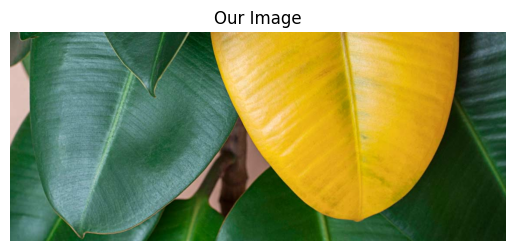

In [2]:
# @title
from PIL import Image
import io
import base64
import matplotlib.pyplot as plt
import numpy as np

img_str = """
/9j/4QAYRXhpZgAASUkqAAgAAAAAAAAAAAAAAP/sABFEdWNreQABAAQAAAAjAAD/4QMsaHR0cDovL25zLmFkb2JlLmNvbS94YXAvMS4wLwA8P3hwYWNrZXQgYmVnaW49Iu+7vyIgaWQ9Ilc1TTBNcENlaGlIenJlU3pOVGN6a2M5ZCI/PiA8eDp4bXBtZXRhIHhtbG5zOng9ImFkb2JlOm5zOm1ldGEvIiB4OnhtcHRrPSJBZG9iZSBYTVAgQ29yZSA2LjAtYzAwMiA3OS4xNjQzNTIsIDIwMjAvMDEvMzAtMTU6NTA6MzggICAgICAgICI+IDxyZGY6UkRGIHhtbG5zOnJkZj0iaHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIyI+IDxyZGY6RGVzY3JpcHRpb24gcmRmOmFib3V0PSIiIHhtbG5zOnhtcD0iaHR0cDovL25zLmFkb2JlLmNvbS94YXAvMS4wLyIgeG1sbnM6eG1wTU09Imh0dHA6Ly9ucy5hZG9iZS5jb20veGFwLzEuMC9tbS8iIHhtbG5zOnN0UmVmPSJodHRwOi8vbnMuYWRvYmUuY29tL3hhcC8xLjAvc1R5cGUvUmVzb3VyY2VSZWYjIiB4bXA6Q3JlYXRvclRvb2w9IkFkb2JlIFBob3Rvc2hvcCAyMS4xIChXaW5kb3dzKSIgeG1wTU06SW5zdGFuY2VJRD0ieG1wLmlpZDo1NDU0OTQ5Mjg5NjcxMUVBOUUzNEVGQjBBRkFERTQ2RCIgeG1wTU06RG9jdW1lbnRJRD0ieG1wLmRpZDo1NDU0OTQ5Mzg5NjcxMUVBOUUzNEVGQjBBRkFERTQ2RCI+IDx4bXBNTTpEZXJpdmVkRnJvbSBzdFJlZjppbnN0YW5jZUlEPSJ4bXAuaWlkOjU0NTQ5NDkwODk2NzExRUE5RTM0RUZCMEFGQURFNDZEIiBzdFJlZjpkb2N1bWVudElEPSJ4bXAuZGlkOjU0NTQ5NDkxODk2NzExRUE5RTM0RUZCMEFGQURFNDZEIi8+IDwvcmRmOkRlc2NyaXB0aW9uPiA8L3JkZjpSREY+IDwveDp4bXBtZXRhPiA8P3hwYWNrZXQgZW5kPSJyIj8+/+4ADkFkb2JlAGTAAAAAAf/bAIQADgoKCgsKDgsLDhQNCw0UGBIODhIYGxYWFxYWGxoUFxcXFxQaGh8gIyAfGikpLS0pKT07Ozs9QEBAQEBAQEBAQAEPDQ0PEQ8SEBASFA4RDhQXEhQUEhchFxcZFxchKh4aGhoaHiomKSMjIykmLy8qKi8vOjo4OjpAQEBAQEBAQEBA/8AAEQgB4AR0AwEiAAIRAQMRAf/EAKUAAAMBAQEBAQAAAAAAAAAAAAECAwAEBQYHAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUGEAABAwMDAgQFAQcEAQIGAwABABECITEDQVESYQRxgSITkaGxMgVCwdHhUiMUBvDxcjNikhWCwkMkJTWyUzQRAQEAAgECBAUDAwMEAgMBAAABEQIhMQNBURIEYXGBIjKRUhOhsUIjMwXB0WJy4YLwkkMU/9oADAMBAAIRAxEAPwD54BMImyaMU0brNEi8AJdpmhKoA5DpReGCCbCpZl72EchOAqZwkB4tRfPhxNjQi4KVZe4n434OjGYcDVpKcxIFuTx0SREieIqXei6sfZZpR5SDdDQn4peqMddLekc5MpFzU2Cf2ZCsrGw1Vx2neCX3Y8Y0BLlkRxjJsrZWvxo/mpt+bT+PE666/NOJ4GgcjRYnkXKbJKEj6IcBrV1gGYkOqjO3nrnBW3Q4km1FcCL2bxTgGQ9NBZVIM5S9uQYGjo+wRWlVUYJSYn4phjOqeD5RGNtQdlWGISqSycYS/RXhggSAC3inICxhjgfUXjsqR9iZegCP9uJGhoie04gGBd7BVDP/APbggcmG66Iy7cP8iox7QgPIVOisMAIacS/RVAfHLtx9zJ27bI9EkMECW/V1TDA0WEa7jRMMIdsSQPtA1RMMUPtI40SmLXCsY4ZAX8WQCyh29wWlsFuMSKEEWFfqiMOAiknJqQFj2cB9mQE3MTRAHHCMZAxNfivI/K9qcWfnGkcvqBG/6gvV/sZxrGTEB3BUu47XNmwShIuRWHSSneZmcdDnk8MwD0oAsxAcDwTwBiT7lCNOoQ5GTtQaMo8BUJes1d0wjECzyTmIBcAV3ScWLiuzogbkSWYAIswoUSTJokcWDUCHOMA1zvomGcx1qlM5SDW6IExkXkW6ocATQuEhGBAO+6PI7PWjo8LaDdMPbB16JmnEObKwaN9EQZaUCFyzIAFpM1ETFrFZy/pteiDgOTQIBSQC92+CTBGWXMHqHRnOJPpr4qnZgCRmaCIJWfcvCaHfZnmYg2ouEycuqZvvJf1EqBRpOBr0Y1KDuERdhqFo2VKYRo61ujJifSClYylxFykeHb+J7KXd91GnoFZHoFf/ACPvRlyx7TGWxYbtuusGP4n8Ych/78o9O9V817kjIymeRlUv1US5ufLou/brjxqdP91iFXjEig8tUnE6aKmeSVBponGQkeqv1RAgfuuNkDBjQu+yDyaIFxUfNer/AI7MjvZDSUD8l5IEo1XofhcvH8nhEi3ImPxCy70z2t5/41ft7ju6X/y/u+wjAv4p+I80cYVREC68nW5exQgBx6qkPUCTYJIBz0XTCMYlrUqFv25n5M9rgccWI3ayqZAl7AKEpsf26sl5uCHd9ld2knBTlczgYSH6jUpefIAMx3vdCOORiG8wnjChFQ31We12pzED2yGpRPEB+iInFiNNehU6yk8aFTxOnJ9TcgKboCUiwcsaB1hF2lZkwaosRZTcgpg1SgY1v5pwafNJLQHdZ9zGDmSl/JAGtNEzHyREWtqua5qitfcotpomIcMLpbFK8BnDIGjFZkPDzU7Xg8Ca+GqF7WRAdayi2mVg9dVn80DfotZAYOyxWJAH7FhboigHWvdEhkoIKAzV+iyDraoAEslkQiSpTLvqqkIJyDBSLmqYQJL/ABTcAB1V9C6piOp+KB3sE5f/AHSSj5n5JwYPjIMSLOEe8JlFmvEJYNH1SurZYPjEjqF1e2v27z5VG3GA/HiLRbzZe1Anj91914f44tK9HXvwgJQ6stexc3eeVRv1gDIQwk3wW5tUs6M8T1FxdKcRHhqFvZsnIksxISGUbChQkJUcEBYwJP0UbXbnEXKxIIYnogGIb5IES2SEl6hY7dyzrFRRw3mklqWokMiFvcNjqs73Nbx0PAe2H1SmJtdMZjUIiUaLOzW9KrlIirpCAA9laTFDgCsdtDlSqh9U7B0CGKylNN2WdMRqgwVymzokulstXVGAZlmSkkIci7J4MSAyVtUX81jIGicImqU3ZPdA1VGnIVSGisQ6nKPzVSglVtVmPkt4qgzqU7/RUNqKZ6p6lUsv2lfn/dF+5yn/AMz9V+gZvsPgV+fZy+fJ/wA5fVep7D/L6OX3XTX5lFOqKATAOu5xmhVduKBYEBcsI7Ltw0DEqomunFEarpjGQIOhUISiqwybfBWiqEkOicwMWKSXImyFAG1QKYSAoLFUExMcWqkiAQHCvjhG9k+SIxAayX2agmyrKVWC0QTGttEsFR4x4Nosk6Osgk08IusyeIZYuk8XiRKNCKqWbs+xyzOaUZQnKsoxZiqkUCWVAiyUrJjmFgMOKJ9rGIf+V5fEqOWZJHVUkWiVz8nmB1Skk6I2vgbuf+0EUAYFlzSrTUq2Yn3JV1soN6m1U3q59utMImNTXonAdvogXMWNVWECz6BVEBjjYrphxYyJ9Mfmeil6RTogZuwiKDROHOFfeJHEC+pTAgCtSoet2FDsqxBat05TyrGLkGzK4MRduq5hE7sCsITNAabqsm6xlxCkiKq+PNiABcPZcWHs45HlKbNYLoh28WqTRVLQ64dx215FzZlv73DGRLlzQFch7Z/UCQ1kPZBcEF083yDsHddvwchzeyI7zDEca112XHHDJ9W6rHEHF3F0ZodZ7nAWYsWRh3GFuIPqFnsuWOKFARXdOIxDkBjo6M0OiOftgGcAph3GORIJHE6qAxYshYvGRQn2kRJonp0TzQ6RmiJUYwYsHTiUTUkAUdrLhPbydwQ1iknjlEsQSBUMjIS/M9rGOSOfHXHP720kP3rijwMSS+wAXrY/WDjyh4TDSfTqvIyQy4M+THIMYlj4brLpcfoq8zLe5AHj9z36LNilVuJ20QEKHUlEQIpYHVNKWTK44woPmVOUJEP8gnywL0N0kYyd5E0SMvtnxVoxEQ1kY0sL6rEeaeBQiA9SmAP8rvqj/TAZiNkDKQI4miAakb6LcgbB+tkgBd9UXY1LSu26YjESf1Gp0CQxraqJNyaFJIk1JSMkwxaVtVeLY+2JP6i3koCDzAkWa6r3tOMBaIsst+bIi9XHkl5v8VKVE5rX4JJF1U6Kk4Ct0QzugjTRBxiV6n4TsvfzHNk/68dSvNxwllyRxxDkle53k/8A27sY9th/7cg9ZU7XwnivWeN6R5v5nvT33dGMD/TxUgNCvLkGJf5K0of+pK2khXdPGJhFttykCYl4lUBjkIf0y3QlDjUCm6UgCoQRpQPLoVuJCeGRwIny3TmAYG8el0FlEbgqvbZDi7rDkN4zifmlkKgxDHRasfuFRYpWZlnmeu2LL5V+gwfSiqIkkPbVcvZZPd7fFlBfnCJ+S7o/7rw9My3W/wCNw923iWeLRaNWSyymThmNk0hYDxTY8YBK31t6RnsnCE5EuGCtjw0oPFUhD1Bh5FXAAiNlc1ninNbg2wOyJgxNGcVbdDlX9yI5Euf4qrZ0g5TOEEk+YC3AafFWHoAFnSzFf+V1nddZMqmUrlgaLAb6IkjkRrulDs6w23ORpXca0KVnfpoqM9RZYROijbXKih3dk1LajRElwGvYpJbvVKya/EC7ONrFTIYdUXMn0R4uPD4rPb7uhpsFtETTw3QFmWFwoTRK29USaIO5UcgDRC4Y2TNugAP4KhlmCBKJZzVY2pbRL5kmSf4oCJJqjIaop5NiAkkXKc1ogIpz4hJpENoj7dKqjhAp58gQhlOScpT8AqgTOyEqCtTsmlemqViC481WCsCIPIE1Og2XaYmWIwJcCxXJG4Juu2DGJAq4db+2v+p6f3TDPdydt6cpGjr3sBPESegpVeHjaOcjey9jtyeC09ttZ3d5Ub9I6uTUuRUIgPpdT5AVd3sniSSK/Fd0vwRj4txEhsVPgSHJY7qjEmqzgaWRcXrDiJifjqllFz9Fd3FqdUhl+5Y7zXzXHPKAZSljAK7GiSUvELDftS+XKpXFLGQKeKmYm67ZY6MfJTlj1Zcu/Yxczhc2crkdETMmipKJ2SGPxWF9U4uVcByKxkCgYgIMbhHUCWWSkoEpyGYhBg6HPRDk56JzIHRZgVjILOCHTMjVosU7BKAqlBbWWFkzOh4p5BCSCgS6Yxq6SVEwDJSgaJTJXIBNUhoapuRF0k6lVCqOd+JbZfn2X/un/wAj9V+hZvsl4Ffn065Z/wDI/Ven7Dpt9HJ7rpr9QAqycRCUGqcBwu6OSqQLGi6Mbmuq58cXXZhYBtVUTejpxQcB10wxRjJyo4yFZyz3VxNUM4g7up5YAlwhK1FnoxQR4AyAGgTPVh5pMeRmGivHGZAyCZFcAIxkZR4vXRaOKRLbK2Lty/UI5JP2j5rLp4VtVlkYJy8U0QgAnjRYOrDSUslqp5lc+SeiEbXgk5kUUsbnNHxWlKpVu37eRicpoAlbIy5tSzVyk/FJIeoHdGQeZKQVlQ0S8WG1VBAoBXVUjINvE3Uxd/mqxgWVQCwagfxTwLWDN81hL4owMqsmDAEzJ1KeIu4S8TypQaJzFogpmaIFBpurw9oCvkyhGNKFYZBEsRbVOU3fhy9vEEGPmnOaN4hw6hhyCUDEQof1KgqwFCFcob+4ahiW+aw7iDfZfdEg3NQEOD1LM1AmGn3GnG1ilOVxayxjKjs3RAj9JFrFIFGfeN9RoUpzRIaUZPYlV4gkClbFaWNrgHxQAx9xhiQauLFXxd3inyJN6F1ERgTWDUoQsccGqK7p8h0CeGRLMzLCGIkgEea5zCIL1r0WeNK1dGQ6JYYEvYs1Fz/k+054BniXyYYtNv1Q/gqc45CwpILY+US7uLGJLgjUJb65nHWdD1vheleLDKbAP1TmEjU33R73tz2ndOK4Z+rHs23kgCZ0u9Tss9bmCzFRlj613SxiZF6ll18QGEvV0CnllGJbHTdPBEMQOg2QDgOzbIAB7uUeE29IfxTDMLmqYRDP5oAZR9wdkSbAiiDgFyHJY7BLxBFqqkpRBO2iSU/ADZBl4gXBOrJZFhZhsi8jV0kwwfU2U0qbBESzB7BJ3WQGU21LDwVsD4sU5tVmHmuLNIlgTUrOc7FOqRLRSsLJpkW0S00VrAhvBbR1iunsO1PddxGAHpuT0StxMn14ej+I7aGHFLvc1BEeh915/dZsufNLNImth0Xpfks+OQj2mEgQxXG5Xm+2W2GynWf5XxLe/wCM8ExCMzWh1CnOMokx0GqpLGLgpBIfqDvrsqRlFiDSoRAEn0lsrEG8Pj0UZQYghq7IKgwFDfTogDMScUTxY0NExxMxDkGxSwDCZkGADpZRl+qpW4SBd/IKgnGQAlQhBvqv8eynJ+Nxg3xmUD5FwvbxxoPmvmP8YygHPgelMkf/AOJX0wJagXie4n8fuO5PC31T6vZ9vt6+xpfhj9OD8fUBen7VeERfZSiDSRvb4pwJHVV29p1VtFOUatQsyaETK/8AoJYY3k5oArxIjWi6Neeb0QAxhqaVRMaEahG/QLUFrp3AJQlyhKvqsQjKnmgIk3oNAsdr4KiXE7XTRjpqqsLNogzElqMs/QeSgM26BZzoiSwAsUsn1StxODKWFr6JWehTNrrogCD4rDa56qjAB+u6D7fBEuS6Qm4Cz22wZZVrZDREOiACC2lljJb4GVhqs7HoiwZzdJIhwCnNb1LJiAxSBnIdAyLbN82S8mPjdOzBZHjqVnPlolMj4unuoOFDuyLdVhdYmrCyZjog61GolL6XTwGKU1Ta1SyTgKSkJqmJZIbq4GJHipyLnw0WkfJZtkytblWlyu3tjYHWhXCLtqu7tR8rq+1fT3NL8We3SpZRxyiTasy9fsyBjD6ryu4H9SQ2K7+0keIF1vrZr7jbPVNn2x3oxFqeSiJk3imOQWs+q7ZvGeFHqaUZAmx1SBtJVOyabM2m6LtwcajkJDEH96x3Zlg3kotl6qJUFAuCmILusbLGzqpMk+PRD9Nbp2HydAh3+Siy+akyBJlMgV6XVTEhJKLFYdzXxsOImFVPXorOlIAai5rJ4VXJCPNIYlUICxANUpcGgywBVDFZleTTPRAlMQg3wVQAJdUQUhDFYungKBvisUh0WEkYNteiSYdOapbqoEyN0nAMwVSEpAZVKEjZJIuWVCCHUrnqFpCqfcFsct2K/PjWcjuT9V993kgO3yH/AMT9F8CLkr0/Yz7dvo5Pdf4/U0QnFPFTBTP8V2xx1bGQCxsuvGQD0XFjBJXoYcBoVUKrRJP2qsebWVu3wb/Bdke3gKhXNUVxY8c520TjAQa3XXxxxL2KSc+lU8AsMMRe6sYCEHBqbhTxguORZGeXFGQcumkRdW9zjGlyuPJ3MRWKme5lIk6BL1QV38+vqWXme/N3WS9ROsXTOLoRopTnXosXVbhss2FFx5JF1eUgXdCHbnJJ5UilbJyxuaTtsByzc0ivSzARwSjGwDJYQjCPGKOYNhks+btmotxPTPrXlEXSQrJgPimf1HrZNDGX2VsdusPEB2NhsnJNtBZKRo/kmBi4J+CoGjEE7A6pwGskjJx6aMmMpaJw1IuXLp+JLPbRSBk7WCpEHU+CYXMREXFqqvb4sUm9wuFy+5F2uBddmEQkOZLMKMnDXmaNCDQFlGUpRNgSrwyGQY0Gic48bRoHN1YcUs2QNQbpPfm2jrulhLfbTRSl28tYOjFDjPc5DqARoyH9zkDOa7rsOCIFYgN9xUj2xl6scROOhslihz/3UjXk5F6Lf3eQhnB8VX+1yEfaB0KxxzB4e0KXKOQke7ygikUB3+kocgdQVY4QQ5xP1CWXaYyCY4yCLxv8EcgI/kIagjon/vMBFy4rZRl2WM19UZBJHtpAmhdtkZodWPuMMg0ZAS60TDPjk0eQrdcBwzjKhWMJE2CM0PSyQxd3il2spDmfVikTaW3mvJjyxPjmOMokiQPTRV9uZLtUK/cQPdYfdEW7rCB7o/niP1jqNVntxfV4XqqczHjE8YiQ7fFJLHycxQx5TwZqnVWjEM8j4hX1S45AQprusJt52KtMYTSAL7qEoQFQXKQOCbk/bqUnuEAsXCmSDd0WjoKIyo3OLeCwjEh7aIcaUPigzDdBZ5FiCwKlmJdurOqAGl62KUB8oHkp2vAvRTODi7eEZC7nxXBIgy/YuzvpynkMTThQeS4gK9VOvmIWVTSj6JQGTSBc6EaJE1CAZFhcr6DBjH47seZpnyinQLh/EdmMkz3GUf0sda7q3d55ZsplL/rtEbBT+Vx4Tqr8ZnxvRxyEiSR6iandYF6SoQLq3oL8TbTVQyPKoDS6WV4ZAYGNZBIYcg4DEqgmQz1GxR4iYeNtkEg0oitBr1RgIzBY8ZNY7qntk0LkVSe1OBBZw9WQXKfA2N+tEIylEtcD4Kx4k+qj6pCCA0Q8d0ibhKVi51ScNNk0ZTiSQB11TRyxkXyBtv4oOdHX+E7j+3/JYhL7cj4yf+Vj8V9zjAP7l+eu0xOF4EENuNl972eaObBjzi2SIl8QvI/5TT079vueF+2vT/4/fOm2n7b6v1dgDggDqPJUgxZlogJoBj41WevGHVT8Xd9LKhiN6WQMgHB6FAzGnwXTnWROB3G10spOWFVqyNmDqog4DhlPO3QdCCJd28GTcCKtQ6KkYhmAqViRBquyr0STkZSYA7gJJEGllpO9KgoxiDU3CyubcSGThKXgkmDuryl6FEuxfZZdzE4l6qifTRY2RJpSh1SSr0C5NtvLmrB3H1ZZk/Gj2RYMOl0TtZ/IskEaeCBYdNyiTsklI3OtnV4kgI5JpTqUkqXunID0Hmgalljttj5gjuK6LcHqnEd0Q37lnk4XiB/FDkzpykaqcMEC+tU5CxAZPJlHh5rFkOSEifijJZAyfxQLJGq+1kSXFfgqK0CQpmxCcpW3TkGCgeRSmWgRk5sgIVVRN+DAHku7tS0hHc2XLAMeq6cEmmBr1St+6XysKzg/fADIW/UHfqFbsiTEEBJ3EOceWtkfx8zFhZ11bf7+m37kf4u71Atd0XJ3dVPqb9qVuEnXd6WWSHiWLV1W8mTFpFmLLUq5U3VcpDU3ssZEeCLPV6BAxcfILG63wXKAkbHRZ2B0ISkHzCEjpZZ23BmBfwRe7KTkIc21WfrPCsmLJZMl50W5ApXbr8TJKF9UhhQKxkHZKXtuufbWeBoFwbLalVIHkpmLVCy+FUQj4oEpyKpTFlUpkKxsmZLJVDI26HFMQWQVApBQ1TkoEKpQQ7JQSnIdKyoFJKz1ogUpKeAMgD4qGpVCVNXqVcf5IgdpmO0JH5L4WK+2/MS49hnNniQvioh16vsZ/p35uP3X5a/Kj9U8cZKaGMOCVeIiF2yOWnwYo3l8F6HbwBY6BccMkQOqtDuCzRVzERXowl6iHorSyxEHeq87HOdUzmVCWT9SXR/cxeqnLuw9KqOT24AVcqUJRDkotJc55yJIskeT+oqUu4FWUxMmTqcnheRfVH3BELmlM2BWclLKat75d2WUmpaiyWSewSWXMSTJhV16GLsO5zFuJAXs9h+BhAiWQOVndvLl1fx7bfCPJ7H8RlzDnMUK3fdse3AEQwF19lDDDHDhEMvF/LdsJRkWSuvjVb9ueizV4UJAxQ7kvgISQcSMTomz/wDSUp1cVeb1IshGUv4pxuzhaPwcuqjO+AxuH0RAdzoEeLVe6womSkaRpfdPGqmCT4BOJS8lUqjxDlOIixokiZE0oyrDHyBJKYHHjiTv0XoYMc/ugAemjLlw4Jk0NF6eKIgGJ8VWsNExzCTmIgEfVTUixVpGQ48qwclkvNv0gF1YSOTKLRpqhHupc2MXOysZCRJCWUK0iH3TAnLIgf03PwRM2HpgxKnGcokiTHwuqe9GER6QZGkgUBM5SKyxu+gSnuIiT+0SNlYzNCQBvFIc0SbC9SEABnxE1iYvYLcsT6hCYjKwDXohExlEuDSzIAynAxu53R4gsRIF1OcQzh2N0sYh+IvukDzwxJNBZSOGLRcUs4TyZm5MR+1TJmIekkjRATOKPKjhqJIc+3yjJE2r47hOZZBUXN1PJKRYyjUaKbIMp9/24hKPdYQ3b5Lx/klrFJF8kWt+7dWx90IGWPLDliyUnDfqOqnmwHBxy45c+2mfTMadJdVnL6bi9PBV55n1YYDcW3XPmxF3enRdJyHg0SyjKJIq4G6upcoDAgAsmHIMLCyoeEQON9QgZ8qFI8pm1S6YGI8E4gJVFUsogFmqgJkkmlAAm7eIeWWX6AjMf03ld2RYR7cv+tRsK5ZAz6kl3UjLi3G41V6DHb1H6LmcCRoiTEVOIU/dWpT9t28+5yjHAU1KkHkWFyvf7Lt/7Pt+ZH9bIPgFNt6TrT1meb0g55ww4o9nipGLc5blcsoSP2/aPmqESmeQ80h5AsB4jRXrMTCNts3KJhX+Ui6X0l3oV0Ti8PSQPnVTMX+652TJzzxysQ406JImcS703XS7Uk5CE8RZ4m9gapFYAnGYYljogRRg72pqpywSgeRFNtVXFlFRIV0KBnzJLDrxpopEcGf7TWlV1zkWeALtq4DKRhEtTiDQk3QMJ+1y9UWrRrlTMRyYuFQgwl6Q767JxkiQ041OtUFx8koOCQ9F9Z/jmf3OzOF3OGRiP+JqF8tKJjegXq/49nlh704SXjmjT/lGq4/+Q7Xr9tvjrp98+nX+jp9n3PT3p/5fb+r7OE/SzOq4xy6NYqGCv7l0wDE/JeX2dvVrK9WqkEsKORdAY2Hyqmj9276qpZl2aybdUW4JGIYKvAMNgliCRRwRQJ4sA1P3rTWYiaBcRprqpgcvSfDomMiTTS2ywgbk+ACVuacIYxh6fqkcAb6ErZAS5dIHAWG+2LZ0XIBLAkqZk9BonIv81uBuzBcu+t26dFRHi58E7CjqvECoUckiKbImk0maM5Zw3ikIP3fHZYF2c3QyzDUqNVNvFv6AsjqNVOR5MNU0ou1U4hEAFZXa3M6HgnBxRKSypI6CyRvNZb2Z4NjJw7JQPJk37EAkeAWbUpgz0uldi6eutvQZDSqSc2smMy31UCKk76LS6yYyWR5FnW5UfZZijxCngguHHxQIp1TM42WA3RDIx1WYJyNNCkLAqpyZOLFEhCcwKJeRKoGcM6fEXk6kz+KpjAFZaKb0TXoSJ9lxYH6qHaHhmIeuytjJlhMSL1XPCPHMQb6rfuXGna3nWYZzxj2nPF/MBM+two4J8ou/kqXNQCvS07lusvmyurNUljaybiNPJKaCoLLcuLUIKr1TxGCyhXwSkHi4NE8pRNDqhYF9dFltNeVzKRBJEtBcIOXbRU0SEAHqsdp8VwvEEABLKGyYUWa9fBZWS+BpkEdWUyS6u4dlMxDFY76eVVCcqn5I86ocd1uLllz27z4m3JYEEF1OUTos6jBmoyDJXaqBJd1UhmZ0pCPIoOCqgKRRkpCo4SmqqUJkFZkS9mWZVkym/wBECESNEGuqgJIOkPzTlTcgqoE5VskDFUmp6LSFXmfnpN+PydWb4r5CK+r/AMiLdhLqQvlIr1vZT/S+rh91+c+R3OieLvdIPgiCSutzOmAjqV0QMI2XJEqgBTymukZRv5Lc5NsFKA12TVkEESUySXSmThgqDESqQ7Y60QHOAVWMSbK4wgABUGJrWRgsueOAyLlVGIK8caoMQdk8Jrm9oMsuz2w3FqrIwT7yGDFCwCo6CyyeiYLj73FygV1pckeUWQHxneYvazPobqGeQ9kr2/ynbOCQF4OUtiIOinxcXe09O1vm5CfRRKDqzDZEtxQg9QSqjmpmJD6JxEN+9aIbzTgPZMMTxDabp4j4JIgEhzTZWnKDADTyThnhallbGX0tooRylnApsnEpFjYbKob0ISjFnPinlmuTJiPNcQL/AL05BIcGiuB1SzYwL8joknk5tU0FuqlGAYG+ysANqpgPeMS9wQzrHNMAMOjoFiPtZM0uI9NEBP3uJBIeqMsnIEG+iJjMxYRDaoRxTdyLaIBJdxlcvZT97JxYM2quceRz6QyxwF6DwZGKET3OSMePEboR7iTOYtunlilUSiEhxGzfNLkN/c1Zix+DKkO4iDS43XNPHOLek12S8TrEu/mjkOqebHIE3KEcsTHx/wBOoRNLGtCllAPQpZoX9zcvu2y0iNLaDVc3Cha6UCTsClmhY4+TMHfRN285YJHGI88UvvxysQVESyR+2VLBdeDJGXEzhyNqJXFmKJbLmId32ku3bNh9fbyqDrE/yyXOCZRoXrZex20RkzSxBjhkGnE2K4O+7DJ2mUSh6u3P2n+U7FRrti+m/Sq6zM+sc/ASL5PTHdSlA7NHddEScg3Oyxx8RudlphLmA0AusMe9VUyxg+kF9CUC9fr0SPKE6MNEO5JIjAfpr8UxDzjG5ukzn+odxRRt1LrUMhIxOdTTyXK7eavnJ4RHUpe3wyz5hjGvyRavm2R2/i+zE5HuMg/pwt1K655zlmXDfRk0+MMccEPTCF21URESo7AJay/let/sW9nGs8P7nOPYn6BLxJ+6+6wyMeLPGwVngwYOTZaRDnMDE8npoExlGV77FUMHLE63U5xr6Q4/mKDSIP6h6dSEoPAvH51Vb0JTewbBq7pBAwOQ8neRupGE+TxiCVc48kZPGp6JuImCLSRgVLFNnhkBBNjcAJpQlWMDyif9UQ4VadRumJ4BhV2bZkAnDiGkzG6jKEQ8oXH+tV0yxxkBxAkBcpThItFvCoQHPCQAAPqibgrqwThiy482I/8AXIE+V1M4RKp9LVtdQlCUJMPIKbJZZelmKJbLLOs5n0foXazE4xkLEOD0K74igXzv+O917/ZREy88RMJeVvkvosZBA6L5/tz+Pu9zs3/Dbj5Pbm02013n+UyeD8tlagqSwKkCBXXonEZSIJoy7NL4TlNES5AiNANVogkhzRNCMY11TGVaarSTxtTnyExiPC6kZGo1ejaKhL+GqmeMQja/Q4jM6XKmXTycllTHjcF9LbLl9N32XnBIRJHI22QJAcaaK0mAYWN1yyYFVvPRJIU5bn6XZjspya5QlIiyaEOQMpLntu1xOcKSKzJyGSciSPmstsTr1VGLOyBdmQNzsULhljvv1h4aWjea1Sszo8Tp5qZLt0h8FZ0eLDwRIAshKRrvZlrNJJm9StJIhRkS9KDUJ5M/11U2eR62CJeeABJemtFgC5eybjVkQDrZTvepFGo+CYDeqPHZHTqoOQrHT5oGg6ppFgoz5EVoNlesUEpirXF1MknV90JGQ+0ONkfbJqTfTRaYkBWJsKphD4qkYsK3QlLje2iVpBQdSs4dkkpsHsEgybJelF2j1u3JljYXXPlJGYS3Vez+ylSp9yGmNADRaW57En7aifk9LtzHiP3KwOrsy5O3yERFPgqDI7sSKrt7Pdno1nwRdeXQJAmhc1dNRmvq6lF2u7o8jstv5PMSH9N/JTlxNlnoK3WZrLPbbPgqQpDGiSbt1Kc8n8qpZFzayy2+CoQmVrFbl0oFjIP8kJUssrKY0JZY2Su7AIOophION0D0R66LLHadTJIJCGqqlmO6QhY2YqoSiUiqchJqVUMtjRYorHZUCOVjJYhLqyrAZ3RcIEVolYgJyAzhAiiUlDkVWDYgspkapzIWQoU4EZ2SMwVMgSEsCtIVeD/ksv8A7OMd5hfMhe//AJPL04Y9SWXgxde17Sf6U+OXn+5v+p9IIBVIxCEQTdXx43K6WDRgSzLohgyEOAwVMUIgMV1QpFtCnhNc8O3OqrHAI6UViwNLDRabmr3VSRNIMcSiQBK9EHiBU1U/dHwQSxHKQpRZwKFTObyZIJEpZDqjx1RlkAtdQibHyWkXkjJLe9J30ZZS5R5M6yMk/SEEVli9FlkFkByd7hEolfKfksHtCRsCV9pOPKLL5z/IsIh24k15AJY5jHvyXt2+T5sSiQdUziPipxLSO4TACVTqiPOt54UEgaCyJkzEUJoliKNsn9NtSqMQB9ywjWtymiAAOiYcdAqPCkMZkwCqMVQHUociCdSq44SIBJqTZUbohwZqBODGyQYhYl/BUgIMQY23VAfckGIiG0RMyS4HitEgAAAEA3RcuZRLB6hMEMp7LcszWtd1QCUrhOISs7jVPAc/uZgGpe6eMsolpX4JzhBB4kqUsc43kR0RyDmWbjy3uyUnJQtZNjLA1PULESYtKmjoBOWUPyjTTdKMxqJRHJVhM8CHfQJRGMnL6IBDlfjGUDTVIZYneTxIVTAxZz4boSjyuA7JBIiEiz3UzDiasYmyYtEuPghyD8Lm6QKY+hwxIKlwL9QqmIoY05fVSg7y3rVKgDHkCwqCujtogD1D1GyTETyDl9G3C7ssYDHGJ+6VzsppK9hiMYymbSsknnJzGJAnhk4nHcBdGMDFgobCgXnvMAzZncLLWZ6iWzGEs3a+0ff7c8+3OuseklICM6uxFPNDB3WTts0j9+GVMmM2IV+57WIEc/bPPt8m14nYq9drLi9L0rTjaZn1iEsFQABIbpZYWi5Ztl2xxxjDlE6UUcuMY8cpGTnYdVphDz4xIymWkVzkxk5L9PFdcokY55Sb0XHNx9Vj/kJ1rnmTOQjqF7XadoO07X3ZhsuSz6BQ/Fdtjlkl3WYPjhYbldncdzLNlPINECg0Sxdtsf4zq0/HXN/LboiQJWFSkIJIBF9VYNKgoy0gHtYXWrNzygRKoppogJGEmMWV5SEfuLtZTnxNxQ2KWCNAvJwX67IxAeVXi1r+ai5gaV/cm5Ehwb3ig8s0eJMAw+iA5xNbJonaqfiZVlcaaJhOUWiCC726pJQIfi/I+SqImFSfJNGEDHk/q1QSMZEkDIKhJlgQepuumEASeYcCrqZyxBIMXexQblAlEv8A7Lqwy5ikrXB2SyGsWINwyi0olxpsl0DplEO4LgeRSGEZhpNE/wAyOPKJUJaWyoxZyAyfUOv8AT23eSxO8M0XDbxsvr8MqFfB4zPDmhnxn145AgDYL7btcscmOM4mkgCPNeJ/yfb/AI/cdvvTidyem/OPT9lv6u1dPHS/0rtFY/RWjOm5XPHl5KkQxZ6KO33LnMdFh5Eklg4us5Ae3RMWiL0CjKRNRquq7yfGoxlT3Iin0WMgSwspxgSSdN1UARqSymerbr0O4gQxxjWV9VpSaXS/ijIybqpZZV+iW201nHAnNLMmuxUJ+osKp5OUeDAProua53vwX0ThAGp0RySEY00umkQI0USXvqp32muuJ1okAlw22iT/AEyJLH5BCIJd1x7bXa8dVlZ7IiKeMOicxahDKtexcZ2FpIhY0iiaJJVb5rTia4wRZEH7apS7vqmjAALEUU7XEzREmFXW18E5D+CHEBY+rPwVIACADCtSnb/dCgQC6P8AEJSTp8USXNUDEnoE4aU7UqUhhIsZFxsr8SAwHmiI71ZX6sBLiT0CLMCAqH5KcpAeKXqtK0popTkCKoymozLjoq1ibSTkJUFhqlBYsEaiyFjS61jKvU7GdG81TvQ1eruuXs5GJquvuD/Rrslrzrvr5fcfjKp2sqD6rpiwJO64+zLBvgF3OGBIq66vaybdufBG9xWF6C6Ilo7eKAIenwQMdRULovb8im5uWguty3opGJAcV8VjMtXdZba1U2ihkN0hkbBJyaRdkXBKxu1i4BJsxZKb7JnrutQ1Ki7KkCNA61XtRFo3ARpdKgrBmShwCNU50GqUjVY7YMllnRr5lAgMywqipDdUKQpwylmSm6YhAhXAGiUjXVEoEqoYNRAuDVMC6xD1CYSkEpFKJ5ApeiuAjIGiYpS4TgLJj4qUrFPI1DKcjQq9esKvlv8AI5P3OOGgi68qNKrt/Oz5fkJA/pAC4ASvd7Ex2tJ8Hm9+57m3zdAMdFTHIuueKtE7LZjXXAPqrRyiNFxRJIuqxiTc0TyTplmepU5dxKdBQbpKIyMWGiMpK8pG6eEHKTmB4JfdbVHAX9FXKbnGMaarkOR6BH+pJLJOj3aUU5ZibFD2y1UwxhHJYI8rvVZW4RZtVkE/T1lkFm9EVlkEAV4f+UxbsIS/8wvcXjf5S3/t0X/nCIz73+3t8nx8DEuTcoxuwHghAX2T0enkiPNECRZVhGh2FUj2ahTh/L6qzYRJrojBgK3dAPIsKJhiJkyAvGWNnJYnRk8covEE9EvtDjQVVsOFtKqzGOQyJoQmiZMQzk6q0MTX1TyERVlUDl9euiw5MGkzq4OOoHwSOAWY9EAoOV70VImZB9dXrohExGlyxdGUb8Q4OqAw/wCRfZKQJ0JKBJsAxWByEg/FAaWGQN6ISxEBnqsMk2INkwyWcVFigJCMh6XpZDiQL1F0+Tl90RUFLzIcmNaeaA0oux5fNA+5INEnZHlFmIIOgVIzhEB39N/EoDmnHNENEu93UZHIPX8F2yOOVYkRc2UY45F6uA5SsCHvyEagHomjkH8tDo6EsdJR8wPFCQkMdbix8FNyHV28MWQinAm2y6jjOXOIRLcakqPZCJxyyG8f02ddXYxEhKUaVus97x8yDvcnCIg7mV1DPKAxRjIu1gE/cQOTuJ43cD7SuPPGXMxNCNEazEJyzMHoGXT2HcDt5nFmeXbZqTGx/mCgcOrtsg1GPkdk7MzFVrbLl7X9n7eTiWOIh4HQg6qXe4BHGIRF7o/jO6E8R7XKaxrhkfojnyPiJkfU5Egr0uZ6b1i9pMZnSvJ7wCHZxEReVV5sgZmMBWRLBeh3h5dvGO0qpfxXbe73YmawxDkfJZb3GaWkzth0jEMWMYBeIDjqkAIJIqOqpkHuEziXJJJ6JYlz1CvWYkidrnak4uSUHJvoL6KxJtGoGySMeW/VMgALu1NEs4EkkMypW5DRG6Wfrbj9uulUzSOJzQ0FypcSC8L6LoYRFD5JSAAZ3+SWCLjIFCPUqHKwtXdczyd9dlfFN2Mg5FkgMi9ZC9gEphOJuxdOaly3JGIqxDgWdMNDI8TEsPAMllCMjWIdNlh6DIByVKE+ABMfSUAAZQoDyjrsnOMGsGrZ07gx9GqnxIL/AGy1QEjjDu/q+StDKRSdQCjGcT6ZAOLEJSJgkEBtAUzW4RIMo/EL3PwPc8sMsEj6sRod4lfPQlIFwaG4XZ+N7n2e8gT6Yn0yGjH9y5Pf9j+b22+s/LX79fnHR7Xueju629Nvtv1fZ4y7KrA0sdCubFLbVWi5Xie37nq0mZnwerZyc8j6WdNjxB+UrBGMgJMnEi7NRd3b11zm+DPa0WCUgf63RfailLIX6La7SIxRnJ+W4spnG7E1KcRcgkWqtkmAwGmqx21l+7ZcvhEzxBqpykXcrTIfd6BSnNyw81z93uYlVIxk5OymSSQyZiZbDVPGAp9VzTXbf5L6EEHNU3DXUqjcXHRDlRzpRbTta6lnKZp+1Eycv0olJcltFo0vZT6s0YLIOP2JQNSqlv3KUi3msu5ZryYE/BAuRS6YAn9ixH+yxt22+EMjfFZqBMW80hJbZR8DaRLADRK4KZkp+KeQQAvW5TssAiBtZO7GC1ropJFIglILmnJ33VJlxspmJ011WmsKpEFqoSFKqjcXU5UB6q5UVElyw8kYiqIg9U4jWqu1OFu2BEn03Xfk9WEOH0K4MZLjovRh6sRceCnt3/Us/drYdnCPbEDw+i9CNhxND5rgwj1GNmNF3Qg0Wao2XX7Pa4swy7k5F9KEC/msKmtALNSiYRLPcIxcPR12+qeKMELs1H0daTxDkOEwA5OQwNFiAQR8FntizquZQLW+qAGxqqGLFtBdSONnrRYb6xcrV1Qci3wWEZPdxqsQdVzba+MXKwJTCWiQ0WqVlbZ8VH5B6rOFMkhDkQs/XPI8KNdwxKBrdIMgR5BnKjbmmxBSkJndKao1MtaLG6ZArSBOQ0GiVinQ06KjTqsHsmNUodMBKT0SFk07qaqAzpSKIGmtEOXwVYBSGLKWWx2VjUrn7iXHHM7A1Wmn5QnxH5KXud9mkf5m+C5wGTZJGeWc/wCaRPzQ4le/pMSTyjyt7na3zogl1WFw6SIIVIxdWmqghOZSsEscZKrHGdUJT5MGuUCSVf24hYwGiLCQ4yNU8cNE9kQX8EYI0cMIhyUaCyVzKiHEjVBGd0xNEBxj4oughfRZZlkB+mrLLLN6DLLLIDBeP/lX/wCuif8AzC9leN/lJ/8AxsXtzCcZ97/b2+T44E1FjdlWEdB5lSiA73BVcZr9Ep1eaoI71AunDAB9VMBtU9WfRWZo0dx4KkORmGodUojSiviiAHJ8SnAeESQxNi66YAgj5rnEgJu904yBzV3VzAdWTJCJSwyQlQl9fBc5n6qha1Q3LTqnk3RIi8Y3UpzMS7joEeUmvf6rSiDF5ByfqgDjnF7V01TGhJY2ULfaGZNxykOCWZAYSPiQ6YzMhRwblR4zer1utLFIOQUAZTBi7sUHsQXN1M4yQHieQ1SNIbskFhOTs9rhPEvSVgXXOYODTxrVKPcidQQjIdJiJyPG4t5KYlKMjGWqlzygiTktTySTllB+7q5RkLEh2AO9KoEtv4bqHu5IEOQ8tERlm4BYyjqlkOj9PJ6pwDLGImofZQh3JE/XEOaNo51XpdtLFkoYN+9GSJPjjxjHEgPddOGBxYSft1fxQnjgcwiA7eZTd9nOMRiwaX+yx252+Q83Bjnk5zMyzmhOylmzx+0i5+5W7qbYwBFiNVwE8hxv0V9ApJ7CqDEtXqkjKW1BdUH2vFOGwBgQYaF/NU7nLKUDmD8rT8d0oIatDsmjiiQRI/eGI0bdFnkJf0rhyz5ds5sS4XV+PIw9jlkPuyS4uNlwTBwSn28w9XidwuzsJRPbyxu7SBWd5sz5xevF2+VXEQInjVwl4AilSjIH9HnsiHkALbrXCCRofV5LRLAk0OizjlfT5JQ4IJ+0/JIhkeQZ6m6QgRJ4+oihTniZOKxFikbi5Brd0GDmRGgGiHGU400RMTFyblGEnepAdymCmIjQCooVKTkuBVdEqSLXFyklGNAfuNgzhKkGKYccx6jurk7AFc0oEEsHl4JsEohzIueqAsIyiGMeUb/6KAwiQ3j9FcShKI/k+R8UplGLiMX5AUPimaHEY5lvtCpHhMNc7bJuEZvKLPZTlEwL2loUAxxYyKVOyUSMQ0w5FHOxTQlB/XfomnGBEg79UBOUMZaUQ4GqjlizThUaE6FdGIxbhYhJL0gsxCDj6f8AEd4O67PHkf1j0z/5C69aJBYr5D8F3PsdxLAT6M1Y/wDMfwX1OOThfOd/t/8A+f3W/bx9nc/1NPr4PX7Pc/k7Wu3jOL846pfc4R5elyHa6nEuycElwFvptzceKrG5cj0KJgIdU0XgLJZkyC6JMTN5qSzmX4imynKRDAoSIa7EKZk5DCnVYdzf9arWBIuWS+36g9lWMORBTgRHisZ2rtzsrKYixdOW0smFa6CinM/HQLSya6l1oSkwropEG6oxlUrOATsFltnbrwZeLVSGycmjHVTJq2iz2vhFAZF0DF1TiG/Yl5CPVZba4n3UwFEJS6LOg9aLG7cYgwUoFmdE1Quohhqs3RMBsiwZ0+QUA66I0WKUkV+iQCRAroVEpiSaaboaMqhEa/VJJgD0VJUD7KQJkHZvFXAUnlaqUxod1QDj4JMhb9yuFjzIwiEpkViSUviqkRb5KY5l2C9TFN470XkwNfNep25oOqJcdzX5l4FxyHunY1K74WovNkeOamq9HCRKDs2xW3trt6tpPMtpOFeXRNGQ01upydunVYOL/Jdn8lzzE+lXjGTtokMACtE1ZY9Ai7SnISUXLJCC26qHGrkpZAv5LHb4KiVuqV/NPx1tsEhBWO2VYYxFUrELOR5Lcn6LG4+Siyd30SGvRUJDWskbRY7Sy/1OE1ZFyAyJCDJZyYcqovRKQsVRm5DVZ1OoW5J4ByxogUokLrct0zYgIMEQQStomEp9UlFSYPKljdJIFXAUgJJUTFJIh1cAOWouD8tm9rs8sv8AxI+K9C0eoXif5FmEez4azIC39vr6u7rPijuX06bXyj5UAurwgkiwR57L3I8lcY4vVPERC5uZTcyFWSrrBBsUDNqXXOMmguiJlGSdHN0K7qQnI2WeSAqwFzVYSB8FMRkSqQxyOiCNyLUsg5+KrDBIizK8O1Y1TxSy5oxKpHHI2C7B2wpRWjhjEBwngsvP4SWXoe3B/ksj0k+6WWWWL0WRQWQBXi/5Uf8A8YP+YXsrxv8AKQP/AGwP/OE51Z97/b2+T44EggaK8I1cfaVzh3bQq3MsID9KU6vM8ViA9KqkSACDqoxMm2GqaqtSsZMwHxTQJNNFOESBsV0Qp0KcAiNeifi1btYJSADUuNVSJgAdZKoD4oA3uqxgGaIfcqfMXa4TibRAAbqqhqQiwETpcoig4u4CmJSYg1erowPMkGhN0wp7MiBKjXoknExLA3+qaJyn0uWAsl4EnhybdMCMbueTMl4mxNPot7RgWc1SkkUL8TcpAZRAdSOMk8jb9QVTyZncHU3YIQhIPWhugIyxjn6ShxLnomnCYiamlUGmzktI/RIJyhShpspTFeipkM7BmGiSUjt6TfxSCcojkCWIZ4nqEDoSATssTIVMXGyQ5CRUVsEgoIxcyZ9wvR7SPGHI6BxuuLBKOWmouN16IeOIGNjRtUiW7OAInkIc6F1zdzklkzgfpDMu2EJYcEjRyCW8VynGDD3JWJvqFnrM3I8nJmnIu+l1zkRJIgKi6rlETOhfQFJKB5ER1VgvEtWiIia1ZPxLAO5GqPFrPVPBhHiYncaJhyNBYXCABIG2hTcpC7DZBJ5u3j3Ea0mPtOoXP2uDusWf0gGMqE6LtII9T1NymiCGFn1KnbSXpxfNWu2LmzLasDWtFIgON9QnLxPKFzfqkLuXuVRELGXqLbdVnJpTZaQA4h6myAoa6oBSCC2moQLVrTROWuS72UpcoF9/okQyJ9PKyzVqb1RjEl5GoGqDx5vd9kGaMw7kMUxmCXAtZt0mRia2SxPLZzbRMHEuVZFplL7eSVABUuZapxV6U3CaBEn50jGzIBIkY4hz6SdFaDi9QUs8cfSdNEmORgSNLkfuR0JbhyiJRBBHwKI9VJXNCbBKZEsASRp08lQxEqgerVM0Z44x9JBANyKLRkIFpgmP6bUXRjeRGOY61/etkwHkSaCPT4IwHJIcSMkDTXx1S+5IxcgPVdEosGI9Js+v7lL25AHj9wq3RIJOxjlxFpQIkBYghfYdl3AzYYZY2kH/AIL4+c6inw2Xsfge7rPtif8Azh4fqC83/lex6+zO7Py7Fz/9b1dnse5je6Xpv/ePpIzPxVYzINRTQrnxyBI+a6BIWK87tW7SWbfJ6FV5chRLkIY1Z0Ig/pPpWnEyFB5rpm21nxTiZc9ySyrDFqRTRVGLiNPFM1PBVp2sc7c0rt5Jh2oG3UiQZPZPKQHwbqpAGVqJdzbpOpyC703Q46myfgIgG5QmdVlvMTlUKSwU3Mid0TJzvsmjClbrHne/A+hBFyG81jGI8UzgKcpF2ARtdZPiOoTIHnolAepRIcArUZlz7W5tv6KKfkhr4ompoFmYufgsMW0ym/RMIuU/D+bVYsB9Fc0xzfAsgQAyQ3RkUhLqdrLePA4EpaKbAEndOQyUogKbOldMfklIVSApqUpDJ20CQxNU4EyRVJIOVSUJAl7FLIMFUTYlKIFTcWSyk56J5EySiIFSrnxRTY4MXPkF34JOG1K87my6u1yPQKN5evkMzot3MWyAi+66+1PpZ/JQ7mNQfAsr9rEmL7rp7F9Pfs80bTOsdIa2pWIIDIAgM4TONNV33FiI1W66Im31RFS1kCHUXXhcpa2SuHayeQY0+KmQx8FjvLFxiXPRKRVtEC/ggC5WG2yiSFegQbe6Y1NbI0UXk0SJPulOyvNrqJFFhvMXHmcAFgAtTwQPRK50UyKNSyBWWJINUwBCnK7KhISkVVwJkeRQ5EXsn4/wSSjdVAHJETbqlIolILqsQLCQI6rEKHIgp4zLJ4MJhRN/qrTLi1VFqlVqbGVF8z/kc+eTHjH6QSvo5GhXyX5LL73e5doniPJdvstfvt8o5/c7Y7ePO4ecA9CgxCecTErCPJepK82g58k0YklVhiqPorwwhXCc8MJdVGMA1XUMA4uDVaOMA1qnhOURF04hoyqZ4oBhVKe5iLBPE8xTY8Mj4Lox4hEuVAdzRrJZdw5YFGZCd3odgyf3sMTVivLObrVT92ruj1FXqZO8i7xUz3RPR150u4OgS+/MpXYsvQ/uJPdZedzneqyXqLL9YQRQUPSZZZZAZeN/lIf8X/8AGF7K8n/Jv/1UidJBOM+7/t7fJ8XAap8YBNTUJI1iWvoqYmF6kpR5uOV4gM710CYRBI8bIQFCU8Iln2stDNyo0RXqm9dHLFLARBc32VQYk9EzEQcVurQiKEud0kZQ3TwnVhc2VTANQk3oulvTGJAjouf7SAdb9VYylkcEekUCqBuBDgSulEhYX1KZpM4FkIgW3FSgGJaputFqk/dvsEPb5M5uLhIcZEmciKAcn1B3OlEMhAccaigqllAykxcbFYwfxjclACnFjU7IiXCtaiyWcQbaBKIRLvR6IBwYkmJN0kwwcFLLECb13Q9sVc0NGdIFk4mwuEpGkixKaeERsS+6hljMUcuNX6JUCIu8jolGMSoLqUpTjFnT4ZSJ9Rb9qm0Ont+35ZKDqu+EJ+9jxuGia+CHZenGZSuHddXZwGQzzSPEaKduhE7s5DkiIyYVJGpXHnyZMQ4XjIWXVMP3RjKsQQxOij3kQZEgAiwCNZiB54lKJeJHV02M+4aFuif+35FviFpYeNmLDSirFEE2AAqURjET6i4aoFwljJqTDDdUp9w+1k4YiDihHEaKcoiTuKvQJ2kATGh66rBpMbEXGqeAQExHE1GhKMn411v+xacRIMSp8pQIBrHRIlDyEQZWspyc1sXVJkGID9VGRlAEku5/0yDK4LUA6oREi9aOsZO7DwdKXiA5ukBtJ9Cpmpv5p5E8OnVT48YnkgMSwrQbLAs1aulpIfRGQMSNnqeqQM9XNrFEAS1DbKcpaAGtE8BGgB80BSJJIixcqj4mZj08VFiw1JavRUiREAGhP0TBhGIAer6HRabNUAgap5AFqBzrolIJaJDH5FASj6S8QSTroujESQC9R9w2QOMwYihIoFGXuRNmAsicB2+5AwMZOJGx2KX3cgHGQ5MKKeOccgeLAChGxVHlGwszqgV4yxcJAc7E79FCRyYi8A8ZCo/crZhGURONC/0UsoEY3c0sgJECYeNheOq2Kf8Aa5seeNTEuR01+SSYLiUb7peZlH1f+rWqjaSy62ZlmKetutlnFlzH2vb5ROMZwLxkAQehXUC9V83+B714y7SZeWOsDvE6eS+gxSOhcL5z0X2/f37O3SXOt+F6Pa03nc0m88Z/V0Rk4VYzakrqEZGNlTGeUnNyF067czFKw3uEuALIeskF26KjgWDKc8g81p89i+ULKIMiSa3YJRsBeyxmBc30SCegCi76y8KxTHl86KbklUAN1hBvFRtrdseR9E2EXACUykWajappNy+qD66BY2846GUxsSlIqd00i8Uhos99pOkVIEjQboRLmiIiT5KkcYsNVjO3tvsM4KIJjBh1CowjTdJItVb/AMWumuPEs5IJEgj4KZNWRMmNNUG1XNvtmY/U5Cl3WA1RJ1QJYLORRTdvmpk9UxP8EG8nVgrUWuiQyV77IApJEfBNdBk4E5VqklEnoFVkCHTyVRMVz5JXC6Z9Fy5hWnmVenVlv0IPquvsy0xquPwXV2jib/BV3PxqNer088TKPM7WVu1tSiXi/btdw63aFkT/AHu3b46xX+Ndn0WWr4oAkaeC9HPHVAu2iL1qg6BL13Su3xVIJYkpJAVHyRMj4OkL/wCyy32VIVt0pDdEz1tSyD+a5rVlaiU0BJ0TAvYLEMK1UX4AjlnQLMmNQUjFZbUwISsiTWqFipMOOqBTOlLKoZQgfmjVAqoAd1kDQIE7J4NiEpCZz47IOqmQiQxdlgaqhqkI2VgspGgSVDoyLGqBuqgQ7iYhjnM2AJXxHumeWUzeUifmvqvzeb2uxyl6yHEea+QjRen7LXGl2864vd7c66/V1TgJB0mM8XBVMMnHEpckGk4XVLiuS8w4lqE4nJRqzjRDlNayodXuyFSUhzE1dc7yK1SnklOT6rJYxCfwQGJOhQ9ScRFHT0BFEFUhGRvZP7ZKfmtyCCD2WumEIALAvVAyIogh9O3kslf4rJE/VVlllL0gWKyyAwXjf5Llifx88WpI+q9TuM0cOMyJXxn5Pvpd1mlF/SNEdGXe2k0s/dMPNgFWPpi4vqpiibFUsTROPO8XRCdK2RDl31SRYuFaEoxjWp1CqKCLnxXQIk2up4i7qrkMQdahVAeESA26vGhYXUeU6GlUeUrm6qBZiZAFXlxiw2oo4z6w4caIxLykRWtlQVnM0jEekLD1SLDi1wdUrSFNSlPKTAyoblAU5ysA41WMZVLiodJGtXrZDmHEdkwYicIjc1Sf1DW41K0ptLiT5uhEwAOg8UAw5F3IHRLxqwqHSAxlNya6uhKXEvGQFbpZDGRBPIa0ZLObuLkXAR5R4mocFSkYhztqEgaWWJgzODbxUpyiGa5CMZRokk/IPd79EshOcImDghyhCPIxALMXKsIcyYxair2/bS5j0111dKh2YsfHBxJblddsYxx4XiRzjFx5rlljOTJHD9lKkK3cxmICMbCjLO87Y8gk8JYjklU28lySzGJP6oix1CtMiERGQYlc0oglzUdFZGEi7iri6pAGTcvioCM4SEokNtuunFljIMaSN4lOGUxHqBYxCmfRQVjoFQ3IFa20S+kytXY7phgXclglJ5l9UZQc0PqHwQjLk4HpZAakvSKgapKCBLVsCmABF/UlEvURIWRQnWNqRF/FGRDAv4Jpyqw+3V7qU3fkB4BSCyAofiECQQNQbLE8gZaR0SSlTcApACfuiKslnIlEyAcpHcEkODVkBn4s9gmEh9xNNPNAtxc66JbyDDjHcoAyl8dFSDu0mpqpek6W+JTw6vSyAqOdyWiNf3J+EpQc61r9EgEpln9IturiZiBGRA1ZnTBccjy4y+KpF5Egtx66oTjRhffZGOaQYUPUa7Jhg0WjItHSR+ibI739J02RyEyhxItY7JISjEiOQvEW6JhFiKwPqjd7LojM5IiW/wB24SZBjNcbPqoCftk04kmmyXQO2UYtSzUK58mMxDxq93RhmEn30G/gncmIFjZjqnxQ55HnBj6ZRuy5pE0BNV05QBCW5NCuUtJgb3J6KaFcGaXa5secfoNeoNwvse3zxy44ZIF4zAMT0K+IyH0s9l6/+Od+/LssknlB5Yn/AJf1BeZ/ynt/X253dfy7XX46u72Xdxte3em3T5vq4zBqKEXVYyFwfUC65sZBsrRAf1Lz+3vtZOPq76vKYF7qJBJs6oIRJYkqkQI7Lo11u/NvCM4RGKRPgqjFEB9Tcp+RIokkTSrMtZprr0hZtISORpQ3SykBTZY3J0Ucodt1jvviWxUgSNSQhp+xajNrqgdlx3bx82gPcXWjEyLMnhjc11XRHEQa/FX2uxtvzehXaRGMDRwqAAAppniGAtRTMvSK1XRjXT9E80uSijyJv5JpPIuiwiHXHvbttb01XOE5RYObpSjMvVK7rnvW46KgOlKZlmAS+EBW3QJCJKQ/6KqQBJKyZqLM6ZlPRZvmmaqaIYVSt8iJxDOpTKtKihJya0RM+JOebxLv5KU/URsuicDJ9ipGDDoFrrWdicoiJorduajZRO6thBcHQJ7fiU6vXdsPyZT7eblk2IvAjcUUcDjIRaqUs2vavlx+hXiV6ANAQTRNye1VMCjn5IhjV3XozSY4rP1U4IbVZJyk9mCNSHuo31s+K9dpWp8bJTVkTRiLoEm6w2rSAaHohIIhAkFZ2mU76IF7pnJHVAg6qaZSW/akNEx8EpjVZbSgrUJSkeSc1CHRSpOqDudk5FEnFXADtdYnUIWQeirBsQlKP0WLMnAwFEknTvslJTgIhVOlkrgSnokdMS5SSoCrgfP/AOTZv6ePCLyLnyXz4ovR/O5vc74xemMAea8117PY19Pa1n1eZ7jbPcvw4XxSYrqMecVwQku7BkDMVe0YkhQsVpAOqZYEeoDxScOQpdPXZG3ANHRLusYyDrCMzotExqIxIRGORTRwlNTOywJKtHt9SVSOKwARhNQEZNZYQkdF2RxE0ZVh251T9JOGOKTKke33XdDBEHcp/bi4T9IcP9tRZel7eK3zWR6Q+4dZ0Flk9FlieIJOiIC838t30e3wmtWQVuJmvK/PfkixxYzXVfOYJc8zE3BTd13ByzlIl3U+3YZApt5cPc7nq2+BwwkjFhMg62QJHI+KeETKYOqtgvAEByE4r47JjJgA4JUzL+UVVmviBItRVNPT8+i5oyPGpY6AJwSbua3KcpukcQ3IvsEJZMcXuSpF+SxgX9XknknVjm8SbDRUDvyBHRlz44kONF0RFgQ/UKp0NhCR9RkSdQ9EZCAixBqaIkyApQaLOCYuQB8kwB40IjYVWMWZg3imLMwkAEWHXqEBpY3eQA8UkuTjiB1BTSiARxdvkiYgjkYkaumCygOPIj1bKeTGCGEbVVYj0jdLM1o9LpYDmljALmNCpTxxjRmfVdMgNCQVOdYOPBipwHP7UY/bok4k1rSy6KzDOxIqoz9yFHeJqlYAxwYuJFer2b+p5EGLELzYWJFwvTx+ntxKN56KehOntRIyMiKStIoeqWXlElmLjTxT4zDH24lIl2ZjRc0MjRcWNVOnNyfkh3DymzkxAoVGMREHWKaeXlMkFwEYkGo00WhDxiA90DiBYg+vbZAyaTirXCMSJfZfUJmwycQIT+6xKYgfRJIQIaVCliZQLSLxGqOgMJjm0vIrGIkb2stJiwpXXQIGQgC1dkAg+71i2u6MmIZ6Iz4kVNOim5A4mws6QIZEEg/H96WRqz+kDTdMwNLgKZFdgbJAp5EUN0gLUf8A2TTOjs6Swqa7KQ0iOPWVfJK7AjZaR2rq6UjU0dAESLMKjZEsIgyLHZJziAwBcrVN0ZCmIRMm21TylcxBUgW6FVhF2BNqlMDjJBANCuiPql9vIiy5yRyBjUhWxzlpROBWJIcVANkJY8lgQ2iaJlxJvp4eCJAkBGVzrqqwCwnINjkWI+C0sfKkvPcLTwzJb4FGBOIcZFxKz6eaARsQjQOBaXVLOLyDsXseqsSQSOLuKN+5LKUHYDy6oDm4TjKgtYBWjk9wRB9MhaR1+CEyG5Cl+qlyJhbixd9FIHuJyiTCQfXxUOMRAyFd2V+5b3HBoRdc05s5jYiqVBJTcGg67qWDLkwZYdxAtkxn0jTqEJvwBB9ZsAlmCGiP0/XVZ7T1fbeni6Pb6529X7f7vvux7qHcYIZsdY5A/wDrwXfEr47/ABjvuM59lkND68f/AMwX1kHIXgdzS9jvb9q5s/LT/wBa9SX1SV0RkbKvgucEFgNFSMjpdadvfAsUOQAMPgklzkwrXVNEDX4IylxsH2W+czO148oXyARiIvqCoSkJSoOieci1VJ/iVz97uTjWTEVrALE7qkYPRkuKBJ8dF144cfEapdjs3bnboNtsBDEzSN00ieB06ok23KTLMMzrtt101vyZ82ueU2G6RjIpoxerITYBcVzZ6t+nhGvyCRAHgpSm60pfBAB+i5O53LvcToqTBbrEEXVAAPqlMlndccADRISsUESGBSplmVGVER+CIFeictolSIQAg6J2SyRgFkpHV1VJKyqBKSlMuW3ViXCmYi6qJsS4b2VIFm+SEi6wYJ3lPR6Pb1i2pCEQ2Ug7rdqaRPVE0zVqs5ftn/juWOrtjENf9qPCgsyWHFtQnI0FgvU031xKyxW4/BDiAP2Jo3qgWJcJbbceapAMWSyPzTScJXIFfuWOy4Vkpone3zQIDLLaKKSlvV0x+aSVq3WW/BseiU/6KL0dK5JqsraZT8liSmogWQZUhNU56JSKK5AlK/RKT/FMaIHdXDAUCBCxsgHTDElktgnSSFFUDCRWMglQlKieAQXJUc8xGEpGwDqrMF5v5rP7PY5S7GQ4jxK27Wvq31nnU7XEtvhMvke5y+9nyZP5pEqaARXuSYmPJ5VubbfE0XXRhmxXMFWBZKor0QecWUg8ZMnw5YsAmyxBDj4qOlIBGJLnVWicQC5g5FFMyIK112Q7QIGuiYHELrz/AHp6LDJM1Kr1DL0hPE7lE58YpBeaDJM580/UMvSjngtLvICi83kd1n3R6qWXf/fMKapR3cpF1x0uFjJks0nb/cTe6y4eclkZGX6sgst1UPSJmyjFjMivivy/enPmIB9MSvc/O9/7cDjialfJTyOSTcorm9xv/jPqhMI4S2WPiiSCtBhOJ2KnDk8V8gAnIdVTG4HikyVyHZNEmgCsr1UgSxarpxdgX6pYxp6ddERHiCxq9lQWAOlX30TgEHwS46H1VCpypQPW6qAeMiVT2y4FSkeRoAyrA5BUm90wrjg2llegjs9XUoyJMRoAi4NSXCqGaXFwCSQ1QEBGHJzF4kOE0eALfaDYoGcQwk5OmiYGQiCOMWavmlM5DkXpsUvuF2MXjFCcyQXAY7pg3MsRIgNULOTY+lTYliztZORIg8WfZIDxkHBlSwU5RmSPVYXTSmQGDdUs5zGoZrIBD7nIkFwRspmM2ApTRdIzekcgPFc8pGR5GNDskEpHIA5iCDZT5TMTS6uHcgiuikY+ku/7nU0j9tjkZgGLxXpwg+eMAPSKlcvY42kS916fa4WJnIsTQKduhp95kif6OzUUMrnDxA6P4K2Yxl3BJFIi4XF3GU8icdI6xRrMQE4jiBvUocCGMHEtEsMjy6jROJuamu6qYAAVIlTIgYyHqBIl0TyjGTn7jpojyLcZXcAS/emEuYmDypLboi7ipcmgCGSPKhYF7hT5MeORwRYoAyJHpqRuUxLx26Icwx57UdIZAVZx9EugMHEnLMdEuSRleo0QdyG1SSJFDr9EgIPGhropykDQCr0QJJ8f2JeQZmroUgFAaiqQyLyJKBJcy1SVcuWeyQOCTdCUhWrkMynKZB46tVNANHbZBFEj9oDDUqsYzkPS9LpOLltBoqASAaNgKeKQPCNXNS1UZS5UsNEo+0u7n5oiMgS4Yi6ZniKXqn+0AjTQoQiSNj+xVETIX8XVSBQZf6Zr6rMqRhLJHdtf3LnEJwkKMaN4K8CZBmMSKkBVAcEQJOQ6UP8AsicIMSX8HsyAi8WLu1HWE5QYEUH6n+SYQlOUDwlWOhTOOJ4v1Crki4csQauueT43/lOmyQClQ3psCVHIBKPEUI8rLpHEwflQ2XPKcRlMtgQPFKgJGEokWP7lx5P1BXmONbE3XJlmba/VRteDgAgSM7+2GH/IqbkqwgeIjtU+JQ4gBRPPzd3b19Os1/VOGbJgz48+P78chIeWi/Qey7rH3Pb482MvDJEEDbovgOIK9v8Axrv/AG8p7KZpJ5Yn3/UP2rg/5Hs3fSd3X8+zz89fF09rbFx+7+766Mqqokxf5qOOUToq03+K83W5mZWygk6xltdTYiwdMHIo60m+3SwsROXI/wAEYQJIoqRxmR+pXRjxsfBV2uxd9vVt0LbbELjxiIdnOqoSBUpgIsxUMsgQ0brtsmmrOc0JZIigU2Mz0N0xAv8ABIZsaarm325+68eUaSeQ5CIsB5rmnJy6pORNr7pY4/houTuXfubYnRUxIQQJKoIiNSieMKqMpkllF9PamJ92x80Mk3LC2imESNUPosc55vWqZBE1KIGqDABERTiIZyhIpZIqUlaRKUl05AxKBRSyPmqNjZIQ9E1UEiTMWU5q8qBRlF67pwqkxNdEwgm4o2VFh04GEW2TT/7IkahRwybzVso+2Sy/d+qb1d2JuIdMw6qWGT4wq8h1Xp9v03TX5Mucsaft3QJCxNQsVO08quFel2dB7rHRCoWNtihYC6WT2Fli6V61Ky37nwORjI+aWVgmcBJQrLa5OAUqet0hFdlMMHWJK37FmdWbGwSlFKSnDJkiSEhDWVSUhVygnjdLROI7okPdPII6UkW1TFTI/iqgAuFOSYnTRLc+CuGEiwXzf+TZ/wDqwA/+RC+iyEWXxX5buP7jvskgfTE8R5Ls9jpnuer9rn91tjt2fu4cS3+mWRZeo85gnikCeJZKpq+MkFehj4zgy8yMi66+3yMWU2JvmacTCVLKcogl115YiUXCnigClrfBO3m5eKYRXUMcXcpiMYW0hRycCiIsrnhqlMoCieAmYvayAi5unOSNgEr62QSgwhqFMO3iSoxykJxnIFEcDhf+3izLLn9+W6yMwZfqSh3eaOHESS1Fe1TovnPz/fED24mslD0N9vTrbXh/ku6OfNKT0Fl5snVMky6mVNrz9ts20GRsVlkSIy6ZFymDgB61SA0B6KkY+ZurgvVWLM+ycQLPqpiVGTBhF38AqCo+1ybFmXRHwouaJBg76iitCcTJi9PmqgXADO1RoqRB/gpxlaWjqwIuAwJ1VBWMXDWTECNgGKr7UuDixZL7B3cHRUaTg6uBVAkyNG4tQphiiaVZZhAmjjdATJeI5Fi1whIxIFXOzJnIxyLANTyWMwwIIA2QCRIBq9OiIMTMvEh7o8o8ASbGpCJ4kO9dCUApMYu0CpkCTUMeNWVH5AcZ+amZuXJ1qEAr4+JJo1wklkgADWpYdFQtMMCyMQONG6JBEmI/W7quOAkTEFwblTniDmTBl0dnjDswHUJB0RwZMWMmJBkTQLqyTOLFAEPI3I0QgOeQOLIZ82Mz9sGuOshpVZbc3AcmYmEKlpGrrglIva66e/zRM2jQC2y88TkTX4lWSxESxDAo48kftldTEmNaNqt6C5F/mg3TEga+nY6JncMDyiQuWGXieMtbFUkZAAwLHUCxTyAlIgM3p+ixhS79UOZN9dEOZjQ/bqdkAhLBpVBK3IgMW43TyESenioScAiwNkgb3NiWNksnFNCgRQA2H1Scqsb6G6WQxnFy2tKpSdqkoSNWul56Gj0CQYyLNYqciWs+5VDIPcFKTUsKHQJAghKplV1nqxp4arPOQDVWAepFUEriceKcEnr0Uwdddkwltc7IB9Huyz5BcuCs7BimMXi5umasJuBGisHNqdSuQQkCCzK8HN9NFUoXhUGRL9T+5BpcuQKaOMRrLUU1ZlQwiaxNBUkKg2PKCSCWJ06qk4uBGRofiueWOTgux0ZNiyOT/wCIteqYOHjExYtvSyjOJiKnlFqbgq05HlxGqnKUfbILsRQ2qihxvKEo8fsldtlssGlIRYgVL7JogHJKVoiynOXAktRqqDQykxiHrF2AUIVJkaiB9L7rZZHIaA1sl92LcR9oss9ubht2NPVt6r01/ucSZCUqKE8rJhIEBFdc6nEglhlnjz48uMtOEhKJ6hYWSwrkHioqn6D+O7sd1ghljQyFRsdQu6Fqr5j8RnOEiBPon8ivooZBc6rwu92v4O9dL+G33afK+H0dMvq1z+roiSOqoJDwdREnTArSb+RYdGOYNGsn5gVNG1XPGTEvqmlMeK20709PN5ibrybJkBtRtSFASYM6SeSvglJJoKlYdz3F2vFyqan5k+AFEBWq0cZlXVUjERDlTNd9uduIeZBhj/VPagU5y/2T5MpbouWUyTRT3u7rrjXT6nrL1rTnVkl1mKC5Lc3K2QC1U8YfFAYR+JTs103ERr8EkpHVK+V6lnLSPwU5FaRQuiQymt0CmKUsqMqyNHbdEBinQVApilNSpIk3SsqFIQVUBCh01TEKUvuYJptXwEcmXTm+yI+a5MRaQ+ZXVlY4x0Wd6/OJquLIBFtlQTfwXPjfiWVI5YGTGhXZ2Zte3LKy2syrzHmty+ASkl6F1nahWe93l5XMGEiHSmQdlnQca3We2+3TOPmvDcnOwQKBogH8lnd7epistq6Gik4KUooFVDIVtEWQKswKQh07JTSqcBDQUSPVUNQpTBBVQCsDRIXdZw7KsAT8UJdEXZCVAnAhKlkqY1SyWkNy/kM47ftMuU0MYlvHRfCkmRMjclyV9J/kvdtjh2ovM8peAsvnAF6vstPT283/ADef7vfO81/b/wBWZZZFdTlrDrZMgskRhRWxSq6hdPEsgq9TDMSHG6TJEwnTVRwZGI2XbOInBZ7cXKPg5zIs6jLKWVeJB4pJYyDutNai9U+UjVBiqjFI2CrHtpE1Vw88OcDVMQ+i6v7cBMMAGieKMOPgVhjkdF3jt+iqO2arI9Iw832pLL1P7ejrJ+kYfcd3mGLCT0Xw/f8AcHNnlImj0Xv/AJ7veEDCJqV8nkmSVlXR7jf/AB8izFaJExfVITWqUcm14GMTf4osmiQyIYqok8R6QdFWEmi4upw+3dOAeDsnFKYw56JiAR4bKeOW/wAFajKoIIBI+i68UI8QTRcwLigel10Y2YV6eaqBWL2C6gBxiJWuoQiHcq2M8ZjWliqOOz3I0Al6bMUspiJDOZdPolnKxIYaMhIgOx6g7qjySZlyJtuepU5RJPHk4TyAMH1Ngp1BdhE3qgmEYRDSqFpQiHPHwSvR5FtmQ9yJPFzyCAcRDcQPNExqaO/yQfkKSMWoFmb0mRfRAJ7chQADcKcoAgER1VZiIALky8UnCjiZJuyKChgKj1OtHgPVx0sjxmSTGTHVD25sQ9EgaMYy/TSxXViiMcXr0XHgx5hIFwQu2eYwiIEOTdgpt4C3axnkeZPBzTwSdx7EZZJSDSlqugyGPFEwDAgCQN6rzfyGY0iCAwus9Z1pOHuMvKTBTDkB6FTmSZPtqjEueqoQ8SAfUXC3I/pvusx3ejBKJcXBt00TM5IOjboDIY+kFwddkpm0nZygMoYlvEJBWWQigFd1jlpUeSiJX0RlIht9E8gxn/6TqlnIOwsEsptcUSAiqWQaTAKfL/QQmAk5FiwSoOOJYmxSSIcEj96EZOQdRZaRZzdIqBIbl8kvLavRKdSjxcPYpFlQMA6aIDPcKcAW63qqWDXdMxNbJgwsapQAbijJuId3p1TM4HLXyKeIJDE1upgR6urQjyI41TgVhi9ID3uqR7ebjia7p4RjEAgM9C6s8RjEolpRNeqqQA8WiZgcyWMUWDlgxFRxWyRB9bBt/FDmRBpWFaUKoDL1liatpqoSxGEiRQbhdECGMonm7gjUbLSDgA+ToCUTGQEaUFf3qWaRyeg+nV91aMICfK/EMR4qGUCIrV7nokCPGxtalwuTupf/AEx/urzkIRJkXBXDOQJJP2RqSNRoFG9xFay2yTrUckzHEB+qbt0ib/FRZgmeWSZnLWw2Cr7bhZ68dXfrrNdZI5MpomwObp8uOqGOJCq9BOqxLBDF/wBsViShiplj4rNb6HEP6QbyXt/j+597E0vvhSS8Ttq4grdvnPb5xN/QaSHiuT33t/5u1x+fb+7X/rGum2L8K+liSwT8m1UMchOIINCriIFSvG7e29bWGcs5pugeRLC+6I6U3TRIi9lpjN5248SLHCTUqjY4hmqgZkqcpHyW0200n2z60sWqGe3ySzyafFITq6UNdRv3ttuJ4iRpPLoFMkCqbJN6KZGq5u5tr6uOb41cAlygbrEFqXTY4E1OiiS24nNMYQJurgCIqsCApzk56rW+ntzz2TzSzlXdJIk+CxLrdFjFFQKJukc2N1RihqizLGhDIAMwWJQJdbwTwAKCNEWRQVtkIx3snAr4ISNFOSTlEW0UZMFWcgp8TIubKokYOCF2GuGnmuUEBdMS+Mvso34xRT4QDFkufCS3GjW0QwSIDBdXMBnXX7bfGnXpWO+ua58ePIBU/FVc2R5CqCfc3lPXXDB6/RKaV1TOPLcJJGjBc2/p65+TSMj0SLOQsDNVBYFbwVw4x6JQXqitboqhh1QoyL1qgUwFUCi6V1UMsqdHslLOib1QKoElRKyeT6pCFUBXK0i9ESEjuSVQLIh1KcxGJkbBUndeR+e7z+27Qwif6mWg/atezpd95rPGo339Mtvg+b/Jdye67zJkH2gtHwC5VgiF7msmsknScPL22tt2viwRZYBHohDBBFBAEJkqIqgLY5EL0O2yOGK821F04J8Sps4Rs6c0SKhbGHXQAMmNc4/pyIU6XFxU3zVjPjQjzVYzgA5XMZgXUpTJotpsWXYc0Hom9+AFLrzucrBB5lV6hl6Y7sRFkku8JsuA80GkKo9VGXof3ZZll53rZZHqoy9n8n3JzZ5VdqBeZIFWlkHKtykkxWV5G9u1tSJNkGqnlGrrAbpxltnIAVRqnAoiIumAxyIB+KvFyDXySRgAD4LRKas8RTGRy8Lq7vW6hAVdXizVVQQ8KMY+atEBxx81GMuMmuOirEmX/iE4bohIAMbuqRk0wTqFHGGvYroiAZeCrklp+qMRpEOj70OIxmLyIukcs0S2iERMEOK79E8qaciaXa3RRLF+dSExPqd7myQB3ehKZM45Rd5dEwON6ReQSAvSwFAVuYiSHsLhAUFAwi8gbJ+UpQIEQCLdVKM4XcvdMMsSSakJhp8jcMUnKUYkM2pREnqQTslJDHk6DEZC/pAfUp3cjkG6bqUDEJwRKYqWuUskvjxglgKCrBUjB8oNGG60AYYzME8VTtYc3yEXt1Cz7l8PMls7jG5YagLw+7kJEkGy9H8jlMcZBev0XjTk9Qa7ovHAt5LyDM1UtjS6BJLtfUocm1coOKCVK/BYkNQfxUrVJ8lnFCCjIYSlFxIU3QLAkrSPIeCQyNY6JATIv+9ESerqMjJ2+CYNfkyAaROqBJZAmjgoCdWp0QDDlJtOqE+MSC/kmMyIPooyMpRJ0SDGdKUkdksZGoNj9UR6ACa6oPEypVJNVhjBJOmmyPFx6iL6qfKZYEMChIz5OXAu6BmRX0xDAW1RiXJa6QVDm+yqImIB+SZiI730CIjUuzCpQBLsbBPGINLbpmFSaN5q0HiC1KXsmxgGgH2qoiJRag63VSA3ORAjH1OqgEBjWIv0UYRtAFhcdFURLuDY16pwNEycAO0lXi4EYx5RAYvotACVWeewpZPDI0eBYCpfdUEAJYZEQTQynITjIHIa6oynwLcXi71/epOCSR6TEksdSLJBm9LChBJLbqM5848ZNy336LATkTKUuIN1z5ZsOPIbi6VpxDNIvwubN1dmXLnnHl7caiJr1KObMYw920y4iempXBLLVY/lc+EdXZ09M9V67f2dkWZdOMPFeYM7BdeDO4ZVjhvKecapBHVVkX80g3SohZBrpY/9kfFPMpIF8kfFQp9B2n/UE8w7pe1P9JUkhTu/F92f/wDPM1H2+Gy9eEhqvluUoSE4lpRLgr6Dsu4jnwxnraQ2K8X/AJH297Xc/m0n29y8/Db/AOW/b2zMXrHYJGw+KcEXl8FMGLdU3IFxrouK7XGczPkrB+Q0oCkNVgHVAAAq0223nPEg6JiBZzV0JHTVNKT9GUyePUp7XWa41+tBDQ9eqBNNyiXkeqpjxkssddbtcazKs4LDHKRDq3GMY+KfjxCjkkWXTdZ2tb47XxRnNCZoxUneixLlitYLnttuauAyUlrIkoIMFhEAvqU3U6JSmGejJKpkCmGZA36Is6LaIBGTNqUWYVQJSICaKcpOmKWl0SAhD0Wal0yElUGCLsxxJhsuQBdeFjEaqe5OhUMV22XRwAG5UYR9RHVWNDuq7Fn3ZrPYhBfohWvROSRdIZApdz404yx+SDt1QdYKFBF/ggqkNkqZBVAHJFKdkDdlUhmKyDogugFLpWagTmiU1VwypDdOQ5S8QKC104CF/JB3um40JSEMqgaVBTVT6IkvTZKSyqQElS6+M/N93/dd7IAvjx+mP7V9L+Z7wdr2c5O2SXph4lfFVJrcr0vYdri9y/KOP3fc6aTx5rMiAs3xR6LvcVrLdVmWQTOsyy3+mQGTIAI/RAF08JMVPVNG6EvU7TMw4nVP3GP9QXDikQQV6cJDJjbVZbTHKPHDkNQyHEJpx4TbRaTNRaa3KelJQLGQFEsnqp1WmRFOaHMqblCtkHlTkHuspVdZAy6JSJKzla63RZINyDdVueqmwdb/AEE0+pYTTxkFzVBTRkQeieSzy6gS4RIHIgWUI5irGTtLdPKp0UgLk2Fk+N5B1OnA1uq4gAz0CqGcBiw8iuiAa11GDkktRdEK6sqhq4/WC+m6pAtQBmSgRJaNinEanUqyXiI0AqVpUB/mFAhCBq10wxkguWeyDc8sJJqfV0Szx8WBLk7rqywq4LUZ1zyh6vXJyEwAhRrPuhx9NWqrx4AAnS5S8YyNJUTBcXGjsG18E5hEBwiDGUhEtQMCiJREmLEBATm0eLn0yScou4qNFaU8RpRlEtGJAZAGJ5F3ZUgA7OzXKjExBqV14IiUWL9CyQLk+0Y4nlyXZCQwYBySY8fLKwtEMXVO4z44YzSkRYrO87fIfF4n5PujkycI0iNV576hW7o85GQoCaKUYtGlClepQuj/ACQLNv0Rl6R1SFwKlAZzV0OTPWp0Kxd3FUCSatVBtzLUstIuHeu6W1StyFGFEBoF6G+ixBboLoEB3BZEHlQXCQDSpZk1G9Otkpg4YPy+SwHCTTD00QRshjECN9VGfIXo/wAmTZBL0v4jzSFz91QEslaaMqbnRaMf5bjRAcSGVYxaJ2QImQTcl9EeOh0Txr6etEYxPmdUzwAhFqapuMiegTC7AvRUjGRq/RMJgElyCV0YxIs6GPGSb2uuqGKZILAQs/inIbRxkORFx4sSqg42+0g2ATmEYAvcW2QAkdGk7gtoVeASYMm4ggb6vshAmoBaUdGuFUQIBlCn8EJY6cgfVuBVGAaER+mpd3BZMBGQD3e3VlLCJ8uB2oN63VsuPiREFt0QJymRI47aBThGAlKRNdPJYGL8Z0YW6oSzRg/Iek3bogOfPkEImdwbLl7fBk77LwjTHGuSWg6IZPc7nOO3w1Mzde3GGD8f2oxRuB6pbndY77ZuI6ex2fVfVt+M/q+d/MYxCQjENGNAvDm7r0/yneDNlIjULzCHSnR0bdQEpKuLPKJZT4rcdU8pr1ceYSHVUH+687CSF1wyUZFVrcqSG6TEP6wGiP3FPgA94KVvf7amIJyhg/6gmNklpkKna9xLtswkD6D9w/alKQhTvprvptptM67TFEtllj6bHMTiJAuCHVAwXi/je84H2Mhp+gn6L2Il6g0XzfuOxt2e5dNvpfOebp1s2mVORWMnLJbLAvWyw58wccQOqQsaIgB3dPAQvKoVz1bWa5mvxDY8RNVYiMbXS+7GIIF1GWUk9F1TftdrXGt9W164Ti2qZJrmlIk1TE6ulO659+5tvc39FSYKSUCdEb0WYJKABYsyxLJSX1TDOSsg6ztZPAYlBnTAI8aoyCgaaprLEtZIaJdSYlArFDwVYMKoEbpjZLVqowA6pCqMkkWujJUsjxVu3yFi1guaTyV+3BCW/wCKVoz9Z2NXVDMFRySaaYSHGqy9OehWnJdLVA1Qslz4iCL1RKn7gF1pTBDg1Tk5OU6KWMgwReqrBjRkFtEOT+KqGKDIPVF0zBmWdFLIap4Avqg71SEseizvSyYEpS7dUbXWunKCk0UpSoqTooyqW0CqAA2t0synK838x3v9n2kpD/sl6Y+JWvb0u+01nXZO1klt8Hzn57vv7nujjif6eGg8dV5oCzkkyNSakrBe5ppNNZrP8Y8rub3ba7XxEbrI6sgqQyLLIoALAfNZMAyQBmCyxNKIFMmqUwogLIxqglYErt7TKXDrhBYKmKZBopsTvPF6ncYxIcgueIoy6cMhkgynL0GoU63Fwm8zKIxEpj2zB1T3BEKOTO9FvMFLA4RGinLilllNkhkSjJ5NR1lJy6yMh01ZKSXD6puQRDFZIpTHVZ03ijEAp4ReoUKwjXon400QATIDBWxUgH0oyEYEhUI4xtY1TwrUYikhqrYiOI3UY1LalWwxP2/FVDWBJZqK8Iij3U4AOH81aPENqQrinRAdKJgLF69EIzcMBVaEat8VQXx5miYM60vcsA2qXC0JgysLdVc5DKRN+icCM4ZTSgAU/bDly5V8oyFntdLweTSIs9EwEccXIZ3oh7TSbiOR0VIY4s4sUHjEykT/AMS6DaMIxJiY8SnjjhWgB0KwlFw4DlUiYANR0whPE8qRAJuymwMiJRFKOF0TMOQaYFEkfbiQDeWqCS4NLQ7K+PS4/csBF20FyqwwgVMqGgCnYKYg0JTs3zXnflMwEBGxZy116WQxjDiL76LwvyExKQALNdZzpb5ivPlIu8krkeCE5B79FgXpoQkQGrlKXTNZZ2IpZBgxdKS3imf5LGJkX0QQOONb6oGuzdEzAuL7JRF6BBgAAWTcZOwALpnYW6BAyY2fcIDTHCLi+qm0mexuU3KrEeCWQlIO7RGiVKhyBLytdJKRIpbwZExrUpmeoqUkgKx+qIIchqdd00YTApZNw0ZzqmcaMBbVN8mowWjxAYG+qYmI8UKLEsGAoujH4+S2PHCQBNT9V0gR5MAz6+CqQNiEYkEDl0VxOJizEHUXCnGMTIeqtPBXlACQMbildVcgTrH9Tg6dCrY3YzEuT0HRkpgxJAelVPhPHHnE0esd0wtKLOY2lp9W8UIgSZqvumjLmNABWmqHHlItRqDQWQDcRyHS0tkshIzIdyR6f4J4SADyBEmYdEmb7WFJ3c/RAc0pNIGTuQanQrh7zPxAiL/Nyq933DAh7UHQJ/xfY/3OT+9zj+lD/qgdSNVnvtiY8Wna7d32kn1dP4/tR2WCXcZm/uMof/iNl4X5f8nPJI44Fej+b/I8QYRNSvl5GUi5qSspHbbNZNNfApc1Oq0QmjFz0VRiACZSE4EojEqQjuqGcYpWqxwmIcQ6rii6jPIDQWVsBqEFrFxHjdN24fMEJJ+0/wC1Jce9iDYwExWgPQEShZClTFBkAkhqLixXq/j+9OT0TPrF+vVeYQlBlCQnAtIWXP7r22vf09N421/HY9drrc/q+kq6cE+S4Oz7r38bGkxQjquuJYVNV89v29tNrptPTdesdEsvMWBbVODZQBJPiqA02WdgMSkJRO90hJ2TkNiQgDysjxJqbLMAfBWGtdKZVr5LSKCIYXWosXQ1VBvBERREU7Mlb5AGosT8FnSEpSBpUSFyUS5QNlcDIG1qLPSiFT4JhqrMmavRCRoyWQBKlJzdOECjBYTor4HBc2UjRPCXqAS26EfK/N90Yn0ppioWMHarBR29pLz5M9paDgFliyBiQUA6W2LcynBIiVOUeKoSsQCjVWEwaVuU8XQ4h3TPtZXTEpeqLhYug2oFnCFfFbqmDpSKLCW9FpEWThpsGQTIGtQqAOVvBDVKTdGAEyTQKadJK6uADIC9F8X+c77+77swgf6WKg6nUr3fz35D+17c44S/q5aDoNSvkBuSvT9j2cT+S+PGrj933f8A+c+rMjZYVWXe4aLVWssigAy3iiVm+SRMLokraIIDLMtdZMMmAZABii6CM6aFCFOuiMSXQHpdrkIIXXngJx5BeVjyEFen2uTnFiVntPGMulcsgTT4qMoELqzw4zdCEeUg6rS5K8OT2yt7ZXpx7eDOVvYjstpqp5fsy2WXqeyNlk/SMPPai1QmYsUGKykZ0KoxJCYBMAGqngmBpVPBiUBjfom9pqhOQsOjHxZHJEcCpREgOqeMqEHWiakg4LjyXRCnHQ6rnjQ1uFeMn4izIgdGOJJL6LowAXa11DGwddOIsPHRXDVP3gijqvED1BSESz2pVPijEA69VRxVweo3VIT5EAiukipRoKj4LGVfBMKTJjN3dqFAxjzBBejqZm9b6owMiXD1TCh9M/SNHQArYVug05FhIghMMPImAmSRdMARQ0DsncNpWyEIxDNEnclGID2ACAXliEvU3JkhyYpFywjoqzEDoBo6wjBzFg3ggHwnHIBjQLpxASm+kQ46qMONIxAHVdBHHGCFnv5HHJ3+YRwk2lYLwMkjL7qsvQ/J9w8uA+K80mh63U1LnmwBLVQhomlEyfR0sA0QLNqgHIF9tEunVM4NHssYV5aFBlEXIsAyZm1dYRqyIFOOqMAn2u1HF1hGXGlHTEA+SwoTskCmBd/ndE8RABnkqRDiqBiIgtUJ4CQDxs5SvQbq4oHL10S8HLn4pYCRxsHArqhGEwai9grVFB8U2rk+CWCw3BmBkPBAQBBOhqjID+b1FPixzkd4/vTMkcYN7aJ4Rx0MqAXAuq+1MRtV2CYYSwJHqlQjR05AGOAJ5RFVYxDAChv1KaOMFxYnZEOAXHh0VyAsKwY0a/7FURBbmfTupTiB6hU6hVBEgByA5VIQDxiYPyPKEqA3fVbFGUOXuWLsTcHZZ4mIEyGFGH1VZRhMNL9LBjqEzc/A4+MjU/qB2VeQMmZiQ7oj28noncf6ZMwrEjiA/GWjoJMyIYiVbV0Zc3cZ5xMgzFiOO/VVzZY4Yepi4vuvKbN3eaOHFWUqE6RjqSp22msPWXayTm0e17Wff91xJ/owrllv0C9jvu4x9rg4QaMYhgB0VsGDD2PbDHjsLy1J3XzH5rvjkmccTTVYdbmvQ00na0x43q83vO4lnymRs9FABEByiBVNGVIQDOnNEsClnJnQ01CeQRDBc/KUjVYkkpgGTFNELqw0IUIhXgWB3Soi5LhU7MtmXMJ2T4JccwKlb6jHXGFip9tLliBVChRUGR+qKAVDjVPS5oAvK/I/lYYQceKszqErcFttNZm3Dpz/AJOH4+YnA8pC8dxsvouy7vF3nbwz4iJQmHHQ6g9V+a5Mk8szKZclen+C/MS/GZ/byF+1yn1/+J/mC4ve+2/m19ev+5r/AFnkz7XupN8XjSv0ASTCW6jjnDJETjISjIOCLEFMNgvDuvg71T/ssIO5lRLEalN/pkTj4gZSABEdFKROiaVaJSPgqznmjBb1TPRA/JBBsfqmhGvVGMHTtx6lF6fArQNAySRotKWuqREhiT/sgyyx3TAUCU1PRYl0WapTAMiGFFgaOhomBMhoklus9W1WZ7XSwCiVSGNESE3FihIsi0qSZZLjPrC0qrYx6wjwqXTldosmjJgky2DaFLpQ1WGOE1YyiUrBSJNlhOSqQ5VCAlYBEFwiyqSKTNKmqLoukmP4qsGeJF1nUgWKd0WA6zOg6IJCABolJ1RnWiUpwEKLrGlUpkNFUApJbbpqCpsk5OXVQMSoZ8scWOWSZaMQ5KqZBfM/5H+S5n+zxG1chH0W3t+1e5vNZ08Ud3uTTW7V5H5Du5d53U80vtdojYLmZZkQvckkkk6R5W21ttvWsAtdFZCW/wBBayICGqAyIpVa6JQTElKUVmp1QAFP3ogPVABPUIAEII3LrMgMCiBdLqnAZMGBsuvts3Eiq4jdUhJmSqdpw9icRlx8lzQnwl4J+1zAx4k3S54EScLOfbszvMPLugKfJIe7OgUJRauqmZLebUS3xdP93L+Cy43LrKs1WV+a3IFBYQZZzLOnBG6YVKlxLqkeQVEvEMqgUXPGZZUGXdM8xVkRFJHKCriUW6pnHJmiBkaz1VMbgPsm7qMWjk8lPGR4peIdeNyxXXAcZRbW5XL29wDZdL+qhfYK4HTEliCfNGETZSjztGlNFeHoAkD6qXVmacePp11SS6i6oXkXNSiTZhVM8NEenhYUTARBHtgu3kUITEgSzy6LCcmIA+2zpjBvUAwABFpIASId2kbsFIzym+tvBVi7NKQrqEBRgIgyna6WAgfWS3iUvCDu5INgt7Y4tEa1dMBL2jkoQWuE8ZY8kmoK3UxEipiK3ZPjjGMDKUQ2yROnFw5ANV2pqqd1kjCBcU+jrdtCEYmcWZed+TzmEOL+ol1neufI7xPm83upf1S5caFcx1O1VScgRWp0UXLt8VKQqapJUFNbqlA+2yUBiz0P0QZYmrM7JxJ716JJAgojfTVMCSX26o1uNLrEOPBNyoaBjdALK50ohZimifUxTSOgFAUg2OJkP2p4wLHpRAy4xp93ROJOHah1dMEETtR9VpAkcRqqiD00utHG5Y0A13CMBMQiDyNYsyqcTxBoGBKMoBzB6DTosKkx0a6MBM4IAAgiX1TiUoRkAK6unjCUSJHTQIcJEeoFpXRgFD0JLA3GgV4xPBpFtQmiIiQizACniqQIlL25UIdwnICz5QiHci60eMyWobADoEx9R4vWN/4IDF+qHpm7XVAnHgC9/wBSXHE8w7F6Don5ziTy1o+lF0Y8cfbchyXY9UAMeMB3pqGWyyEZiUj6RdvotITjRyHollH0sSGPxdBjGDy9wDo1wyXPkjCJZ+NW8VoZTjJhOPQGzdF5feZpZc4wYIk5DSmp6pbbSTIktsk8SZZ5+6yDBjeU5m2g6r3Oy7LH2WLiPVkl989+iH4/sI9nieXr7if3z/YFbuMox4zIlc9ttzXf2ezNJm/lXm/mO9GLGQLr5HJM5JmRNSu38n3Rz5iH9IXCAgt9s1mRiB5rMtXREKKY4EyW7mIiFaOPJCPIjRcefJzpsm16RIXVhANVQF1eMqIKGZkQSsKreCVMQWTRm04lJZB9UjfUdhk5YwuoheT+KykxGy9c1QqdCrFgHNAiWAMpFgF4P5T8qZE4cJoLlK3Bb7zSZp/yf5YB8OHzK8QyMiTIuSs5Jc1K11Lh7nc23ub08IC10WTUCEPof8a/NexKPYdzL+lI/wBGZ/Sf5fBfXghn1X5fTzC+u/x384M8R2fcy/rxpjkf1AaeK8z33tc57uk/9p/1d/tPcdO3vf8A1v8A0fR8i1EwPWqmC4cJo7ry8O45SlbkP4pgxQZGfxTRhYogB/BGU2tZVLPH9CokiAbUqZlVCUgdahS5FPr8PgJDErAoE/BAybqngxJQcLByHRAAHVAZqoFElkrAXQGFqoXRoiA6YKB8EzAWTAIFgkAKlJUJcpJBBVMsjAeoFbVgmAAroglMlYUSwNGTyrjWhCJFLrO9L8ysTldLza6rKB8kkoAB0SpxS+4xoqCTsomNmDrDIYmqo5fN0Ehanko+98U0ZgpqlY4wTRHim3WAdPJlZgi4ZFvikIHxQAJN7rAulcOwRKAxD0SSCclou9VOUnFFUBTJ6aJZOg+oSZs0cWMzmWjGpKqTNknim1x/lO+h2XbSlfJKkR1XxkpyyTlkmXlIufFdf5Pv5d73Jm5GONIDouRl7ftex/F2+fy25rzu/wB317Yn46gAiUQG8VluwAIs63RH6oAFZliEQNUBtEEVjVBAFmWRZ0AYhwsVnaiyABQIRNlmQGAZF0qzIBgUwSjZMmHThnxIXouMuPyXjgsV6HaZQfSbKNteM+TPaYufNOcSCR8EscQPiunucbeofFQ5ME9Nk45b2Qsl9wustMw8iCEwDoCKYAgOEmYxx1VBAJQ7OVSJdUeIMcYuiYBkQSmDMmeAGKLfRYRkm4lPGEjdGATJGUsUo7VXPjNWXoxxkhl55iYZZQ2N0rBXbiNIxOpuu3HB/KxXBiI9I1XpxcQAAfqFeoVxxbSqJeDEeouliJkO7HRVhpEM5utDKBIkklgjIswBd9E0sRjIOXjK/RJMxEuN2TNmyMDGjlPIHiA/iUo5yh6bdVsmEg0kSGqEBnjEu/pGpTS4WhXlYitUsIGgMWKtN48SAAwZAThHNKgDGO6pwykXYoxyiRrIA2TyIZhKp2QMJeyWcmuhCpjx2ifU26IMQGuyOEmRkeLVZKhaQhiiIu3Kq8D8jlM8xANBZet3mUxIJIMRR18/3EzKZfy6rO9Ct5SZyyJG1x8wjEUcpjIGoFNUgkByOwK0nJAOlk0bkCyxiWvUICZrQ0KUFjxNtVWTkupmo5JhSGwFTqtJxS4PwQhUCtRonblQeSAEQSH1GqfG0wXukZvSfuTRPAkWdICQAx3LFFyBRmWZ4ttdGIpWjUQFsPMjiAACHdNlajUZCEosBqtImTHWxVAcZiYylRxdBhOJkBxLioTe08TIXGg2RhAnHxgaSLmRQAPuNxf0hUEKcS9ak9UQDAkGNxQq8RwIBANHVYCEdQTUVJN0cno9UGMtmTZBFpSA9US5rojHhIj1AAizWSAQEpS5xAEjd91Ycg8YsZ6hJkJjKHAPy9UyfCyo8QYyBYk10+icMuSMeJkCRYEH9iR+JlGB+5mZ7dEZSlOYGOPLUv0W48gZRIEtEEMST6OXrFz43UpZI4niTS4eqMZQrzpkYgdVw93mOTJHB28Dk7iZYDQJbWSZpyW3E5odx3OWWWOHFHnnnaI06r0/x/4+PZxOTJ6+5yVnPboE/wCP/HQ7OJnM8+5n98zp0C6iufba7V39jsTSZvO1/oBK8D8734hEwialet3vcRwYSX0XxXe9zLuM0pG2iI07m2JhB+Rc6o2CEQUU2HUCWXV+N7aXcZhT0hcpBJERc2X1H4XsxjxCRFbpNNJmh33bQx9uQBVl8llBEj4r7X8p/wBZXyGcPKXiiL2jmBVBJSZkwKaHQDS6YFQEyiCaowqVWUgjjjzkI7pQCV09lj5Zh0S6G9z8d24hEFegWAJNgk7aHHGPqvJ/M/lOAODCa6lTae2001zfBL8t+VJJw4T4leIxJc63K1ySb7oqXB3O5d9s1tUwS9AtUISaiU0WG6B+SALrRlOEhOBMZxLxkLghYLIHxfb/AIH81Hv8Qx5jx7rGPUP5h/MF7JkXvRfmOHLlwZI5cUjDJAvEhfcfhfzOP8hiEJNHuYD1w3/8gvI977P0W9ztz7b1nl/8PR9r7n1z0bflP6vXBCZ6dVNyFgWXn4di3VJIsUQaIEhOBMh6OsTRkCHL7IGn71ZjcMsIl0A5P7VR2RkAYhmCxoGWJZLIvR0YBeRNTdapos219U8Il3KYAR+Cdk1BVTkWS6gSUHZIZNe6D1QDEtZC6wBNSsaoIgiHJHmi1eiZgy1EA5rjKMRRD/6ZCaCjacX5lRBDJSIyRLJC7qYTECNkphGVdUXLouqDkyY5xk4+KOIsbq2UllKEOJVZ4TjF4XjMFFwocmvZUiyMqmyj6JDsQiDXokMqpnkGHmsVpNZSnTVMGk5J2UTyiehVIya9kmU8vJUm9E+RBJK+b/Ofkzkme1xH0D7yNSuv81+S9iJw4z/VkG8Avm6kmRqTden7L22MdzafKOPv97H2S/MGoiAjFN9V6DkKbrUZMYgDqlN0UMyx0COjodUgzlmRZAXRdADosyzOUUyBHRYbrC6AF1iigUBkSKUQCxOiAH0WF0WYOgHQDWC3JkCgSmDxLrowz4yBXLE1ZVEmQVmZh7AlHJjAuVxmDSIKPa5GLEq3cQf1Cyy6X5s/h5Odg7aLLLK8kcJwHUBI+SrHIAtEKMURSqAmCmABsmZgHsnjEpscQVYRDJmmxCsHYLRiHdWhEFOBo0C4e+hwzDILTH0XosFz99h59uZC8K+SLOA58JePVevgPKDC68XtZhxVet20jCjPysU9LyI6qsImtaokEkCH3CxRxQ5yBmW6KvCvp01C0ii+3KQJyS9SWMAJcqEo8zxlQu7IxAhUbVTBQ5keNTsnPM4yw4kalHHkgR6Qz0NKoZckTSNW1QGgSwOSVSWDIy4kgXI1KQO1mBWjEH1yJfomBoDImID/ABRGYAkCw1CbhGTNRi5JTERB9IvchATx54ylwIPK7nVdGIERJlQXvdToZsx3QzThAwvX7lG4eb3mYAmMT/orgywe1dl2d8I+48KxK5Z1jemhUJRhI0Ft0x9JIIdKaASGl0waUmehFPFBt6SDGxeiQuS+yaID1q11p25j4JApBbleiSw4nVVAoXLAqbPR0wD8T5qsAbg+nRSId9GVINxALuLFAGYY8mWiCQaOxTfcCJWFvFLjBBOj0LoCsIuOWyeUSamgNEsWB4ixCq3o4ysEAMYqzO2vRUEQSSNLIYmiPUTSrdE4yccp9Ia8dbqoFIgcXNrEJIT4tC0f0n96wM+ZeoNQUeMZek61fqmFOIIaTuDRkwMvugQbhlIyMTVzGVAfFPjgRklJ6NRkAxmMkWI4vSQPTwS4MUoykZWNYsqEQyFoULOPEapo+gycvRohAITLDKRlF3DNdglhLkDH9JcilUJGRkSHMtWN00hEB9RdBhETj9lheYLXSmYjBomxcxN63Wz5BCImTQC4+hXCJZO6yjBgDzlcj9IuapbbTWcnrrdric2tlzZs+f2cAGXLJwGtF9V63YfjsfZxMj6+4n9+Q/QJ+y7DD2WMiHqyy++epXQSufba25rv7PZmkzedmKWREY8jYIryfy/5GOHGYxPqSa245eV+c/IGcjiifFeGzlUySlkmZyqSsAj1OfbfNCwQJRIdAxsBUmicLV0/ju3l3GcU9IK+wwwGPGIsvL/C9n7eISkK3XrSNClXRpMR5v5WYGOVV8nlk5Pivf8AzGYiJY3XzmQ1ThbUtCjxSA1TCQTScQonjEMgDRYSqkZwQCu/8aAcq80SquzBllhiZ2eymnmSZvSPZ/Jfko9tg9vGXyHZfMylLJMykXJT5ZzzS5SLpWAsl8a4e93rvf8AxnRiBQusxRd01ikyyQhZkxQJCSmYsgzLOs/wQCoh0WYrIAKmHNlwZY5sMuGSBcEJKsiAi89RLZczivu/w/5bH+Rwv9ueP/Zj/aOi9ImrL857XuM3aZodxhlxnD59Cvufxf5PB+RwCcKZo/8AZj1BXke89r/HbvpPsvh5PU9t7mdyenb85/V2ibFvknoVJq1TcmO64nUJDaJSHTv8UHaqfILUBLzNgiS6U0qESATMW1S860+KUgv1VMcaVVZwMmhEXVaMkBZLIlqWU9QM5aBJIg+KHKqBra6o03q2qpGIF6laEWqbrE7XTIxLIIP5lYF/2pGJug7IsECglI1gfBNCySFYHomgaKbOoEpC7qhSpYIousQSmQEhbRHQFMUOATk/7JQwNdUYGEp4josIkeSs+miE4g1HwTLCRol5UusZCySRVCiSSpEl6rGWgKx+acRnLHouH8n38OywPfJKkI6+Kp33fYexwmeQ+r9EdSV8f3Pc5e7zHLlLk2GwXb7P2t3s32/Cf1Y97vTSYn5VPLkyZsksmQvKRclLVFZj5L155RwWiAUbLD5rGqCZyQ6VkaIpUFIcrOisyRMzLVWeqyZssPmsi2pTDGiwCJQsgARVBkz/ABQNkADRC6xQNEAalMGAQisSmAqgi6FygGiGTO6RGJQHRjkQQvRxS9zHx1Xkxku7tMjEOo31zEbTFyPtn3GZZdbR58tGWWeaTiimEXPVKIlWxx+K6cMuRGOipCJRcJonRVIeBjIurCRU4gOrwgGc3RgxgVWM2SMFiEwsJBM4kDE2NFzhwmBIqgPPEDg7gwO9PBepDKY44TApEsT4rk77G/HONKSV+2mJ4jF6EBkteLg3rYRRzUFUx8AZAXBcuufs8nEcJG26uZGR4iIc3K2htOWOFw41W5GbcY8RuhIAGtS1knuTowYEphTJEQA5VMrJHiB6gA+iLRMuMy5GiD45xPEa3QB4kAUobKsQWgCaAVAFFCPucgxAIFXRFKymSOm6YWaPJmbdNyf7dFKMyRSNdCmMyCHAFGdAMDJwRST6rk7vI5nI+AXVImAs+q4O7lStQahZ3mlXKTzBevVR4lzAhOCQ8XoKukkSa6j6JBGTgmJubhCDxkOmqfKLT118FKhDC416JBQirg11R4+kgmhWFTWx2Qs70ZAARJi2yQOQ7O30TkhyRYoRLBhrR9kAovE3GvRa02FYhEyMR7YuVmHASA/2QDjpSMqhDI5I460JTYomQJFONQFWERkLtQphogngdqBlZjWRsLKMHcA13VZyI9FzugGEWMZSsSQdlaUBEAigNkjR4CJrumhI8DFqgUTAwjGcmNBuqkRx4w7mWvh4qEIm4tqqRM4kvWJpF63TCshHPjBIZrHZRxS4TabkbrogCYAtW0tqKeSUMpYDiBaW5ToaMhEyEQwNpG7ISkeQFzYdUoIj6TURSz5ExJHIix6pGcyECGH3HXRLk7iID0p9z6ixUs2f+nKjNquOMZd1MQMhhwH7pm5HRTtvNVaabb3GsMTm/I5zg7aLYhScxYBe72nZ4ezx8MY9R+6epUu37n8f2uIYcBEYjXU9Sqf3/bH9QWFttzXf2u1NJ57eNXKDKR73theQXB3v5nBigRGQdTbI0tk6rfkO9hgxljVfJ9zml3EzOR1oj3ffZO5mSTTZRg5UXbLm7nd9VxOhRFFqKoxrcHS9TPLnIZdP43tj3HcCnpCSeNfQfg+zGPHzIvVXpta17XL0seMY8YiEJ0iSqyXN3U+OMqnS+a/NZQ5G68Ocl2flsxnnYaLzjJ1UjK3kwKPKqQEIEppdMS4QBqpxlRV7fEcs9oi5U3hWVsGHl65UgPmmyTMztEWCecnHCNICwSiKjry5O93fVxr+P9y8SyVlQjaiDOEMSNqEzv1W4l1rU+KACyJCLAAapHCEarMmLMgEjwDbo3QcOgZbIGFAzpaVQBW/0UHWJKv2fe5+yzxz9vJpi40I2Kg9KrMlZLMWZyUtlllxZ4vv/wAZ+TwfkcAnj9OQUyQNwV1ScFfnvZ913HZ5xnwS4yFxoRsV9t+L/K9v+SxOPTmj98DcHcLyfde0vbvq050/s9X2/uZ3J6duN/7/ACdjkFUYEPokMSTRPQABcjqAilEhi3xVAaIsLtUIBBHUpnAsiSCoyJFbBHUqczGiETSqlDI4dljIg7kp4B5HQLRYWQ5MLVQjMHpumMmMwLJSsSywHItoEG0auqgMEAGWJASDFIUxqgyYPj+wpsdksT6Snxmim+JCUEJukDgm9VJGaiWlkXZC6ABSmXmsSUHI0qngGLmyWZIF/JDkRpVLkkD4oLKUyT0U5Emmm6JkTSSztQ2Vxnblohwy5e+7/F2WEymXmftjqSo9/wDlIdpGQg08ug2Xy2bPm7nIcmaRlI6bLu9r7LbfG+/GnWTzY93vzSYnOxu67rN3maWXKX2GgUWZZtEV60kkxOJHDbbc3kEYjRZn8EwFEyYgB0pTEFKgML1WLLLFTQFyibIC9VrpECOizLXQBAROyAosWVG2tFjVZlkgyU3RPRBMNo6CxdFqOgNYJXcolLR0wzorC6xKAyLrBB6oBomq6MciCuUUVscigrMzDv8Ae/pXWXJyP2rKPSz9P/Z2RYsqxupiFFSMSFslURCYRSAsnjJUDiBVYu1UgmqCQTBnomFVokJnGyAEW1Rv4LN8ECWKAOSMZRMJWkGXHgMsU/aJsV1uSufuMbtljeN/BTfM3rdoYSj6xVduMjj6LjdeP2WbkQf1WXqQmIg8QSTdlrreDgiJnOUZUCHEifGFhqU3HnMSdqMQkyTkCeNBQKgBxjlynL1JjxZoBidkpm5kBXclYGRHpA5BvUgGIBIcjY7hA4olnr1SASck66BPATi0mvogHjPIAI8TxFHRaPIm6X3ePjssCZlwKb7oopZZgRwi4IL12C4O6ImCxdi4XR3EwSSLxoVwSmRJxr9VnOnzJMn07FBxECQsbo5A0qVev70sqQ4mxt4oDWjUODXyUIgxP0VYyPF/5aHwKxiJAjUVHggFif4FNOpEjYXUwWP/ABqycPKJAsd0gMSDFtSkAjrd6BNBuAOoLLSf3AXoUgSYBHIOGT4AJONCEQA5iK0Lp8XMQAYAApwBjieWwFE/KGORDvWi2RhIMaFAweTNYuEwdzGTgUOieIcOR5lK7xJH3CyLkxDG7JhaDe2emiMmYZA7xuNwthx8fVUxaquBGUZci3Gnj0TAQHIGUasE8SIg8iKaHfRJwjjgJxqTQxenwRnKBiBKLMgFGYzkQ52I6LZI8QAKxOiXHEAeg0WMwQ3Gux2QbUkGkOMa/JQy9xGEOMjzJ+0C5U+47tn4kAQ+8mkR4lfPd7+ZJJh2h9VjnN22hss9u5jjXmr10tmb9uv/AOdHX3/5KOAmMmlluMINIn/z/cvGn3ndZJGUshc7UChUlzUmpJTBY3zvNX6sTGv2xQZ8/wD/AGS+Kcdz3A/+pJTATRASpeq+dVGfuZUOQt4poxkayJPiliAFWKztTdretEBlfDElTjF114cYZTbwrXqIilIZWnQLnnK6mDes4JHivqvx4H9sG2XyIkxX0P4fvYyhwJV9vbnHm39rtOY9OS4O/cwLbL0JDZc+eAlAutnVXwHfRl/cS5LjkC6938zgEZ8gF4sgrlY2JuVnTMtxTJTDjllmIRFSvTlGOGHs49PuO5Q7TD/bYfckP6kx6eiDFupustrm/CMO/wBzH2TrerAAhFm80LIys4Q54xDpREogkiqxKAXxQK1XW1SDOg7rFbRLJyAShoisQkorLFY3WDsyCC9UWpui1EK2QBqbrBYBroskTeCp2+fN22WObDIwyRsQpo/NK46US2XMuLH2/wCJ/NYfyGMQmRDuo/dDfqF6RBC/OYZJY5CcCYziXjIXC+l/E/5LHJxwd8eM7DLofFeb7j2dmd+3Mzx1/wCz0/b+8m2Ne5cbefhX0IJTClzdIJRIEosQagiyWWRcLszFX/3U8kX8FoGidwyZoxiLWQoPHdWYbKU0ysYtJK8RRJItQXSR5Gl905CysCJHoqxDMdEsIhOZAFkqYkpSKhFAlqBBseiEi3iiUktkA8fsLqmOoUo/YdlSBLJbEM3SOqVKUhnUWEFkCyEuTUuizipQCFDwTGICQhMmMtBdSmOXim6rl7z8h2/ZwMsshy0jqVWmm21mus9VqbZJz0NMCI5TIAF3XhfkfzQBOHti5sZ6eS4e+/K9x3siH9vDpEftXCQAvY9t7GaY27v3bft8I4e77jw0/UJSlOZlIkyNyVgwossF3OW3zArMiaFY3sgZaITeCzUqtdBZKSXWARWOyBCkoOj1WAIupqmKCxQcpELrdEE0QgDaiCxJugmbOiEvRNZMFRenVY1SkOUBhonJohaqUlMAboLPVa1UBiigfmtogMStqgiEAU8LJI3TICnL4rKbrID2BVODRQhlVPcC0jBWNVQKMZhUjIeaeQtFkwFUsGKqAEwID2T+F0IpwNUASQAlDG6cRCBABTwC8Qhami0qJDKqVCcP/t8rx+w2P7F6vadwJHqvNPEjjKoKOLJPBIBwYm0twp12xcXovGZmeHV7Bpk5vc2QmCZmZo6TDOGWIL0/aqR5xjwNQS7lbRIQbiaX1TRILB3KSUWqC3RA5DFohnuUwd+Tj7ToSmDTpKXTZS5k1ZysxlWR4nbqg8uiIxxo1N1sk/bDivGrKUTG0/VIVBUsuU5CeNh+xTteMeZZQzSkZSO9x4rilSfE6LoyZDKX18FGR9fJvtSoLIuSNRVJIP5eoJjP1P8AzJKDJexp4JUMCeW3JYPclyKMlLxfUgsjUkHWSQIwgSbjQapokiQO9mSzBcElyaLEng4uCgCB6pR0d0024xOoLJPU4k7vdXhESiaeoCiQLCId3qVSBI9OtkBAtSnFbk55H5JhVonDIWlcHqEmIhjKR9QVIRBvZLwjDI5tLRUBxzBctU/ROISjNgPTKxRhD1RIDAUZdPtiUSSeJjX+CYDGDGHI/aa/BNM8okxHoNQ9FiBPE32tRnugP+kM/TyQAEgYgWrUftWEoxcyDxNAd05hQZRcXC5s+RjWp/TAXdF45pznhXJlhDH6pADSi8zuO5jGJMpnHj2/XM9Bot3GaOJzICWT+W8Y/wAV43c5Tkmcky6x37ls44jSayWS/dt+3wnzQ/Jd7kzAYx6MekBbz3XngJsszkmZfBYBZyYitrmsE46ICKeMErU1gE8QSiIhUhTRTanIwxn+CvGAiFMEqn6VnaPE0A8l6WKDB1wdvF5Ar024w8lO1aadHN3EhYLmZ0+QvIpbI6M9rmoyDI4c88E+cD5JZmqmQnrEzay5nFj6bsPzWLKBCZ9XVekTGcCYlwV8GTIS5RcG7r1fxv5meI+3mLjQraXHV29n3M2434vm35zHQr5uS+m/LZ8WfETE12XzchUrSNNuqa7fx/a+9P3J0xwu65sWGWbJHHAOSvcGIYcUcMLD7j1S2vhOtZ77zTXP6JZCZyfQUiOilIK0iEh+SnDhttubeanYILSJBbRKSSKBBxnRJeyCN0ApiR5oXTSfVAJBj81qNVb/AEViyR5BqrFE6LJGQjULdEwt1RYXsUgUUoidmQ1RdAEB0CwWQZAF0pNUWdZmQQ8luKDJrJB6P4/8z3XZNAn3MGsDp4L6jsu87fvcfPDKv6om4Xw91ftsuXDMTxSMZDULm7/ttO5LcenbzdHZ91t27Jfv1fecmDFMJOy8fsvysskQM4r/ADBepHLAh4l3Xndzs79u/dPr4PT7Xe07kzptn4eKySQdSnmZnogMz9VGGuYJxkmgT8WAWGQt4qgAkEUgDaIa9d03FrIMpArLfJJKReltEzY7JTVbkT4pXbxTkJSTiDJ4AgBT/RVUEhxU3oVPp1WKSqLso5ANRCrJqFJknjxgynIAdU5LSZSzZceMEzkABcled3v53BhDYf6ktxZfPd53vcd3LlOREdIiy7vb/wDHd3ufdv8A6evx6/o5+77rt6cT79vKPT/If5BxfH2oc/zn9i+dy5c2eZyZZGUjqVYRJCnKNOq9bte37fZmNJ9fF5/d7+/cv3XE8p0I6FVtUXJNVqz5DZMwARYMlKAFSUzaIbJwGrdINYWQYEOETVCjMgAgTVNcdUhLeKAFzsjI2WHVAqacpTVEUWQkkbXTUZLEJnQAO6xLLEi6F6FM2vVaqLUQCYZYIFMLIASNKJSjK9EpQGoiSyCz0TDLHotog4sgAjqyywQZwEdErrIIWWQdZAegASn4yZNCCqMZ+CvDnSEJ+SpjxZZFVjB114YcU5Dw5oxywVIZJuy6zF7hAYwq9IThlOqsMgQ9qJRGEoxQrjlEoTIdKMcoh0knBT5DEqZRkUpIIZLJkkTdIO4jF4ZKwN9x1CM5CIquXickmCy3swXqsvD08PcS7aYl92KVpCxXse4JwjmxFwV4InHt8HGY5QNx+5W7XOcZBhPn28jTp0KXa73+OzSyXnX6zyewQZRJlQFQlOMfFPzOWI42UzFpEkORourKDwnahbRLmYEFz6tFiYGlydVPJKLbkUQF8fHgZgfbopZJREJyFDqnhw4B3Gq4u4yFuIUW8hEExyEXB36pQXNdXBQjIlyKtdJItNwXf5JZChJIMdqv4JJyAiJM+6MpSAB/nSyH9Mk7oBBIcj1WvDkKMUrggk+SeAeMkgPH0gs6biBjk17oR5EAvRCEeRAPwTAxcAiz6q+FwxJbZRAAIfRUizhALOQ5EdVSAPP1N/BKYS5xO9yrYsRkR4pwNGMjLj+lXlg58SaMHRmIwAB+4Gg1WnlnIAANx+aYMJtjYC4dKZTJDvWlFSX2gi+vgiIEn3HqKpgDyIDUJe6cHgBIXArVLPLi++QYn9J1PRef3XdY3MJS4A19mJc//EVO281+N8orXS3npJ43o6cvefdHC0mPqyH7YlcEu4Jk0BU/dM3PhsmAOSI0gLRFgkMYh9CFGLtzt+ngfrmvGn/7eP08nL3eQCJGpXj93k44xHWS7e4mTMvYLyc0/cyE6CgWe1zt8j04lv0TCcIAJwErTtEKkSlATxAUVOTRThkIj4p1FpDEKrUSQBdXiLKL1LLo7PHWoXV3EuMWW7XG0HU+4LyZKc1pbjX5uUXdLM0OycsFIy0+CGVqEpElBifNNIAlx5pQTFaapLIPRIYFO7nZY1TycqUjNmei5ckSD4rtZyyftu2GXMHHojUq9dsOrtdy2+nqv+P7X+2we9Mf1cn29FUk+KvOtbABgFEgnoqxet61l3u569+Px14iJHkk+itMUKmUmacok6KcnFwruWU5B6iqAU9EASEQzoSQMga6IsywqsSkeSlmogyZiUuqAzfHRZA9FtUhBdb6LIsElFaqxCZvgskAYNT4rAFkfBF9UABRA7o381gNEgzUWb4pmWdBMABdPAgeKmDVNG6mh6/ZzsvQ9zJAcoFivH7SVQvYi0samzOp9u3XbMuEo/mocvazwY25Bd+DuO3kQYT8l833kOOV+qfHyIBB8GWV9tpvMT7fk6tfe7637pN/6V9aGNXVYyAF18zh7vusbNNwNCuzH+WyimTH5hc+/sO9Pxxv/R06e/7O3W3S/F7XP4I8gTZeVH8xg/VGQKtH8r2p/Uywvte/Ovb2/u217/avTua/q7zIWUyQSub/ANw7aX6wt/c4TUTHxU/xdyddNv0XN9b02l+q8pAUCR2UjnjuCsMoKPRfI8x0PYfFViRa65fcCj3P5PF28X+6WgRr2d976dNbanbbXWW7WSTzejy+C5u5/I9r24ecw+y8Dufy/d53ED7cTtdedISkXkTI7ldnZ/4y9e7t/wDXVx9z3+s40nq+N6PW7r/Issnj28eI0kV5Pcdz3fcl8uSUhtohwW4Fd/b9v2u3+Gknx8XF3Pcd3ufltx5TiJQJj6Z1inMKPGsSsYkLRlKNLjZay2M5fCmaIjRc8ySegV5wIHKNtlLgZ2tqtM5h1GUdUYxonmAKBKxZTgs3oSVLLaVRAqsaIOUBdM7LRGqEmSNi6GrrBYoDapSHkEaoCqAJ2CUrLXSpxhRKapkAEjGwolq6JKCQZkBWi0isKVTMSsBRAlF6NqmAZymNEAsSgFda6y31QAJWWKyYB0EWQ6IDBOgBqtdAEiiCIQQB0WQWQHuQLKgISRAVoxC1jA+K66oU8FHFELoACqAzjRYDVAKsYKgAiCnEStCLFMXCASbqMouaqsnSSslQ55gAqEpMq5SubJMBRQnlmSq9rBhzKhD+pMfNdGXIMWNhQrm7m2bgvi5+7zSnKlgodv3c+3l/Njl90P2pZT5OoyBrop1145Glsvqj6fs+5BjGcDyxH5eK7JSDczRfK9n3mXtZco1ifvgbEL6DHljm7cZsJ54JXBvA7Fb9ru4+3b6VtZNp6tfDrr/1nwY5iZcY0But1MqrkOQRmRI+DJfcMpgPRa2s3o+48CXBIoOi4M+U8uVlYT44iRquLIRf5KckpGYBYWKEG5kGyXExfYJskQ7x10Rk2ccaFyLISfgNSSsIkkbKoiIyiwdqsnkInG1G2ZNAXAumlGfNx/opoREJcp1J0QCiA4gGw0RB4k7EUTzD0s9/BYQgWeVAmAiCJPvoqRxGUg9AjKUfSIhmuVvUSHNBZAUkxoDSNFscsgIL0AoyHEg0Vowk1QwNlUgIIznJzUvqqiBaJuNSqcIc3BAiBe1VP32J4yEhrpFvFFs1mbcHNbtcSZdHphh9LF6EnRc88/GDYwI4xec//lC5M3fwBlwHvT3NIDwCnjlPOXmXP0Wd32241+2efivGmv5X139s6fWp5u8lI+3hcaHJL7j4bKQ7WX3b1dd47KJrqnEfbgYmpT10k/7o22u3X6TwjmxRMRxK5O9y8DS668kuMSdV43dZ+ciTaOqW+2IUmbJPFyd1l4xI/VJcQTZJnJMk20QEVk16ceQhMHREU4iptTQATgIiJVBGL1UWkAHRPEOapTIaJ49VFTnnC+OMfNVxxeQZJjDhdXbY3kozTnNdkAYYlx5SSSu3OeMGXDkNES4mVb3w8o55kgqMm0VZKNXb5IlZNa9FOVVU0U2+CuUrSIokLNqnkShxLr2O3wRw4AGeUg8iuHscHu5nI9MKlesaB91p29fVc+GrbS+nS3x34ny8XJMiykQ3muicKlRlbwW1jOomxUT93RVJIdrKcmJdRRLksiko6c1SkJG3EMkkOiaqEkAACECPijqAt0RgFNEpdUI+KVqpHkrLMmqszoIL3RuXQZZksBno6wbxWai3FkH8RbRZkOWyBOylXyMi9EjmyzFANyShFZykGsaJgUmqaF0Unb2s2LL2e3l6V4WAtIVXt9oXionjClxY4vycA7hQ7eVAu78jjeLhefgk1NkaL3dIkU/uPdICCiOOq3jJpSigUxjFLxVDBCeqXmQn4guhKMTZBtDNOJ5AldcPycoj1QcjULhaqJDqNu3pv+WsrTTvdzT8drP6unL+Ry5HA9IXKZci8qlBlmVa6a6zGskLfub7/ntdmkwQJDJ2cMlI3VIJyDLcorcdqrCFUAaG6QsFjCT+lAwJG7IDCRj1GoTECXqh5hRIkgJziX0Sz4nKoMYnJ9Es2FhZOJiYpQ7IEGRYhlpLKaRA4uUrCxurygRRqKFj1RYTEMa0CQs6sYvBzdSZlJ+DUAZKsX8lidkHAIqi1KLHcpS7JBmdB28UQaJdUCM/miyFUS+iWFWgUu6YhKWSAI6LALFkzbVCjonogKoBhQdUpKNUEAAiVjRK6A10XcsiEpTAPVYVWCICYNYeKXoETRZINVZBYmiAz0WWdZAfQgKsQlACoAtmB4UKrySRCKYXizKsZUUYVonDgphYXRKnzZYyTNpFSnIMtKRUMsqJWhLNKi4c03LK+WfpUcUDlydFj3NsRN8lu3h7cOcvFcmfMZzLWXT3eTiBjjdl50pF1zSW3JeOPCGJ3SyqsZBkA5WkUMRddX438hPse4c+rBOmSGhG64iSCtcIxk9drrZtOMPe/IYYRA7nAeWDJUSGnRcuKUXErpfxffxxP2nc+rtsu/6Sq5sR7bIY3xmsJdFeu3hWm0ln8mnS9Z+2rTmRAN8FzZMwmwAZr+Kb3DJh0VB2ke3xjP3JaMrBHqwjXTbbifXPSNijxhLJKzOyXHKWQcmYaJ497+NmOMxOI3CfHl7A/blYbSCc3njLFfxXw202+W0JHHMvVXECGVsR7aT8c2MiQZnZE9tkMnMozAtxIKc308x/D3P22/LlymZJaKIGSUjTXVdf9tNmEbl3DI+zONSCC1U/Vr+6F/H3P2bfojOJJFH0WOGR8FcRLB6tuQFjOIJLxG4Mgn69PM/4u5+2/UkMDs9iqDFDiQC8hZSn3WCAAOSNNIgyU5d7gNoyl4lh8kfyTw1tH8VnXbXX6/8AZ1yljAILRPxSzyzhjcDiB+qRb5Lgl32QuIRjAdBX4qE5zyF5yMj1R6t75a/1o/0559y/pHZLuYk+uXun+W0QklzzSHM+nSIoAuWAc9V24otUpTWZz1vxLbuW8fjPLUY9sTYKmLtckC4DrowgtWy78eOPFwtZrEyOfHF4EyoQuDuJAF9Au7NLgSAaG68bvu4AdkbXAcvedwXYarx+6yfojrdXz5mBkTXReeZGR5HVc+1zV6TjNYBOAEgunCmnacMzBGMmSAVTAKai03IohzVaMXVo42UptIIroxwfwWjAXKtiDlTUnjjYLv7PGwcrnAoAu/BHjB1nWmnVLuC5ZcOY6LrzTqVxZJA01S28Ina5tQlqyRgfFPIEKZBFk4gpQKoa+KVtlUBfFBvinLNWhTdtiOXNGA80z1mbJ5vY/G9vGOEfzTqVbLBpEbK+DEMMBKVdlOZHIy0K7NNfTrI13vOJ014jgnJiQoEmqtnieTiy5zQpVnS0YqJjWisSQpyLWU0vJNi6Finql6qVzoBDoGIZ0ViCAgFYIkLGqDlAYhJV05tRIalAbQghZlnFkHJSDONUOSyDIAuQs4bqhQLapYPIVui9GRWZq3Rgs1tEYh0roulhWW1osQjFE3UmUBwiAywe26LIJXGQJBez2WRl4sHdep2RqApnVNdndDlArx8dMhHVe5OIMCvEyejMVM61pedXXGMWcoMNEkZlkXK3jIW6rW1SklIXfoqCiDFJyoyBmdEHkxFarDZT5lAyQFECFL3CjzJCeQoJNQqjxmG1XNykLo+4QU8hRmLLM6QzdD3EZBpRINEQEvuAhZwgCYA0SyxxbqiJdVpFM0OBiX1VYSBvQoSLlKaBxdLHkWcU85XDVUo468inhMSDEVTEtdXNs9VfFOZemik1VaUXFEpiIhyiwYQkGSgAXVCQkNFIl8APyQNaaLPRYJGCW5TGqHRBwQ11iixASoMqW5TFkAKpBg4QRN0EGxDpgGCA0TSsgFNUAt0WsgM7+CFEUAmGNKJQCiSSsgwAqnshEIkpkUrIrCqQY2SovVa6YbRZbiskH0sU4dLG6cLZgMDVtFTVSAYp3KYVjJMJbqIPyTcijIV5OsZ6KbslMgjINKahlnRaU1zZ8jCl1NvAqeYvRXwgYocjdc/bxM5cpVCbu8v6I6Ll7m2biJ+KGfJzyGQXPMuXVKM6l0uq1nB6zgYkrapQmMSzpmBCAIsiwZKzFCdr4DIhep2Pd4suH+27mw/65n6Ly2dMQwcGieMq7fdutzjMvFnnHdkhPBlEbh6HcJ/y+aUsmLByeOOIp1K48fcSgP5jaqRzJ5E1KJLle3c19F11/wA7M/CRqjwTUZZqI8S3VUywAiLo8skaxkQehKwCYgURgdOlNDJn0yS61Kf3cxvOR8ypA6KkRujE8jzt+6/qpEykzknzVSHCSEAQrgAR3VQ+UQG0unq1AmFRUJ48WsmEhEnRMIaK0eIuiGJombY8FQV2RgCAAoRegXd2+LlV1UgXw4vQqOYBgaFGAGOkip9xkiAToFfQ3D3eYQjKtV853PcGU5bBdf5HuzKREV4vc5D9oubrn7m2eIUmb8Es2T3J0sEgCwCdlC7QEUwAWAJTiJUotYAKgC0YOnEUqkIxddEY/NJGIVYMKJFwrjxuumGMAfVc8JLqg5U7WYAwi8wF6DccfkuXtsZlkXV3IMYss8ZrTXjW152eQclcE5epdecsCuCRr1SvOzLamBdAhaJKdxYpCIziboxexTSdIqlHiJhR13/isFfcNyaLz3JLOvb/AB2MADotu1rnafBenFt8noz+xhVRlEkMyuRRgpT9IrddYceSA4krhyxANF15ZHkQufKHHVRRXKa+KUirp2QlF1OEk0dInLMtxpQJWKhaFAiiYRK3E/uSwaYCLJ2+SCMAhi3mkkFSVUGKQTP1WTS6IMdEiA0QZF61WdBlPyRRJ0KBKA1FltFmolQzArNTqsASEzMKKRkofZFkzDRCoSV4DYha6xqtFnZICCu/s8jSAXBR+i6O1PqCnxia9wE8arye+i2QFexinGWMAiu6838jjtIJbcbL1udUcRoqsp4WIHRUIHgttbxGd6txZKYqhI1Qo1FYTMCbhBqMqO+qEgmdS4OsY0TMyNXTxE5SMRsgBVVIWADIwcuU20QMVUx1WEXoU8GiALFA47q0sbFJxRgJcd0GVpQcIcEsGmHWunYjwWAZMIuQVuRKoQErBIE5MmGUEtJAxBKQwCOSXdqioU5kyGwSQnKLg/anl6ovGyeu3mpAlygappBrfBIHdFIt0TZHi5QkkcpXa6IugmsEKyxKTlsiX0S6IPLFAItVE0og0zfZELJohqpBhRYlMa0SFAKiVrIBAELMiAhKhsmA1WuibLMg2DALFEpWTJiEAiKlYpGCIv4IBMAQmG1WQfRZBP/Z
"""

img_data = base64.b64decode(img_str)
img = Image.open(io.BytesIO(img_data))
img_part5 = np.array(img)

plt.imshow(img_part5)
plt.axis("off")
plt.title("Our Image")
plt.show()

## SECTION 2 : Questions

Embed your own image, the above shown is specifically for last part.

In [3]:
# All library imports
import numpy as np
import matplotlib.pyplot as plt
import cv2
import base64
import io
from PIL import Image

### Part A

#### Task 1 - Convolution
Write a function <code>convolve(img, kernel)</code>
Hint : Lookup <code>np.pad</code> function for padding and research how it works. It takes different modes, one that we want to use is <code>reflect</code>
Also, learn what exactly <code>*</code> does ( particularly if it can convolve matrices of different sizes and if at all you use it, then where you can and where you cannot ). Use it later on for your ease.

#### Task 2 — Average Blur

Implement a function <code>average_blur_gray(img, ksize)</code> using:
* A box kernel of size ksize × ksize
* Only NumPy (no cv2 filtering functions)

Repeat for RGB:

* Apply the kernel on each channel separately.

#### Task 3 - Gaussian Blur

1. Implement a Gaussian kernel generator:
The function signature should be <code>gaussian_kernel(ksize, sigma)</code>
It should return a numpy matrix that is the normalsied gaussian kernel with dimensions ksize x ksize and the 2D gaussian distribution calculation done with standard deviation as sigma. I had talked about it in the lecture, for any queries, research first cuz its not hard to put in values and compute.

2. Convolve it with:
* Gray image
* Each RGB channel

And, then display all results along with the original image.



In [4]:
# Open Image and encode in base64
with open("Charminar.jpg", "rb") as img_file:
    print(base64.b64encode(img_file.read()).decode())

(np.float64(-0.5), np.float64(1279.5), np.float64(719.5), np.float64(-0.5))

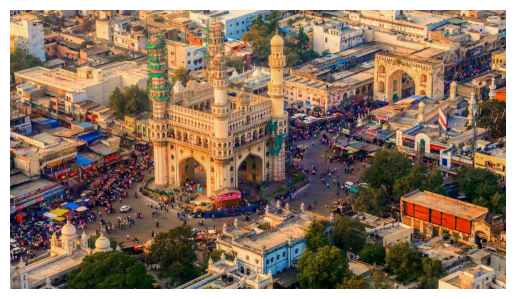

In [5]:
# @title Loading Image
base64_image = '''/9j/4AAQSkZJRgABAQEASABIAAD/2wCEAAYEBAUEBAYFBQUGBgYHCQ4JCQgICRINDQoOFRIWFhUSFBQXGiEcFxgfGRQUHScdHyIjJSUlFhwpLCgkKyEkJSQBBgYGCQgJEQkJESQYFBgkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJCQkJP/AABEIAtAFAAMBIgACEQEDEQH/xAC4AAACAwEBAQEAAAAAAAAAAAAFBgMEBwIBAAgQAAIBAwMCBAQEBAMHAwECDwECAwQFEQASIQYxEyJBURRhcYEHMpGhFSNCsVLB0RYkM2Jy4fCCkvFDU6IXJbIINCY1RGODwidUZHMBAAIDAQEBAAAAAAAAAAAAAAMEAQIFAAYHEQACAgEDAQYEBQQCAwACAwEBAgADEQQSITEFEyJBUWFxgZGhFDKxwfAjQtHhBvEVM1IkchY0YoL/2gAMAwEAAhEDEQA/ABturOopFtclZBRw2iCqKrKD/MbOe/PzPoNUupOqI6DqiOre7XMRxFHWgjUhO3OTnBB1XpL3fT4NE0NOKFKhGYlfMc4OpLr+G9VeL1U1wrY4aaobeoJ8wGB2H11VHVWyxEc7s5wTxO+vLlJGLfeJrNC8tSGSPxZGBi2EEZA7/myNN1jNVXW+l+NMU08ojlBA4yRx39dSz9M0nVNDQUs3iySUpcg7SqkbFXljwCdup4LRPbJEVjIiQBFCvyVx2BI47Y0pbqwF2jqJdNMWwfKVYLDNbLiJJKNivw5h3g7gBuJA/RtZjcOlLxdr3LNRokibgsjGQLsxxgg63WBbjWGSSKmhMbHyF3KgfUDOf21YlsqyjdJDG7EDdx/nrDp7e1VR/q15+H+P9zRt7LqsXwdJi9F0HJU/CWq51aRtSLJIHi8wdWYcD5jnWhisSmRY5JVPhqASRjOBqzXdHQyTfEJJVU7gFQyPkAH00IrujqwqPAqlqFU7tkwJOfqTpn/z2msI3MQfcYlF7OtPhBAA/npmRV91VRI1MKeWRmDKGlOM9vQHGgNXdOrJ0ZaJrfGAM7oV3MPs+P7aI1FDW2/as0SUo7eK+Nufke376ljvtlt8X+8Vj1cgHaGDufr206t4Ybq+R9Yo1G07bOIpRVXUS1dPLd6q5MkcysfEUqgG4e3GNfoyhrlnkDBh5+e/vrIaS7WWvjlW5SJAplGyGX8zDjkLz208XK11FqSMUV4hihc8iqIUhdpPlb07e2g6rVDgWDmHo0oP5GAHvAPVH4g1l0ugttFZHLQTPTsVmZnYbgCQFGPTPOdArx0rdLktbPBDslbMnhSqV2kn5j31BfLhXEmNOsDODuYQ03BDZ55UY/fQOQzxiR5q2pqWwMGSUnjHfV0rLgFOP57yGdVJVv59JrtpjtU89LXUNUKS6CmVJPAl2s2F5VkPDgHPcH3Gh1F1lWy7HgvymUv5orjSKyNnsoaLaV59dZp03df4Zf4Lj4fjvExG1nwSCMEbucd9Sx2m5/FvPSxyurNvAB5UZyO3tpX8AVYjPEYbWVkZYc/f6zSutY666PSVLUHgtSRMKkeJ4iYLcMjYyR34IBHz0qzOwjz2GOceg04/7QpUwSxPNG7PSlTG/DE+3vnvpFhq4KhWVXEmxiGGckc4GdM6Gq3G1vKLX2UbgQZ1LHT4DKQT+uddpMXjWOJCV7ZyOMaqSygbVUhQPQDVSnuFMxljlk8Pw2zgHHrrSNGB1gHarHEt1cMqkyBkCjJJPppHvgkqKtmjBeXCOoHfTNX3MU8JhiilO44Tyk5P1OlSogmjkFTPFIu054OD399XrArPMA2QOkcmZ6XoejuMTtFWweFl3/MNxIPzznWqfhze6i49PQTVMxlmHlZ27n2z/bWJ9PddUkNXUU9TQvLTzYLRuQy8fJvTWjdMdV2dHMNEfh1clvDdSoz8vT99LanTsRgiEptTdlWjr1tVxm1pHIsyjxUfxo1yFI4wT6Zzx9DpfpLZJUxbg8U2RnkgN+mrd8vKVdpaOIowO1927I4Ye31P6aSOp+pquzSRfyxJDIviRnZyuDyPnrHu0Qs8PnNXTdoNV+XkekZq6znMkc0EiqY8KWG5fXGlzpvp+FaZap4i1arMH/mNj6Yzj19NTWS+3q61ctfY51pkIjEsFSm9JUyRxntjn20Z6cu1v+EqaaspaJitRIEEjmJ9ueCHHc6B3eo06kI/pG1u0+psBtr9fn+kitlRSw9RW63VFG8/jyhGLzeRQf8Alxzg401Xn8NbBVBmjp3p3fB3wOQR9jnOlOs+FpOp6WpjjnEEdVEYiXDAZZccj55+2tMqAGUFm2YcDb6arbfbhWJ5xBvTSG21Dw+8zG9fh7Ja7bOyXP4ikVzMyPF+XPHGD8zqtSdG0MM8EcdVUo6gRzkqpA47j1Cn5ZIzrS+paFFstxCSHywsdvz+Ws/purbFNWuZrglEJwoCVQ8LzAYI3Hj99COo1JztGf57QlFemxycfz3i71Xa7Z09WbLTVyVMkaJIySIG2fSQE/cMo1DSQwzxNJVU9TTSCRWiZphtRfXnjvn7aLdafDU80r74VWaAFSpHm4PI99Aay80r0CopbLhCp2kjjW3pGaypWI5mTqlFdjKpid1vaqlK2StVHlpWZkWVSXVce7DOO/qdbn0hMn+xVsaMAL4YPHuQDn99JNqq7fOyGSmejZhgy0cjREfVRwf002xxn+H5o6t3QDMYmbKsfmV5x9tTrdSHCpZxjzk6SgqWZOcwB1dcoIpZFMqiQw4wTzk5xxrPviPDJIYEnvt9NMHUdo6qrquWaSClkbCqVojk7fXhznt8tLdXZp43ZJ1npG5ASoXJJ9z6bfn+2tLTFO7ABBiOppsZtwk8VTEZFTxdjeikgf8AzovSGWRxhXZVPBxx7aBQWmqqnp46g08LRDxEcxhVI9Dk9xxp0ikqqekWpY24gj/jeJtD+/Bz+2r2930BlUFgH9WWLYTRRSS1MeV8M7Qvq3pn5aK9GVAqupUikHlkikOQOPy8f20tS1NbWwBpJf8Ad3wD4Cbht9z6/oNMPQTxU17pzFTRzmMHfPuJlVWG3OD6cj0GszV/+th7RnTDFikGaEaWSJWaOWVMemcjVC41VXBQS1KtFM0GHXeuMkMOOPTRpZoNro0wRX75OCfpqpcqRUstRGwDL4WTn2yDn9teVrZlYYM9EXVgQwyZQXqaijjhmrKmKB5oUk2FvUjnA76hqusQyPHbaSoqJBkBmXw0B9+eSNc1vRlDBKYYojIirgNJ5jj2z31Rdf4axWNpFPBAYrtI9hu+WtarUUdPOZ1mmt/MCMSrcq7qSegeCrlggDIQ5gjJLcZxnsPbgaiPS0VziimmaqqpZUUuSSc/bgDtrq4dWVVFM6xCDCAFNqMzHgc5PGNRU/VtVdqmKO5pBNG4RHZh4ZVskhvn3x9horXkDKCLhFJwxzLUPQdzmwj3P4egSPZHCOWC+vA40XtljsfSJiqZq7E0QykkkgVl+nrjHpqKsgWmjWSovqUpRj4cNM+Iii9uOSc4x39RoInQccrrKLylTFKu4MVJkUY9QdV/F1sPETDLpnH5cfz4x+s0/TPUaAx1aGo/LnxfMf8A0tydG26ejo4H2NSNu/K8w2sBjBAPPfWeUNisFlRWqXad++ZpO30A1ffqlIh4duoWcDgbQcH7nQWuU8KOIQUN/wDUL/wyOlqWUU0QXaBvR+D3BA4Gpqsj4SCnhYUscKbQUyGAzn/PSjX3Ktrmi+MqhQiJ94Ecnm7dj7jXRvUYGIknqGGMseAfT11Q88kw20jHEYUqZaSjjp6Wr2oj5CAHBA/p4wAPl257a9vFxhraGGWvgYCWOaCRYjuYdsEHS81ZWTphFhplGBwu5s+vfj9tV6uhM0JNRUTzFeyu3A+3bQmXdwTCBApDqMESGuqbBLQrSfBQMfF3lY97FRggHdwc8nv2zjU1hoLcldR01BDKZ5pAkhmVfDGR23fm7/LVE0saqCrbQPtjtq7Z6mMdRW0JvOKuIHZ25Ycn5aZSnjGTiAs1Bzu4zL1/6LdatJ47JVOkakMKJowrnnkgAsO/oBoC91rqRtlHRSUM6KFGY28UL6gs+SP1GtviVZFXdyQfvrypoqarQpUQRzIRysihgfsdOUXBFC7QZk3g2NksR8JgEtHd3kLSzy5Y5CgtM36DP99XoOjlaZDJcYxU1BxEs7GLcQMny4yOPmNbNLYbait8PAsJRSQsZ2gce2qFXYppqeOWGrxHIAQrLwM+5HfTX45gOINdOvHn8Zgn4htX2m5iGGpJaFRDk+YYH+HOcDPr66WrxJXXOy0wmeaYeMWyxLc9jyfrrer7+HcN1gKVNtpZJMjbNFlse/lBH7jQX/8AB/Q0tI8CXFqYZBYvGAF+gPr89H0+sTaAeGEvbQSTt5Bix+GHUQ6eskqVVPPK/i7VTjlByMZ9iW7e2nP/AG0rrq8oobEh8NCwFUSMEDvkHn19tVE6bttiy91u9v2soIcp4TEj0A3YJ57411TdUdMrVx0ltpKqvnnHhB0j27j8icZ/TUWViwG0rn9J1dhrYIDg+0J0dvu9wljee8x05BWRYaNCFQ49WJz204fxano48TVRkZe5C8n/AC1jM/4i3f8Ah0dPQ08NNLEkcRAi3sTsHfPGT9NCJqvqO4MJLiHKM+FWdjznsQi/6aKmgUqGdgB6QFmtZiQikn1M2K6fiBbqbxEjeOSReNi5ds/MLpCu34rUcMzy0dFGtSpwzvjLY+Qz+mdDbX0ffpHB8SSSNzltqiNE/Xk/ppisf4UUsCrJNThZCSxGc4J+ejJXpKjnqYva2oYAjIln8NOtZep7xVm4LBFAtPuRRAsS7947cZJxrSonp5TmHw29Mrg6AW3pGjoNpSIDHbR6nhFOoVF4+Q0lqQjOWTiM6exwgVxzJxTB+6oB8xqRaWNeRj7ca8Q/LvrssB3GfbGlcD1jG5vSdCJVHAA17jA1XqbjSUabqioiiA/xNjS9cfxCttKrLSxTVkgOMAFF/Uj/AC0Sul7DhBmBsuVOXbEZZmKKpUAlnVefYnGdSEIil2Kqo5JbgD76zO5fiBdKthHEsFIvDABdz+45P+mgFRc7jXOrVE9TN5shpHJ1oV9kWty+BE37Tr6JyZqVf1PZKMlXq1kb/DEpf9+2li69fR+YUNviJGf5k75/+6P9dKz1Ebo3jTiPb88AaG1VxpIKCaoVi8SNsdlG48nH6c6bTsnTp4rBn49Io3alrHYhwfvDkvVFbXxbPiGiyeRGNqkaoNNLNBOCweMZyM8578nSNderJaK4ingi8OOD+Q5mB2jJBLkD1HYaL9PeJcLqtXNWSVECvvRCQFX57RxnV6b9MARUuPTiDtFzPtsbOJcqIaR6GGKpUUFEs3xMs1RKI2kGPRRzj6kfTXlZ1BQ1FNTU1DTTLSeMrJMI9kYK85GeTpTi6ht1gmmc2ipvN4NRORK58saiQhcFsnt7DXEfVFf1BaJ3rmp6VxI8cMKLjDDGCSec8n21FgOcg4McIXaFOSJXmtyWisNclXV1FS22R5J3yUZT6fInUEd5M1RMzO2ZuBg/l+muLhcfGtrI6sapH2u5/qBH+uhFOGDCRW/J5mx3Gsywb23NyYPeqEKnSNlnvl3toJNdiHJ4IzkZx/lphor9LclMjF1VFBJLDHtpRgr/AAY452jWTvhM7fTRpIZqyilqYaJZFejlkWEx7wZASAAuPYffOrFcnmPo5Az5SWt6wtdGkiGeao2Nhkp1Lcnt240PuV6v89LSTWu1Mq1e7Y0o3NGAceYcAE/PXHSUVU1luNXLCMeIsPAAKHcpGPXHLfTHz03UWw9OWosVBw5Yj/qOmhSinpBve1i+A8zKrlT3/wAerS6Vz+NBE1Qy7vKMLnAxxqhUyGG70vjyMykQzNlu+QDnT11DSpcqutFCJJ6qqjNOyINwQEY9O3Hvrqk/Ca+Xio8eqWnt8fgxRYm5fKqFJwPpo/4mpB4iBFxpLWbPP1i31U1NdrvcKqlKzjxm2snIxn00d6autbYejrnUrPUJWRMksIZj+XgY+QyG406dJ/hTZLOqTVM81yeQZw+FiH/pHf7nRa6dKw1FbILfSRx08dOnA2qjNuOc7sDt7ayL9TWx2DkTSTTuv9TPMAdP9VXG+dOXCpqZWNTRxEwVAADbhA53du+ToZ0/X1V8SeO7tEdqxyJJ4KK/mYqcsoGe/r76Z2tVsslhuNVM4ni2uXipV2iTGVA3Ee+ew150zYrVdrQlzoqo0L1UCSPS1ADKgUZByCDn141nWitEYouM+fpNChnLLvbp5esEVvQlquMa74o2HGHK8j6EY0ArOiDBb6mCnjZlCkpKhJP3Hy51o6dK1ZomnpjS1cUy74pIpCC3HsfmRrO+t+kuoPj5rgtuuVPPTUo8Pw4ixZ94HJTOBjcc/TQ9FZYX2mzj3jOvTTNXkVDPtFeH8NbnNIAtXTqD+TduUs3fBB7fXnVe62u+2yritslHJIzLmGOnQurj1xgc9tPLyfF9IUMVUzvVAbmMrkv+aUck88bRq1DFFVU1ppJKmqap/hyO0Qcr5STkk/t9tbNWostJD4OJhX6HT1qNgxn3iVbOlKOgFPLep3SrlDFqPPhrF7b25JJ77RjHqc6OHp+Kti8GlkpfB/N4dGBlvmT+Yn6nUV8agpqeqijnp0kgXlI23E9/zN76z5mSpjesp0kibhAQ53bu+4acrpZ+ScRYPXUMIo/eaW3QMNLsdZCwKgnhlIJ7jkZP9tVF6KuU25Y3AizwW9gcjnS7J1FfbZepYKa7TxoCApYCRBkA4wc++mah/Ee7U07/AMQp6GtgAcb0BRtwGQMDgfpqh0jZ6w9dy7c4kdP+G9U+7xJUKjDOEcLxn0LcE/TRKk6Gt1KwepjrWOePJlcfPHJ1etf4l0VygDz2uspvfYwkUffg6ZLZfbddVzSVIdgSu0qVIP31Vk2jlsQIKE+FCTKtHQWreixS08kg/Kgwv99NfS/T9FcK6pFXR0swWmbA8MExliBn3yef30LmhWYFZoo5B7OoP99eUsaW3fNb1FI+MM0JIwPbjSN1LsMKcxyi5fTEK1X4TdL1S+LFSLSsQWMtPIQGPr6kdtLF56Bg6as8l1st2rJkj8oi3qwbsMEjg/mzzqen6rt9h+Igt9NbqmWoQxyQQphHHchivlXv3HOmfo2ng6wsVRDX2+mSOCqaJo4SQkzbFO8qT74GD7aSxbVgucj0jneI4KgY98TOrv0/1xTWaNTTeJXCY+JJAEYCPbxzxzn5aDWqLquz3Faj4iup84ErKxTPtweDr9HtRNUxFI3pqiP8p24Jz2OQMgEc6qVFmiq4mE1GSnHMQDBQDznBzq9faFiKUZBz7Sp01TncGwZltL1HeKh4VlkkkhV1nPjxkbXRgR5h3yedaH0hJ49kqJlkVpKmR5m+TM7kj99A+saKitNrE1Mk1JMsh8Rcldq8+o4HPbB7DQDpLrWO1kRVMTTBpi+ZATwx/NnBP+WhlDapZOBJLBMA8zTp9xBVUOCO+O2olqJoRjayjJHPqPfUtPc4auMShSQeTsIcD7qTqbxKeZRtkBZeAowT/rrOK+8bD4GCIJqqC1XDbLUW2mebBHiCMK3y8wwdVH6ZosMKaesgIaMKPF3rGOM4D7sevbTAESSUxlouACQpwwHzHpryanUykow7jAwDjUYYDrJDr0HEVajoyGmi+JSKmqnikyqlDAWAbjlSR+2maxVVTNFO9bSeFMspRlYg89+CDyAD+2pKmAijY4AO8DPtk6Xbjc7/AEF8nFvoopqB3DO0qkkSkgHkEEALj00wbrXI7xicDzMElKYIrUAnrjAzG2VtmM7sEcHHGoVbY7KVJ9yNC7f1bNV3KagntphjEsqRzhmAZU7Egrxu+R0xK0RTaFHHp6Y99dgMeDKENWPEJSjXjkd++O2qVrs9JQ3Kuraamhjnq3UzSIMGQjJGT8sn9dF/AVkO4quCcbTnOq9LIhlkwyEZznOM6jbtI5nB9wJij1NKf43UjOSAo/8AujSxe6h6a21bq2CsEjjPb8p0Z6suUVLfatnz5SD39wBpJvt2NZSVUG1nhljkjYx/lHcAE69Zpk/oqfaYd7BbDnzib+DO+K5ilzJD4gLsp4EkaqPf29NbXcaK5fDwVNuia7Rlt4TxVgYKV4YMRwQecfLWMWqlls96x4sizRqZKWoH5sYxnHr3ww9QT2znWt9KdXQmNUZ0jjYASRk58CUYGM/4SMc+oIPvrP7So75w4HSPaLUdyCh6GQWNb9aLXBb5bZc6qRZJJPFKgRwqcAIvmYnlSf8A1alto6gpqrE9tqTGwJLkjC/LHfRi6XZ+n4HqbfBStPVTjxS6YzwfMSOSfTnR2C5xzRozg5KgnA4z8tIMjYyQDGltTeVBI8/r/wBQFLY7bdV33S10sj+m+IFsfUjQOu6B6cnmMEdHLTFoyweKpbBxgflOff8AbT1K6zdmC/Q86Hz2aCoqI6j4qYOilBtcYwxBOePlpMC5WOwkfCPd5Www3Mzau/CuBArQXVouNuKhAc/QjtoRP+Fd+ppN9M1JV5OfLLtJHy3DH7612oscMwAaeSTByNzanjp3gVVDBgOAT6aYXX6moDJyfhBfg9MzHAwPjMUrem71STL49sqVKqBlIy4z/wCnI++qfUcE9ZRW6JwqSU5WQCVDjIQjkH6nW675VkkJpAzBhsYS/mB75BHGPbnOua+OgqfJU0ySnliHQEcf66c/83aVw6iAHZiB9yscfKfn+ydM0lXa6R5aaJKkR8vGxVj7HI50fhsVfDSximulwjkUMCgnLAYJ2+U5B+2nZaO2SiZWoqemMUgiUQ5UYx7a9tlljqPFdZfDVKh0jUc+UEYJ1D6y8HIJHzlO6rs4bmZo0/UC0FXVR1VPWI8kqO4jCnyoASGHc9xjHpoRR0TV8NNJUw1c0ZxDGyzDaSBjAzg61W3dA1dnstRboqmCr8Rp2UnyZLg4GDnsdDenulL7b2EFbboXp0kdy0bK/J7EAen150de0n2tk9PlmBOgUEYiK/TdrSQ+LS1UZfsWhJH6gEat2/pyxTqBDPTuwA5WcoV+2f8ALWmPb/DKs0bAA9mGMaEXLp6hrKSXYqb2YEllB7H1xpU9rs3DRn/x+0eEwIaClSBstIuGVFPdGXIGf31aisayNmGtjm2+XDLjU116dpKelpnhiEcryRwnwSyhy0qAFgCM8Z/XR1+kqqFHmoblVR7ZCPD4lxkcAbhnj3J7aA2rQrk5hRo3LeHH8+MXprJ8PH4kzQxY4Vt+C3IOBrQfw3hMHThO9naSqkyxJPA2r/lrOeoRdOm5V+IEFZGPDkeSVSrncTxnJGMjTz0P1XaYbRBT1dTBRziZ3eOQnZgsSMORgjGNDvbdWCpzOFTI3iEc6mnppcKyxuzNja6ZB4551SHTlvCs8dJDA+CSYQV5x3yNZJ091X1LUda1cMtxuItyu8kPigFW86gAHHKncftrapWxE5xtxGxPp6aDfQasEnr6Sys3SZVP0bbpZGlMtSJ2bf4zOXcfc6uUturLeAKe4zS8YAmO4a46lvi2O31NyEBnWmi8Qx7tu7zKuN3ODz+2h1t62iuFxhpnoKinaYeXc6sAR9O/fvpOu7WvWXU5UTVtq0SuFYYJ+MYJqi1WekaruUAqpXOP5cCjzH789u+l6p6yrWhVKCkpaGIHG8oJH+3YD9Dol1Su+ghRgAGlz3xjAOk+Gdfhtjc5c8fTWx2bX31YsfkzK17LRYUU8CT1JnrZUqKyWWpf8ytIxbH09NQ11HNUQmWiSlnmGAKSR5ELD3BVSuPqdRXC5rBBt4yAFUBvXvzqg3Uk8TeIiJDD6ySkKqkfM/5a2e4bHhmCNQjMcwpb26lhkVV6R8Re7NHXpwcZ7kDVmPryWhJWutt4o+24ROJNn/K3bH00OTraSEqaUzTg/mljbwol57gty36D66uWS8CpuD1AuoWrmHjPS08jAue2XHIJ7+pI9tL26bP51H3jSakKP6bkw7R9Z268FViutNM5GBHVL4bj5AMBk/TRGmFvpqpGnhaCXB82ch86zG50sc9xqUNouVSElbE8VG7xyjPcFQdEbJWT2irho55qimiKNK1LXxshKD1CvyBn1Glbezwo8BxG69duxnmaWjRlFnKMIy2Mbc4576TrtOZHraC20FbsrKmGpmmMeYpfDY8g+5yFxn7aTLtfL7et0KzTLTFiFhh/lpg++O/31L0nS19NG2ySdfD/ADbHZRGc/Lj10bT6RdP/AFH8R9J1mrNhAHE0a3XGijvElHcLLU1MNbIjfFovkpwF7t8uBpogr+mqVAyosUgbBE0RJHz3cjGluyQVdZbaZ7iRT1bqzNBtPiAA4zs9B25OvpLnAT4EVsmumzyB45ECg+xZSRn6nSWorZjlD9DJoZs7WH1jxT1tNOM0xjdWz+QjGcfLQqw9QtdqWuNZBEr0tUKdlTkEHGCc/M6BU1lv06NXU1mWiqQR4Lkb2HuTzx9cav8AS3TV5tkdbNWQxlqx1klVWJO4N3GeANJd0yqd5yZpr4iOcfON1RF8HGJZXhjh/wAZcAfvjQpeorPJOtNFcYZ5XOAISX/UgEDTHVdIWWqnepehgWoY8ybA37HI0Dv0M9ilhSKOmnWbOGK7SuPTA+upWgMcDrFl1nHX7SQPHPHvgdZVPqpzqm9Oke+SeaMIx/8AqkDHyB0NklrqqMbasU7E8+DGAf1POqUVpsLVbC6XqoknJwKd3C4P1xzov/iO8/NzIbtAeQkXUX8Fu9EaJ6uZSsgdWhQOMjPHJHH31n1RBBT1jRKoYxtt3HgE++tZFZ0ZaELtNQIBxumcPz/58tJl56m/Dd5ppooqqaYsQ/wKuoLf+vy/oNaej7OOnXYinEzrdWLfEensMxRrmE2N0cSuhyrGMFhx2yfTQe5V1VVyiSoq56t9wOZnLYI9vbRtp7XeH8ajkq6ZEcxiOpZWYj0yVHb7aVrsfDmLKCYkbHiDkZ+vbTYUA484raHUZ8jC9urAzK0WB4YJLFeddyP8RGYkVm5wSTwB76W4LhK2+KPyljkscZ0Yp67ZUxQucKY+WB7H/PRFQ9QIBbC3EhFFLAZN7lgp7+h0WsXW1VQVSLFGJ9mQTuxnntqtVSRy71Uk7scY50Dp4ZErZHidcgkD0OufkciNINuAxjtfvxAnvFMYRRpTgkHxBIWfj09Bg6X7bS1c0pejkVGmbnxDgZ59R/5zodVJUGNt38v2z668tcF6gUyxQrKquDmI5GPXI1Svco8PEs/dsY7zwVdLSAin8aUABvDw3OgzdNVd2qGSrgq6OOYZ8RU7YBxn66J010uixh3oVliI/PGcH6YOjNF1LFEUMjzKQcMkikqvyzyNDfUWDkCSqgnBMUaHp1xUAW613CkZF/mS1VQZlnOMZUYynvg576dLHTQ0duuVBcretW9ZGVWV0BCArjn2weePXRu39QW2bKt4YweTCQe/y76Uuous6yguE1JHLE6xSkZKDcwz2PtpNrr7sqowfeNpVTWVexsrnkA8+8X6joCe3AmnplrHkQqZdxY84/p4wf11JYLEtuYWm90ELMp8RZyWG0Hjh15/X9NaLaq6jvVMksB8KUjJRjlfoDoL1nA6UTZOR5SCpyDzrO/8hqmbuLR5zbXQaDYb6WxweDj6dJQWlsdEjeDdpoEGf5X5/wC3cfXVeCFOp5pKaX4ioWBd0MiqQFz3HHz99BliZkHmVFA+udXaHrW5dPFrTby8UUz+O9WhGRxjYBjjPGT34GtCmm3zbPxmRe9DHKLiNvTtCtj8aFpNxjXa25gGUFiwz+vbStdFaluNSKeRXeWQzK0RyMFhxx699RPVmYs8gctIcs7Hlz7k+v10b6Es9NduopErUMkYpHdURjtUhh3Hr3OudO7DWMcwSEOQi8fOV7LVzG1Od7zNFVrIRjcQA49NbTdOobLRQNFXXKlZ1fd4cbGRu/soOlC49CMhX4C4y06SHdswEH0OAM/roFL0jeKdf5aJNGT+dQRkfTSLtTcfE2I53FqqNojXf/xGoJ4paejoaiZZRt3yEIBn2HJP7axHrhVNNCYvzxyYx7j208y9Hz16tDPJJET/AIDhgflqvB0RTxUPxDPUVUpkMCK75G7eUHf99aelFNB7xOszrA7g1vKVxtaXOy9NuwiJio8HdkerDAx6jU1nWieo+FkVd6rvQHvjU1FVR3CS30CQDZEGiLZ4QFiSSfQDnvogbZR01zMtMYpI0jKoVy5LfMj0/wBdTp7BjA9/1nanTkNuYccfpLNNS0FQPLEBhipyMcg41cpaI01waKE/y2pw2w8r+bB4++hNNcPB8aOmplf+az/zGIVMnJHqTz9O+upaqvkcuZ1hYL4Y8BNpC5Bxk5OM/PVmqFowRK7zUcrDlypoIpDI8sSptGWY4GR9ce2hjXikiBEcry4/KsY3D9TxoZFap6uffJI7MVOXYk8+mSftq1SWkjww5/MDuPcA51UaMCT+ILAsTicXPqStaLfDTQM0MREUcnYnPqR78euNBZup7lLT+HW221ZhlEUy7DIVdjwBnjH7/PTFLSw/DyUyPG9S8beGpYFicccd8aWYOj+qKxTJVRRIsjh3VB/UO36aOa605fAMDXvY4TJ/SVE6yNNdVoai20Jg3ssmxWB47EHPl/XTP0te7TT3mSUT+CZIWi8PwWIGSpGHBOe3IOPlnSzS9KA3hoa2lcEsQZQ7sQ3qcFcc/XTAvQ01DUCak+KlZ17CPOcD00vcKyMAw67w3ImlVNFZOpaeKmNYskikGMwSlJFOMcDgnPI5BB1DcWpbT07V2uNpNkFKyRBznIA4yftpThlWnoRSVv8AKkblw43sB/0Kcg/MnGPTV2srRV2uoDIsZ+FeJTtwAApwcemsTuMY9JplwCYRrqo3QkS1dQCoGVjkKKQfl66GPZ2YEUcsMjRnzK/lYasGnMtBBUg4MkMW7j5A6+leM1CTr/KkAwT6j/XQa7CPyx22pD+YYizdKZEqSs87QlUAOXGSDnn6aFCustGN/irKyErnOTj6nV/rSwV95r4auiWGR1iETDxQhbDE5GePX30i3Gz3ahBFbRVFOQchnQhSPr2OtihEsUZPMwNU71Odq8esZ6u/wPCGhjMeMqTIM7vX00y9M9WeL4VHNTSLhRlz+XOew9fXWZRUVTIizKzCMsM8eUc++jlogrpagfDOSq/mZuE+x99dqtHWy4MnTauwOGmyU9uoax/FaKMsez7RuxpVb42aWRZpTHEGIVIvLnB9dR0l8udtK+FTz1ScAiOMkDnk5/y13Xz3FyWjpQisWK7zjjP7ayKqXrJBm09wcZE5hoTJJ4dPRSVDbhnw1LEc9z66YLb0peZh/Op4aYHOC744z7cnUNsu9PPTLS/EClqeDgPsD59iPX66PQS1yMds8kiJhTiTd8+c51ZrgOGEkUlhkMJJT9IiPL1VYzcfliTgf3J1HXdHQTIy/wARmjHrhAdWI7izYIkDg5HfByNST3GnpIhNV1kFOnvLIF/udWqCP0gbFdPzGBH6Gpdv8uuq2J9X2/5f66jpbO1muNMy0DSwCeImYSFmADDnAxj39dcXD8SLHRMypVSVjjOFpo8j/wBzYH99AKz8TKurULSUcFKvbLs0j/XHCj9++nxTe3A6RTvaV8uZtKPggDBB9dShsn7d9Y10r1bdPiZnqP4hV0+wJhcDYc99pxn2406W3qimZsJVYyMkP6c/68at3DDgxR8Z4jDX3CopbpS0sNtmqoarcstQjgCmwvDMD3HYcc6rR362wGltctWIq2OnSqdGUgeEu3c27tgZGec6u0d2imVkJB3c8enGNVaqCGo6alkhSMzPT+HuA8xyuME/trthHUSoIl2mngq08Wlmgq0JBDQuHA9e41BcLlR0kTPcHWCPBCvMAY2+WecfcaxGS211BR1Fx8SOnaCMMwjfDljgA5X6j108ddVtSKeKVp42pxTQSmOVd3n7grjDZJAzg8+vGpCJuwpyJ1gsRckcyW5W+z9To727pmkuU5QsawVIpVByRtB/M2DznGOe+leh6GgjlSWCyzbKdyk3xdWGjU7SWPl9AdoGXyfbTn0/PX3Lpinlr44K2OSFCj1oAiY87Rt4LYIG7cBznBPGoIprrXU1ZCkFOtNKzDxFfYCrAn/hjDMM+Xlh27HU2WFUKg4HzhKa953fCJ3TVjlqI3hq6GGOmhpSzrFKfCzuIIeQDI/KRknGQc6JwV0NHU0PwFppUpGLoJRLlWG3djIG1iABjBPfV/o6gmow1PVVlXRywMFjpI1QxzBc8gBSQcY4G3JJPqTqScWyGG410Rqa6pgqaes3zsS0Y3YwVfBUjDZAHHrnUpcxUc5nNQqsf5+0JWm/S1YjENhq5lYgNOkRiRR6nz4J/TTVEoChnQAn01DC1leRqaCvEdUiqWQS4YBs7WKHgZwfTQzq2tr7JBS/B1Ku0+4OxQErjHI/X10Zd1zhF6mK5WtSzH7Rg3gDO3y+50NrOo7RQZE1VEXH9CHcf21m9xu1dWyFp6uaRR/Rny/pqgGZwMDt7jJ1q1dkZ5sb6RKztMj/ANa/WPtZ1/FH5aSmzuOFaQ4/bQap6rrqzeGqjGmeFh8p0s1ZjSIxTLmIgqVHqNd0dQZoGkSIkH1fgY04mhoQZxEbNVbZnLfIS41QmS585buzsSdVZpiJDuB2cMABjUFXVQUtLJUzb2EYZ9kQySFBJxn5aA2rraLqvxGpKSWCljJXdMw3Mwx6Dgfrp9awSAIpvBQtjpLlf1S9LcJKWkt8lTNGV8RiyxxgEZHm5JOPTGgfVt76kgo4haqbxJaiUrsSMyMgxkEff31zV3inpLzWh0dmIicKo7jwxydWG6hrlpXno6NmjXad3PmBx2Pb1+eptV6xuHEXArc5ZfvLD2tS8Elcxd8KT4pztbAzr3qC4xWm0TiKpp3z4ZRFAZlOWOflwO+k26dU1VaDDKu6Tn+o9j37duNUjUyrYFWpEUaSSFlkTPiS+nJ7YHYY9zrA1N5bK5yJp0VqD3i9ZRutdVTzSPhsSsWJIyWJ4089MWO626ON5KpYlZlZvMcsoIOMfMcaSrgxhWBt2MHMSn/I6N9L9RVFLPHbq0maKof+U4ODGxPbnuM6Po2rGN4xK3Bx4sZlWuuKVtdLURo0YaaQncOfzE/bXlZVvUwr4i71Pctppk6MhNP8SbjHtaQoBEASHJOAfX5n5ahuP4eNTw1cr1USLGGcO742qMYzn7j76UtcM5MZ2ZTwc/OK8CS3AyKqZ2Rhn2+wOM6it9rukL/xJqfdb0kMMm5htBK/lI78jRKirI7LTsI0JZwSXccsCOwHtjQb+LECdIpmSOYbXjAypGc/bsO2qIpJOIFgleC3WMdNcrUqQolvgaSIA+OZJPMRxyoOCNcVd4rXnT+G3GWggjA2LEm0A++cg8c6n6R6XoryTHNW/CMcbUk4EnuA3Ya0619GdP8ATlV4s8iNiIApUEOGzuyQP051IvFZ4GTHgrX1jdwIs9PdPXG6dOvTQ09LTw1m13rIpWZ5WHdymCAc+nGmWLpKktNpSKdnq3pIz4Zl4DHk5IHfJ9NWqfqalpYfhbPbquaKN2yQpIA9xj0zpb6hvlUk5NxuUdvWoQolLE5ZnUd8jBAPPfj00NrLbOM4jCVVrgqMxqF46et5kpI6qip2jYJJGpA2sTgD6/21YesgpYMR7VRRwB2OsDlr3jnlVkSdnON8gzge4+vvohL1PdKylhiHikRBYxEi4V1HGP09tLjS85MqNc+SCuITuv4hXCKdKeJmhgUFEVeCccc6qWTqu4QV7zCSVhIp/O+e/wBc+uivTlknnSRqa3vDJLzJ8WgmUn1whHb5abrZ+HUczCnZkjqHRmXcu1Tx8u3J/TRHtrQYIl6tM78u0TfirxfqprZS0c1RGIvEZhgKoJOCxJwMknV41DdH08UFxqYmqNq5hjbIRfTnHtkf660qxdO1nTtRLJLTPPFJCkeI8MMg5J99KfUPTVTcupautitcKrI42zVKliAABkKePTSqXC1ynQRj8MahuByZx0113X1dwaORfBtUKOFeUYEXbbtPqTgjV6frepa5Qta6eetEeHJ3FVbHpn799B5ekqW6VcVHcbt4zSoXEMUi4IU/lC+vfOB7HTpY7JarBTMI6UmGJGbBycEA8/LVrKNOBnzhFsuPGZ9b7lQ36trUudtyszRuq1EYcDEYDdx6Eeh17UdGdMXVY546d6dhCIo2ppHTEfcDbyMfXQ/pzrQXGkqpqyppEEbxrvRCsSkqNygHn82eT7jRVWWoXx4Js4JXMa859vkfrrNsosqY92SI9W6WKN0RuqegrV0zT/G0Uoq0lcwmCdEZUYox3cdyMcAjjOqVH+Fc9RboaiKKKVZolbarjcMjsQcaN9UW6W12W417s04eQ1IikJKlsYZj7HGNVPwv69rbhaquS5RxOlPKqxpF/L8NdvIGT24Hc60am1poNtZ3EEZzFb1oVwjDEFV3QIplkqrjSPCAC7uUIGPt31T6f6foaaott2kpfFBbxBHMv/FUgjAX2Oc60Kf8TEj3CjUFifLHF/Odfq3C/wCmNfUF2pL9BitnqbbVbSA0rBlznkjjAz37eujK2q2ZuGP56RXvdMW2IeZ9VWfoq4QiSps81E0h4EBKtn5jjHf9tLNq6c6euF1ejtdxrKeRjhPEkVwTznOMY7e576YLh+HjVEa1b3Sa5Rgfyw5BHPouzj9tQf7Kz0WI/AUDO0L8/Qc6qBpypUOf58ZU/iQwbYMfX9JZbpjqSkdoYKhaphG6oXQgeU4xlvTPz9NDrjaK6rWGjuFkacqMMY5yg3cZyAxy31Gidvu9bamBp6qZSPKFDb1H2ORqxDX0U9TUzXOhSV6qRJJJoRsYMowDjt+mNJnSOmSh+nEfTVhvz/fmLlb01bbBRmoJkotuSVlYOR7AYwNN/wCE++GjqYXlj3+OJfDDebDKGz+pP6aow3iwU13hW5VTrbHiaJ/4g4ZWbIwMHOfrjjOoYulpquojmNXUoqO7w+C+3aG/0A4+uoYFFAsz8TzLLixj3eI7WCxV9DeamqqBEIJzUMskDESL4jqQCMd+DzrkWif+Jr8HOY44Z282OWC+hxjOhsFxrunIgs/UCSRquAlaodsf+nDH99XKbrBpW8SmoGkkdnfc7bE5+279hpd17zGITD1k9ORLPXFsa62qJd8cR8Ubyy5H5T2Gs/X8MbzSSCaguDSUMuJFjMpRl49vyg5+emqrvtRWSmOsqEGPMtPCmBn1PqxI+vr200WuMPbKbbKyFYlwGGcZ0cO9a4EX2jA3CZFHRX2hqE8JqjG8IJSm/cfTkDJHbRBuprtSSinqIxUY835znB+TZxrTntMbVCTvDE7hhJuXysWxgHOuqu30tXHtq6GKYEf1xh8ffSjK5ySZoLqaRjwfQ/5mdQdWtQVb1tRRz0krRiJqhlDqyjkK2CcD249dE6XryjqmyZKdw/co+wn5YOilT0na7tRTRQwxRDx3jYK7KSFYcA84/Q/bVKm/DemgpqmKNvD3ylgXQOH4/McYOdU2tjpCtZQ35ic9OR/iEIOpKCaICR5YVYqSZV4xkeoyNSUNwhqqmrMVdSSFqglVDgnGB7H66T6f8NrvR1H8uVJIyMZgmKfsQNCKm03ylMjzRzPGrttaeJXG3/q9P11IPkRic2nXOK2B+E1asMnlDxKeAQwOTj0+epjURvwVZR+UgrjOdZJTdR3qkPhp4hUD/wCnOwwPo2RotRdfXKmkzOakrn/6kKOPuVwf21bdjkGCahsbcdJoVrkJtNMwOH2KfL2+g+WgfSVrp+nay7RRVtTOlXUCfFQ+5UJ42ouPKPloTauvKRaOlimpokaNVjxv2sdvHrqxR9Q0ZrJR/vMbyumBsEioD3yRnV1cgcdIDuhzu6xK/EfqCGkvVWYxG+ZvKn+IBR29/l7nSwl4qS38Nu0CwVEsrpG8MZVdq5/MCTt/KckZBJwNa3XdFdN9Sn4mqt9FVSOx/mqfMdC6HoagrKutuEc87CoYxzU8zb0bbnHlOcY5x7e2tqvtlVQIF6CZ1nY6lywbJJzz5TK+pr9b6alZAZFqMCSlaWIqZDxuHcEeoIPf9NRW3qqopriYGlhkaaIJUzQKSkYIJUMSOGUnvz+ZgM51qS2aomavopk/iUEyAwRSxxnwZCSzHc6nClWA47YGhd8/D9UoPhrZWz0agSP4HgJ53xuz5SMMcgbvQAfTVh2rS3hM4dm2pnB/n15jR0701L1JRCSquMckG4iGZVLNMPcZxgenPOpjCtukeBal3EbFMk5zg440rWZusLR038NDdVi+HpvPAYlAX1KRkAkkc8550qnrqSnkgt0kkdPtZvP4ZLu2DjdkM23PoB7cgabr0LXVtbQ6sB1API98ED7ZiL6vurRTfWy56Ejg/ME4+eJpT9S0scrRnxmZG2nCE86LQ3GKZNybsZxpOs/UM8tIjPtklXyOV4XcDg49hkfvoxTXGOKsqxE8k0TSbkDEnYMAYHy0oVPSM4IjFHLnkAlffGoa2WVFjkjnWNTKEKkDzDUEFQ0ndONT/BwVLK0kauUO5cjOD7j56Cw55lxLIYMmEwPrqFqJpMbsFfl31ahgQjC8D66sCNhjhtCO2HAYwIOmqdpHlxIzSHc2W9dff7PeH/wndec8HR8RuOyk/Tk68kzEpeQbVAyWY4A+50NiDLqDF6otlyRCKeoVXH5TJHvA+oyNWBNW22Iz1CQQwHvNI+xB9zqpfOqrfQ1ETQVUtTtiPixxN5NxPHmPGcex0pXzrkdU0CWzwIo6OncS4XLNI4BHJOBjzHgD76PTobbsbRxA3a2urgkZjzT3i33KmMhqI1hKu4qSw8MlR2BPzGNLk/UdpMEMax+PVMo8QYEa7vXk+n0B0gV18+ERRTKgCEbSeSozzjPb7a+t9bZ5pTV1lzYzjiR6lfDVe3GeRjkeutH/AMMtabref55zOftS0tivA9/8RgvnUBU08cQQA1EbFYYWkYhWDkD3PHyGqct+6uqal56eRaBCW2CfazbT6mNfKD+ur1PHTSBXp5YpEYZDREMCPrqwIYmbGeff30t3FKtwsuNVqyMbhM7qn60epme5h7hSzOviGqQSqEGeVA/L3PAwNSUPV9irLjBa4UmpZJHWN5i3lU85bv240/in2MCDz6emqtfbbLVSK1wo6SWUEYaWNdwxz37+mruKmHiT6S1d2oUjxSlU0NII4pYrpT8D87hvOTyGGcj5ca6pK26+CqW+81Eah/5imSVVK8gqAwwc/LRp7l0/DH49bTW6bYocukIjxleDvGBn3wD2130pWWfqeqkUeNHSEbYRHOzbeeSAxPB+2s3uHYEheBNc6kYAZsk+xMAT1VbKjwVNOtRCww0U0QdWAOefXUImoaaVKn+ERwTQjyGIsgHywc51p9w6KnFLm1XKnVvT4inLZB4A4cevrjQafojqmKo3ulruMGSfDEhizx25GRz8z9tKDTkDA4jKapCctzFK6dQC70MBhhkVk3EgkH5emlFP4j4gM9KyhcYIccg6dq22XajUC49E3YEEAyUT+IuPkACMfU6H1RtxX+XDcIWB5SpTYVPzzp3TWW6ddiAYg9Wmmvbc2cwA1pratVlSIMFByGbnP01CvSVzudbDSmjk8Z5Mfk3bB6nA+WdFnmSMrioVA3Cqo3Ox+SrydHul5bjabxSXEkTxRFy0Yco7IVI7OO/P/fRjr7wckCKjs7TlSFPMIU8Nj6PSkpBQgOzhWkeIls4/McjOP2zphpOsKJow0AYqB2SI/wCmja9Z2u4U8sGZo5dgKpURlQeRwG5U/rqNJ4XAKqv1HbV0sNwyViz4rOCYBk67ketNPBQ3CXC5IC4/udTWqjoupaG7Pek+AaR0WGSQr4kW0HDKTnuW7euDo2tUrHaAB9dD7i++UKSBx7a46dn8PSd3oUblMwPre433o29SUczU1ZEEWSGeOLCzIScHsMHgjGpOn+spLw3NGiLD5pCs5AZe+Np7D/XWoXezRXK7SNLUhYnjRGAGScD21JT2ey0jDwaCn8QjmdVXcfv30w1wA2FeR5yrVhwHB+U1E0tLdIszxpMGGDuHI+/fQlumBFMzUNXVQKq7AjP4san32tzn76NJAyqBj6FDqL4Q+IxhlZWPLA+uvOgsAMR1TycGKNPD1dQTPK89Jd6YzLhhEIZYU7N5Rwx++id06gFFb6qWaNleKMsy4w2PfB0VVpacSpIu/ngjg6sz09NWQBKiMPGRkrIoIOrrqGYYYc/SXDBGB8pbp3WanjkQgqyAg++RoD1nFupKVgcHxCM4+Wf8tGqRY4gsMQARRgKOwGhHW8Ec9ojEqKwjnRhk9jzg6Pp/zgmKnhiYnygKFdMhs/vpC6w6ri6X6jffQGrlngjk88gVAe3Pr6Ea0UALGSdvHOhFbZbVca9aypoqeoqFjCBnXcQoJOOePXW3tVhhhxAi3a2QeYkfhpeoKma7GSKCnWepEwgCjALA5Ab17DA1dTpCkuFdeJJrfVDx6hJaSWDCoVKgHgnH5gfnpvgWlpiUjp41zjBC44H01ekYxQYj2gjzDjSzaT+qbFJGYdtcQgTHT1mQdTdOVPStGJXnUrPIVXam1lwM4J99Jsl9q4pwqurRufOCfz8dj7j662b8RbRT3iywrVTyRD4geHKMDYxBHrxj6kfXWfP+HUkC7o2gq1JyGVsOft6/YnTwdMYc8xTNjnOeJWq7lb+prkJGp47cJAkX8s+WMKgUZ457d+D9dd1fTXgxx1CyeOP6kHH09f31Yg6Vwd4cQKj4YrgKPqTzqw9wtlO3wstfEyKQd4y6g/Mj/wA50FFKYFfQTmA53HkxenMtJM8UaSxeohyTgfLOoI6eriqC8kYWLP5t2Ofpp0n6gs0aU0FXBPc0wG8SnAAiHsR+YfbQS/XNbcDLZ1tzLKeVkAlkpxjOATgn6lfudMV2OxCkS4VAMnmCbpUMxwrAqMcHI/8AnTD0Zc6dIHim2IpPG7gnUFst1febP8fWW+a4JJJnfHgPwcEAcYA9NC/4XXW+p2iz1ylzhFqOFP19/wBdDYgkrnp7wJqO7co4mkW9aeakVUAyuQR9zqhGtFb1lkq5I6YLIQXdwuT6d/lqrYujuqL7TktcRb6XPKRR4bn56u3X8JbLaoEqLrfplRmxmVCxY/IdycHS7GrOGb6DMZSsgZgu6dRWGoo/gYanx528qyQxZK/+oaXq6Ez1bRxR1FUxwfJljg/PTza6+x9MRhLXSz1/tI0KRKf/AFHLH9NS1fU13qVPhrSW9WBJNPCC5+rHOqK204Qce8vYgx/qQWSzLb6OOpSrkoyy4KTArxjudR364LTx+AK+KqVvKxiG8Z4wAcAapTM1VKr1FRJK3oXct/ftqheZVeKGCIgNv3Djt/poQpy+5pIchNoEqVkqoF2xvIc5JY8fTjQ6Vmknj2kJu9AeAdczmRJjEagoCMjA4/XU6UixJ4jyl5AAR8tNK6jgdZNlDogZhgHofWXqe2tIAZkkOOMg54+QOn78M6EUvUSDxAfEglTaykMTtB/Tj30q2mWSaLcIZSgxltpKj6n0099E1am+0CgAlnZQfqjaztbc+0riH0tCFt2fI/pNDmoBIEG6RdvoGyD9jqFqRY4zsZ8jsGGwj9NEIm8VAWGMcZ168Q2nawx6fLWJsyMiOC5hwYK+DFQrJLB42F74BP0z30t9WUM9soozSzLFHJKQ4VQcZyfUd8+unqKNgeQvPBx66EdZYey72G7ZMjAY57EaY0y4sUH1gr7iVb4TOLakk1SsbLI8a5GGPlP27aLU1rYSkMyx4QjawzgAk/56DUfVVAkC3mpjkpKWKQxbZF3M3twM99M9kX/aOriSjkMDVAkCvImQAFJ7A/LXoSu0ZmZvyMGd3LoF7bljMZXlO7KjajHvjPcHHvoFQT2+urK22wOHrKRgJAFOI/lkjk/TWpXqaoex1VNJTSpUmHEL4Do0gHlORyvI9QNZ1TW+to3lnFlhFRMwaV4GVTIfd8nnQ9NqVYEN1nW0sfF/PrFS+dWVVN1O9hoqOECKIFp3JYZ8Mt27dxjvpNtlwvl+oviLtcqiKGfzRRwpsTbnvxj6YPPGmvq2Q03Urwy5Ek0Ef5eyggj/ACPA0rXFZLd03PaPEVhFgBhxznP+etRrSqAVjBOIlTSLGL2HI+3WM5vVN/ETX01JCKwRiMSOxYhQPbIGnO39S1VbRR/BGHxiC0glzg4HOCOdYrZZZI51Ls/81AM4LadbfU3GwU7VkcaSpHycngqeMH9RrK1FTM4yc4mpTYlaMqf9R8a4VVe6RblpYxyxgdjI2PTdxgfQaqXBKCCNZqmFIN7AB5n8zZXJyxOf1PONZ9WdXXmqdliqEo0I7U6gEf8AqOTpera8zSD4iaSaRgeXcsf31daB5QBLnmaoKZJWqliYvDVwqiiMBUQY5Kn1+uNWKwiK3mJChZY9uGPBGORnvnGs0tnXlytFQKAQw1dMi5XeSrLnkjcO/wB9OKV63KiFRNH4fiLkITnH6aS1NFgIz0jNNq4I85LR9aUVLBDbaqWSFTCgQzDgAgY844z9caN01dT1HmikWRe+5DkfrpbsFvoL3ZIZGjSeRR4RZTgrgf5e2qVL09FUS7aN/hpwMhwSpz7cfX10JtNVkkcGETUWcZ5EecI4yuCCftr5QyuWB2A8FVPfSy9F1FawH8ZZEDFAZxkMRwcMvPprqLqSpgXNbSPHt/MYj4ig/LsdAahhyvMYGpTowxClVZ7fW7kqbdT+G4xvizE+cg/04HcA864oeno7bKXoJg+eyVQLfTBGMfodWKC4/wATp2no4pJ0T822NgV+xA1dhimkg8fwJAuRk7TxoJsdOsIK635AhOCd0RUkHmIGfN6/LPppar45bbWRzVU089JPMBKpBIPt9B20VZpZl8IwGQc4JU8at09tuMtONlO2B38Ujaw7Hg9+NVbU5EkUYbMEQ0NvmLPKtVuA2qEYDsT64Pvrqjthoqic0lbLNTypgI5w8Zz8uDx7aKS2+kjeNUeogk2Ddviygf1AIJOPnjVaot8tMrSeLBJGo3b1kGB7/PGPloXeeUcYAc/6kFBdL3TwRyVVseoRWCvK8JQqnHm4/wBNcdS2yPqV6eabdD4IZVaIBwVOCc/trnfPTzjcZIpQQRk4YDV25WRKtIykpBjLMu4YI3YzyPpru+CMHXgyRXvXawzFP+CUtrEhuVVbVeNQ0aLJIzSf9Q2eUeuRzx99e23qCn2O9LT224JvCjZEY40I787izH9Nc9Q2pmqaymmYzTy0gETs/C8nuT6Y40C6bpP4RQzRSSq53lyR2Xgf6a9BRmysWEmYN9hFhpAGPXzjdN1JdJ9oWVKZF5VIIwMfc50BqXepjIkqJXxx5mJHr6aoV3VFDTx+E7ymQAl8gYOe2OedV6e6rXU4WnRixGDxnn0+2mRQ2M4iRtAO2avaL5Icbn52gd/lpqt1aJbOkbNw2F4Izgtj/PWJUUlRX/CiaeoopYJVkymR4mO6kdip7HTJRy3akqmmgaGojMJaRJAfEBBygT/lz3H31zlDwTicK2/MOY31v4eyy0M1PR18dRFIAhWqXacfMr30K62uNZQ1tupIlpJalYUhwh3qroRlmJxtxxjUND+LCUUzw3iz1tCVfbvRg6NzwedpAPp31X6uu1ItPWXGmjiejuFUiRyCQhlcxqwJUdiQcbuTkc8caS/DCs+DnPvLarXk1hr22/Ln/uHaKtraaxw1NxFurJRItJC9PC7yjLxgOCBhRgZ2Y5I7k96td1JWWhqnw7fXzFaeMtOaVUQ4JG5gygjvk8agPVtbb+ny4p0kaV3daNIfNTMJSSGZTy3buoyRx76s13WtNS3JRUUUiu8TFI0fc2zysC+4AL35xn6nSDuSeZrUKCCMStHHcq1d89TJBuRRsenRZEbHJ3bef0HbVC4W2tmnqne61kgqo1SqRkWUVA34BKsCCVBz2HAOiUV6SphQ08J8M/lLNnb8uAdB5LhcJa+VXjwklNmCNIz4jHPIIOMZyPp66NTaR7S1+nUjjmULF1z/ALOVqtJDDVedwrL4iPkEhvzb0PODgYxxjGdP3Vd4ivdks11hiljjnEuEb8ykEDB/Q6zGBEp5bjTU5mhRCZIS3YyFVc4YgkgEjKdsNnPbT6kcsfQVhDyDeJakPglgTubOtXSspvTHX/UxNahFTE9IMij2pllAJPHuc6G2bqO3X2SaO3+LMIuHlKbUyD2BPJ/TRMFvC3j09ToZYrDRdPRutMGAcl2LPkknudelGfSeZdwRtBk9dKke4YxyfU5Gs4tc9VcfxBqfjKqoqIaWSQRI7sUTDYAx2zjWkS+FIZN+OT76qxUlNBJvXIBO4443E+px3OiBD5SmQPPJnFeviUrI2AJI5Eye3mUjSxYbCelrd4KyPUGV97uybFU4xgevpppq6hHmhB5bJ+xxqtcY5miJY4+eedHRACC0WaxgrIp4gyOKA1ElQKWIzAKGkZOTxxgn5apz36K3hoZapIVRyoDN2Gc50B6jlqa29ihlramGh8JP5cPGSc+3Jycd9WKqwWpKeGNaUNKihi7HOWB5zpXX66vTkKy5JjOi7Pe9SVfpBRoKjqC5SV9PAyK58PxNvkdgcE5/fROfpkVEESLVeHFGTk7fyebOR9c6tzXMyUlPBTU8cPhReGijGDgY5H/mdB6i61iKYF3MvrxySPn8teUsa21twOJ6Vaqa1CsMwNWnNQaLcZBC3DN/UAchv9dS00NTUVgnip87PNuC5CHBI1coqZfGNRNHF4koKn1B+uiC1kMCMck5G3CngKO3H+uivaVwB1gPwqPy3Agepv1UVhhRnjZGEu8LxuzkE/L5aI13WdXc6tp6lInTCgrj+oDgnX3iCtjdYoY4/EXDSBRnA0uVdOKNxCSJSw9CODnRu8Nv5+sXsqFI8HSe3G4zVRllk824nUduDZYMBgDdg6gEu5mXkDPp6avQQGV22htrxlQR3zjj99EI2rgwdZ3cKfrG+yzrULT0ElVFTySTrFGjAl5GPCjgdhnWh2K1yQ1U9FVRxSFUEiFhu3c4OM+mdZ5fqqCw9ekSKJYqKojmDRYOQmMrxwG4OtDsnU9srame4QVyTQvTgqiHcyncTjb3BwefpoC1tdV3i9MZ+sfRu6fbZ5GELjRK9RCsjMQHUhc8Dn20kfiVbGqK+2SRKn8pX8x99ynGPXtq/dOqLrV14kioHgp42whOGaQA8MR/SD7c64V5byC9RVbnB4UrtKn1GNSNOa9r+0YNu9SAREe5UMMV6hSYTRR1WPCIG4nnH39ONanZOiOn6dI6qdVmqCqk7iQgYDnC+g49dLFX0xV1M1NNDVqJKZxJEWXfgg5x/bU0dv6mS+0tayxfDwuHUI23ugVl2n04/fVLWJHBg6kIYlhmaFX3m22OjjlqKmlpYgR5nYLn6D1+2lxPxDoam4VE9AamYUSb3/klS+c42A4J7H20fWvt9TTA11uJDceeIEjHsDzpL6lvdH09daKusqJRr4qfENFEN06n+n54GcD3Os8WJjDoc/aN3E1+IMMDr6zW7VfmrI91RTywAIrq7KVDg+wPOdRXm+AUjRQAAyHYWcA4B4PB0jQdUVdf1dV2WPdG6RK3J3mMjlgT6HzDOfUY0wR9NRVwDV88s4PoWIH7aj8HzuJxJr1aOMqM+UU7ff2j6qs9B4ED0NshmIeBcne6lAuewAAHHqTzrQpZRX05AYxI4x25GePT10Pls9l6fpVljpsIHjiAVdxy7hR3+bZ1zZ+pbVd4qWWgkBYzQh0H/wBFtykox7ZHy006LjpIRz0mW/iBRQWulENmSvELOHLzKVbeeOMcgdhzg9/TU3SPUd1t/Tj223UYmqTUyyCWZSfDyR3yec4P66/QtVBHMH8RFcEY8wzn9dBp+mrNUn+bRxHOSXAwwJ9iOw+WhJrgE7t0zzLWUF23oxBmH1g60ukdSlXcECSwv/K8HcpJGPDGOFyCefTA1z0H0fT26qMfUVJIaJgFxCpkCv8A48jkHHpjGtmm6IpjMI6SplhO0sMgMO440nw1suTG0kRZSQcDJGml1hsUrSNvw4gFpFeDc274/wAENRdA2yojX+C16zL/AIThsDHqeNU7r0tNZqcT1BQoTtyhzzqqstKlSjfFIKgDK+bDAe/HIHbXlffau/xpb6qSeKCNw0cksiRmY8/lHLEcfL7jS1b27sOeIS2irGVAzIYh4HKyPHnHIPfV8dYtZlDVVbGYlbcyzLksB6cc6zO4328lZg5ehVUJ8NV2v2Yjk+vA7aa7xRRx0dAm0E/AglsZJPHOtQaNbCN3QxFdS1YOBiVhW/E9UNbRLJ8RPMxcGPakII3YHPPBGh/4e3uv6lvV1S4tEKalBWKKJNoBDkZJ7k4GmSWyGHrGa7ySxiHxdyofzEeGE/uP01m/4f8AU9JZpbxUVBaNnl2qu3JYb2PlHrpxNOtlZCDJwIs+oWpgxOMxv6x6flr6qnlpKMyJGjhipAYcjt76YDf5oKWL4ma5SRhAiRUsDBcAcZKjJPuSdJc/4jTVExaC3zvGOxLqD+n/AH09dJfiDaREi1Mr0jevjRkKfocEaQ1WlsKhWHSO6bW1AZVuv884L/itbITJFHR2mmLZL1MgaVv/AEqeP1zq0nUVBLA9NSme4svlkZT4KZPPJ76aOoKCw9S1dkqlq4TsqSgSnRGWoJUnDkHIAAPPzx66KRfht09TK60NNJRB23MsUh2598NnWU67eAMTTWwNyTMpk6oulbP8FQ+FQAy+D/KTtjdnk8/09/npjt3UF9FCsMecKNqszbhj0OTyR99E6v8ACGIpVmCuWX4h87J4zliCW7qe3PbHp66J1clq6etFFQXCpp4qingWAGMhkTao5x32459Ox1VlFg2gZkVsQ2czy19U3aGoelroKF/AwG8KbzqMcZUZI+4GjtL1jbahtonVWHcbgT/r+2lSDo2opeqBfxI88k86moCFdksYTCnaRlQAewY++gH4lip6cutPeIq9Y6CQKklGhyzbclm2kEYIIGe+h16dmcIphXapl3YmnUVfbYJquJ6unPjzmZFkIQ+ZRnv35B0RijhdN0Z47goeNYzY77ZOpoqytoqeaGOOcIEkmGcbeOO4Gc+mjVDcqlYzBbY6lmyQwQIq7toIwwKkZz7amzTWVnBXkQKOlviDdZpbwsfPHKcggbWXI/bnSfRdR1UXVUNhaniaGWmE+9SfEyAeB6Y49ddQVd1RFZ6vxCpDOJDhYiORwT3zwDk6HW8It1iv80k7VCwCFAyeGgjwQMqM+bn30szBeWGI3XQzAqpBh2ju1vu12uNsajbxKNstLKqsjDj257n9tS1HTdnmjdxSxRkAsTG2MYGeNC+mES3dRXO6S1kU5rDkpEvKHOQO+TprrK2hqaGdmEZPhOcOu052n39dVxW/IMrYbamxz8olTfh1SVSUrirnTCxykAcg4zjI5wfb20p0/QFznuVfPS1cPw0NQtMqQsUYsNpzngcAnjWtRUkUtPSyAzxssKAPDISD5R6cj9tLtokLT1SUlZTzme9SkiQZLKqDzDaR6jHbVgpGdssNSW/Nz/PaZ/8AB9ZW2vWMxVzUTPs8aSIvnLHsR8saF0/XlZb6yWAQVFNhwQKZgEdWYqCVYHJOPTWz2eC7wU9HNOEnRkibw45ASjZyTlsZPpoN0tDSSdJULV1CsmylmlUyw71yGJyDggc9vXV1xyWX0kvYMbB5Z94nWfryG30sbs0+6ZdyCuXLsRwRlOMDA76OUfWtLVyR1UtPmN5jTkQMSATGCGO4DjA9M696b6KsXUVrp5JwxmiRVXwpcbcopPl7c5z99V678O6Sv+Os8NTJBFRVaTI7oHLFI4htIGODuPI9tUdK+uMSyv0GeYxxXa1XGWJYmVsuMqVByNS1XTNiuaSuaSkaRpNzSKAr57ZJHP8A8aWX/DGenp5EElPLKSSgVmT0OPoc6oWvprq2KZ4rg9WF2DzlN3OMHLAkH5fLQkOBkHH89ocqrOFBz7/9xhl6EoIWPwbzU5fDsww4YgYxzxg+uOdTw2XwE5TdzjA9NKFo6tvr1gpBA6kBtpY4VwCQcdvQaPR9dmCVqeohcSqAxXb2U9jn7HVmvuqbaW/eUXRiwZC/tDcNOiMRskGBnkHVoGKFTI88UUY7s7Y/vqhQ9Y22eVgQ6HsSQQNXVuNqvkzUUDw1EypveFgDhc6INTY0CdKqHkYgK6fiBZqAFaOWWvlHbwANmf8AqPH6Z0u1fWvUl2O2lP8AD4T6RDL7f+o9vsBpg6us9stwpDS2+COWdG3BE25HGM+2lesP8nbkKCey8A/bW3o9KtyhyJkau9q8rmdVHVM7WGO1PNJFJHIZJKhJSZpCSSMH+nv7540O+PDwiPxJ2H5szOW5wOcE4Jxjk6rVT01KPEfYkYOS8hwAfvpdqLpeLjNJT2Wip3iVvNV1E4EanHYAck9v9Nb1ek0tQyTPPvqtVZhcdekNVZ8XJlqJXbjyg5AHt/fS9cesLVbXNNBMZpx5EhgUuxPtx66t0/RFXeKZ5L/c5Zlk2nan+7Rpjny+rZzj/PR+htFn6bp5Xt1ApiRcF1XwlYZ5JY+Zv11FnaFVfFQz9oROzmsx35+n+YnxWzqzqSX+RbY7fGxyWqTulwOSdgHH3A1aofw6aKr8WvqauokcgR74BIMk5yAjHb9+Na5Q2g3W3O9JWxrDPHgCJFwufXBH5vmdS0nTdbZqRKaF55lCgF2C5X64GsW/taywkE49pt09mVoo2LM8Xo2tt8Uvw0KGUgtvWbDj0GMgEaVW6h/EXpxJHrLTPWUythTUU/ikD18yc4wRyTrcEoZZZGRwUAGMnuTrme3UtuhM9VUiLnghtjH7jvoCdoFeCoaWbstS28sR8/8AUwi6/ijc6m2PCJfgZpHXYIQVKrzuG48+2vOlr3eK+nrjDcF8Tw/LJMC5GM/lOOO2tfub2qqaOka1x3F5T5WqQHCgg84YH21n8lspFul3it9NSW7wJPA2UiEBwVBJIyRnJI41rafVI6kd3t+/7TLv0LUkOlhYyy3TdZLT0pqaV68eGBmNyABwc4HJ7nuNG6W1Pa4YoUpoQzjKrtiEiH/q25H651Xo6i/UKRNKJI0K4V/ADgYHHAbTr01eayoqIqK70MM0bjHimNogPsw5P0ONKXMRkxvT2OxBYSKxL1U0a+HXtDTpjyTMJicH1BzpvXqC50zxiaGOeNvzOqYI+wOgVytHT1vE1dRRVtLVqrbXiqW2l8EAFSSCM+/GicU1PVTSCMBljOAc5OfnrPdSx9Joges9uHX0tDOEjttVVrxuigpHLEe+/OwffRimuFuuVIj1MEiDYN0NVDk9u2DnQ8yrEuCwVfYnUD1WR5QW57njVk0+fzTjx+WfV9ssbpOI7TTIrE7ZEzCUXH/JjjufbWW0V9lEDtT1wngkyBuYlcZ7ge+tGrDNMgTfsBIyAe/OiFLYrNVAmotdFIzfmfwgrH55GNWdFrHAneJhljM0paWnldPHnqk3/lYqwTPr5jxonNZ5Y4GFHenjLAhABuC/MDWgSdCWeZAtM9ZSD/DHJuX9GB0t3X8J3r42e39QTRqyldssPGffynuD8tB3qTknEgcDGMxTW/3C0KkDXemrWT85dSXH2Xv98aJWvqsXWeo8WNY1iUYZmGWyTzj07a8m/CG7onhLVU8qAAfym2sfc+YDnUkfREdlCmspGjZxhZJR5nx7FT/5nTiX1LyGzBW0blwBgwTcLnJLeKjw1aRNwUEA4xtHrq7SCZ1AEbKMdsYGia218r8OyhB6SNk/vzqxFGYiwZqdtudw3AEfqdDbWK39s5dK4AAaaZACIxuPOuG/PtPO731FS3SCWBTIyxyY5B107rI6vGcgeoOsPcpHBhyjBiCJzKfCcszbRnvrtX8SI7tpA74H+WppAjgHjB/fUNMssUTCaSORiSQUTbxngYyew9fXXAcyNwInsFMnibxkE+o4OqnVMTTWapXC4XayseSDnvqSfxFgbY2GPIPtqW8I01kqRzzFn799FpIDAD2kWA9TM6Eci0aRyyB5FQBnxjcfU49NVqMSOAXcFsHJGr+1ShPy9dVIpVjXhDkce2depxxMvcPzTwxbAGYjdnn011VTmmiknm/4KDJwMk/b11EZQfIqkseSO+3VtFDxrlCeMHOqy2x85Iite7yay11SJQzSeA0ZCz/y0kJPdWHtpLerulvroJ6a4JRCXEZhij8SNsc8huM/M612dYEpm+IEfgEZfeMgAayeoiqZZzGlNM67iAwHHf8A00tbdh9uMcQ9VYKbh6wnXyJc6R562bdNH58lyQFz/h9P1x8tC6Tpu4S0lVM9FGlJnfTT06h1ZMevJ5z76v263PLDMsgEZkiZBu9D6f20w9MUD2il8s0hUkfkG4E++NK3OyJlOsPTWrvteYolLPc2n8RK6eVAVYeNhN2fX5Y9NXa5K6uekpTSw0giiyoj7P78+vbW6XWzQXKnlV1pPGlUfzRHh1Oe+caA9RdNw0tieBKiXwRMrnao3D55OdE0/apfhlxGH7M7oHacj6RU6E6huUFRTWMLGad3ckbOSSpOOD7ga1Ka3rSRoJjRRxGIOD42wNuUHG1vnkd9AYug4okhqbJVU0M4TK+NEdrE++DkH6aD1fT3WFHv8SCg48qzRq8px9+R+mlrmpufcGx8ZcVWoMBY10F8pYq6KCGtmAdcN4owi+wP9s6+uMFTfZkhrJ4ljTJTwl557g578azdqa9wTeI1bSpKrZ5picfZjpitF8qKOLNyqpK6ZTlH8NY9uR2wO+jDTqBkHMG7MIJuN7pLbX1FI8bRJC5TxSvqCQNCaq/o7h47hCY+4VRlm1YuNjjra2epjqyxnYyOsi43Mec8cd9AD0pcHrN0dKVXdluRgj/vp2uuvGScRSyxjwBmFqS7QSFsQSbwu5nUZ4+ftqrW1cxgFYsX+7nO185DfT37avw9IS1oaellkpRLkOiPkMc9vpr2r6VqLTQVFYqCRqWJiq54C482B9M6g7OokKMkKYPSjSpkpfipzHTzgSGSNdxRTzn6/LVYyV08iQtCZKeF/wAmQrOmeRu+YGm+2UyXeOBo6anpoGjEsSKdzAH0ZseYj56a+n+hae7STxipWN0VWT+XkHJwRpZ7FTLEdIwaxZio8D39fWIc7R0Mb09oaqhgfDulQ3KZ5Xn1x740yfh9JXx3qiFShmLVceJGyxQYK+Uj057aZpunYLPcf4caSinrfCEoPxG4he27DDgemMav0z1ENypHknpokWdCIoU4wSARk/L5azr9YWBXbNOjQqo3F/pHlYljTaSNdxouCBwD312Uw5BwCO2vhtXPl+pGs4LiBJ4nAJ8RdrAZ+WhHWT77NUrjG3w3499+P89WhDPC8hjmJJYlfE5xnVfqkStZqnds/wCDycezKdWoc7x8ROsQY4PlMk6yiM/T8kaYLb48Z+ujnR16/haUtyUJJ4eSqMcA5BByQP8ALUNdb4rhRNBOzqpZTx34OdHui7FQGkqoHi3RxFHQ7dxQsTnn2yNb1twRTnpE0RWUAdY7x9YWxkpTUeJTtUI0i5UuoCsVILL8x7aA3OVHramWBxJAZcq6cggnOuL1Zbo1MklrWGrkgEsYUuF/OQfbgjn0Gluxz3qnor5Bd45aVtsDwhlAVW3OvlYEgnkeue2haZqwdyHkwVtZ5yDgTy69L0l4ui3ORkzGqoNwJPDE8DIA799In4mWCKl8OeiqEk+LZg8Ix/LKgcgjvnH2PvonQSV9ZsqKm9M4KH/huwGff0B0Rt9PQz1SrVVQmfJDLI4Z2GxjnHfjI7epOmW1Ow7jziTRUxwFmcdOI1suEEtdSPJBuRGCvtOGbG4HB7d8Y57a1nqCwXNatbX/AAdzRTQEz7alBHEEY7cEcs7YBAGODg6DXnpF62GGNJ0olGMSSxNuZVfIIGOePnpvvPUdXcZVljIptnDCJAwkX0B3A49e2NCe+uwq4MJ3NqZBGPpMPkWeCbwpYJopMfkdCjD7EZ15T9LXi6Viz01E/hoAC7dta3FPV1FPHRR01RVRR8IjJvx7d9fTpdKZ9s0DQxMMLuwDu/wgf641R9aqniFWncvCzNU6Lkpq/FZUGOoERl2J2wPTPvqKj6iqqe5yUM/kp0RcBzkgkZydN3UFVUzQNS1dsqqeTYXSVT5uPQbc5H30gCBId022QM+Ms4JyRpiuwWLluYlYjI3HEbOg64wWyQbsgTuOOwwcD9tO1JXxeKJSi+IBjf6gH01lPSklTLT3L4Ro9sfny7hQDuGc59cE/pplobxKzCN8kqCzELtAA+vf9NK30FmODD16paa91nQece5GS5UhpRP4bLKZM7cgckc/rr1ZYhZquAQRTyLWVMUUiphkI3FSOO+Vx99J8t5uvjj4KkCQTzKiswznBIPm7Y7/AEGp4bTWXHqg1sVwtlJb6OrJemhqXZZG35JCjPfnSR07BtpOOMxuvWVsm9R549OvxhBOprtbzTIK6QhpPDZJxvK8H35H66DVvXF9qF2z3iSPcP8Ah0+I/wD8nn99XepILr8P41IEuEkMxlRFO8uhbtgYJPI1CbdHRWGS7QU1G0kblfBlp8PGe/mB5HHofb20apErA3DOYO25rSSOMQt0x1pVQWhYdkTCBXJZzl8ZJ5z3POuK78VSNoSBN+3uz4X9BzrMarqq4VUqblgSFiN0UcSoO/rgZP66+qjsrZPCChNx2gDAA0w2hqzuYdYGvVXHhTiNlX19d7tIyxstOmCP5ajI+5ydVunKiZeoKG51VZNNPHL5RI5ZVyCv9joLbsGQhux9NElxT7XC9mGMcaLXWiDaq4g7GsY5LZMJ03WVKTUwUvVVwppI3ZfhLzTiohyG52yDO0e3bjWrQXCguKuTTlCo48Mnge+PvrHKL8O6G9GeenrZKeodi/mG9CT+h01Uk88LZSQh08pKHByOM/tpfW6WqzBTrDaLUW1HD9PYy/1JSUw6pot0m5KikYoTx2JGProBU2aimleGGpqICx5CuDg+/I5+mdEK64yS9TWiSbdIYYHLZ/M3J4OppLpH1CkvwjRQNBKYpcKNwkHO3LLwcc8frpDddp9oU4GPkOZpoKrs5/MYn1X4b0xLT1lzlij9CVGW0w9I9GUFEFaKeWSSSPxBDNhWAz6449jqjc+ma2t80VayTMOXmG8j6Y1Qtd7ultcNFMs8qLs8Rl8rYxzg98Y4ONa1V731kd5n7TNupFL+JcRqu99t9shqYpY0iESgFxJGcn1VRnJP07eug3R97ulzStqIvDhNMiHDuGVkOcDnnIxpfv1zglq2uN4p6J3lIEng06IZT38xwc5PfHJ0W6X6ouwr6Ckp7ZZo6W4SrEmYmLJ/Sv5iVGBj00b8G3dk4+cSbVIHHPPpx/qPMS3K6UMiTUVN5kZQ7yeGCSO+Gzx20tXCzndUpWSB4oRtgARiqMeeGHGOw3dtNssVyo6w01QsW5kMsZaPh1BwSDn56CV15WaoqaIy0TTVD/zH8zxY2jP5RheeMkkHkHHfSe2lThLAfhn9wJXV6S3UhDYhG05GSD0+BIkXT3W0TVLRXGCOogWUTiaHKiNygUgqRnPlyTk/mxr68X+FRbJo1SRYi1PIcEscgjdgd18qnUnT3TkFdQ0ZqqeWaSR6hZXAEZYqwIZfTaFYjBI7Z1H1l07Q2q0rPS0lVTMkiMWZd2QHGSSCQcqe2f7az7RS1nAmxpDq0UixlI8sZB+Y5H3kzdSrENscCyYz5kQ7cj5nGg1f1JXNc4546RlpxE6GYkKo4zyTwBx30diNNK1SFhmJKKCDCVwOcHJxnOPpqlcKymgqYJ5kVEEhHhswIY7CMHHvjTFFfPSTfY3UtL1gtU92o7s6OaOkeOINcXDCrj2wABCoO1M8gyHkA7ceunPqykhoLBbTTReDGxJ8FX3JEWjydufck8+usKoqurgvVXUwy1KTNIzyiKUqGUjkeXucEd+Naqb0Lv8AhxbappXY/FPtBPIXa2Fx6AD01q6ethqEmFqrAaXwYKV2zzjA8uT668kKsFQqD64ydUxUbYSwIyB30udP3u63K4VLVbRrBExSJI48L375PfjXrxjpPJ5Y5LCMk8sa5AAQZxz/AKaDVHV1BDXi1xJU1FaDsaNI9qofmx47H0zohM5Mhyq5z3Iz6aWIbLKeqKm6eNAI5HBCDJZvIozx2++oJIIhFSsZYmMFS7QqjxEIQWYEckeRuOdJ3RtzuN7pai5XOtkqnUhV3nyqCfRRwNNtTGEhj3NvbeowRgevGoKWkgt8KxBIYomA2qihQPbJ7sdL67Vppk7xpbQUtqd1J5z54GB8YodRU11q7x4tDTkw+CqlzwCwJ7frotaKevkpc1ZJK5AwecjnnPz0QrrssVKhGwE5Gc4J59P76rwXeJY2HhvtOeSMLz7e+vMa/tT8Um1Ux7z02g7PGl6tK0kUr1L5jVVU5coMZPvjUdX08WdpY38NQB5WO4n9P7fPVt6ynOG3xGFyFAI5YH1I/bU7NH4Sv46qCGY5wA2OP0xjjWP3limaTVow9Ysx2S5N4iQoksaNwUYctjsMnk/6a8oLK/izTVcrx4TcqgDLH5j0xqRp6cVDndwOUB4A++q9RWiXLEqWztOOSfn+mtQbmXiIEKpn07pTLI1O4EZ4G4YJ+2gVxkiB37juyMAnuPpojVwCpjJjfBUgYxxg8f3/AL6Ey2qqqJIyUJJJBDHseP20xSgHUxDUkscBeJ9TUU1ZO4gjOeDjHH30es1C5udPG/hozuA3jZVFXdgkkdh7kemdXbJCaKnSFkxIFyT35Pf9PbRfp+GZLtbTDSwVUyVKpHTzDKv5hwf+X1+mqai3CmM6XSqGE568paB75Uf/AKKiMWytGCAjZI5BP5v9dLNDFaKOoWVZEWRTgM7Hg49M6ZfxEhqay9QwT09PBGBI26nHM3nP5jk88ZxnjOleWzI0G0BhjjcO4/XTfYmt/D1IxGeBBdtaD8TY6biOfhGmjuVUuNs8hiOQBuyp+x40yUnUCx0nhskckqqTtMe0djgZzg51j6vU22oeOGslhZWAIwcZP0/00/QivhhG6aOoO3d/NT/MY1vanXaLUJttUqT5gTzVHZ3aGks36dw4HkSf+ow2Pq6e6yT0vwL2yojQvGz4wfl6A8A4+mmWO4LHTCKatiZolE8jOAzMhJO9CDg8kAAEnSCJJo3HjwMnBx4bgjHrweR++h7VdR/wIJpCs67NtTlY0A9e/pnjHPOse3S0u39CwH48frN/TanUlc6mvB9jn9JpEF4oahg1Qjzuke4HAKqSAeQO2CyqT2znB40g9a3OOo6pCy0pgp0lRWp5FAyi43ZGRjIB9fXvpmsV2S0CLMcFwcIAryHYRj2IyB3Pz1nnWl3N/wCoq+uaN9jMUw4BIAAHp9Bj99K6rs62og2Yx7EQY7TpvQrTnI65BH6xo/DKnqa/qWS9xvmBZjDMXkDNPvztDevpknHJXHfWwrWSmSeMqsYg27nJAHIz/bX5r6WvYs1urilRJDVSqiQpHwWYODkn0wAcY5yda9YurIeoaVqOtlpUathSJlBeQyyhcEA+nlGTk5z+6l6GsZ8o7oLE27QQCefnLfV/Vdugt8kbV6STRVMLiNcnOyZGP7D30u9FXlKu526KhssMwZ4szGQiNArjc59N/r8zoqOkenthq56aSvwxZRVsSqn/AKOB+oOr9NcqfdQpRNF8P8VEgWDAQYcDGBxrOs1eBtVczaTTEklmxxNY8TJIY8a8wobONDbbUV3w+Lmab4gM2Wp87GXPlODyDjvq5DUCaNXKPHu/pdcMPqNVZfKR16SypQTlsjIiJ/f/ALawXqyP+G0tAtHUGETxPK+wgEkbPX/1a3RcGpZc/mhx/wDe0v3T8PrLcfB/kbWg8qAsSADjIwc+2j6W1amyw4gbay64BmYfhfTwSdSeM1MWJIjMkjFt388jHPyx+2tH6lXp3pcJW1tD4cU7MrTU8fnjIGc4HcY+WqqdFXGiqaashZSlLUJL4CKMSqrA8HIwcD1zrj8Saa4Xy0pBT2ipEsLyFwzJhwUwCpzz9ONRqb0usDA4H0lqa3QYPP8APaWa5bQBDDWXKCN5yxiir44yJAuM7Tx2BH+mqtb0gKqFA0MUhfKL4ExBRe4xnjt6AaGdbGkqLlYsMJo4lfxCVJETkxja3sfL698a96vien/EW0+FUzw804ZUkZQVapYEYB5HOg0h8gIxBOYxZYu3xrke8CdTdLJdFrsX+4CWnVt9MiA7WUflO09vqdZ3ZemRVEu4MZbnkd9bpc56O2/xZtiJvMsj9huPP+mNJCyUMkFLJAJxvmhjIVO+/wBPbXpdDqbK6yCSf2mDrtOljbVAECRdN/D52hSBxwcZ0TpbfW08eYaItGOGccqv1+emuG0lY1lSAknGEbAH11Ye3tPLSRTVDRugcrHAdg2nuAeT7aHbqnbiRp9EiHkxSgs89dEZ5KNaZyfJK64b/qwOdMNhuV9SsnSkqa9o6ZxGUqpNkTnGcgkMWHpxj10djpKeijZ1UL3Ys3J/U6q1VRMqHwlBcgjd3wPXjSxJbrNFK0HhBlyeS4XFE/iFW5J8zxQZSHP+HHc/fvjS519DFF0tcFCKiGEKu0+7AH6f56mudUsAtSVM4iaV3YsMhVURtyT6dwPqdLfXPUlBPZRbqaXdI5RS7jYGAIOFzy3b0GmNNSe+TaOMj9YtqbQtT4Pkf0hfpXrO59U0c9TXzfDgOIVhpmKIFVRyOc5yTk59h6asXrpG1dQ0zwzxyjcCwZZ2Db/T34PrpbszLboVpIlKxRuwXcMEDORke/10y0F0Tfgtj68DSWobNrPVwM8D0h9OuKwtvJxyfWD6P8P+m7CDHDFWtuAY75AwJ5GPrq1TVj0UcluoGqsu359pdv8ApBxgcAD31fr6pZ4xIjA8YzqCw1LQzMwJHnOhNaxGXOTDpSinwDAlQtUUyOkxSNCc4k8p7AZPqTx30a6e6nhjpkopaaSqcEhfABd3AHHlIBJwM40xwSQ1cYWWJH/6lB19HZqBJ1qIYFgmUkiSPysMjH9tKNdWwxYsaFTjxKYMNysNZJu3JEw5/m+Q9td1lEr0UrUdUNhhfhXDAjafbUVR+H1DMd0NTUxHOcbsg6o1H4fVYwKetCrgghSU3fX/AOdLnT0N0OPlDDVXrwRkfH/MoXyqrrZXWazpHUTT1h8OGdXIWN1UEbyOQOe/OBnSTY+obfHdqRvjK6lucQlfbD/PWPaCNpLcMduSAO2Mcab5am4dOyOtV1C9MkTbD4wEigj0yfloAkFDJErUVteWOlErRTs20kuGD4UcnuQMj101Xpii58vWAuv3nGMGM3TnW5tdKWXqCmrqKKFFWOtUwPT4XC5Y529gSG9dXLR1ZW0XRpovgVq6tKdkjNHKJlkz689zyT7Z+Wsm6akhunXscddboKRaUuzSmmw5GwgIxA5zu9dEJujepJJRWW25K9LCI45LXEjx7tgG4LkDAOOGXvph9OqnDNjz/mIoj7skCat0/wBUdP2a1zCucwIasRqs0WZEXw0UFsenk79saudPPS3W5Vk8NQ4gq3klhET4ZQGRSP8A7mSPnrJb7d+orBRUX8Otctzqnkm8eKoZizopyrLu55GeOTgaKU/VRtFio7ldaaoh2yvD4NviVHXechyuR7EEjv7aWuobaGHOT84xWy5IJx+k22SmneWMLUKcNk74+/6EakYVXiBfhw6kEmRZBx2wMH1PP6aza3Xh7jbaKuttfclppYTUQSVEh4VSdwbOT6H7aN0HVddUIlVFNS10SrjxKaRXBzz/AEnHpx99JGwL1BjH4Z2wFIMaZYYWlzU0mWHG+SENj3550Irul7FdZXqkpzvZQDLTN+ZfTy/LPfGrVt6hrqpAs1uMZILFg/GM8d8Ht31JS9R0tW9OJKeJJQWVmbyFCAewODg4/fXFq26/pKr39R3LkEehi9ffw4td4WMLWTU/hBgAwByTjk5wfTV/prpZen1cRmml3oo8RVOSV98/LTVujfJZfJjnjOqk0Sx1UXhBVQo+cYGTlcf56uUAxiV/GWMCrHr/ADrE7r+RmqKKJQqsyNjnjOQPtrP7vRXCmhlVYKppOQHWLyp9z3P004/ifMgudLTMPP4G4Anj850UvsVPBbo1cEo0ihyP/PlpttbZRUAvvBU6Ou98v1GMT84R2zqWokq6K6NUU8M8O3M678jOQcdwfn9dMnSlivVitppLd4cwlYs8pjCt7cHvrTHoaWSTMDRE44ZwM/qRrirhrKaIoGhKvlSVTkA+xGMH5+mrN26WXay4hz2MA25WzFiejvCUwkSnpUqSRh5FMhGPUBjjj66UarpW/wBbcvEu18NcoYbYdhiTvx5RkHHz1qUtRWbFiKJHtA86ZLEffjOhwtvxkxlkKTLtyXZsuDn8uOAP30TS66x893j6RfVaFEwbJJbbxNYrPVxqxWeOlk8ML+YsEOMe5zjRj8P7p1BU1ssF8rlnApUmicKA2S2Dkjn9fbSnerrQU1FV0dNVQtcY4gzQ/nMQ3LnIHA7+uhv4U36IS1csc1WxEMUTLUHIjO52KqfUc5002kLUs9nWZw1YrtWurJHx6TYOprjW26xXqrUwsaenaSnITzRsEzk9weflpHhSnvzPdXjIarO8BeBtAA49hwf10V6g6ioqi2VdpesjjnqaZn2FwCU7E4PJHB7Z0gVl4rbfQUdNDUiGKOGCNmIGMuSSR7HtoWl02AW8zGL7wSFzL/V9KaW3zpRtKlROBs2SHIy3IB9vlqh0ZQBprhwu+OsZVDqGGQij/XUkF7jr6KGaOpjkagmKyQt5nmibI8vzAwft6aXKa1XUVtZIjyPS1FS9RGjHDLu98HWiEAQqTiKs7MRgTa7bbl2FjDE0gBxs8uTjjOhtymqUEMktqqqiojPEfBBPvnOPTSn07V3C21SVEiTyFfKVMpI54z9udaMOrbXSUni1UyjjyjYcn56zGZ6j4eZoIysME4mYXTrSsuMrQS0zwU24hmOFHHzJy32GpenuppaV0pIaySOAyK7yCItkDuucHA+ntp5s/TvT95t9LK1JTSyNCGLDBP1Pz1JP+GNuqEISpqYlPojbR+g1D69M8rgwldLDndmBz17ZheKS0qZ5qqpJHiLGfCTAJyznAHbtydD/AMR+obzbel5prLI8da80MMTQReI+GJ3YBB9B39NEZvwrMCZgqyAOWURgsfoSde0PT9usVTTxvLXCWp3qu6VgrFVLEELxjGe+j0doUs4CjmUu01oUtnj2lL8PJq5ekaP+K1Ek9e0kpmeWTxGJ3n+r14x2408UFWRg5yBpErP4hJd5bZYqFHjpl8QqSEXAALbAO5518l2v1QipSwwW5Oxln/mOPog4H3OrXkMxcnrBVMCoVPKa5R1YKgn7amoXHwkQxjIz++sx6bu9NZfi5rje5qmV1GZKmfyjGey/lX7D9dO1qvlJUUsRSZXJUcKc6TdPMQoPkYeOfTGs2/Ge9w2mltr1EyRIWf8AMCSx9hgd+NOFf1Nb7YD8VVxQHGQv53/Qay78SIoPxGkoYIayWkpqdjK7SJl3HYbVzx39dG7PqDahQw45/SLa0laCVPp+sWLN17X1tdT0ltWeCnklAleSQ9j38o47Z76Q3uHVPVNLNPWyV9TQ06s5LDZCFznnAAY/qdPdLY6Oz9QW2G2wVFRTxxu1TUSHcN3O0HjA+g1Y60r2/wBmbhEgJLxbFVCOcsBgD5a9UldVbYQDJnnDqLHHiyR9P4JpM/Uc8itt8KFWHaNP9dR2a51NRUVEiVK7UUKVdz3OcY9BodXW2aWtMT2eqp4iCRPHUCSM49Co/LonYKCGiExKhDIBtyPb/wCdfJjS2NxbJn002JtIReJer7tdo4IJJmt8Cjg+NOcMfrgZ/TVWDrz4Fm+Mr4JVAz4cMbNn6HXl5lttZFFC08E0kTbtgOe4x9NUJaWExkeAFzxnGtzs/SrZWHsBzMS+0k7EwI4W3qaO50MdWsJSOXO0E88HHI0Y+Pp623zRLIrMYmBXse2s7o62ro4BAgi8IElG28qD6frqaetIiInmkYN3yf8ATRE0N4tJyNv3grLKwo9ZNIoEZX5aVJa25JOUhhVsHuewGmZJQycZ5GqUMSmVhwWzkHXokJAme7KTycTi107wp/Odi7HPPOdXpiEG4YJ99RMWRwTjGdc1FUBtUAndz20THnF2OQRmS1KpPQzJKu6IoQyg4yNAUt1ucbYaRl9NxbnGrCXWarhqFhop0VYpMSPjGQDjjWWz9R3+NWq7nVVEVEkYBijCoST28o7/AK6Q1emawgzQ7Lv2o3E01YLdbk2t8LCF5/mMM/vqvN1daKbKJUGUrztiTIH34Gs5s1yortLLKscnkGDvGSTnvql1TeHs7xtSrEWk4O/nH20qmjZn2N1mlZqhUm5Y+y/iA8kki0dABsGQ07/mH0Hb9ddzXeS60xiqAGhc+ZEUjI9idZhZ+pGmqkFY6sZWCFwoAHfH20zJeKShLLFJJMw74PlB+WjtpDWcBeYsupa5eX4jzR3+C3U6yVUwggiwrMwOE9BnTfZ71T18CywTwzwngPG4ZT+msaW6SVKPHPCkkUnDJkj76YekLtb+nqQUMVLNFCZDKQH37c4zjPONI36MkbgOY1RrVU7GPE1Wot9vuShKukhmx2LKCRoJXfh5bJzupJJKY8ng7l/fQLp6438dREm50tZY3LnDMPFh4O0cgHvj30f6n66pOkDTmvp53p5wT4sIDbD81yOPmNI7bUbYp59o2z1uu89B6xerOhLnSktD4VSmeynaw0t3E1lucpLba9T64QEfY51s1PVR1lPDUQnKSoJFPYkEZH7a5mp45gVkRJB6hxnOrp2hYvDDME+jrbkcH6/z6zFKa+XKHAjt0pBHAeRMD99W0vtzfIktNHu9WlnLD5cDWjVvSFor85ganY+sZx+2l+t/D4QsRS3KJdq7ysw28e+f002naNTfmGIpboLAfDz9oPtVfTtFG1R8FTS5LMkSgBvYcj/TXNP1dPbq1zUUdT4RT+WqqECtnvvGc8caA1glt9TLTu8UjxnBMZyM/XU1sq66WQrTSntkru2jHz/1Omu6BGQesWN3l5w1U9aV9wqPEWnponIWMzsPEl2A/lDHt+mi70VLToK2RayVosSBUbJbBzxoXOlvqigqZqKnyNpWOZd7HOeCrDH/ALdHqSoggs4pqmvdB4ZMUzxjbgHKrnsO2Mnk6zrqyOk0NPYpXk8/tHegvtuuKJLDURecb9jsAy/IjRAEc5Awf0OsloK9amGTfSQzCJ2U7Gxk98j5HXst1anmgNLNVUjEgkFz5fr6aUCPnpJZE6gzV2ZEwvv8u2qfUEaz2WsX2gbnPtz/AJaTYOrrpTsjSvHOme7gDP0I1ch/EG3XO11cUsDwzeG8ZCEPtJyBnVlVt3SDes4yJn9VNd6Cku9ymmWpjjUy08TDCoB2HGD2/tph/CetF/oKytuGBJGgkV4mMZiAJzgqc/roZeQGslZGTlXp3BB9crqx+DkcJir6NUWPxado2I7ckAEfrrW1bKaTn2i+m3789ODHS1XZLt57fcoaoqwYQ10Zjl4PHmABP3DaKyXONWxcqGeAjA8QDx4v/cvI+6jSz0IBFdpqCtjWOphYI6N3z7jPprQZbWhGVyuPbWS9BX8hzGTepxv/AMfz6RUrOk+n73AJYVjliU7iaZs4OckHb7+oI1BcOnOXqFpaN5FBZGSFUMKBTwuB39yVzg8EagpbkLj1XNZqu3w+NEZTFVQu0cmEzjPr2HcH7aIpVrUPVUlBefEqY1eNoKxNzA7TnDcE+vJ3aozWYw0vWVB3L/PpLVytsdRYpFYK7BfFXd6NrHUrK6e501U05QQ1USeER5PM21uPUfvrVv8AaMVHT7y1FBPDDJTlVlGHXOMDPYjJ9cY1HU9M2G/RxvC6LPGVcCFyCjDB5Xv3Hrq1NyqCOuRL2V2D8/GD/iU8zxt5UQIVJYrkNvz39sY1m1x/EuopbjPbau1JXJFUEI6uQ8ZDYB5B9vTWtyWuvp1I2x1S5BJU7WX7ayqSztSdXXuWqg2+I/8AJGAzKxYHJH0/fVezqlLMLVzxD6zUDaCjecJ1HVV08Mxw01JQhTyETeVP1P8AppT6kWvvMqeNUOwbgErhF9hx204S0sfhq23DE5JxyT76pXSmDxM2COeMdh89bVNK1flGJiW3Nb+Y5iL0sBQy3S2S0wEnhDc0blvEzz2PHb209dJdHC7UXxkfxKJ4jISduDgdiNjEdxznn5aq2Ppw1lTWV1LEhrNqcqmcqpGM+3IPbkjTF0/SwpSovxtfMszF0hqUZCzY54PGMj1B0vrL8EhTgy+jqZ1wy5HMgqZ3o5A7GGCamqBFEoUM9SAo3AYJba2SP1zjGla41lwnudwhNIkSPK5Y0u5g2Ty3PufTWmTb7JGlaltaqgP8yQVLBRGwXC7ccKe4yP8AF6aWL9W+NKR/BmirakFW3yeMY88eY5wNC0rM1vPM7tChTTtYHyOP55wTFc71caZoqqplnp1hMIQL4TOTjHYbscfLQujrnqpKwSMg8WEtvViRK2ABknk4xwPTn31FX0Ztex5RCsQGwgPuOR23ZPIOND6a5QVFYkiwRLGp3MIzhX9+B2z9dawTAIXpMjuwWVmzkepMX6iLbIpzjn6+ujdahkrJTGnG7IA7DTCOirVdQ7081RSPu4BIlUfY4P765rehLxsxR1VPUxAAhVbw2J+jcfvqrMvmY6AR05i9SIVn5IGQcYPbU1TUvECCeFGe2u5bDc7TIWq6GqiUceI0R2H/ANQyP31BUKskDlTk7fQ6smD0g7CQPeHeletbRRTyU9dUNSupxukU7G+4zj76baOamqo2YeFMjElXQ5yO4ORrEK6gq2qJJ1gmER7SBDt+51oNoqWNtoypbJgTnP8Ay666tQMiRRY54eHboojvtB4JAWWAYBbdz5vXVGO3VlD1PXTblWz1tQ9RFTg/lk243Y9DjI76hml/320nsoEgz8gM99F2qoas04hcPtkyV+WCNZer3LWcehmx2fte5M+REvTpIyQGF5IlMfOOQ3JzodL07FNF/Km2n+pFAyft30QrJPBipSDhWjO5fQeZtL/WMFRV2iNbaGNSs8cmI22sVBO457dj29dZGgvdbQgbGZ6ftPQ1tQbSuSMziv6JproUhmqRGC4bEmVGefX9dGbN0FSLVUUr32mpoqSVZdu0sW2kHGeAM9vXvqRqKmqgjd1YDOeB9/TQm7XCPp+6xUDTTGaVFMCqu4MGbbgenca1F7V1FhNSN9p5+7samlRbaB7GazWfwFWhrai5U6inQqheXICk8jaO+ePfWarXU8twrqWzUNAFnqXcLWx/yPD24A7eVs5Iz9DqK60lTEI1dlfkuucg84zx6HQ+O7KpqHkgkI8JY0LKSu9MglT2OeAfpqKVVhvByT1mL2zdqNK6BUJXPOOTjHtGzo2CqqbdSVrNM0yVsqpIsxjARgdwweGUlDgY4Axqz1tQ3esoKpZIS9LGoeHwpvMvA5wfQDJA+efQaULTXVNDa5hLBvWCcmGplkMawyHggDIOfNyP8s6aqa81146YWoeoLI0TRsYm4lKkqxCsMqMg450vaGRi/lmaXZ+rr1AWsZzjPII4+JGIGNouC0bs8Ykc+bzuxA9sY4HGPf8AfVao6bhiqKeqqpKePwyOEQKEHPPJ1W6f6iq+qFutN4csL0bBX2ylBhgVHHrwueCOdVZalKzrCW3VEjhKLwwiyHyl8A7sk8/mxg+2tCoNkg+Um3bjI6SpD0zelS53QS0w+EdGmFQhQ7XQMCrDykbWB82ARjGjfSt3r730uaWCkEsFLPjxo8ksSuMbAOP10opUyVEtwoFSOKmRo6hqZKlQJXUAbkLL5z3ODjA9TjOh83XNVRLHRUMmxYGJV1JXJznJ2EA4JIGcjB7nvr1fZeha5g3Q/aeM7S1J8SLyv3/0JosZV1ZGB3EYIIwR9tR7YYkVEwgHYE509/h/1Va+rumralz+EuVRFSKtUZogHSReMk4zn55x7atX7pvo/wCHE0MrUpZgu6GbckY3AM3PHAPqdGOuVLTVYpBBxxzM9dMwXejdBnkYmbiZSzDsx499ersAJUEk+2pq21UH8Uip7feo65JCFDiFztJ45OQuOO4Y6G3rpXrqG6rFSeFNbhtLmgdHbb2bce45440zdqaa8bjjPrx+sFVTqNRllGcehB/ScVMzb4E2sAJlHI4Hfk+2o7o4eZZYjvBAAYEbeR31eNJLRJ4VTFNTTkrvWdSjHk8YbHHGdL9as8MOJX8WIZMcgGMk+h15jtrVd/YEXoPvPWdlaVqKtz9TKtwgaqlVUYbFyc5zgfMapmWSorWt8SggnzMT+UY5Gr8Be2293qIywmOcjvtx+5/00vvUVMNQs9LHMGVsIyrk5/8APTWfRWWEcuYAjMK0tNTuu5lR1Q4RQch8dzjVmplhk2gySyPIxJXaMDI9B24GoaaiM1IlTEHQSSAFCcKMYJPzGc/ronBa6KJ2mYRLKrNgmQ8D076Da6q3XMKqnGQJRqrPHJQ/D00IaVFLN2De/c/IZxoPV2GspqBKsvGAzkCLPnx7/wDYc6MxVglulS8jkKCdoUhQ+BwfkO/Gpqmpp2RWq43hLQhlUtyoP19TxjUpbapxA2IjcxVCzRbVkjw7/lBGSfl+vpo9LRNbaFnqHMc+UKxrtbPPOf8ADx2x666heGmRZniSpk2/yx6Jn+o/PVw1Ec4YtDAfEwCrfL5+nrxpo3OccQSqg6me9O2apvU0VLRQtNNOdyqgwFx3Yn0AzyT/AKDWy9O9F0vT9LOzPHVVtR/xZWTyL/yJnkLn3OTj7a5/D+ww2KwR1Yh2VVwVZXJGCkZ5RPpjn6n5DTHUTA8d9ef1msN7FB0H3mjp6tpGOsVq7pagqaWppJaenSnqSDIII9jkg5DBuSCPfWb9T9I1XTbqxPxNDI22OoC4IP8Ahceh/Y+ntrYpJAF83J1VqaenrqWWkq4hLBMux0PqP9fUH307oNQUXGYTWacPPzfX9M1ldcTJAm9ZMMFGM4B5OtHpYKeZEWUANtwCDg5zpcuRqum7xWUEgLNSu0YkCnzIeQ36EfvqW1XJ52Eh3McHC98nHrz741tMzMBmY6KoOPOWLtTy09yZIGV1O3Zz2yMHj9dCLlWOsf8AvEZcxbQqEld3PK7hyP8APVyucyVTERMhZsKreUAj/wAH6arz08M08cEsyxmQ4aVuQBnBb7HQwMcwoOeJRk6mikoJkFKUmVgAcjYOcHI754+elmpqn8dnUMIySBv57+/z0zXvo2toad62irIawRgMadIj4hUnAJAyM8gkcHSxcaW4UNQiXCCWnJXeEf1GcffkEaZqC4yvMU1ocriVqNQ1aHY8rlh6D6aNU93qLfUK61Tp4ModTG2CCCM/fjQVp6YO5jLuM8Z449c66lpJpKNauOQZaXw1jXkjjOT/AOdwdM933h8XEyq1cHIHIm4266xdT9NmSdl8SYFJ1jbBB45Htn/PUVGlPbay20dJF4UCVcWEB93Ge+s9/DG6TwVdVQlVZJIwS+3kFTxz6Dk8adHmP8Tom4//AEiPv/1DWHqNL3dpQHien0moNlIdhz0myLUZckHVqGbJHOlylrQ4Xn99EoZ9zDGiPVISzyhQYaqcjO7wR2+p1xSXGnoLNQzVlTHToY403zuFBYjgEn11FBPidzn/AOl/rpZ/EGUN+GxAwSfhsA++4aAteWCwzNxmP0FTFIvllQjggqwYY+2p2xIMMNw7cjWc/g4YpOmKmoWNEkkrHDkLgnCJgfTk/rrQElK8DkapYm1isoBkZkbWykLE/DxqWOTtGM6Hv0faJvCd6WMyxOHSZl86sDkEEfPnRcSCRx5cAeuuwpHpge+hbRnIl+8ccZmf9ZdP0tNFcGPiTs1G8oV23HcQ3I+el66Xq1UMNoozNGs1NJT1MkMaEuqKhJJHpwDnTV+JDSijrhEGLiiIUq2CGOcY+eszlq6MWeShcyfxCeXxGIjIL717hvfvn216LRJuqXdM+5vHjE0SkuCV9NFUxhgjnyhxg4BI59tCJrnBB1osMtSFzRL4aM2F/MxY49DwvPtpKpesp73Ux2iyqYGpiA05G4DL7Sct+bk59jjQSkt9T1LfHp6hpoYo1wJDmSR03YIy2Ryc9hxow06BizH5SGvY1jZ6zQbp+INtpKJ5alSF3vG0bSgAqCRu3djkDOO+NK936tuUtOwjpXFHViRFLDlwAdw57DGew1DfumKq4dM2ijtdKaqSOpqFLHAwq71DMTgD20yXGi2dOVDtGpkp6aYoCB5WK4+3b012VOAg5g1qbG6xuPt/mLUdLd3uluN3qCVmimZUT+gKgx5j/bSvS0DmgWokikMjTwkyS5JPm55PJ1o9TbqoX6xxJUrKnw0wkaRckHC5Ix6Y7Z0L66NTBZZZUMfw0UoSMEneCkhAHyAAHz5Oi6Xcb0APmP1kal0Wh+PI/pLF6qvCvtSg2kKRgA/Iav0NRuUZ5zzrPLVdqiufx6iYyySHO5jkkacrbVBiq7Tt4wx7aR1Om7o7c5jNVveKGAwYxtOvg4VST7AfLXFufbliSm5z3+uh1VeoYiaOnKTVm3Ii3gEe2c6p2qgrkrxNUSOpUFmp1YMrZ9cDnGfX5aSas4zGhYBgGaHRVLgAhlbHvozT1jFQGHb2Ok6lqYVChkaNsf0tg/odGqaqVhlZ9vykXSNixutzGNJ1PGcZ99TrIDxnQuKSYqCFRx7qedWVmA4dXTj20seIdlB6SSe20NTKZZ6OnllPBdkBP66q1HTFsqAx+HCs/faSD9sYI/XVxZUP5X1MGbAzznXByfOBIxAFZaaKw0plz4UZbACk7mOO3Ocnj10pv1rUzXCS3UFI7GN8SVEqBAin2A7/AF4zp56kp6mqoESmhaVw4O0EDjBGkSS1VNvnqKmpopopHPnkMZ5C9ufbk6aoRD+aVsd9oxPpvhauOenr3E8jcqJFyiZHp7Z9dCemelGRzFXR080UQfwzvEgJZ84wee2O+hlZXu91mkglDqxA8vIAA50Tt1/loyplp3dmGX2EYX2HPfjTWCoOIswUkEmNxtpjpxQ0bJRxrTSRKI4wAFYcqv8Ahzn01U6A6TtvSYurwxOBVIhO59/5Q2McZ7se/fI1PQdV0TusUniI7EKAyHBJ9MjjQ+t6rnSuuywtTSxKiijWNMl3/qBK+/zxjSpJYEeRhwAuGzkwp0/0hd+n/jKm4dQPc6F4CY4pC+Y2LA5wxOABkcH7aVbje7vbK2norFaI7xb9u2aVmberFz/VnnAB9D21p9Ji5WtVf+WZosMp525GhwpLfbpXttRPFLUSxmUZXDlF+fyx76VcqW3kZ/T7Rmtiq7M4+EV+p7hZujbjBFLT3BHnjeQVNC+GjCsc5GR9Rput5vEdfKlZVGpphTrKjSj+ZGS+M8d+M6t0k9PXWxJI4I62BlwCMMGGe3Okj8WrxPS0tEaaaqo6jDBHhdo2zuHBYEcY1eqrdtUGDscnJxmcfiCI5eoaZUd2zAgJc8+aXnP0009SKXtkcjOv/GBz2PrrCaWuvl66gtct1qautjiqYVPiSDJAcELngHn3zrU+oOp+noKn4etro1lSpKNGOCg5y557enqdX1OksG1F54PSRp9QoJezwj3kLDwmCq7YxqF6p0l2HPbPHYapU1xmrRLU0JpqqmDkRhJCshXOBkMP11HWX+OjmV6mGphlcHCmLcAB6kj051mmlgdpHM1VuVgGU8Q/TyTTLsLAg8DI0OpZIKffDKcTMzA4yR3z/YjXtur4rsQKOrjlcEDAG0r/AOk86uTW2oNQ7LkuMjsD99Tp9W+lYkDrI1Omr1KgHymf3Wy1dPXXm7+NBL8S6Rx08QLuoMqeYkdsbTxo1arUtRKsCU6wg9mXjHOjApJUqBnZBIVO3dwDn/z21WMVRQ00s1TgwREkvvydv09dbC9rGzCkTJs7ICKSGlO49E0P8VleSeV5kial8RJMr4bcsAD2z8tdwdIW4geOslTtwF8ds4wMDA+Q1apbxbplzBX0k7/4FkCtn6NjnXFVeq6JyUt7xRLwJZEzv98Ecf31pBzjAPSZITnJEsQ9O2wbiIYkEZ27m4wcZ7/fUM1TaaQssT+O6n8sfJyNBBdzP8Q0kgkG7JVedox+2q8G+tl20mymjQbmx2OfX6/PjV1rJ6mcbMnHSFai7zgERRx06cYJGWOh9wpak2+StMilzgq8+SCee4A4H20PnmiWshi8QzKs8akg7wcnJ5+QzolfL3R0Vi/nToSSQQPY5wNEWgg5kPYDjE4/Dy4XKj6klmqZ4pHeiG8RDCYMnGP01tlFVCeAY798Z1gfTN5oDfpUE8KM9JEq7mA3eZjx7+mtVtV32KqqxGO/z0lr6N/iAxDaa4IcHpHAy4HKgk/rrP8A8U7qloitlSibmV5QAO+SoHf76Yrh1dabPEJLnWxQDGQD+Y/Qep1mnV15Xr+SnFup5o6WkdleSUbd5YAggHnsP31nael0tFmOBH2dGUiLqdX3Z61amml+FLuOYz5j2GMn099MtZSXOpqFSoq0hjON4iU5GfRc57dtDqCzWujH85o5ZwWUeK2ecjkD6Z06rGjAONpz6gdxjTlluTxApWvQQFQ09JR0pUUsk6mRv+MNzOR3J/y1ZQzLnwY1pFOAVB7/AG1cip/EGQxQZOf11YSnjTkgk/PQzYSJYVYOZQjp/dd/Pc8A6WLu7Vl4ehpJfh6pI1lL/wBJGSADg98/XTNcr/bqEmJ51aT1SPzN+g0o0d7qqe71VeLZBNHJhVJIWQIPQk8aZ0tb7t3SL6l0wFAzLldFUWejWquFfT0kCrtnmd8ttYjzqg5PoNB6PqXpS7VMkMUc1fNSxGRZq1SkLcgcL3zz6jSTe7YtyvVbcpIZWE88jIXbhRnIUY9s4wDriCgQKI0Ykn+gepzgfuda6WVoMZyYq/Z9lw38AfWfq3zBdwB78n20u3to2uTMG58NSQT2ONGKauFXOCjo8EqCRCoyw/TjS71FTR095M6PxIgLEDGPTXg+yGH4genM3dcrCsjznCPTU6IZ3jTLYXJwM6krZxVUFRFS1Ch8bMhvyn2yO2lq6T0lzp3gkaYRICXKjnPtg6+s1BBQU6vTvLiZd2x1Clhr1W8E4HSYJBHJhizVFdAKtrtOnhLiSJ+Nqrjn56hqr/UVV4go7fTRzUxVXmnzk7SO49PbnVVK2atuM4BljWmULDHIAYpHPq3GdF7XXCrpCSkavETE+wjGR7fL66LWh8pbdk8SSkkCyOpzj01OkqIM8bhqrCuXfzYGcjjVW6RTCVGpYxKecjcVA9taCovnEz05luSsEkjZdUVO/wA9cmXxYQQpCrn6nVOhpJ6lVM+Ekx51T8o5+ejMFMkcITaMd+TqX4GAZVLVY4laklUoY0UhWUg/fWBXzqJ7gk9EsCRhxsPO45B/bW73AtSHxYtwHfCnGdL0f8GtDMYYaOByxLbUXcSTn6+uhWX10je6ZPlGNDU9zMiPtHn5zJLH031PMDHR2+t8KQ8sy+Gv6nGj8H4TXSu2yXWup6UL6RnxHP8AYafz1PTbtsazVB/5V4/U6H3XqGZYDKFSlRDzI5zjSVnadznwgL+s1E7MoT8+W+fEED8ObLaaV5DNVVE+PK0jgKD9ANKD9QU9mrHp6ygapxyHjkCnH0I0wXS8GYHx6mWTIyMcDBHB1NaLJb6+n/3qkimU9t68j799VTUMvNuTJahSdtXEtUFd01V01P4NzjhknAcR1P8ALYA+2eD299F5bUlPudeV9GI7jQC8fhpS3KKH4Cp+F8GPw1iZd6YyT37+uqNH0j1P05bbgaaWRynhtAKV96nDYYbD8jntrhdUw4bn3iuo096HJXI9oxQvJEcI20Z7/wDbRan6gkp4fCYmoUrjZMoZfpjSl0/1BHVU7x3mspKe4BtqQGFoTj3JPlP040WKl3CkgMRlQcEke4x6aHbWCcGWpt4yI40PXrUkUaTU8bRKoVUj8pUDsB6Yxo/QdaWiuKrJM9NI3o69vqRxrMDA6kex499ctUrCTzgA8kd9JWaKthH11rr1OZs3x1O8c7wVEM/goWYRuHKjHqFyR+msr6o/EKe80xpRRQQPHICOCzDjuGPp9ANLtXUT0bNV0M7xySeV9r7Qc/voBNUzMPPKACeV28g/XVaOz0By3MFqe0WIwOJZrL04mkacuZJMZOMAkaHm4NMGjSLxi5O4hdxx8tHegrVRXzqZKWvSWen8J3G48Fhg8+41o90/CmhrlY01fU0cfcxrt8Ifbj+50xdq6aHFbxZOz7dTV3gPEyqzpT0FVFPWimoUQg/zWAP/ALe5P21olr/EazhlpYKieSOOMfzFhbwwPbPfn6aXLj0NaLJMiPcLbWPkKqpNvbJ91Hb66vUDTUD+HRyGJO7qnCn2zo1ndWqCMwmmQ0ZWPVXf7PR1JjiiYyCZoZFNOqeIw7OGBwQR6nHGgt3v1tNQlRbvGV6r+VJLBKkisy4wvqVPm9vXVeGKmqKdo6uVIoz22puZT7jHI+3fVClsFvtyBKepqZAshkSoKcKxIPK5BI49u+lBRUpyMw3fWMuDCsr0NN/Nu1rqqSRz+WpjcqT/AMufKRriS60Rp2WnljUH8kZXaAPbRaxF4bjNPS1ULRzSyz7UHiBQ7oxUoRnsrDOPXS51VTTSXisqKWkZKTxDsbwTEgGT6YGOPXXVGtmxIu7xR0ndwuqKskIPBjyMjI4GTzo50HVAXPNvSOokenZmjMu3I4OQcEA8cZ0jxNWRpujXyHuUJIOPfHGj1Lbr10m63VLbDRh1wZTGu2TPGG2nvz2POjahAyFB1Mpp7SrZbp6TVnutvldBWg0szflM67ef+WQeU/rozT3SoVFzIsqsOPEGP3HfWWW/8QvDQQVsFGYSR5YCRz6+XkEZ98aNWa/2GvJNDWyWmR+diyBVbvnMZyvBHsNY3dais9I+WpsHX6/zMux2aej68jvc8DpBJJOGlRwyJGyHbuHcHdxnka6hoqdOvJjDURyiYhsDnIlVjkH5HI++iaV10pwHKU1yTtvgbwpMf9Jyp+zDV223C1VFTEtTElLVrLmNKqLwnJ/5SeG+xOpWzccGQwKDIHl5fzMBwzCrtQpp0WSF6ZVZSxz+XH9wO2gdX+IltkuVVR3K0fEU9C0cDTqQXDEAZwccZz2I0QslV48YRSJIkzG4PATBwfppW6g6GudQ9TdLZB8XFcqaCV40Iyki4DcHgg9+/qdW0CVWPtuOAfP5xntENWu5Bn2+X+ppNKRLSx1NuuVQsEqho1qB4sZU+xPmH/u0m3ynkN7rnqI4xMZMFo8lcbQRjPpzp66Fg3dK2yGeMpLHB4ckUgwyEEjBGk3qmoZL5OoI8yoeT28o03pk2W4B45mbb/UUg+UEyg+GAcenpoVcllIYAEqe/po2m1k3kcj0POhd6dTRS5xsYDk9zz6a1QkTaxVGMShTV89rleC2Qo9bVU5jRajcARnJICnzEHHB40Tt7wUUL3O71JqKlURC1VJvMaFR5FHoMj0AOdC46aolFLjx4DzEzUs/hySIRyM98HCnjng8869slurY3jSqo4WijJ867mZcFiFO/lhyOeTxrM1iBsge0852N2s9eTqtQqMWYDeBxgnpyPv09IRlanqlFW9bHTpJwkSVDMTngl8tyD2xjA9c6CbbfTwiGmeCNWYkmKVvMR23Dd++rtWtBAtStRFCuPMpOBt9xz+vPvpOqJ7XHJUhHDY5Vo18oP6atpKdvrNy3tTS2qWS1W9TnP6SW5SRRkiYJkjvgELjQajqkFw2zSNCHOWZ1BRPnxg4+WpKmZJlWZ3PuNqd/nqGKaiqK2GkxIqysEZyRsBweD7Hk8+h9xxrTIwJmLqTqP8A1gj5EfrH/pympqi009TDcgsrHzZG4FgxH6aZaWWvojh4knVfWInOPodUej+mbZTXKu6cuVs5QCrpp5PJNsJAKbkOGwcHIP8AVnAzjTdJ0lBGHakr6mJmOf5pDp9MYB++dYuo1PiI8p6bSafwAv18/jBDXKGapopSzQBjJncccEDGcffV+Tpyx3jBnpaWobnzgbWPH+JcHVN+m7tSl3lWCrh37vEjlyyj/pIB/vryhi8KedWWWHwpCpkxhB8iR6jjv76Qs1D/ANvE06tNW3OZ5P0PbbJE9TTVFXDHuRTEzCVTuYL64Pr7nQu4/h1dYZnkppKSpjJwER/DOPbDcfvpsFLNeaJ4Y6hpUd1IwmCNpDDBPfkd9d1d/gtsxgqzIJhk7FjJP78aLRq9QTheYvqNHSOWIEzK+Wa42x6H42hqIFjaTl08pyvfI4xoPZZYrd1jWvUGokt6xeWKF+zHaRtzxxzxrWj1FeKvctrtDhW48Scnn7DUdrs93keR79Q28xVDACPwUQ7vXGAM5+edaLu5rPeD5ZiFaKtgNbecoz2SSrpo5KR3aEqCgK5OCc84+ug9VbpKVkjleNS/ChnUbifTB507VHRFNWOSa65xwjAWmjlCIv6AH9TqJOj7HQVIkijikqDzuY+I33Jz/fWJ+BRssSfkJ6Wrtu6vCYHziRiaI+G4CY9CMaF9Q08d46gtlX8SkEtPHGnhMhIY+JnuO2tKrKLx5PAag3qeA+QoGfrqhcekYhCxMbqu3O5DuUceo0GkWadt68x3U6jT6yvZaMGWaHomg6woKmsearirIJGjQROAOFBCspHBye/GhFD07X2iJv5lCKvwnyCzFSFYgMAfKTkEbjyP30/2rqK3UqN4LUoMxDfmEbSMFA5/tzpPqqmqouqpLpLUfFwkSQpTjaFfJyQPU43Hgjuck+mt59MK9OMcjHWfPL+1ks1oFmQS2Mc8cfp79Ik2enqZbZczLRzVYq5d7TUzk7W3E/kOCT5uRn07aO0op6bpuOnlpK53Af8AnTRsrNz6g/l74/8AnTFQPZJ7jUUEcEAZppGjancjcrNlBnygH83l5P6airRbKOYU81RLTzSMURJWIZ/pydZrvuYk+s9LpVRKwq+mOfSItkinVr1AaeriWaOMoQP6SPRgM7hznP21G1kucXVlTXJbm2FEBmlk2BgABnzcA5BHHtplrbdRW6vrJGuZpoXRJ3DoFUd17kf+Z1LLNako4ZfjlnjdJJQFYHcBsGRjn5e2c6fTUEEHHXiLWadcYPlEOisNJbrgUubxyxVEciSyMwCRLwc7sd/n6aP2T8HrLW00MkFwgZCznMoWXegYrlcHkHGc51DX3WaOqtlbb7bJICJlwx2DJ243HOQBjPcfXTl0h0etutVHLSU4coSZFgl8Il85O5GA55H9WnX1t9SAq5Hw/nETp09L2FAowPXj7nrOa7p+eghENBR3Go8BStOlA8UMCr22sPzNx33Z+WuKWxtVQx0l0pqf+Ugx8dSGVRzyFfaNv200Pc4aTJqVnoyPSeIgH6MMqf11bqq5aCFKmtrIKSB8KksrgKxPYA+pOkk1lg5U8xuzs+sfmXg/T/cAjoyzQE+BTtDKRnfuMoX1G1ZMgdh2IOq1b07WtOppblHUED8tSrIT9CMj7anvP4gdP2SVoa6o8QgZ8SIgqT/hHOSfpwNJlR+LNT1BBPBZ0joljcL8SFxIqnkBdx7+7bfoNUutvcG20kgeZzGdDpUBFGmAXPpgD3mlQXgTl7fd4VjkTAxPgpLx/STw3Gkf8RrVaI4IobTb6Z62Vm8WOm5aOMLkkoDhckjkj00HqLktZFBVdR3GWYonlFRKVVPmFwuc/TnQOt/Eez2uSOitMXjzzMqqsK7IsnHc8ZGdclD28oCYVqq6m22EZB59I1Wvpij6mtdBG7BI0iLeV2DB02jzDvnntnGMe40HordDbLjV0dRS7JAcLlsshUA8f8uM8+oOiVgvM1AsVZFTNOY4/Clij5DrkZC+8g4+oGPbF3qG4WOplS5PURxVMcREfiDEnb8pXv8A/Oq097XlCOD+sDrK6rDvBGR+npE293RKeSUSxAEjO5hnnv299A3q4bsViyyTys2B6MMds/bXtdTCuq3AkYRMcoNpGQTxwf8APVelWCKq8JmAWHOCOSDnTS1VgZ85kNYxOD0lOtrUp6haWNpPB3BX3pnnOCfnohO0NTQmcDMRcIzlclcenPr2PHvqzcaK2QxJNhXk3nIc5L55ydB4GiTdSM+6OX2J8pJ5x8/20wiiwAiAfKkgmdip+KdaaEFnIIJUgFsc++idNaZBbTMzyNK2QUAyAcHue/t20Ptr08cs0UW4rHymQMs3p9B31N/FZxVmEMyICOGb8pI/torBugg12jl+Z+laaQNQ0rEeHiCPy+q+QcfbVSonOSc6U+m5rwekqGpStSsyXUGRDtCK5ULnvnjGT6Y76lluV3Xcf4ZDK7EouyoIC4Hc5X5Hjt2514qwbbCmecz0+l0/gFnlDctSo4Y99c/FKoHI0pte66cLItnfaYWIElR+Zx6kAcD5c/XVikqLlOyDZFENqghF3sfU8njP241o6bw8GRfgmIv4j1rwdW16+IoSaCE7cgkeQDJ9s4/TSmbjUUAWWJ492eMrkH6jRfqq2VEl2nnCtIdzRySE72lbONxPv9NKdbSVVJIyyAsowc47D07a9VQVKAZnldTuDExkXqthU/ECMQMyjeIMgP75B1NFcqWuqhPMoy0ylgVwAuRknHyzpTEyoyl9xBPKjudRS1r00ZZW8w9D6f66uKATxBfiMdZpXXvUFBHZ/Ds1cFinlVilNwYiOTk9wDgdh3B1n93u9f1Vco5atCzBdgWJOQoyx4Pc8HVYSvNAGmXcXyAxGMEc+n1GqCzyQzRzK7RyIxAcc4/8Gi6egVjHnKXagucsOPaWhRTxSH4hDGAN4Vhyw0RttXQxzKs4ZQJVYEDJ4z6evtqzWQt/C6W9V7SzCakZMZA8yvgdvTAGp6DpymuEArEmWNWCEF3wORyM++f7a4uDy0ula7uDDVhpp6GnrrtDCm+VCIYFwviAHj6dtW7dV1c1XQPW+EtQ1Qm5E5A83H7aFdPwioo2qZJQ4VjGkkTnzAcfYeurlEFS7UWM8ToRnn10oy+MgiaR2KnhM1SlqGVsggjRqkqW4OlWCqBc4ZSRjIB5GjNJMynkHV7UI6xeog/lMYoZv5j8/wBH+uq11tEXUvTkdtmnkp0IikEkQBIKkH141DFMcS477MffnVy0zI1DTgMrBUVGwc4YAZGkmGBkRxTzgyTo/ppOk7S1vjqfiVMzS+IU2nkKMEZPPGj4JHOqiSDjnnViNs+ukySTkxjbxxJT75AHrnX1OzJI7EHLY7EnI1BUxvIgCvtGeeccaqNQotOIpizJvUgEk8htwP2IB1U+8kJkYib+LLV8twoY7eCHZC0zgf8ADjHrn0ycD30uwdKW23VNrqpElknqaoeJLJIzNjw34BJ4GmT8RbhOlbLGgw/8OdidvnLZIAH176E112M1VbowqoyymVQ5OSgUjP7626K3NS46RQ2KrERe6Y6IqumKyasq5qciXKRwxgkou8sCT27YGrtDVQp11WKZQ3h0aKPllgdv2zn76NVtZHIqlmyfcdhxpEirJKPqK9VGcpEEd9iksybVxgfbJ1oaeg2E7usytTrFqI29I4dM1BFmiB7+JMxHb80rn/PUd4qQbNWplcmF/K3OQcjkD76TqHrK3WWxU4qqtEbDnZnLnLsQdvftpfvfUdbf0ge20VWsUY2mpn8qt65xj+wz89MNpsOCeIH8WCAuI6VnW1OKmlrqNWlgijdGEmIhnIAPm5x37aUOo+vkrrbLRVvhxq7tIqRAseXZuSe/B9tCae1w1YzNPVSODnaV8FSfUZ5c/ro9DZaWjgHwNFTLIVJd3UE/bP11O+upgwHMG9TXLjnEUIrs8SLFQ0JVFHD1Q/so/wAzq5B1FfKJlNNcDIP6o5oFKZ+WOdGZbHTDl42yfVTwdSr0rUVETNSxl9vJGOfroZsr844i2nncR8IAu1fJ1GY3u1MqNH/9WlPPb2b/AF17bEt9LWJOtdLTyqgTdKGQ9yc7hkfvovS2TzMs08fiL+dIj4h+5HlH3I0eoOivHYMUip4SMl6k72x78YUf/e0nbbWvGYY12uQRO7ZeLqlM0lJeVniUYBkZZlyT2JOT78Z0Vouq7vHKTPQ0kgxw8btEzH9SP21RFus9NsWNw9UDhd2MR8nt6Dj1Hvq5AjF8eHu99vOP01nuA3OI6uV84Yh68kp3VZqOsiGM5BWUc/TadG6H8Q6SVjmsjjPY+OGTH/uGP30tGnjYgMozgcEamjt0MuTs/px8jpOytfMQ6WnoDNDouoaSsUSKyyqR+aPDL+2dE4Kykl4jmOT2Ab/LWTTWeGkVqiKCdW7boEY4PzKjgfPXlvvcpJSO6mCRVX+RVsG5IycFuT39DpfuR1EYFh6GbH4u3gSq3yI51OGf2P1B1mFFer5SRhjHT1AwSWhcpke2ORnRSj6+ljx8RT1MQAwd0Yf9xg6GVIknkdI31dtt1VkVVBSzbhg+JEuf1xnQx+irJID4ML057/y3yP0OdR0vW1HVOFLxZ9i2w/ow0VhudJULkrt+eP8AMaqWZeMygXMCv0DGrZgrOPaRP8xoRVfh2XkEpo4Xcf1wsAwPvng6e1kgkI8OYH/1A662so8rqfrxq3eNOHB5EQ6e13K1Sp4VTWxhCCY5JCVb5c+n01BWRXuatWs3wSTrC0G8ZRipP3AODjtrQzI4HmDfY5GqtRDRTOsUsaFnDMMrjgYzyP8AqGhMSTxDq6eaxf6crVs1FHQtQTxJGDh0kDr6n5HJ/wA9XKvqK3zxUu+ZohJON0cyFWwFJO4eg7d+NXmtFLJ+R5F/6Wz/AH0PraOOhkAMhfcu7kYxpdncDJjCrTY3hzmQVfSln6hghqqXwKeVW3xVlJBEWBHIIYqf20kdYfg3X1qyV9FW/GzLjMTQkSPkjnOSM+pOtLs9VS09qaolkgpofFfLuQiZ49T666huVJdmiloaoTrFIeUJAB7eYcHHfvpnT6q2sB1PEz7kDOa25xEK1dMJbSiyU00ZwMrjwwp98HnRlrPSVAO2JGqAp2GQkgZ9/lp1jmEq4BJwfMh/pPsRqOSipHJJp4wT6p5D+o1a25beXE6qzuuBkREqrXcbcqVNstlDVVSncQGEee3A5A+59tEglU5MstL4cx5IU5x8gfXTA9mjY5jqJ4vkcMP8j++omtVYm7w5YJfYHK8fvpaytXGAI7VqlB5b6xNvUVVUTK0lHHKIxiNnYbxnv3Ax8udRU8Egr5plj8KPwooQkhGW25y2Pnu04SRT07bZ6aTt+cJvX9Vz++qcqxSDLRoPoedStWBiGN44I8otXKx2ivTxKm2xM2RllXBz9RpatvRtDUSVRpK6tts0FQ8SGnlJUhTw2M5zyfXT1V1NPTgAyBM9lPJOgtWDh5KRBCpPmyuCSdN1U3AYUxa3U1E5YQTW9K3ylpneO60NZCy+YViq2/5FmGf31nHVE1fBDP5YoKaQ+HKtPkAgcjBye+NaqHpIjvqJPFkAyAfN9ODrMup6W6ypIyGNqcvuERUnB993Ix/rrX0S2IcO0ydUyWAisYnFPS+F09SzxVRpppNpVGkBZyTwP013S2Ctuc48aKab2zyo+f00Bo7LcpqlGquNih4snCg6jvt0q5Yq2gluss0ayIrR0/CkeuMcHJz761U5yFbJibKuwBxx6RwS1WF6gUzxwXGrUY8CkAkK/wDUxwq/rqZqqPp+iqxTVlNY1QlPDM5mkYhgCBuO0H/pX76WrHH1NequWlssAtMUgXxJimCg2AcsRwSADwM86J3r8LqW129q6quE9XVu3nk9CxI55yckn76XZVBxY/y6/wCoepcjwiQi8PcmWn6ftVRdZyq+NVz7iC24k+Y8kcj2029MdLXo09T/ABavWNpJFYRUnlUDbjGdXnuNu6YtpWaaGniRcjBAz6enrnQSf8XrXRpto4Za1mcnj+WBwPUjJz8tLEPYNtacfzzlw9dbZdvlHCktNJQ0kzRRRh2dlL4yW+p0hdRfiNVfxue222aKAUkjxEhQzydueRxj5av2DrirvdZU01TDDSQupeFP6hzk5J7nn5aRlsdDcepxLNVvma4yRNC8JAbALHDhsjyjvjV9Npwrnvh5SNRdlQUOMzQLR1fHbrbBHdbl4rOobKQlpUzztbkAj5jnX14v8NfaaiSkeviiC7/FbZ/MG0nkc4GlGz0kVVNTNKslTK9MWjJbHAjO3j3yO2jdyhmpbROs0fh+JGF78gEYOuuorRxjrORyUxmDKK4x1lJUT0rrEkKRu+6HLLvPHYgHQ1nmq4ELs7GbcAJDkAAkDAHHp7HROyUdPTWW5SbXKPJApGRnjOOfbXtTDJHQQJSRbU8NtzL6Dcf6j25zoqsucCD24MXLxX1tnrqqhebNup2DxQKVbZJ4YySe459M/bUFqu0rWa6VVPDFE0IjRGK7pGZ355+mcccaY7h0tSVVyray51wpoDNlYo/M7gKBkk8Dt9dAOobl0/SUhtlqjKDxFaUrlmkIzjLHsR8tPIVCjA5iTGwscNgTeAa2UwSCoiRQ29oaZWQqi+/O79saG9RV00tUJV+JiynEVQ3I54P3HOvo7kZGnmkqIILmEKrtGEVM5G0+h+h0s3m+LWzFJldZQOHEhIJ9xntr512bUy3hjPWa65DVgdZWq71VGanjhWMshOTjGfmc9/pqxS30XFlp52cGE5Jx3PYkfLS69widpFlw77xwDzjXUNTFHVeLEgLH+kHg69avTieadsnmOFd1NT0dtX4B1lKuY2LEo+3jj+/OiA6k3fBmio0aCaJpJjuBKYHrjn7n30k/ERVtHFTPAKdkZiZGXLMfRQO+NGY/G6epaant9sZ7jUxlpYpR4gwR6D1+mjIWz1xOKhhk/aOFrr4ayhjq4wQJVyQfQ+v21M8jbxhRz66q26SYUsD1IVpmhXdhNuGxyAvpjUzTjdgjHp31q1KcAnmZvQn0lmCbb/UO+u6mocJleTxgjVFdytnjUkcxRGDgMDydXasHkSTaFGBBdSK41pIjDRqV5kfv74GglRbEWpmbauS5bkce+nJXWTLbAQT+mkfqTqCW3XSthhpYXaHDDfLjOQD2H10nrKbLQAo5E0OzdZVpSxtOAYt9M3K4VV/mpqx0aJUbEagDBB76N9RUZudqqaKEqJXAK7jgDnU1BaaCCUXKOHFROoZmz2z3xrm4zrGh8pZmGOBrKtcd4GQYxPRIq7CG84lXYS07oj+bEKISp4yoxpj6bqwYlUle2MjQiuRZw6OhB8MlQp5P019aPEplSOVTFJtU86NY3eJgxDbssLCaRRyjg50XpXC4549DpVtlTvULnB9MaNCsFNDJK4JVAWbb3I1k2VnM2KrQyzrqWwy3yFWprdQ3CSNSDDUvszn2bB/y1kVys3U/SdS84o662712NJGuY9uc4DDI/fWvWvrG1VX/AOj10HinH8qbMb/of8tGo+pqDIiqJTAzDP8AMHlYY9+2i0a2zTeErkQF2ir1PiDYPtMJo+tbmqbagQVir67drN9SurTdRCsiJUNC5PAxnGtouHRHTN+AnmtlPukXiem/lsQfXK9/vpWuP4NRL5rTcSfaKrX/APrUf3GnF7T0r8MNpmZb2TqUOVww+8SLbDceoKpo4BC22MyMzNgKo7lj7avR9Js1Q0U1VswS5WJN3A+ujv4XWJ6Hqu6QVSQN8PC8U8YbcGDMOR6YBA0433ounr2kFJPJA2ScB8A/LPrpe3WqlpTy4haOzjbULPPnj5zNqKF7BMtdaV8CpQMoqaiUHAIwwEfI9e518au736ZRNVXG4VD5xFywwPYdv0HbRut6TqbKvizIfDU5LEccn3zj99cJSKyjcAD7LnjTStWTv6+8AwZBsPEXjRVAKx/CiGSIlWZyWOc/PgY+WilIk0SjexPPrzokKIupKplRxxnA1NT2ieUboIHZB3YA7f8A3dv31Z3UwSh/KV45ZFGBnj7asLPIpBb11xPNabcCKy8UMbLwY4XM8mfbEeR+pGqlR1daKcE0Ftq6wgfnqZBAmf8ApXc37jQwrP0WFFeOSYWDwSANPCH2nhhkMPodXkrrgkLtQ1LFCQ5NWcKCPaT0/XSHcOubzHG8sKUdEiDO2lhAbH/W+5vX0I0tvcqzqatDVlTPKeQC8rMP3P8AbXHs8ty0q+s7nE3GGhoepLKJjBS1IDlZJoZFldcYyuQR2J4O48D1zr7qSihqrEtvUfCQRzeIZtrtvOAGwMAgeUHPzOkSxWmex2uouVDKab4dRLOm4t4kaq29cevByAfbT10v1Il8iijiq0kUKGUDzCQH0Pzx6HSF2mspO9DkD7R/T6iq9drjB/WKsXTFXJGy0jUlcmclopPMB/0kAn07Z1Uei8FiJIUhYeUpJuV/0IBxrSKmjb4qJYUWjifMUxUhcZB9Dx6aqNUWuitskctxiq2XzBHXf3GQAMHHzxqqa5/Nc/CXs0VZP58fGJdHXzUhVqK6VULZ5UyZU8c8aO0v4lXK3uKaujprjBuwylMbh7+x/TVOopbbcqaStpLXBDsYeZZCrH3AQZHPPPGgVUsj1R+EBZG4QM+SPYc/9tMhUt5ZYswaoYU5jLbb/bWo66AzVUM9U0hXC7IwD2Ru/HzxopVXmdqXpKljqkYSVkbeHA2yRWQcRsckHv8AL6aW4aClpYBDcI/GqpN7CWlnXESqgKhlZT3OQckHI0pTXSOGrp3heQPBMCSuRt59P01VOz6925Je3tG102W4In6Ie/U8Toaullo3PaSaPaPpuGVP66SevKoJd5poCjM0UTI2dwHl7/PSdR/iHdLU+2jerqVlJZklO4E+2WyQPkONVajqipuc8ks1AlK7sgRlk8gAHOV+uORqKNFZXZnORKWahHr4BBjvbaatqqASTBFkP9K9/wBNCLxSV6VNBJ8HI8cc/mCjcACrDJ9hyOdddO3145WjZzURjLFYeWHHcKe4+mmk3imZS0pXwQu4SKcfqDzoN2t1NFhUrlfKMV6LTahAwbDefP7TPaW/1NTXUcNKzo3gyAMXEa785BcnsoGe3J1ea532CsqaYV1G4pMp49PEGWR/DEhHJ9BkD5g6k6mq4IuoYK2iqXjdKYyo6HBdgcbe3qp9ffXtXUw3GrbDVVNHDNBNPKoV3jLR4yCQG7DuRznPz1a2zcgsAxmYFHYeja5k1KK7bic4HSAr5br9NBPOagVDQVYpnip0A8RmUMpAHfORoParZUSSzWw08izvUtSvvlACPgnJGDkYB9dPdHVyfCko7VaiQPCyBW8QfmBJIIHY8k50AZK1LpM5DK/EshZV4OeCfnj1+er0alyCpjn/AIfSac5orCj2AgVOnGloY6mWdcskzeHEMkBMAfqc6ktvwzW6ktxrqELNVGY0000kMisIiBIGwU7jA4J9DwdXrncAlOsFRUMWETARIpAIPfOg1realmRliRmdeGlAVV288MeBwDx6/PTZLMmSZG1VYAR96cv9U3UdktiQUlY1Gk6PLTyAeOzqSWJYAbh67SQxJx7DUnBbgDAONZbDCLZW9NXi5274eNmEJkjjA8zIduSpyxzg5wMcjnWnyMVgkcHlQT99YWs2kgqP5maegV13ixsnP0GOB/Os+nLCmkCEqxU4+uqlkO2tvKoduKsE/UxpnSvQfiHNcbfTSm2ETzYAjEoKZzg+bAI/TTNZ5N1xvA27W8eJivtmJfX7aXA2kg+U0HUhQfWF8gthuDkHI4I1ekuDzH+aqTL6hxoc35hrseYH5asjsvSAasNyZ7W10VLIGWGVYmxiOJRn2PJIA1Vll/iADFdqxDYqZyF5OfuTyddV/ESYPOcaULj1xbOnWlomWpqKlRu8KNcDJG7ljx/fXodEneIG85katwh2xliaokRhUTzSDB2qxyB/4Ma6NRDb2+IqWxDjHJxjjg6r2Oue7WelrjGImqY1l2Ft2zIzjPrpXu1ypbjSyQVRztyQGbBBHbGmrETBQ+cTR3B3ekL1/wCItqpXeKkpauvk74gh8oPb87kDQSbrq/1RxR0FJQKezyymYj/0jA/fVe0Q0yiJKumMkbjmpiYeU+gIHr/bGpKzpSmuLb6LqOSFTyKdgoX7sMNo2m0nZlS/1ULH36fbH3i2r1PaVzbaXVF+/wBwftKEtZXSCSoulyaZCMtGkaRocewAyT9SdX+njUzpWi2VNPUFwUlilgIEaMeCGJ2+xI++dJ98eW2yeAx8SZXGXAyOO3fvola6lzbGu9uqkWtTj4eLacEj8yKfRuQV55DDkYx3aoR6QKhsXyA6fSd2OrVXMbDvbI8R9vcmNPUdHF/tYlPTURmo6yeFnaNiiRPvAJAHqR3wRjg86qXuy2+3Xarhr6t3CxeJGtRJvKjJ9xkgenOjNE1vuxjrEho5Jp4IpZEWTwHjkyQ2B2BBBBGATgZJ1QuNFPRV7ziG5SyO2QxZJSq+/I75J8vbXklck7ScT1n4dBiwKCZW61pN1JQTmQPGUA3yMzE7gCML2zx376E11XHB0mi0rQyymGUpAVPxDkyrj/0+XOMdse+rNw+Lr5IPiv4o+wFjBIFVAQcADjHbnOPfV2cVaUFK8VFTRwReKN8h85II3McHnJ47dlGitZtCDPnINZYscYyILt1znFLZo6enqVqo5ArgxcKWGO5xn19RrSugWZLLFSQ0hjpYIlZZTLvWaR/M2zj8vIJwSAWwOx1nkfW9P0vWCSrWCWrdFlhj2FRGobJwAM5I3c98DTj0je6FLbSUdot8smY0MmAIi77QC3mxnt3AI476cs3FclYkMZ2gx2WUJKqOdgJHf8p1hl5p1javaNiqq0zphs474ZR5iOPUBdaNVXy+PJHSz2qnQGQPEHm8QMFOck47j21ntdUtNNPG0KkvI5ZBkLkn/D29/fWfcrMRtmx2datO7f5jEy+is13vMjJb6CrqnYAFwpx92PA+500dN2issUNQtayBpiGxG58uBg7iCB6/4hp5tXxMsIjiKwwofyAcBvT5asn8PqyrO9Kvz5z54gSOedaestfU1BFwAesT0Bp0uoNr5OOmJn1zsr3WpgkjaOOJYNoKpvctub0GFxz33frqa29G2eGaOeUCeqRspNUsG2HuCEGFH33a0mg6RuFMhLRmVAxBOM5xx21JJ0nbqgn4yiCP/ijOw/6aPTb3dYT0HlFdWzai1n6AmL8VqgqGDVUqysgGxlGwofcKDtH6anltdN/MqJHUuxw0kgBLY7du+j0PQtN4ZFFcZIs9kkUHn/qGh1chsdRLRXGthEscaShi4I2tkDBIHPlPpqGYPwsAlLZw3MSL5LSwuwKxsX4EicbgfTSjKIpKuMJGixJIHJJxvx/f7aKdX3SnmrjJTVBkyPU7s/fQRYt4DmTJYKwBPOPUfLR6qcDmJX2EMRIr7Wmepf8AmAxyNwoOQD6AarU1LKVDjJAJzn0/1/769qIAa8QkYCkk5bBI9APnjRqpanoaRNir5hhtjZwe/P7fpoxwgCqIrjfkmCXnaCXMRVDkjcD31dt0Mc9UMEMy84H051Vp6Zq6MySuEAP5tmSdd0cRt9Sm/AQnhxlt2dW8pUZzN+6IFI/SVvbxGpy5lO4MVCt4hyox2Hbj5/PRKWmmLHbVI5wdpJRvvyB20E/DbfF0pJ8SURhVlu+AAyKRo1NbIZ4fiGihAdN5XapxkcjI/vrxF5Auce89Vps7RniCp6GoDbpKuFRgjHkG0fb/AM519TikhlAeoaqfP/DU7xn6DjUwsNM9Q6mOAFeT5AcZ/wDgalWOmpLlFSeMC7eYIBg49yBp3TsAOITUAjrMpuVxp0rrgiBpiKp8Ybk4YnOfb00v1jQzTGSpGQ7ZAUckH/PXdXOqTBFiiTaWYyKTkk54YH14/fQppA05kILsDhQW7HW7VUFG4Tzl1wPDS5fLXSQ+C8LlfIeCPzAdz9RoLHKvhSRHDJIpQhlBwD6g+h0Slts1S7TqrFZsIMc5X666itFPTR+Zt8ibiYzxj5n1zpqt8DBOTFbaw7ZAxPK6KCNadUjjC7ciKLOAT9eeQBz76Hra4q1pNzPSqAT4rIXAPpkDXM0stNPAiq7YUgL75JOD7jVu7dVNXw08NPClKI42ikWIbRISQc4+eBphQT0gXYIMtILrDdWsNPEQPgqVvBJTneTzu47Dn9dcWawz1F0jp5ZTNTwhZfIfLnjj2yNF6SajqbIiTwL46gq0jj55BzqjU3qVpWeg8ijC8ftoiu2Ng4lWspXDGH0oKewR1Xw0xZJB4jRMw8hzjjUVrqxNeKEhuTOmAT89LE1wq6iGqnnfLMqqfYZYdh9tVqatnWVJgWJQhgw9CO2oFBJyTzJOrUDpgTfU8smTjJ7n10VpJfKOedZVZOuIIqaIVHjtKpwT33A/1HWgWa5/Hwb4ponOex7AfLHf66rdW2My2lvTdtU5jJTOC0uT/QO/31dtdXG1LFGrqWRE3DPK5GlG/wB7kslA9YjwRvuVQkp4Yc9tZ7V9aT1FyarR3jYhfFaJ8KePQf8AzpEpniOWatajzNdb8QbXXWkzWusKyyyimhmePgPvVTkH1AJIz34PbTtHKpyAR3451+d7LdrbUzQU6LJ4dPJ8UqOFO2Q9zkYyTk5JzrY6HqmzSVMduF1ovj2AC05nXe3yxnv8u+qXUj+2G0up35YkYjX4pDIoUsGyCQRhePX+3GpNqkAaDVl3prTTmpr6mCkpx3lncIg+50q1P4zWUu8Nlpay9yqD56ZNkAb2Mjd/qFOll07v+URs3IvU8zn8Q3+CuEzGXfJ8JGu9+57847DvpSvN2jgakrJgY4onbdJIQFRdp5yeP/nVutj6o66qqiorqKG0pLGsUfgZkKD3O/gn7amsvQFrkt6vdVnuZkkMrfGSGUFwSobB4HHtrap1FenQBuSPSZNlDXO2RgRJqOuhdKgRWSiqrjM4McRwY4j8wT+Y41x/sD1leHlmqKqmtvj7fEWF/M4wBtJGfbWxW622ug2pS2+iiCjA2QqCB9hopBNEHxgID6gZ50CztewH+kuPvD1dmVkg2Nn9Jj1s/ClbMvizwQhi4DVEz+KSScDk9tEm6cq4piJ6HeBlf5rBB9s60e69UWjp9Fe5XCnp1bgIT/MY/JB5j9hpXufXMlwicWTp+SSH8z1FwHhqPc+EAWJ49Sp0Aay5zueMnSVKDtgdLZ8QixzUYhPYAAnj5HtqlXUlqpi0DTIk2c+DFl5cf9K5I++uLrSVzUz1VzuKruTcKSlAhV+OMhfMR9WPz13YYoUpYno7WEnkQbpDmKMNwWXA/Nz76vuY8rBgDG1uJTo7DX3Bj8HQPFGO8lWc4HvsQj92+2upbZQw06teLnJcGLHFNF+TI7eRRt/92Tpgls1xr4h8bVyGLuKaAeHH/fJ++poenYrchlHhwRr/APUYhdv1zxq4BYeJvp/mEBVR0i41DPW2yOhorQtCilTvdsscHPbsO2rM9tr6xAtTLJ4h8pJ/KddXT8QOnbNBKI6s3GeP+mjXev0LEgc+4J0m3b8WrtX00gt1IlsVjgYHiSkH/mPAP0GirpmPIGIFtUiDJEP1NijtSCeqqFpYQM+NMwVR8snQSfrCzxtH8LUmozIIjUAFEUE43A92H0Glmm6evPVcLSulfcagux8WQlwgGPzuxwqj5kalfo+y2uNDer7GZM4+DtSioY/IyHyLz7btH2VjhmyfaBWx28Q6TSaa6NVu7Q18TxF/KpdeBgcYb55/XRk1MtHBG1bHBA7uqossggL574DHnHHYY1llLV1FvVW6csMdpjFUlA1bUHxqlZn/AKWLfl45IVRjUfUnTotkFZU3Wvmr7pFcDAshbKvGudzDPm/MMaSausnaT1+Z/XEYAdfEBNyoLo9sRnakrGVyMGJRKv8A7k7e+TjVy5S2u4LUU9XHSVLoCpjmQMd2Mj8w79tZlbTUJaKGujrfCarUKY0kKbCME8559vvpkgraoWxZ56+N5DLtVJlEo7E4OBn9TnWRauw5x9Jp1Et4R95b6QtVTbmnSrpZoA4zgphPquOP000ihhk52g550n0l4u1JNUUzWbw8SYJpZWjLFW7qG7gk9vXRmS/yURRqyKoQNyGKCRcfVf8Azvpa5lc5zzG663QYA4hKqsdPU90QgDHI1Xi6dan5p5ZYfUeG5H7dtR03VtDK5C1ELLngJJ5sfNSMg9+NF4bzRmMuagALtJBGTywA4GfUjS5RhCBl8xBRS7xDdHWLUKf/ALRA37jU6X27UuDNRbh3Hgynn7N66s2aohltsCg5O05H3Pprm936zWCnMt0rqaiQekr4Y/Re51O6wnaOTOK14yeJ1H1vEMLOk0XHaSEnP3XOrVN1XSVdZTvAUkXwJCNsgOclPQj5ay28firFUVAg6ZsdTcXjY5mlQrEfoBz888aqW6ydc9TSyVdbVwUIdDGsCw7QBnPHqPvzp6rRXbd1pC/Hr9Im+ooP5Bu+H+Zqd3/EPp60llqalXnAz4EIy+Pn6D7kaz289fdR9TVIHT9oemiXyrUTneCPfnyg/rq1YfwrlgrxWXmeKoAXaIxub6H0/TWgUlto6JV2qile3pqCdNUeBvP2+kipL2Ofyj7zMbf0PfrmfFvd1lqG3AhQchP+nPb7DTJRdLx2qSOtFVVxzBhhVcruzwMjnJ05xLDAgRdqj0UainfcrBYlOff10K3WWPx0HtD16ZK+TzB0c9UjF47tWKy8ZkCPx7cjP76tU3UVwjb+ZJS1I/5ojGf1BP8AbQuaNYt6T+KoY4WTh9pPYH5fPXKW2WbLQSSMueASO/t6D99BFQHnLPsbjbGQdThEBqaCeMDJJgYTL/kf21NH1XZ5n2rWBXJxtZGBz7dtJ1XLHa0zcbjTRhe4Zgcf6n5aWbn+IlDSqyWqke4yZ/OP5ag+4zznRU0tj/kizilTzxNkp6j4ipSUzAkBvCjTPA7En3Pp8tDOoLnapYJ6VqmGSrKnasfmdTwMkj8us3p7y9RaI6241DqJF3+BG5ORngccsePXQqmv8txlq6X4Ge2ROmyKQjaQ2Qd2R2H005ToGAy56RSy5Q4CRvQ00LkxB5pM/wBCkn/3HVO9Xi22+kZbrWQ0UcpBCu+ZGPsAMk64E1dWpSRzXXyKp3iNFU1HHG5hzx8sZ0idd081HtraKJI5IyTI8qhiqj2B4P31oJjIBir1s3Ik1f1DUuH/AIZAqwAeWes4LH0wvb9To7bLcuYqiuIqZwqks4BAYgHgDgfbWSNPHdqlJ7lc3lkmOS0owBj5DgD6adamopOlbF41FKtbKGCQtltpcj1UnsP9NGtoPAB5MsnhHIjJdbbDc6uoikjCiWkMRYckZPfQiqorF+HlLFNR0K1EjZXZMctMfr6dxq1Y7u1ygjqKmPwKg0yPLGMgKSxHr6HGfuNZd1J1lUdQ3E+Mq08EOYkCMW9eST78enGu01LsxQngdZF1oVcmaH/t5Y7ZbVaavEtXJmWbg7i7ckgensM+gGlK9deV/UE0cNthK08TbleflXxjBZe2gVrt9slZ5fiKR3UZCucdvYHgnRa2tBcrkLTTRyNONwJYbUTaORrRr0lYO5RkxQapiNpYSSapguEyS3W209yqcAO8byQoB9mx+g0QnnsEdAJp46ynWPO6OmZXVOe/Kg+o9fXRq2dLU1KpSrnM0iN+UDaD9v8AXVbrSWjpbHJSRS01LPI0ZRZDjIDAk4HJ4HpqRUGYKekqThSwPMEWx6OoqIamCKqFLK7eGzKEkbacHcMnH6nXduhp5b/ToamUiOeZwH82d0ZTHyx3xoPHeJFoaenoI5p6qJmQTeFy+SWJVRk+vr7at0UfUdlq08Wlh8UxmX+Zgsn/AFY9dAvQox2niMU2bl2sMxu6Wp6Ojam8Glf+TGUeqkJ8qgHOB2Ht76p3/rWzF9uJKna2MIoOR7899Ab8a6n6fNXX18qxlQIYF8oYnGMjuffVfproa5X4RSRIqJOniKANzFffA7DS/crZ/UsMk2uh2IoEv1vWlFBanjs9MpnkdS0c0LDbgHze3tpZNTcLtKq11RLV44SnGdvf0Uafm6RtHT8KRXGrqJJi/wDOVgYo1UAnHbIOcfbRUPT0dF4lppKWljYAq/8AwVcf9beY/bOdXQ11ggCc9bsA8AUtEDUwG4w+Ej+b/fZcysfUiMdvvpaFgopbyDFTSXGoq5GmSIggAFjgBE5PbuW+2nWht1NLcHqYhV11Qd4bMZji3nv3yxHHy08dGdNz2+oil8OCGFUKiOFNueOAT3OPmdL6jVmpSyw9VSWsqAYEzSsvck0pnVHwvm3Z11NcoqmkRdyxsCSWIz3+egaS+JJIBIQQQOc86jVyW3FsHn30mumUYgDcRJpdioGL5OT29vnqxSVQhiZ5I1Xy8OM7mP01DTxhsBnjCng55wdehZWnULuZGYKeeB7fTTy8DkxVuTxCUs/x0EckgXyDGCQSPbGPXXVRf6mApLBO+6Eja599fVFLBT0fhpgumdwQYJP19dL7MQGjkMnJ49s6Cp3nMs4KDBjYOs6uskjmmmYug8uw7CCfXTBaK2oqYn2PI8gQJD8RICJJM+b8vy9NZtSUksjZETFR3zxg6KROtvZJRM42eYYP9XvppLSjbhzE+7Yg4GBNOtcda6SNXTQyHIwIhgJ8j76vABTs7HWX0HVlXTSEwMQzDAcjgj2wdHulb4WqWgqZpHNScoXyQG9s89/bWgmpDnnjMoaiBleY5tgYYEgn01lPX8klN1RJKoDI8SMARxnBH+WtMrqeqmjjFNUrCM5ZtoJ+2s6/E9Wo6y24meRnpmVmf+oh+/76PYcIcdYBlO4EjifWrqqGSDw6tFiZAACg8pGoLp1HRgFI5BIfZQdJyVDbjuBTHr6atGnaqpyoicz5zv4CAayhp692Wm9TrLrFwMZns16eeQmP+W0Z3Ke5zpio3i6gt6ywsqVUWdw/wn5/I6BUfS9TXNjcTj/7FSTpgoej7rasVVPR1ZUcsVwxZfUFRzj+2rXpXtwvBhaXsP55as1eyna+VkXg/PTVSVUNTCVDpICNrKOePUHSFcrfU26Z7gkjsu9Q0ZXlPfPt8tCzUTx1LTxGSPcd25cqdKJoxbyGjTakVLjrGa99MUdb1NSW9AYIqhGIK87SBnsdN9HazRWmjtwlEskK+GJmHJHJzj9tZpH1FVx3Cgrp2NRJTSEYb1UgjB/103w9d0UwiMqywOrcnhhg/PVNVotRgKBkTtLqqQSXbGYTsi11TUTRNT1Vtlp8BHWQgSg+w/yOrF3u1zNDLSVNzCKSUWYHwyzY7EjuPtqh0He6m5T10M9W80aEPEXOSFyex767e/Wm6zt01VU1QKqR3SMDhZWGSPOOV7d8az7NOyW7WHSPLqg9OUPXInn4fVdSvWNStXMZZJ6VwWZ8s4G05yO+tWlVd+R2PbWS9K2a7dO3lKg0kaeMHjWEEzFUC5PmHCnjvp/h6ihBVZUdGIwAeedKasBrMpzwI12dlKsPxyZP1Vt/2buBd0VBCWJkGVGCDyPbWYRX8VkZittFFUTr5Wmj3JTj5jdk/vrTa24UFZQSxTyqkUg2FmPGfbVSv6CLlPhJlSnReIY1CHPzYd/ppvQWBFIcRPtJO8YFYhrQV3jrVm41EDhcFYyQh+2uLpS3CviH8QpI7ogGFbxSjIvpx+X9tNFT09X29gVhdwCMl8sDjtnGvKiSS70xpjFbY5FO0+OCpIGOV44+o7+3rp7fk5EymXA2mZRV9PI0weC5VVOCcCCpiyF+jJ/pox/CSq5UrKo/wHTfWw0SAR7EllGBvQ5jz64OMH66Gz2W218LskdalSjYJRCqge4b1H/nGmhccQAyMjMVrrThrTVJHFvYxlQB3OhthtddAofwHRsceINv99Ns/TssK742XeCMEk7gMdvbVGpkqqOMieglDE8SK25T/pqe+YDAlDhjkxjpK1BZ2o551dqlGicKD/LBBHJxj19NCrNb6Xpaqir6SR2mgOVdpc5x6hQBkfXQlbmV3ZYDcM4xxqvV3Oq3KBiQLyvP5fl/npdmY5Eurog4jbc+sa64VxepnMjY4VxkY5xj5c40LN83/wAsqV3cgsc7T8joCk8k1Pvl/wDSo7516ybipmVvyhQuOxProK1tOa6NFs6jjVaiSd1U7dpQcCX5MB6/PUdTPCHY0kxYE5CsM8Y9f7aVoaczs0iEh0bgE8catxQSU5DvMc9wuRg/XVwgBlu/YjBjjbLlDcUWmuU4iZSPBnRcbO3De4476n/EWz/BUMEySAp46lQB2J5x9O+l+WOFadZ/HwWGe2B986pXbqaCos4tMtdvRZBIm1S5THoCf9dXWolgyye8BG1o613SsckUruksBik2fycnJyPT76AP0/mVo4quJmUkKsjFWbH14zqRvxUvlaZYrJalBlIYOy78HGPbHpoZWWzq/qKTxbpXin3d1Uc/oo1KCxPzsBC227lwonE7m31LLJCYJEOQXdQR887jqelvdwYl6eFqyBjsLSSDYT6jHfVmn/DelhgMtRPUSMeWZuMY198BbaMfDQvEN3BIkAB+uTxq7OrcdYNMoOBiT28PM6S3FY6ZVYYSM7vKcjvpiWSFaKsmoBBCVgKywIoPibNuGY5BGDk8Z5JyDnStRwyVNwoo6OKT4SWQQMxYOA+SCG9gfTuD78HRqmpoqGvMi7poDugAUn8zBh5T64I5xwfvpC+gOGx5DOJk29onszViy4ZS0gZ/+SAAfLp5w9b1sFxoJRLCaVWdHj3QkDGeRkDGMHP30IrqCwre6eVJaRYpCcsQMDIHBJ9+e/vrrp5mFRcFjnKGBwuBlRtLNjjtjtpZuU6w9UQ00qwHxKlQ6ldxbPBLZ+p0ppKd1jBT0E9Brtf3SVmwZ3EAY9/2jDf7haaKpjK1ETg53rHjg+5x6nOlNZqKqaWWoatpzGpaFA2IpmwdhYEds+vfnRrrelpqSC2tNICGmHBRRxtzngf31Wp+sKbp67UlMYKaoonjaUIxwEm5QEsAeygcH3zp9MhMoMmLaqsWBkdsA8dM9ZY6Sskf+63CoqCY4auJxDNkoSzhR4eGGPzAng9vrrZwuYnUnWbFkXpyieCpo4oi0HjO3m8I+IvIDZwxOTwMYz99JU72OGDKQCGH9Q99Yussaxsn3mxoNMlFQrr8gPnEuj6EazQweFXvL8M+8gxgBhuDY78flx69zpltmI73dhkAssDkZ/5cav1aHYQAex7D5aGUZJ6lrgFwTRwMc+p50rzuJPWOvyoA8obYgEa+DDOfTXOcAZ16CpHpqQcwchrWwiZHdv8ALWU9Q9N3S59RVNRTU6GFkjBlkcKmQuD7k/Ya1KuOI0/69BkUli23g+mvS9msRQCP5zMXWoGsIfpx+ksdNUsttslFRTMryU8KIWXsSBjjOgEtoqq95I5YgYXLZJTBA+umSGfCt6EY1XmqTBA0skscMYHLN/bTpr3dYn3iKZLQ0FPbKCGEMAETzH8u4+/10MqqagadmlpY5m7q5XJ/XVVuprQIZH+OSXwx5lDeYntgA/PSRevxTZKjZQU0UihgpBbIHofN7/TTAqI6xNmrLHYcmG7ukMFUY0FKyou8x1LsCB6YIH19NDY9skEtXNcadZMqvw7xs0c+MkDIwRjOPb5a6vInqK6labKPPDKDlBldrYwR7nnVWopCAkOELHzbmYjt7ce39hpG+sHzlO4t4atipz8flGfpTqymt9xnjukkUcc0Sxq0amUAqSRz7YPb6YA51Pfr7baqGdqeKBA7vEhZMAhT+bHBXv276VKG1R3JKkLJSwTOIwjSuAd249ify9uc4yNF+m+l/jLvIKmpp6iGkcJsjP8ALebuMnHIHf8ATWPbVQhLE8jyno9PdqnwMdfON9k6WpbrHDVylFpZAgCOCN/rwpPAPy5OmG8WyhdF20sBVATGhmZAAO+1R6d+NAKyKonp8JWja3l8MqTkc5yVPf5aX7lPWU1E1KrTtCUXKqCBH3PH05zpKp1sYZE0L6ivOeIP63oBLFUmkq4ZC26X4MpjYxAVije5Az69vbR2w9TUVDbjCtvWkp441IhDZcMVwGTcuPlyc8dtJjI28OoWXYwLYOQBj9iCde1VxrYFMeT4br6kMcZ/Kfl641tOm5MYmOH2PuzGa7Xh4brFUUiSHcGky43SSEjABO0DjnGM8E89tV7RbFp6qlnroXlhr0eWNkG5htPIILdgSOO/YeugMV6k8NImMywtgHYcYHYjHz/y0yy3VJrVHcHqXb4aYCRoDiREIGH5Hccc+2Qc8YR2HO0CNCwHxGEzU01rlFTRyJHSTGXckgZfMwBThuwzzu9MkexLZbKiGaGnpq2vgkqFVHZY5gDMcbhzxuA+Q5x9dZabvJUwVqTTyTwvI3Koo2SjlSjEfLaQB2x7Y1Tmkp5aaDKRmZDnKkj3JP15Hb1zqrBlPMubFYeHia5TdQQT3SSkwxWB5GkkjyURtx4Y+3B99B+ufxLtfS9NOsMKXWtjOwxJzHCx/wDtHHb6Dn6azWrvFzPiU8la7x53MyAF2AA7kDPA0jzXOnemf4ajbyOD/PJy5Oecevb10zTR/c0orb3CjiPVB+JHVlxopK9ayhhiWba4ipFJjX359PTQrq38QusaOSCmFWsnjh2WVaaNlZQMgDy9/fQ7pOvjpLRNMzokzStEPD/MFYDczDPYDsMdzqK9XaVEMkSBYkXZCuPyqP8AXudaGmrJsyRxLa10qXg8wZD49bAlRcBGlRKcyBYwnPyUYAH01YYxxPBskR5IkCsDwG+ePXSxVXCvnlIZyBggBeNewSTHIdiAACPU6fsoxyJhWWtb0happp5ZQ3hHJ8wHqBnjVqShqagCIQ5wgDebsR66HwXQQ7NuF2KQx9//AD21Cep3geRVLbiMAt6emf8Az30IVO3QQPhXgwmT4VR4RbHlwB8/l6aN9K9K1fVdWfDaKOGkIeaaYsFUZ4QY7k84AxwDkjSRFXNVSqwAXbjvz9dbN+EGZrPdqIoHZZEnBY8NlSvHsRt7+2PbSXaNlmmpawdYzoKltvCseI49P2iOg6OrqeOeSpAqAGkZQuWKgHAGcD6knvq9YaWWDp545VVTum24bOFzx2+/Go6WoNFaauhSmkUSOJAxbxFJGR6DPP0OpKK80S2/4czOHwxy8TqDn7fMfqNeKBLP3jckjn45nrSmxdijjPHwxEv8OKW4m/3KWoM/hMGK+LKXyd5APfvgEaZPgGXq6qqGcYZEwB3GFGo+n56S0VNRNVVUAaUE4jLNgZBzwPY5+mvq64Qy3eStp6mTY6BWjMJ3ZAxnkgDBHP1HtrSQBjzAWHAGIgX/APD+4RQGstdRFWQ53TR7QksIxyzDJ3fMjke2lmjtdG2JZpzINxG5V4O38w51qfUFeaPpi5y09K6hotjyE/zHyQvBGADznj251kt6RkjiKl1gWTkZHlfHOR89blTM67QZhahFQ5xCUNWKUNCFhRIQpYZ5U98j3PIydQeDTfEGpLb5FXBXd39+B3yc/poLJWGR9x5LjP7ajknliG5d2W/Ttxo1dJHnFTdniE7g0c+2PagOxQrbfygjO329dKdTTfDyEnyqScE+ujtVFJ4hwpdQi8+52jj++gV4lYAYUgjLEDso09SpzgGK6lAykmcxS+KTh8E+3pqytRvpxDvfYhO32XPf9ToVDM0Mn82MqfYjGpJahXk3oCBjlUGAMadKZmWE3dBiEmnMVuqVVsh2jHHPPnP+WqENYFfBGMnnB76sUcsHwriphkmjd2ZMNtwwXAJ9TgtnXC2+eSMrF4Y2jLNIwUD3xn+w1ZFHnOurOAJYprikZZpIYmBUqofnaf8AFx6jTD031FJTVEJlqmFKmWbah8p/0/11VsH4eV/UDBqJZK332HwY1PtufzH/ANK/fTbSfg3ekiaKSpp7UXUgbQWJ+rnOfpxqGaoZG7EZ02lbAPlOurr/AG+4W1SlWkagh1ad8ZPquDz2Oex0jW+FLpLla3CR8gCJkLe+GIx+xPy050P4X09vfxKk/FzxnLMx3Bj/AJ6cbZa7fUxinqqdVU4AUqADoVVunrcFxuHtxGr9EzqSDhvLz/giTaOk7fNTM9XexQw7CfBhf+Y6juWcjLH5AD6aZujKnop5ALaiw1kMoUExszkngMGGcZ+ZGNGpOhunGyNskbMMEJUEY+3bU9qns/TVpwBQ0cIklDMzKjHDsBkn8xwNG1F+iZCKQ2T64GPpnMX02n1SNm8rj2B/fGPlILz+Gljvk5q6gVvj5yXNQ0gz8g5OPtjVan6MktRxbvhmGeDuaNv05H765qvxLoZWeKy0dZdJVXcSpEUQ5x+Y9/sNAa7qPqS8xyxNcaW3J2MVCCZM9yC5yR9sazlWzoxwPf8AxNHAxlVz8Iz1V3uHTiGWvuUdMgOQszA/oDyftr61df0EVnhq6uZIqdw7xu7BC4LtjAPP7aR4Ke226MVNwaGSZxvEtU5d2Ofu321HZ3si0Uc1cKcVojwA65xjIGOOP++rDSFlLbSR6gQqXKpCuwB9Mx5qvxMppUQWa1Vlezf/AFZV8GEf+o5J+w1Tir+o+qKH4xrnHb6FycLRfyxwSD/MbLNyPTGlxusmgo0pKGBCwAPibOxz6Z0J+PuXwkdNDLJHCmeAcnJJJwfmSdGr7Pcjpj4xazW1k4GT8IyxzWXpxmkleM1Jc4mkJeSQYzktye+dFaKqm6ipd8FcqU4OGhh4z8jrOZKVIxuqJFz3G485/vqKg6k/h9y+FoPGM6DLuRtjBA7c9++mbOzqgu4t4pSnW2Ftu3AmrUfTNNTsGWEyyvyWclzn6HXF56lsHT5MdfcIxMvaljHiSgfNV7f+rGsnquuuoLrE0VbcphTgOP5B8Pdg7QG24J99DIYKOkoZJKeN1kY7XZuScjt+uhJpPNm+kq2oZ8hV5jncPxkkqJWgsVE9MinPi1MpbJwR+QYH2JI0jXi+Xe+tuuVxlqNoyiscIo+SjgfYa4ooxiWOGnyxIJc4AAGc5J1IsdD4byy1KzSbgFSDue/G48Ae/fTQqReVEHltvjMit1OI7cwyxZpeBjuMdtM3R9JsvFsgamjdJqtEZJUBUqxAPB4/y0ApJqiUhaam8oYALEDIze5z/pjTj+H1mvdb1NbJKmOGmiim8fwHcPLKFG7t2Ucdzg6W1y7KXckYwf0jGjvDutWJqdy6RtnUNVNRPU1kT0wVjCkzJEsZyB/LHk9COAO3Ol2X8K6Ckp5YqCeFP99WYGbZI0CxggwhyRjJYE9zwO+dOXhNR9SSX2onkkcIKKSipot3hE4OS24+mTgj140P6UnpbfVXqG4tDG9fUipiPhOoG0HGdyjLcD3+uvD16q1VwXPwnrTpUJ3BB8v9RPuXTF+pDXORHJ8bcfj2mY8xttIX84XLYbuOOBzoBWdOTsrPXU9ayvIZmklywLtyTkZB+udap0vdxR9PVslfWtHX07zyKJpd5SMnKljkgrk5APHONWKS+RL05Y7zUU8EtRXVMUTyBAudzlSVwO5A+ntpxNZYpxtB5xFLKEPBJH8+Ux00JaHwoK5YiDleC36Adjq3tudAsfw9XFIpfPC8EZ9c61mSlsd3v9XaXgRWp4RL8SUXzgkg4JyRjj66oxdK2art6XChrqdact4W6s3RrvB24z6cn1GifjQ3VcSg0u3o36iLEPWNx/iQq6ykR4oZPHIgctjg8YwT3PrxxojQdX0VVTGe4pLEGVYlaojwisGZiP0IPtzjX1ytEdqqRAz7WlcJ/MIUNzjJ9lzxzjQxoJYZmjJy4kI3ImFVvUftrPtuqubag5jiLbVyx4h9rjRNZagnwZKz+Y8Tjb5ecLxwcEcDGddXK9WmioIKiGjiqHeojpT4YKyKGIA4B9CT9cZ0qS2qaaZagwKs0fKyhOVPvxqlS2yeklVqatkidCCCoDAEDBODoq6XnJPE59WcYEe62AtVVNJRVdSxjVT4cyDad39KuMEN8j6Ec6GR/hfQXKf+ILbi8gxl5KppVcHvkvnBHb56httwuNC8jVKxVInbxN8qlGBAAGCM6Lw9YxLZ6ehnpJQYXi8Ro2yrqrAnAOM9u2qDv628JPyhC1Lryo+cMUdrWzJgWRooYwOYNrY9/KvIx9PUavQXe0TrkShSrFcOCuGHoT2z8tBKzq2jjukMlNXxxqImZixKncTxjIxkY1Xrq+K72apaR9sbyzM3gbcbl8o3Y9eO/fnVS1h5bMsioDtGI6x1EUi5iljb6MDqOVGP5gW+g0jVfTtVSLBFTXFy0j7cvgsAF3H78Yz89FDUpSuYRdK6GpSESrCwVvEx3x6nH/nfQt4hNsOtu/pPPt31Sq7iaQKJ6GsdMnc8K5VR7tkjj9dCorxdGFVGzQM0DFGkUAGM4zhgcgEZAxzydJt2RrtJvuF7r0j3Y2VEXCn1wQcft66bpKOfFFdQliDK+caLl150tb0kgiqGrZ3UjwIyWPbtzwul6p6+v15ianpoYbbEAEyrbnfjklj2+wH10HoemJEqppIZ6Kendl2bHDSYA4znHz1R6iqm6em8WOguUsu3kmnYwt7Z4x9wdaddFOcLzM5rLGHiyJNRW7x4nlaKrr6sR+UzH+XvPrk84+ntq2lLFBClFdKmJGmcBYqVAGbP9I9e+lSPrm83QyKkJgjYbQkLZ7+ue/pot0RFHW9Q0prI81cEysHDZVh3yfnxp56mrGTFl58XSMzNBb6WRlieCGFxGd43PnAOMDvj66mFKkoStkqRUU3EkXhHAK+3tnv6ai6iuMNTcJI94IiJjAB9fU6sUdBLQ2Sr8WNIUYZXxJFUEE5yMkcaWIbzhmKnnEXa66VNXjw90caKFi55Vc4799WKmiW52ujpKySUmurPCdkfDEKjNzkHvt1wKVZG2LU0IwEHmqFz357Z0JqLu/xVNBSMZ5aVnlXwzlGZlIGSPXGf10/jvMBR0mejMh5PWLfU9vp7f1HS0NKhSBIt2zOSTk5yfoNMUtbJR2WkEDx7mVipZQ4jOMg4PBOBqjeqBKyqpKmpDRTxJtkK9yTzgn09dWfETwGijjYgDBIGcfX9NMqoKqD5Qvf4JAh6FRSRzytP4swgDvI7bucZ+3PprHKcFbVN40ZjkMu9SRjcPXv+umiCsqRTzCKcxwzggqOdy/5aFy0hqKySI1CRQJEH3SAnHHOABq1CbCQIG2xHAzB9jSKa4rHKpKSywqP+X+auST6cZ032e409kv8AWXOqlhlZ2lWKnpmEj+d8gsw8q8fMn5aV6hoaCOppmCyruCsQe4B/8GrsjU9KtOtPEHLllZduMkKCB+pxp3xAYHnE0qqY8+UOXDqS83WTFM60CSnaEiOZG/8AUe32xofBRGklaWroneVyF8WrlKqxxkjgF3PyXUPUNe6JClE6xNGuXXHY44yPTnPGo6O83K9w/B1dYSiI7MVG0gKM43DkaA5YjBMKtK954DGCS7r0yCJJo5pZPI0NHGI4+OSue59MkknQqfrqtkrpYnSGBifBZVG4RqCeAx7n56B2nx6yoSnVIxTxoSFUAlSSB31BJTSVV4qZVGQaiTgf9R0PYhO0zrOMMhk90aatuESSyPJ/IDjcckDBI9fbWqfhxTXS62yCR5Wjiij+Ghip4gXG0cNyefTSXH0xX3C4SV9NHT/CxQiLcZlBYhcdjz7/AKHWk/hzdLHTdMVUFwiaqFLUsXqUg3KocAgKV83Hy0h2q9lWnDIPOaOj01b25Zox2Xpe31b1VTcraWqVkWNZZc7yAvc5GCcnvjjtq8vRNs8YzmSaeXuDUHef11ZtFbapLfPU2yrlmo0JLKzSMIyBkgB/MDjHH017a+orXeJmhoK6OaZAWaPayso+YIHuNeFfV6sWMyk4HXjpPQ7K8ADGPKWYbUtGgWGOFgRgqPKP++vIZ5aa4xUsiyIJASCIyygD3wOPqdWopPEG6NhIvqyEMB9xqst8oaaWV3mdDGCjgxOMEN9NTX2nYxw4kLQDwgn5ziJZt6I2cjOBn665EM71ppmUhwcMPQD3+mj9OUSMIVKLGgCJj1z3/vqrW3DbKpwFbGCB2I16oXsx4E8sUAHJg2qp5KQgpubngqCdXKWqmCMFgIUdgvv66hlrULDK9uw51w7uxYhkjzznGmcswwRBcA8QoZRPDuIye+N3f5nQ1pFR/OM+u0jtrumeOI7FZmc+vodeqjVDMwCqPTOuUYku2Z38RmPJX04weRobXVRMxKfp766lmNM4Tnjy499QzKsxDrlRjG0nv9NGrUDmANgxJKWvMTGTjA4550ThvRV45UdgyN6DGgIpmc8rtB7DGriUywHIPIHP+vy0VwvUTg4K8TRF64T4GMyxkzD8zH+o+h0qdVXpeoXgaWkkjEAIVgx8wJB59PTVShqBJOkbkAEjHGdNi00NMCZotwbjDng6MuqbGDKV0AktmBbB0/S1wVzJFGAvI25YacqTp22xqu+nM2MEmTt+moaOGMojQiKPPoqgZ++iiPHChaSRYiBnLtwR9TpWw5PEcUlRkyzTmmpl2xJHGqjgRL2/TV1Kh12un13g9vnjSlW9X2eiLeHO7VCnG2nXerfftoeOv7jUyrFQW+KN24DyN3+w1U0seSIzuLL4Y6VlqoLnKZ66ImUjb8VAAp+/v986U+rOjYLdbZLhmOWOFgQRKsblc85ViOfkvfQLqC6dTJHLO9XJE+3diDyKMfTQy1JU3Xpe9vVyvNJvgYM5yR5joiVYAfdxAu7K2wdZXEdLI/8ALR41IJUnB9dfNQGTawXhTzz3+2uabcuzfn+X+XuP/nRcLNWbYaOmeaQkDai5J+uNT+JZG8JhDSSvjXn2nPT9kuTzeNQpJ4ik+aNgNvPqdHLd0Tfob/T3qplgAjYuTvMjN3/wj29dDKjpm70MCVdyofhIs+USuA7D5JnP6gavUnUFPFPSbGqaamRiZIqRgpP2PGg22NYCRB1kVEZyI/xmqiq6aSCWKVTIUmRWAZVKkZ559uNFa2z01aseYk3IODjkfcaV6jrWmSniECeJuLKpmjXeFxxyCcE6oVt0vdVSMzs1PCpwSsg5Ptwc8axvwTMc9J6Be061TbgmXuoEobd4dPPIJtv81YQQSSvuBz8+dXLD1RJJTx/CVaOoXOHbOw+xB50tWmioagNPsklUHcJJZSI8/wDMQBnXHVCQw06weFHTGYljOmcED0HbOnFpULt6zNs1DsxsxiPdJ1lcopC1bBBUU5OAYxtYfbPOlysomk6q/jFL1AaWhlqEepoJgVUx5G4DORnGe2ND+lKeWsgaH41dkQDIzHcRn0xxjR6tjoqCm3T1sMa4x4smNhJ+hP76gIFPhPMoXLgF1hXqSwW6GyVF4pamSaGFBLtjcHcuR2J+ulrp8nqeOpq7WZZjAVWVJk2OrEHHHY8DvnQ5+u7VaG201ZPPIuABTAlG+ueCPtqtTfiF1J4kosdnpqUSbfElMQ5xnBx29dESm5Vx9zILKxzj5RhkoJY2ZJo38XONmDx99Ab5XwWyEs80TH/BuGdDKq19UdR1TzXe8P58KwQ7SwA4BIxwNWbX+H1siIEolqJe5BJOfsNFGxR42yfaDKtnwiKlVcqKaX+S0/P9ECZz8gT/AKau0Nqudcg+GtQiTuJKk5P6f9taTbuixT4anooqdRk7pQF/7/to3D05RoivUVhkDDOIV2gfLJ/01RtVWOFEsNNnkzMF6Kq6pVasuRUg5WOJQEzqxSdKX1ZPh4I5a2EjAkSPen3J/L+utOZ7HaVLrDAshH9bb2P6/wCQ1HP1DLMifD00suwkAHyjnnjOhNfY3QQy1VL1ipbvw0rXYPVNQUgHPlZpT/7RwD/6tE1/Cqgrd8VNeZ6epxzI9OjKx9sA7h+p0XRrxV7cFacHkqgyR99W0sC2mpiIrpmmkjEhw7Ejdzzpew2jo2DLqlf/AMxMP4O0dPLKbxeZ6loyf5dOu1T/AOpsn9tFYPwctkiie0zo24BhDWJnH/rHf/26N1tqN1m8WeeZkc8AsFBOMdhzolJNVwSosDSpFT0scYkGFUkA8HJ5PbQbNRdx4uYxXSm04WKFb07eOnIWka3AU6Llni2svHrxyPftoQLsJlT4itqEcglIKBQp5/xuRyfrxrSLpdYjbp1kVFaaB4/IDgswAGc9+fb31mpkqRUfBS0zrPkboQhDA/MY0ai12HjEDair0lO5UFXMqNU/FU0TeUB38Rj8yMjA+x1HT2G3U8YkEfisOctzx9MY++m3p3p6oq7tTwV0MkVK7r4mXCuF+XqDonB0RT1dQ8ryMYvEYBMhRtzwM8k/tojajHhzKpTu5AgKgt0VPbf449dSUtvjfwXjdthOGzgDHn7jAHOgtxprlZ7zO4o5cRy8L3RBxjb68+uiNz6PhqL9PE9VIlNTTdxltq8EoBng+x9R9NM1H1BTCCtqLlkVhdIjHFGXZhwqNjnOfl25Ok7LHrbenMyqn0PbAs0eowNhxjPOeR/1j3meT3mWRy+14JJ+FHsc+49NALw8iXAGSQzSIBlkbIB9gfX662692+wU3h3CpmihpHTxA39IwfY/T9tKFzslmvFm/iVnqYZCNwCxgY7dj/hPbvpzTdo56pjPnM9/+J1aUhqrzhecHqPh6Y+8SqiNK+jjNHSEzhgzGVN+Rg98j+2rkXTVZMy7wjHbt2hAqEZ54/XR2hvnTsFP/vLTxuQARK3Zucjj56t03VtJLcIqW10kkysh8yjHIIwOfU++jP3o/txNejV6a3CpYCT6RYompop6eKoiqI0iEUhmMZZGzJG2A3PpnI+nvrcqRRIqhMBGUEbPbWKtVmGqoPipRBTpIjJAwyFO/J5HAJI1sNFNL4UU4jkeGQZSWMEqw9x66x+0UKsrY4M3dBduQp5iLEXW9xqKeWngpITUKWUF5CUwCQeMZ/fTDS73v8rMoR2ooztHP9RzzoZcqChXxJaWOKOdQey4z75Gr8D/AP6xROpY77evGeO4P+es+tiQcx90AxiG24GPXQnqHqKl6aoUrK2OZoGlERMQBKkg8nJHHGijyHHI51WqYqaoUfERxSRhs7ZACAfQ86spUHnpB7SRx1kBrYblaoa2nfdDNhkJGCR8xrOOtuvK3pmthoKKjhlmnQMssjEgEsRjaMZPHv660i4LHDSGONFSNWG1VGABrO+pekqLqO9Q1dVPPGIo9irEQMncTnPPvr1PZG3uckcZM832qMajOccCH+jrlVXDpqkq66TxKqZWMp2hQDvIxgdsYx9tZl+IvVVyjvtTbY2MccO3w5NxJUMM8DsM5799ajaaOntNDHR0aFYIgQoLEnk5OSfXJOkHrrpOsuU5qrXBLVVdRUBJVyoRIwnck/MDuda9IwcmZj2HqnWJlvSSu6evkaRTTzn4UqFBZjmXGPc6q9PWie63CG1wmKOokc4WXKgFck5/TWq9I2Wo6ds1NFV/DLWLM0kjQnJK5yATjnU1m6Ys1lqBU0dHuqcs3jzMWdd2c49u51cg4OJC3kNzxO7puX4UMPWTBbk8nP8AnqjdpoojTbopGxJu3Kp242nd29QPTVjqB2WajZG4BbI9PTUXiCVEanmAlhkWZGHJRgcjt66yNSNjGaWn8aAYhbpDp+ilqbk7JOfCpwxKSHc/JIXcOc8px3B0Uvkv+zbSQUsZheRlkds+IUOwDByc+/OdVOnv4hQfxG6sXp1giQ+Csa7pfMAD5idvfPzz+li70tdc6A10tyHh1GySnzTgOMoCqkDg/TXmdRhnO4z0emUovA4x0i612rlSkNLUeJNnakcTETFhnJfsORzzolcbpU1kMFTAGjSpnESQKCHk8pwCe/oToBfHus0hkq7VBUsrtIBGxHMfDoT3447+mqFTdoh8EYrbWrBERWQqkmM42/n47Ae3+LTenVOCMRXVd4CVMna0XOCopJGM3gS+JvwcDdtO049iQBjRK7otFbBU1ELRu0YB9TnjI/XPy1YuF+rZ4GWG2iOnig8aMzy5Lg4UNhccljwulLqqsr2icVTo2XwyxA7U2gr9T2/fWnWzOOZl3KK+RIKu4UzERs4VQMZGTyfXXsl9p6aKWATlhNEYePMDnHBHHHGM8/TSrOxXyKrncCckd/f9NS0myaLwggL4JbK8j/v20wlYAihsLGMsl7nemjLN+VAowMAAAADXE1VLUCNoyctkfn4z/loTM8cS0UaySSBohI+6PZsYk5Xuc4x34zr4Vu+VTKr7TkEKcZHp++gnTjORLm4ngwo805Vhv/qALDsTojY+i5L5ETX1gihLgkDv24xpfkqApCAkKSAE74++pW6hrIcL4swQDaBn00TZngSVt2HdJZKGC0VtfSwsfAhqpETLAkge+qV8qY/gWQnJbG0ZGooak1bvyWWSYsQT3OB/po1H04a4KYJY8kZHig4z9Rp2pkUDdC6gNaNwihRKlWyjwpi3OQsZZuBknA54Az9teyLSg/yHaVcZDFdudO3RlploeuaCkuEsSGcSwkUkxEikxtg8c44+X7aUf4bKZWKREJkhQeSBnjn1401vVmO3+dZk6jeFEGGnkmZgIxzyOc41A9mmMm4579z6++jwjkgbbIhGNFK6ujqaGli8PYKZWjQAAcE7iSffJOhtbYCMCdTtdSD1ixTW2Kmfd4jE59RjGte/CZpIp5mVmX/eaJcg5yrO4I+4Os2jaMHEsZf3HbOtZ/CuropbPJTQtsqKauSslgjQGWaJduD8wDuHyz2wc6yu2mY6Y5Gen6zU7NCi0LmO9ATVSVUcsMYRXaBSCR2Utk/+79tUoKqlavipzT1SICUeYNwXyMD3A476u0TSR1sqsIlpHd5RIzkOp2kYI9B99VoDEaxYVjkcCb86rleW7514QBgBj1nq0GGPPGPWUL+tttcsryxVE0rnyKvJ7f6a7q5qKCwPdKek3lV3Ksg5JxqDq+eWmq3lWjnq2xwkAyf9P/jVW8VM9V0VHDFCYKyXbGaeV1Vostzu9Bgf31rUVMXHHBMWtdQhyecSC7Vc1V0RJNOAJCgO1ARtGV5/TOsdvc8hk8J3yzMGxjtx8tbWskdJYyJyyRxwt/MU8HK7QOe+sPW4w1NW8SjMccbE7cBm9Blj9f8A51v6Ks8nHSYOtbOBIIoHUiORgXHGB3+/z1ZWAtnLIdyk+bn01LLRxQRRzAOMctGSPL/57/66pTXQQMyFWBb+rGcA+oGnlOekz2VU5MsXG6+DLJDLkFABlT3AA7D7apxXaCaQlo0fb3J9fT176oV8U0s8rqAQznA/87a9pLDd5qj4entlTLIAGKohyF7Z9h9TgaaWkEc8RWy134QT7qZY7xdWrqOBKSJkXMII2o+PNj2UnJA9M41TpKJmO0b5CxP/AA1yM/U6aIOnKKIj4qs8SUttEFKPipfmCVPhg/8Arz8tGbVbhNWJRjpe4rTyAFJmqsTHk87du3HHYDj/ABaa3qqY64/nnCV6dz+eAqe1B44YpMRBAc4GWyT/AKY0x9P2q0UrePUQLUyR5K+Ou/ex4Hr2HfRqfo6CYGemr/CXJQpUQkFSOO65z9caGz9NXmgV0WjWoJO4NFKGIGfRcg/trPGrpfhWwfpNC3R93ya9w+sM0l+qIigkhSVF4xG21vtjTBY+oaavE0U8k8f85zGsj9hngcnsOB9tZxRXSpoaqoT4Wf4sQskQZSDE5x5ucckbgM/4vlqhBbrrXMzvJT0qSSPuLNucebBzjjuNXNKtnJAlBqDjaEmzSXO20sbyS1KU6rx4+eOe+TnvpcqOs7DtYUMFxu1UfKGplCxg/N24Hp2zpItVFbvDapuKzzyliEWpO5lwSM7R5RnGp7ddamlq6xoadljd1ePxG3BMKBgDt3GdQumBJ2jP2kWX11gFm59IRlivVxqR8UVt8TDnwcO557bjwP01QtVno44hV1sslVMXYmWYmRsbyOB9v31bmuFxrm3eOyr/AFADkaryUsAh2yTGLGSr7uNMjT2geI4+ETGqqd9yj6wgK6goi6wxrIWHCqNufqc/toUhqfiKnwfEgjnkMu1X43EAYz39NUR1BZqZ2jkqBIynaGQZDH0/8GrMFxnqgqwRlAX27peSBnnt3++mKKBSwfGfjF9Za9q7VfHwPM8SzsWLmPk5JY/vzqq1ys9NJ8LLVRzSHJ8CI724HfjsfvotL0+lTURyyTOygEsrnCk4P9Pb9tBKfpmgttbPcxUeLKYpXCbQqR4Q+ncn9NbrdsqEwic/aeep7CZ7CbrCefLg/U5nC362rVGmEczN2CEhmBxyD6aop1JV1NesK7aalyc7BubGPU6H2eChkv6SV0skFNNIxkmjXLKD6qPrjUn8NMtTUSU80cVLEXZGncCQxg8kgck49hrIsuLsc+f0m5WndAeePU8/OWdtLDWyVgmkkkO7bvbOBqvV1zSSMFHO3dwO3z1DS1FCJJAC9QQvDORGjc+35jz9NWKGpra+WWn8GPjgRxqqAL9T/ck6E1DL4jGu/wA8A/KVbfLJ4qkxCXuNrjK/ca8atNPSzw7AJPF2Dcc4IHfGmWk6fWlV5qup2gL+WAd+e24jj7KdH+ibXJb73TVtLYjNReGzSSugd957MGf1+Y9tQbEA3YlgljcKcRY6e6D6g6pj2R2yodHI2VFS3gwgepG7v9gdd0fR9sq6tmFQ9XDGdnhnMaBh3GByRx7rr9BUU61jeLUV8NG7eVlOXcE45UkAY57kaptYukLfCBb6F6pnIVjuKMAT5m8wx29Mc/I86WftJiNvQe0IvZ6J4gST78/aIds6TuDweDb4zBCcMpI2pj245I+udN/S3SRtlySpmqlkqYoJNiou0crg4BOT3/fUnxdVT1dJTpEyQEOoCtuAAUcngYAPH6aN2hpJ6qSaXZuWLCsFwcbhnn27axtbcwpfHTE0tLWDYpPUQT1Qa+iNFWW9nV5a6L4gqeXxgIN3dQcbTjuDjTPTOYWZJnedpBvczefL45Uey+2NDb/b2qEtjRzpE0Nas2xl4k7D9s65v96orfVTqZ8MGbcd4G044A7kn3ABx8teVy2wT0QUM3xlfqO20Mdsrb1Ja6YeFhFSFPBcHP5y64OORnPbHfQA0n8TV6eoSW1NbpEnj8aRXiRivBzjykbCQR+YknuTpotF3ivMLVFPUGrpZVCtBL3ibjykHt/nri10clSbj8SweKoqniKFeVADKOezFcgDPbJOiV2ZHM414Geo/nzi106lXUXKurrPV01fUPEaeeOTMUhUnIYIScAnBBXvqOtobjSdFx2L4KpWoNQJ0lkAJYFslfKME8ZyPT56ZLT03QW28RQ0vkqGDyKGi2KyAGMIrA+mVbOM550J6nsV9qFls0bUtRbY0LQosmZNjMu0ndjOGVsMP8RGjizccg8e8GyqfDj9oIv9e9bd6iQVO0OGP88gbVHdSB6dzpMgrmSu2Syx1PiN/LfcCC2cg59QD6dtaNQ2Wdum6yK4UNJFJS5Ak8ZvFYKPYjnvgZPHroF0/wBCQVTW3dcEngrJ3lMESqJI3wxw2eSMeuP8joVAVWYnznX1u2NsP2282ypprVTGlhmqpqpKeeTbseNnByykfMaMzWanrL1V2mEtLMkIn3TkMjA8Kqk5KnPBPOky4Wmr6dr5qcUEVdJEVlpqljs4Q85HGGwRyMg6s2G51Raa5NMsNdIopnSeYIR6xqq+g3Dls/1aMUXGUP3lV7wHxD7cQklhhqrbPcKaSmMFOWWRvFaPw2U4Iy3HH75GuZ+kK1QHWOWSFl3B8A8ccfLk+mdUenLqJ7NeOmY54/jqhmaNKlhGWc4yOMjjbxpgqTWRz9LRKW3U0iCoaORdqLgKRwec8jtom5kON31lVAI3FR8ot1nTdTEWElLI5UZKkZ2/Y6FXBEtZEJpZw5TJ2DCMfZgQR2x9s60qmvEsvWF7pJZJHpKSnRljK4Ct/Vjjk+p+2hdL1NBUdEy36toaapqFZ0KQfyklAfy4c528Hv24Oqta7DBnAJ5DH3iPNdZqmSGU1m+KIDEcfmHIx7jjg/LUkV2uxuP8VAp6qWOMxBS4jZQe4CnjTzWWbpZaSirJY0pjX+GkbpFkuz8qGI9Oe+obj+HtKJUjWcRyPkrG7DcwA5wDycfLV0srK+IH6fWQC4PhI/T9Zm0t2ulPUsWSULUlvFj2eVweTu9B6cn20cq7/Q1Nmt1Db6uhpaoPEJhOMRCNDzkgHPGQB7nnRyXouvoU8GBRIjZyE4H0JPHOg79ORxzyfEWyRyg85GCVzzyR6HRganxg9JQ94uSAeYdmW0Vl3iNHSUUoWHdGsajac5IZiPzDGO/z41RNC9NdJqaCrkgL+dFjlJXBOeAcDODgD5aXaq3LbJSI50t+5f8AhxMxncH0Ea5P64GpYrHMYknR2EIAxLWykmNhkf8ADTAxgdmY9jxqfwgHO7jHn6+sqNWw6Lzn7ekNVVHDU1NVbqunoKmopqZJ6j4ilAUq3qJFxzn0JHvk+gqhtNit1Y1ZbaQQ1QO1TSTs8BOD5mLHA+ikntozNYUpQP4hO9dUUzrnxyPCAJbzBBhAFx3x2xqaquNtroBArxyMdtVEWHJh2sO/1wcaJSXU4Vif0lL3DjxgD7mZRbb7JPPPVVIUb5HdUHc9sfue+jl1qlkpnp2qgVd8yD34/L78a8boSKz2OomqbsXq3CRr4SkRIXccc+Zj6en01Ygsdvo43knZZsP4jF2ChRjk57D769DeiLgzKRjYOPKBqCkpviY5maok3SrBHGrbdzspIBPsQDr5eoZFVorfQtRFMo1KIQZAwODlzhRk57Bjoj/tZZlnaloXaSeMgo8MYcRkjGdx8ucfXvqhXX12mY7QX9Hc7yo/suPpq9duOojKact4gQBIL1cLXSXirmrpXqasYApIT5A+0ZU++hV66iuT2+SnjSnt9JtJREwrlsfqe+hVxu80Fe8kKojTMzGQDMkgzwWY/wCWh1zikjiWZgd8khB9Sfr76d7xVxiZRQGxmEtQXZo6WGGPzsiBTtXJJ+v/AMaq755ZJG3gDPmCnJ5Pb9v21bo6QtQwu6xrG/JL9zz3AHfVeuloneKngdpJBKC3Ixj2wPr76OuMbhGn07BeTjjPP7esiq0jEbA7txO4Ac8ex1Qucs0cED+I26Xdn3GDjRm6UclbXRx0lPNJIUA2oOB3J+nGg6wzVtRFShZJpI1bIjj3kHOfTvz66oCxOczNY+UN1kS0vTcEkcdNud4kZk5Y5U/nPoc6r21pBMRzDPIGQBRk7SMffUtsAmcUkyf1hnVhjDAHH6Z0NWaWG9VGKgyeDIUDD5ZxjQbqmYkecLp7DWBxwYy0lmS2VzClDszRg4/N2YHGR9NSSW+Cghpqve0lRNI5dl8ok/xbvUd/TUVJcKy40qSmMvI6AOFwMnvwBzqpSu1S4pYZ4KXZnYat/DTPyJ9zx/fA50OhHXmwy9hBbFa8SOmeqT4q3wGLw6yoWRhIMBMHjzegzznPbWodOQV8HQ9zTwoqqq+IiRUpRu3LhcNxyTgnPrpN/D+hqai9VdNfFgpordzXwVGFdoycYHz9cgjjGMjWpdAWqnu0Itz0s0druDy1MDScPsAyhPGCePTOku29Qe6FbdMgx7s6jDFh1wZb6Rlnk6KrZaiCWnctOGjmBDLhQvqBoZ+HENUl7qqiaNgiUrAEjBPmU9u+NN11sQ6YtVPbKepoXo6upMJjmVldd+WPKsBjjjtq3TdMVVoeSW30VNI08YSRxUFuPkrAHP1Y68cVb+qBwH6TeBXYmT+X7zI+knnrPxQPw0TmGKpZ5nRSEjUIeXI4GfnrQOoLzLTUrx0NUVkepcytGcHZzgZ+eedQvdIqBHoxEaRIn/8A0dVCgHnuF759zpOu1z6gFzM0FNSmkbiNZQS7Nj+rHpn21snQq9iWt5AD24mcdcQGVR1MU6SreSPfM2AT8xofO385lGdiHkE5+mr8McClViSU885Pf/trmoSNJdsQXAPfPmJ+Wm0UA9JkEHHWDQzbyDnHf351YpoN+Wc49lOjFH0pfLsEENqqVTssjxlFf25bHPz0x2z8Jrm7LJX1S0qA42QASuP3AH76MbUHBMlaHIyBEli0FQGg/mBDk89tTSySzqWA2hmwI17n5YGtXpeg+m7Ycz0tVUvjLGqqFjT7qpHH66KQ1NntsYShp4IgO0dFB6/Nu5/XVO9z+UQp03HJmQ0/Rt9u+1qW2VHhk4DyDYoI+umG2fhRVlFNfWpB38sKbz+pIH7HT091uFaFEFIYVHA3HJxqEUF0rceLVSRLjGEAH1GoNr+ZxKjRVZyeYJpegenLQoapVqqUes8u79hgftorb7X0jdFajqLZSDAwrKDG4+jDGfvnRKPp+301sWWdialpjHukfIC4yMD9ddx2KlcDjOecg40uzCzPiMbSruuijEC1n4JUEgEtkucsGTkR1KiRR8gwwf76AXnoTqyhjbxbeamNf/rUpMgwP+Ueb9taTBa5aGllainninY4jdpCUU/T1+mrFPd7xSskdVBDVIo88qv4bfpgg6X7++rodwk/hKbB+Xb8Jgs1ZevNB8SYtgx4ewK4HzzyNUyrytmqdnYD/wCoxOf11+iLlV2a+0MxqLbFUSRxtIgq4l9O+GPPA9tLFFD03ROk1Hb6RWPIwviHPsCc6aq7SDcFOZH/AI4LyzHEzK2dLXC7FWpKOoKgjz+H5fnz2/fTja/w1r6Zypjjmqdu5YDKokK+6+n76aZp7pdYnpbdAYmZTh5MAAAZPH01xBbL3NXUddvjjEEYQKCSH+edVt1dnlj4Qq1KRg5iF1bE9qoZqCsoKuleVCv8yFgPru7H9dJls8S3oUVZfDk/NnhW/wBdfp+S4ECmhrdqpMrq8TgMpII559MaXD0p07fadkmoRE+9xvpj4ROCcEr2PHy0Fe1gngsWSezifGDMYt9K8iirhjpZ8EnwZkLJj2wCD3+ejUPWcMYNNcLTMkcZDbKAKkI+uF3fvpkuP4OtDMf4TdUYgb/AqFMb7fk68ffA0tS9GX2wzSTVVvmenbgsh8RAM55dM4++m6dbp3PBGYrbRanlx7TmqekqqeSeKekkVpMlUZiWH/S3nzxqG39B3S6LDVw0+aeRiyzf0EA4x75+2h9RAHIO44yT6dj7ad/wyuFxjukNuSpn+AeKXEJPkDBSQQD659vfV9bqHFZsTHEDpq1azY2ZNYPwwqmnjqZK14/CO9AqhUDdvck/oNO9D0DZ4D4tTEtRKfM7PyCfU859flq28ElM8cfwxjDhsvSv4TAgZ7flP6auQVJB2tIzL6GWPaf1HB/Qawf/ACJs6nE2k0iqAcZksdPaqGneBUWFGXYwTIyNLF96U6dujs9VSiQ7CoaPKSLn1DDA/wDcDoxdK+lpogZXIyN2QARj66Uq7ryy0SnbJLVSEZxAnB+5wNGSzPKmWNIA5HEC3D8Kg8ZWzXSSDeMeFVKVz8vETv8AcaEdQ9PXa2VcbVsAELRpEXEgljkIGMH5n5jWi2GpqOohDIB8NFMCQH85TGeOMDOmqnsdtVg0qtUOp3BpcYB+QGi161gcExe7RVjnzMw2ydO1EjfybOwXPEjKEQf+psDTVB0nIoVqmpggA7iLzMPv21qb3K10mYpqimjwCSrYAAAzz9tLl4qrNdY9tvoRNv5+JikaEZ+WO+j9+XPWDdBjkZi18FaLeP5o8c/4pW4/QYGvj1LTxgfCxKylcKlPGAM9uccas0XStN40fx07Hc3Jdsnn66vpaKGineGOFpSrMoYjbnB+f29NXYVg4JyYJd5HoIvyVd1r1CwxtCv+Ju+rS9NXB40pa6eUBO6E4zn3xo+ImWGSQtHAqZHIHf6n/TU01fUNWVMjwb02oUOeWG3uScex7ao16qQAIVNMX6mCKbp2jpW2snm74AyT99Eqw05elhp44U/kIc7ckk5GeO/b31dhpWrGiro1TEkAHhliB33A5x7aggpKiarFNVJPBEiSyr4Z8h2jjLffQWuZznPSHFC1j3lOSmTbMrzBWUeUE49PYa4aLdWpJ8TKyrCsYiWNUAAPfPJz9hriG1XquEirFDSROxwxBdiPf0H/AOVrz+DUgSpkuMzzGKV4ts0nl74GEAA9fbVjtzycyAG6DiWIqkS26WpgcMtPIqtHCu91J3Ee5zwe2NUWmuFSZDHSlSTgNUEu4GPZc/oWGjNFSQ1VK0FAygIE3KqjgrnjHsc+mrERkgMKuJF3g53J2wNBNu0kbYQVbv7osTUlezwvNSy1RidXCL5EyGB7DnuP8R1NI1fdbxVzNSTw00sm4K5Clvrjv99NiVy7MsAAG28fXGuJa2KN6lAF3xuQEc4+gJ1RrSTmFWkDrKlDSfDjyoEHyGBqz8BshHwgiRyx2jA8xHJHPGg9TbKipqTIqUIhbG0GSYE/M4OM6jaG60fhBLe0ixMXHwtzfzEjHZx7fPVCoPOeZLORxiAbnbKyhulVVVVNWFp/DWWcHfhSCNq7dqAHvz2x30BvdsrYS/iCYSGbetKh4YADnfwBzng9tMl36yu9FVstJRXKkdlWORqmPxzFtyTIqKCZEwccHvqpbRQX0SUjTyz1dPuJlqo/ElmX8wJC4JweAMAgDGNXey6sBx0mCey+ze0Li1qAuvGeR5ZxAdxiSlsou8cO1GUBopJNzR8kcqMgnP8AfQ+hmqLtDO9AaSDw0BdpsqcH24/tpiq7LMHWojpqOZXXD+DVkE8ZAwxyD378aD3SxO0G42itcDP5Z90ecZB7dsdz6HTen7QZk2nr8Ijqf+FaBbe8RSB6biQf1PyidZ6Sir76sdUZSqlt0h7Bge3yGmN6kUPVjS0cMUlFBEoQRnODgbtRrbaiNGQ26Fs4O6WoVcPn1GQcYOplmai3ymSKKDuVgU4YAcjecE5+Q++nWtazmN0aOnSDCLiV6iN6umkjm3xJvD+HIv51JHBB7DH660uzdcSUkQjq4Y3VAADA2BgfI9v11h9Lc73WVwoZJnZZZVWJ5E/5xgZHOORzrUIrFBFTxtK0jVAHnLkHn6Dj9NL6tV2hXjmmYsSUE0Cm6rsF3i2z7cjhkmhLE59iAQf11al6ft8jLW0j+E8aGNXR8qB6DHb01nyw1y8RV0aIOyYA/TVa5XGrghMUe0SMBlixA/QYzrHtVQMmaaZAyCY03KsmpqNqkVkG5EjYISB4hb+leeT8iNBrn1G7zwQVFFIIJkDyAjIA9AMd8n20rVNzqqmR42PiwpGuCxG7IGAB/r34GhFNd62CT+S/gSGTenYgewwe/bStelNn5ZdtYV6zULn1BS1dI70sgmzsUBcLhs9sMRg/6aElpN5Jxu9W9/ppUpboxp6pPEypk8dd67nz6cnv5d36DjQTqrrCpSkgjsNxNORvaYuoaQD+kBjx7+mvT9jo1Z7s9JidpsbiCs0aSaVWh2KWVnAdgeEXB9++TjVO83egstCay4VXgxM5ULzl2wDgAck86XOgq64P02Xq6qaWpSodZDOSzAYHBzyCM666v6Rq+o1pzGzRSeK3hxsu0bdgywJ55J9B6a1xqBTYRaRgnj2ETfTd6FWoYIHJ9T6/tO6brm3VdPPNFFUQRwwtNumAUOB6Dk8nsM++s9uXX/Ul0l3R1TUKFsrBAdoUfNu5P/mNaLZvwyVKL4OuqmkEqbXjh8u35AkEk8e3ro7begbJZyvg2unMygDxJl3sfqT/AJY0Kzt2uvIAzITsKx+pwPeJ/UFVLLYaeqWaVsMpLbjyCq8H750T6TaorbHPJRzrT1jItM5kA8PnDKRxwxDYJAJ4H104V1lt1XTvFLBI0ZADJGcq4HPI4Pf0zrm02+Gaz3Cz0cENEVfbTKGCncfCIJz37n1JwMawNX2gLx05zN2rQvp+V9OPjKtDdoqenudFLAIpZoY42TxC6lkIZju9jz6+nGu7z1NTTWqkt1NT76ELh5txLRiPaFww9Tzz3Gobf0PVRXGn+KqGjDKAz7ixk28eb/F9McZ40dunTh8OIIaNYUkHiLEqoGU8EnAzuweD8tZ7tWSSvOI9QLSoNowTAUiy/CQT0d4mlRUliMbIkzJn1AbvkZB51xfKWpppLc9AaRKc0LxMscSZSPg7ME49Rx7jROt6AiqY91DWeEzKFfdGCQDnA3Z4JKnI9tCeoekKmKn88sOxYzuKyMAuQffVtKy7gCftI1edp2frAdwaUUc7VlxG16SMqqEKF5wFGOeO+hPjWSnWGmNQ5iAbdM4Jw+OAMc+nHz00L0QClMZ5o8GJFYbMkjHvxqN7db6C726OKGOVHlff4gUgjwjwc8dyNbi2LjAmE6PuyYFi6VtvUtL8TQ3LxQMIxiO4Ke5BBAI+mdfU/wCF9StXHHR3WnLSkKfHideM993bI741pE3wVGiCpqqaljxhY+NxHyVcnH20v3brC0UMxhhqJHfOFQEIzn5AbnP02rqldjuMKJd6a1YbiIj9VdMVEVe72ygmmoYQIRMfNkgd29d3JOgkUcHjJ4pYKMZPbjPf5a2WKx3K49Py3SlpPDa4R+KFkjCuQVIAyzFhkYIzjgj31g89vuFFKYayOop5GAdklQq3PYkH0ODpjSZdCGPSLaunY4KdDDVUTLIXUbgG4+Qxol1ZQQW6x2BojTyCejaZtkWxiS54cgncQcjPyP0Au3oDSlWblvzY7kacOorSZqfpOilpqirE1D4YihBLMDJK2VA5PccDVmAVhOqDNnHWZ5aX3MW5yXOB9tN1trZqWWLHKkjA7YGdE+gvw7pLrPV3CuMtPakqnpoo4RiWR1RSRluFAJGTgnII0z134cWApbhKajNPUCWeRmy1RGO8XBUKDx5gMjHz1ZnVuFEaO7bz1hjp9YqvqWjG2Nv5pdSV5XCknn7aCy9NWmeGcx0UgfAT+RuOwlgN3rjHPfjTHR1YfqOA2a300lVUuyyMgP8ALj2EDB7KBxk+v307UlmqrTYvg43iE5LPJsQMrEnv5uTxpC0NXgZ5lgwzyBMXn6KpYZoy9XvjOd2EAbXVL0Nbblb1eOWWnlZ2wk65RwCQCMYOCADp7vVqS4QUlNUxrHUS1Gxq4+Ube5BC+pAwDp4poYhDHG0SvHGoRUcAgLxx+w1Nt9qjAbmdUtX5ts/ONz/DqugI8CKOUHy4DlSx+Wf9dVrN03drbdaeWSCWF6eVZSgyGYA8rntyMjvjnnjWuz2Seiv1ZFSJOxlxN4Hi70jUcZUf0g5GQOM8++h95kmiljEiOkm0/mHoDzrvxrsO7bkSRo0JFglqphq9itTGp+GnjDIHjWZNpTsVJ3Lj255Hrpbqay6Ue+IChk2jarPTsnmzy5wMHnPHA9dP9pplmsFtLqQwgU5HzJ1DNRYd2WVwCeAOMfprybAoxXqB/PObVWoDjB4Mzaru9bJUSjwrfGGCYCh5NvAz3HOQR6cZ16am5VKSLFAHEvI8On8MRjPoz49vnpk6qp7xSW2aex04ra8yIEicnBUnzE8jsOe+iFJbY8I8y7n4znsD68a0abGIBAgLAASDMm6jgu01ZG70tfJRoFV5FOY5jydo9xz3A9NUqXpWOffKtNVUaN3KjA+4PfTvVQVa3SnFLHSfBK7mdpCd454VAOB9T7alrXC08rYGdjHH216JWwoAmOaySSYiS9LMCnwq/FpFnDFcHzdwQOMevOgdbZ6FcrcbjTwuWCmOiT4mQgem5SEGef6ta10JRxXn8LamrnhiqDE8pAlQONwkHofXBxnQSu6aoAZnkoo4tgDp4BK/scj1zoS6wVuUs8pb8CbVDV/eITxx26p+ItFrQ1EUm6OavkMpLZyGEYwg+4b66N0lLceq6aNLlLFHFDJtmpo05C7eHyzYIB4x6emc6bIOnLFLHsFVUQsxEYLQCTcx+p0Wt1BaYnEUy07lDslRgyKq59VVSDj2OnR2hVjIME2gdeggKydPUkFHGbYZ6mvjOJIPhy0fI/Oj8AY9+Sewzplmp5RKlQqVqSRo0SkQqo5wNpbOM8NwB6fPXVRTw1VNPVNNRvBCUEbb2h8CTPLE59OAuMjJyT3GufiLf8PFDWwVatVAyRV8NS6Rx8YXJBDDJ4ODgkjnQLNXu/LJXTnO5v0ize7xPZ6FKpKPxZw/h76pmA5GQdvfj0z7euuoTe+rKWOopq2npNwA2pT+Y+/8zkg/QDTAlBZ7ZR1ckFtS912EXtuRWLcMcHDNyeM5x3POq1Gamx0qNcIRZJahgXiQRoka7t2SWYknsMKPUjtpVwGBZQN3rGkbaQrE7T5dItTdMX+g3GWmeqyGYFW3szHjndzjGfTQGOhucTGKq3IwZn2Yww3EnsfrrQ7p+I9ukdYqQSVzQgPhowsJOcBix8xIz3AA+Wlm8XS4XKsjqT4NOZEGfBGCQBgDPJ4H009ob71P9VBj1/1FdZp6mwaXPw8vrB3wz7E8bbkLgZXaxA/fQ6bqW12udac1Bmnc4WFF3MPqe2Prr29dFX/qGkMdHEGZpBIxklClhz6nTtBaae51dugu3T1LJME2CoeELghScl0GeABxznWhqO0RWo8OfXERHZ/eORmItTcLlXVMMVHTJBvOA3dhzoJX2yrnkSuuNawhXGRIcAH14HGtPvY6U6fnUTXeCKWFRI0FDIZ2OOcFNuV/9RGNZnebvbqqpgp4zO9JJIql6pVizzyxAJAGD7+mo0mtsuOVBx7iK39mGof1HHyi1da6nFaTT42oVIPprSKazrTClkjq5aqrMiyCOMcICCTwOT9TpCqqq00tRJDarXHUKsjAVFewkDqDwQgwMfMk65p6u5VlxpzJdp45AxZTEANhAP5VGB/bWpbYWUeWIotCAgKY1w315q9YYJIpZJFZd0kojhXjBJftxqkJ6uG6QrVT0MqRsVAhkEiSjHbeeCD76msck6GN7VbguPL8RUHxGHHogwozk/4tHH6YuVyDLDRbhIMMTgAZ9QMaTfUN/cQJoVadVBzyYkSVFLQRvmrQTg+WKhBYD5eIcY+ozoZFDLdZGip6PBJzuLF5G59+AfsBrT4/wk8WESOrtMq4XBUhufmRqB+l57TKBPQyIe3mjyCfl6a4ayv1yZNWkZuoiFB07MJcJTS7lPLTjbg/5aZrR09HDPHVVtXLKVJOEBC5Pto5Eoh/oGR7H00YFoJjEsqrTxnBHjHDEfIDk6BbqmxiFPZ+HBgFah6ebNO0iKDkDdyNMNH1rd4FINWJEGAqzwqRj2yANUrm9npQgZ3SSPLO5bB2gHgJknHbnQKLqRLhUeFZbZXV5zjc48NQPf3P7aTFbOMqI4KgvBM0ai/EBpGVZLNFK7DvTMAQfoddXH8S+mrdC/iLM1XuAWkAzIx9cFcgffShQdFdV3tJRWMkdNIMPBE3glADn83v9c8Z05dN/h5bqHApoqanYY/I4Y59yTyfvoLiqvlz9JISxxhRiBZepepupJA1m6fagjCOqVFXJh8NjlV+w750Z/Dm0XqjvdbVXyqaZ3gESMr+IqncCR8uw9tOSdPwUcHjy1WUB/MPy/tqxa/gqiU/BViy+GPOA27bkHH07aydbqw9ZRFwDHtLpNhD2NkiUuqpPCFtlYR7YnPhv/UJfLtA+wJPyBGkcRiesnWRS53E7j3IPP75J++nXqauVq+G3rONz0skzoyjC7T3Bx+YgMB/30uilVa+ZjyXbH6ax3HhE3NIeIsQ3abpy+U1VCx8JpljnjHaSPPIPzHcH0I1rcFKizNIU8zSnk9uD/nrG7hsqL1QU7AES1kSH7uNa7S3NJsYwyvUNGDHzg7vXUWgKqShLM77ZNRZMkVVUFSYy7gDuvlHH7DUErVkklvlHw295FSdEYYVSTlQPkNX4KKR6SmVysLqjZkGDnIBydcm2y0dKJPGjaRJ1ZsHI2e+fpk6oFbHSVFiZ5PPT9ZJbJF+OaSR3AaIYZjwTu557Z7frqA2O3W6q8aOiVZJJ3IkUspjGDjb5uPbj9MaXLp+IVspEFFTCStqlDsmw4jHfjfjzE4/pDfUaWbP1Dd46Vnq6xo2m8wVFEjRpjAB3cE8DPK/XRxUypzAgkuSpPocTRJ42rAi1cAkWTL5ZjlO2Afrz+muqazwpBPSgQSRVDB1p5vMB7lQc4z8tI1B1tLBcEMq1tTEM+IJJs4XvkLyMg49vXnTrSXG31UE1TBMgXblpAeYyV7MD+U499BKshyZcuSAvT/uBZOlrbcPiZKamhlhm2DIUYCgjgfMAau9H2nzTw3KHMlMypDFKwdQhLMMccnvz3A/TRu106+BHEsqupGd2MbvmMfPU1TCYpaYqd24vyecHv29u+pQtjJnWWgkp94PrOj6CpiePzRxchQrspTPfac4H6aWqPoaeqsMlFRVMi0IdnFNUEMyt9FGAfb6g6cb1LUGgkaiMq1JYLGY2AySR/i41RtVa4hrPGwJTTgsVG0SELy31P8AbVt6q2PWDQOyljziLd5stfPbbL4rVgioJklG1VCsqlQoJYg9xjtk59dR9QXyb/aK0VsiyRUVCZZN1QjKcshx6YPJ75+2mu8eDPbmp6mYpS7FheEnyyYwePY8d/roXF0z4s/xUFdU0URO8JFMcvxgZOe2PTjt6autwGB/OYRUBUs0rW+7Vlx66SSLxjRG3Z3KSYHbA7HsTk/rnVugvTXPrC72mcU8tJTQRYRkUlZCeQT68c4PbjUFPbJKu9rK708IXcJAiCNmBHcMAGBz6/rq9QWKVqeS5wzVVBOBJF4U5EuwKxBBbGccA51yuLBkDyx/uQ9S1nkzN6aOktss9PEkUM7RNMrHJeTaTyfc8Zxq/wDxl7zOrUcbCjuUTSeK4I8OVew2+3P76J1cFJb7c9XVyLK7RZGxACSRxj1xnGNRWi3rDFTSvKz1CxiNVc5C55Y/LW3wR4hMwHBODiVXpqqtrBU1FS1VI0CwzhQEicjOSSfqfTQzp6aJ76tBBD4dOlK/hgL2PiHB3EkkFcfQnTHfbgsyRUlBLBJNUsQoRgVCkEFsjgAYOh3T1t+D6lnnliMRipRGGRvK48Q8jOCMkZ0esgKYu/LiZPfrzdLr1I0NTUN4FNUmKGMPgKqtxhR9AcnnUUNHU3pvFulU06plMVL7Ejb0xGnBP1P21Xusp/2jlSSQLElW8pSPCqPMTnA7nHvq1/GhcVloIaXw4EheUSs3nBUcY1r94WARYE7FORxIepq6fplKWKAxVKTxM/cKkZDYAAUDgD6d+c6Hw1VXVUFXNNKfLAeFG1RkDPA+vfS5VTSyR7ZpXcckgnOM400U0TfA3BfAdo44QC+CUB4AH106umVU45PrEG1bucZMXLdBJNVouSzKeFB9PvopfRIlqglUceMw3fc41LQUho1hqKhIkZ33IyjIYA8keup6yPfSfBtOBGJChOzPiknOV7EDt6eugWWKrjdxJ0dFtyuK+cDJ9ou2+qkqR4U0xEaIwCgYH3x319RPDT1YyR5XHOM5xonU0FHa2EZMszbSMKgzu+eO3351T8AM6MVCknJXPP3OtBK93AiVgdsMTkRks16hstdTXJqY1LQztJIo44IIHPYnHYH20BrJpqHqN6mlqCqVUrzhlbhUJON3pjGiUVzmoLIYYUULJULI5J7kcA/YZ/XV+0WqsvXUBk6aoBXSU8QlEMfmOWIUEluAAxDYPsfTVe7NTFiYzQReu30PzirX1M0koUzKpZQ25OzZHY65V0RvEY4YnJx654/z01mns71FvWoKVFVJOPipd42rgHKlTxgnv2AxjnvobfIbXbKmskghEyzRsIQyeVSTjepBGCCGA4x21U3HeUAzxmNW0VIvIM4pKKWeglraBEeloVHjHxAHAxnyg9zgE41Zs96oYYJ4K2LxIqyEopnQ4jzyHX5/3zoa9VWRywU1HPJFCY43cKBgsV9f7auWqxCpNPSuairRGJWKNMsAcZCjuePQ8aOurcVEN0/SIGrbcHqyGH0luW8eCEmkrpDTVHllhjGGmAyAHYEE4GO5x241vX4R3eor7bbqeSCGKGGjcRbCd2FcKM+h7nnWVdS9JdIU1poo4LxNbahmBnSQ/E1MgI/L4SnCMDjuQP7av2fqy42iigtXTEIpEMPhCoqmHxDqWznC8Lk+mTrznaSDV1BUGCD5za01llDN3jZyPKa9+IcMAS1s9tjqZJqwRv8Ay/MygepHOBn7avxxUKXprNQTVlvqY4xL4kDkoVAB/KTg+g7awrpy+36eqK1NU9QsMjOrSOUaOTnhcEYJ7ZGmW2/ifX2aoBrP4ifKQy1LeIFz6jcP88awrtC64VTkiaNGtUqd3GeOv8zHe4fhzcpJJqmmu8U0kxJxLAFOcH1XOB29PTQe39PXq0TSx3O208rIoHxVIOXOfY5I45yTonbfxmtspRaqLYW7HaVz8hjOmOi67sFwkMon4bBC5BI9D8/2134i9Bh/0lRWlhz+k/LoqnpKkYK4U845x9RrZPwegoq3puslakhapWp/Oo2zKpA4DDkDSP8AiXNLX01JVVk7TVAlO59iruGPZQNEPwcnepFVQruKGZZHYcFfKRgfU4/TT2vQ2aYlODM/QYXU7GPBmv1XS61SGairpI5WXy/FDxF/UYOhk3S/UG47qpWiJzimOf7+bUlvulZT3D+Gi4wzOwaY+OvnCg4wuOMn5+gzq3bOuYqiWWGSllMlO/hyNHjAPcHBPII9QdZFWpvTjrNK3SA+L3lG39LUKvO9XGxdY2dd5wSw9DnV2lt0DRqUjXkZ0fhvFru8ZieSnqV/K6OBx8udSGwW0piOI02BwEOAPtpldaWJLQJpCgDEFxWzHZFIxk541IKeEAAkAj21b/hVRRb3hC1QZGTaG2Ngj58aGwU1ZDAi1VFJC+MHncPsRxqe9LHAl1VcS01NRTKDJDGxXtuXOu0gpVbyIoHtjXKxBKeaZsr4S7sZ/NzqYQqVVjntnVCSDxDrjHMHX2rmp6OCGipjUf7wJHUMF2LjBPPc/LQaTqeGCbZUU0kYzgkkZ04iCJhgrj5DVaqsduql/nUkT5/xLqFsx1ljWD0gI0qyW+kmt3hVjz73VZXCoSDgqfT9Tq9RUNK9KvxNNLbpw4yGjDRd/Rh6ffVCu6MpKqGKnhNRBFCzMiROQoJ7nH21Jb+nblbN3g3CeSP/AAvKeNVDLj3klGB9oSkoqyKCre3xw1MgUhQrBTkg++lyLqLqC2mGmr7WYtowTtyD88/99HblV1FE1A7RS1GyORJHjwAMnPJ++qk3X1v8UQVZl8LaUYVUWR6dyuuXJ5xOLEcH+fz5S3DVwXWn8Wem2ziJnjbHIIGfXV6J6aeJZEMIOB3IB1Wia2ViUsckaqJohIstM5KspyO3rrw2CCOOZ6Sri2q+dj8YHGhFTnmE3DqOJJUSVSTRyQRo8aRMsjO+MDOc9u2uYK6eGoYVFNsjceV4n3bv/T31xUU1fRrUA0krhoWCmNgVOQe+PTOqtDUySinMtPF4ir3zkqcc4OgGsZhdm5ZB1JSdP3S01dU9NQ1M0Ch2LLhxyByRgjVa0dHW223KjuNuqKhBG6yeDI3iKQQRgNwfX1zo5UPDNRVBljBG31GQ3I41HHbRCwejqJPIMiGR9y59M58wH30MvYvhVuPSD/Dp1I59Ycq0HxNGfaRl+oKHUxp0b8440LmudQog8WFDskDnBI9CD/fVlbnDIgD70bOeRqdy5MWaiwAcQD1uqUNA9VEg3xx7gCP+cZ/Y6z6ro6K8oGpkaOp8xCoud3Pc/fWg/iNPCOm538TBkp5FQg5ywwcftpO6DvSUluqlnzGxm3LuUgsD7fLR0pO02J1B8o1VqQFFdgyMefzjV0TBUUlLQwVETwyB2Uq3BIwdO0aBT5lB0i2u8vW3mjESP4YmUlyuOCcev10/DlMeuuNZXlupiOpcEjb06RL6vsUd7prlbJG8NatChcLkrkDnGorbbY7RboKQyM8cCBS5GGIHrx6/TTBco/8AfpSedwU//dGh1UhMMiqPMVIA+eONMUucbc8S5XKhvaDDeqKNJY4omfxCQrMAoIOOffUcvxXjK4gePxh4oaJjhie5JJJHp7apUHTdWCnxMqrtO7AXPP30aS3zSOiVKwzRxqAp7nI+XbHbWlsUHI5iPeMRjpBtLSz1CRMNviFgX7yP/p+pGmKmllt1LT08XgtPIreM1QmQ3PBIB5OD79tepPTU21HliQ4yEHfH01y19pwf5VO77fVxtB/z1SwFukspA/NLtugMa7WnDAAAKqgKo9gNXJYICpMpAUqVJLY4PBGl+S9VMoBTbCPZFyf1OgN7q55AGaVmO4HlvnoJqA6w3eZHEfkpkhCqpZVAwMuTga5lttJUoyVEMUobvvGT+vfUVlu4q6VDONzgAEkZz99FZKaGdAYZWTPODznQR16yS+OGi5V0fwlRSwUE8tNGiyMSsXiKWLAgHPpgn1zq1TXKvpo4Unp4axIxtLQkoe3+F+P/AL2rz0M0QOCG++NQs5hwHQ49zrgTLeBhiQ+PQXCJkno6iB1JdleJkOwEHIIyDj5HOoE6XoSamopJNwcbmYksCeec5/8AMavTK9RSTRwEI7oVUk8A/PVNLMHG4wwwzMuHlpXaIk/+kjP3zqh5PIllLr0aSNZ5Y1jQxl49vOxvpzoVXVJtdDN4wY7htTcvLHPGPnxoqtLc6UrJFcVkEakBKuIN7f1ptPp6g65qL3Sx1skdRDBOsRDRTREPuB5ZcHsc9j2xq6oDwJU3N/dELqu9TCppqo2qZmSnkRfHJQDLIwbjkHynvjSXW3qudo5ttNTSMchYsrIMc8H0z8sHWi9XQUfUVMYadYrdUEjwnkkJWVs/8NhnGCM8jkcHkDGkGujCVSWWSzCjrviETwGcF3HHmL+i+YHONOJwMMOBPM6+i99Xvo4JHBzgf/8AWOvt14k56kvcVAlOJ454wQUWVVfw8E47rz399UpeprhGjJ/DLerH+X4wplBwQckbQMcE/royvSt5inZPAglXyuvhy4ypBx3x7HVG4W28wnclDUxkD/CGz89HofRtzkTI1mr/AORVtsNJ+K8j9/uILqr5WxJ4tPOkMWdozGokx6E9+/t6aDVlYlwkUzT1LuD+cAsx9sZIAGcavUNFdbrCTJDNsc7hujODjt7ZPp319XWKtt3xFXMixLHTbwu4eUAqM8cZ83vptHpU4HXymjpf/IWqGv4HnkcyCloZVvlNU0rSTrCIJv5rgsXBBbHfsQe/pjWxUt4p5Ig9bT01REwHKgB1z98H7Y1iVlu+HM0D7KgHYgkIwTzkH5a0+kRpKGCSnFwRvho2bw4w6yZxgA4z37+wxpLtBQwBYcibPZwNZbY3XmH6q32isjSShZkL87UbDMPXCn7/AC0h3aGohnWeVn+HLEYXuQGwTk9jj9OdS0Hh0kyuKh4zPlFZGxLEc5HAJxntzz7jQ6euFxoY6dXlc03i+LIRjcS+cH2OD+2sFqm3ZJ4m13yMpBHMq1lRDu8FNqBcux7k4HbQ6luNEa+gQ7USR9kjOc5z7n015d4JFqJCtKYoRs3bSWCAj1+froTUW+KVYxSSM7vNhQ+F2j0yNaemoTaM+cy7bHB4EJ19ynijMESMinJHGcj/AE1TsdvNTeKWrqafxIGky6qCcjnJwPQapSGujklEymcUzhSVPC/TGmJq94qiNESOJGw4I4Kg+mdaRbYuFioYlsmP0lLSyiSkSWNWc+IViULkk9z6n76mlip6GJXFNBUTJnwxK7ABj6+Xn9NJwqKppYJJ4CRINzRF/OQGIyx9O3b2022+8QVFJLUz1MYZScLGo3YzwMeuk1IbljHSxHQQdXi6VyxLJNNF4uSlPSZjWT/+rH1J1dtfRt2p0/mXEwRlsmGFy27/AKmb1+mi1tv9PXVdSngmOSkABZu4DAHH9tTVvV9rt8Repq44scYyCT9tEIdxhf0kixVOTLDUuFMasCcYY55z7aV7xPDTz1cSxQvLBJE53uQy58PBG3GCfQ/8upabqulnZvh6aWSAbnLqMFuSSQvsARk+/HpqjVK90qaeeigmNPWoQSFO52Vs+mSSAO3oD21l26RqxkzSq16lgMR6N0n/ANpGhaIy/DJMYuwA/wCGzHt67j39tcdT9RGmVqRbeqiciNpKmRU2DIztHdm/7arXW90tvWOsSin/AInUI4NPNiMNuwuNzcDAUH7eula7UcdbcYrhX1AMqBVVpOIieCWB/pbPcH2yDpaoAHxHrCEAjKDkYh5aiRepqTbWSRxTyvE0OfIwG4jA98+v20K/FDqCWyVUMNMplikTsSAMgA8g9wc8/wCWmCzXCnlramWdBHHJMrQlwpHqCQRn9R76AfiJT2y4XWETU1PWKqBl3x+IFypHGePQaLohh8sJGt5XwcSpeZZ5unGUSkHwli8RTjk7Tx7cE6E1rRW+Chilr6ejpo5GjTxsgOWQDGQOPvxo/e5I36fqIYIC0hICIqnJwF7D7H9NBJ810ax1LQeHt2yRkbyTjHIHbt662dPzzMfUAqcCZ31DH1JSTyR3GWenVW2LHGcRsvoVK8MCMaP/AIL2panrq3PLRvURRGSZiuMIyrlX+e1ipwOe2miLp+PqqjpLXA1T8LTSKIW3hm9RtYkHjn/04HfWkdKWKl6PpIUgqII3pw+USMHxnbAIJI54VfMME450/dqWNZqReTxM+rTqtneP8odqamlrITH4o8dG2S7BgFxwc6y38U+jpLxWW+qtoiSRYDFIz5LSHOVGRnt5v11oa9U/BJic0wfzbCAdq8n09Tz799C4+pBUmRIgQIjtBY43cA99K0UW1fm4hrbq7fyzO6H8K7jDBbfHrKSN6glquMOSYIzjG07TufG7jtkj560WYWm3CFqKBllt9AaKnlc7pFix5uR6nAzx9O+gdzrbhOQsTxxKe/GTqnHbGmkRqgyy49e5we+juEByxzIqLY2jgS1J1h40cYhjeRiQFZ1I4Oc8emoxHd7o24RsV7YHAGhstQtZ1DTRW6Fvg6WQruZch5CrDJPp8h99OFDDcKU5FKMHuVPfSQ1oIJXiOvoWXAY5jj0LZI7NahLIqrUVI3SMe4AJwB8vXRa4PGYnUhipByc99L9HcK8rg54GcY4GuK24TJD4snkUK7ZKcOFGTjn00r32WyZI0pzkTi4xbqRpRHkJIpViRj8r86HSdU1FqnSlcrIAobcR2HtxzqKnnEvSEciVUW5o6dykWAYlKt3+Zzqh49DFUQvS0lRWTQ5d5pPyyNwVGM/lGMY407sN64xFy6UOckfDrHGHqWNqVKmenEMMp2LI7DDtj8q55PbtqC6XCw1MRrKkwzyzJ8NgkeIEJAJCn2OM8aQL1QV18uMNVU1KQQoC/hBS+2Q9yo9OOM57aKwUcSSBthbaMbpD39zoy6LA5MXfV4Occe0b6NacWqkjp93gRxCNC3fCkrz+mq9QMOAAMeme+rVBtNqpgpXHhnGP+o6q1JBJxjjvjXlLhixviZr6U8yjUgKh1VRyGXjPOrdQNyHVFV845HccffR9OM9I3qPKZhL1KlrqK+SrlFTGs7pHFAwyPN/VkDBx7bs/LQqu66kqCscNLGschx4Y5dl5yM++PYDUM1ggqbnXLIJ5ZJqqVvDUqd3mbAH7d9H7N+H8rlakxJSRJ5pZpdwjix6b2wCfpnXqC1SjJmCVsboYwdD1tLaukZLBb6aYxzMzhaiX+YpYg7c4AYDHB7++pp5zLDUZoJhhGJ2rux8z8s6oxXPp3ppgf4jVXio5CxU3lhXj/E3H6ZOq1R1DfLyktPbbdBbaaUFWeNfOAe/nbv8AYDWVfo3tfvD09+JqUarua9pHJklHXx0s1up6to0nq5gwKtlImwB39csQNeXGCJ62dkd45J5VZpFbBIU9gP3+emS2I1XA1PXRxNMgXc5jBR2x3I9NS3DpC1zBWRvAZgWwjeVe2WAJ47jWY/hfBE0VfNfB6xVqJIbhFIKaqxUrGSynk4zjOPYcZPz13HUCroYqSrqHaVQIFUyEZT2A+Qx211aumIrjPM9lvVPWmnO11XDiMkdty8sO3uNR3a2Xha2Kq/htLNNSyBlNMeHLYB3LkEj1wP8Atom7acK2Pt+srjvBuYA/eV7nQSSKVFbVU/gptVJE8UHb6cnjOPQffScenrlXXBy1bSyyyDxNzyEMFJ4GGx6jGPTGtCS4UtZOYZX8KdAQQx4cjOT9ONCqy2ASMW2sc8HHsNHo11qHDRfU6CuwZrlW1fh/XCSZlrTBLLH4auY1kIyQSQDx2GPvojB03bujpvjb/wBUyFtvMEgUbvogyx+2NTVkE1NYaqphqTFJLC/hhJMSJwecen5TrHzbahl8aaVncuQXdifb1POtzR3tqAT0mJq9IKCPMzSrr+MFrtoaKzWmSp4OJqo+Gh44wi8/qRrPb9+IHUXUdMkUtdLDudg1PSr4SCPjA45POe51H/D0WWQsu8eGcemeNXqqwrSw0qpUowYBvCRANpI9T3Y60ErrTkjmJOt7DHl7cQXaLDPJW07s21HHf/DnRW7dEvdLhFDTz4WPAYohdm+3GiFPF4axIpwwxz7c6gvF2vNLOYLbcJKRZuHeMAN+vpqy22M2QcQjUVivaOnpDnS34cUb1LIKKNqiNd5NcG9eAVTGDg/bOmGp6J6ftarPfBQzTs2VIj24b7cn+2r9B1VFcJYaKnFMZJT4aSQ1BduELMdjKpOAPTPJHvptNHSuY5Z4Ynli/K7ICV+mfTWfdfYWyxjNarjaFAEVKKlo6qFjaWpRBGwTa9MGVXGCylu+cex40baPCgJTyKpHPhMMD6DVm7yUdNQk/EQ0rAfy2woVPn2wB76XK38SbRZ6JQJ3ulRwh+DjwjN8ieMfTOhqrP8AlEgkKesLVNveKWheKVxLPMUIlHZfDZsHHH9OpK6aKzRmor6+GjhXjc7hQ2frz+mkWu6i6v6slha2Ui0EUbFkXksCQVJLYyDgkfQ69oPwqjrqgVHUd2ramYnPnfI+mTk/prmoVf8A2H5DrLLYxyEH1li5/ipYRViC3Wqa91aE4kip8KrdvzY3ffS41i6x6iqDLSILOsx8yKHkdfqzZI+udbBZuk7dZ6dVt9HHHEOxjAIP3HfRiORYti/ly3p6/LnS76sVf+lfrz/qM00swxa30/mZnPTH4M0NrlFXUz1VZVMpDySOQDnGQR6j5HOnZei7WybWhROc/wAvy5/TRdqpO2DrhqkH0wPfWdbq77GyxjyUUqMShN0vB8MYKWZ6SM5yIySW+udVY+nKelCkmSqzwS+Bj58aMmoH+LXHiSbhgKwPt3GgG1h1h+7SLFdFcaSZo6R3ih7hsnj5Y0W6Qnmq3qhUHc6ELvEYXI5wfn/lqK89XWewArc6yKF8FvCHmc/RRzqXoy+Q9QpWTQ0j00cTBFWQjc4K5BwPy99RYzFORxBMqDOG5gzqi2tL1TFUEoV/hkjKr9yUlXdj54Yc65g6YXqGqnkS41FN4MhXEaggt7n1/fV66w/FdZU1GspxNbZlZiQSuZFJxn6fvoM/Sd3t09S9JMJGaXfI24hn75JA4/TS7vtA9Y3RkqU3YnX/AODEUVwo6okVC0sqVIkYEElGDY+vGjdmgApElZWaUipkeR+dx3e/cep0Go16mS40oAuBilmCTsz7Qqg8+Vj7c/QHRezq0FpiHJJglkI3f1A7QuB7Y0B3Z8FukL3e3gHPw+BhmS4w26mWrqCSkKedNvOCAAAPXJ4+pGs56mvtZW7aZQzxK21INw8MEH14Icj1Y5AIwoJ5BDqi7S1N3S0xVLLBQxNUVLxnDbiDjHrkDt85AfTS5Rxs0heTHjbRuQDiMcYGPQDtjTVa4UMfOKqoYkStFSwwySvM+ZZn8V8sxUNjGcEn0Hc86vrTgoZAQRjPfUhZEByNw9dVyzQeJCMLFOCVX/C3rj66vgscmNDwjwjiC7hVy2e3QeHEr1NwYgMSBtUY7Z7nnQ2s6or7P1B49K/gzPGqtgBt4/wMOzKfY6m63kgp+r7JHM2BBSbwSeFy59PX8uqcPwF2uAnljWYJk7tx5UAfvwdbGnpUoAVzmY11qhyS3y/n1mu9EdYU99p0jEBpaqJOYf6WH+JCe49x3HzHOmWurkjNPKWGXYqnryBnj6/5axJLzHFNG9KPhfCRmi8M4cNjgj5/PT50f11H1BTU8E5UVsCl5U4HijH5wBxwT5lHbuOM4ytdoGpBeseH9JbS6pLGAY5J+8dpZ4zlfznZvAHIxgf66pyJiUMwaOMqSoflRkYIOqqVr1dW5ijkVAm1eMCZT/UMenHrq/cv5dNTSb28QEAAthc451lkk5PpNIIayF9ZXra232+kd6qMFXcsFT7An/znS7F1nb3qyJ4paOEEKJTyoPzAyR9edS9T5ln2MfykgZPHc6Vb9TrBBEU8uV3Nx66lhuIXEbqoGzcTNMG2rRJIXU8q4cHIdcgjBHBB76Wq29V1uguMdazrR7ZYokaMBo5eG4x3HLHJ+WdV/wAHHqEsM9LVyiZaaXMY9EVhnYPkCCfluOmWoghuEFyVqcrvjmG4r+by4zn9P00yF2PtzmJKxKkMIgW+X+MRR1TNuZ4EKqeQm4eo+WO2rs80ltppVkVJGRcBk4BHp8x6a86YpY6e41kMJbw4mSMA8qNqAcH3151IZJYJFSmMpaXYqjgk/wCmPfW4cbsTKGQvPWJUNVIKirqqceUIceXgk9xj9dEK7qUmmlip8+I8axsd3I5JONeUXSlbSzD4yVKaKUbxjzkYHHGdRV1Nb1bNHHNkAl3kfLP7cdhpnCkxcbgDMuu0/g32qlVUcKnmTPOdnc/rnUFu8eoM3wodD4TEl/L5cHPP+WiNSlLMLlVqqPIZCq+buPKPt9dA7re62njNDTz4jDkl4vUH0/8AO+t1EwBgTFF6uxEmENDDB4Joo5at87pZ5W2qOeyjHPHrnTN0UH3VEskizwYVRHztDZyT99JfizVdCtPCyRu53biwBYj0+mf31ojXJ6BRS2inSaCnSKnmqowFRZHUsTg8kDkkke+qa7vDUUr4JjGmILgdZFfrjBX3cxR0Aqp6ZSiRopYKAAzYA74z7HQK6SSVnThqaVIno4poxPOu4qrFuF5yAT3xkceh0N6hamW7JWW2vnmmM7STTqzJscv5XHGUODjHP5c+uAyyNQCb/Z2C5iSgu7hK2eXyrTScFWBXAJBzktwfYaounr/ph+SOfp1j1VjLXaqELu4J/ntB9BZDPZai/wA0lNJRq7wrRLKyTs+3ykcYOCQducnQ5ZYaTqX+EXWJIcShHlgw7xhhnbk8EjjPtzqO/wAZtINnt97W6Wl5RJtihKBpRwRz6+uQSO2hVfBdbncGq6qImUhRnAHAGB29cAa0g5BPPB+RmeHWtNp5I+8JU1ElRehaJpmWR5woEXmIJwNvPGB3z6/fRW70TdAX6WCjT40SxKqtWxlJEBGd2EbAOc+vI40OtNLIle0v8PmmrzA/gCJTITMRhXPyHJ59caIUsFRTQxC7PE9SBsEZk3uAP8QX9MZ0I3sOCeJ1ZTG4DBz9J7YLBR1/Tslc1yiojE8kbNMfEeWTcNuxMgquMZPPJzr1em7lWxfFVEoWGA7RLM6pHEpP+I8AfTnRugoZWt8SUcRin2l1EUKLGrehPfcce50To/w5qrlMtbW3KinnJ3YaqBIB9CGwAfppKztALkZxGe7ssXH/AFA9vpunadnETVV2ZM5MY8CAe3mPnb7AD56mDXi5xCjpQlDA/EkNtTwwy/8AM/LN8+cfLTzbehqGlZnNpu8qY7wPHMv3IAwNe190ejphB0/RU9LOpwZKjz8eoC9gf10qdbWfPPxhatNbjkfSBLP+HNVJDsangp4AOZHPPzyf++rEXQ1FS3ChnpLo9ZOtRGGp1gO0ruycEe3f11Unrer55N06U1YR28+AB8h2GjPSb365XWKB7DUNgFmeN4yqDaeWL5UDPuOfTnSllzkeExmrTqh8WcxeSvrrfVTFrQJovEfgxHkZPprue+WauCx1lsuVMnGY4nO1uf8ACf8AXVLqL8QpLfVzUUNtqhVxuQyTrs2nPGRgftx7aUprhf8AqB8VNS8cDHiOPyjTFekdhucYi91qo21Tma1YZunJqqGls84jua75I43J34A83y7emilXb6mSrmq5LdD8RMAjT7AW+2fX56RvwcsawdYxTSJ42yknYAjucYwPnzrRK+G9W2vjuFZFbIKAzIZJnrzH4EW7kFXO0kfLn20hqdGFs8PPEaq1L7NrcTMesnFRa5EjAXwnV/Nyfp++qv4YXWahulT4DlGwuV9GGcYOqcsNbKZd8ZniY4JU8kfTX3T9GbXc/iIpHzgfy5VKFuc4B5B1oPWO7KzNrdt+fSa1Qy17XWmvMdL8QYf5U6pywBBG7HcjB76nutPRtQ3Kpo6gNvMStsXAcqeSp9QO32OgFX1dLb4hBSU8U00kXmzJkRE+nHc68jvVS3TMcEfh1J8JYkggiXcJCfcAn7e51jPpyGDdJv6bU7q3rxnI+8tUIEZAjkkVmOcj00z2K83VIpVjqJ3eJslSdwAx2weO+k2x9PdT1k6vPbRSpnP+8SCM/ofN+2tCs9qazSNLJVLLK2eEXC4PvnRL6Aw46xWuwo3j6QhRdTXZRGaimp6hWBzsBjdcfLkH9tGKTquimCxzTRwTuMiKUhcjOOM99Af43b4rjDFUCnkVjsYA8ge+RyDozdOmun5hHWtWRQEIRGJ1Eg5549dZ9mltXG2MCyhhzx/PaEZqShudO0bqQj8FonKE/LI1ALEka7aesl2r+VZTuwPrpLo5Hobo8NtrGKeE7EqCFJAJGFPzx6aksvXlzlpKeeopIJxLArl1/lnce4wONCFjV/m4hRpnfms7hGqsirKa31IWnmkcqNhh85ODn7ahiuHMcbJKpYdnGDn2I1xQ9aUcwb4iGppyASSV3AD3yPTRUVtDcoS0JiqQM9uSCPT3GpW9T4jKstlZw64lZ6gR08k7A7UxkfU410JQwzhhnntr2e10txo2igqJqZZAMlMEkZz666WhrIVAEyzKB/hwTq4KtzmSLgODKVZG0oARAw9eNCKuyw1CuksOAw8xI9NGrnXtQU8fjJOrtKoyIy3l9e3bUolhc5DqfpqwB/thNwPWIlX0xUr8KtJc6iOCmXZFCGwqjJPpyeSddx2/qqlVmiucdapHMUsWM/Q6eWSEKHkCMpbaMj176kXwsY2qOdQLWHEkhTzAP+0/wVZAki1EcstLG0saKSkb45HPHf21cp7/AEVeI4po0mlXgmSIq2MY74+nrog9LC4zsU/btqIW+Ac7Rx66qM4lsKTmVblarbJHsmqZ6RHwzJ4mYipPrnnP31Rt8VJQzSpTTipV3GHRG7Y9Se+ilVQvLURyiaPEcYjVHiDY5Jzk/XGpolZcb1ic47hMa4IpHInAv6yGSY/DVCxQyu5TAAH5jkcc/TUiRrINxhZc/wCLVhfDZZH2kOi7gD2POpWcRO6uVXY21ifQ6Ga+ZxsxwBBVdaaasRRLTiUKchT216Om6KOQxmji3AAkgZHPI0VQtvdCjALjDEDDfT114sE/jvN4+Q4AxtHGBjvq6qRwIM2Z6ynDa6elkWRYwu1gRx7HRtDHKPI6k57Z51AI8AAnv8tcy08YjWUsM+JtOewGO/y1LKYvaA+JQvUkdPUF5GVF2LyTj3/00t1t7j7QJLOT+URrnJ+ujtyrbGzhqox1kqDCgDfgfXt66CXG/I9M8dHQR0o/xhyJP1XHHy50zRQc5IlXvAQKDJbbL4YDXFBToRkh2ww+3fVe51tHLNsopaiTPB3gBcfL1/bQZVeXkjDHvnvruOmdH8Rn3af285iZbjpL6OfU/XGpA+38oGNRLINvvxr0PjPGuacDmS7zg59dDLoN0WBjOdWmm49c6oVrlwD350EjJhAcCMtjmMcarnAx++mKBy6jcT9u40k2iVlC5bTNR1JwPXGlrqBnMOlmRgww1Qdm0ufcZ1z8Tg4Iyp7jvnUMciTDnHHP01GammMInhqYXiPaRXBHz5+4/XSb7hzJAXpL6xxTMNoC+vl4/bQK+3ie2VT00RQAKG3tyedWbtc2s9vkrRAJWiK+ViQDlgO/30m3O5C+1slYkbxK6qpjd92CBzg+2mtN4jlhBuWHAMknvDT8S1E1QR6Mcj/TVX4uWQ8Hwx6ep1wsQUgYPbGddsFjUyHIUDPHtrSAx0ix56xR6pvtBUxm37ZJ5Ul8+VwFxnIB9/mNUel4aWnu8VykkctGy5BUtK+BwMjvyBwPYaqXUE9R3GOaKc08cxYyxx7vDBPB59PuNEaO2VMdwoJooxNTrLC+FU53Bxz5hg8A4wTjHfOpvAVMQNTjvQPPM0qLqGlW4UpemrUSSiyXaHADAjHHcjB749dV7j1La3ikjd5GkX86LA+QPTPHroxQT0z1dtxMpY0syEZwQQY+MHkdjqW50ySRnKA545GvNooyDPRqeMD7zP6K9UnwwCxzmJCygrESMZPr2xoDfrot6WaKFAKY0ziVyclwGXhQM+3r20y2igoYrerJTQBcuCdo7bjqhcrpRQtUQo8at8A6BRjuT8uPnrYpOG4Ezbx4eTE6LotoXt8lNHUhJp9zRTBeyoWPOfXGMfXWrdP3BauyUkYBhJpkOHGAPKOTjWJxXGupPCaOqk8JcpGjMSEyuDtB7ZB7/PTpYupbkYHiWOCKOKFUUeAzkY+Qb5eoOn9RW7J4jM6i1FfwicdTCKG7FLarwwCYITK2Qr+/0A7a4t0EM1MVqKz4N5S7rI6EhsjBUKO+Tjv76IXaqoa2lpZYoKX4qHCzRRBkPJyWVD27k+unboK20kUdRWR2mKaSnmEaVxH81srknByFIBA8uO/Ose5fDgx9BkxB6kszW2BwZ6grLgPLJEUKDA4x7dyCdKdbbRSeMQGZu7KoPlXsrZ+ZP9tbx1TcVNyan/hzVPiQJuWUDZjB4I7HtrHuv3a33p4YqVKeN0XdEmTHIO4YZJ+mBgDHbWjRUQqlT1i175JyIpO00EzxFCXZiz7uScc4P050YttvqL9VU1FSUcjOV2MA3B92PsP27DudQ2uwVF16gho4ailaecFw9TII07ZOSfX0A9dbJ0r0+nSNmkqKhfGqpADPL6sSfKo5PHb786nWakUqAPzGTo9L3rZY8CKt16Pu1IlDTQ+DVIkbxPJuC5csxBBY9sEZPpz7ag//AAd9VUNG1bDBRVkrIuI4JxvU55AJwp+x09IhqP5tWPEduMdgg9hqtWRtSx5p55YonYeKiPtDDOPtwdJ0u4wGIj19SnJWZzT3mgtE5hv1LV2+aYNHNEwIZSPfBznkEH566ToOy3yJbjb7/IwVlNRBI4lKqWOcE4IOM986YOoeh7L1JWrJU1lXTVm0CNKdTOzAKFyRjk4Uc5HrnRno/omCyUSUU8dNOtbWoKmoZCs0MW3KqcZ2nIbseM/o/c/d15rYg/aJUIHf+qoMXK6WhtVO1wnpp9pnIjcK5G3OVAAwAOcc8e2vKbqtKuWGakp0pysikxVQ2rIGyu7KYCtgHBxz2J1rd8t1h/h72uegpHpRlBE+PMBzj3yM8Hv20jyWGyiSOSCCtk2Mr4VyATuHLH+pcjlccc6QZlNe1uTHkDmzcnAl3qZovBoN1G1ypGGfFwWLKcdgTg8YOM6mt8VuqkuL1qFKemVSJslSVKnAI9ANoGD8/fXjXCquEyW94oYoVUFEQABCSVwPccAg6mpKdkpb5T1UYhkEYyjsCdozz9NZr1kYmklgIPPPH6z25dC01UySwSQxq0eWDKRsY4zz8saET9DLWUkjU1RTpGm4MUZm3NyCe/bnt8hpqqLlR3/pyWsoZBJBI7Rk4xyMZH76GdKUVPS090NMQEdVOxewPPOjVMVIEVPiXxRUPTtEtWKI3SniqD5tqxhmxnOMNnXBtlttFRBSSNU1Uj8DcPKB6HA4GpaKlgHU9MfL4xlc/MeU6iv9VHS9XU1M4OTErlgM7eT/AJ61qiS22ZlwAXMuWm9paZ67fGFG4Rwqo2gBR2+urxuldcIlaEpGCATtOTpau9FLHQ19xrTDHF8QrUaNkO5yAcj5jPHyz6aAT9TzU9UGhZ4EAC7FHKr3OnFZgMCIsiE5YTQY6OQnMhLMASWJ4A9SdQ9OzPcYKmp2MsT1DBAeTsAUD7kc/fVKm6shuxMERiRSC7s4IAjHfI9TgHjXx60t9pkaOhmiNNGwO0R4Z8LgBRnPoMk50tZZaXwBGkFWzmNcdHAI/EjYEj8w9jqxQhKuR4KYrO6cskYyfpxrN6zriWrmFWWMVQYQgWEY3txlm9B2Gi/Tt2vUbfF0NJVTmpVpD4BAklIDKR4hHABIPpnHB0NmcdZK7P7ZoUliFpW2M1NHTxibzgAMsY75wOSe/wCupD1FQR18lOaadYYWy0nBZ1/5QOB9zrOLt+J889HRq3gVEkdQGkEYbY5I2498jbnnJP00zUc09SqNOyBQNwk8Pw8g+mD20ajSK48QlLdSy/3YAhWq6ikq6YQpTFV3lzITg47Bce2Oe+i8fThntc8tTcPHlWlYRwqQ8cOQTnHrkfTSLeurrZbpY4opHqJmcJiFDIBk+uPT37aOUXUVvrSrFJYQad4iIptq59TtOjXacIAoHEXq1W9s55leKkitUC0/A3KAobHIHyHYD0GhdX1BbKSYwNVLJL3MUXmI+oXt99V7rVUtTSrSLT/EeI5RjI28bA3OCOxHpofBSRwHw/CjBLZyhGTn3x66aDhV6QDVlnPMt1nUlUYmNvoWcgcCVguftoCtXervd4aMvcHYFXaCCMqCAxGTjnGfUnHbTLBSjjaoz7HTlSxmGwxrSozTSLvdSMO3JHl9wMcD7+ukdTr2pXIjmm0SswB+8no5/wCHUVmo5IMCpBj8rj+WdxI+R76s1FOd7EZ7arU0NMws8FVLIZ4YnlRWbaxdXXuMc8HtojU7AQxHPsNeY2lss3nzNY4RgB7/AKmCJoyVxqn4WHz30WnaJVLZwBoNV3CGnO7evHYZ0eg4bAhrOVzAlwt97oFcdPUFsd2fe8iE1E2STyEbgd/Y40sy2C63WsB6guE4lVuBVscr/wBIOFH20YoLRXU1y+NqJZKK3tI0rfEHazMTwFHc6d6S9tVQ07vC88e0uzZx5Rny4YYZj2xkZ1q/iDSMDEzxStsV7V0bbKcAoizyY/Njccamut8sFiBhqauMyJjdBAplkxnttXOPbnGi0VjtNzpak1dA0EM8soYANAqruPlYqdoI+ftqCg6Oslpp6lqKlWsWZ4yE8p2KG5wwwTkEjjQm1G7l8w6UY4SITfiJe6u51UVlt9PDBKeGqoGLR7cKMBThsgZwe2e/pqRbFXdSVUKXm4TVjgtKySkBV4wuEXAAHPoe/Onug6atlRAsorJ6KUOSFV9u47zwRIMkLwNR3CiukFwtcdNClUu4SJO0JVQ7Ky7WIJ28eurnVIANi4gL02ZNpJGenPnKdn6TitTpJSTyU0irjKcZ+w41avHUNFZZIf4pWUz5LCVWXMjLtODsGT3wMjHJGgN7putJZGSrmalpskbqNGCY4/qGWwc+40LpOnrPRQvUBkqJnOX8AeJIx5wfUkZ7/fVe4WzxWtn4QiXlMpWv1g64XmlTqAXK30tTtZxCWqdqxEE/l2AE5xwCSMe2nej6dS4RcqZXYEhhJ4Tx8AYwPzc55+erPT9ZaKm0mv8ABa3QKSrfEL4QGO5y2Mr7HQ26fiZZ6bMVqgmuTg8mBMIPmXbA/TOq2078LUvSFqtKZaxusH3bpyO33etgglrHV4EhEksW5GU5bIxg5BbGlqu6BusMCSwrT1cRywKOQXB9gQOflo6/UHUt/KpHIbegYhfAJ3KD7ue5x7Ad9Eun+mrtaC8gmFdFNJ4rpLIThvcE50dDqNOuQwz6f7glsqsbG0/H/Uy682qst6P4tHNAEjIzJGV4x3ydJkdwu12qIaVZJEochcoNu7j37nga/ViTx1LCGst9RA23DD88ae/n9vrrM6xrQ93nW5RWmrheULBHbyzmmbOCxZVCjjv5idN6PtZzkOmcekDqdCvG1sZ9YjKwhbYSRtUEZOqNfVPLWJHGw9fL761C5/hlRVkqNFJWUhmi/lkgSx4/Y/qc6W6j8KL9FOVFTSKuSC0YZCQe2dwOOPYnTVfa2mPBOD6HiJWdn6vy/L7cxas9yTp6+UlzZo0aAljgbi2UIxjPrnTpL1xf7lCDb6bwJH83isD5flg5A/fRSyfh1aqIq1ZClZKnG+QlyfbgnjHyxpuj6UoZFDSUUacYwoK5Hzx8tTZrKmwwEpVpXTIJ4mT1divPUEha9XieoB7puwijjgen7aZunrLY7KwD00skh7vjcSf89NM3RdJ+WlqpKckYJdfFI+YyR/nrtem1pKdEikM8if1P5PE+uBjOhPrNw2g4H0hG0oBB6z1a1KdAtLRsQwyABt/bXDVVTVf8cQRxqxXw2bLcfTUj0NaUWNmZFxyIl5JPuRoVbqWrZc01e0JkZgEcA/1H0+n10DgjOYQ7geBLmIqElwGb+oMrkFR8iMA/fXn+0q09Qu2ukdiGIhqIz8hwwHGu5rXF4Qmr6mISJyHk4UfPaMDSre+s7DZJzCokralU8qQoSOTxyeMfrrlQPxjMlmYefMfKfqOQ4Wpt0iI4yskbhl+vONSSdQ25YGmeqhgjU4Zp5AgB/vrGbn1td68baKKG2j/Eg3yH/Ifprylt9VdaiSdyaiVcAVMvIBHPlH/g0NqFHWFSxicR/uH4o0nhyfwalkuDLkeK58KEMPqMt9hpQr+tOob5OsUlyajhYE/D0SbC/wAi3fH31L/B4/AHxtYsewYYZCKpxz9tQp1L09aYtlDTNNKFyzAYQY7kufT6alalHIHMq7tnBPEr0FjnqJT4ccdNnO5m/M319Sdal+HtFNbLTVqrq9Q0xP8ANGFyEXvjnGsVqOs6vqNWSGVKNUbISEEEjn+ruda1+EcHg9Mz7mLeJWu24ncfyoMn19NI9pVsteT6xrSsGOBDSpLUdc0kktH4EkdI+XSTcJMuAPmOcjtyCNGbhebNQuFmrURmbYw3ZCnPOT24zzjtofdaOSiq5a8SAymnSFcHzBd5wV+m48+hxrPrkD4j+GpDDgEnGB7fTGsvblRxNJKhYclsATWKlozGJ/HUMWVkcep28YI9x66F9OyfEdKw5lWQiI7iMnzkk/c840i9I9QV1FcnsIzJTTwyGFDz4UgQtlfkRuyO2cHWg2cKLLSoHMiMgYSf4iT7jj11R1I4M7bhcZ8xEmr8Ka73udgE8SrEauo/MNxAGflsA0ODxRGoq5ZBHFt3O+eMd8nVvcI4ndvMZZTIMfMuc/vpe6tikNlhiXKiScbiPUAZwf21oIoYgGC7w1pxO6HqqG4yNEtHJFHztdmBLD5j00Sq08RIQD/WpznnSxao1V0QLnLc6caimKy0wBH/ABFPz0w6KDwIFHZhyZl/4x1iQ9YUxZSfDoo8ENjB3MdB+nzdeobj/uqoPBTdI+4qiL2yx+fOmv8AEqwx3fq3EgdSKaMAr7cnOfvqlQUMFstlZbrZ4kgqNviyMRuI7Zx3AzkDPz1spYi0qB+aY5VzeSw8P6wxS1dgqaGantkLRTqCJZjKCFI47HsCc8k68s9jrLZUw1wr4x8OcxTxDBWXHl4IwwPIIyc5x66A9P2I018qkZ08CKEOw7jOQMH376Yo5oKZoJpwkohqFcYHpngfL00HUnadqtkGH09W7xWJgg8czYel7zT3WhS4RRGHeoQjOQjrwyY9h6fIj56MV0aVFPH5S4jYONo7HIGsx/C6vjpLrcLU83i/FA1CjJJR1PIyfXa3Yf4daetNG6bUJQytkleCSTry2oqFdjVjpNZHzhieYq9UMsE20EMEJ8xOfXSz1DWRtTU4yufDJA++me6xQ1F5+FnVXjlqHQqw/MO+ppehbBJHtWmaJhyGhkJTH0bI1VQqtuaP99hQAZS/CcNLY6mTC7zVFfoAin/PTZMvgUtU247TC4xjgnB41X6fssXT9JJTUvKvKZckY/pUY/bUtzdRbqpstu8F8DHHbUlg1m4REk5PMz2zhoa++PNUGKFasuzq+OMDhmxkY54B1NdV8WWmpbf4Sq+598ZyrZ5Jz66G9Lr8aLyx2sv8RkGCO5Cj7cEtqwlpnZYYKeRUlSQhWPbBbn9u2vQOPFiZdTZXPWEqmkaupaRWUI4cQttOQT8vlxpfq7MBWTRkeGoYKQV9vlpspxHaKSNagyMwlOAilmZsegHrqJiGkjqqimEbTyKI4t25iPdscD99WBx0k7cnmYDcOl7hQPUClp6qVZSSQiblXOCO3bg50uw2m4XTxKaipJmcqJiZI9vlALAgn0I/XTT0j1HAZL3TXG7/AAMtRI0kMkuWVivOz252qo9vTUy9TyXu6C318cNTDO3iyvTJ4JkwAcsRg547kZ7++vX1qorbefyjJmKaixUVJuZjjA9Yv0lkrEoTHJHTAhWC5C53fXvx/wCDVy/W25zXyssdoV51lw8qIMMVjQbiecbe+fQ41tv4Tfhlb7PT03Ul1keoqZs1FHBJHlKcH8rkc+fHb0HHr2Zb9ZY6qt/iaNG1bEGWN3hQ+ICDhHOCduT/AK8Z1hDtVWvKpyB5+80fwBWvxjBn5EDzw1ckqhZG3eZQvlbnsQPT5aIwRO9LN8bEWWQg4JwVYk45+ZPbTnehTT3Wpr64yipkAygTJUjgx7h5RtIIx6DQmSpuk2IKOmpaSJyDvLLJJxyCD6fbWol6hg2BmZjK9YK54g82L4YQS1EqUsUDEkycfYDVlbzTJuSlp5K18HDsCiD/ADP7avp0jNV5qZ2nrpsjcHfk/wDNk9hpnp/w5nqViaOVKKHGdoUyOxPuRgfbQnuQjLSK62bpFBnu9fCFndooFO0xwJsAGOQSOTrV+i/w0tlZ05Q3F6VlrJl8TE7b1xkgEAY25HOOe+qFrsUdhZWmqWnUesw9fYDWq2F0ltFJKpUh4gw2kevPpxrF7Q1LBQEOOZqaLSIr7m5OPOK1TQ1FNWRUbTqKiRGaJCFZ5lU4Oz+rj2HpoNXpKw8ZbPPtPeWWndSjZ5BXJX9cHT3cOl7fdr5ab5UeN8baS5p9r4Tzd9w9f+2si/FPrO40/WMtBAs1PS250CpDO8JeZwWaYMv9WDjnPH10jpz3zBV645/19posSgJPylwv4m5lYKHJDCM4X6YGqdxuFPZaR6qrmKxLgDALMxPoBrSvw3Siboi1bbekcLozhHxIRl2zz6n56WfxTtdqkjp0ipIot7l2KqB74/tqtd4a/uiPOXfctJsz5TNJet7pcCEttOKKLsJZfM5+g7D99bB+E11t8XStVQ1yT1t18V6qXxEL+MhACt9FzjHpn5nWZQ09LSqqiMEgdvbWxfhWjp0dc61eHlqdgZRzhUH+bHWlqdmwKi45EzKSxJdjmZr19V22/XpKimiRlhi8F5FXaHIJ7fQHGl0QU6SxrHyT5cD10U60lI6ouyflPj5I/wDSNUOnKmm/iTz1k8cUNPGXG9gBuzx3++ndjYzF2UEjyhNKm69PP41lkijuksZjKzJuWOE9yCeN+QO/udLd6eeeqE16vE1wnUgojNuVW3YPfgcZ7DUtxuPx1VNL8QpVnyAGyG+h9RpeuE0Rm3tKpI/ozwPfU17+mPtOda2wepEb6zqO20uUpYGqpv8Ak8q/qdC/ja66yYZzHGCMxwj/AD1FPbI6eMK0iqckHcdo47fXV2hp5aFERGZjIOSOcj/PS5cAcSVVwZqEnQfTPSpherjkrt8STeLO+1RkZxtGM/qdHqC90CweHaKPIxkJTQ7FH1wBpi6Hlq770pbprgsczbDE8EsCgHacA4xnOANHaKyW+31TVVLSmmco0bKhO0g/LWUurAGHXJHnNB6snOce0RIv4vVMzeFFRJ6NIcsftqYWtGUGrqp6k+oB2L+g1QufU9utMjxSzb5lJHhIuXGPf2++lep60u1bKDSQpTw5yPEXczfftrSo0V+oGUGB9Jn6nX06c4ePqR0lIv8AKghix6hec/U6F3e7RRDLyhT25PJ0ux3Ovr8LUM6AjkxDGNFLbaaORSxlDEn+s8n650F9DZp23PCJrarxtQyKy9Tx0VxZZaSeSGQg7wBnt6D250x9TWK19KWspSU8pigiL7jIxbb3zj1PyxofFBQwhqmVoI4AdiO7BQfcjPz/ALaqdTdXQXKIwvdpXVY9uKeFVbHbh2H+Wkn0yWuWZes0a9U9SgK3SCqbqKguksElFWK6yQTR5ztbKjJ4++qtLeqoCFllAaNdquvDY78kd8aBz3NI3jaGBUMW4h3wz5bGecDvgapUNbt25Jx6gnRU0SIm0QNmtdn3EzVLH1dcDHNE9QJDDC0qLIB5tvON3fnnTHT9XwFgtSJIlKggoN4B+fr+2s2sMtLUymNpHjleGVCCuUcFD9wfsRq7Q1UkSKC8FQgA5WQEjj54OszUaZl5SPUWpZxZ9ZqdN1DR1Egjiq4JwRzhwCpyBgg/XV16SjnJOwAj1XjGsrVpFerZY2MTovIGOdwPfRWgutwp0Z4quTa7b1RuycdsfvpXvWT80N+EV/8A1NHO42qplhijpaqOMJIJCJI87semQeNRSw10RVpIFKhu8QyMdtBYurqmGCeprIkkSBVLeECCwLbc4zgYzojSdX2qvRo1qvBdhhfF8uT9e3fV11IlTp9QPLIHXH+peG5mwGH0PpqTwmSJ5HOQiljtPoNXKaopbioI8KbOD5SCefmNcVNDE8TxQzvA0ilSSAwGfkdH3A8wHf4OCMSBVjbBHGRntzqwKdGyOee+qqUFxhjSOOWKoCKF3dnP27a+pKhJqr4UVCNPgsYwQSAO+cHjRFScbQehntTTIVaErvVhggn01WNplkrpKuafeHJ2oV4UH0IBwe3cjOu0uSyTvAkeCqkhmY43Z7H1/wDO2g92rOpEBEKoIycBqbzsflz5h+mpWrxYkPaQM4zGCsc0dBO7EZKYUMQuTkHuTj00MbrChp4gMPJJgeSIA4/9Xb9NJlVJUSOfinleQd/FJJH66jA28DnTtelXqTE7NS3kIzVXWFVOcU0McIP9RO9v9P20NlraytP+8TSS/wDUeP01QV8Ejk6sKxzgnPro4pVegi5tZp8cZ5bOuKlAYGHYn1HfUhI+XHOqlyqXji2RRPIzA8rjC8dzogGeJAOOsmjkC+2Dr15cpj01UjJZQcYz89SyPtXOSdcVxO3HMsI3HB/767eTAzwffVZWJ49e+q92q0o6GV5GwChAxjk/fQmHEsDzPo7xSVFW1KkgMgzj/CcdwD765uW9IWZR6azeRwZYkVskNnJ9PbOOcabenrk1womheoSdgdxkLHJB9MEZ4/TQQON0KHz4YftVftjVZCFcjOCcffV5usaChkVT4kgBwzKOFx3+ulyrVjRh5IRIQ+wbRnb25z6HQQzQvUeEzClWMZDuzbSvcg/P56FY3MupxxNLk6n8SikMcKP4sLlRKSiYx/UfpntpHmvdZCYQgKQkAkRnyMy5BwynJHPuDjj00MgvE9L8XTRzIsNQAzQsuSWB7KMEDj1+XfQGSrmSbeGZNnKhucY7D9dUCbukFZYQeI2XfrS7XKjEVZM3gxrviWNVXacjue5GO3OdFekq6SvoX8Zdsinccf1e51mklb48WMMFHPJwDoz0je3t8s7mVirJhfEHA5/bRwhRcyqWBmxNMkGxQc9+PvqORtqHy7wRyB6jSjTdQpUXBGnYBH8Rth4QnHf6nHH10bF3pTQBt+WZRj0z8s6kOSuYUgZwIsXi3ymvirhVTVFtqKkJJuIXY442ybfl2JGubvUV8NzgomiMFDGQ9OadyUliZuTwMse4Oe3trh7zNabhPcoYBMk/8hsbTiTHlyCPysA31xpqn6YraSIJBHWiJlDgQzBlYFecBs47+w0KzU5xvPEQp36UsrVM4JzkDJ+Y6/MQibfNTVVDQwXKJ3L1METST5dQDjGGDAflBBxzn01WvtHfaBEghrXdpnWNC0vdiewAA4x+w1Qp7pcrdJDFT0UlMEZgokOVUkjJYD1IHf7a8vPUFTO9PU/FRxTQsQFEe7wywx2zgn/XQdPTYX3Jgj5QHavbmjoqFOoFiluANpHGcHHy+co2Wy/G0sRrZpJVEhLKJCApyfTUV6S2W+pqYNhDLREqzZI3EkLzqo1zrrcsdPR07TM0hG+TyjcckY+g99Dqy5XN51qTRxiUqMvsLFcfXI7606aMnLMPrLWdqqKgyVOR/wDqf3gWwW6smuOysQJTRqxYkg7uOMe5/wBNX6GOqoK+d0dpsZCr/Uyeg+WvYqS5VtWHZkgXaxJlHcLjPf2zri609RY7xRxxzCR6vwll59Xcg/Ttxp1gnTOYhRqdTawc1bV9T1+kZ+jrAep7uoRZN6uUld23CFAAWOPU8gD5ka20brEbdQ26kj+EeTwmQA7gTlt5b3OCST3Os0/DGqitVwp6KljkM1RNJFOWXIcBvQ+m0DP3OthMqElME7GT986wdQx3n0nplXCjzip1PtF5Rjkgwx7vXA7aT+r+m6fqijaMgxTwsWpZCex/wt8j+x5039VvtuUDAnzU6kH7nQatqJlNvhio0dZJnEk2TlSVyBj6A60K7NtSmBWoFyWmIQW+tmuwonpahpRMIXiEZdl8wBGB2xreL1KsdYlEJIiPITGGyy7Q2OPoRqCvgrYoAxlEMCZ3q0mMMOcbe5JHy1zd56KtvEVTTkPIF8KRtm0984Pz7fqNZ2qYW2rjyj9FfdIfeTgpjnkjVK7KslHJG48jABvpnXc9bDTgb3UZyBqlNVPVo0fhtGGA8zDBI+Q1IQ+UsXHSfU71Ejb7lcaqtmIRZKaBfApowWIUrt8zgAchicat001QY46KOFIKVWZjFCuFBDHGPljnHpof4k4kk8NoYo0aJi2C7smfMCP6ecAH6nUtPAaeojqZnkaWEywGSeTzcnd+Xtj2PsANEIDcsZQEgeESGS4Rg+IryV83hGRVhGQ+yTHDHjdnjv6HU5qaqpnKBokQVHh5HnZgUyp9lbcc8+g+eoKmuord5JCk5DZWNcBWQjkYHrofLfKypULSwpCuwIWP9QByM/P56rg/2rO3AHxN9IaomljihiqPFE0a7HMvlcsD3OOAT340VstxivLVFLXxJV1NJl1kwu6Rd3AweM9gTwDxnSdWStIySTVb1sjAbth8obHIJ9dFemJpoLrRmnpoYcyqGYjLMrHaf2Pz1WyvcmGnJYd3hjRVS0UNDtCGGklJ8SNonVRnG5sLwBjIyD6aEWqosNmaUUDQ0vjjwnOyY5AGec5xnkj3yNN9xs2yGdI6aNVOSDFuj/8AyT/lperrRVGF9kc2Sh5aofHb2I5/bnOs5SwOCf1jilXXI5+cXYauyxTmqp6IGeRWmEiUjFgSSMZZuCSfpga6rbzT0j5gp8zSEJulxHkknynaCxxn3xqM0NwjlQ/CMUUnDPI577s+v/N+w9tfVNHWLFNLJ4SoitIY4yVZyBnBPOB6ca1E4OcxBz5Yid1HcaiqrSladsUBIiCJhR7t9fTOleVTM7eGGZu+4+ny+etRems7rSqaupiaePxAhgM0UZzghtvI5PtqOt6J8ZoilPSSl/NFLTvscj/pP29M6L36rzmLmgmJVL07cp6bxqdZSDtXuQ2T2GByRnH66GS0U8U7GaN1dTt2tnIONadFb1tsc1PXU0kscpUiOpiyuR8xz3xxxyNL13stRXXB6qnoIYmKhgI28hbtwvcaLTqC/XEi7TIv5c494u27NZIIo0TyjgNwe2Tk/TWiWm40dpra2OrnmSlaqRSE8u+QcqrHHCA4+vy51x0HLb6GvqZa2nBNMYooi0OEhZgdxbjlhwAT7Z1T67ShraetrYniCoPEgwPzNuAx8wef3OqGwPdsxwJIpKVb89f9y5cKla6lo5XRJWSV0FRgKM7n448p7jB4547a6jiareOKWpkXCpKw7gYxkk8DkAe+PvrP6Oerkp2Rahoy2EEW/gEHIx7c40QqamupKSEGZq6aRAkiBw3IHbI741oV4TiIFmPnGSOip4ppUgZZYlYgOn9WitFH4OQFVgRgqwyD/poXHW2yyUCy3CqSjG3O2bhx2/p7+vp76DyfilaZK2Gjt8Mkpmk8PxpRtUfMDuR9cajY78qJZSN2GPMcnpWqeJH3D1CKFGPtqnW3aw2Jf96rIsg7dkeXIb0BxwD9dZlduu7lLdHhqq4/Cnd4UKLsDLnAz79tDZKyNui5KjcnhtdAEU9w2xiR8xzoq6Vv7jJDA54xNHquuppLi9BbrYqmPBkkncEhShbIUcDsB699PnTta976SpKiuiLyKZC23B8NVfavtnH741+brFJU1V9V2Mz/AMuUNknzfymAGfrjGt4/DJ5P9mYHmB8QQ1asD8pSwB++sjtykJSPiI/oFJfcDGls04YxXCaIJyUkYnb/AO4HBx699UTcbgwU/wAYpZMBiQ8S4JH5Rxzg/Ln3OrljuclcvjTqplqKh6diq45VCR+wI0MudUEkp/BtiyRRybnO7azYzxjH99ebViRnM21AYkEZIkFwuVfBFsesoMsgXcIl3HI5bv3HoMYGh6XitWRXa7FMHcohjVQOMYGATjHbnvzydMF2e3rQQXCOgWQEcJsAJPsfbQayyTyeJFLTRIuS4K+ny04hIHEBYATjEoCEyGSflniBLSTsSQNufr2A0bp+r6OmRaaWjq4Qg2+IqB1I9+Of20vWS4G7VN3laWUxxzvBsYYClQBwNNFLSUlSqiOSGTIw2xgdrY5B9tN2VllwYKhgTxLMV8E8DvbXpquI8NCknhu3HOc8/qNC6H8RrBW1DUviVFNOjbGEiZQEd8OuQRwdV+qbReKWCOXp2jhlq9wLs/ZUHfjPOe33OjlosNJdYKeqrLZHT1JUM0bAEo3qM/LSppI5PI/SO7q+h4x7dfvCFNcIm3R01bG4/qjWQNz81/7amjqpIZw+8pHsKmGMBFYkg7+PUdvvqjaLNTxy3NRGqpHVNgnuvlHrqsXooLx/DKe6FKpwWEBfPpnGDwDjkDg49ND/AKijwyrrUSRmHDWybh4MgUKMbZYwfoNy4IHf0Og95tkldTiGjSkt9RUzrsqEQS7HCE84w3ODzjvjOpKqSstyCV4FqUBwSp2N/pqh1Jcx8DLSimuPjwESxCOJiGPsrDjd+miVXsGG7iUOmGMjkGK9X+G94NUHr6upvRYhd5m8QZ/6DjH6a+FlpKJ/BliMM6EKqVOYyTnPY457aaen626VNlBuBn+JLERicKzLGTxv7ZI9ww1YnutX/Fq1amjSSKocBR+ZJFVFXcA4AHqOT74zp869gPEcxP8ABDPAxE6rrbbZ3E13qqWjYNvjp9/iPIMYBEaEse/yGqb9b18jrH07Z5A2SqzV7Y8p9REhz9Nzac5LD03XxyVb0XwUiZEjxDwgOR7gpz7jUcHTsNLOVt9ZHHG2Cnjwh1YZ7BkwePnnPy0VNVScFhn9IJ9JcDhDj5cxUj6avXUgzeq6pmh/+xZgsePbw1wP1zpjpumaW00VS8X8mbwSkcq4DISO6+mftonURXeiin8G2x1rQO0ZFNMAdy4PIbkA5HPOlCuuV/lC1FfTyWlSzKI2O9HA7MG98H7e2qarVts8PSWo05ZsmKX4a9atS9S1SXO4w0Vugp5GZT5UZ8rg/Nu/bThXfislekkfT9rnqwv/AO91MbQxfYHzOPsPrpEorLRpfpHo6SqMZ3B/CYsjc/4m9Tz241NBS1EtZcHqamqgooZQsVIG3zMu3PJX07/rrT1FOmufvceQiFNt1a90D5nn/cZrT1rFbxUSdTVMMlTK+Yo4YNsiewCDnHzY/fV5+vUStlp6iOqoI1iEoYzDJ57HB4yM+vHz9FiK00sbN8FR+D5ssXwWY5PJ1fj6fWuRUqiZ3G4gkflz8tLHTVFtwGPhxHRcyptZsy7afxOoaq7mGfFHRgHdV1DO2ePKAcnBJxq7cfxLtsIb+HNUV7ZwpOI48jj18x/TQWs6dtc1RDSS1MMM+3Bpo/zPjgEj01XqumqC3zxx1FdRxk8iFiEbj12+3z7aI1K+Qg1sXr1+Ur3XrLqG67fDl+EpZG2hKc7Gx82zk/rojHPcbPbnt1G1ElPPunkramQgoTjCg+h4Gqk9TbKRWenpKi4SD8vhDan13N/kNDqK99QXGeSB6aOmp1JBgiUsWz6Fjz+mNXrQe0my5SOmJ9KUutPHHUTXG8TwhtuG8OEsTx35I1LF0/PWVQnnVKZI41QQIckAZ7n76M0duukyKYaNUjDBGLkeX3O0e320L6/ozY4IaqasmkjaPHgE4Ejk8dvQAauz5OIBju5xOZbh03Zc+I6NIeNkC73z9uB699Vn6vqvgpK2kphQ0MJZTJMFZ2YcABe3OfnpR6XuEYuS0soEyTliwxjB5wRrrqyvYQ/CACKE1c8ojUYA5AH6c6g1neExKq2V35ntvuI6puKQ3WcmVyfDklY+GvtuAHAz8tedZtHSxwUEUsfhuo3vEfKwHsTjPOhHTsazXeBeQFB7e2ifXMLT3Sl8KPaoizkdgc/340YIF1Cr5dZUDdSxHWD7PAI5AyZ2D1J76/RH4YxIvSsMiIviSSy5b1bDHGvz5QRiCMhWQgsqhhzn763v8Pagx9IUG0gPmUnn/wDiHSfaqb1xnzhuz8I0Zru8qyIrI/hvEu6Xd5QfEBC49+5z7DSDcD/NOc599OVynEs08uVwtNCByeSXcn5dgOdIlwdIlyzlducj3Gshaugmqtm0EyGzordYxgtsVaaobJOOBA3r99adZnkbpunl8IxK6xMiFApUFhhcY/f56yGmuUJ6llNMRUqLfVMuRlGxCeG7HP01sVmlafpehlnASSSKKV1y2ASQ3G7kfTUaioqATKpeHJHvM+aSM00IVWAIUZPrlTg6GdSgrbqHf3Z3bt/fRgUsL08W5ziHawCnv5eM/IZ0I67qxSJboxCzlgSAoz6DP99NVDLgCUsOKjBtvCePGOO403VXNVSKxxiQHHvpItlZJ8XHE8RQkj9c9tOkzFqyjJ3Ah8j5caPYvMBX0i31whp7rI6VBhaaJEPn9APb66CRyK3ip4agTRIgbkNkEnsOec6m6xuUI6rq/ipRCqwwkBgAy5Tt9+Tpem6xgpkKW+m3ydvEc4/buf20dKHIGIvbqkXwxmjt7bdwRYhjJJ4z9s/31DPd7PTSCMn46bOAFUMq/P20kS3C53hm8SWR1bLOiZCdsdv9dX7Ja5pj4gXdHBkuwI2LjsN3bPyGTp5NCceLmKm9m6HAj1+Gz1LddUDO9NtqVqZE8MksgEbjDe301tsMhJhznlxjWK/hnU/Fda29BSqslPTVLSSjkjyMoBP1xrcIYHzH5t5DDsNee7arK6gAegmjoXBqPxilfujJqm5VdwoqnY7EuqSAuAfUqc5GdL7013ohAyVgTxZfCWMKQ273x2xx++tFqL1QW+khFXOkcmxW2qMkA+p9APqdU6O72a+yF6Mx1LU7ZKqfOo7Zwe689xxrKsUsATzNbT6g1gjEj6SqZ5rR/vUgkk8WXY+T5gMc/rkfbV65uZrXWI8S4WNh4gYkH3BGuqHw4qBDCjbQWAB82M/MemOdQXiaM2utjkH5YssSCOCR+2NTUMsogbeXZsTN+kJGo4brEKaedpLlL4e1QBjyjcTnAGfTk49NM5tzvGnizSQkZLiJgM/LdjPHyxnS9+HNV8bbK4R7E8OvmUhV4GSCMfYjR+73AUMAdcSMx2L5hyc9v7/pr0to8ZHnMqsAIAOkuIkUMaRwx4RfQnI+uq0qtJuDkcDAx6ar2m5LUxlWY+KoyUfhwPfHqPnqSomGyRv+Qn9tcFM7fifmzqOtqbuKalmmhBpZmiRlASA72HmRcDav19tWLXY5rZ1NXxVNVBP8Iil5UBAbdjBUEfPnONDrlcIbuYU3lljdnKdjISADkfYaNWOzVlwqlVZPhfHKIxZi5YAgDPvj769fqLiU3NxxM/bT4lrBJzwSfLnj9OfafpDpK/tP0dappKGoKwQimyFz/wAPy545xgZ7aH3Hqh0EzxUkzOB5Y1Qltx4Ax9e+juxi1TClXAxnkLgeKqMh4BwMKcfI50q9WUSl/hJXZGp4QoKEbpTy2849c9uQONfP9E+647RwZtalRXUCeoiLTCG9Ur1Bo1CTVLyeGVC4OeTt9MnP66+uFloLrRGNqKNWBwsyrhlUcY1z+H6TydO0sszO7uXyWOSfMec+vbTWFUvjA784GnrrWVzgxetRYg3DrEql6Vq6ad2tt0lRXjKsk2SEf0ZcemrX+0HU9kigWYisfOwjGd+ByxPGOccfPTk1LHI+/anYjGMZzrz+FQPhwCGHbJyBqv45h15lToVx4eIt03W1FdR8PdbII3BIJ3FV47YOO5+ujEXUtBAlPHb5JqYSf8JMsF2jvtCgg4x21amtkVPLDUiBD4bgk8D17n6aH9aWVJYqN42aLw5BKHpyQ4THmx7578Z1H4hbTjE46dq1zGmxV18rMNJJFEgyWhmKPKw78BWG3/1c/LQ+u6coKaqqbrDR1MlyrayAu9WpdVLSKvljOF/LnsM+udJVVK116quFRT1cUcUMcYZZZfLt4BY7sAZ4499UeuLrLN05TUlO0kcc9Qowkr4lCgnO3OPbVqqRvAHGZ3eHB9ukfrx1pZumC/i3KOeSMbfg7dEHKn54JCnn1I++kW49ZHrStZ4LdLAlOmAzuWJGeOOBnvpFqqVYVUuUhY+VV7YP9hqe2XOooTJDHM0ZZ1Z5EOTgf0g/M606+z0XxKOfWIvqrmba54mvfh30pBeLjV/FqomhijaAyrlCzsRhl9eB39NaTTJU2WyS08FvovhE/mkwykEE4HbAz2/bWEdE9cX2zdQR1NJVRyCqlSJ4ZowyOC2Bn1BBJIIxrZupr7cLVbbrClvppVgSM7vFZScleMc47n/waztXSyahd56x7TWb6WCjpEn8QrFRVfTl3ukvhpUojTRPCm1vEwB5j6jAHGsGllhol3NJ4rt6uc61vrO8dRXuN+nKWihjp5EV5zCjFmVgDtLnhVzz+2kmm/CoUbRz9QXKJGnfbFR0zbpHPoCcf2H31tLqaNKmLH6+XUzNbQ6rVWf0lwB1/wC4mvcJamRVRXldjgcZJ+gGi9F0Je66Iz1Xh0yZGI5WHiY/6ByPvjWmUPS1PaIjJBHTUIbOdqmV9oxyTzg+vf7emuy9ugj+JpIDNG24rPVblNSw4ISMDee45IXGdKWdtBh/R4H1P+P1j9fYbVsO+5J9Tgf5/SWG6PsfThFxnZLlnyxyk+OhOO6ohwPqzfbVm0VEF0qY6e2wmiyw3OAFDDHIITn/AO9r60W0V/TEywQ0kMorHkYInHOME4PfGr1j6TlqHkEtzqJyiho1H8vaR3HlxkH56z7XVeHaMUV94MqvPxjbUUzUn4fVX+8b/h6qOTYyhfDxIMsOd3OfUn7aq/h/1jcqi90lsnuM00LytG0c7b8gKSNrHkcj0OuunJK3p2ok20lM0MnEsZ7sffJzn76Ixx9PtXw3Y2iSlqYJBMJKVSPMM9wODoSFdpXOZW2ti+4riSX+yUtT1HNE0kEBcbsSqAr/AEb0OlKOlUtKHgwYVZuDnsfbTVU9T2C93ZmqBU09QDiOR2Crj5jzaAeNNJcKuFDTRsRKN3MmOCeO2eNZo1Wooc7HOPjNFaaLkxYmT8P3g+qqY6GnWVI2kLHAX8uP/MaX67qCeqkMEc7RRsuCka7fr5uSde9WS10SRLFWf7u+N6KgB3c457++gVLKYFO5Qje/odeh0+pturDMfpMK7TU1WkIvMtSAoCS8h4IUluQPbUCyHBwc4H6a+epi2hpCBk55PrqtJUGJGl2nYeNwHGNE5MhVA5M+nnVEZAvLDnnUNkr6OtGx8xupwdU6qSR4nZk2QkEeK/A0CraKueaSWzGRqZgDtQ8jI576OlORzxBWuSRtE1KmoJEc+BKQw7FTgnI1aEdTTYUwMVHGR3xrIbZfeorDWxRGrrKeNmG6KQZUj3we/wBdaBbvxMp6GFBdGEsit5o40IZ1z6emcfTS12kfPhOYSvULjkYjZDUx+FUDMoZoiF8vZgQRn9Do3bqyKSNUkdt2MBs8ffSlZ/xA6f6hq2hgjqYp2Bwjw+nzIyP1OiRlt1KQUdmfglIBkg+uT2zrN1ej8RrbmaGh1bBFtxtyOQfL2OIz1tM38Nr/ADAJ4GWJHoGU/wCWgq0zyrsCpknGd2ANDKvq2rjpZKcFI4ZVMbCU73ZT64A9MaipqiatkIWR5kJI3sdkZI+usw9lueWOMTbq7YrTIUZzNBisl2sVOtOtNPOygkmGZVTv8+T+g1TqOpb3EDGxejye5UlsfVv8tPUd/s1dVtbVudMK9CB4JbEgbGeAcbvt31aNJHUR+HLDGGUYZCuRg+oz6HTtISrgpmYt173HLNiZk/UVfUzlqiV6wEYELswTPvtXg/caO9P9WQW6rZ6qjpqOmUOFxKqsQeANncnt241Qu9O1NdKyniJjiSVlRI/5YUe3lxn76GUttBmqd8UIWTy5VcErjsT+utQaZHw3SK9+QCvlLy9YNUXYy2+geWJiQxdwuB6Ed86vt1XWyzvDDbkj2MFMk0mQfoB/mdCqahp6OZfh0CJs24GdWCMN276ONFUxyRmBbU2Y4bEhvtVUXCSI1MjOsXmQAAAN2z79jqijj3xnVuv2mJsj5jH10ND5wRzq7VheAIEtuG4GWUlO/J+mp1ccZ59tURMoIXcuR3511DOZS3kKYYgZ9fn9NUIkKeMy6ZVB98841FUODG2DxgnPyxqBUYo6SHfu3DOMYHtroIsUAiQAKihR9MaqBiXLBhOIySoPuBjXbCTYSz59eBqpFUKgUEklm2j1xqy83kKj9DqC0qFxI6yWsEafBJG7k+bf6DSP1DW3BakPWeKm4+WN8kfb0xo1deo5lhb4N2hC5xJgZYjvjSXdbzUV0haonMsn+IjOB7aUZw7cQpzt5MiapVkOYSozgAHGD/po3ZalaCNqiOo2blP8snO/5D/U6A1q0gjiZJ0kmkXc6YI2H2OfX6apGaeR96hjt+WSvtnRk6YxBHg5mpUXVdEiRQVBkSVvOvBwG9jj0zoPeJj8RKWmWRc4DIQNwx3wO+lqnvElQuZmVnQ4RRyR/wBtST1wp6dQMnJOSSTjnGlLUyeBGVsG2R18rbgqyqO2MjjH11WeoM4VHkLKoOGP76+nrY5Ym3YVlAAUc4J9dVPylg+FVhxn9dHQY6iAJyeDJ6pwtMpX3I75Gq3xsiDliSBjPof/ADvq5W3OCos8VF4CCaN9/j4HC+i8D588+2hMBJ52tyRjj9tNp4l8QgrVCkbTmFBeWlLCUZOBz/pootzkehWPOfY+i++lguEl2uMv6jXYrnibBwE9c9se2uNIK4EotxByY0JXGntk9f4QeGolSm2SORtXBwePXgHOtYpOoKmz9KyXAok0OXjzKzFogyK57d1BJx686yfot4b9BV2KsnSniEfxMLFMnyncyr88Z/fWkw7ajps2KFoxUyT5i8QhSUZfKee5AAGBntrF1lW07cR/s7XBnam0gMfyjPJ94Wr7rRV1dvraCrpqOalifeBlf6juG3nByo5HJ1UttV0xUVk0TfEQlWAgMsZVmGOcYBJ5zxqCouEVvtdJDWACrhikg2MTyiNGykZ5AJDe/rqpS1j1F3pJUpI93jx+dFdsDcM844GPU40mFyNwE3DhTsJ6Sl1RX2a3EBDUGdJiQgjbcy4OMbgB66tQ3y21NoetoaR2gjz4jSYByO/9xoD+IlfHJ1I/w3hzLCSQ27gtkgjVG33ND0hVW6UGKokZwsYHocEEnWxVpyVXjkzFv16IGYsMev8AuUKS/wBZe8mUQxwwyzhdi44wDjufYahstPDPfa6O5EiEMkqTBMNgHIGB37Yz8tDaCCotuaeBhITIzbMD8x4PPtoo1rqluMVPFNA09TCHczPsC8kEL79vnpy6shSo4mfpdUlzblO7HzE0K1XlpOoLcKJkQwjwxMIQqpjuGPY5/wAR5y2tLF7pIMVFYUSWSFHdYzuCMpPkHvweSM8jWQ9J1EzVDUUsci+CmVUsMYzg8jv6aI1dYtPUOpWTxRGswiQcsqP3H3P31kmgk8mbRdSATGm+dS2+rqI5Yqeafw4Qg5wuC2N2e55JBHHbQ43mpuLCnkjjhgwXEUY4DZxjPc9s/fQCorasThEhjSLxQCe5dNwOR6A5P/nGvLGWSrp6lqr4lfCli8XOA535zt+x5+Wjirw8npB94A3A6y1LdI0khjglleVxMRIg3sUDYPPbgnHvoVdq64xUvlaYKJFVJGILlCmTn250UeGigklWnqoGandmAGQu1huIwPUYP3GqlYs58SkpYIfDYkPNITgH/CB3z/rqKsbukJYGK8GUb7V1lNRtT0LGOWTzvUY8wXg4BPb66JUVynjoojWSvNMR+YLliPnj11Wvyz1Jw00UjyRqAVABUY7Y7+mvbfvjptiRvM2OWZtqg/8AnzGi9BzAHrL8tdX/ABbNQ05iWSIRHx8du/15/TQ9qGVGUVVbHISxzGvHPc8DJ/XGiq0VdcS7yTrGqABtuQoGO2oxSW6kK5bxHLxr5RuIL/lPtg4J41QEDoIQ5b8xlaWnEzRCjpihRNrMwzu+f11ItnJCGokDuSAEJAUk8DjtqdauecBaWIR+Is65xkoyghMHsORr2G1yyMs9VN4ZBppQpO4h0XDcfPXYJnYnEUlBEqpGpm3JLJEU4DbBkjPpz7aKWZpJK2KSKJYg0lK/lAzjILjPrqvS00FGE8KMEqW2l+43ZyB+uidPFJG0Mjnw1V0/N5c+YdhqjpxzD1PzgTUZzhmUeuh1YQyMvpojOcSPgZOTofU4Ctx/20EdYvRFu6x5QFeCp7aXrqSttrCPSBx98HTLcxmB8Dv66WrhEJqGpSQuEaNlJj4YAgjK/P202oAOTOsyc4iXT9T0dvkgkqldQkZUKoySe5IHrr64ddWSoanl8Lc8cckmydfDOSe2W7E45+3fS5dugai4MlRauozJJ2jjrlMLjnGAy5XOeOcaWLn+H/VVmjkqKy2zzpIwJlgPjr27krn99aFdOkfBLc/SJvbeoxtOPWapaPxNgqFt9rhqTCwyZNsgqRtPAU7gQRk5/wBNNFRJFJFAkdtiqppZdjCnfwt67c524bn0x21+c+noKwXNHigkJU/0DnX6HtdZUWURWsU4evqgpmlY4SMbclSR2Cj83OfT1Gs/tOiqkjuz1jmgey0HfCZtlvo6cyzpULLPGB8PNtkePB4/KcY476TK3p+31Kus0UtOm/ABwNuO3vx6e2uuo72qTVi0s5aClHgLIwA8aYqSznH+FfKAOBk+2uxUSvXTpSyLIskfioCuRuwMrz6YAOlaa3B3kxm6xSu3EAz9AzrIHt9fFKC2T46FcfLK5H31LbulbzDVM1RDNHFJ5d0OJFb1PK9h9cav099jiaGRdqoXKBCOGYd0b0zwcH9ffTBb7jTXGz1FzkpCRCgKGlcqzNnG0qxOD884069z1DLDIiCUV2N4TzMn/FWiMF0oYKfESJSnCY7eY+n20iWlB/tFQpPkxmoQMOeQWwR/fX6ajs9pv1LLKyxOYYt7xXCAeROc4bn2P6aCy/hbbY5Pi6e1BwB/LlpJfFRQfUDn9tML2zWAVYYkt2axIbIJ+8yjqKheqvECiKUxQUKAMqkhRvbRSj6eeSxJSTKHQ1fxALcZO3byP89OcnSzKRHBUoZMY21CmJj8ieR/YagqrXdaPDzUE/gjGXjXxEwPdlyNSnaOVCoZz6La5sfPMDU1lo6VswJtl8N1QD/EVI49++t1t9mp7LY/4VbVDwxw+Eobh9wByW+ZOSfmdYuIJMs5Hmx228gH057abOkevKm41dLaa2OZWYFYqgSYlXAJww/rbgYOM/XOs3tCuy9N4OQOsPU6KwXpHu32eCgjh2BkIkNQ6k4DSlSGP76rQUc9Qrb2jVSTtwMnGfXXK9RTGmnWN43mVHOJUDKCDjbuQ5JPfG0Hv7aGp16i+GrGh3yFlUOskZBGfzBh5ew749cemsVKxxiaId0JLdZZ6heO1WuBHZpAr7cIpJJPyGqVjrPi2qFaiqYVAUq8ibQ/PIHrriv/ABBpmijqKeWgZDIYtyszHOf8IGf2xodP17MDsMyqFYJmGn3DsDuDMQNvcZ+Y09VVlcRd7Tu3SDpfpe5W2jrluUqZrKiSoaQ4QoremPt++rAqkj62oIKExiEUcpmAA3P5kCkn9cH151XprhLe6l28SWanjJBqOdrdsELgAevvo7RU1KKiKVYYkmXCbwvmI9s/Ya0i3BJEWRMkYlnqPqaPp5aSWWoanSZim7wDKpxz5gOQPmNE+jeoIep7TDdIlZRNkjchQsM4DYPIzjQ2/wDT1L1HTQLUTNF4DFl4BBJGOdSdDWuqsFF/CJRE1NRqEp5kclmXJ4YEdx76WKrjjrGhuLHPSGLfWRwVF0eZcxrV7nwCeyj09edK0fTsdR8VU201Hg1js8lZUeSRpc5DIMZwO2QR3PB9GOzEy3C6ZJGawrweR5BrKv8AaG5LUOzUcco8WcK0EzU7lUbAPqDnPP01QoxGFks6octNgqVka0OJthlESl2XsW43HH15++ubpR/75CkTNGksjBwvG7+W7f3A0MsdXU1nSVNU1i+HPNRrIwLE9wDyffRy4Ptr6cggYkbOT2/lPob1A9ZZWIwV9/2i3QXBK6qq4KGrhrGpX8OVXBUq3sGAwfbgEZHfOpI5PBZzUwVCux8zKu9QPQDHP7aI2tLJNUZt1P8ACzgcoYTHuGckj0I9dX6mnUNtVRub8vt25Ok3pzysYGowdrDB+kDU1fDKT4NSuV7qSVYfY4Oq6Wyn+PWrYNtG7yA43FiCTu/MO3vjQq6R37+NNJJQ08tqibYqgbpZB6yZ7L8l+XOjYtrxHME00PuobK++cHjQsMvSFAVhnMu09WqfEIYyiPJvR925mJHO7P0HOedA7xI4eKnhbMtTUJGq7CEDHcd24jA4Ug845A9dSVVxqLTMfjHpWgChjLIfCIycAZzjv21J/EWDhp4XiXPKqu/j7ak25xvlkqK8p/P3ij1VMtB1HcFpqTgvufYAMeVcDHbj5aBdOPSz0tZUvVwMvjYd2cZDH+k+ufl8tMvU1dQQXWqczLNGwWTyD/hjaAdxOAOffnS9D0ZQXm9fHVUCRujRMrwN5m4yPMO47a9NQy92CfSedtRmciEJKwKFSkoZaiRz5Sw2L9cHkj19NQXeJ4LdUVdfcTSUkPMhi8gA44yOTknS5bJL1fetvjvDqjQiZopIxnw0jBIX6HHPfO4/LTbdae1XCzCPqMg0sNUdwZiokdcgZx3z3xozVsCP2hKaQ6lh0irT9OW6mQVVpmcpVIX8UOckZUYz39TozSdM2q1u8kjBpApleWY5YqO+T7DXtsnoayA/wyMRUaPKqRmMrhRImMD20G/F6vmipaa1UjxxtUeedvVoweF+hPOPloZrZ3CZliUQFvSFbF1HYuoEmhoZx4yb8xOu1iB6jPcY0e6rqksVoWqhijWpddkbHgJuABY+ntrFekKFqa9000Rfxgd5fsMZ9P7a1vr+9PabxbY1khiT4aWUzNGrOhDxqNrEErkE5Iwe3PGmE0qi3anMVfUMyZPWCuj0ulDc4HlimSKpGSXO0SAnGApILdwdwGBnvzoN+O1S8VdaoM+XwWkAz35xnUB6viirErEMss6YYN3LNuJOSTznjVHq+/U/WlbS1tXStTPTxmPw433qRnOcntxxpo0stgYjpAd4DlBFfpgu98pWPAV+SRor1JQvW1DTFwsMcs+73Ylye321ftnw0HgmGAKSzBioyRwMc6rz1ENbTSEk7TUS7to24y50ra7G3eBDLjuyp6yjZoqWlnjkQEOMjOeNTdSXCGSpCwtkhcFhzg/LU0NtmqWSKnpmVJU8jchSfXBPcfTVK5WCay1FLTvVJUST7mERQg8HAAzyf00eusO29oHcyIeIKEs7uS7EOwByQBu+2t0/DioRejLTGrljIJBnvzvbOf0/trELmLruNumhl3QDekQjJdQx7D1xjnGtb/D9VpOlLGGDB2SSRgV5yWOc/toGu2tWB7y+ldt2Y71tnerl3pcFhFQiQldgKhl3Y7+4OOPY986UL50DcYGaRWNeV58r8/8AtOP2zpwoLtS1NZ8GZU3wxK7qoIKlu3y7Y0XkiFSvhyeeGRSroy53A/PvrI3MnSaIUWCZHa7fNYquSaW3O0slPURpHJE4DZjIO7jtjOSO3fWvu6xdM0rMhj/3dP5e3G3yjAx8u2qNTWQUlJV3CG5RCOKVInkjxIYW8q7SBnGD9+dE7kDVWMManxy4JEpUDPf20G9zZjcJfToEJwYiySsxZR+UFQCo4I8Nf29dU7/b/wCIVMAYriNcHI9Dj01bqIHUwiNQsZkZnYD8xCgDSp+It5qrZFSrTVLxCYuXKnBbGMc+mmaKy7ALF9ZqhTSXsBwPSHEW02Z4oZZYVqJCEjDkFyTxwPTVmpk/32lx6MRrG7JdZKi+0vjYb+ehZ92eNw7nWuxVcNXPG8EocK7pwezKcH99M30GojMQ7N7QOqDb1xg8c5ma/iN/P6suGGVB/JG5jgcRfqTzpWYRQozKpkKrnzDAJ+nfTP1+8T9U1wJUFGjBBPb+WuleqqEj8VVG8sAu09z9NaunQlVlbWGWzPrRUz11QkTt352gbR+g06S3pY7XT2+30FRNsQGWabJVlyQVjHYDcDyOSRpGegro4dscTRsMYJOG2kgAAd+51ovSvSd3uVHD/Eoqmhjp2IRp1VQBjlli/MWPH5vL6jnWoE2/lPX06xalgCcsAPfpCH4MTmXqaSNKWGNhBMruM7ycHg849fbW6U7VaeAIvDcMxDCUkHGPQj11lXR9iTpfqKS8zXFrgXgeEx/D+GcnGGzuPYA+nrp1HWYjdGFNu2ZxgHHPHPOvJ9r9k6y3U96qEjAmvpu09LtKmxYu9W1IWqYHgSZbnuOSB+wA0pUlwlo51q6apaOZaiMRuhwyebnt75xj586cJaa3XOT/AHyO4ykj87xrtIz2yPr29tC6/ojpOnikqppqy30iDe8pqgqE+wD5yf8At30vX2Xeq5esj6Rx+06N3gsU/WatTSotLl4JNrb2/lDlee2Nc3qanltVUibcbVBH/qHppY6L6ttVxoBQ0k9WaakjEUVXK5LTcnOTjJIyPNjH6Z0d6iKpaap1nZuUCMwB25OeDj5azk09lVgRh6S5dXBcRF6DKU1lrZAwxJWzS5x+YZ7/ALa6ZGrZJ9yZLkrCvZY19SB/i7knUHRMsVTYIZI5DIjSyMWZcH854x8j/bRuSGmLxyGMGSElo2/wkqVJH2JH316B18ZzM3PgBEqVlvZadGgbE8IBR/p3H35GoqyYyUUzKSn8pznPbynVqWpAHOhdyqEjglVVDL4bntx2Ou2kGVOCOJ+b7TQJ8fRyOwIKeI+T68jH9taN00jT3e3U0ahfEqYlyTgDLj19NAmp6CgYNVmngkUc+KcMOP8AD3/bTH0TU083UtoEcM4jNfAsc7Dw0k/mL+Xdhm9sAa3dQ5ask+kytKCDzzN6L3RvHYRR1I/nOmAsgbzDwxx6Y3aUOtKSpqbpW0xeKjppEWPxAqqMFSBwO/GNPdopaU9KU22JAChYY+ZLD++sx/FKJIapkDSygw1wOWLknwFC/XBJxrxvZ1f9bE9JrXBqz7xa6TnpqCNbDSVkdc1FkGeLAVxu7gZJHfsdMENY4m8N4iFGSSe+s56bo71QU48C3xxgsG/4mJMffjTqeoJzCnxlJIhf826INtPb+n09c60tVpiGO3mI6e9SPFxDy1C8DjJHvq3TVI5BOPXB0Ghv9gnljikuNLHxjLnYRnsDnRKG3QyLJJBUrKu/bkcj25x9e+s1qyPzCaCuP7TCdEs92qFpKJBJLLkqCeMAck47ADXl66TNskyTFLEkKIzx0wgCtjBHAG4cDBPPvrvp8XCw32mqaSjasedvh/CifBdW74PoRjPPsdXPxBul2o5ZKepgGyTJjkEu5MAjgDjn66JTUOYK25sjImZUr00lxroqmmhIhcRvuxtlXBOcd8jj9dVut6umoKWypQRQxyU7FwZshWXbgYIHoT66A23qKaKtuVTVUsczVUm7ap5QjgY+XbTDdttwoaSWvoGlhmQptPO0gg5xnTgrKWKzdP8AUXFoZCJm1ylSeqaorpIt8rbv5eCB9ANSy0UsVvkrUdfCjwF3DJbJA7aHX+hWivTwxghditg/PPpozHURyWsU8o/lkgnHvntr09FRsUEHAnn9SSGOI0/hP0rWX24w9QVFQFoLbVxpIdhbD/mGQOwxzk63Tqy3y3KguRoqmjn+KeFI9kyngYzn27azr8COq7Xb4bn06xqI6uumeaKVY8x8IF2k5yCMdzwdaP1H1FZKegjU3CmSf4gKcqfE4BOO2T/3+evMa7vH12xjwOnwm7o/6Ok3gcnr8f5xES/RC0SVNyitRr3fEFRUpOV47KFUjBxz7g6TrvcPiaqGVLBJTTkFXkWQbpUI/KxABIwDrSr9caSvooooKrxSSDvAwuB9e+dLT0JlJLRs238oAzj7emsTtHV113lVGfmfpPY9jaG2/SB3bbk8DHl68xc8Nampapms9RO8mD/+0HQEDsOB2Hpk6IGthSFIl6Uhi2OArRVRLkjn8xUn/X20SakDHylw3sBqRaeSPKKWYHP5hnvrObtAtxj7mbK9kooyH5+U9nvENNU1bU1qpKAVB8YxQySsC3qcsSP0AHy1YFbU0tOK1nEUarvznDAfQd9KdZWXG4PNLA4EFLgSMpKsGPb0+uqNqoGa501ZU1UzwpMsjpMSwOD8s517Jqq2GDPmaWOrcR4putfj3kSnguFdVQL4hhWnKx7cdicE5+fGnPoEdQ3WOorLnQQUEJYLAscgIIHfkE559ePppdr+qYaelLQvJUgHAhpk3H9Bx299ddI9X/CCQSpWUIaTcFkTdGw+gzg/PjVLezU2Ew1faTOduDmPVSlIlciT09IasZ2O6KHA9cHufpoc3StClTLWU01RBKSzlGIdCSDnvyO/voB+IvV9lksJhutFVvLIpkpjDwysOzjOGA+366TrRfr/AG/ps1oulQAjDPiHxA0ecZC888+ms6zsx8blPB9Ywmu2nkdPSe/iJNBSUQ2oqmIIxYnLElsfbQS1038WohUQ1CSRE4POCD7EHkapdW3RpLgiS+JUzMow1TyijPGIwMfrnRyydP2Cvp1HjzUcjp5wj43MfUjsRrWprWqoDEQe5rLCTKRt9CsxTK1Dk8rGN5++NEIKGrqoRHT0iwKOAZxnA+g4/fRWj6bvFl5t9woKuBQT4c67Bj6gd9N1O0yQoamCOlfaM8bl+x7apZqePDzCqhPB4mfydHmba1YwncD8zjA+w7AanHS8MSlII1B7cDj741oC00RUFlWT21MsAJwEUe4xjSzat8QyaYHzmayWf4RhF4FVO7nCxRx7l++eB99HaL8Nun+oaOmuE1BHHWMp8QKMKSCRyo4OjHVlyewWOpuEEUTyR7fK/AwTgn7aR6brqvpLlUVAlE9HTos6LTqYPFGSD3znkduQdBYXWrvQ4x7xyh6aSa7PFnHlnHWM46CqbbGUomhMR7RRqIx+mBqpQ0sYkrKKoppJmhcBQpKbOBkZ+vpzo9Z/xCtF2eOFZ2SomA2o6k8kZ2gjucaWq2Ctmvt2moWWbbUZlSI/zIwUXzMncA889tAV7SSrmM21UqosVcg8cS/P02tdIrQSClXZ4YVocnvzkj/TVSqtlJYwy1Du0pBYeKCxbIxwqjjUFX1rdLPUJSrLFKmzs6/vox0RdKfqy+VaXOjpiEpAU3eYFt4GeeQefQ6YBsVd7ciZ7Ctm2qMGC7ldon/FeySsC0FS9HlSMZDIq9vT/LTr0DcKoX2WiaonEMMc3hxM5YAqR/T9PQaiv/4W0s9zpLvbaiemr6R1kj8QmSPyYKgrkcAj0IPPOdW6DPS9e14vNtiBAINXbFYBy/cPEWI59xpW9hYyd35RrTMtVNos53Djpwf56TvqN917rBjw3L5ZfQEqD+mhCud7qAR2wffVi9X2ku1ZJcEcU0T9jM6gjAxzz8tBKi/WyjHiVFXGgZdy85LD0Ixr0enVggBmE7Z/KIVSQhxlu2uXmZee+dKNf+IVMjeHSUbSY/rkbaPlxodU3i9XkALuQhsYiGxR9T3OmlsVOsV7t26jAjpVVkUaBaiphiZjsVWcAsT6YProTTRyRzlnqGO5QFjbAUfMeuki/wAb2uhevMkck6uuFOfL8899D0ulZcqaCrefZI6EMi8sCGI7nn0B++htYrwq07TgtzNFuFJA1bSzTSeGwfyrj87d9E0bjynnvxpCtnU81DS09LPTeMYnLNUTyEnBPoOTn202wXKmro4542IPcJ2K59xoDHyhwqke8viqjQyKzjcoBIHfB7airZJ5qdlp5BDJkAMV3YGeePpqFp4kYyHCjHLEen11HUV8UcRdR4gwCNnO72xoZOPKd3eOs6hG0lW7g6kqqgRxMRjO08e+h8dZ4zyMDtKnGDqpW1MsigL88541QjjJlN2DgCLlxUoDTBcRIe4Pr/rodUUxnyQFbBIZj+2dFLnNFMhSNhu7nHvqnCvw1MQ5G7O5k9jx31nbsHiXZcmUbhTxBVlVNm0bcE64gl20OcHljk/4jqKrqJKiArJ+Qccjt89VZqpY0VY2yPc6ZrRm6wDEAzgzvTzeIhVGB5yNW6mtjqaZfCbDZy3r9NBxUgSruxtJyeMnV2nVXY7NoX8xUtx37HTLIBzBA54nquu5EBLNnDBeTjRimhFxjEiDCqDlzyRj3HrxrulhXeYKOEAptMkmzgEnIAPqdTVFfHCPDhUAsSTn10o7ljgCMJWFHMBtAxrnUuq9wfUffU1TA9KyRPG0cjJvXcv3z89VbhXPG2UAwDyB3OPnr623Y1GaarZngDF1ctzGx4zz6H1H308gOATAlwDiRhHM/qT3PGpEQ7trk49RqRjNI5hLLtDElE7L/r+uuxGCckZI7auWxAnky10pWta7usivF4o80DznKBgDlXH+FhkE9xkH31r9rW29VRSmmV6eoh2tLTz/AJ6bPlKknjIYHn76xy2LE1xhid0TxX2bpM7VyMc49OedNVq6wrLHcy8lKTUxg0cwX+WNm0Y3bSdx24IPfgEHWbrKWc5TriP6ZaLFCahQy54yM4Pr7H3jXcrFXWto0imNZA7bhJEcjdn5E88DXSCpLqJ4KuRyQAohAVe3JPdu/bt3z20wXCyU9xpGSjuENcytGxhnwrx72VlO5TnPI7840v1lgr/94jLAwSTeI6yVkqlsZ5OSee3J+es1NUeAxHzEJqP+O027tjuAeoDHH0OYqXa31YqJZJaQiMP4hbHmwQMZ/v8ArrkUMs8ezwWDqu45bbhfQnPpo9XW2tqalpHnWR3QozyVTu7KQPLhcZHzPy+eqQsREMLSIzudu4qoAVc+pJJ+2tertJsdRmYV3/DtMSNpYAeWf8iBpvgLTTpVsxqWUBysIJ3c4wGIxn1xrvpieS5dVfxKoppIkeB/DVmwEC42g+/+p191Fa/AuEcMNTC8QiWZvDOTvfJHJ5J24P39Nd2alr0utHIrBISCgDdhuIGefXnRS5sXdnrNTTaWvTAV1jAEbrIPDvVQctseHAZhjndnjV+ouVBBVRGcl5EcqUB5ZcZx751RjCw1eZap5GKncFPHHz76oyXqis5mmeONHYkghctz89LGkngzQFo6/rLs1TPWS7aaAQkRbGZvKGBbPfvnt9tVqO301PNHFNUbYl3MUi4Ucds9zzoDc71cKkNNQGNGYBct6D31UslPXtc/jLhVtPhW8i9uR+2jCsKhIgi5Z5oQtsUC7LaKfbMCWGV3HHvkc99CaijuM1SySSlOdxCHj68aLW2mp7kghWQRlMAllHDEZ4yPn3Gq1zt0ULxpT1Il2zRTOykAEDnbge4IOka7CzR22oKgxKtKtGAsUjbyS4XAznYuT24z37+vGrtJcGkMfhUygYppMyeZtjnzjHoQOMjOuaG1wQlXUsxWR2X0Hmzn++ilNR7UCxjaFG0Eeg+vtpnZnrFNxzxKLQ1MpX4hySDMjljyQ2QOB7DGpKehVEUMgYhYgSfdPykahuPUNmtTGOoropJ//sofO37cDVKr6qqKOMzJTw0VGJfC8epYNIzeyL2+57a7wiTz1h+GlZo3IwiA7ifyjn3Oh8/UNppKhqRaj4mccFIfMF/6m7DSoKpOoa56a6VdWzSRn4aVZ8w71Gfyjjn20N62vL26vgtlIRAjL8RM+OXdv9BqBknaJO7HiMb1vlfXtMtqNBTPGuXTJkmIxk4yABqOsq46G70Uc7zVdfUETlpHJEUW7AAHoToB0wlZdLvQClPiTlyGftiPHJPyHB0ale31/Ur1NsoDXsoSNa6d2KYGB5EGF75ILbjzodg6hvSHpcAhh6zf5vPJIVIyGOf11RnO5GBA1ZWrgdXlEg5yTnjVFa2KrMqpNCxX+lW8wHzHfSasCRK0qR5dIIrxujkB9BpfnkVY5SVclFLAD1I0xV7xmKTDr2P30s1sgCOoJUshwe+D6HTo6cSr4zzF5OobPcGRamRaLacvHVQ7c/IOpwOfrn99F4bR4impt9XLGGHlaCTegz2wVPy0kTVN1orjS0d9ooKunlnjMdTQxkHxDwN648ynPONFrTHZK65VtHT76W40Tc+C+wleBlSpGRk/bS1tTKMmMUurcZjS1HcBOJammo69VO7JULKMcjB75P7al+DVkNZUoKl4qfbCGO3fkgszD1JIBA0NonvhWZIbrHXQRnafjEEmAR/jXDZx66I2+tguMb0NTQtA1OWjVZMxts4wVbtg498jOs22zmaNFYwQBFGosYPScU+w+JNGs75GAGd8sR9Bx9tGLhTlb+kqnaG2tkHAJ284+Zxz99T3aGKCnjpfi54lH/CilCOrZI38HuB7duc6BVNe1SqPPdnwgDflQEEHB5z6DPOn9PazjPxiWpqVOP5xKzWJEa4CY7dsgmTn09OPsNNFqpaZOnrssK5BjDgepbvwP/O40qvd6OjrJWlilqaok8z8D1wdvbtjj00b6biW6UlRNcKw29t+QJFyjr7kjGAMaa1DOU8XSJadVD5QcwnAJ3o5SkUyMtM4YEEDAAzz2PbtnU3TsZKj4fbEzUuC6DbjCjsRjnj9vQd+zY7kIZRSmGrgkUq/gtnIOQRtJBzjU1niWywz089E6O8bIDImNuf76yrSOpmrUGPAE96YkqZo6FLiWraaRSrCqUO+SOCH78Ae/fUVnlp7tWx0609bQ1MsrRLLBUB4yQTywYBlJx6E4PGpbd8JbGgkqa3YsUext/G/54HPJ59dB6W7m1TRVhhAbx3ZWl8qqOSuf6m+g11Su/IHEm5krJBODCVVbrVcpXoaiWlqpvFencSoY5AwOMBsAnOPQ+2hsv4eWx34o7zTmJ9hNOPEXPHO9hkAcYI1Tqeo6qFJHiiKzTu9Q/dQ5JyWUfmweO+BryZrlWXmnoq+vZ6cKsmxSVHIzgAcDB9eScemdMLVcv5WIizvU/LKD8o8zWKGemgllhSok2BZXlUCQsPViMHJ7/UnSvd+k8VTNGlThiDhZ2A9+3OiHQte4jqg8jMxlxhs4AHAHPf69j3Gmip2yybgOCoHfWc6mtjg8wqWE4DDImaz9JhsKVrGOOQZ254x/l+51LQ9HQxyeIaZA3vKS2PtnnT5LGNox3xqv4Yz30zU7MBkylm3qBMu6x6Jlud2SoorxV0E8EYWJoiQBkD2I4zk4z6nVvpin6qob0yXS4ittnhjwi2DIkg2jJOMkfm9T3GqnWvU9ztPVtTT0sFPUwpFE/hSIQVygJO5T/fU/S3WadQ1LU3wEtLNGni7hIHRgCBjsCDz7emvRqLe4GeRiZoavvOOsZeqOtKXpGjgrK+mqJ4mbwz4OCV+eCQD+ujfSl7pr5QR3SkLfCVaiSDcMMU7cj0OQdCsR1LhZ0WQAdmUEZ1VivtLaKqW1UcaiaJA6xKPIgO09h/1fqdLd1vGFHP7Rrvdjcnrxj3jTZ3HxtxcN3q2yPourNX0/Zq5v51IiO+clCUJP276QLxd6rNVEpWiirJRIQruHUbcYDDHf14x6aDSX9bXA8VPezSMMmGAVJWFWCnAHfHPfHvrhoWbkfpK26pVPjx9ZrFQaW2UMdrjVwqweHENnGFwMZ7D013JX09ZdVSF1k8GXbICCCp2Pxg/b9dIfS3XqdQw1FGzlnoFMRqc7lm3KrAjPPpjnv31D+Il9uNn6viNBXGmeeITqpCMjBRtJKsCd3t8s6irQ2WW9z0PvJ/FJs73PE86Ki6oTruOC7z3NLZGkzQJUSZAk4x357ZwCSMHTj+JHUEnTdphuP8APZEmCFYJRG/IJzk8H8v5T3zpR6Z/FO8VV4t1qudDRzx1soiWpgJRkbnHlJOe3OANaNdbPQX2KOlucCzxRnxFB9GHAPseCe/vqNdpLKHC3Acjy8xJ096WeKvy9YkWPryK5W2O4R3JhHKTtS404UqdxU5ZOO4Prru59bTQRxJA1vMweHHg1BnZ4zIqN5AMk5JwCRntopWdBU9BB8Na2p4qdjuELIAo5J9PmT6ay6v6RvHTZ6gu0IVRUzocqQCD44dSjDn68A/prMrrUu2ePTPMed8KpUZ9SPh6TRb3Y7NdZ6eC9SmIJ56dKmVUaSRmbJIHlJ5OAO2i1oNLBURWozpVSwjw+XBZVC5BbGfbHOMnPtoHcGI6i6fp7lKk4QNHUSuMJJmN859gfn3++pOmqi30nXN9o4DDEtQKNoY4lwj4jfOCo25x6d+PkdQteestYxUQV150tFerhU01RVNRUPjCWo2YBlUKMKSewzz+moejI6P4eaGinM1LTyeCjbtxCrnHPrrv8RxBU3CczuogpZHYhzhfyLgn/T56Dfh/cUpLFNW1csMIlmUk42qgPYfr762qR/RAzMtnO/3hGj6gulRf6akanpqOg8V4ygO+RgAcEnsoPfA/XQv8Qp2j6bjMBXxWucmAwyG/PkY1w/U9HSXOJ8RIFkdvMe4we/y17ZL7ea6FFt1uFZIJDIsk6/y0JJy2704J5GnlpYeIjiRTaXyueZ90hR1FLZ42rIpEqJWdm8RNrBd6Y49tB/xLeJep7fI4GI6ZW57fmP8Apo51d1BVU9viq0jjWscDI3ZCEHJwT37eus3lvT9SuZ56p6ir24YsAJB8sdv00TT6Y2PvJx1iGrvFZKjrOKO6va50eLw3dI9hVmwDznPvqe83qs6mrBWXGokdzuMan8kQznYmOw7d/vqk1pGdyZllP9LcsPmT7as0VI8rpFwJWOFWLkNxn8x4HY6dIrpO4HmIG1mHj6QbNXQUiqpLuzcKqryxB/fUbVk61cENRB8Cs2MGoyqgZ/MTjt37au27qOmp1VWCxzxph5zFveRs58oHbHAyeOBqvcKuoudOZVom3So0fxdVIXJyfyqOycYH20u11rnw8CbtWj01Q8YyZbSpnp4DUpHinyYg5ycn5aptLtgkWJDnDOT6A9zqtW3iooKaOgnpXV4x+VlI3c5Byf8AL20HqLlUzDw2fYmR5E4B59dTZpxkbYZNRpUUjbzNvkulutFHTfETpFPJTxlsnMr+Qff7aRam+0Vz6oprmIJxBa8MFYcsN2WY47DkDn31Q6PoZayomnqPEP8AMYeJJnkBQB30KuckcF3nRmcRrKUkRXKeIhIyhI9DjXMxA2pMnG8kk5jHcOqJJeoprjDSujzIIVO5XwDgHPHqMj351pXT1Q9X0/bqhkQM0DSMFUKBudicAcD7cayGna2RwRyB1lfhj4L5XPsOe2jVD1pXU9HHRUs6xQxkiPK+ZBnOAT6c6F+Ct1KgqvTzlO+roYhm6+U1m108P+0lTNFUq7TQRhocjcrKqgY9cYGmbx2UiNmMRbgZHfX5vmqJjUNVmoZpidxkLHcT75GjND+IPUltMXg3GpkjUfkm86n/ANwJxoln/HbrADW31hK+06hxgibf1JEkHT9bUNDTtJ/L3FlH8zDDG7HLYJ7d/bXVH1DFdqEUCU601QIn3Iv/AA8jPCn684POshuv4t3a4WsUVRQ0u4SpJ4kYYEFTnt20ao/xN6eqIB4lNX01U0bq5dFZMlTnsSee2ln7DvSg95US3kQcw9etqawFXwPQxgld6WKNGjkXaz7g+QQc/P56zX8SmludxoaOEcxozHzYBLdh+3OnKuuktzhtc1PXQLDJAP5ZmTxZVyQoVWO5u3oNKfUywLQ1NyFBVySrN8MJJ5PCdHHp4QUhsk4yHGk9GBXYC/X+CD7SqssoZa8H+ZiXSWSaFJnqHwwXmNOTgnTn0lVvHTiIM6lDJtJOSTtzz99e9P8A4YdYdRustbFHaKJhk/EcO4z22A7v1I1rlm/Diw2qGFmieoeJdq+IdqD38oP9ydNdodo0hdi8n2inZfZtmd7jH8+sxkdO13VXUFf4Vrr6mqgVVFRG2xVfAwxJG1sccE++jVj/AAbuC1DT3ithV5GUiGjg3McdvM2AOfYHW0Cvhp1jgp4ZGiHGIEARR8uQNXY7jSQrkw1Cngf8Pd/bOk//AD7KNgQYmu/Y4Y5BMVbD+HNttsjVS0kcVS5LGolAlqCT/wA57fQY0VqOkIaiNlFdPGWHLKBu+x99Ghc6RwSrSYHGDGf9NKXWP4o2LpRDEJPj68g4pIGGVI/xt2T6cn5aAnauud8Unr5ACS3ZmlQDvF6euZdk6MgjQsa9kRFyzOo4A9Sc6Vqi7WCjlYQ3innVGKvIQVGRxgf4vtrOLz11V9e1BhuVyaliRgY6OIFacnPy5LY9Wz9tB6da16qKntJ2PBN4kTuPK3J4+Yx399eq7Ms1jbu/YsQM44AHxOOftMTtDQ6OtVZQFGceZJ+HP+Y+3jr6fw5I7PSc4wlRUDA/9KevHPm/TSg1DW9RztPd5LgZl4EkiFgo9gB+UfQafekuh7vdopbpDDTRyxq8ZMrZjWUggqp7kgHv6evOg91pKuy316auBimQBlw2Q6+4PqONJ2dpPYxUHOJdNDTSu4D/ADKFkobxZ2MtuqPiYWPKwuefseR+mnW09ZRvT1FLc90M0pyWct3GOCP89C6K4R+QFIGA7ELjH3HromaijrEWOWjRgDluQf8A8oHH66pZqdLcR+IqwR5qcH6HIP2lE02qrO6i3I9GHH1GDO+lFW32Gmp/GExjDDcvZvMT/nrq4XJEkVkX+btKBs/lBOf8hoYlrt0bzSfxGooYxg+cqUT5liQcaWrh1BVCqjo7bTS1ivIAaqTCxomcEnBP99UddMW3Vvn4jB/x9DGtO2oC4uUD4HOf0P1EbVq6qoJRI3kwOwGf7aBX7qy00Jkppq6OWoKkfD0x8Rxgc5xwv3OjXScdvuNPfVrovEaCmAR9zxNG+TkqQQTwPTvjRiu6e6UOZ5VqJoJiypBLEHJjYKAylxuGPMe/PA7aQbUKLdpUn4Rs0l69ynEx3p+mu1/dqSyWqOaKKNmE1W6vNECDyrtxF649CeOdar0n0cvT0dDLJ4FVf42asarxvZkLKFiDHlBtB5x6njGuoRR0VAtFb6VKGjT/AOkrZLMWLcnv37A5x8tD6vxjXRyoKqAIu4NBIySAZx5iucANweMYP31Gr1Rddg4Ero9MauvM06K7U9vs0FFOgVoIRG7p+XIGPl7e2lW9wfxu5x1NNUpHTiR5GHg73dGK4xngcZ7+oGl6Xqe7UVKt3FdV1EjU6VEtoEi+Goc7d4YqWABONgOeQcjtqpcKm7VStQvWzVKSSPDWCN0h+AVEDlNycs/pnOO499LaWjYc5hrrQRtAxPr/AHazWCeWn+KR5N38uMrliT2BA7aFSy364ySikpqaghQBjPK5IlyQPJwOOe5x20Rq6aG1Gmeht1GJ6iTfJPNk+GBwAAO/GPXGlO9XcNWSRrWy3GsOYQzkrDTjd8uM8enOt2mhCAZjX3MhKmG+lbTR3yrrbXW3yklnaZmjaoiWRlVQBtwSPXPbnTQn4aXizoz0FHaKoMdwNNO8EjEDthuO3pnWPp0xV1k8tfJUq8s2WZyhG4/X/PTl0fcb5Q11HSQXGvhWSeOJ1efdGELKOAewxnOR66Dq9OeWRvlDaa7djKzU+gKC903VNJS10FZFBTK7sKhxI2fDOBuGeOR6+mufxJoayuljSklEAaVxM6w+IxQDPA9D89O/8Cjt10kNpnehdzgKArIpbOeD6HAPfSzdoluVc8VXO0hhZ/yARg4+n21k6V2djxNC8IuGzx/3Pz5Uy2e335qdHllpsLukxuBbPJ4009R1kDm2tb6jdTNuGY+N+e4I9+AdA/xAtcVT16oKxwxybFZIxgg45yNN9htFit2XrRNEsrpTI0RbO5geWx/T75499O6oohVvOAqJsBHkZkXV8TzX2pKgMY4417cnjudST3CjpqKOnIzMwGUHLduNPfWkNA98uFDFAUEYXM7EESgJjIx35OlLp+209nqVqZBLUzP5VHhjKnH5gD2xpka4LUPaKnTsLDjzhv8ACCWKy9WR3W6yGlogjeZlJZs59BzrQeqeq7F8FQ3BC9Qs1dNKqKmGJGDg5xg4Zf11m8PUDWtoGgrKhHDbzNH+UNggEEewJ+h1V6gvVsuttpZII6eOujZo5ioZXkXORIxyQWPvrLKvdd3pEe74VU92OY7S9S2+n3kTFfDILrjcULc7c/LPpqzb7zDXxmSllL4Yhh2I1k8dVDDC4QzsCpLFT+b0H01esl6q6C0TFKp0djuAWPOwdsEnuedZmp7FDAspO4mbuh/5PYhVLANoGOBzx0mpNWPwxc5yCDkdtTJOZZVQI2GBJfvg/TGsuresWeN4hIwZyuXz+vGi/R3WXg3Okp6yQfChwWkJyAOwz7DOOdJN2JcqF5rV/wDKdPZaK8YB8/f+ecIdPV8gp7zAwKrLTxuAy4LYf0/XUVvrFD7TkHsfXGr3UFCIayeppWjj8ShXeqnliQpyPlnSskNxtpSVlWSJsNw3POvWGsMM+s8L+I8W3HSP9PSiOlW4U7BHkmMbkeoCgj/PRKSuqvgZCjTkYAZYX2yn5qwII+x0tQXw0/TsUdSHiaom8aLIOCoBUnjtyNXqK506WueYsJQSF9/30jaGTxD1mlTssBU+kVrjSUdXLMkM1ZS1Er/krgcgY5PiepJ9OToXbrk3TVSY4q9qwKSpRYzj99aKI47tQyy088wCUbuif4XV1zweM4bVex/AV4l/hlkE/wAMyR1brhSmTgttOd3Oe2NP060Mu1hmKPp2VgxMCT0w6o6amuNzjjikGDH4agEc4HmPOPv66R4LtcrXUmKCsLBeAr4kXH/ntrXL9a4z0vX0ML+EN2U3ZIQ7x2x/lrOR0nWVB8RTT1K43AwHcxHz7H9tN1si/mEzNZTY5BqaH7b1PWzUkcNVFIkWfNJSnLAY/wALH/PTlcPxCpqWhpWpqeepMqFS8oMe0jHcYySe/BI476Q6bFtpsVk8MaRnDFjjA0bNvtl2ii/h9as0eSVRX8pP0/y0pqFTOV6S3Z34pVI1OD6Y9PeMVs6ke/UNbJcquGPwWRoxC3hkfLvltOlPRAjipkJ9NxyNZTb6CSG6R0UMzUTGN32wHCSkD+pTxq/071be5IpS7RTiORo1CrtY4++PX21mW1sxypm1XdWOGH0hXr+6RRWi7WuVP958LMcieZCRzg+x1m0NRU3K4vSSTVNRUz0Q3iWIJ4bMc7l/5SDx9dMPUPWorPjaCspEpJ6hCgVgck4xwex7aWunq2ZbvapqwyLupDFM8rAhnHK4x2Gzb+mtKiphSfX/AFAC0Nb04jF0101ebVfKCpnh/kpOhZ0OQoxjJHHGouv6S5L11WPQLUbmMLRywKQQ5QdiOx++tHslYrQrtbeMd+40qfiBcq2mrHa2z1KTRVEcjLATkI0WDkDuMr9NIUO7Xc+mJp6ypBRtU8ZzFg9TXyNoaeteOuYrgrXU6yMOT/URu/8AvaaPw36lqqvqmkialpKSIxvC8VOjhZM4OSrMQDx3GNB6br+omCpXUdFco1OMyxjcv0K9v00W6YqbXVdR2qts9FNRutQYpYGcMhyrMCpzxwpGMaZsU7CpWZqlQwIM3PxvDbmVcKDxIdpGgt+vNDc+lpZI2ILybFRu7MrlSB6Z4P21Qr6S12miNbJBNJ4TiRo6kvL4oz2AJIDY7cfLSfaNlX0LMqSOI4rvKqEtjarHIAHpw2NZlFeW3eWRGbmBUjzlEQWmvuvw1ZJEWHf5fLPpo3XfhNbKuZamhqqiFwu3BPiIVx298ffSJcTNQdRUKUz+Es2QcqOSP76drRc62AROzNvyMbG2kfbTWsa1MNWZTQmt8rYIDrOk36ckj3xxSpLna6Ant7g8jS7Ne5oZ5YUiZSrEHPAGtF6nS835RRQxyRvTosokddhdWyCF4we3vpIm6cNJIVqy/iA+bfwfvq+l1W9P6h5kavSFGyq+H1gCeaev5mYyD/AOAPrqzBQSsM/lU+ijRqO2oEdk2BEG5nYhVUfMnAA1Qq79a6NhHTS/xGUHzJBlE/8AeR/YacFm7gRNqgvJlu3xy0UUqQPjxsBwUUkn5ZB1JPHDbAnx9TBRZziORvOfbCDzH9PvoHUdTXCozTwNFRo/BSkzv+8h836Y1Hb+jqusX4ibMMbfnkkILN9yf76kIernEqWAGFl6fqmM+JT26J5F5Uy1IAVuPRB6fU6YKAO9DAz7SNgGU4Gca8s3SUFEGEkbMH7GYbAv+bfpjVmtrLNaoY6R6tRL3EUQJfPyUZOdCa0DhOZZaj1cyg6mnZ2LFtx3fTVKoqA2VY9wRx7aPfEXS+QNHSdOxNgALU1oKH67UIJ+pwflqnJ+HFz4lkrDjGSEi3DPyK84+WNR+KTGLOJB0bE5qGf57xMuTLE/kmC+Jntx89cUSNMN0gLRAcbj3OP/AA6K3Dp16DdLWssaRNt3s6hc9/XGPuBodVVK0JEiTyvBICQUU4Oe2AR20BwP7JABH5oKr2lUmUKShJ8wHb05H+WhNThVDNgEDgA+umKsY1EZcFFi3cHHY++lqd9vCYIyQOO+mNM+RiLWdcyFkbbvLDd/no1QUeJECIC7LuZR+5Oe3GgQfxZDltp9saZYa6OChSXYRUJx7DZ7Z9zzomoLYwJRCM8y9FVx21C2FQOuCAc8+50PmlFTM2xkIJA+vHOh3xktdcmjUKI3OQh5++fbR6SnSAhFIdowQAew9M6VC92eepjCtvHHSA6uMne6scHjA7aHAEKRn8xGfmNFp2i8KqecSv4aKsZQeRXJ9fb10ClnIlJU8eg741oVHIi7rgy/4pSVJMeucn10RSrSUDbtQKOdo76GJJ4tOPDyHBzu4zq7RphWDSDjGcDn659dS8Hs56y/b41kracoGZjKuAo5POmSmqpJoZmmpHMdNiOJaaUozDkAkkMdoxpXw6sHjZlZCGUjuCO3302Qiedai4R0op66ZFVAY9q1TsQfEB7BgN2R74PqdJag8AzQ0fmJr9fn+A09YkIk226GRQkmw4TafXjgN31HDTXX4yrSpgnSQNkRlYZljBJ/qUqWOQefkOBqIXCWis1vSdYJ6Rre8EhM0ayQ5ReWUkDaCMDPPIGNEIeqKSqucdQtHXtFUU+fEWDcpIYHgAk48x9Ma88q5ByJvqzIesCV8de88hSjihk8VUDT05GeMflDHv6c/bQlY5rlEZXp5lhDMiB2CbtpI/KBnvxz6jTNfOoLe0uVkkQo8RKtC4bO4cYxnS58e8nxUNNEqp8TIwabyY3Hdjb39fXTdKiUscgesz65OKO9G0tAY1qWaTxA+dh57ce6+vpp5sNpkuVW9DgIYEZhJnKybWA+RB50um21la1RdUq4XjTxB4RBDAjI4UDkYOe/vp76RttfR3oVNSshiaFx22gE47r3BOPXTV1u1cg8xKlMtgjME01hkuEwWlqCZmBIhkXDD344bsPY6FXvoG81LiTGFxxtG5T/AJj7jWk9NKRf4ZNuMF8HGMeU6p2Ohgi6lMKhhA0kheMMSh78sO3c8H3Gljq7FOVOYz+GRshhjH+5iMnTt6tlQf8Ad2kGTuEL7se/H/bTB0+ziJ2aSTeSAyMMYHz99arBBLV3OWjq6aiqKVZ/BVvDIeNSTj/lJ+XHAPJJxodWWS011yqaMCellpphAS0eY5GbG3aecD6kdxo7a8kYYfSLpogHyD9YMoJJCxnjpjIvbavp6f5a9kpJlAeZPBhiVcs2BkBccfpqW69E3GVHhpK1UkhOCaORUlHGcMpz6fPSvfLBfEpUipZZNyPvkaqyN3sAxBX99dTahbrCXVvt6ZHtLMvU08scrWe2rKIl3vJM48oxn8gOT/20H6lvstBLTm5XCpnkqCWipYyFQIMcnHz9NDIKK7Wy70tSaSWJzII5CoysisMYJGRod+IUMqdWoyqOKaLaM8AY/b106F3Ng9Ikz4TjrDtovkSVXhgK1DVoYmSRAGj4OMH2/wA9DPxGr5HvVLSbW8ClgCqp4wW8xPz1Utle0LwSeFvEMgZkXuR64/XVfqi7i+9QGogUrAESED3x3P66stYD5AlGsbZgmX7DVwpVUhkOI/EAY5wF9Of151X66qaeq6rKwMroscal1OcNjkfbRrpmwUta4WVmKEhSnvkd9JEVJP8AHbgrMd/JJye+roF3EyGLBRgR+6Btkn8UicSyKGJjXY2DvI8o4+en6JmpauWNrcXEjLvkpHVd2QSWKeh3LjGe+kXoisqIbjRQlQparh8+3kecZ+utooFtlyoUuVTFFTsCWkaVgMyIxUZb17/vrH1rOtmQZq6TZ3XIlCDrq1GmSGpqZKeXCYMsRXO4cZ7j6ntoT/tLaJLgtWt3p5FJ8RmYsrDBx6j9tMNd00k1BBMEVgyRqYmfOOd3Bwec8Z0Lbp0GeemFq/meGxIOzbiT1B289ufppOvrlhDFsZ7syK59ZWiWolH8RpQwcJjccBiOAcD9+2li6XkXCnMcVSAGRi7RwyMw5wVAwBn6kYGmCfpuaiEvhW+JBBs/IVzhORwB399TTWqqjCB5IIkJZjtyT5u/sBrVrcAjEz3BMW6anmimhFPAaVUO3xql974yVJVc4U4IPy550r9L7P8A8JdUlPCr76eZQsjYDELg5PzwdOFNcbVXpcIqKpiqq+mL7iVOF9jjsft7aUOlKOri/EuWseAx07CoAduAcqcfrppiWVt3pAKMMCJz0XXVFB180Mk7RRVcc4kjGWD4UkceuCNbLZfj7pRCqVUMToZYAT4iyKMdwQCp+WTrHemsj8S6CQoRtM4BHbGxtahWzAdBqm9gr7VJUkHG/J7fTWV2iq5DH0mhoNxyqnzgrrCGkpq2lWupHhLB8KsTMrcj0AOP7c6Xmpba5ES0jB9o/linyw9cYxnT5SXY3Ho+2V0zlpEp5A7EZLFDjPuc7fvrOfw06svl56reG4VVZNSTwvII6iEKFkGCNpwMcentq2lrPd5B6Sb7AX2uOZYeneeoWWjo2kWVfKZfJuYDOBnue5xpwsc0VjoNl4p3LSfnqfBD0zjPAAySOO+Rpe6x+HPX1maWRw0IzGTjw1Yuf0Jxj7DVO83Caf8AECntExzBtjjiyc+GHG4kffTdlLWoADiJpYKnJjxUXqyFQ1JTzsy5/nwMYo8/VtDJ+oK6OnEbXB1glOBsGS3AGAx5Oe5wPXVG40/h2ou7gTLVmNHXIIjyBj0788jHy+dqWmEdspjEoCmWc4HOCT/pn5HkHvrl0taSTqHszmD6kzxx0DxKYzVuVVsHehHHmzz6HgYxqG72yMGkf+YWkpVaQ+Yh2J5J5J59vYfLRypt89VS2vw49rQszE7sLtzj6/TXN0paRYqUSTI8sEIi8JTxkdu3Orc+UgkH80FdQ05epo1QNvFJtVVGTk44A+2r8kDQ3n49iiwKioCWwc7cc/P/ALe2upr3IYlSDw6fb5RI4ySo9NAK24Us0blRJcMcZUZQHOOWPl7+xz8tVI9Z2QekYOmx8DNNF46SnxC+UJ4B9Oe3bsOPbTnFJvUEHjtjWc9MLJG7ySQRQFxkIjFux9Txzp6oZSYhnG4HWNql/qFh0mlR+QAy85HGdccZxr3dke+uMZ+miUNjiUuHlMm/EeoEF/rkaWNA8EeCPzZKgYx/noZ0vC1urGqKcNIJIth3LsYZI5we/b0J1N+JVTFH1zIkjR4EcGQeP6dc3HqS0WyBZbjXRnaNyxqAzH6Ac69rdp8aWkr5jP6TzGm1neai6srjacdevWSda3y6RWmlks8lbHUifBemGSVxznjB1QorP1X1CKO5U13jgq5YkM8nijc/ABG1RgflGcH11SuXWFluFKsdda6hIXgNVGtSvMyjIBQA4zx66r9N9aUVtq6GOCYrbxTvHtPCKxOQD8xjH3OgUNZUh7tefhmP2BbCBYePjiHbpZ5Om6Waqr6uWtHMDsG4Q+/JJx6Z0vz1FNOAaegpnhDEgFjIEJPcenv76c6+shutquIi8KpnlUERt6g+UN8xnj6j5aznovoi7RdW0lHc7fVwU0vibywwhwjEZxx3A1anVWOpZmwR8orqNHXWwAXg/P6x46DiWRrqAqqXqASNoHZAAVA9ONNfW0MNdV1FRUU1RK8dNGkRWDxEYgsWB4PmxnHYfPVG1dN0dil+IiQh6iJnB9WOM4zqxdusKuyRpX1UMVJA03gEVLtw5RsDKjI4z3GNKJe6XCxOsPZpUt05pbpAlst9ugqaa408iCroZBOm6QqFxxypJxx76fq/rmspem7Ze4LZFWSVUvhSQxswCpl8sCAf8I+XOlyb8QrHf6WNrtS25ot8YNVlGzzyuRyM6b6wUHT/AE5UxKZKahpqZnUw+ZlGc4XOc5J/fRe09Ymo27kO7P29PrF+xuzbtHvBtyuOnv6/SBKf8VbbOqtV01bQtIm5VeMOMZI7qfkfQahut6pL5bhDTVlNLH8RD4m1ySSsy+YZwR65BH31ml56+udfXmCntdOF4aR6kZIK8kjPZj2288AeuhX+0NZGKw/CqgeEv5WO3epzwW7+ukn7L43dDNNO1TyOCJvd4j+PmqBS1Sw7jBiUk+UZbPA4b22t5TnnQnomz08XXV6ZgZ/hvhni3gJ4ZdZM4RQFHsDjOM++s9ttVeq6hp16br6p2aZZGidxk+o79xnPHbTf+G1znj6hvNVXqsTfDUslQNu3DDxMttUdufTvnOkm0xrBOY+uqWwbQDzL/WFvpai/xxTqvlnO9j3CHGRz35A51Quc1NY6CZmRpYvFQFFUZIwB8gcardf1NXUXeRoYxGKep8TM/A2MuMnB7e3PoNLN0qqmoonlNUPgxC80jOx9Af347fPW1Tpd1a8+URNoDHaMwvJX9JVd3t1S0ELBFfxVanOT5fICPXn9NE7h1l4Numrowlvo4cb5p/zLzjAUevt31hr9UXl7gamjJSMAIkBUbdo7A/P3OnCeoPVVBDSeLTOVzNHR5I3zcgBuRkc/56u2m7rDP0+sGdcjDCjnylPqvq2nuFTS2+2zmpiVk8aqUeVsnOB++qFFRU1wutPLHJ4QnqMlpF3bCCSTxxjjsffXUE9VQRq9fHFTv4FRBUUcMXmiP9Lkc8BgBu47jQ68SrRmgraeWXxJYGaoaP8Axjg5H31p7EK+GYd99llh3dOIVulxjoqyWCrYM8YHlHPHcHA49dUj1GlE7SolM5mUKHmG7whnuAOOfrnjtpXN0eeRxFLIgmOGw5yw7cnufXjtqenqZhUGEVEMMEBztkXJcZ5xxqlegXqTJrAcbWHELWmopJaGSolk+GlijeRXPGceh98+g1DUdWxpG8VBCirPT7ZQ5KBZD6j3wPpqS7UqNMUjppJJjHGqRpgBQfMxx8xparoFSqqII08MRt2l/OMD8uRx/wDGiCkHkjiFtvKHYp6S7VV1VV+C1U+fDjCR+XGVHHHvzqhJIeMZClwM/POnyjrt34dilSBKqeZTTwRtGGYMTjyZ5ByfTQG02GXY1srKaCrnabhKafxJ42zs5RTzznIHPHbHOrNTsPihku3+EdYeqOrIqISLSh6qSPHlTlVzwMsPppOvFVDWKlSAwnlJZ/bPrpk6bp56XqMW6zVMHiyv4Yl2kFGI5DK2cgc/MHVq+fhRcfDqritVS+DCkk8vhqYy4XducKcADjsPcY0EiuptoMM2jtajvB/PhE+2Q+HEszQoqFgpZxw4zz89WiwFRJHS1LRnc2AWCcDnkHt20TqY6ePp+OelG6oEbRGnZApj2KC0mB+5yckdhjQ5rXClF8fS/HVsawhqmVqcqsDnBByCQVOcZODn00Yd51U4iJPdgKQDJgxloFMc1RJUfmZAvlZRnPOfp6DtofD/ABigqnpSKiGRf5jxsTkL7EHTLYbDXVF1pbTIk1KzwiYyvTMPCBBwSrLzuJVQ3YZzzp9i/BbqC+1SXS6VkK1LxjxWhkjkdmwODtwvb56X/wDJmh/6j4/WGXSjUflWZhT3Koq4zvg2Rf8A2z8Kv19u2iFr6N6p6ld/gKSeOlwR4rjw0PHueWH0zrbbV+HFpsDCT+H1L1CElZaqEzKvzXuo/TPz0daeMHYfgnLehJjf6gMBrP1n/K73Gyvp7/4E1dL2DUud/MRqa309ktHTlqrKuJpKaeNZZCpTYVibGAecdhnVYGvrKyBaGSOnaC6TVRmaMODH/SVByG1pENFJVEOlO4IwN6hWGP8Aq9f76qXZJY1ljHgTKp8N2yvkbjy+4PI99YI1jE7sZMf/AASk7S2BAtBeOs2rNi1dsenHJM1KE49/KRq9cLveK2FYJEqneLbLKlugL+IM8KQSGCnHvzzobJHHC0kQkpneM4ZYpgXz224ByP01ykzUrGVd6NIMMy5G7Hbn11xsH/zLHS//AC8vXWz9V1lwelhuFDFSbcbqfeGTt2PuPl21YWxXylA/ny1S+CsXmkfBIJO/uCCc/sNAbn+Jwhqaeit8UMFWrETO8xkTbjgcgHdnv7aK26+XoQLPDVxVLS7mZHkLKCc5K5OePQdh7aXuouAy2AD6QlN9f5UyT7zyqgudMPAFfURPJgvGHLBUAO7I785HfWa3y2WSjBntzxmaZ8mPbt2gNnOMnGe3pxoxdLrLVGY1DLUzTvllbsOeFJ7kD0B0PjsjNUmsqZ0aU90HCqfTP+mtrsnRVVWCy9jgeQ8/Y+0R12usvQ11KOfXy9x7wVbLCJyXijRFdtzStz3/AHOnrpSwUP8AFaCkLbBUTJC8pPmIJwcH09uPfQBpPBqGEahpFAUY7H56JWKhrrrc0jidYpAGkV2OANils/tra1mtaxCo8C46D+czHo7OWttxJLep/wAT9AtBDTQLBFCscUalVROFUD0A0j9cWuir7LUpKke+LEkLkeZWyO3rz2I0Xuc1c9PE0Vw8TeincYyWY4GcbeOT30l3ecyVcdBU1TPOXbdGE5BGe47jkY15bQHrNTUoVCiL1NZIwFKbgP8Al9NEYrSUPklYaJ0tIUA3Hn5auimY/lXP206z+sX2k8rFiW0UlfN/CqyqDCZCTCGAZwOc/Y41aX8NbHUSZ8KNZC2S0hKqmfocADRkdP0YqGq5YYaNsHxat/KY1HfJ9uRx89DK27NXRtS0ZeChJ2FmX+bUAMWXPHlyP7ffSro1h8JIEbpYIOVBMp2y22jp2ulnpBLVncvhlnPhRlG4cDufXGf8WrY8SplaUs8kzsCZHPCbsYJ+WT6c/TV6msElXbmrvDlaCKQIRCuWAZSVfv7jaR7/AF0TtcFK1JUTNGsYhZ0MHbY6mPcCfbOTjtjUWW7F8AzJSvc/jMH26zmeOWQJnYrRs0nZRtY7R/iGRkY171LPJStWU1mpo6urkV4qoblMoUyBuxIzwo7Z41Ffeq4rPTNAhLSvGNsSfmHDLn5KQe+s+gW5TXAVqTFH/Ng+Yd/nqatE9g328egnPqgg21jMdYaWNLhHWGJ/EanCSkoecZIBzxwQND4qCoWgucNHBMZah1lORtEjs3nbJ+Q511/t5LZpIoa9EkaQYIiJ3j3OO2rld1/bkp3kSCeRkAbao3HP202lTJEWcMcdJnHUtXebheKq3CQRUtG5iSOIkb8e7DUVvgEAWOSlmDLyBEA6j7jtoJ1RU1V4vtRcfi2t6ytu8KFiCvAB5BGSfnoz09ZLvLTotI9akcvaWrkzke4Hp9hr0K7CgVRMUoHtO48y69RNUTGMvHTwIuS7EqxPtyMaqwyXSsaGCzRCQyA/zsFmX6A8D6nTNT9KUUTme6ztVtGpZlBIBAGeedUugZXu/WqUcMkVJR1xMMabQNoVcqQP8hz30lqXWs58o2BtcL6zVOiTf6Hoy3PUXKoer+K8ENKwkKoGICj6AcfXQG43O8x11wdrkyqlXJEqIqjy4bjgZ9f7e2nqGngsVjpYK6QxNS1yl8OGBLEnIPoAGzzzrO7tWCG2VFfJUUywTTS1CzxxyNLE4fajIMEEHPf7ax9KH3NZjgzQ1D17RWeo6xPulqeeZrhGytLTvsGXA5BOSSe7fL3B1Qq4KqgrppKyuVf5ZGUfG8Fff74++me4UVTFR089XS+C6yGUtO+34lceqr+XPoPTJ786TxS/7V3KtiEIrK2cIAFbwijk5wmTjsMY40a2vvOSYujBOFEo3CZWVqiGJpAXCBQxbAHHA9ByO/vqJ6+VnZSJg0bMspAyYztI4/8APQ515VPPb6xYnijopKNcGPO4LnBzkd/T30Oq6xEbZSlY/OTjGQWI5J9NBSrIxLNZg9Zc3NQVgjdD4Z/nICctnGMq3ocjn9NVJaRY65Qi+OlQ6qJjyN5zww/pP1799XKJIZKW4Vb1E84pokmlpzGZBvZ1UAHso7kn7c+lS3RPTVDVMDxmB87pGXysACdrL/l+h0yoIHEGcE8yRadvjGXwlRY0besfIPp6eh1E1CI6aYTeUghkLjOw57DJ7Y9PXVswC5RSS0LSmQAA0ncj5qc+cY9O4+ffQuvUwxCGWTw2VmEiluQQe2Bnt7a5NxPWQwC+Uhmp2po0ZmEyzAlMKcHJ7qeAf8teJL4amNYw5XhiG4+mvoqlKZTHuqJo25aIYVCcY45yD7asTW4G2+PRU07U6YMshBzEx7BvQc5wex/bTGccGBx5iaj8FPcbnW0dUhRoMp/u+clQceurVR0vQvTKK6tlWKEAJ4reb7Ad9SG4GDqGqroY0KO7ZUnLcnPGpLhVR3hsyUkkbk53B+D+2liScR7ZgZAnt6paOHpS2rFM1THEkyBmGCcPnt99K1JV0FHTzKscwaUgMqodi4H5tG62mdKSlpDK2zxGxznbnGdWf9jJaeQNFtUnhi2STqhrULhj/My63Wb8qPL9sStYrlDBSzU8cgkWSkqcD57Q31/p17+GtStXcrk2EViqvmIFcE8E6sjpKttNWa4/zY1hli8KNSXbcpHlGPn76V+jK49N3Wpqa2JoUkQx7X4ZefUfbQLaQ9ThOpxGtNaUvRn6DP6R6vszpT3eORWndIvEBdvzHaDjP21l9u6ioPOlRIFl7IZEBVfo68g8nnGmbqLrBauulFudZKeaDwpRIhHoQcaRamyUrQkQsySNjDueAPbGmKFYVKGHMrqLU71thGCc/wDUOV90pLlM0dVFHWQgYUu2/I+RPOq7UtMKPxKSB4vDUsvgtuI+vY6FUFrak3ib4g5TBZQPDD/I9v1xnVp5Zo4Wi8Ueyoy+GzfTP+R1ZmCnGZww6ZCw9aa2RJIZ5RVrPGpCTN5sD6Dt9xo/ar5TUEok8CHw9259h2FnIxuOfl6caRafqcwt4U5KEEAq+WHzwdWqi6NXmKMOqeoZHIHzBGuFYc4YRNSR0Mv9c1bdRXGnq4KUQrTkAEv+dcnufTvoVZOnTVwyVdfUVMG2NhTu58jY4Kj7casJFV0uS8UcyDtswCf04/bT/wBG3YVNmFJFIsTpVOTTzjeHUhe4GeO/OPfTLgVpiszgVLZMyaw3q42WtjakramnXxQrIrnaV3c8Hj9tPH4g3+O1dR08po5ZvFpUYVEdQ8MwwSMAjII57YH100S9F269ColqKGkp5YhvV4H8h82T5fTHHppF/EGz3aur6eYr8TFFCFWaNOF5PB+egja9oZveEFxShkPPIxO4eq7RciFqqqASn0ulOQT8hPCc/wDu0asdF8LcKC6WOCV/h5jI4WqSphcbSPzDBHfs2s1lslUHDpHuwcHBBxq1bDVWyoV4Jp6ZgfN4blM/XGjWVrjwGLo7nk9J+k36hiutmqKWqR4J2j7AeUsDkc+mlDpSpo5IrzQP4XiGojqEVGK5O3kjnnlefrpAp/xGvFoUGsaCtjYDYJVAfHrkr3+40Nqus6SsuFPX0lJVU04ZUIZw0ajOSc9z68Y0rXpXGeOIy1yhfeaY9m/iN+pJJX8NaRjJ2yHyMY+XfOmyptjoIdkHiJkEspyB9tZ1ceqhR1FLWxKZYGbJaM8N7fbThYutTWyKqTUTt/8AYtIY2x7DcMHQ9TWxAzIqxWxEZ465U6mNHhhCKNWC98Nk5/bGgXWFElXPOophJIjJUUpbhPHRfJk+ozjOgPU/Vl1pbxDPU09NRtMgWFGbIcLk5Dg9+fp20ZoOu3mp5kkgXxViZ1BYPGSBnn1xrMfSlF3LNanUmxthGSYM/EmSw22jWlqaOSC4VkKP40UZ8OMZyScHnkEcaWOn+kqG+KZYrlRzqBk7XAYD/pHm/bVLrq8117r4TPL4jeC0aLjaOeQAPbnSklBc7ftart1TAMgiTYQAM+jdv31q6WrFPhbEV1lWbMsOk1+2dJ2eCqeLzVJSJ5OFwuVGce51cudk6ntzQS0FDb/5QPmjXbkemBk4+uc6Vuk6i6UtvpauprpPAxKZYaqUeWDYAsijlzksw9vKNPNF+J1jenoBJ8XHHUo3hyNHkAJwc5P+usvVX3pZ4ORGqdIDVuZccwFF05XXpw17u8keT5qanGxR9W7n9dMlt6btloj/APxXa4nfHMgI4PzPfOjU9fR19tlmpAKx8FVES+YsRjHPbWOSWi+W+n2VNTNFDvMmFJ8NX9WHpnjv31OlubUghjtxA31jTkEIT8Zpdz6kobFGTdayjp5e4giO+U/+kZ0p1fXt6urSLaaNaGnx5Z58Fh9vT66V6ezxF/GjBllblpD5mPPvo3T2erBcyHwAOGXHf/TTA01a9eTAnUWsOOB7f5gySxRV9Sa65VctxrB/9SQlh9ACcD7atXK304o/EqWSCAY/3hztCEduT31zcmlojGtEkcbkbmnky3HyXOP1zpKvMk09cTUVMlYQMbX5UfbV/wAMznlsCDe1a0/Lky3XVFLWp4FDL46n87gEAHv3PppeuGUTwkjAYtnIPJGrAUiIxKwUvgnbxnPf56sJHEsHiOoDY2YP7HRVUVNgHMQY7xzFxYpFmjQruLHt/fRuVFM0MQYhH/8Ayff9NcQU7S1JeVcBCCVbjOScY1ZpaFjOh8+7JUIwztPfAA76PY4Ig1TEGXWKGCqWaBiNw/IO6HXlFcZIpJTLI77gSSTk8dtFa+1+Idk9VHTjOWBHiOD9F9fqRr6n6fhiyBC0pHlMk54+oQfL3J0RSCuGkBGLeGC5q6etpmpYgzxF/FKjsGwRkn6ZHJ9TqpPTxwbcVMU0pzlYckKfmf8ATRe6UaDwUyHVcgIAAq4PfA+uqsFvJlUrExw2SAM8fbvoyBQJz1j+7meQJ8REF8MgL+baP/Plovaulr/caB6qiow0JYhN7BS/yUdz7fXjR6ghpaam8OtEFJO6nbLUp5o88DKjnHPqB7576uvdHinhpoDMz0uGTxxgCRf6gqnj3AydAd2/tkpWv90UY7fXwxu8sLBVO2QKOFwcYJ+vto1R7JCskyo9JLTkvtPmAA/K3zwMg9j+uCNVU1FZPDJUyNJhsgZ8o49u2iNFLCEljpqcIFO6UbA0KkDy7lIIJGSRwe+l7rDjkRqisZ8JmndMVNpuNu6boZHpJZ2iC+E8Y3SKFwGwR2xjg9jxqZrBbG/hubfAomDLJsXbuzHk/lx7a4tFJHcrV0/CzMrOJXUwsUCMD3XaRxnHGf00Plsl23274ivSXEzCNI5JY1GFbOfM3se2vPqc5m3/AHfz1hK+W2josLBGY1URkBXb/GB7/vpYuMEdvr681Vd/JeRXWLfgudi545J+x0S6qtVYYSKmskEZjGQKlz6+7fPSR1HcRYKOsqGFOG3rFHDDL4sjMQDy3YDk+pxg99N0LuIx5wdrYXJ8oLtVYklVVQS26WWPLus0UgDRjPG9CR29CNO1Jeas03h012UNIu0JUeRiP+Vmxz8wTrL6u5TQySyU9Osc0jKD4yq3kPfjt661zpi+RXim6YkmtsSrczNTzRxnyRyIGA8pHKkqT8sjvo+pqO0ECL6a1ckExktfUMuY3uFvanc+ZZFO4N74zolR09onqlqoRTioXLbgRuyfroNaqLpy8XSvoLbVLGYFCvHAzIGPO7ynysAcDIB51PJ03cad1p6d4nyizA+H4J5JGNwypPH+HWQyuvlNANU392DLYstQt0+MjaLb4wYg5Vguew9Dkd/p2z2g+HqIL/cZWR44JZ4mVmBw+AAeQDkfp+2oYKu8W7buSUoeRviyCP8AqTP7qNT0d/wdr08vDHLqd4ySSclc+p9cY1XvSesuKWBJXBEp9QUdN/tJWSGnDSvAAsgHmGAOO4PfbwOe/pxqzf5qhLrCaep2QPRLI8bxLsbDY3sSMg4ODjnJHHfRJqq03NnLrGTIu1mwDuA9CR3H113cLPHcZYaqOYeJDHsUDBA+f1/10RXUjEX5UjcMcRev0NDQx20vbpZvjU3M0LCIxsMZyDyBgnueMY0EunRtmucNNcKqWGNJpDFG9cFjkDDPl3AqQeDgHPGmu922ephtKxRvIaRiWORwMDkk8547jJzqnfIZJenKITRAFbiMB8Dgk/4e3BPbt8tWW7aMqSJcIHxkZz/uKyfh0LbPFNTIZY9287SHBH35OkGu/Dq60NTtV4ZBksNrEEjPswH7a2mpxbulLg9EPhWSdZA0OE5yoJHtkDHr88869immitFxqZpUrfAgWaHxMZbyk4YqoznjnB+WmKtdYvOcwT6esjniZPYrVX2ydZaoMoUq4ByMga+htVHAzFf5jZ3ZJxjOtIsq0fUTyU9Ra3o5Fj8Yqj5QgEZx2Prntg6r/wCydnuqLJaqqCV27Ivkbjn8vB9vTjTdfaCHlhAPpHQ4EULTVJT3SjWKHcVmjJ2g5wGBP7acOqoEn6GTwmWUieR1EZySSCwH17aHwdGV9ru0VQZpJYQCGVVAYZGM/MaK0NRW2tlpWt8dRTxSl1DL/WR35+Rz9dJ63UI7gp0jmkpdEO7rn9ox2uoNT0+KiGQbzTxynBB2Ptz2+Xb7aUI5bjQXmGrS5VTtK6CRZHLK4JAI2nj10e/2lpJ6aWKOF6WonwjBx9fXAPr89R09loMos0pmli2kkyeowc8fbSfOBg4h61wW3DrBX4hyPNVS0hqpYaU5Z1Vtu8n3PqPlqlZGNP0rVTfFSyorOql3L7AqgkZ++rfUkduu94lepzKkfkCLyCe/Oqr1FLb6E01JBsgUliiAAZOMk/XA1sJk4xMtiADnEVPw7onpLRdJapWp/Gkd0aRcHw9vfRajpaOtiaqiidHYkGSJyrZ9cjtrqauqamMxRbDG3BVFwDn0ye+rtur1tNtQQ0SzPLIR4kzDYWJwAoHcdhkkc6atGRnzi1I9YwWOyWCjVaqjjnnq07NNF/MBPfAUbfXGf31D1FeKGSke3VUgiRmVyqtulyOQuE/L9zoHcaqtrqOneetaJZg5NOCI0QKcc7OMZ9STjOfQ64FLT0trtgCYm+JCOzgbzmQjDY79scaSOmDHL8x1dQyDwDEs010manoKC2UZWhmDrBLPzGByWO0E45B7k5OhHSHUd0qrnB8bRRw06hjvRBnOCBznRqFWMVqRMq5icxnHY8/LS301TXtoQtTb0psuIArsNik88jv2HtplEQAjEXsZy24HMZL7DNU3ujrxIjUgjBljWLc7sGbAzjAHI7n7aBXOmo6zqimlhgVKl1G0xH+YjL2zjhT/AJDRaqpI6Wno6q53dfhaiYQnzmNQOfnk88YzjHpr2tU22Rai3x00kEbSSUyxEEOAoySR65J0deAIB1zz6y3NFEtGlLcJzHLLN4m4ebAHqSfUkd9Ty32kjiSnpomlKljvIwoJ786AUEFXdQrx0lRPI4BJqDtVD6gk85+gP20ZtPTUlUjSVs0kcaO8Zij/AJajacZz3x9x9NQeZwOJTrru0xETVDpJjaI4kJY/RRyfrr6kprjXU7vRU6xR7c+LKdzPjP5VU89vVh9Ne2XqHp2hsl4uFuZawWvxGqPBjK+INx2YYjzZxjdzpdsnWNxvP4eXaQJFRVKERQPSq3lRm5yecHkjPfRe6bHPGJRjt56xml6foqezvcbjJJLI0QdBKNwRmXgBBgE59/XVS+XeKTpaGot9LsNQwTNRFtMZTkttHzA+XOqVgtVVaOio4J5o3jFWrhOd2SPcnj3wProhLYvibZAsEYSYzO7vI55yO3Pp8tCZBn1lwx28dZ9bqtpaWmnMbYYAvhdo7ckA+nOm+gBEAAIPOl95IQnhh1YxgKQPQ4Gj1ufEA59e+dYVqEsRialbcCE4VYr2I12Y2Bz665gkBU8511LULEhZmACjJ+WrVI2eJWwqBMw666Vtd66iqJHuMlHXeHEGaSHfEVA45BBGR79uNZZ1/wBAXHp65rPJ/PtsxVYq/OVHbyvn8rZ7DsR2J1s9+t0V4uU1TSys07KoVceX8vGdD+qJ3sn4f18VwhjqJ5aMRvSsBIsbM+0k49FGD9ca9No77ayq9R6TDurrbJHB9Zg9wajp7fHFEglrAzM7qQQUyQAfnx29jonHSWm9WCmgolRKyCTKs8ZUOCPOCx78gd/bj10GqLUtPRQzxVAjkqpfLE3GIwMbs/M5H207dIdK1V3NNTW1rfDJECJmqK+NSxz3RThiPoDrZvdK0BrEVqBYkWdIGs9XPa5aquq7vJFUw0+2GlYGRZQDkjOQFGeR9Tp3tX4lveLhT0q1Hw00kW/aQdm7g43ZyCOe4wfcdtN6fglTXSKFL3cmfCCNYqQZ2gc4VmHz58urkn4GdIikWOkp7jS1EYO2riqCzDjByGBUj5YH11nWWU2jxDn2jaJZUeDke8z+m/FOav6opbaKamWgRPCWdiy+HKoIOecMGx8u/fRf8Zrm1RYITNtH+9pIoEZ4Ko3ByefzccemjUf4DdP0SIHuVxeIgiSOREIlJGBwAOx5H9zoH110NdaSgHxNdb7rSw+enpQxjlzt27mUncVzztXOOBnGiFdPuVq+MdesgF3Rt3XymeWToWhrunB1LX1c0Ec0zRRRworHcCR5sn1xrTOpamevsIsYr1pKpqcMgqqoKCRgDZnCnnHc6RrXTXCbo+koVp02GTzLIwCtJvJIAHb8wyONRdb14vckMlRFJF8NEIJEdwQuDzt9x7Z0LUA2N4W5BPvj5RnS0kYTjxdZVrLD1ZQVIqLpaaqSHDGSRP5nmOPMcE5zqGmjq+qLlBarZTSGpWnqcpJhOMZ7njgacqqK9Q9RRvaKu3ivqqX+XEGeL+WUAYeJkjcBzuOOe2NB6XrSazdWU9zvs1QEEEsLxIyyyDIKHDYG7nPfnjOop12pdCGAOBnjOfpz+sTu7OpquByQeepGDg4Px5nvRFwlslSaKqbY1NIY2CnOGB5GdP8A0RddnUXUlWhVXW3UrAkbgCA5we3Gg/wPSVNELtHW0oNbGawfFSlHmB9cHjOc8Z9O2kyydQU9D1C8K7hTVhjgkG7gLuO4k/RuNJgrqwzID8xj9Y+HanCn7QxfKzqfq+GtpaGwzilWY+MKZSyqc5UH6DkD20itV1QVUlmkkjQbdmfLjPt21pdr/Ean6Pqr0i2uoqoqqdZISJwu2NUKjcSDkn31mkVprK+lqJSiUkUKK0kjN+VGbAYe/J7a9d2Xq6ERl1FYAAGCOvv5zEu7N1Fj5qbOTzmevc6Kni3yFjng4XJB+eokvo8aJ7fS1TTxnekoO1kwPzAjkYH01q3TX4W9KX+yG7rUwT0NMRHK/ieGpYIoLNknBOcnnudDrlR2TpyaahtEUzpPAlJMI3QRmIsWzvHLNyecntg9tY1nalTFlVTNwdjWbMM6gj3/AO4ht1a92ndrsHqPEpSiuCNz4OQCfXt3OiltuqUiVBq5Eqah4CsFPCrsEypyX9NuCD34I0Rh6a6cv7pS2+ta1VbSMnillMfh54aTOCSDxwfXPppXuFjrempnqKa701UlM7QsyN/LZW8pxzkgj5A6nT2pacZI9os9bV1hGOcE8j+eXlBbWd6WonejR54YEWUSMFQlCAQduTn1HHqNXrfRrS0dHcUplnb4uQSAsWbwkCE7kx5Rlvzdz20btMNBSU1W1TPvhqKaKFo0AXcOd4LejAdsA86mS6Sw9KtFa7RGKXD0rVrIDJ5icLjOcnsGI9flpjU392dqcylWmG4bmxBdyu9BVJdYqeMSVjmMwT7CqxxBeef6V7jH00t0cFPWTyPXIpDoREBUCPdIMYyTnAx74+umC+SWi2U0i2KGR3qkjZmqGPiQ4OcAjHB7HOfTQCmt1fd5JZIKFG+HhaWU7xjaPXvyeewyT+umVt8A9Inq9Oa7S2IUeqtkM8awJNTNFGJKcxVOV3qc5YgAs+PKe35dQ3i6LX10Y+H8CR52L1IUrI+cDk/L/wA76ZLF0dZ710ZPchWmGsmbwURYshSm1mPvk54AIGO/fQGmtVTHYf8AaSV6arWNvAWmJJdD6t35xlf1+Woq1KWEoTg5xzOFAXF7gn2EIVMlFaqaprKNjTCdh8PEzl5R5sZ3gZwFBz2yT24zpy6MjoLhaLzPJ1VUM29aeNI4SEcgbgW3jJzgjAxxyeTgK9l6Kh6l6Rvt3hFT4tGtOVaQYj8RmJfb2yNoweDjvpi6ZensPSlxtFvLVbVc8cwnNMAUVQRk88nnjkdvTWRrHwhUE7sjM1F1TGzwcJ5Sl0h0pcbm/wATWUyUUlHMPg5CfBjZMbSGUZ4Yd/Lk5zk9taNbPw+t1LAKaoaatooYzHDSxVuEVWILAqM7uRnBwPloBbeo6C3eBRV3U9RQ7YSZRU0RUx5Y7SQA2Pue2D66aratLcQklBeen7uT+QicI59xgHORkenqNJ6m7UPhgcfDMmvuBwVBPvDctTToyiSurkI//wAqITL9Cfb5apVdbQxyBWqbW7Ou7MW6JsZ7lQc/tqKseW1QRyVEdZSRSSeAHimEiFwuSF3c/LPHOcait9PJcpibfNQSsP6aplic/wDuOf01k/hwDluZrkaju94Xw+o5/SGBLeGSGSmiroVlTxFVahWG3OM4Iz7HHz1YqrvQVUXgXGnnZ04O/vn3xxoBUUl0t9dGZaCphlJYEQykbsjORnORx6canobTLdWed2qYArbf5/Z8d8bCM646YeUWXVkdRC0VBZagbqOrELYxlH2nVW+WmCKMzzz1NbE3keLaZSBnvxz+mum6YjMviCqlD8bdsce1OPTy5P3JPz0QiT4CnjiZ/FYDzyyOFYDklu2OwOB8tV/CccGW/G8g4ma13Qv4f1bkz256GfJO+ESQn78/5aiPRlPbaN6qzdYXaIQru8J5/ETGefzDj19Dpgv3UUVFT1BFRVSyMSyhZsBkHyHoRg54xpQq70KijiqqtkSCVlaODP5j/cnR69PeSMuce/MrZqqMYCDPsMQNYLCLXXNW1DfFIzkIzptLZ7k+/fvp8grbBTV8dC80SVUq744hkFxnHBHGkm/36aVaeGnWPMrZdJDjC/8Anpq9aEzUxTTUD7gPLIjc4+mtV9OrLueZouKEhY+w2GxVLRu1BEdhyOT3/XnRlLLZJkKtQQMfXK/5jS9TXqkhi3zeOqrjOEySfto5T1VBN5RXwqcdm8v99Z7V45yY2lvhxgTxuk+lQ25abwXP/wBnK3+edWLX0zS0FWa2hklk8JH2pIwA5GO+Pme417XVttsdF8XXTwmLOEKjJc/L30HtfUzX241FOYp4bf8ACzErEMs3H5j78Z4Hy0KwWFDgnGIZCCw3CNC10NLDEZaOsWFdreGkayICTncDGff1xpPjnaovdSeAGmKguu1pAMnOO/3Ptpsls1Y08cyzYinlWQLJG0ePJtA4JHfBAPrpPo6GGy3iWsrJBIvjO7kHasSLnnJ984+p0t2dnLCdrgAq49YywU7PwqFsdzjtqOtrYKKKVVO6peFhGEP/AAyeNzeq8ZIz8tLdXc6yvfxHleNVIZY4gVKg9s/T376ngtlRVbXmZlbzHC5Z1cJkHPcqwzpy3an5zBVqW4WUE+JrKgbWeolDjBc5TJxg4PfPuefpozRWoSQs7IxdkZvEkyBwobH1BPB7avU1rgt6RzVAVYRhvDUknbvjJ4HJAyeBobdOpTTU6ieYRKiFUpk2s8gBK7s+ikY79saAGs1BxX9YwQlA8cfukRSpbK2CVEqKdgI6kMclgS+c/qP11nPUMNx6VulbauAJJDPDUBQBJGw4IHp2wfmp+WmT8NuoHrY6ynmRI5ZG8WEYJBAXDKfc45+m720xdY9Nx9T2AJReWspkZqRsZbdjBj575xj6gaa0pFTbH5gNTWwG5hjdg/LHH8/xMZShaWRpZd0jMcksc/qdDbheHUOlucqobY02zPPsvvj31JHUu1kD1krTPAGWZPysWBIw49/THYaTenrzUVlZUCpl3b3Y7QOFOeMa12U4OBmZ7MEA8sxoo7NJUyLLITIWzuZm5Jzpy6et1PRSMzohkxjJ7jQCgnWOFQz4JGceug/UfU1fbLhvpK6mjiWIApIhYlsHPOfpoY0zsMmVaysDAPMc7jRUc9yMxoYAxIw/hjt6apXK4fCIx3EIqkDA7ADOdIlp6zulzvqLU1aiDw2faqhVOBwR6/vq/wBW3ofwKqMToxfI3d8k99amj07KuTM3U6hCwC9YNm62rKhGhiKQq6eZsdzgHnVHpnqOo6f6jpbvTiKWWnlWVY5QdrAgrzjnsT+x0EpCPAjUMxVDwDxj56t0FHNc6qCmoad5ahmO1UGeOf0H10jq+XO6RW5Yjb1n6Wapgvap1GlJLB8dSfyUciTw5wfK5Q+VsICASD3HGg3RFHTdS9Oz2ur3RpSQHHwzYC4YkJu9SMeYYH6anpqCptPT9opa41TmO0JgR5Kxy5YbgewJDfmP+HVT8IKhYaWppZZHM81PLIviDDFQ5Vi2ONxJz8xrCoY9049CJt6hcMvHXrBfXL1FfLY0p445aiopyEiZ9ik4Hqe3b9NIXRyS0fWld8TJkUxdX2tn+ZGh5yO+D66sdL9V3K9db0NuqZTPFBujRpAC0aoGPlIA78ZzpfkvUNn6hvVwm3shqqhCIwN3mEi47+5H6a10pZF7v2mezrnd7xRkr5Znz4s0wf8AqkbJ4HbX0ckjHLShNwwqkALn2J9M++qlMu/bsyntx3GrDSBY3yn5h7cgY0Q7QcCKVtk8icrVViTy7ZJInBAwMjBHI0z2ulNZajX0t1QXGHJnoZoSsap23Enyktn0xnnt6h7fSyVlPEzrmJcKrj88Zx2PuvH1Hp7aYaU/BWK/S1MEUJaOlgglXJ2h3Pm4/Nwh0Ox+NoEdVB1EiWSmpSz0dJL4oy5gckGBh2kX1ODyM/fgagq6invbRF4wtwGSq8BavPJ7YAc/o3pz34oKinfYa4lXhBaKoDMrqRg84/MPl6Dtq/e7dQpQ22VHge4V0TVPwkagKVDFU2N/ibBbHHp66XJCkAy6gsMiAEqUIBSlkXaQVTs27sMgacrG9DBY4pLoatPjZvDWnQhfFgj75yCcF2IzkYx6nQmjkmv9ZS02I6Sd2JlqnYIAB/U+TjgZ5xnj10X6yuMdXdbNHb8Q0sNH4EMKhsrHnCrnAyfU/MnUOd5C4hEUoC+Y12mSGa4VtM0sW9JMAbxn9NNEdAaWMTVJijjByWmO1V+x41jbde1ihzRiltjFj/8Ao9OFdvq+M/voTcL09RGay4VVVWvuHlLZb6gnt+mmPwzMfSUFgxzNW6ovtgqniWG9keEd2Kam3nP1yB++qdV+L08QCUNCPRPFnIJb5kL2/XWSR32Sfy01JFED28T+a31yeB9hotTCestEs1Y58RD+U8Ac+3bTI0GB4ukXGs52g8xgi6kvt4uDW+kqhDLVsSYYXEak9yTg/wCemez/AIf0YKzXuulnkbDNDC22MfIseT9RjWcfh/IV60t5D8fzOc8flOtpbLEDxGJBxj0P11YadPKHW5sZYTNOtlpbP1NUw0sSQ0pWMxxoPKPL6ffQKW5NIgQQYOCcsf8AzjT319TWuG40dVc2CRSxlNwzgMp4zj666tNHbJ0WWip6OcgDDrtzj75OoICjpLBg0SqCO8z4eCCXwzxlV9NGbf01dZFaCeRoUYjcrjeAPfafLnGmyVIKZWlIGccRq2cn2GeANdJe4yjCSAKewYtuP6DQnrY8hZyWKpxE28fh5W1bs9FVUzuDuEbI0ZYD04yAdKtzsN4tLMaqiqIo0I3OoyoyeDkca2CPqGmDGOZI41A4LNtz8saGVP4gW1JXpYKaR3BxkrhcfvnRNNpL7m21JmVvtSsb3OBESzVwkKRG4iCZmCqsgyrD33dhojYLnS1cskVyWnVw4KEnjPyPcas1lPT32VXhoKOF8kCVVwcfr31boegbW8eyenjclTlizFjx7541rH/jt6jdYwA+PP2Ex/8A+QaXftRST8B/mMdILhSOklHcKtkPbx3E6j6FvMB/6tUp7hcKzqSOnqp0pn+EYRSU0jqHw+fysTjGTxk6DnpO52elUWm/SRy44o5/Orj5YzjSjfqi8eNTpeEUbCVXbIjYJ+hyB9dZN/ZlteTjI9ZoUdoLa4ww+HQ/SaDPR3GTzS0lHXFSSzBfAkHy8uNDI4IpiFegqoZVkGY5T4isvuDjONKtD1FX0jg09cyj/BI/+umi39brcKinWvi8BlZQKiJzt7+uTkfY6znDAYxNWvZuyTiGqz8NqS+UqNCkqOFLKaWQSL+h50vV34cXa3AQQwPVMjZaRTgAe+PX7Z06x3qOldGiZLhEH/llVKEH5PwD31buvUTUlFPUU9lmNbK4ITxPK4J55ycEd845zqq2uMAQz0Kdx6nHlM5nd7bZoqCrieGsjmO6J+CAee2dMNtigqauBCqkNEAR7NpbutsuV8vk90npfhvFKkR7923AA74HfGjtsjkopInljWTaMex/XTNwyuR1iCOQfEJX6+p54aWCNppWWGTMeXJCgj09u2oOiKmoa50wMrssgdCM8HKEc6t9a3SnrKWHeSNhBKue49s/66nsVDT0q0db8E8J8jLtJ2OSPY/66UfPc7SIzQwFytnoRA3UteY3o5Y5l3hgC0nbgA/bWi9I9UoaZIphtjIwQ3mVvv2/XWPdRlqiYxKJJGjcq/GRkHHGhluuV0tDt8JU1FMhbJVfytj3B40ZezzZQOeY5qNU1N2/GRNd6rniF6r6ekdKOOoodx2gAEKuQAf6QSMaXbbarlebTQNQQPIaRpyduPytgevfn01NQ3c1yUFbNSw3OqlovOrRhFjdZT6jGPKAcjPfTN+Fdylg+JElPMEEj+aNSy5Zt3pz6+2sPxUbj1Inpddcmp09YAIBCnMdvw2mqqay1aVkMsUsVQjlZFweynOP10SrqaCK61iTLUUrCZ2BZeGHxKDcMY7h/Y8Hvxq3DW0DwyywyQt5cPtO1sZ9fUd/bTZFX/Hx8LSXCJgGwvDY7jKNn/LStFYt3MeJjXalqX3DnPX5Ymcp0+LnNTQRtSsaoojzoMOu5pAWwME42DuPf20t9RX632yZxVyT19eAADjd+UbeccKcaZOq72tPXxw2201FmkiZSss4KOSrMRsXlQMuxzkk50rrYqSqdnYMrsxdpA5G4+pPvrY0dLV/nOfnMvV6lbCCgx9onV9TdL25lkiNNTHjancD5nX1J00apSsUM0jhCTgZ2r7+366bqixzqCKeoglC87Gj2nH/AFA4H6aoW2IdS2y8UMVwo/hciORoN0jI6853cBh3+WnbrV25AxAV+I7esQ62O3WuoMcUvxEuDgqMgfInt+mqBmMzlDHwTzuyGPy+mnCbpKhoJIzG9RUSE5UNyQP8RHb7amr+m5bm4nWKfcBtd5FVB8sAaCLazz1g309g4IxE+3x+LKm+JCwHKoO4+frjWy3LpSyVsk8EMs1DKBsl+HdslTg7X75HbgnWZR9LVdOzNLNDH4YJznuOeBjWr0/UlDTTpTVEdRBJWss8beH4incFGCV5zx7e2sbtm23KNpycjPSaPZtYCsLR19YqXX8O5nZ2tbUbpgKEXyEfM50Ll6Qusrn4lJoznOyNOP17HWv+EsoAGGOcYHBBHpjvqjcomW3VSNzhQR/7hrPo7e1NbBLVB+xjL9nUPynEyOvslHZXRZ6ZamZkLBGl/L6eYD3zx20JkuEx3JGwgwOFgXZ9sjn99NdwoGu17nikMqjKbdrdj2zjtqt/sDMtIbjT1sRiVyjpKpVgd+zuM+uPbXqq9UhUM56zHsoYMVHlFOKmebJVcDOTnv8AXR6nr6ZWEFdIEqI4swzEE7lC/kP+R9O30OUnRMkMhWqjJl+ZyDolP0vE08QPh5MYYJgHA7c+ui96p5BgjUce8V7ZDUXCqiEMDuhJY4Zc4HfX3UNxrJDLbTbnpccttKlHBwAeRyw55+en2xWyClq6VN4WMTBDKqZCHPr7c8fLOjNw6dpamqdKiVk27QqzHGAzlE2twCSwxt5xxnSWo1i12AFciNafRF0zvwZQ6Qu5tFqsU0rVMsdPDKrkp/K/MFJG1S24YAOPYceurQ6/t9VWW+OmgklVJJmL71UYy3YNg+o7gf5aHpTV3TU0csEk4hjJVfD2gHk5wfrnP01XrIaG4SmSrpwrpukIZCTlmJz6jGDrPU0kknoZpNVcMEYyIY6xv9rkhWaopZnKx8BlRseYfMjSB1/e6S40Xw1IdoFdHMH2+XAjAIGOPfRq40NK8SiGSmRBw2FB9iOAO2qknTQqqQR7pZIgTLhYtqj56coahcMTE7hqWyoXiKlfVCqoZ44oWfxHVg20DbjuP/jTN0O8dJSdOkBRVU1ZNteQtvbJbAwM8DOBjnXqUlvpJ6VHgWSKaVUK+LggNnB+hx30wUXRFukWlr7NV1NOsMoq42LeMuT65JyB39dXu1dIGCDiUo0moY5yPh5z3ouKoo+s22qktQ8zsBMWRSSGyM4zyM8avdO3K5U3XcwqKmUCWYJLG0hkDKSfT5emO2r3T1Nc7RdnqajwqqmllDs0R8ycYJ2n/L31x08KeTrK7VFdTyQyrMktNI6lcgc8Z7jtkay2uDnM1BUUBBGeP8y9F1s0PWi2+emp3pg/wcUiZ3rlxhjk4OTjIwMZ0Yq7jY6q/wANqqx/vSl0LNFgGQkFQJO4OCfl6Z1nPU9Wydf07xN2uMWSD2yy5+xBP66aOorfm9tNBTPK4m3FVySV40JjjGRLpplJ4JBxGCq6YjFQghkdmmLqBKA+0KMk54fHzB76H1FmrbeXaGOTczBAY5t2T3wFYj/8o6FdcGaj6zp6tZFSXIdZo9w24Xvj0HuB3++ifVXUlfbb3Sx05janBSbwZIfzsVOTnv27YPHz0N60z6S9XfeEKQcjPPH864nMd4qreWjmQEsSxVztdie/D4yT8idEIb5STqI6qF4/+WVSOfkGHP1Gvepb/Q274aOogqWFW0U5KAeROMgg/mJ5G3UtxtVoit5rYJkpo2j3psm8NJSewAPBJ+h1U1MCQOYM2o+C6YJ/n84kNZHR1tA1HGxCVTgO8TANGACwbnI7qB99cvZjFb7hDHIZmqKcxRh8jbwcAnnj5/6DX1X0zVwMTDNHKHBJ42E4+a5X1/w6qR1NxpIlcJOQQCGK7kII45XOf/aNULMvBGJZVVxmt/r/AD2k3TdDLQ1AjeMgCAqWwMEjAGSP2HYDQ3ogFaqk3eFx4gHJ34/TtnjPvohDfI1qkqJU3vGjRho2JGHwTlVzyNo5IHr76JU9yopJhJvxIp/qXP241IsHGTJs7wBgV6+nz/zF3pQn40U7u7RieWMozMVOGbuCcA/T/TU++a4G7wNUfCVFPPNDTSU6DdsX+ghjhyfpnjRShtdLHXPPTwtGsc5ff4m5ZdyglvfALEc9iNeU9kmpbhUVSy5FRVtUgL/SD6EcH+/01ZBjrK2WrvJHpFSrlu6xGKOC21cgRfDzmFgduDuRsbiRg4BzwcaESdQ3aKSULZIgeAoWQkK3fLHPKnPAGDyO+tVr7Y8jsYnDRnBEbjO33AzpMuPTckczilpYNiNwpiQ4xtPB7/0J/wC0aMtuzhxKqVuHg4iXU3OtaqdlsqQq6HaKifB8Tg5zkDAwDjvx351SFZcJGjIW2hBGIyqR+Ixftu4yQeBxnHGmSXp2ukrHijoKeLw8AN4a+wA/bGrlP05Oq5llAx+ZUAGf01q12jAxM22o5MWaOhmiiaetmmmeQeEGkcA4UjOFB8vcc84JGeDohKmyw0WxQFFRgqiY4EhJwPQfL00QusNLBAlO4jHgAuqjC7sjt988++dcR3uCmp0pqSnDCMscnjvyTpjBPMEGC9Z98JM9DRxgmN1LnLZGCWbBAPJOPf0Jz31O8NDTUcdLOyHwSW2jgd8jA9hoVW3KaecRyVT72GRBCmX+nGT99d2+w3C6IGijEK5yJZmyW9CNqnOfqw+mpwB1kFmPCiXJLv4YSKnWNUX/AIKkeZVxzx39znUdlnmlly06yRtOHdu4z2wMfLPr66sW6wW2ks7XO6zMIVhaVxLwkWM58g4JHHBBOeNfWTqO333pqkrKITolPNHDKZ0CEuFznv2OddjjIE4BgRkzMevLjU3u90Ky4gpHQGlgyAsSHkdvUjk55zps/D9I6auFGpc42ysZASuC6gj9B+2lD8QlZr/RvSxttkZsKYyAh43KM4yM8/fTN+H9ruK3CoEr08URh3ZJJbcDle39s6KDlBkyucWHEPdJdc011r7zFT0UdNSwmSeGWSUl5mAwQy44HAPB4GhXRJvdbar/AFtZUzVclfTyOQ87YyQfyIOAeccew1N0TbzaZLhDVVyyRCKSNokUKNxHJJPOMHGNW+l6loaWugt9HJIniPHDg8bOMHJ9NFOQCo6GRkqT6yh0v03HR9E3Sjlk8CWeLzMWIVCT3wO+NUegamkoOiKqjqfDZDKcqfUq/t/lo8lsnkoZKCoqTmfcGWn8x75wD/nqlR0NDaKUx0ESOeGAU7yxKFwS3YZVTjJ9vfVd/XzzIIJPMN0lwmht0US02xiwfMg2gDGAedU6u5ypmSSbJb0BwD9zqlcr1S0mRNUIjs5VNx3s/wCQp8h2cYAPcaWb51LSRx3aWAO1XbwEdJpNrM3inCKTkkgu3b21ABaVI28iFLX1LJPPULVUkWxiZA28oVUAev0I0yUvULIVjgps4YKR44B3eg599IfQ8sl98KWBYqotvEsJPCHvhgfcdj9dON0pVtqtU1sVKqopm2ySEltgz2J5I9NCeobsEcyy2kruhS2dQVCUUKrTO3OzLSjBYZyM4799TP1Sr0zCSGgfxo5DGXqsnCg57HGR8/bQTpSglrrTR1HwdKC2ZkZo1LFmzk9vnj7aOR22Nlnp4qilWSnjcNFHtDICMkYHODqjIqnGJat+8QMDwZFRXieekh+BEIjaFGLUwwMlf6nPb8vIHIz20q9dvVx2WdKZomepCwysBnarsOGLHnsece3GrPV95HTUFBHWVM3w86JHFHDgSyZUZwfQAY5PuBoH+IdXQNaba1EZYYY4YpAjfnUlyTv+Z4503QpLqcecq7Cutm64i/aumul6m5qnUl6qKaFxgNBSuiRngBWYhsA5PmAIyPTWq2S19A2ApJaau0SSxJ4njyzePKqjjcGOSPTkAd9Yml7t9ODPK1XOqIFAVQpDe2T2/fVCpuEF6qoqaktUCzM2UkeXzMQM4PYYx/bWnbW7jBJxEK70sO4Ym/X78R8qlJYqdLvKxBaqqV8OCM54CZI3N9wO3fWdXLr+ohqqg3W4z3Grjdd0NMxWGBwTxwQvfHIB7Y1Fb6GmppYKmujNzlYB/GqVygfAyEB4GPTVjqPoGnucT3m2iKmmdSZPDIEcxHIDDjac+v7apVokGC5jTazKGtU+Z6y71f8AiBfrhW01ttd4Dx3JENPFbEEUrNt5XA5G4kAc5BB0S6d/CnqpaGQXGq/hgrIVWpEv82qkGc54OAc+hb7az62dD3b8SeqJSKqmoI2iVjLNlmIGB2TO5vXuM++tit/QvV1ihje19dqVijw8VRB4cDEe4JYKuB3xkd9EdVRAivg+fBi1Op37nq5HkR5wlYPwusnTopnhiSplj2s0tfUszIQSQRGhVc89znUN/wDwm6Mv7ySiN6CeUYeSikAV2/xFGBAP/TjV9OpqZ7e0dTTLPcwmHVHMkJYf865yM+3OPTSfUS9c3OaQ0cIpqPHJo/8AdEz7F5cOce+cHSO5A2Q3MKDbjcw4+sXuo/wvufRVWtytHVlHVOEdIKOuVlqJFZSNqINwbg+4HbSZD+HnWdeYqmr6du8oJLBzTHeoJJ/L3x9vXWgJ1zUdMuY4+sSKiRyng0cvxbu/szYIAPbJb00Or/xl6paJkguMqh9211hhJBGMn8nPf0z6acrtfrgZPmR/iUsJYjIzjy+/6zygsV/Fho7Iekr3LFTzBtzULM2MsSCCAD+Y8HGe2u1sHTNJWSC92GrtXgSMpqaCUKyeUuHenkLDsDlVYcg8aVp+teoLl/PvfUddU/DOR4LysFRfouF5I44OqE3WVZTyJS1kTlwfESeOTzBDk4A5UcO2OBgk59tDursLeAfrGKhwCRj5zR5/w/6PkV57p17AKZolChY/BZuMhju3Hdk4KAenbjVeSf8ADrpRJaSjpr5e8FPG+LdY6eRQcjgpuZQTnAAzj10kJebZc7a1KZUto8fdtkRj/Lw3mDHOCN3Yn2+wep6gWKMGaeeWB4gg5KlkU4CA88YHcdtVVLGyHMs+5Bnd95pEfWVhD/8A40oaOjsoZxU01phdM5AIBO7zFmjQ5ULjbyRyNJN66jopb9SXSy0slJRU5Hw8Us5eYYYnLOMH7A8ZHJ0BqupWnCywxQogTbIiqTkY2gMfngfXVKsvqS1SuokXCqH2AIM+uAPTtjPtpxOzvBvIivfgHGZfWsiM5NQ5jR3J8XBYqPt6nV9Woq6eeloKOe6RzFIKaIExs0x7MF7nkHvx799DbVHUXCadqekmmjyoaYxbvBPbOfTk6YKu2GnSkMDu9ZURtAaVIhO/hRr/ADJApAAIAY5BbJzwNRXRWHwesYFp7vkjnp6mBaOjd2qthxUoSWilXYEYHzLk5BY9gMat2+voFt10pqqWOH+IwItHG5d1B8YElsE4Khc+bB+RzpchqPBq3qaIVEce3gztvJJ9e2NU5GlrYZGJCxwkcbiRk8E8nucDOnbK1bocTNV8Dk5OY6wSrFUXO11yq4pEeRUaXZiQoBu9NzKQSPr2OouoOnYrHNQ1AuNVHb7lDI0VRKu52kj5CALzjcUXPvk9tAenOoq+zXc1aeHUy1CmCQ1A3gqw259wRwQRyMaOVnSIiilg/wBpKCWSjYhIzMx8TGCRCeQ3OePKSR20qcVsAWwIctZYCyDOI+fh3YorZ0deI7usEVazCelEp82HhxjPbJPhnGT3130BbKiXpO+9MywiGkCGoV5MMxl4xz6YYKcDWxdLdK0ldY6CruCzNV1dFD8Uxc4d2RSx2kYGSBkY9NZ51pUz9P22D+HRCnllrp4RJDwdu1c89wDrEp1RudxjnP6R6xBWqsfT9YvWKOfpGpkpLxcIIKWvhLSweIzsPLtVmIGNuCR5e/rnSRV3WrpKpjaqutpQ64mIbbvPyHoPpo+toqQkTymNAHWFBJ5mYEDbt+XmHfUFZ08YxR1Ydm8bdv3f0kEjA9PTTO7L5aKhcADOAIAt1E72q81EiEuJIAZNxYks/JJPfTBYlijeGN1pGZPEkRaiBZBuK+Y8g+w/TU1ns73VbpaKKalRpZoT5jjJXd3x9tXpOhOorZUxSzUDPHErgyQtvHK49NEubI5/nE6vu88zUqegW42Cm8SCCtZFFR4MDiOaHjyybsYPlx3JG0Y40NqeiYY5aUUkVbHC7KSZIhIqnO7J8PIIA75A4bSjSVv8Ko6eSopMS+cFzM0LqOBjd2/UaavxFvV06Ru1JSdObHgekWeppqmQnxHbsybmB5AxlD3HodZJFqvitsD7T02l7VWmvardP57/AKTmG0XiKFo7VcxXRd2WGoBUAlhgjI8wIwfL/fVyyXW9Bq2C7yeBFR05l3SUpIDKR5WKAY43c4Pb10lQ/iNHYTHLfel8vUKJGbw9vhtvbghhhzwG5Oee/OmQfifYgtZ/B7lV2+tq6SRvhamLdEzNHuUgsW2jv2I/N3wOSg24xYoOfPGP04l7+0kurIZVJ8j5+Xr/AIhin62tCRVUlRVxxCByChBDAccEe+Tg+x0JunVtReAaejg8GnIIMzcsQfYHjS3T0FJbOn0prnuFbXeFI4k5MgHmJz6DJzn317UVXhxAhxHCAcnOAPvorVLnwzDI28mcVlOJVeGNg8p7sxyT76iNJHBHCoUNKihV5GQMfsNDzdA1S5gZssAN5HHb00RttMzbZPFYyE7iSDnOmlrKLzAG3H5ZRm6Ka6VsVW1WcoONqcfXTLD0nVQoq0tT5QQSzZBJ+WNF7ZU1dPHiMoQRzlQdFobvMMRtTRHHrg5xodtmcAdJRfCTz1gNrfeadUZcOVBLKMP+x1xS1ta6gVNsRnDHO+JlJX7ZGdNHxyFhiLZ9BnU8damcMT8gdKWQtfJiTd5bXNQlq7x0jifOzae59h6nTB0MA1BW3BFSnhSknVfEbGPLjOPXAPOi9QErCitCDGvKqeedGaKktlVYlpHnjp1qGeHcxAKyMdpAB4bIXGPX7aVvt217R5xytfGCTxGueJUgpVxwDFj39NZXdkjqbsaWKojieWnyY8EsA0uA2PbPH1HprQq+9tBUQw7ElCcglgOQeFJ9Ow1mt2qLVS3FL7V10aTQwiFl3DBOSR8+CTx6nB0HSeIttnWrsVd/xlqz2hiWMUYHhuqnIyq53h1X/EuVzx76Iw11HbysFMGnPw6lpByvMRTG70IOeNCrr1ZT0dphMrCCOZQ+Eyrs252AQD0w476SZLlX3iH4aE/D0px5UIBYfM/5aPp+zLLSbLuktbrQF21w3furXqJRBSbWmjyu5fyLwAQPftoNT2uepYyyzb3PcnjOpIrZHb4fGqXEaceY+/y9/tqlXdSUUFWtFNUini2jJU+difQ/4Rx9dbKKla7EHEQfc/js5jhY46miomrYH86tvgZDkeJGxyMe4P6gkf1DWn9LXOG9W419KMRzEMQGzsfADIfmD6+owdK3Sdvjuv4fQR0+wSrPPJTOCAA+7gZ9iMfsfTQbo+9NYOpFhIcUd0cU0kYH/CqP6Tj05P6Ej+nXnrGCXH0Jnr6ahrtD4R40H1A8voPqCPOU/wAXrBDbGrOqaFUWKf8Al1yjhUnBADkegccH58+usJiY2m9SQQHxY870I5IB5wT786/SP4pxCX8L75kNFVVE0JqEbBKy+Kg4+XkGPlrBLZRxVNHFUo2WkUZYj833+2vUdkobaC5PQ4nh+0+7R9jekJUPUeHHjRmMg49+PTTlaLxa6mARzNE6sOVljGPvkaVaS0rgZA+XHJ0Yp6FFYABT6c61bipGGiFe4eIRh/2Y6auMhle10LOVG14lCn7bcaguH4bdNVVNKk5qqSFPN5ag7U9yd2dU0oVU8jPpj0xoha4jBeFrXesKbdrRGZjE3GAShODjHtrNewr+VjGq6weXURbP4N2ishkmsnUeQTtIkQSLx6Eqcj9NNH4U/hfWdP8AWEdZcau2VVK9PLCVUtlmZQAMMB8/XXtwqqhLnUC3D4TewYusAZWIA9NeSdW3S3vLTz/w2SZIfGJw8JK9gQPMCcj3Gs/VvlCCeDG6qqwQVXBmmTUUtJbLn4FRVRRRxuixs+9MAsAMMDxk+/t89YzeLTUW+nnrPinaagEaQjaE2qwbOCP6uRtPfuPXWm3eiuK2ieo8Wq+He2md/BkPiGTaNwC5ycAZ/X11jTxT19Uz1UElRiiaqKVM5mR89n4wA6ggDPfLYxgaQ7NxsORGe0ACwOYuzUYt9e1bTPJG0dGTvRtjCQlQefc5JP30AlSnuCVNFEripaYyvKVzzn39vnotVUiLLSSOJJqVojKiOu0EmRsZHvx2OcDGrlHbaCg6buVzhuPwtbDhlp3AJnLNg7eeMZ7YOtOyw48J5mX3QLc9IKoqKCzxyO2yoqGQoA8XlRfUgHsSOPtqNIZBSVLywSNSykREdiqk8f24Oqhrq2WGbcWwBukkJJ4JAHyHPtr6Kqq5opYTOZCCp8PJwcA8j3wCf10AK/UmE3L0Al6ip6OhQyFvGgI4/p5Po3z+froqYxF0bTJDSLK9bcnqJPFbDNDGoQMCfQM7Y9PKdLlG9XJViMkdsFDypX2Py1dqKtp44o4p5HgpI3YRYzsUkFiD3I4+376qyEnrCI49Jbm6XqLxd4LXQ1Ec3iPtMrtgRAAlnY9lCgZJ7YB1Y6lelbqL+HuZprXRlKKBgBHII4FAJQ+jE5O0jnPy0w0tGvR/S1Tdaqi2+NIkdVG8mCy53LSJgHzE7XlP9KhUzkkaRK2WSrM1bOyTOZS9Qp7xlzkkevJ7NoSbmbOeBHyFrTpyYet1snuM6hfDWmSXZJXNtIEZbcWOTyQBz6nGMaFV/UVTfeoqivaaWOmlZvBkxiSNCeCB6HjP7aFy1FQYDUK0bmWA00Em3a1OucMPqQSN3rk6oeN8P/LQkIpAyR34x+umEqAiN9jEjEnqqd2c+Cu5h6D119X0rx0G6aIozY+2mOstclLOqhuA4UsByufTTHB0pYq+gMlde1qAhDPTr/JZVyNx83JGPbWkuoNhCgcRb8IFUkkmZtBEKSKOokZdp4GTpqslDeb/AEc9JTWiuMMi4SdoyqE+25sDT5bJuirTVW6gtdPTTzVpb4eRI/Exj+os/I7EfXRS73q62+utdLbKI1UVRIRUMEaQxoPocL3zk6fySu0AfOZwoUPucZip0x+GFdbKuGvmMIeF8mEMWbGOx4x++n9Et9M0MdXVU0Bml8GNd4yz/wCHA9dJNJbesrqI2vl4jtxp6z4psyAZiGMLhO/OQAT66IU9o6btz5SpnrKmOpesWHcI2DsPbk44A50uaR/acn2mhvsJ8SjEpfiBXW2/dD3Se3O7CkqY45HkTaWIYdvlzrGqYzU8g8OaSN84DRsQdbfW3C21UFZZ47LHFT7f579kZyM7c53Fsc/6axVKdmZSOfXI1dRxjEEeuTDEN/ucLJvkafZxuLc/TBGNGqa+w1KLHJJLTcDKb9i598gH9M6CxlZaQS7ArnBPPbRCipxIuSFyQc899R3gTkjPxhC2eM8Rih/hVNGsksccjMM73YMM/wDUSRqV75a1wCBIccqoLcfPAwP10rtFHGSqqhJOc8Z12rhXAJAJHoc6Z/8AIPjCeGJHQUMctk/OEqm8rK+aegjUY9cJ/bOhc/Vl1oZXhfw9hAGFLeX5jnX0lTGjltxyRjgAaD3SbxGEmwn0Zh7aZ0uvtDAM3EVv7PpAwFlqrvVbVRkNVzBD3RTtH7d9U7a9AlZFJXU/jU6t50DlSfnkcjHB+2oadXc+GVJI7H0I0StvSl1q2ZkpSE7kyeUfqda+otr7o94cA9c8QOnrKttrHI9JzfqSmeuDWuKR4ZFAVBy7nHPb557ADGONVKMyinldI2RFYA44wTnvo+nQ/UVI8TwpDKqNlfDm/KPbnHv89fS2GvtbSyVce1XzKSwJUn2z214axqx4VOZ6lAcZPWdW7qK40FPG1MyOsHnAmUOFJ4Jwe329Tp16fv8AN1tGLfLYqdquPcUkhbZtHGSd321mMNNTV04WCQiErGJpTHnwcsAzADkga0Homynp38RIqaimqKyijjdJKuVfD8Isp9PXHA599J6qnFbOMZAzHdNl3AJ44BhSutslnkEMgrwSe3gll/Vv9dfEyzeSG3fMPK/B+wxrT6yvipo2IKyqCFJJ7/pqgqWiuiR5aYwM4O4rwR7cj3+ms7Q9raVf/wC1WT8D+3+4fX9kaor/APiWAfEfv/qIUFrr87vEpafcPMYYRu+xPbROltSxyeLJJUVD+hllyB9u2miXpsbA1PUAeqhx3H10NqbbV02TLAzIP6/zD9teo0mr0GoONPjPv1+88rq9H2hpl3ajJH/+f9QK/S1mLF/AWF2O5sEncfc51Vqel6SRCqxI6/Mbf76LzVVPTjEs8UePRnAIH0HOh7dS0cJzEKibHYpHgH/1Nj+2mrdPpgP6rgfA/wCIrTre0H/9CEj/AP0P3MB3W31dGaOCht8xEMciJIhGzDkls5+uq1Da7nFSyQJMYi7rJuTIZCPb99G6rrSoDEQwU0QPrK5lIH0GBntpk6Zo4uoqGhFRI8dZVymISRQrtzjdl1yNo9MjOvPXVUAnuzke4npadRqzUpvGD04Mq9KXOZJnpOpZRWwlAITJH4jBs85OM4wfpo/WUIoLrVwU1XWUPhSysiMN0ePEiHA9sMQMD178axjrXq2qSoloII2gjiqHgfwWO9tpIPm+vprY+lOqouorbAIaxJCIh4kTutVuPsY3Idfc4J59NZ+p7NavxjjMc0vaAfg84/nnCMF76kKJRTJQ3iKVgoEp3KMyOoLKcnaNgycDvrMmvN1t1xrKapKP4TyERcDYQ2Cqn2HpnPAGtPk+DhqI3mpVzTyJJ4lK5jO4OXC+FLyclm/KT31lt7oLndr7eLlbKN6ukE024wDe4yTgFR5h29tdpAwJDSuqCHBUQTdL/XdSCoot3wtEjYNPE3/EPvI3dvp2+WqfStRL0zcmdQY6d8gsRhSccj+2pLPREVVSuHikLbgjqQTz7HTfYKCJbcq3ARMpq2UFsYO5Rxpl3xkHpFkTkMvBj2aqikpotixRqEUKAuMDjgHvoN1AtcKmB6VIpqc4Bi3Fd3POT/poDQ2Wqko/JcapWGQPNnGDwOfTgams/wDtFUXOmtkxglWR9iOwxjjucfTWYQoJ2maiszDxDiFJ7MwcPJa0ljUEFqRxu/8AY2P2J1DcKVa27WiOCmq/DEO5kaMiSNFAG5h3XBI7+417P1ZTw1ctJKJqeWKZoHDr5d6kqcMOCMjTLRWmjucUdaTJHWPAqNLG7A4DZHfy5yg7c6Q1LbMF/tHKSm0lD6SjerfYLddaq4V1fdKFq+RaqOopmZad8qAysxBQNvDnDY4x30Or7nWCGnhpq+O50tRDVU7VG3KvNF/MSQeo3IyZGcZB41d6ks3U03UNTerJd1pRUgeLSByqvwByDlG7f1D176qTVNSlMsFda4KEiY1BqIaYRhn8NkOdmUOQxHoe2otvpsTG7cfh/DB6aizduA6eWYAqHFu6lYOZMEBQ4XPmGe40+9V9PUlssNyqKNZI4mVX2biync6sTg59dI9aY5LvFVbw4kIkB79xn/PXUt/rpOtL3aqiWSSjuUU2yIsSqPEoKFQew2qRx76LQr2Vg/8Az+0W1Liqxsj837xiutvrLnSOtAkstZG0cqpGQGYK6lvUemT9tDq1KiG5UzhCjSwyFknQBsqy4YY+RProz0fJFYLHU3qTxZxR08jBS5O70xz75A+Whd56qhvqdP3mkhILpPSTQFh/Kl3JkZ7H3B9QRq6bxkL0EGXRuWHJnpu84raeF422TK5GwgjyYPIPOTk9j6a0iDZXLVTRsKd0qJUmWWQBA0bDBycdwVbnsdJ8PTkVxtHxdRBJDUQu3w5R9rMrgbsAcHkDvq31RAajpitVwVSS4HYODkFU5OPTIOg2W7yFMaqqIG4HrCdfaILhapDFSuIaqnZBLATGdjOXJBUgZ3EnPzPvoZWUkcyVuautpmqlhTyuf5ezsVz6n19+fc64/C2uZqC428TsVjJYwnkKSeGUYGAcdgMaTur+p+qWu8PhVz0lLDO3gxwquzAyBnIO48Hv765VYnAbELuC5yufhGm6CBhNLAJRNNVRy8HHh7APKDtztbHIz66Fl3MzxpTySIXlfLbm5k/MMMcYxwNMNrv1dcujFuNXFT/FQvIGMY2q5UHnHzGP11jxvvVE/UVFXVdzqU+JqI4nVCfD2Fh5dvbABOmKa3bOTBWMvGBGO9SfwamSuq/Dp4YpFWJncKSRwqBR/wCAaMWzqy00lHbK+qQUstQ6nZE25ojGWA3hcNt85I78N240s/jRRiRrQoGds82B8/LjRKWlUU9PBUQPJSF41UrGD4bsAAc9+47Z99FdcVq56nMAr5tav0x95otNLIZPhRXQ1EkGxJoZgDMAsbKS2Nr5Z9jZIbscd9SGqYR7amlmDAHd4QEqZEJkfy8MAGDIPKcnb76S6SlkW+Vd2kZ6edzLb5FlZZjIwQflDf8AMB741HPT9T2KzwU1NUNUyvUM8bySeLuh2K2Cr/NTznu2PbWe7KTg4/T7iPJWwGVJ/X7GM9V07Y7xVRyMkPxMLiQNFM0UiuoR+UPBwGQnjsdWrja7sbotdT1kSupJZJ4ypxxkAjI9PUaX5OoDVXOntNdbZBBXxKnjTkbY2liG8bXHY4IyGHG3V6i6oo7ktXLBcaim2SMZyxISN5XU5IfIHEbAYOOWxqrAEdf3H2/xCK1itkAc/L9f2lnqZaip6lpqye2Sz24R7HITftYjGTjnHbnVjq2OnuVxoFWYDIUb1wdoKn/tq5FczI6v/u8qFhiWJzE2GmwO+VO2I7ic8lT76klW33ERRVdOAztHsFTHty7s6oA65GSYz69iPfUbWb8pzIW9ayu9cYGIO64oY1jtyR06yTukcaN2JIPcZ9eNVutYJ4OkrY8pWNoUYFWTJT3Gfn66MV1sa4U0EkFa4VEVoplxMm3uOR6EeudU+qKWuu1jjpY4Y55oySdjYD/QHnONQx2k5EtWV8ADdM/oZ9Pc66k6JilopZRJG7J4qkEqmM7QT29Ofbtq7071LLJ0s1dWwmaWjZQPDwDMpAA+XGcE/LtqrdzSV3SzUzf7oWkXxImXYw9T9/nqOltcEPSNwSjcTLMgZRKoOCOODqwswYOylWXLDq37/wC4SstbauqbU7vTCOeBjvEpB2qWJyrf4ccemMa+pLVRXSOpmt9zWZIJCq4cSqMAEZz5h3PYjONBeiLNVUdFXrNiNJ6dgGBBzySVI9tU/wAN6iVb1VowJMkUgCHC78EYP29PvrsIxHEq1bpvKt08v1h+e31tPJJEIhNJFgloGKkA8g7W75wf6tePea2kiDTM0bYyFnUqD9CeP31R6MvdxnvlRBW1ktRDKW8RpjnY23hhzxxxgcfIY0bsNZ/FagtUU8KrUDw4xGSxjCZHn9CTnk8Y8o9dDFYP5D1l3dkyLlBxj+fYw7vLMjDsVB7+40LnISpkYDOT7atxsyyRLuxhAMY9BxqvOB8VKD6H0Oj/AJhE9OuGI9oPmlLOTjb6nVKduTkenbV2YBZWOMapTJhycj5fLTlI6ZkXt6RKvltqbnf2SnpgxMaEyO21QOR8yf01NbOmI3pI62tq3WnKGQrt8IKoPJLZ3Y++rF2vEtF/GUp/CjqqWiSWF2OSxYn+n5bc/POkXoWvrrn0l1JDVVFVVERhmaaUsRknJUH1Pr6ca10rJTJPTEzSfFwI39P9SWKHpqvutuCTm3ofGVIjEHbd5cZ9DxzoXYerblcuibvnwKKohgPw3wyMpiVjyc89s8NoZ0Ja3l6fv1FNJJC5wEBOFAycnHrx76KdJ1UdLbrvR1JWWPhQrDhhk8Y9ew1cIBwBIPiIJOJUobNUUn4b3iAqsvieHI4XcXc7h88D3+eobPe7fbunJxSRzGsaPw0lkXbHEWAXdluCe/YE6Lirmq7PPRxQby5DBnGFBB9dUqWyJBQmKsqmkjTzyCMYT6k+3b21LHyaRt29Ik1i3K4vE7N8bNG4f+WSzBgex/f9dPdna601UjzU8NLDUJtJEm94vLnzDHuMffUtLarZFUtD4MQdXy6x+RlAl8NvN3JHmPAOQNSNd6ejkhpfEjWpOxhDGfM20vvGTltpUqf6fy6qeegkIdvB850tvtVp+IqJGklkqBJM7TtlXWNcthR/y847nXjX2KSIGHbNCGkjV1GIsoy8lRztKl8E45XSVXdVQy2pq61UaPLFOlOqSKQWAj2mQgHkkBR5jzk51ejWvbqqORmljoaelVPDjxKiStFgkgeUeY/bUkcZM4uM4AhO49V0lut7V5kephp6hYw8QXZ4gd5EBAwuQvBzu/KNL146pub3Got9Fs+EpqESh4DtYN4flUFsAYJAwBzjUjdIiiiqOmYxA88PiVglbdtbaowGzwoxnGrRt000L1VdVUtW00cbSSLgszAcY9eMY+2oLqOZChzx0ii9sqVpLbLVM089JM1RUIchu64G88nIB7dtDTI8txqQGwlRM0kqk5GclhyeTjOjvWt2hpbnWWm3MTUvzUuB+QZOEGf1OlYJURSMsrbm4JbGc5GntKhfluJmdpWGhQU59Y3/AIdTx2q/LNHJ4Alh2NjnnvnB0Gu88lde6+aeeWeQVLoGds4G7sM9h8hofAsu5ShZCPXPbUkyMWPiMzbjuZs8k++tDu1D755ttbZ3XcE8fzia9YZa6L8PPGSs8Fo48JtUcKWxgk89j30u0s1JFNujqZI6stgBSN24/P1GjHTfiXHpEWYpIKaRAjS+KFk77u+D/wDGq1V0LSUyvVIVSaEb0ZqknBHrjHI1juU3Nkz1+mrPdIF5GBIvxbWSjvnT0IkedfhxuEmCThxnsPbjA1N1pWUdTbnnnDwpFZ2hZWXO1i/l7H3K99NrQpO0VRWqKyrA2CQLuYA+xP5R9NKf4gV0K2+WmrKWangnhG1ygwD4gwSCD7E+hGBq9FikquOYxYhCNMYYTPQTtCo8OPHiORxzxx+o/XVay1kkVfTFCFSNgZGYZCR9mP6HTpW2OjqQbf08aiszG+BEoBlI7ZJPfj00EToK8eDUPDLbpqiEmOSljq08UHPGOcPk8eU9+NbItrbgnExaqbahwM+mIYW408ZmpYLjVwU6tuibfuj2luO/Y9tGkuXUkBpordJTPNJmMeCUiI4AEhLHGQT34GkWmrai1q4uVtMSGJV/mRnIBBwfof8ALUsvUUFXa2hNMZEj2lg5A3YPpj/q7fXS+oWzO1F49cz0db1GjLkBj5eYjxH1RJQSs1ztlNevHUskk4+HnUljtbxYNu9SoHJB5zgjHLvZ/wAWqetpZ4Lraqxko0AnZJUnjYejEyFWIzxyO+B3I1g69RDa6RxQgyoFDyA5j5Ocew5z9hphtlTFDQXeRofGcUW/zEEfmA9eQCPUc8fPkDVsF8YmYERWJVsZmg1X42SywM/T9ptlDT7vDUVkJaobjO9UUBNo7HliCRrNeq+oLrfZYK+puU1RWsWQqzkLwePDUYVBjHA5z6nOqF3rrzaae3wVSEBlSqpWLh12HOQMdsnGR8tDYaxo2NSQ0jI247eMEg/56Zo06g5USHuRhtMne4/B3eeZnSQCUS74u2Tn8uQO2fb01eMtTLbfiWhphTkbd4bzBlAPCnt8z/poVbqOS+V8FBFG6/EOqyyhd2xSwG8j5E/LPbRXqC0VPT5nt1urFu1sco/jrBsfeSyBSMkg5VuxwdNNWq/mizWWAYqPHn8IErK6WOGWnYrIJNr7x3PqRn66ioY67qC609HGfGqpiIo/FcAfQk8aLV3Sdw6frPh7tT7N6KyuwIUk8FeQDlWyp+YPcc6hPT1PUwtUwVKxqgYkseMgZx9c8ffUIysoZekGWYNtfMtRIKasWC7pOkixqFjC7soSMDA+/bVz/ZuXrG5XNLW1NTU1APH8N2IDZ7Ip58xwe+Bx30ydH3Kzr0/b6uolMD0dcGr4hK6xrBIng5xzg7CxDLyCx+WAlbeJ6vqS61iRbIJ5gamipmk8Kq2kld3O4AArz8j76TNR70kQ7XrjaDBPU1kSlrY6q3U0VPTyhYzTeJlwcf1D0Jxk4411070XN1jV1CUFXQ0QgOX+Lm2KCc7VXgk9u+MD11JTWStutcsFJRPGHm/kI7dixwCTx6kc9uNdmC6dK01URUxRxl18RRiTJZcbckEdj6evIOnyXcYzgRUL3eA2SP1lyy/DUdB1FbJLk61MkYFPswUkdGDN3B5K+x7Z1UoGkmWKaud0qEiiamlSVlaFXYnjGMZHf/vq3V9OV8drt1VDCf4SZGnNQJAAzMPDIBzw3lPHy0NrI4xNA8ZnkkgWOKIgg8AHhvt2PpjStCgOSxzn/qRqBuRQMj3/AJ9IwC2UFPHGtRKIo538FGCEguRwOPf31NdPw8Nq6Trb3NT01LSwTpEVmVz4zYzhWAKnGfVgCe2dRT1lNNSWqloJR8eIS1VEjNNGkokfJ2ny7mTw+Vx20Quty/iPTVZS1cUiqk4h8MyeLGJcEhlIOM4zz6dtAsuZXA8szQSlGr68xJhttLQy2yd4ZpviIRUhGzGMByMZOOODyM9++jVB1gema66y2ygp/h6+oMixToFZFQsFC8kowDDDAk9/Q6A1slRNIPFnlqJQoUOzFsKOAB7Ae2m/pK5WyZRT3+GLwwjAtJFvzgcADvn6aJe4VdxXd7QWmGW2Zx7zdulekb9Z6fEd7qBuQSI6SgICRuIMbIwwc9850K6so4Km2T1Umw+HucFjwrttGRqnL+OdNT/DpR22oNIpVZqmpYK20DnZGvJ7YGSPprN7/wBXXrqSSW30UlPHQyyFwsbBcjjGWbkjjWPRpbdxawYEftvUYVOTHvqKO0wUcEdU/wAZNTIIwFXkducD3wO+k6/XKu6hp46SGEwrEQcpy/HpxwPvrm2pNRxUkNxp62E7XWSSSESwMd3k2uvI8ud24HnHbTN/FLNTJSq1Nb58yMrKXcgnC8kxjK4yO+RzputawwAOTF3W4844ijbelq+jlWojCRsrbjgksT77uDn6ac7T1beKc+SeRlQqPP8AzF+fcZ+2dMc/TlBVNDPY5aieKZd7GQYhj/8AUQDn/lAb3yNWksdHRQ/7x/vDnkgeVP8AU6FffzjrJSvjM+uvSydZWOju1VcI6SpaFiUEA2cMeTzuHYeulr8aIqepjncnxVitCKpPuPE5/XRmsuVEjD4xlhpIo3J2nYoAUkDjtzge+kLqS40EtpejSuNyK0cdMreMWMmQzLlu54YZ0kAzEHyzGdqICV6n/ES+kukuppUWQV9Va6MgHb4hBkU+ydgD7kc/PTTdbDBL4sElLHPmMJJUPHsllGMAZTbwMDy9uOc61PpWzUz9G2Ja6hCFaKLlkKgDGeCfr6nVDqezWezIlfIJVY5RBvLAjBJwvqeNK/8AlxdqO6ZSDnEumk2V7gczu2zWTqmhpoZ6ZEvUkYgeOMMyoFVtjSdvIdg+fPGrVV0VbKmFwjKsSyNTAOpUmo3ABEBH5Cf6snPb56Q+jrjRVlzrqkwKrNPlS7ADHAAyON3HYZ7a1GkMVXSmGNZH2ZABnIO4fNs4I+fbV7kao+HMZqcPw/WK8n4fTGSGKnhpndlPjA4UUzAKfDdhkb/OMDscE6ptY62ljp5Y7YzRTjbG28BmcAkqFJ3cbT6Z+WnuvsEdbCY4q2opyziRuAfEcFSGYf1EbFwfTA1Tr7fekqaxqO4oZ6hY42aoyDHtDDcpAwreYnO0/fGlxrrBwTGW0+RxFWmrZIaR6ipo6mnhhysjOMbCDgjnHIPf6aIPUxRbRJHKjN23A8j3Hy1ZFFfK6uhW7We3ihhd5IoqUkqJyDiU4/NknkHA4z66IR0NMzx01fRbadoYS77PECzRhVKKhztQqD+p9edWbW8eUCuhGc4MFJV00keYmjdznu2P01PR0U1Qwdxsj9W77j8tX4qDp66xJvpaeKsq0GyN4SUo32nysQRkFg3YjJ4zqK49KWqjlM0dzqrbTIFIdKg7iQTlcEZIxjHfPPGpS8ucBTmQ9SoMlhj34l2OJYkEcat9hq/dI4LB03/GKYxNO+2KSHO1iTIzcnv3JPbPOki6/iLR2SIU1q3SOVwKmsBklkP/ACoOT37n9NAKKa9dQV7V1ybbDGsnnqZD4hOP6U7Io5441s0djs5D6ngenmfp0+czL+0tqEUDJ9fL7yC69RV9zu0EVZOBAKuPbCi4QDOc49cY7nOhcwrFrrdUSWv4OF5pWmjERXO9gNzY/Mccj6k6FydTLREVMMZknZlMYUnGf8/7ad/w/wCsfHoHS9NtlDlx5Mqqn0JHqOdaGuqRVXuFAA8hM7R6nc5FmST1MBGjrrvcnYrLUMpIUDnjPYD/ACGraqKCeKm8B2qpWCJEVKjcTgbieFGmvqHqSzWqvppqT4czT4O6nTzOQ3OcevH7abbf1fZLoYo554JJHU+WUf6jSLah1UccTWHdnnH3maXLpy/xpVPHFR3SrpwwWCkrIm8I47FSwZcepOsna33CvglqJ6SonRZPNUpExTeOSN2Ma/Vc/R/SNzmNUbZbHqXBVpgi723Aggkc8gkd+2hsVjtkCx2S2XO72SOjdzFHR1G0ZZzu5Od4zk4bPfS417AdOYQV54J4iD+FPW8XTyU1suVRstlc4j3tysLnIV/kMgq3ywT202/iPZJ7ZI3UVtLRHdGlYqj8kqtlJh7HIwT7n5nSh1hdIrf1JUUtSwurMGpYZayFGRDtVSSAAAWYHOOzNnGtC/Di5HqPpGKivQiklanaFouQ0tMGKAsp5DDGDjtwe+ha3Th6xdjGfv7/AGj3ZPabaPV5HIHUe3HH6Y94u9bdY2u//hfXPM8UVzqXijmhPAZ0bcSD6LgkjPbBHoNZp0zQips1JKFI3JuA9MaOdb9Kv0vc3oagRTUkuWpqicDY8ZBHmzxlSQDnjOD6jVazKbX03bjM0YjMSgO2VDA9v21p9j37dKV8937Sf+UaHTpqVbTtlWXcPbJPHyxjn4S9FSouF9vlo5Z7GtyEpMwXw8HGOSedUIBDNGJY3Rlby7lOQdF7fM1JuCAPv44OD20a61iMZ5nntPp1zlhmV1pY8lVYkA/1atpHnHGT8tVaOglTbuk4HOiccbJkAknSdrY6HMYrXyeVbitXRW+apo0SWaJC4jPdsazung6g6sklZ58KFLOJfKkSuTtwMZAJGF+enPrKwXa/UMUVrrTBKreeJjhZFOPX0I0sW6vvf4dW68b7PXGa47acVDjxI0VSTlvdmzx7cH01nXlzwvWHr2qw3dBNl6srq+00jU0MUaI1Ksa1ROdrMpB2gnzHtj27+msPmrTQ3GrqKJvGjNr+HaYeZI12jPb18uMd9B7d1pXz3ika5S+FTKxDRsSQCVOGxk49P151JHBJSRPSvxCKRx4zt5Bk+aQBf6TgjjzHvoml05qBDecHqLVtww8o0fi5SU1p6jhjp6WOCkjo4FAiQBA7DJOBwCcZJ1m9c0dXR0ZUlVky4LclF3Ff30+dbVtd1nejeIbNURQy08UAiZtx344Axxlhkgd+MaTrzbpaCKko5KSqpniQLmeJl2ncfQjjR8hQBnmA2FvEOkF1lJ4dXJSCfbExUvgY9PUHXMKR0kixqULAAsR6kjt/8av+FRVlVHTtLIT40cRlQkFwT5jk55Oc6gvdHTU9ZUW6gmm2x1ICCYjEa9skjv35+WpRi/E4jbyJC9dCTKyPHDNjHDcTNgfmz2/sdU7bKaGR6upSUvDu8JFfYUl7Bm9cDk/UD0011XT0K0c0dPJFGIad3kl8NA7SKTlSwPKnbwe+PfOlylmS4hqSu8JGPEUwG3ZjsDj+n+2pUg9JdgByesuzX+tuNuhtTuNzS+PBTyHKlmzuZfZmJzt7E8j20PoPj6ido6WNjONoC9gx9e/GMe+rMKLQXSkFTTLVbJFdo8hRKo5wGxkA49PfVm8PNNe6p2h+BqJdzFVO1FD8mEjOQQDjPtw3Ou4BwBLbmcbmPTiCZqtmqN8IjpYsBAjMDn3+ufY6jaj+LElRTqfCTD+GpJKr/iAPJA/bjVZIkiAepdI9pxsAJJPzH/fU0NSqSRSQtUGo3Aq6+XH6aKOBxF3yTNv6yulomr6l3owYaYJ4qxINwIA5I9vnpBvXU1vq42Sjt77D2nlxn/2jt9zreK/pO3XaKoCoYp5oTEZUxkj1HIPfSNdfwGrqSlaptdSkyY4ilbaR8s+uhpdXWctGlViSRMoor3VUFTFWzBhGrYQpCkje+BuPGefX9dOMHVsdRDTieoqaSmqW2JCAFDkLkAhcAD6aGdU9H3eiskFJPbZo6lKncE291IPOe2hlRRVNTT2yCSncT0NQI6hF52DaCGz7HW1pbarASTENWbVcLC1xvtdbKKonMqVEsLqfCZQI4W3jyYXGSAe/uflo3QxCWaKvEYEtYS8rYBITbhUHyH76Wrl01Vx2uuhqZIYDLO86NI/BUuCM499MFvdoqGhViAyxkkKc88/6abrRM9YjfdaijJl1YoloyPMzhX7f1EA4P6cayW3SFyAQSRyQOdaDcL5FTxJHn+YUcEf4CfcaWYozCwamjjyvdSM6HeV8p2kZ2zuJPxg5YUpqhnVXIPOc8fTVijnkkmjiUsCWI29v10SerSqA8S3Qgj+tOM/M6gt9rqK+4SPRUU9Ssbht642AY5G7t++k3IH5pomsDgS9SU8M8xjkiVjjIBGTnVySwUzyZVJI2BAIDEj58H101dPdGXN6gzSj4ZWGDkZyvtjjP1zo1N0g0QchfNuzmFMoBjAAU8/qSc6z31O08GMrSuMTPF6ZEudj5wf6Vwf31cg6YhQDxdxJ/wAfOmn+GVdGT/IjmUHgRvscj5q4HPyBOvljc7RLSz05OB50Pf0Bbt++pbtJyOCBBjSjoefjBtvtFLSHdHTx59GCjRcYAwDjA/q40Woum5JDGZ3jij4yQ2cKfXjj99HXscdvj+IpKSjqY1/+q9QrN/7Tx/fWdfrNzZY5Mdo0pVQqgARXt9HU1snh01O8nlzlew+f01ehoskrLIEGOxG7P6av0gE84RYSrZ3fl2En6qcftq+1skaNGr6aeJWJLSLTbx9SynP7aTfUx0aQeZivUdNWapWRqmzR15cYKUjiKVh8u2f11UhstmtdwW5U8d9oHVcvHc/FmjDYxywVs+3LAa0VbVa7ZTeMtfDMrdw5Vsj2C5z9tD566hiJWkopldud0MjxKfqpzoH4hiNp84ddOijcvWDnuNBcYD8JVUE8vlZhA58oPuMZ+n31E9PU2/DVFNtV2AUAgnHuB317UmKrA8WmjeUEEvsG7P1xk/TQW99QdNWZTHd3pG7Awxruk9fReAfmdDSjccKMwzWBBlmxDT3l7fEWSrlgTIyrj+r5AjjUF9ufjdLV5jqIpikasBnOcMMnSbS9Z3Ov3S9KWitNGp8PfVSB0Q/9Pf8AfU83Sd86loik99pTXTDL0zkQqw9lwMZ+uml7N2sGY4xAP2gHVkHJMUJ7k9MwyxBZi20L/pqmbzW7m8NQseT+de+nX/YFrTT+JfxLRsn5JJnAjb5A5xoBdr105QKUhaS4SgcLHwoPzc/5DW5RQ15xUuf0+sx3sSlfGcQTGaySeOYsjYOcE4BHseNOVk/Ea5WGmp6eWCm8CnbxFWsiBRTu3Da3BHPPB76zubqirO4UqQUmT3Rdz/8AubJ/TGhM001QxeeV5XP9TsSf11tUdhc/1z8hEbe1kAxWD84x3uroqu91NZHV/ERS1EtQscMZY4di20k4AOT6Z02R22Orgp5KGjBEcS/zANsu/jdkjkcnAHtpDsssUUEm8nxM5UDueNMhu18+E+IpqiMPFtC0ZTBnGRkbvQaztdX3dprXoPMztMRYNwjdTdSdXW5FgpKyrMZOxRVIJol+QZuR27ZGhFLU1sU1RK80qSTzmYyp5cMe+MdhoXXfiBUzQpDU2uooqtG/kbl3xE8nBPGedRw9SwCKKSto33yE+K1MQioD2OCTz344+usjUpZWfCoM19GabMrc5UjpxG1OpLjWBKauipbwXIVRUp/M+gcYYfro1JZKSngpkqmaWaNzKq5/loxGOD3OBwD99Klv6hpbOq3emaCceGwEdWojlKjG4KRnB5HPr6Z51pVXRpIQzx+GHjDo+cqc44z6d9ZNtzcHaQI+2nVDjcGzAkMr0gIRuPn20QtV4jt9wpqqpiIiikV96DJ+w1BVQpRozyPtRPzH+n6fP7aA1de07Huq/wBIAAxz/fUVoLeRKWOU4haoo6asutwrEdWjmrJZ4jG3O1mLAn2PPbV2kmrKEBKCpkpoxnEPDxZPP5D2574I0nV1yp7XWwUgklWoli8TemNq55ABzz/rqSp6tmtdwoqX4hJviZRH4cgz9Tkcj05002m3jkRdNRtOJoVN1BWcLVUKTj1kpn2nP/S3H/3tEY7lR1KmNZTE7D/hyqY2P68H7E6WRdPCVS0RC+6c6C9U9XVVLTNBaKQSSuOaidcon0X1P14+usl+zKbThTiO/iGUbmEXaqpLzUk1G0hpXfcjAbQe/OP10wGz1lX10biir8LTI5kO8B8vTE9vbkaz+3zXOrrZ6muqpZ3DmItIfynCkYA4Hr6acrP1tR094raaqEsWYxH4hGVLrDs5OeM4761npNa7avSZhbvDl46UoMn4d3sK2GFNIcj2BB/XjWfdF7mpqmBXYmC6RuMnIAaMAn9V0z9KdU2652S8WdZJFmno5wscilQ/8tmyp7cY9dRw0VHR2almpaSKBp5EeUpxvO3gkfrzpfd3Suh8zCBSzK3TAhv8SK24UFhsMtHM0MkEz1CsvbfGAVz7jk8eumCraK5UtNDVFVirEjqPDkRwmHUHyMvse/27aB/ibTS19hs8VKqNJJLJGu47QCUH+mjllqTaemJ6iem+IkpIqVjHkHJNLGGwSDgZGc/LSlihqlIxnJj1DbbG444lq2WxOnZpq6JZmjePw2jDZA7YOT6j66UrpaLpcI1Qz0cKpO0sJdNxAJPB/wDceNMPR11o+tKepp5BNSVEZZwqS71ZO6gNgHK49eeNDuobhbulgiVl9CVEjgLGY5HYITjLBc44z3xodSsDwP3jjlcnecTylrXtXS09DXR+NO8rukkCbYsMoA3c5B99IFNZa95qKWsui1C08qTeHDT7VJU57nnGtJlsctfZzW0t6p6ylkwUaNThh8+e+kOq6r6dt97Nuq7jVTRqfDeang/lxOD2J7kDnJA409RY/KqsUvqQAPvwJY6lip77JTNdISUpZGeMBioyQO5HJ41RXqOuonNFZalo1qWVPFXz7Nuc4zyD89EPxNrqXpGxvVUdItTVTzCKLxSSo3Lndj14GkOS+VFJBNHXxLTVwiDyLGNgXcOCCOMY+enKqS6gkcRa5wh4PMaLJ1JSl5aG/SyyoalZ4RznP9TlxyOdvHrnWs3lWNqhaCsSll+FGJXwFLbgcHvwfodfmaCq+OukNG84UOfh/EGdrbmAJB9jz31+huqJaSotFupvEdJqd9kqupAcBcHB7dwNIdo6UKw2+cY7P1Bs6jof8yOCeCWqulxpGNaKdYHgpsFQCo8xXIOQO4GNQt0zQLZpWwyJW5jmZ5PDAVJWfLqBjIA24x66zv8AjVXaKxLxSVTxksVQyscOO+0jPbj0+2tOpL3FVdH096aEzxyPJO8R/q37gVP3YjSFtDVAH1j63KxAH8H/AHFyps9VQpaKe13V91NA8kccbbBPCJSwBOdp4cjn/TREX692++16/DGWgi8V6d4Ad+5MEAupwQOeSCeOM6pp1fbbdXUfxdPHRRJA1LG0aE+AJCDksfmBzz8/cN1JQYsQV60VYLorTDy+IrNgg4/5Tgn76ozOMEjMIWTJHr+8DW3q62m1fxaWFrciTCnZQcMrLGQvMeCVCykcrwe/YaOrXTDyR1Mc7BAwWZQzMvw4CcrtfzPtckg8MdBLtYmrTRU72nwTWVpWoj9RtjIVwe+MZGTnsPfVJLUj32juS3COSO2KlPJLPmbKKCr8YBXytkDt66t33HJwPfn9YI6dWyV6+3X7Rxe5RbZFqKaQrGkjsY8TAqkasfKcPySygYP5PnrxaOhTx6OjkjiG90eOFtnKbd3kODxvTOB/UNJNAeoLZb7qH8SqdEjmpPFO5E8+CNjebBBXjIxjg86sjqekW00c9ztoke4eJFVCGM4Qh9pOHyCCAh4OfrjVso45+0g1WIcKfr9Y3UUFTa45oRUCZXDbVlXYy5/vqn0vFJZmkgqoGWPLOkvDLz6AjkfTXDXSkNzqbbFc2guCGWR4dxZSWcSM4DBkIAU9iMBz20SE02C6wwSqSSGjbw85mAUf1LxGSTyMlfnqO7wQQenrONjEEOPzecE9HRUq9R1M3mFTC5ZRn8wZSM4+50ZslNVRVcHixSrBJJJ/MjPGNzFTx2+/b5lidRb4JJ490Mwkb8rSQ8kGQoMOmRzjd37MDqOov0VpYUsMkjsP6O6j1799QrGoYfpOsB1LE1Dk4/f/ADGSnjH8p2PZMfUapVRUVUuM8kH9tXKGRZ6KmkQ/nhRyPYkaqVYKVUvck4/to46DETpz3hBg2c5kYe2qcxIOQc6uzA+K3HtqpUA5JYZ47DTlOfOV1EUruKX4+6LUHZ49vjUkYDFd7Dg6Sehp1tcl6jpo5Ck7KsQ5IIBPr9xon+Idb8B1JSkxLKJaMKwJPOJG4I1csksdRQmaOFdilf5Y4AXcN3Yegzge+ttDtQERBlCjMhoI7lGKlZmjjWoOWEfLADVigit7MfhiszkjJHn5KMw7cDIQ4JI9NB67rG2USTSGZ61qdomkFOP5aSLIxXIBxyGUYJP5dUI+pp6+42O222FfgqqNDIkDANGoLDYWI2qQB3AOM41DZPWBLho1Vlwgp6UmaohpFZDh5GDMoaHIOPygrIeeW/LoVLf6T+Ox0rSt/vsLzx/EKPBijZVyQcZIYxAgAcEfPS9BZ7lcbZcKSqlHiVtRD4AlTLMgYkYc8KMhePXRK12uVqilr46WelnSJ6AA+dl8NSjvlvUnPAGqkgCdzxKFTebrfenKiuWOalrairEQkgk2syBcsp7uxyeTwBj66tJSQVN1pbtFKkyJS/CRMUMYlZUw2AOTgsRk9zpyvVFSdPrRXaSVKSjpVQPGifzJ224WNcctnnj550tdO9VLPcaa21FgSIqXWDaSrRJISRkdm799VG4jIEIQuRzCq9K2yzhYWg2WxEaaoldjtjwoyxPqx9tVelLhYq+loKWmq5Y6uKLwvBmjIMzFs789uR6emhv40Xmpp7zabCkhWiqENTJEDxI4yo3e4GO2qHSVdBRVMMjUrSvSy7xhgM5H9tWFR2bm84E2A2bUEufi/wBSVFHeXsNEqwCZRLUTgjfIpxhM+gyDoB0xJEzr4splYrtIPOD7ah/FqSa49W0lTSwlp5Yli8Jcld2cIpbtkgk+miVhsVbbKa5Q1rwiroWjLBW3AbsY5HcYOdHakCsEecneQzAjgRR6gbweubnO4wlY3irkdlPb+2qtSzxVA8wJPA5/bUV4d5fxAukMxJENVLGM8hVU4A+nH76J0qwTPUiQx784/mcBRjOdPLisDPXEydTp7LwQvTMhshnmkaneHc5yUIBOu5RKtYaaWJt6nLD149NFvwop557zUO4JGFCPLkA984OpOpa6Ch6quSTJ4Y8UruVSV5Vexx21VrzvKAZilfYqHxueTNL6Za023p9qx6SoCKniN/KY/v21Xg6vlqp5IKmyRQwVJVYgkpd1yQMHjGf01dhqE/8AwWz1ES7v9z3qqcscegHfPGk+3396+uoRFb6kQNURh5HXGMMDn6cazVrLktiejLJTWqZxCv4y9RVVtaz22FpqaKsbxJfAkCsyqwABOMgZOePbUPXfxUdjjbxVqSaGNtsq5cfzMFt2ecZ9R666/Fm2U14u1mq/jooaamhfxDkO+7eCAF+37aEdU9RUV0stWywS+HSUIpficBSNxGCAT3PsOTz7adTSkqjD3z9YvZq66ya2bJPl5/aIlJcLnZKz4mgqqmBotzB4nwAR/T8+Pf20SkvlT1BAklfHFNc2dhLNHTLuCj8oynY59xn5+mgNukpqRoXlhE9GQ6sfF8xOD39Bg4OPXVajutZEs5gr5oGVFKEcbjtPHHvyBrSFK7MgcwFNmGIydp8ow3aG33BopbjNPK4QRl2lACKMkBcZJ5Oefc68bp+0JSu8FXSTQx53PGfzkAEgZA5ww4HPBPpoA9TTfwyb4+F/iItgglXKllyTkjsfUZ7/AKa7sRgtdZFUVwLvFIkj080XiJIh5wyn0A5+f00M1dAzYjIqFrYRM/Gc3O0UcFypoaetBjmIQuxEghzwASMZ547DU9M9cHmtasyVUsPwwidc+IzFQFz25yCCcDjvoje7bY2vdPLRlttTA80qhAqeIXLARoPyqFZMD3B0xWiDp+lvMVNdqOIPAVcP8VtVnAUDc+RhRgMcHvwNMEBCKupMDptCdS1jqQqoMnP7RT6lt93jjWK4wxQQWwGjRlHEroQWGQTk+YHI4IxjOhDfDC1ThKWNpm83iszFkHqF5x98audS3xrm0gbJillMqnxM4HYDGe+AM6s2v4ers80O0f7uhBfjzZBOPtrtprJGciKVKjvjG2V+lrdeb/JLR22nYSS05i3KQilV8xLOxwAMDn/XTBEtNZ+irlSXSlaO+Bw0cLbkITdsywx3ypbnk5BGuor/AFdssMCWWjgh/i0DLNItR4zoFQbg2R5SfzY76HU93q/4nTtX1L3GIwx04yxVVQegX3B/850D+o5JbG3y9ciNXV0VWCup8kjnj1gCit116jnlxN4jEgu8rknP+Z76ZYul6202ipHjLKz9geFXOBuP07n6acKC30MALU8MKAjJ2jBOoq24UjymjiiqKucj/gwoeR82OAP31RtYDwok/wDj3xvLcTPenqGoqxebbS1MTI6qGKqdsgVjggkZAzz2Gnir/Ditp7JaquC+UrVtfSePVx1Tusju2SBlsg4Hl7jOM6HRdM1UE800KQ213A3eGxkkP3PA+w0Cu9bdHubRbAiRARkUykKAuSoP/uY/c6KHezLowGPI+cgVomA2T+0M1Ud4skbyVMa1sg8ziBgEjOOAcEftoLNXyXWgheuWKKGeoRpsAkldw5H+FQo7DnVeoNzIommh3RVMkkYkbkk4G5eeQcYP30wm3zVtJIkFOCwjZgqDJ4BJwB7AE/bVRa5GHx8pe5qyP6UO9VdT9LX6ltVJSSQIqvJMWpYDFskaU7VYcADAX5jGfXTl0B0TYLv07XUlbT01f4dwmijqCpUkBU4QnzDWdzdV2qC5U8lq6Xod9LTRxSiWn8KTxFwfGPockZyRnH101Wf8R7JdLRBFf3lgrYpXCCCnLwhGxgnB4bOc6S1av3OEU5z69PkIOqxBZh2HwxC0v4OW1655LLVVFuDGREWoPjRvgYIJGGXnkd+xzpG63sd26Rhp7fcJYaioq2eYyReeMquFU8gFT39B66023V0yoJbNekrY4slY9wlC57kq3IJ+WlL8VbtJU1Fqlro1hmFJIz4GEJEhAxnPBwP30lor7WuCtz8YzdTWEJXj9Jn9uo3khffFFED/AFhecewPp+mp2Xw5Egt6GSZhjKrk49carQVdRXRHc4iQnkt5ck9gMaN0VuqqekaeKnRKldoj3RlmJJ5GCPbPfWte7IM4yfSd2ctbOFsOF8zKEdqkkUNXM6vuK+EeG49899M/SHTqyS1FRU2+WrpfCKeciOJCfVnJAxj6/TR2ntlDcRBUUdW9E7MreHM290UDny577sYHz57ap3+hvVCXH8biqqmoLEHjKtgf0OuF9+2PbnWevaC2N3L+En+dODNq3sRMZ0tgc8+3T4ZHT3nP8GSN6kU1XJKXz4cdKP5KL3ALuMn6KB9dMNvaxdGTxUMtDTzSiNalaiRTPHEz4ySrbTkYXBPOhVjerpaFKnqKvpoljAAKgqr49AMeZj8uB7DTGlZbeoHjw9LXU6M29qmQpUQMRllJUsQM88jBKjXa+pdOcHkeePtEOw7O/JF68eXl9P5zCF66wdrc09kMVzq8ALDI2yQ9v6GKk8c4XPbSlcvxJroKVIKqwVdPciP5iTq0USc8d+W49B299E7p0dQxCoeskltcQfHjyNviUljwzKeP6e4HJI1QS3dQ0dKZLfX/ABNHtDhIZBIoX5p27/LPJ50tU9BH5sH0II+/Imrb2dp7CRTZj4/5H+InXKoqLrVUdVXXaUDO6WH4V1ii5wNu0nxO49iCRrqT8O6u0NTrPUW8sUCxA1QifHttk2kd+x0y9WpW3TpmitM0TUxlSqqmp0p/DRSillYLwrFsgf8AqzpCNjuVzQS2+rp6uFFVXQl45CQBnKuBwMe5A1saLTJeArtt/nE81ru80+R+b/vmbxD1rLZKK0UFFRtKkcEVLPUz7xFkRjIQr+bBHft7e+s963/EGluElRRWy3pc6oSiGoqalSQidysQz2Huf376C/E/w5YcU9yo5YgVeWhbBI44O3ynGSdxJzkdtVqbqGR7U0k04rd1PgpJTrvhfcoGHxuPGfXRR/xtKSbFYHGT/ME/tEP/ADoYitlIzgcZ8/LkA8Hj9MwxaZqOmq6GOnWKJW2ipkfiOOPPmjRTyTgYyffTbQX7paSskWls90hAYhTFIU389wBIPT3H31nKVdPDkzu8bEHYgHiSy/JFH+eANNCWOeG3NUXPwLfQyQs4habzrIFJXx2/qB48gIA+Z1j6itM85mrQ+38sbZutqu8Vklq6RpoalhGRJU1OPDgxwxLEnd3AwAeTq10zYb5bd092vVLOmMYj3yEAYwNzYwB7AapfgZcoanqGsgoqXFFHFUNDN+VWUvGNsa99vBPt21q8ccEt18N4ImXDZBQY7azLUCk14j9eoY4c9RFeh6qtk001PHJJKYj/AEwsPEIH9IPPHv21LWdTU1DSGe4LFQjuolkDMR8gO5+Q0F/F+qmstVZUsymKpmMreFEQPExtUEg8YG49+B31mkNFX3qqo1uNYV+KzK8MLl5mTOSGfuM/LT2j7IqtQXM2F9Op4iep7XdXKL19Tx5COdz/ABHV3VbcqGaUYAKbpmGeMIv+fbS/VHqC8wyTVUvwMQZlJYh6hsNtxnsmfl7aryXawdJ3dqeipgGNOECxjLbg5J3MfMTgjv7aB3LqK6VqTwwRgQ5YlG8vd9wz68fXW7RTXVgUKFHr5/WY2os7w/1juP2+kPTXbp/pO7PRU1O8sqxsskhO+SQ4Dcse5yMY0oV3VdyvO+FIqgNM7MKVYyh5OcMT6fPtqaB6RWWruKwRuz4LByx7dxgH7fM6vW6Ksvtaaa0pUVb7tyRxRbnA/wCY44H10SywVjdnPqYR9KLU28ge0H2npitllmNfNtSTCtHH2Ud8e/6abqS2USRFIWA8MBAqgBQfrnVtfw56sqEihkgj9vDDN39SxC4/fVeq6Lu1hnVZkEcoyViUZBX3B7MPfHbWW+vR/wC8R6vR90uEWRxUL7g2DICcBgBwdTV8XwlpNZGY2ZZ0jO8Z8pPJ+vOr1sieGNXracMzjBUY2jGrNV0/W3SCpp3kpxRuE2AkI6kHuvp9SeTpW6zcc5hUA6Ygl6iCNVNOrLMeWZW/r5xgDgcY0Maqu8tU3g1tTGrgxvJLyAC2SR65HOCO2nK2dFeCqkEkYIZtynHtk9tWH6MeR1jiTxXJ/KVxj/XQmtrPELXXYjhh5TO+q0pbziSSSdBO4lxNnxI3yRySBuDDALfQ+mjvTNZe6KG2XCojhW4UiSmNJJQhkh8TnxSe24Eg9/Q9zqj1/SR2ZqVKszxQu7QMIhuKSFVIQj0JAzqaG2VclPSV7U5Umn3ENkq+OxDepIByPcafpNbUqHPHOIjrHtDnulJPGYy/iv1HZ+pfw2q/g2VK2KRHjpp8eMgbklMfmUqDyM9uca/PNor57j1FT0dVcGgp5HCtIzAbAFONa91DObVZx8ZHTzUtdTgU8w2eNCyZDKMjgHeu4dzxj11ctXTdsqrXRmakp6hliUpI0a5GfYgZHfTOkRdPQQTnJOD8oPWarv3UqpAAGQT555+R6iS9G3K0dNw0tsmmjqJaoEu28sNx+h4+XrjT1LSW+so5XoFRZCpTyEMCc5IzjIPyzrPKroexTVcFS9M5aE8L4rbGHsec4/tqGj6bl6fkVrHXVFINxZ08VmEmTkAjgED9fnpB6Mnep5hfxShdrdOkfmsFS9P4kM0XikBhHJGQPmNwPf7aiktdfTwmaSAPAoJLxyflPzBAOPpnQeDqG8UlKXnu0YK4H86JSPrkDVDr69VpmSmtN6rDUU8axy/D8xVEvqNoz74476UCXMxUfpH62q2jHI+MYbgJaSnYvFULhwrgLyB6tlcjA1lPVNvufVfUjUNtrauBaGGJKZtkm12xlmDDGGyeT9tavHb5ppDX1kxgmkYyukDHAJ5wTjPc+2iAyq4zhTwVzkkfM6FTbYrbiIW2mthsB4mWWb8J7pcHRuqLr4qoSCkBDyOpGMPJjgcdvMdG+t7RBaekq6mgWOnpViXZUhctC6YxGzYJKsM8jseOxGn3xU4HB+WANI/WEsCW25LVyxy0tSQsbTybEQlwDESBuU92BGd3bGiKXdwWgbUrVCqecu2d6CN5rZbpak06mllIqlBZmGMqGAwfQ8AEDTdUSiTKyLuXP5SMj99Zl01Xy1twm2xzztS3RU8OIhUn2AYJLYxyecZI9eDjT5XV1ckPiTT260xDu8jeM2Pl+UZ/XVNRTlhmX09oVcCR/wAF6diqTXzWWl8dTkSCOOPJ7YJx3/U6Qaro+zUvVT1zU8saeNKWip8s2AsZA2nJJJbvtGiN365tVJKwpRW3eoHaWocwwJ/0qoGR8gB8zrP731NU3KvjqJ5GjgiDYNPCI4kLcYG3v253E50xp9MRyOIO20sceUuXObppL3PBDalqjtLRU7F1QnaeG4U7g3txx3Okm5zwLcC0dOiLhRsb3285H10Qgasqb8JYImlcRMVK8HaBycHtgHONDLhL/v00EhRKlCESRgCOPc+nyP6++mxWFPBil4YgcYl2z3NKCst8ksMjxU9UkzGLG+EBgcpn6dj+x51QudJUfxaWukJeKdmlEmSQ+4kk5755/XVM09XKSjM0YVgWL5AAHf8Ay+urlPXyRhPE2eCUZDHuOcH1Hz459+2qlfFuE5XO3aYKnLtNuQksMDJ9PlqWZpYoV8oDt5SQePpq7V00UarNTCFnKbnQE5iGcZ5/8GdVIZgVYYDFOwbt350wjAr0gLTszzzP1dT3mJZ3iilieZE3GMMCf00wrfUNNCsmTuZThFLEDv2GvybRRTQ14lMklNUK/wCbcwKH6jnWo9I9W3idkgnrrbUrR4kZauVIJNvbIkPcj2I0rqdOqjg5jdNzMORibxNPb7pDF4EtNUoZNkgXDZwDlSPTS5e/wtsNdL8RTR/B1M52PJEPzYGQGHqNLN56pt19jgtdHA8FXSz+NO2wKRkHBDjvknXB/EC5dO1lDRyGS6mYlIYpGCsp9y/+Ee5zrINTq39M4b6TQFo25fp9YD6j/Bu/UaVEdBUU9zp5y0pgqM7gSQfIR6DA4PbWe3O2dQW6YU1dTzwRqduyIY3D66/Sln6zgu1eKeailpKynVlkTImTBwdwZe6/PGitVR268VGJVhqYtg3oMMAc9/kdMJ2zqqjtsG6C/AUMNyjE/I9NZq6tkJWkqJFJ4fjaB8yeNHrR+HFZdGfFbBCsbAOsZLOD8wcD++twuH4d0lxq6qipJp6SlMa/y8BlY5z7ZXHHY86C27o2q6QFQlPRS1jMczVCPuOB/wAvBA+x02O2UtXg4MCezdhyDmB7P+H9rt8Sq8JlYfmaU7i33xj9hpjpqGlpFXwYkAQ+Ugdvp7arLWNNUJ/N2A8FAuGB+edE4oYyN4UOR6nvqjMX8ROZB8J2z6N9xwEZj8hjUvgvIRnamfYZOpY2AGACxHovOpVWRyPIFHrnk/poLGSOeYNnsFHUkPMJC69m8Q5H27aDXfperZStNP4kQXmBE2Sn6MGA/bOmqe3zS7DBVvAy+hXKt9RrlxVwgitt0FSo7NC+CR9DoZbHMKqk8TO2unWtj2inuFXIkhwIbkSQq+ykqST99Danr1LfKXv1uuEJ7/Eou9M/PcB/fWi3y7WWgjWmrWqad54yq0jruJP34/RgdCYLhU3C3SCzWSmp0woRqgYEhJ/MUHGMZ7nVlXvOdvHr0lixr6NiK8XX3Tl1o5GhesukcLb2hhoZHaPHZjxtH13aLWv8Ten6yTw6DqWWgJAXwqstCPsTx++l6+XO9dMVlBU3C40lGI51lipqcBEc9mJRRgDv799OkVL0t15SLPXWajDTx7zPDjfj38vP3Op1OlWtQ+0kexzj7QlN72cgj5j/AHLdHX0jK0zVdH4RBPxKqpDf8xJPP1J0E6g61hoCKa0XS311WwBCwF2jAPckjIJ7dj66oXH8ArS1QklrqpDFI2802/BIHJHI/c6iqvwxnWRNlUYJYRhUdcDHsG+2lkr0xOQxPy/7jNlt4GAMRYr5eo72XFTeAsfYxUXkX6HHJ++h9F0rDTTI5hJcnd/MI5xz3P003z9I3KOUiWhp3YgYnDbTgegIP+Woq6BqanqKJ4V+NmEqRQq/iNGuwclh2/OPnrU0jh7VpBwDM60MFLkZI8pXqPxYt1HCYYKNpmC4UQNtXPzJH9tJFf1pcqyolmjjWFpBjJJdlH+EZ4A+g1JVdPJb4I55JDhwVEfAdmHcgHnaOxPbXFd05U0yq8kbQI2MeIMk8e4GBzr2+n7K0dJBVcn1PP8Aqea1Oo1bglhge38zF+eeqq33TSySkDA3sTgfftrkQPj10fitUUcReaamXHC/zQST9Ac6koqCnrKwwR+KYViMjylQqxAHu59B/rjWqUGOZnrufpAK2+STG3cSPTVqls09XMsMUTM5/pA836aI1l7tdLCYaOmaWUjzTyNtA+QUf3J+2hD3yrqV+HSpcK3Hhx+Xd8iBydVwuJRUcnB6Qq1mprKhmr6yNJOMQxuC/wC3bXr9S0VOV8COZ12jLS+nzHqdVG6eraemFTVQtTo5AUMMFvt6av01ienCVctunmps8SlNyNn6dvvrF1eu0g/9h3n2m1pKLgQV8I+PP0lk9YUCIYwk1UuBjA2Ju+hz+uNR0Fypq5KhGt8EFQ43x1SKWMfy5OAD7gZ1Xr7Eku+SGi8OPPDLkAfQDTt0f+FctSI6msiMahQQKtN+7j0Tsfqf31k6m/Rmo7UwTHiNS1mWbIHyizYaemnvdKa2ikkomRoWi8Zt3iEY3ggeUduOe/Y6c4ulrjFKB071LXULPytDWghc9sb1BQ575KLp5g6JtqwgTIWKgYkYgFf+nHA/TRSKzxQwCNdtUydnqHywz7N3GvN22c5SaSKCMGZLerr1TaIQOoLGZYY3x8ZTcxk9skruTP1xodS9T241Hw9UfBz+V87lK/X59+M61+epgo5mXEtIUTBkL53HOMAggkY99Zx+KtNbZKBWjs9D8dIfC+LAMDqy85O0qrEjjzA/XQqLwW2FcfCXt06qu/fFjqm6RXG6PdfFUCniSKCKNcbiAAM57DHJ0vU1lutwqVuLuyS7xIsgxzj5dsaimZ4aGnETLOySPvKnepHHr9tE7JfrlaAIoFhqoJJQ3w8sWe/bDA7vU60c7RhYiFGdx6RvouqKymKirjWQgYO3IOfodHYrxbK5R4reA7eknH76XLb1hYa99lfBUWyX0YIJYeeP+oc/I6LrTWmtdjE9NLGhIZom8oxnJOPkNZV+nX0xH6biR1zA14CUnxUyFDGlarFlORgxftyDoHX+HPdqp0IZHYOuMdioOi3SvV1uobzcUpljhoJym0zqWE5XIycZ2d+Mjt305LQ9LXrxJZbdCrf/AG9IRk/PyevyI0K7UtpjtdDj1/n+Y1TohqFD12Lu/wDnPP8APlBf4eUEtXdB4KofDhkLKTgsrKVwPc5Ya56eob1ZIbjDeoayOlSSCSDxjuj7uG2NyPbsf01fsNTYunerqq21FwVKN6ZTFLUuFUvlWA3ccjBxp4WmR1DwzGFHGfFIypx81IyPqfXVRZ4SccNiVvrLMBnleDKPW1zjXp2y1rqPCgrdz7e5UxsMjTIipL0xXxpt8Zo4leGEE7CsYUgDGe2DzzpT6xo45uj7nHPTfzYI2njeBgEVh28oAHY47eujXT92p7jbae81/wANQ13h+DNHKSERvXa24HnAOcnSb1nYGA84SpgHKueoB+8qfhogo+oZaV4ZIA4bwTLGUZ+HLfsRoR+JloiqqqsrNwBSaAEHvjsT++n7xK2NZZQm+RctFIrK2R6dwrKcf9QOleqoYbqWqrlbJaidwFfxaOTBA7dsjVKnIPz/AMRuwA5yeoxLXQNL8L0lU04IYLVseB2BCf8Ac6wbqb4aKqqfAwu2q2N887gfpreKeUWO11FPa444UkcSusdNKuG4GSGX5Y4/TS9RdNW2CQypZ3kdyXd2g2EsTnOXI9STz89Pae/YxJEUuo3gDMHfjJSA2WkfeVaGqiJ9O8eCcj6j9dZlNf4eobVFSw0xFW00s1QgIKnICgKxOT9D27DWy01HWzVpkRJnV0kCr8REdw425H5T24GRj56lqOkbDPUR1NVboI5t67HdPhnVwcjDjKN2HYjRqtctK4YZgrNG1jFkOM+R/wAzLeuqe03NUulBSVFLCfCp0dk8JGRPKxVc8kE4P660G03OWs/Dm21XiSePDG8TysclwiuBk98+UE6g6g/DOgqrdBQU9wktro7NCayIMJNzFmG4HDZ9wT2GrUdoutD07Lb3oGqBLNuV6Qll8Mhgcjhs4PtoGp1i6gg58+ntNYJWleNnJHUfeI3UVsr+n6+a33Bqesgo1DCREKxq2QUc+2e3P5lJ1qCXGnu3QyVNtKrTt4ZmiEe0RPkb8ccDd2xxyNZJX1dbeZ7rQXK47qqWaOmhhqwIJWRBgAbgAeMd+c++tU6XqaUdI3RIGHhCQFMH+kBOew/wnOqazngjoYDSbWXcuM8ZHzx/v5xB6kn+Lobg9SdkcblY2iI8208DPrzrSPw5kkT8NGaSXDhWmiDMCSmfIR8hjH21knUsUtVQXCGGTfMlQ+I0GW/PweOw+Z1p3QlUtz6NW0SxMs1LReEdoyBtU8d+eVP76nULigD3/aCTx3EjpgfrOrHQ3O7Ga6G4SI0Lg7tgeQEKrM755CDIGBgk9s+jTaUjulFdYHoaenrEDpU+DgpJIyZEgI9xg/35B0rdOfxOjq7l4Jk8FZFYnlwpwv8ASe/Ko3uNnY503dO3MJ8fUywTs0zGF/FXwmfZnDhSThTvIHpxxjtpN1qxgQjm76dPt5/7iff71az8VSRXGpm8aeNzlTsgYEbip74JH7aZhb6a8Vfg1FNHPapUWSnkictG2e479+M5GNIbeBNK0H5TK8tUrAHgYA28+o519+A15qpZprO0m6mERqFTJKxsGAOPbO79tV/C7kZx5YhLtSagFB5Of2jU1upEvslzEksdbEk0zR06lS0eChK5/McYyM+uhFttNfRWKoe2ytB8Y0EtJKqssi5Bz245z659Plold7/cIrhU0NJFDDFT74vidmZCGYkgE9u/p7a86V6lo+orlFbZZJKS4WjdB4Q/4dVGMD9uDj5D66XVXIyvl+8O1uACw4PT5cwn09fKihShprzHULPU07iadlC7XVyOcd8rj9M+uh1+sd1guPiU6vNSuNy1EY3AfI/+c6Yq+2PJd6p44o2RvDTcSAykqSME++DwOc4OqdNRPHIoooqmk3vEgamn8MhmLB2ZD5cLhT65yfbU43+FxIS3Z/UrPXGR8f0jL05NE1upIw+9o4EjYk85Ax/lruuG6tkbOcgH9hpUr7tcKClSr+Io5B4aSutfA1PKiMxQFmUhT5hjgeo9xqJuorz4rM9utcrJIkMgStKlHONqknPJzwNOKDjAiBQK5cHr/PaMFQgEwY+o1TrpIofMzLge+gddfrpDOglsdN40khgXNwJUuB+XgDLfLvqg3UtRUCOTbY9kkcsibInqMrH+cjnBx9PpnTVNbZzIutXbgxW6usNw6sv8b2mllmSni8Euq5AbJblu3r76NWK2p0vaHgmq4Z7rhmkWL+YsA5744JGO3qeBq/VVNZd4ofiqipkpZEiYRhRSw7HRmDY/MeQoIAP5hqpKFp6WchoI9sPiOEj2pHiIBvmfNk8nsce+tNWJUA+UzmX085n1j6aoI7bLDWsWW7NGVKqV2+YkYUfXue2cY0Y6Ws9XcYStSaCaspqg0axqFxDAgOPIPc85+WoerOo/9lOlLS8UIesrIY4YpWH/AAyVBZh88H9TpQs8cBrVZq4QTBw/iFsevPOiqjupY9IBioaaX1hXW7pS2UFbVIJKwbFoqfuHl55b5DudKfTN36nmq1jjrXkjlmJliYBhlzzjPbnXn421cVwpun6qlnMsNNIImYKQGZ8EHP8A6f30LoVmhq4lWQfzI9ojUkcg98jV1qxWD6zsgsfaaX11LSQdVWSWvIemgo3JVTkRykgBto54XPI7aT6e5lb+lQsXwaU1OuwyAOVJIIAHsDnAPYEaYJrIt/aiRyInhYNG2SjM2ME5/wAtWJKS1dO3uCCpaEMaRzsJBPDD39e+rd/4AgHMIVTqZn34r3aKq6ls0MsjzVCAyPKx4CkYC4HbsT6d9Xemliq734TMmxKdJlOAcsG+f10F/Empp7x1ZUVtG48LwCsYA4Zue3p66jsEVyp64VEULRIo8ISSHA7502tQakZOOIsigW7j0l/r3qhKK51ltRJnko5YLlEzAFHZUCkHkEAhm5HsNCLH1Pc7nVXOqZJaiasRFO3hRtI2jPyxjRiv6a+NuE95rofiC6BDubCMo4xz30ShoH8NE8SKmTJ/lgbI0Hvgcn9vrqWurVAoGZz5Zjz1i1J03HU3m5XO41JjNVK7iKBdz+dskE9hrqts8FLCzU8TxLuG5j53OewJHA+50fqLvTWwwrFGtdI2RGikiM47scH0z650q3281ddUPFmOnpl8oRB3OM8n/LQO9Z2nbQvEaumqEUtchpmV5gjBVcszKOM9sAfpqbqOpuFdJPGPDWmiAO0Pv83vzyDx6aQLJVS0VYskNZLC5bLHnzfcHOjjlollAE7LKwYkFgrHuCQe+jVqQ+RzEdeQaWOSMe8Jr1tdKWm8B1aLkY2HjH10LW7VVbNs8XAc5AZsDOoKmR5XIkjdcctuGPTXMX8qSPwlRnZsKG9PnrR2BeVGJ5AW2agrXcxPPrmN1F07R0zRT3yrUtIC6whiAQPVj/lpX6j6hludPTUsVvWKij3yLGrAq/nbbnA4x5h8xqWtaripHldtiKmwu5DEknAHm9+fTQieaK3W+AVxqRT1cPmBUYI8QkGPHbsPQevcaFhj+Y5nqKNNVQu2pce/mYBaqaOUBzAAW3mCEZC59yOM/Q8aarXaaq90L1tclPTUcSyyfE1LgO/myQdvJOSOCDwfbStcfh4VVKWoM0e1v5ientkd/XnnXMlxuQsElKzN4Hi849yBnJ+w40wteRGdNYKm3EZhnqy3yW23U1q+N+IO8zeEBkQZVfLnJGfcA40Nu6VylLxBD4VPKPh3ljXCMwA3AZ+RXPpzr62iWpp1E24iMBUB9BovHXSpav4E25omM05/m+Vi6qq5X3BXvn1OiJXsOxjnEJqLu8sNicA4+uIEsYhRnYMscrnahIJGAMnt++itRa55pkm/k/Duql5VflFyCSQfXv7jQaooK6mjg8FCxiL/AJD/AItNfT91rLPJRVKlJ5aZY2i8RQwUqc4I+ul9RbatiMnQnmH0q95U6twQOPcyO+2vp56uBbfSTU5VRITHUeKrrzuDA5O7A/pwOe2g3TlFI8VZFNE8cE5GGA7jnOPtq3HSSSSzOKdYt1X42EHdQxO3P30e2yTRqFCr7g86d1dyv+VcTM02msrXDPk+8O1Q6TaxVDx/wuC5NuiiSJ3LxxlfKNo7ngKTjHfPvpZssCRxReLTFXC5OR2Y9xqQ2R2nSYSBSue3c/8AbV9KdoUJfOAO/wC+stiAuwHjrLVIyOXI5nlzuDW+21FTF5ZEjOzBx5vTSBZuornR11K5qQFUGIGXttLZIz3GT660OgujVN4e1W6ghve2EVA2KNhIUNhy/wDSjcDGNzYAznS/1L0dWU1ySpuvwNOJIkk2RAqF3dg/s/IyPmB8tMUBACGEcfdwUbn0jLQ3mO7UscyPGXdSTGJA7INxA3EDgnaeNRkPSmWodl8E5LArn29u+l+zTR2uvqqSKVTLsVmGB29Bx7cfrpt6aq6qSrp7gxjMNNPs8OXzNJgd0A9QSCC2BkevbQHpAyF6RhdzL4+spUHT1f1CKa8UcMk8QVSsZwRDnuAPc+pGmeg8Hp+y3C4XJGpKyMqkXgr/ALxsJGSoz+UnAzg5GR6nRSlvcvirDQ2QCHDZFIFjjiI7bsYXk8nb20g36qPUNyrLxHKtTLSRJTo0Tbg7M2QgHGVGeBjv30kRY3gPA+/wlc4GAMmUbv8AGX24TVMc1O5mCyukURTP9IDAgcgDXFLbnjpK9WijbZRzdsZB2HHB9c40dvNuqq6OKb4eRriwXeqSFvDIHK5J55OvY2u/hR1FT8P8RQhIEhqVy8igDDBQMEDt3zpkmwqAMRZ9HXWe8frMvqqqus1wV6aaWjlVI2GxijAhVwePmNGazqq69QmGrvsor5IYDFGzqAQuS3JHfk/XT1WdPwXCkklvnw0EkbBpo4YQ3hL33NlwI88ZXI+QOlyz9NW+5VyNJVpLTKzL4KKXDoBhRvzlR6886YUK3OOR6f5kClmwFOM+Una8WmwUENXTWuuaskTKCoi2qM8EhskAZBHHJxqxT9YR1yU7VVFVwmdN6y0xLbe4OcYPp89T/iVSPH01CpjEcCyoqq3PYHt+p0kyUt76Tgork0YSOUZh3nIKMoIO3PAOf1B9RqldrqMpjPvJ1lFYcV2dPaPtHcYKw7ILlBO6HYYqlQGU+2eGzolHVU2+e3yTJTVcqKqolQHyAcgFWwwHt31m0N4sUNmq6c0U4lbZNEzysCz8B1GOCucnB+WCMYMNpr6eK9vLBZlqoDB4jU9VuO9cZJGc+vbHy0W+xrkKuo+UDQiUOr6ew+4Ix/2JqiWJRUiaWqkmk95CWOMdhnsNTTWiiafxZqeN5VzzjzAfI+n20BtPUVor42qOn1q7XBTg/GwVTh4Id20RlSScEtuBxgaJre7jCgmrLaJY13ZnpZAFA92VjjkYwd2OdYlwcnxdZrVDPIMlFbf2D06GpMWCIDVSrLsfPfcVLAd+A3PvpgpepVoqYUdy6fjdSAhnoGXcDnhvPhl5ycBsc6BxdWWyU4+JSBm7LOChb6E8H7E6TerOvKiiuSU9rFLJDED4zHzbjkZAwc8fvnUU0GxtrCddcUXM0S6XN7nV0JFXVFbbDUfD+NsYEuoBzjk+UKMEnt350GuVxFwuHxNRbYDIQF3U5aI4Hbt889850v2DrmSWOZqq3xgx08k7CI7iQoBxg8jjPrqam6yslyfatasbZ/JMCpH3PB/XWxTpay2PSZ73uq7j1hZIaUglJ6lFfO5HAYduw7f31HYempb/AEsdWlbTMUhI+FeZiBGWBIA7cY9D31MtbRpTyVCyRmJAcy7xsH1PbSfd+o3hhiobdG9KqqqieZdjyL6lM9h6Z1ZtOUzsc4+szHvd7A1iDiPVVX9P9GsGokSoqSGhO3zSTNuVu55x3HHAzpfqI7lf6z46+uZWZmlp7VDkqpPJDfL150w9CdEdM9WWCput5kuiyLVrAKqFy5QmNWyVCny5J8xwABz3022/8H6OOGRLNfaS7iV8ss0uCdvOw7Cc9xkHGc6x7Lq6mK859TN5KmcBx0lL8CVSp6nuUUk/xEsNI+4xjEUf8xPKjevfkjWrUsam/gCWceR8ASN7fPSz0ZZrjbesa5auC32txbRspaJUAC+IoDAZJIOCCT3Pro1b/if9oW/3pDiOTgxAe3sdZl5DOzD0jiZAwZU6ls5N0plNxjkkqQ+3+IMDt24OFPGMk9tDpbTX06N4tsimVhtaSlIJZf2b19NA/wAcEmWSxVk5iVBJJACmeSSjdvTgaQ+retbjab3DWdMNU2ylWI7vD/JISc7iOR7j7aDR3xZVQ8H1mwvZVd2nFwcFvMenOBn49eka7v0f05eYxGXqbXMj7j4bBGzn1EgyfsRqhP8AhxVRUrpRXaOoyO1Qpjz9SMjQi3fjRfyyrcaGgu8QzuRoxuOR8vpo5Rfif0hWsBV264WWRj5mp33KPnjj+x1sJdfX4cZ+HMxLeybN/Az9/wBIHtH4Y3m5Xmnt8tMI0nPmqFO+JFHLEkH2Hr3JA1u1hsdJ0rSrb7fbXhgVF3NGQ7yNk+ZzwWJ+nHppM6ZqbbcbzTVNk6gWv8IO7xhdkirjHmAx6/LWgxSTyTMyz7SVXyyIGHr7YOgaq57evl5dICqnuCVbrJKSvp3kkBlCEsMK+UPYehxro0dPW0OyojWeIMzAOM87j2Pp9tKnVf4g0fRyRQ3CA1dbUHetNTkAbAAN7F+FHy5Jx99c9IdZ2LqinqY6AT0VXAjSS07nw225/MNpKsBkAnuPUDS/cPs3gcSx1FYfu9wzJeouj2olNxtolqY05elc7mUY5KHufoefbPbSfHfaVqhYJqdwx5zuDDHuP++tbDzMsElPVI6iRcb1B9D6rjWc/iL02vgyGCliikQmrhEecd/5gHH3x8hq1Sbm25hN2ATjJif1H1LRxzRLDW7oKaeCWSMS+U7WycrnV2frCjq5mmhmeqVuwVtoH0A0mfwuirZfEnBJz7Zz89GqeyGJY2pESnwc+NLkEfMY5+2jGhFEH+IZ+RKHVldT1bW+OGCEU1ZUBXiyWaUAZPOchwe3r2++kWqSGispgluFJE9FaUdJKgsrBj4h3BR2YDjBzwfnoZ05X2m1U1VBXxQT1iSmeOWKIsxYgbiCAWBwM8fP21FX36aoWuhaokgrJtsYplCRyzxrE7KDk/4wmcEHBAxzoLb3wgHhEICqrknkz7rew03U5k8RoI4aClhk8IMPMxUBsOPzenJHoD6kaXOpOneoaW50Fp6bMjJ8JE+BN+ViMnnjIAxgHOovxFvNTSVihC1BUtBEs0cDbAkm0EgbceU5Bwc+2eNc2e93zqe4rcaOKphgjVIHqJJNqoEVVbBx38pGRzzp2v8AE01q6NlRng9IraNPc5WxfTkdeJZ6lqeoOj5qekq6YVzzxqUmWNgrsTgrn/Fn+441cpnuziM1VsraR5fy74jswPTeOP1wdMb9Vmp/lVd0+JZZmcJRxOQR/SrABslfQ5HI1Vir664uTEiRtnOaogL+gO7PyOMaLVrLtoDqM+vr+0pboqrAdhIErU1nmmbfWPlT/wDTX1HzOiUFDQW0vURRR02R55j5f1bUEkdykyUmSZcHzUaFFUjsNx3E5/5edU4lgkp/FR6eSsbIIkBZoj6nLk4x39NUstew8niE0+mShMLyfvLjXmKonZKP4isaLuIkyoP/AFHC/vqVai8TH+XSUlMp9Z5TI3/tQAf/AHtdI0UUIpw0o2DA8Iq4H1x2z7nQyS6uKdjU1EVPDCMuUiaWUgc8DO3++qBfICMMawMnrCMdA0wL11zqJQvDrE/goP8A24P6nSn1rBSUNokhkWOOJ6uF4psAKR4i5TJz5gPTB3DHrnVG4dcmdvDtVPLExIHxVUwlmJ9MDG1PsDoT1YlxqZ/BqfDMctdFmWcgIY94G3H+Innjnt89GrQ7wWMXZ1xgTy1dVVNAlVBSxxRz09zllXf51yOMj5c8n1J741SrK66XqslkrJpJ8PwGHlB74A9NSUFdClz+IrKM1hjuEi/DRZJMYcqQqjknufmdNNZQ35Hnro+lqipeWTFOse2PyAeVjETvX6Yz66PdtXkYzBct7xLuFsNNQPV3KR6WlHlZw2GJP9I9yfYarQXOltr2unpkpaegjijrJIJf5jVKsSxMmR5nwqqFHAHb1Ou7pbq+8XRkvkjR1Cxlkp5VKJCCceUHk49T3xpa6iAreo6o0qtHTwyCKJjwQEAQf/k66rDjbmVYbPEYUgkjmqVM8cjU7kbxuXcqngEEZxgYwc540t3SCelr5lp52kijcxmVhtY/9Q9O2jUUdTNFhoxIpbDY43f5A/PGpY6IVEUskkc0LO52ySBZAw5yH7M3bHp799VDgdYR13iCYZ5auJaWpwkaIfClJwc9+fdf7ajanFBHipbLgErt5U/PPqNXx0471CT08sKqzEeDv3FSeMfLOeM9/fOm21fhy1wNJSyGes8aeWPaXWLZsz5cAMy/lOcjHl40N3Uc+UlEP5SJnPxMSzI9KJ/FXkyFwAnv20fsfR9d1BAKiFFoaYHElTWN4cRyOGQ92+gB+WtD6moLfR3ihoGtVtq7hJh2jSEKlPGMEAL/AFMeTls4yONN1N0THdfBqppqsK9O0pp5CCFVf6Wcc+YZwMYwMZ1B1K7fCMTmoGeZ2/TdtvtLG1VRAOf6lXYc+p41V/8AwX0dXXRpQ+BS1KDck9SfEUAf1bffPb9dE4amWHDoxX144GpK6uqqqgniRUEhUqrjgg/2/XS3iByDL5HQjmUK7pWz9P1kElFe1p9jP8TNAnivNxhnkkZiASewAz7DQfqnrWmssc1JQwRVU07DyVVKVEQx3HO4n15x9NVn6lqo6JKS6XW3W2SFdmQ4eVz7kKCQfsNB6eGguTyGGN56iYj/AHmM7pB9EP8AlzqllCOwaxc4hEudfOOPTtwrLFT03UL3mKviqeRCwLOG7EE5yO2MDtjT3a+urVca2KW4U01vkkQKkkvAz7Bxj9DrOrVYrNSsIqO8rR3KDgJVq2Hbud4byofl3PsNEZqm61TVTXCjSvjiO0ilkCK5A7kNxj0yCce2lLqtxjVdu0YmsUclQa+eSGuhq4n2lA64IXb2LL3OfXGr1NVhKiXx6aSAq5G4Dep4HOR/mBr84R9UX203GGNaeptI34SlUM4JJwMnHf6D11pVr/E2426q8G9UiM24bpYG9cf4e36HSx0rV85hA62A4H8/ntNFaz269eIZoIagFjiRQCV+47aDT9CwTnxKSokidGOEkJZTz75zqexXqx3meZqaoiFXK7MwDFJT2HHY+g40coviFR2hnWddzcSjt5iPzD/MHVELLjHEHYODz9ZnbU9+ooZJHt0tTCSVWSncHOCRnZgEdu2cnUds6st9wVUilTxgdrJIdhU+2D660WlZGixPDNFyQWHmX19Rz+oGvz3V/hpd7pcpq5Z3t1I7FhxueQ+pAzxn56d0r95kPA3LjlZrUH89w5l28YG0kDGuoaqiAmPioyxMVck8cdwdJVm6brrTsjpaupKnBeWWUncfXCjCgn6aLNNa7HTzTXOvjhifBHxEg8pHsO+efTR2r8sylbZ6Cd1lYIDTR0k9TGZFXNKUNQqtnB5Pp89A+unrbbQVFdR0zUzALvlhZi0nI8pXso+er9T1zCU22q31VUx7SSJ4KfXzeY/Yapy1V+vYEdZ4MFO2MwwpkNj0LNyftjXafSrUd37w92pLLgkfSArL0fHdCtwvaKtQ7BkjVi+AOxJbOCfYaLQdEU0FcamkrpVnzlFUiPGDkZwPNz9tHaCiEUakEFfl7jvruuuVJSgRywtU7cNJHEgcque7eg++psub1gFqU84kNDX9Q0lZHJV0sVepDw5wIpCnBOPQ9h7aaYLzZbpWCkilaP8AlZaCqHhsrccYP+R0u1lbMY45qJRGmMqsr7mbIxwP++NDv4XLdW8a7SLOVyFhVcRhT2yP6j378azbEB5mjUzHjmMV1prdTXOoZK4x0wSNo0TDHkncMd8jA9fXSZe+l4L1fKSqqEerjiY00e0keICWbJUEMfypg8jg50ZnraOlTHiB2RcEJ5ioHYHHAH1xoTc+oLfHSW+ulkCQJVozVYdNoVQQ4BY4YjI7E6hFfOUzC4QDx8ySbpahbZUwo7V48hSsgWM4ByPzc4BxwCe2cao1Vgu7wo9ZTW+bcQTHFKxZD7jgZGqFz/Gu0W0GKirHvStyYvgyI/uz4H3CnSTfvxtu1U7JRUNusw5V3p18eU/QvlB9lHy1o6SrtEHNZ2/H+ftA3X6NevPw/wBiMV/ttLaLNUGXpSnFY+UiabIWd+4CgYLe/rrHqm+z1G5c7Eb/AOmg2rn6DV+0Xmra+092mqKieqjmRzPM5kZRn55xr6/UFLU9TVz0Tg0UsxeMqc5B7/vnXr+zNbZRuS5sk85/aec1tK2kNWMe0p2m1yXZ5JJSyU6DLP65+Wnm00lJZ6eMU0EEZnpBKtTUKSRKTnbuxgeTHHudCIJqqGER08PhIPKNgBP6eur1B0/XXVSCZDgZCu+3AHoF0prtW9xILYWMLo1qTwDJnlf1E1XXbyDJGiBAkh3qpAHmx79/rp0/Dnr2ipVht08fhwO3h+OW8pYnygr7fPQ6h6ZiRTFt2yDOR2BHuNetZaBXVJY40ye+cKf++s2yut0KyaVcPuM2GTpm0XLzBJKOTPMlI3h5+TL+Vh8saG1PTnUNBRO/T81urEUkMjs0bLjuMZIJ+4+mkm19S37pNc0W6rpAcGCfJCj/AJT3H76e+k+qLfe7dc4Y5BTVsyPLJTl1ZkLJjcp7Ecdsce2sS1L6TuByJoqyPx0MCWbrz+KxVc7otFS0So5eRt5bccZOR5Rr2ru3xEa1FVXlaWoiDQDIXAYZyD3Pp2B0LNLRdOiBEo2emmKrMicvJtIYceuDz9tEp/Bq545KSk8IRoEVmXado9AMZUZz21S2wYzL0ZVuftPLbLA1xhWnpKl4SRmWVMKBjk+bBwe3C9tZ3+IFVcDYbTQ1Bkp6lKip8RWcFzmRyoJPuuD9Ma0NoX2kGUru4OOeD9dZF11XU9F1W1NJTeLTKYpGLfmZtvOGIzzn37gH00TQEO5GPf8An1kaxs4IGPiZS6UpEul3oKKeKKuhSSSWeOSYIrqFzyx9Acf2Gp5rjTJepaexUXxMCSlYaWaMy428D/q5BxnnGqdbfZRX2+422malEcJ8UIg4yxB/VcfTOpae8UkE5lk+Ikld/FWR2UFzgYUYHBzn9da2z+4iKEgLt9ZVu1HGtRTx0UMkkzbvERsctnIAA4xqG22qqrpg8dRFThcnzy+G30BOAT9/TV2pqkdt4z40pEntgDvg9tHqHpmpvUSTzVAo6Nxj+UpmcH/mwPKPoCBnOuNmBzFu7BbGJBarM1ubmFgqjO/GQR750fo7DBU1So0qUdQASKhJGjY+vDKeePfSDcbhV010jjt0c0BpomiXwpS/iqrs29h2xyflgA6H3W6VV2rYXqriazagCyvFsC8Z7ADnvz66uUazgGGDoq52zcW6PopA0lW1TcalkCGqqHDNtHYAjgY/XVSPpqutTFrZXTRs2MrDK0TemM44P3Gsss3Vl1tEDmkuMzxxEMqs5ZG+zZxo1U/ije7jZJ4YKb4epOB8ZTuQUGRkYI4JAPIOfXSB0t4YqCMfzyjLXVFQxBzHO+dcXWioazp68SUk9RVxbNh2CVAT+YleM45AIBOoafqilFytLwwSTvCCrYi7eY+/pz21m/S9yitd0FTPTxzyuMk1Cl93qSTnOe/OdaVT19orqZpdrwPtPmgcSIpx7cEfvod9VdfhI6y9SvcO8U9PrHeNqmvqaTqK3Vhb4iE7qepZnRwVK7XAODj09iPloNNdOobLHUThaepmk4+F34WEHnfH6+4wxPGr/SBrq7oe0T0U8UZpw9PIskW4SAEMMkHIOGPPrnOuLxNcdlOtRaoZ5ckGSOoGCMj0IB9c4x6Hvrzu9q7SmQQD/Os31RbKgxGGxAkXW/VFFBUQVlObgkvmjllbw2g/9mA3b10v/wC0/UslBVUck8kj1J5k4EgHBwrDG317aM3SaWalk32qrjZcNnarAjI/1/Y6B769gyrRTg/VU9O/bWrQ24ZIEzL1IOCTKlP1j1RSV1LTCtaVIlZUgl8wU4xu9DkDtzp9t/WHUFtoDD4y1socpmqziVRyVbH9XON30z21mtlt9T/tFBvVMHflcbjgA9zrUL/QwQWh6slowsn5kPIBjB3aF2g6hlUAcyez0YqzMeJeqOsbfTCnkqrVLDDNIrM9KMCBwON+w/XJAIOmCmr6CvjkhpqmnjkjwJIjKEdN35eR2z6HA1m/TnUVr6kuzJTPJTztUq5hn/ri2hTsxxwecfP205/wmAX26L4KM8UCeFIo/ID4m7HoclV+4Gs26vZlXXBE1EZWAdGyDL11imjpJGrqL4qFSOKpBKO/cOgLZHsUz276o0tlt1NbayC2H4GnqAUZqY/EIhIIyF5Knk8EDUNOa630cYttfVjxwzRPUHxPADDcODyw3HseRnvxru4Xx3MZull+KkbaZmpSSYQ3YhhhmG4c9iODoa2joDCdy46jyivTfh5V0F0e4Ulxp6+Mo4ZUykmCMcjnPrnRXpirl6bulUtzpZ6SGqDqm6MgIdr8Z7EEt39NXo6y3XqokpIK6SOp2HEc4Lsu7KghyAxww5wx+eiVqgr6WIo/+8KV/wCHGu5ScdirHPp7nOmTqWJy3MCNOEUheJa6Snpa6Wt86lW2EkHudg0S3qjVnhLGPhoy+WG4t39PQeX56WbZUUlNcoJam1RR1J/mB4l2AHkYYHAJGe2NRslySSoltN2iAqEKkVcTL5ASOCfynv2BGgnYzg/rIatmBaAqtkguNWkbEFYMgA5J8zD/AC/tpd/A++ilu9RbW8RJKwBonVwCjJuJB98gn9NXL/aurIFiqJLYxlbcZJaNhKjAtu7dwOTxj11W6ItlHB1bYqmCk+BqXlkWamJPBKsAQp5XPOtZQncuM5yPL2iNljNYvkB6+8ab5V1sV6eKWYBXqXdgwUbgBnkj5EcaCdDWysq/xDe9KVFFBWSMWB5YKMEY7/1fsdX+u8p1LEowg8SdiScAfy04/wA9L/TVxvVouQSipN8M1as4qAeHQ8MM9mBUnI9tBoUqjEdSIbUEPtUjof2mrdSTCbre2zw1YaOGPcu1uBJtO049+36atUd+t0HSduvV4qGpz4GxpUXLyyA47D1IHOqF5gFL1ClYIfGCUwYt/wDZ5LKGA9fmNDL1RtRdC2qknMbhK11UBgMjzFefuOdKAhzgiEevai46cfvG7ZPeen0qaWaGWGdFdo5AduP8LKf7HQu4Q1VMi/E2ylnkrZUlYYG+R4wCrEYJOPf/AF1Z6GlM9vlZS+w0wBEjbmDByCG+3IPsflrHepluMnUzVbVNS9QQ8iyK5LRqHIGCOwHHbV9PWHH5sdYJ3KEgAHn/ABNSuVHW4gqorHTxTGqaq3KFJ8YjBft3x66pUv8AEPHNBTrSwy06keCJQGj3c8KDxk86liu1wqPwviuD1BeuFNLtm9Q4LAN+w1j/AE3bZn6ytu6RjI9UpMmTlucnJ7nOtKhPAct0iVz+MBV6zQet7vT9H0sVTcpnqJJ3WOKlp/zPjG4ljwqgfXnGob/8NcrNbpKKllhp6mirpxG/LlzDtGfc8nGgv48FjcrRThN3ixMc4/5sf56PzK1VbLBFS1AjemhkSdR3CsoGP760UrCqreuYk7ksVBiZ1NRxdTdP2Wjqj8J8FGqwlRkyMEAbvj0UfTSL09VrcLmKWQBZS5RHzgHvjPvzpp/Fqtq6Vunf4XVMEmglWMoRtKsU/uPXWXSSEGkjpzJ8TBkEoc4wcjH01q6ajdXkng9Iha2x+Zpf4xxCkgsFOs0n/AWcRjlS2QCWPyHb6nQOku061kUry4MSMnHbnRbrJKjq+W11DlaaKkpxGWkG0knGcDufXVenssZDVggNYS2GkkOyHd7AdyfkNd4e7CnyhK95c46Rph/ESWpQQxUxLbu4/LjGNLdfTz3O8vcLlXMZ2HkSPl8Z4GPT76OU1A5pY460pToygiIhoUA7cqo3t99oOqslbQ0j7IolqamNNoSNMIPXsO5/6icaVFqrwohWU58XSdU9BGyKkVIVYqRmRfEk+ij8o+pJ1dqILfbYUqK+qjEyx7toYyyBfkW8qev5V++q1LHcLpTYMklM65BEWGz64z7aJ27pZEkE8yh5jyXkwxJ/tj2GlrNTj8xlxTvPhkU99nqYke0W+aJl/NJV5yi4GMH1J1PZ7C1zuM01wqKmUSRFzDyFA4wo+/c6Jx0qQzrwWdm8zvyT8ho3Q05/iKEd2gdSAPmNA78twIT8OF5MzO+VUNJY7VVTKqq9OPEYEAnGR9+f76SqauhrJkKbseobse/ppt67tz1fTPTyJMFUqxYk9wCf9dKtqoIoKtIndvDOcMBgE60qkGzPnEbbAXwek+DxwVHmidhgZCAZH2OicckJbZE1Qd5BG9AMDA9jrh6FkqlVNpDLyMY9Bqe50tTQ2+nnEMfhySsSynJOABjtx30ShjvAiHaKjuGEmrG8OEkYYYzgDUFvPiSxSiF5W3hUVAcsSfl6avPb6lLZUzGGYypF+QD8oP8Aizqb8PIZrhcKgoWjip4wxKjzZ3rxz/fWjYw2kieY0GmY2IGHmPpmfdX0lyTpdxVUc1CPi4kQhAEIwx+pPHr7aSisMkQir3mmgUHbsbDL7YzxjPpj9NbP+KFugFgCCpKvJVRAyzuzhRhv6R/kNZMKKGnrHpTNHI0W0F0J2uD6jODj6jS+kcsvM9jqxtO1YDipnODFnKsCoxwSNNi2SKs6Up1klUyyVUkrhR+XCquD+udBYWWopakU5fMT70O3uo0SNfJT9LU8+94ojWshbPA4QnHr21oMrMBzM3SWsrkP0/6klFZfhY1ClsKdWVsVPLOso3CQdnDH99EbJG96q6qnpl3mn2NlTncjDIPyPpjTRRdEXGQ5MT49eMaXstCHBODNEoln/rBistuULgjIzngamFviBJRWPtgcaP3S0rbXoaUQytXSVB8wm/l+FjzBl9TkcHVlrPK8bmneANEBI6zMVymQCFx3bnj04OlBqZcI69BFkW88+VR76K26y01TTy1FbVVdPHCyBRTorGRuSVIb+nAycc9tSTsqAkAfLSx1PU1zLT/Bz1MY8TzrExGVOO+PbGm9NYrWDvBxA6rd3ZKHDQ4YoFAMXjEf/wAVQp/YnVG7xCro5qVZCviLtyP6dRLX71IUeUjsRqMzF89x6c6o6ZOeku1i+cBy11X0xSE0FTNBVu6us8DlMFTwWA4bBPGe2rlg6vmkrpbxfK5ZpJoWhBliV0jYKAo24IB2ggcevfXlXaRVneSwUcEDtofP0+qx4Xg44JGdFSxANrGRTbZXZ3iKDiU7LMknWL11UP5Rk3PH+QMhYDHyGPUaea74YdT3WmtdUop6Z5AIahzGFRclli7nAO48+hGlU0UtTULNPI0sjbV37fQYGOPpol1JPbqnreeikhK01W+Wd52kMLvh3kG092Ixt5GCdKWXWJcGpbGAff08v4Y9pjXsI1IyCRxkj7iM9KlPUwN8NHcIZjHvKR5BdcbvKwOGBGNL3T6S2wVASiqI7es61JMeCcFht+4xjHvptj6mFqpoaadqSoQRhYWEvhhxwACrgMvBHcY5HOi1JSPW2SjuY+Hhiq0WZYlhdfCzyAxGRnHrjGdAt7TDjxuMH2P8/wATtRpRU/8ASXA9iDBcN+s1U7m3+KWUBSsnkcHnuO+rkJqCh+Jl8Yf0b1G6MewK4yPrk/PUUXS3+8SVMYjMjckkqGPHPz1XnulLb6kwVk8NO4AOJXCEj04Om6K6rB/SO4wChwP6nSSV1NVVlLNAYFljKsuCAvBHIz3x6nQfovo2snttPWJXsk8cjMkSDj8xBPPf5emueousrY1ukgpas1FSSDGtPnGfTn/w51D0/W3y2UsdvktVRSSxE5aSPacZ5O08k59RowW+sELhc/cfOJ6m2hOWUsB6esdZenKSoMfxEtTKV7RSEEA9uxHfVO+dM9O3SgSmvMnkQDYvjFHXAwAOecZ7HjQlxcakn4yukZM5CqOBqIUVNklgZH5O5vMf250r+DJ8Rf6RSvtFrmwtJ+LcQZWdB9NB0npP4lUhAqrTGRV3EeviEEAep4Ptxr219P11Fepb5WtSQP5xDBGWfaCBheOAo+XbTAvi7QFQnHucaq1VSkPmnrBTKSFAxk5Pz7a7aehbMarNjclR8orL0/XW2guUUC1MrXDHxCRBRHJhiy8EZ4OexGk+krrz087UsdRVUiMpD08oOxgfdGGD+mtXMlHHGzzV0tSGHkxJg/YLgY+oOqphe5syLGHUEAB23BR99d323IxkQq0t1zFrp/riVaVHqrdb5fCcsgERj7AZ5GQO/oNJtzQV1zqa1ESNKmZpkVDkKGJIA4Hbt21sf+zFN/DRQsFjiUsyiNR5cnJxkepA0KPQdJSyCWGSOoZEZUjlUKNx7HI449iPXQRaEJcDmNvWzqFZuIr9LQtLTXGIo8tTU00sNOvl2qdh3bie3GMY9e+lmrpJaWJlljw6KMnP5T/rp+t9oulseprpoVV4IZXKRLlH8oAAIHB+vfOkKv8Aia6pqpGO0SOWaPPIOex9tEptLMTF78IPFClovSVVsjt/wi/FIzb63AICNjAZR+Y5zz351p9m61tVbSfB9QWhpaenjX+erfERBBgY9GB5zjHcaV+nOj3jeee0CSWJKWKeolZN6orLuwc9icNx31zCY6SnNRFFCYa6nMbEdxznv69sc6XttViVSCs06WIO8E0Wf8QOk+m+n0ktMcNwoWro6p6aGoaKSKULhTxhscflIx/bUtr/ABI6dudMsD3yuolplgR47rQpVYAYszGQeYs6naW7gKvtr8/VixNOY442hlB27e6n6eo/fTnR2Go/h1bc3PgwTyrArbScbQCWGO498atZpq1TLEztNdap2rg4n6Q6HukNxrZpbdV2ipVaIZNPUyOQ7P5xsblFOEYYHByDnRC1yVZ6hkL00YXw3yUlz6j3A1iv4NdU0nSFZV1dzgrWpatBS/EwU5kRJA4IDY5GcH37a1qi6ttcPUVRE7yxjZtidonCOSRnLYwoGDydYV6CtmUHjHE3Kna1QzDnPxi9+PNS38HtPleIirc8geiDsdZVbOqJ4GFI8FLJDLJsLzkooB9Swzx39DrVPxrimvdts0FniW51HjyuY6Nw7cIuSBnPr8z8tYRXWqvpZmiqo2pJANxWUMhPy2sAc6d0KK9ADmKaptlu4RluFR0/X0YqpKUwtnazQDeRz34AyNC1tzTRh6KvSaNh5VY5/Y6p0SyRwlChjK84wQCPnqxR3WlaPNXlVUnLBM4/105XSEPhOYBe1bqmG0zTvwa6fuFlv1XNUUpeOSlUh4WVtoz2xnWnV/VtNbL5BaUoamoq6mJZBhkiRR5hyzkc5Hb11l3/AOb1T1UV0vZWcPEaWEx+ID+UuxHrwdN3UdZTQdc163FZEH8Fi2PAQfDdZGkDZJGPy5+xGldSS1xB5jXfteO+sPJ/n7RG/GmokqL6tasQpTTxwwyxlg5cuhZSGXykYB+h+ulTpC71lF1LbJqZtknxUag+4dgrA+4Kkj76KXytnvF0ElZPHULcqOJC6qsY3YJDBewIwvPrjQbp23V1D1ZZ6erpZYn/AIhTruZDtJ8VcEHsRp1HxVswOk87r9Ky6hbR5kfr/ifqkxQSbCYlBEgO4eU+vqNKHW8d0qK2lpZVapoWLPAlNKRKuAN28nBPcdjj5aYzNUxOgMKSLuY5jbnsfQ/66zj8XOo6+2vZqm21M9HUgzvnbjykIOQRgj9dYhY1+Oex0OibWXrpq/zH9hmRLbbDS1OJYDQzjDfzgU++D5dW2tEdRGRHXGVSe7AH7AjSXS/i3fKeZJ7pQUVwRk2BmiMRYAnnK8ZyeeNGoPxK6RuDD+IWettMrlWMsOGX9V2sePkdEXVq3WM6j/jWtoP5cj25/wB/ae1FsrLJTSyUlorqiSUETfASBy6eqtyDzgdhrP77fLTTTVMtZa7vDKxBIq0Od2MYy3I4JHHprWEulluDRC0dT08zyPsEVS2GA2k5OdrdwB39dXLpbrukIgkpKet35CoWBVhjvtYYx786PXqUHWY12murOGXHymMzdR0pFPdltVPNMzCJoKgFhExA2kDODkcjOQPbWnyrFJsjqKfxPCIYCV9yNx6pwOPTQur6RsVZAEuFplilBV3eFmg59CCPKPkPlovSfErM8rIJ4mbe2FOIlGOPXtjUajUg42ytFTc7hLLS0UrqnxFJTELgKchff8uO/wB9WYbLbfAEk83xCNgncfIT7BBwf3Oif4qNb7PCl4ho6aeKoOwKpAViFJyAF4+ZB59tZx0l1U1XcpqaqjiEIUNCij/hZHOPXnUpXa1ZsHSX7ysNtPWPYtNKo/kWyGIf4pECjHuB3/toLXdS2egR6eaoeu8N9vw9MAEYj3IOMfUn6ai/ECaMdPqIaiVDJKgIRjypBznH01lJuC0scng5bClVPYZOi6ao2ruMFfetbbJpFu6gXq6jqFogbKaWoaCVKTAOCuUbOPfuMc7SNC5KmauaOFJkoq9ZGhqk4AWRRl2APdSMMD7MNDPw4qL3XyNHW0UkU1OnwU3iJ4byDG+Ntp7sPX3BB99Mtz6KuN9rYK2CoShrkjB8UxFkMkZJRgRz6le3IPy1R3spvZD08oSvxVg+cRr9AvT8cNYksc8U0qEsnOwk8bvkecH5a7kmlv16jt0jK0sV2RggXAMW4nIPo/A47nI9M4N3npqe2V0JqYaRqesmCNTeJmOKU+Z05wwRsbhkDawHvoLZYp71e6KqZKiKmWaealiLRrGSEYgqDhmPByfNwO5Gmabg4y3WKalMc/aPvQiU9VSWmeCnpaecSVAlkhUiUk+IQCx52kc/Pg504STSJ5Yo1YA8sc4/X10sfhzNSzxWJHMO2KiMTU7Fi5Mg3BgG4K4XnbwC/fk606ts9uaCR18SEKpOEby8D2Os/Ukh8RvSYasEmKdTLDWx+BVbahWBVkKhlAPfvpcun4cdNXXexta00rg7pqZzExH05H7ad16emVI5qedJldQ2JR4bLn04yP21mPX34nXDp2uqbTarOxrIf5b1VRhkVtoPkUcNjI5P6a7TK7ttr4P0hLnRVy3MoXz8JaW20pqY7/DR05xhbgmATxgBl5b/ANpOs5lrqankkpEmSqlRmUtAGZWPoQSAcfUA8aaaC29S9ZVUVwvFIRb4MvNcp6hgg4yduRliO+1AdMVF0f0/0vTq9U73V14kMgEcAJOciMcv897YPtrTr0djHb+Y+0TfVVoOCAIpWrpa59RRyLbkB8IAyzsNkfIHlZjxgZPB9jwc6Zf4XP0HZ6qukvQjnq0MUJghZ3Y55wW5VS2TnBZgB20f6g6gr7ZZfjHt8yW1MBJ0iEcIGOygAAe3A1j9y61rbzcJKuaoOEYlfMS270PyAHAGq2aO0EAke86rV1nIHXEKWe51MV5jr7gkqI8bEzSJ53b+kn159SdNa9c3Cpt8dJEsiQzv4Jlp23HY3DAZAIB+R9dY5c+pLncqpzUTnYW3FFGxQQMdh8taH0gKaehiCO4aFfEVfTPf9fnqL9IUXcZ1eo3HAmidRdMdbRo72qst70+cfy4Nso9vz5Gs5u1ousNdAnUlfcWiLgyB5XwB6gcbc49gdOtN+Kl8qb5EayeN6F4yHgSFY1+3rkfMnT7FJTXWiJVw6uvY8kayPxmo0pVXUEHzE2kpqvUlGwR5dZhE3T0lfWPJZrLUw0nGzeS2R7+IwAPvq9SdH1LyxrLVQQsT5UjkLye/9AIH661+29MU1NVid1d3wcM7FsZHpnVx7PSwYkWni8RnzuVf761TexwoiD6cNzMyprCYJ0gWOeoZjgFwEAb33eY5/TV6GnU7KaK7GeoRthhkJCx44IVuGz3/ACjj3073mjnelApWSOYAbWA/LyPTUM1tszTCSpt8E1UvPjSDcwPyJ7fbQLF4zCbQq+KBIekTPJLHBTfzjtaR2lJUEj/+ISc49cE/TR+j6aempiklMkh28rSDIk9MYcjn5k68poI4pmmpnWGR8Al03KflnuP1OjVJcxAfDq4VicDIcSKYz9CcHPyI0jehIhKWAgKp6cioUM6+LBIFDNJUQtMsfqSWQ8YHsfQc6q9D3q7XilprnTMzJDUP4UsuCrqGOEPm3BcEk4H66n6l6jqb7Q1dosK0k/xiGnFUkpKRZPnZyOwAyOOSSBov0XaI+men0tkc/wAV4DEtJt2Bi3JwueB7aVNbbMsOY4rjOAeP5/uMNu6tenYLcrTUwY5aelPjxD5nGGH6HStcr/WSlxZ7PU1wDMFlciOLGe/PmP6aZUqIpH8MOocYLruAKg9s+2h63yhWpnirBLHUQuUMaJuLfMEfLU02OjcjMo9aDlTE+S3dU3YYrKySlQjmGiXwx/7yS37jU1u6KioV8tMdzMXLuWc5xyctnRis6yp4TLGC1M4Rn2uoZwo9R+3o2gVP1hLcEEUkNRWzU8LSPK4IViCBwnGCc/L106LrG8sRVqkB6wmluipl3+IJCfZMj9cgD9dWhUCFlaKOJ9oBDNkrn2x66X4OoqiYsa2FfAiDGNYkDsuT6kduB/Vj66H1vXdKpMVNtlYcEx/zTn0HBCj/ANx+mqMbHnIK0jVuMtS7qfDWZjIY0JCgn/LVapr6CkkKyShyvBVBv2/X0H3xpSud3rK22UjRIIw6yBjOA5yCOwHlP3B1VhpqUJHJeq+ecuwcwqB5Afl2Azx2Gh93gcwneZOBGGbq6hEjxU0sCEA8lS+SP6RjjPPbdqolTdbso2yRIrMQI2fc2P8AERwo545B1T/jEFPEngwwtKMlZCMlccgY7DQyp6pNFErFULMpZjLlsZPOF7f31Own8ok94o/MZZu9BjNNUT/FyjJ3NLlF4PG3jP2Gs36vp53vUIVfEjWlj2s2THHxztB4XOM8abZK6SrvBip43dvEAwFxgEZzj20M6ntlbRWeGprIZId8W1TIMNkZzn7Ea0tINrAExDUNvHA4mdXBpYAEkJI7jHYZ1ViKmWIMuVbgjUs8E9XKEX04yW1LBbJA4jdioXny8nW4uQOZm7cnIktXUtTtmld40PG3gAgY76L9O3mGsrYaCphWKRyFDRoDu+ue3GedUJKBmgLqrMufzMRqGntzQ1AqSpIUMOB3yCPX66hwG6yoJR8ibFbRZRTeJSgTtBkHwJVMhb5s3lx39dXvh1qZGlaicpnMfhNyo9cnAJP0GsYsd7vFhk2QTN8OuCkcnKjnPHtrULD1va7orJcBNFVAZWGRhsk+SgYDH68/LWdam33mkuoLDJ4hgW+OdGZayQxFuNrk7TjHfv8AbjU8Ntp4mx4IEwJKlzuJ+YJ1w9d8YuKanSlKeVppgQyewKLyT9dX6d0RVQgOAeWIHJ98DtoPeMOkIu1hnznSU5A8w51TksdHUShjEA45DISrfqO2iy+HJ5lz5c5Dcc/TXhj8x4WM+hUcaoxMENzHrKyxPSQQpEWCxgAb2LE4+Z1yKxgWJBBPv21OWaNCJGwh43eg0Or7rQ0NI1XJURqqoWHm5I9Tj20BqVaXFrLLElaQuW7H21m/UdNB1BdaigmRUmUrJDWA4ZBj/h7R+Ydzk89tWLr1lBXKxoJJRITjCLtQY9Tnk557AaA1AlmqIauN3+K8LZKVPfzsRwfkR+mi0aU1+KUuuLYGJfTpepqo5JaySSpkBLBoCoD8AAuD6/fnjVCpsFTTJHE0AQOViUAHknOB8icH99MVkivlUQqUE7xkd2XZnHqc8Ea0GhgjFNHT3XwZKQ7nkpgfMzHsdw9v21FmodW8XMvRSu0BBwPKYxSUhaoaHw/+EoDbOQvfGnXpe5Xqhpno7dbFr4UJlePBDLn1z2+x1Y/gdF0/4QpQwiKrG7yODuI7HnGCc6GX/qS4dGgrbLkKl5JTueBl8MxMMqGC58wU4zwQedQwN42qMwyr3bbnyB7dYuXWuli69rRboZoDWJ4QifyEFwNyg9gN2ftqnb4aKutl2huCPLWUyqkEEL4MshfbvwBzjOMDA507R2OCutyoSSs6Bw2cOpPPDD1z66WLx0TPTVSG3Bmlcbt5n/mgg8sqjn1xn56f0epq/JYMHEBqqSpzScj4cwTbVoBZpTM7QzRyYKbAyurdgDkEng9tXLjc7U9qmoaOlqlnMQMc0cvkI4z4iHIzjIyp47c6HydM3OhIhPlLcCIHa5GDtOD3HfRWisBjg3XGGSjiWMmUupLMny+WP7al+7zuBzBBrSNsCWVJ5LhR71IUqwBbt2Izo/TQPbYmDyqTPFvQrznnHH15GumqLZbQYqIvNEhfw5JtrNHGVwq/XJJ19S1kNRcgY6GKKkjKyyRxHHhxqRkBmPHb9TpS0l2B8o5p8VoayuW8sfebl+E1MZOjjCUYhLi2FkOSoMC/6aYbraUnmpI8yRI3iZCkHcRj30D/AAfqRP05MVjaMfHjyucnJjPqe+nS7oRPQMDg73H/ANzP+WvKaqsG1yRzma9F2GG3gH/EWbt0zTx0JZAANyq3kB4J76qr0tb44ssHkOO7HjTRc0aS2TcHgBsfQ6H7d6kgkjU1qAIybCRzM9jooFukEMSCPMbZKj986OdUQ7ulKsIWZvLhV7kmHsNBWSpg6tEpdfhHjMaKB+Vuc5+vH6acVo0uFqELz+EQIJAx7ZCY1V/zKTLEZVgoxMf6b6GukFxtt4p3ppVimSWWNH/mRL6gr37HWy0jRDq2vp0BP+5xAA9+8hB/+9q9W2qKopVne10s1QjKxqKdxtU55Jxz9tcSU5h60SZeDJRKue2cMf8AXV9Re1zEt5CLU1pSgVD1z9cTi225FtlJIynHgIR+g1DVUC1EfiRSruGSpU5+vI/tq1WpM3SIEb+Zqdc87crkZHy4zpIs9xngugUuCFIDJ4YQbcAFcD054PuBrOapTwI/Ra5YnPnCstoDo0TIFK7tsiAbkLd2U9wfnqrFZDbaWpWzSS0TzNktG+TFn8xjB4DEjJzkHnToKEISGXHPOdVZ6BRwoI+mlQLK+VMv+JRz4hmLtFdbrHWU0dTRwV0S48WTbtKs2RlVOOAQMj2PGpqWts8tbLSUy1NII/OVwBEyNnc6FsjbuyCcA/30s9eme2VcEyVMiPAgkhVTj3ySPXnAx65+Wmz4aO42+EvGUEiKWXJX2OMfXGmmdkqV285P9NmPlj959bKaqFK8luuKXCnkXfTywyZXaScFhls+2cjtrlKupSoma60FOs9LKwhmnQxttHZ0fkcg45I5zqpN00rx7Kad6TDtN/u52fzCwIcemQR27H141LUS3h62IPLTtTL5JBINruCMmQOBwQcjb251P4lCODgypqz0OYP6l6dtvUcz1NXV19uqUBJcfzYgWUdz25UL2OhcfQFzt9LHFRV1NcE+JSozEdjLGOMKrcc8cg50YhvEElbLUy2ie25VWWrV2AdD2DbcEHP9JJ1PaoqSukNytFctZDLFtaNi0ZjYE5OeCrE9wR6Dj100t7hcA5ECdOM7iMH+fzrLt5qB/ttbYRK6xyiFfyFV5kcOvseCMj5aJLare9FBVRuZaWbc0To5KOM/9vUcao0L3ynv9LBU4qIGnjIdlBKqSODjGGB3Z49j66jp73WWX8OXuFDFFLUU1VKkQlXcoDHvj78D56jG7AHB/wCoN9yDIORx98wnSxCwiWez01K0k8aRTBuC5BznAwAc/LQSbp+okl+IZq5ZgrKu1QBtJzt4+umawQQXK1tQ3GlR5Fp1kJ2/nBYc49CDrP751JYrJW/wyOK5SOjgVE0AARB6hQTlj+g76msO64XmU3ojENwYzV6yQ9LGxiCoAffEKhUCuAxJLBcYyM6UbV0tTWqugrhNVtU00niqaidcBsd8ce/rpwlsdsvHTUN0gulW1Kw8QMXb8oHOQfXvxrOqXqaxyX9aOO03SopJNsSVDyqG3E43bMduR3Odaum3CvGIhqAhszmMl0uENZWpVVU1JLNCnho0WGKjPP0zqGqjnajdXhZRUmSljA/PI/hM3PsoC8+uofxfrf8AZGxxw2iBKdqhWDzIPOqDHC+xJPfv313Z0rJOlun56+eSoqJamXxpZ2yzboHUZPtgge+tBFbaG8okWQErMzmtEl7itNLcZ5Gkt0GyOnoR4jL25Zhwo49TqW001NSJIaanWgUEjyxiaduffhV9+5+mrD1cFKaa1xmebChTDHHtiV/UcHB++fTV+dbk1NFTzJTROMhUpF2mIH+nPqfXdxzp+zUHGG6RTYCMryZDQhrdH4ss1PFUyHIkqP5koBzhQCPzYz2H6a9pq0rsjtVHNTyYKLU1LeVznzfMDJ++rdvsimICdsKmVC53uB35J7n56O0tBG4IEeXH9TnJ0jZqQDxGa6XIyTiKE3TtYytLU1EtS4Oc42qf+bHqdR9NvDXXSSHwSkYHkC/1Y9T9edP5tbTBt2SuMY0E6K6cpqC93hDJ4s1K6rGpbJRGGc49/TOqi7cjZ6zjVh1xzDVHbXChYk2oePbGr1TRiipZJ2XeI0LbRxnjRSKMk8DGP219caD423zwbihkTbuH9J0oEJPMaaweUyuiulXNfondjMWlXgZ4BPoPbWiQyb6o4Q5MEmAftoB090TPDcmqal1Ai8wwc8/6abHRA2UQblikAA+mnbCMjbFVzjLGIkVnN26ZsYNKs4gjYle2B9fTSRf4hTVxDFPGVceHCPKoXP8A5nTrDL8P0ra5amtNHRxpIals4yATwPv6aRKK6Wy8TJBTRyRN4Miu0h/Oc5BHzOntOSG3eUzdaA1bKfMSu6tNOsqOwXb2BxjRrwjXWWBWeR0WXzZIwMtg40uxSlWCEkd8E+o0SpJ5YIlVSuwZxuAONaj0Ancs8x/5NlpNNoz6GELzVvQVNTTrVNPDOIywcgkhc8ZGpeinNTT10i1MtC9UsrDwKYtkKynaD2H+WgTI1VVKJHYAnaWwex49Nai9Xa7a9VFAREJKCZyVRgA4CqCOODwNDuxWgQdTH+y2N9/fP0H++kCfifQT0fTE0olrZsVUT+NOq7lBJ7HO7GsvpSai4VdXKNuzzt4hZ8D0Gfb661rr+4UfUHS6/wC//DRExO00oYKxwfLjHc/PA0qz2WC2TTRVNwhlinpgnj07pIrqr7QMj9eflqmmYKu1us3rfE+6Dfw1jtMFLcpbvVJTzAhIWkz6g4IGcHn01USanaw1dtKRtI9TE4ZhncqkgjGeAeDnvxjQ+r6enWGqnopTUwQtuUOwViPcD1I+WqlLCJYAZElZt2AsYyQfpp3uAjGzeTnHHpMm8lmQAYx94w03WZ6Nut7/AIPF4HjyRxQgAsBEmR/VyTg8EnTLbPxJrL5PUpOkVPTQUjPJPIfMZcYBVc4I3EHHsNZzfoLZFT08cYrUrCMy+MVIZecFeM+nrqK216iH4XwN4Q78AEseQcZ1FlKsMmaKPbg1qQCOnHX+e81lr9R21Lfeq+opaqngD7hvCzgkbQ4izkru3cfLUHUnVMy09HPb52pkqaiLMgx5oj5sH5HjWdXSnrLxLRUdO8NUyQbgYMgIPXeW9R6+mniChNDaKOnlRiqRiMPg7XI74J786V7mtMGSBcw/qnBnU9ySbDA+cdz6armUSjgAHv27aidI1JJXk9x769Lp6HBxjn20yAuPDAhQfCeZyY8kn09gddCLw+R6f316GLMM85+epjzwCTkeugMzAyBWnSeJMcYwQOMa6EL1RjgVggdsbj2GfX56+WEZxxn6a9qhsp5MBg204IPI40rYRnIjVSIvIlRwkCbhIHCjBcjBOPXH+WhnTVqaO+RCuo0eOKokq0Ik8PeG2LtOO/ft8++Ne0z1nwtPEjxDspV1JIPz1avUE0XjUokimqacebw23eG/tn0IPf2P01R3AO0ecuybl3kcQLLeZZZZp46+aeSIEqsu5/DQscRdvT3+Q7Y1xbOouq7BbVqbbdquKBpmjKh8xZ7jytwe/qNaBYYrTXdGVNTJQxW2vpIXPhRwhlqJFxsL+XzFyDnJAAJ0ir8VcKqun+AoXWMYjjCnCufyxoo7kn09gdD026ximwAD1wYax9OgAZ8sR5AjHxMNdP8A4m9R1t3pKSuS0VJnlWMCpj8EZJ/MWXGPrjT31Teuj73Ry227CCGrXMPxFUq5hIxlkYEZ5I4AxzrI+nOm5OqLvSUhq4Y6lg8zptyI1QZ2lR2JPHy5413fLbUTN8JI9NSpTPLlIT4g2kgAg+o4AzxqbNLSlo2tsYc8QlN7V0MxXKtxz/PLM2XpfpTp2yPFNQ0ZqqjG5KmYbz9VPYfbRx6qy30tS1VAa6OMth5I24cHDbGIGMZ7q2vz30/XX61Xmjordc6uGGrkjUorkRksdo3DlRn5jW/9P2K5GgiN9vURdWWE/BUSxop9w+cnHrgDOsrtGl2s7y59xPQ5OYJO0tPp6vGAoHX0lK5dIU3hl7bX1FOyD/hVBM8Z9s9n/wDvH6aXpbLebeMS2Zp0A5moJhKTx32Haw/fTLc7k9krhTmGqmp5NyCpRfE2uO4ZQcjI5BGcjPqCNK1f+K9hEDvR1sLFW2AyI+4n5LjP3Op09+sU7V5HvzLh9FqEF9fQ+kqPc6UFoahzAUPmSpUxEfXeBoHcaua4Tz25J6Gqt8exojGVaSKXjJBGDg5PuONB+qPxGrbrGIYYyY2zseowxHpkKPKP30npPUqgdppIwx5ZWxnB+Wt6tbHXNgAMQOoqr/8AXNOoLZTIzRmrV5ccx7cN9uedHIZPhx4UTohHfOsstvVF0p0ZswVSRMAi1H/FOeBtI503Q9TtSSJFcaGqo5CokbyiRMfM9wPtqti88mEq1JbrxHWKmqLhItOm93ccKndz8v8Avq+lIzVpo46inkqo1Bkibajx8dj2GT9DnWfp+IqUdWBTU0tUjKfGi3GJZI/qOQOx+2vbVcrnVz1Nxo7XdDSKMyTo3liTGPPvyJsenPY89tCavjLtLtqedqjMa7jX+BTTiOehfH/ENNIp479ge/B7ccaESXi2VqTG4WikrmaEhXkXLo5GN24Y4/00EqIUpWEEks9SsaYQSMQ43DPmz2Pbj5a7pFW1SRSN4smxgVONvie6kf4caRtZQfAZQOW6iN1PFJbOgUtdqoIlNZEEmmdk2O2cszMckHGQB3GcaUK/p+vs8TUL29IgzeLuRwQxx6gE44A7850Vul0qp62LI8IkbQEOVAAGfkOP765pL1FPHKJM4VsI7kkoRnj6frpcXupziXautxt6RBgsoq65vi5hTAOFf1IycY/TTtdZKhJEs3T9RVVFnSo8V1nP5AfQH2yTke5+ejVTW019o40r6CjPhoEgaCEIR9SOcfU6H0qwxzGVTGzcjIbBYD66YbWlxz9IKrTCvhTLiXCay2+O32+Vaelnl3SpK3/FLN3UHlNoJHB83GdaztnMNdNGngIEKwQqq+IQo5IwefQ+mNY7JhKionmMVTFFGrqY2Ljf6YyB8s8emm3pfqqnttvplSKlVBGFDzzkSGYhmYbWIVlGV/qU599ZeoqNvTrNbS6gVnDdIYsV+eOgjp6WrE1zhqHM0Nci0jTRBCoQlvKcNtON2e557Geo6o8C2JBf6KGon2yvLCsYOECp4beGS64Ziwz2wMga7N0onEM9SyWmlq590ovKAibaFwwLDbkr/hJxwTxnUV2tluhlaosNVGtbKiNJU2mfIkiDYI7lGA44Ht21ekhQFevjPXn9RC2ksp2Pz/PI9YLqLJ05e7WldFZvhjUMy4p5vDZTuKnldyHt3C86VKv8Joahi9qvRMZORFVw+IhI7jxIz/8A0ab5rtHTU0NLcKgiZ590TSRCPxYychvKAp+o40KrLZHR0k88N0mVTULMvgrvEfZVwoOeBgZ/bWrVYQxKcD6zHtpVgNwyfOM34KdLVtjmui3GaLxHjjEbUlQGUqCfTg+v9QGuup5ZV/EG6wR0c9bPJbKQQPGyq0ciM8gPz4PYdwD7aWqW/Vf8QemnqrdU+HvEbwytDMHGcAcjPOBkarVl+rIa6oqK0zCVo6ZHSYCVlkjLbWy3JXDHHfgkHVXUs5Y9TDgBFAix1dc5K2uTahgdyXKA4QegUDP7+uuukrrcG6s6ZpZKmZIXq4zOniEqcSAg/LtoXfqo3WvqwU2PNUGVti4wQDhRxwMk49NWeiPFTrLp+sq6ujpaSnlTxRK+0uRnnGPQkdyPvpxAvdnPpE7ST5z9MBZNyGOoYgkgB8OO3vwf31lP451BpzZWqfDji8OaMOuSN2VOMenH+etUooaWteOamaKRVz/Mp3BHb3U4/XWOf/nHo8VJZ03ySBnmwGAJHbPprLpoF1grbgGa+i7Sfs+waqsAsvr78fvFK29SUqwwU7QJUCI8SLIOU3hyNpGCc850TM9sucYnr48RqvEtUrR71HhoWXbwWGH4GccayExMMbX/AJmcKAcEHV7+J3tIIIZK2WWKnLiKGRt6RFu5APbOBnHfRLv+Ogco801/5pTY26yrac8kN+xH7x7qbVS1dJLLSFR4Ip15ZQvnAB3MTjIPf9+2jq9P9W9OIs1iudcWVF3QoSrclgdq5IZPKDnuQwONC/wNZL31ulNX0sUiR0lRMM9twXggehBOtY65u1q6TtdDWTJP/NmliRFO7cVHAGeBx66CnZ9lZKPzCav/AJQtgU0jcB/9Acxd6d6h/EKOraGroKCqjkjjLy1SbAg5wCUwd3fIAPcaP9U9VWy20r/xNKWikkTDxU+Wkk9wBwcH/mxrKrt+JHUN7lMFujFvpGJUGIncw92fv9hjV1Pwvv8AcrfTXKsmjliqVEqJuJ3qezbuQc59TnWonZ1VYD3vgGeWv7Xu1j7aqgoHp/ifdTfiHX9V05ooxMtBTLimgYB2L9izMBjt6emg/Tz1tsuRqZoy6MAu2MZxotWWtOlaGpnq4HLUiCTwodpkaMkLuAzyASAfbSnG916qkHjSigopPK0dODkr/wAxz3+mNa5SnudlR49pjjvmuBsH1miVta3U9ZFbqVah96M2YCo2bV5LFjwDnHHOdKrWCtpL/wDDUEtPU1NC4qMTkhtysDsCYxvHzOPXOm/omhhtdvuiUMkh8OmVIyw/KS3v7nGdLXUF5q7fEscM3hvyXfGXJz7nnWdpqmZiimaF1taAO4m9dPeA9rpKoww0clTBG8wdRvDEflLHvjOMaRbl1ZcalpadGeniyUC0/lVxnHmYc9vQY9dZ3bfxPgprMLdWS1SinlQZMTMuR+Xkfc40PuP4o04ieGzUEtXO7Z8ScnYvz2jn9SNdV2aKnLPzK26x3VVr4Eca6skko5ZKRnl8AtE8MRO93fAAU+mASfppXtBuVRfoZ6iXxxTbljNR3qG4USDOD3cEkdgCOedRWe6VZtNZcL/WhqitnCxxAhRGiqcsgGMfmxxzxoh09U0j31IqB6ialqfAp1My5Y7mHKkgkjOfXVbQAxIEt4imM5jfSdb26Do/pqvuJ/h8FudJYqVI/NUMgw7oF9GLHGcLwckkjAi9fj1dL3Xw0FlpxbqWaeOMysRJOVLgH/lXPyB+uhPW1tlu9TWTTUtRRUviQ01DLJGwjKeJIWII8oUAKPX99ArbRWOz3VYKylqLiRCrp4ZAUuVJ9fQAZ5I0ejS1WL3hGf2i9t1qkIDgT9Jf7SW+2W8UwrY5KyCAsYxul2sBkByM4P1IOvzl1L13WXuratqcEuzNgABVJ9APbj1zpksfX4u8FRb0+BpEVFXeymKGIEEEk5PPbjHOlGTpCKKdYqq8U7RuTt8BS5JzxtUZJz9tXp0NOn5zkw664sxQjjyMN2P8Q6l6e1WqZY6xIklWb4gFlKYLIDz7kjGh3UN/uvUtZaqqhDVFXAg+IFNGVWOTdkBQOOBjtk50yWn8N7bRRR1NVLGHlwyRVH/F+WUI4/vpxgsVvhjhiopNyqc42BMN9NHHaVVYzV19pRuy3J3WDAPPWJt8hv8A1cJ6eenr6nxoYIVmqQVEBVQXID4JYsDyBg+51HXfhg9woi0kkrTjAjdAN6gDs+R5vsRjWlTQPR0rTTEkAcsCSQddWqA1FHE61IlQry+M86zLNe5UBcYHtG0oVeDMTofwwp6O4xS3v42SjDksIV2gr/zt3Ud+2T6DWgR9M9JpR1F1o6haaiMgVJEWQtPtHIhB+fBGOwP10+fBplRLJ5T+XHlz9dJVdefjQZrLTRzKN4kEnnJdW2kAoTj76Ve57fzRitErJIEym8VE9HVojRspAyMntzpv6L6srYpIoBKHjZhw3f6DWeXS6JW1jskwqFRdoLeUDnTj0f01dqyngr6AQyKZAGkLgCIf4sHk/bRL1Xb4ovp927CmbHB1GJH8KdURi5VFDZJA+w51bqK9kg8SRCir3PONA6umnWop6r+HyJFJli8bliy47nk/Xn30apqwsitT1ZMZwSkqKcDtjOM6yrtf3GMjM2dPpGuztPMWrv8AiTYqNGhFaks6qSFiOefQZ7DXlp6g/jYFVHTVECzHyrKMH9Pb56J1/S1qdpZf4PSrLJJ4jSxoXDsfUgnAPz1Fb6Ktb4bw0gYBSfEJAAx6Fc5/QHTKdo0WjC8H3gLtDdXywzLcW8nLnOO2ONWsuw2MgcHghuw11Pb5Zabc80MBIy2R2+Wqtrga208dMs6TImcFYsYBPuf7657VHnF1rb0kxo4iQY4hGw/qiO0j7jVUXm5092moYGaoVYUlzJH5z6HDdjjA7g6JCoqHOAqKD28uT/prmCVJ41ZJfGBJ7HOSOP20E2A+UMKjIZ3leWSOqcebHCtkMMep9T+3toeK2noIkcpwoIO3AHHzOAPvof11e2tVHAlLKgqJJCpHihWUY7+/9vrpHvxmmgoo5ZFaI0wmzLLtEW4+YgnJ+hOddVSW5MtZZg4UQt/tBZrZUyzwSmrqJWk4hBlKbuSMghB/7m1TqOqagurQ0VMIj/NKVBY7/qq7R2+RPz0DqWjpoRNEZJYt2ECDw0IxnJJ5b6415HcZ6jwgwWDxBJlkG7J59e/t66cFY8ooXJ4MIV8xrl8arkOGO9YWO1FJJ7LnjH/h1YjempyqliXbbuCLtCk/P56XLhTyy00U0QeXKDITJYEkjB+fy0223pG93MxzRxCOAxxEGbKtkKM+Xv8Arqr4A54kVk545lyNm/g1vdGK7Z51O3j0GNBAHffsO92TJ/qJwdP1s6M2UcNPcKoyeHO0w8IYHIxtPuNdy3fpnp3dDEsBlj42QgFs+wHc/bS27JwvMaI2jL8RVtPTt2r1Ro6WWGMPndMNuRj56Nw/hvSusc13rXfYpBEbeGvfPJ76iufWl1aMtTw09thDAPJOweQcgfl4A75+nppUl6ijudLBJWSV9wrWjDywzYWJCVYFfPtUHJHYHG0astdjcicGUnCjMfv9oumbDJHT0SGqmk3DbRx7ywVcsS3AOFGTyTgaXPxIuTXm2UM1riqRFHIS8k9N/u8m4YCkN+bOPTj56FwdQp/Cqlp5UtcrxNHHGsOWCEANiSThSSMcL799Ard1jWdUUxNWSpR13xqxKsVGFPOtnsfs02ahWPl1yevwmX2vrWp0zHp8B09PlKJttDUBVqUeyTE/8WJTLSufYgZaP/7w1YqelpaGJZ2/nQynKSxYeKb5hhx78cH5aLxx+JkZzng41aoYpbdKZLfVPSOwHiRgBo5Pk6Hhh9tem1nZI61H5TzOk/5AMY1C/Mf4gWlsyFAwhRHGPygc/fRu29JRXwGNCkbrkjxJApb6A99XXnt1Qp+Ip1oJOxlp1L07fNk/Mn/pJHy16KappwJSqy0p/wCHUU8niRHH/MPyn5Ng/LXm7ksr4YY+M9RRdVau6pgR7YMG1fR0VGzR1FKysD6j5d89joNV9OBFd6WJjk4C+n3zp/p73OYTEyx1i4KkSkswGPT6f+EaENBW1Ej7WpkQ94mDdvbv/Y6TLNnmFbaw8MzpFu1spZaGpqZpoF82wsecegPcDjjuNNPT/VUtUImp55RLGFhS3vGodx7mQkBj8+DpkrrbbZbXKk8CmRFIREUMGOOM5I44550pO9ro0mhqmjijYK8yeEu7A7YY8r9Rrt4bykbCF64jfT9d2xzIIkeMLlHklAZQ3Y89sjnnQy7firQUS/7nTSV7ZK7wcRAjvlv9BrMLjPI0dHT+NPURYLmlycREscjHz79ux76vwLHQSTF6OOFSqPFEckI/qefcf31FhVcbzxDaTR225ahMk9f9npLX/wCES+Xm5CnNWKOKQEGOnAG35AnP66H1EXgXy6wI9TJGYSkc0zFySdrYJ/XUtDYaeWoeppopJJ2Jk2k7RGCefMce/oPbRGqgpKaEePP4sh/JDApwzcfmf6H00KzVjOKhN+nsEmvGrOOfLk/D+ZkVntYqIXY/y0ijLyyuc8/8oHJ9Bj76MdK1ZoLjLNUwrGwhLRylMkL24H+vPOuY3hgWe7V1PXSwRqBBEkTZgH/MfTHb7aXbhXvVF6yjp2o3iAYStIxdxkZyT3J9u2uVLW5sPEW1V2kqqNdC8+p5PHvNDTrJdxSninmfILH3PpqCXqyWlXxJHho0AziWRQQPv31WsfT1Dcbdbqm5XG41UlfSfFJCtQKaAHdtK5UZ4GTkn00ei6XtFvjd6Ow26GaMKwl2/EsT65dv1zng6EzVKcYMzwlzLuDCJ9bf1uxkzXyVCqS7GNGOOPQ8AHHy0j1VaY7ltjkmjjSUNkvuOQMZ+ZxxrQrvUCKmqYhU+NLLIEwgVdgBz2H0/fSLPY6ppFkZVG/LZ3g8A85we/yODzrQ0uwg54i2+xTgcxl6O6kiillpS800QIK7yBtYk8DP20xyX+mfqCki3rveN1RdpDJ6nntzxx8tY34vwr1PhzPG4kxtUcFcnnPpjjWoSWXx5qKV6xZfhVVd0y7S+QO5Pb0+3OqX6eus5HnCJqntYsRzF+8V1Xapn8GeYyO5BaRgwKhs/k52g5zx3OrHVt1qaqw0dK7OJVdA7lsPMmzuVB4GfQ/XRyusInoxcJZGMKVK0jeKAJFB5LovBYex5/TRKzW62UNFFdls4ltRzuudUxZo3B4BU4znt5R6EZ76lW4DBc4l66GuzggRQ6bpWgtyV9faJp4KOqEjSlCEnjIx4ZJ4IDAHgHuc6s0KFr5HAFAiuMamWJeFQcnaD3A7E6Zr/wBY0t0hNoog8sVZGipI3GxSVIKr3JyMYODjnOqHTVOayJ57fXotQsZp0k8MAFD8v20tcGbLkYJjlW7TsuDkA56fI/UTW/wkqZaijvHxEhldK6A+IcZI2sB29cAc6e7wpBomwCFlPP1Q6QvwrpKuggucNWY2LPSuDHnnlh/pp/vGPCpcckVCjv2yra87eD3jZjQZTYGXp/oSpW5kt1SD28Js/poXEzds8aMzr/uM/wA42/toJEGeBQG2llxn21C9IxkRQrjGeoaRQ6E+IwKsffOmuNYo7czORHB4KZKnBUYIJz6aQ7jHHS9QoDKrzCVQFxyWxyT89PlPmW0MZExtgXcD9SNLuOYzkEStYurLPea+poLPcRUVVLSwxxiUGMzMrnxGB4yduM6K3Ak9UUrtuY/BsRn5MmD/APe1gNJHW0F7jqKannLQVKOHjUnb5h7fInP11+gLun/61W1N2RLRVC/oYv8ATTWq04q6HgiZdF+/lx0/1LVGv/4pgB5whX68kaDwdOUslxEwYqm8SOu0FmA7Lu77frnRmyKXs0AYsWG8HPc4dtQ1dVT2+UgK883rGmPL/wBR7D+/y1luM4byjaOwdlTrzCLCP2P66iqIYyhZmCD/ABNxoFX9SCJQ0s8VIgPLryfpk6S7v+IlkpKl1aauq5l4/ljcT9WJAX99GWp7eEXMqa1r8Vr4+8NdUCkrpqKGGL4paeoE7uMgEAfkX3J7+3AHro2gDqrxndGw3Aj1B7ayau6/raowzUVHBSLFIrRq58R5MehOBhT64A1oPTHUlHdqTxI9yxqR40OPNTsfl6qecH1+ug6rQ21qCw4/T4w6X12jbWenr5w6IVlBJ8p1G9Gy5Cg5PtogkalVaMqyMMhvQj30G6o3pQqoUSKz+dTnaeOM+49ceuNJdyOhkVsS2BPv4Ykm/wAaMOCQRjg8HP350JuVqpaiNqZ4g0c7KJFIAEgclSGx39Dk85HfUfS91aat+EVlMUo4wu1c84IHYflIIGM5B0xVUStUJ5AMNDlf/wCYf9dW7pqz1ji2lX65EB0FPXU0lsggrpkjjj8RvHId5QpK4Ykdgp9MHt3xq9ckp7x0rW2i2xeFUyS+IaeRgjrkbcHP0BBGQR+mqHUV1ksEdHc1jDmASgDvyWAHf35H311aOqrVdKR7jipoSR4dRCFE6RAHILAKcA5ODwcDT2nLsN8FftYYPn6fz6Rp6JNeYVgulDJSVcFIInGQySAOoBBHrxkjWddQ2WkrbnNMKmMSMSWUnkHcdOdQXioqlKS4QGWLKyJHOUO70BUk7GzjnI+mh4pqppI5TQODId00rz05OPdRnDZP0+umBuxgcRVQisSTwYUstGKf8PhApXahlA2njndrK7RS0BvlsVXEg+IjBCLkAbhyTrRq+quMVtNLT/FpCTllEMQXngjAbB/UaBRW6VZAHWoaHbjzVUcR/SJWwOfrrQ04LV4MTuKiwkDrK/4zWmp6gp7ZT0skKqTIZZZGwqDC4/8AjXMNQ8lpobX8JvWFt4mYna524O3j2J1DcpKK2GOWpnp6ZJDtjBcyEZ9Azgc/PacfLvpVvHXdJRRy09CkprXPhRTSASKVBwcsTnGO2PXWrWGZQB5TLs2qxJ84Rr6WOnvNFCI1jYiZdoG3IAHcfYasVtIY6Lx3cRQRjezEegGdRpEWruni7F3ZJFYn1zGTyftqx1tTzHpx0T8uYmbHt8/vjQmG4gH+cwnKqSJU6XvtJX3GOhliKvIp2Mzbskc4PsdPCUqBRtGOPbWafh3Z5qu+xVO3+XSoXJ/5sYA+vP7a065XSksdDJV1bcKMKg/M7f4RrnpG7Czq72KeOD7/AHaDpy2mocB55CVhh/xv7/Qep1jFN1etPep6j414Z2cnxhnEh9f3zrvrHqesvtXNI82SfKNp8sSf4F/10pVdOWh3Yzge+nqaFAwfOJ6i4kjbNgs/4mVkKBplpa6E/mflW/UcD9NNtB+IVmr1EcxejYckP5l/Uf6a/MtI7wyIpLqM9x6aZKW511N5A6So2PLKmcY9M9x9jqW0yjpOW8nkz9MW+WCqiaenljmic8PGcj/tqvVARSkcZKOfmDjjWLdO9YVVtrFnp2MUwHngLZWRfkT3+/OtgtlyhvsMFfEQAyMCvqpwNLvXsh1cP0mM9bLVzfhzZYwWJedhJz+Y72PP30F6GsTVdXMsxMZSPO0jIbnH6a0hLTSXnpK2Q1ch8MVErb05z/Mfk6rUVieiuQahhMVJ4OS2cM+W4OG7YxpxbwFKxKyskg5yIg/DhpiGTlCQVJ29vbRS2U9FXUWcypMrYdQhGD7c/Tvo1KtJS1KtsZH3YJILHG05OdX+mpKY25pCKhy0haJ4qd3G3aowSBjvng6KdY3lEKex6EGLPFKX4bRtU1Vy8Wni3kqoWSQZCjOeOc6cTBNbr3DJNPTR03wc0aqzk7TlSefbtx9dC7TRQVF4qpEprjBUGFfMrFBjcfc4IPz511cbMZ7xDDU0dZKJYJcTJNnbjbg9+CPv30J7BY+6amn0oprFS8Af5gHrCuk6k6WRJkWBg0bsscRY4XIGPU5zrOq6pWmqI1USoI8AhgTnB9vt21pvUtBS2rpWcuZYg9Kq+JUKJthIOMHuMsAMjtnWeX2WhrK1mt9MFiJGGMrOJDgerZPuO/OtDTtgYEU1VZVw4aTvdLhcK+pG+KIyxtKojjyGOBjafT0/fQ742e009asbqlR8OGJYgMuWUcfPzemjXTdPLWTtcpRHOaZX8fxZVUjgnkH83GNUayxz1xmp4aURvNIGDbSFVdmQO3H+edMm3b+YwX4c34cEkypYOlrl1XReLDNFTmEkvNVOEjCcbQDy2SxOBj0J99dWe4w2iuloVo0jniMqSVQZjIg7FeDgjg+mfNnOrzUN76JtUd3pbxRSx1kYjanK72UBiudp48pBGe+CeOdQraIK+CetpxV1VRLH4rb0KeJIRnAB9M/20ByblfccgxumzuXUgcr1EbL/AHW03a7Ys8Qho5XlqozGccsBkMn9PGOPcDVGsqayYIs9ZNKIxtQSOW2j2HsNL/RafEUc8uyQSrJguBwwx2H05/UaOvG4GAW9cappqe5TYTn4y2qYX4cccSvtkbBZwSTqZImOSxJHzOuUjfucj+2rIKshBG0/P++mC2IsEK8zyJPDIGT+mpUQs4IJOeNchAC3PJ7akQkcJt49dAdwZdA7cqJciQnB9deXSI0NDJVzqQgHlDHbvPoATrqkuL0y58KIseCSuT++obo3+0Lw0EkqRNO4USyDIVscY+p4z6Z0k2QfaMYwMjrPhRbKiJ2XxItwdhjlhr6lpbZFWzxzpPuaVpJNsqggsM4Y84IOO/7aHVN0kNnpmpJXDBVjyOcAeUkj17f20dvNfZbtRWOlt5oYL54oibaSpCMfNv8ATlgO+cZJGNK2Eqwz5/b4xupC6k+nP/UCSLHtKxTyw7lKnEuO4Oe3fQCeyUVIQwnkAByG3kEH3+vz1Herusk7oI2DISoI4B57j5aCtV1NRmLeihhtDPnC898+n10+lLBdwMQsK5wRHLpOOSjlut2t9ZTwVENM0jvWQmXxQWGVAzyxOOfbOll7sZ6qepgp/DjkgYlc528jPJ786rxVdWlO0cM53oCrFG9uCfodQPElTGisWVgO4x21K0bWLtzmWa0MgTPTylyj6iNK00M7bYpoUckKWYSJkoBgj1OMnt30XsXVHU15pTaxPWz9xG5BZIztYgZ7Akgcn20p1FIrAKrEsBgEf56eD1TUW60mehqKlH8aOcQlgq7o41GXAzuyRxz2XnvohpRgcAZ8syijvBts5A/7nF8kvs1OrV9VVUtRBUN8ROrl4yvcZK8FuSMemglTS0NyjWitEcdRP/xDPLIVkcgHK4/K3v7jHrox1P1NV9V9NSXeakSFnmhiqJ0RQskgQg8jkZxnHIONKtsh2U08j1LQzQkGPYwIO7g/TSqbkTLjkHHEZTSK9nd09CCecdAM/DoJzDFW1FVTUlFStVVAyngrEZCWJOBjHf1GrDWuvpIqr+I0wi+HlVHjnYRuHYZHlPJGBnI45GoqG7VFpuC1aEysQRKVcgyLyO/pxr6orUu1y3SKYaaeRSQTuZR2/N7eutMhdnPWZm8LYMDiV6cNWTR0ihApO0YIAJ+p7fU6fumLRTi1VlTfL/XWsErSzrJTeKFjB4QnJK8gY9BjSZQWiSe4Gmp2kzISihV3Mx9Bj15xq+enrrUSeDNXQKsBEMqMShQr3Vlxyy89+dJahUK8tGKgQSSs3XprpLo6CVaqihpK2fIHjTyiUoeP6ey+npnXfXta8EctvpQzxiIiceIqiNcHjbjJzwc/bWIxSVFPcmkhlbwyA2exZhgcnufpnRuK43GrrXqKqdHLRGN95yfUd/X56wLaiGyWzNJdUNmxVxO6yvWerEsw3ZAycZJ4wMZ7enrrqOaLKySwMwzgBsgDI7jjBGqlaVSDBImcYLYX5D1+moGqDOUMW5IwoUp8vf8A899SiExUsR1nNVNPFsjWRQWJ5Q9yT3GoRJNFOk8Q5jIKptyH9wR7H/PVkywKxDQZPHJbJI/y+uvBVQR7t+WQDA98f+e+jqccYgC4J6y8s8iTBgNm5fVjkcY59zqWStfbGu0EovmYYAPz1JVqlooaVqqhrKeerjE6sxUK8ZPl2DvjaOc859tURNB/MVmEYAJHPBz6aHtyc4l93vLsU6xgGR9kZH51BYDjjONUqxfCqSjzxToyZDx5I7ZIB47ev31DU1iJ4UJfYirgMgPpyM/fUVJJLK+wlgCmFx6fbRFXE4tmHbZeq2e2TRQVMammYSxpUvuQHIHAPOTkH1BwQRzorQVE9LQV1U0VPUeAFasjjkaNVZm2h2A9dxH2HpjSoCsdOIQm3+ncF/z+eidJe0i6eqrcUqBLUzgsyy7UcDB86djg9vrqXJxgQqWY/NG2y/iHbqKmhj3SRPMjU1X8SFkC5/qVwviDBJwMlR7aO2HqHpXqGgpjWU6U9wjTbIaQ8swwCQF5Ge+COM8aROiulYeorhUUVZUCARU5nAOVLhTgjOCTndnjnjVq6dDWuhs92rLdcaSVKaHx4nkk3yuoH9LDAxnIwQDqO9QsFzzH9GQEYumc++CMfaONwpOmKmSOOlvFE0hPaYKSo7nuQw9NJVtZqq5VFS08lQSixCBQV8PgnGDy2Dnn15x31n3TtzvdXVmjS5SChQGSo8b+akMa4yxU+ucAD1OB66ebJcjV3OslhoolaoSOFItu3bz5cHGN/lyc4Hf0029L1jGcyLLNHYA9ZIbnggft/iQV9oeoq6uo/k+CCDnxVDZxzxnP/wAamt0EPjRsrBZqd0dMLuyN3b+/OhNxqov4tOpZFfdtVyfKcjsfv2Ol69XW5UN2jjpJ5438CNTGi5y2Mny41epC/h6TMsKqd3Wb2ptxZWAakqQBiWMmNvqGXBOo6u3yXapjlqOoJZniVo4lqAJVAYgkcjnkDvk6yG1fitdv+FVwRVHhIdxGUbgfpn7aKU/Xltuzwu5lppGyCoBUf+4f9tWGiYD0lLNWcbguY137pm2RRzmtsNBVyw8NLRsadgfnt8vr/h0HrugLbX0kENJXTW6Rl3bHhEisfYsvm/bV6kvNJUUzRwVaui/0bgcamqaqspmBDpKhTI8QcAHsNCCvv2q3SEQVOoZl6/aWvwf6Pr+n+rXnNwt1TDFbqnEkZJJzt/MpwwGM86dqrpuu6gkD1RoqsLGZI4J4yyRAuRheODxnOM6Xfw1uJqOpagGif+XQTEqjDnJTjn5n3505U3V9lsNbTxXauS2vVUxaD4zyK+JXyN35QRkdzq9iWMcN+b2lfBWf6Z4ibWfh9TeIWNoq6KUMN0lFLvTPflTnj6DWndKVluqbDbaMTbZqSMQMknlbK8ZwfQ4z99W6Grpq9JJad4qiNmyHhcSKeB6jOrsVPTSEeLDFLz/WoOl2ZiNrnMIpH9vEwn8Urat46vV3XclJ4gyBkISc5z6cDSxQSA0VwnljqKOmo4tySSIrJJyBxt7nn0PGtVhpqV+rLrHHTIyJUyZAHrk9/tq3UdFWWV/EhoxTyv8AmaA7M8euO+mbdW6gIBxOqqxyTzM+6dhtVsp7hX2m/JdjN4aypLULvwoz5E7rySOR6aXesOjeoKidZF+FCTL4qB5grFTz7c/Y6erp+C9puDu0HgiXIw7xAMf/AFIVP650v9L0Fbb6iOoivNbVWuNJCKOrkcxFkyo8zDygMD/31SrUsmWQ8+8pdQrYFgzPY7zaemuhxbLtQSB1opaZo9oaGaR//qEg4PocnzAjjWb9Oq1dc6ay2eLdJVyqj1TR+SNT3fn2GTydbJ/FqDxy9wstRRgqA1S0bPDuIyRuiyo57EjRmOxWq8wQGyXCllVsowp5I5sHBwSF5BHtj31VdSyg5HWW7pW4BmbdW9H2ygrqC3tdBWIsSPG/w+923E4GxchnJyRkHAIAGjFVW3d7zZYau0V9tpaFZZImeMKZFwOcLkKBgD7jgcap9Q9JV/TVdS3Ka/TJOZmHiOgaIuAeAnBPBHfjGr1l6uut+u1DS/HxzxIGWdnjEJaMspKhCAckhe2cgd8aDc57rfnOAYapQHx0zjpNZs0UtDaqSml8rRwojLnjIAzqhdujen7zIaiotVI1Q3BqI12SFSMEbkIPbj76+6goL3X01PNYrvDbp4yxdainE0UwOMBvUAYzx76uTzzU9E8gQTzpFv2xZG9guSFHfkg4H014db7KyHrfBPoTmegetbMq65A9cYmfV/4F2Uib+E1lXQmXkxzKKhAfkfKw/U6T5fwa6xslzFZbaijrdikq8E4V/ptkxk/TOth6b6ni6ggmkSluFJJAwWWGupzE6kjIxyQRxoqwaVAWXb64761a/wDkev05KWHd7EZ+8QfsrTWYZRj4f4n5husXVlDdqeO+Jc4cSIm6rhftuHZj3+x1svTlw8OJmqzDknygd+/vp5ViFMYwUPBTPB+x41DNYLNWAST2umDf4ol8I/8A3cD9RrQX/ktV6hba9p9RBDsx6slWz8YMiuME8bRxyAZ7gHkjV+hpniKgtE0fqNu0/txqan6dt0Em+md4Tn+tQ4/UY/trqWjuak+CkE6Z4ETZYj6HB0ymsos/IwgDTYnLCdzywIhJg8XBwACOR99BobbQ0ddUVVFRww+PyxQYy3HOB66IEVDsY6ijaIgZ/mKVA/XUAo6iEk+QL7jRskdDO8JHiE/M3U9vobYnh0a7FfLEk5JzrQfwvuq/wYR7T4g4JbOPlrNOpwq0yS9nbt7Yzo1+Hl0ZLfJAkrKQVbPtrUtqDVZmchIckdJ+hLVcTRig3kYZwg/wnPz/AE0ytRW2sSQTRIJCeCpw3fvnWedM18dbQRrI5bw33BTjOc540zxV0bVO/dtZ0xntx/8AOsC+gHORNjT3EYKmFV6ckhDmiqvEUMQI5O/6+uhtFR/yDBV0T0s4mdQynhgDwRjjRClnlFQu2QnzA4znGutlzkm3UFfBT+FWsamGSPxFqEIHAP8AS3z1kvpRnw8TXr1bkZJzFyvQQ3IqgLgqMvt7fLOvvFcHhDj31Vp6uSvu10eSOKNYapoIhGCPKvGSD6nRBUzjP6a0Kx4QIjcfGcys8swRiMBwOC3YHWX9Sz1tovNNFF4UcHnkjZWkVjk5ZDg/lzyQAPmdavMoETcZzxjWSfjGsiU9vmjG1hIw3A9vKDj9tPaMZs2nziOp4XcfKCK2818lPAyFEEjtlYoVU7h2+ZPPqSdX7xFV1C26GRWaeS3FWTG4kq54+uuvwxsFBe7c/wAQ8mYpPOEkIJYjJ59u2tCrpLP01TrUVASCCBQiHG45J4A9e+m7CFfYoyYABmAIPEzqP8O+oL3S+H4Xwql0KmZ/ygA+g+vbTZY/wogo4qc3O4S1MsLFwIxsXJ/UnRSpvt1CtNS0aQU6r3qjhjk8HaOR7840IqbhcK4Yqqx2T1RPIp+w1navXGnwucewmhptIbxuUdOOYzwDp3ptDDClPEV/oTzN9ccnVGu6wqHf/cIBEgPLT85+w/10qVlS9IyRU0Cu79hu2gaHPVSMJYqutRdiMzomMgfTvj56y21j2HKD68n6TQTR11/+w/sIS6s6ruVLZqmUXORJSPKsbBM8jIGO3fvpfomeiofh5J6NGl3TPLTpuEDE8IXc8/M5PGl2+dSWuaklpKSCZw5XdMwChQGB+ZP66GSXCtrY3naVni8XG5hwoPp8h9Nb3Z9Fy1EWjknz/wATJ1rUNYNnQDyjPcerYqeQTOtRIdo8PewY4BHIZhhfUZUA8DnS7N1TUTzRqsq08LZ3yxqXlIwM+ZsnJPP11XvTVVUytJ55FHLdsg4HI1JTWd5JYKeoV1EuRiNd7E4zxjvrVqoXGTFCtwOUzie2jZdauRKx5ajfHIQKiYjJ2lgM8Y5H76LWGijpJGkjhkpzIi5Rm3Ln5E/f11HD0lNTVAqa2q8CGUlEMuFITHqFyf8A50RordaaWJFgq52aSQouMAbsEk4J3Yx8taXZ2rqquBaZPaOlv1NRVD/uE6erIHlPf11Okzkk88+vtqpQweNJNSxEmemC7g7ACQkZwuecj21y1cYZTGylGU4IYYIPzzr2FN1VozWczxWp0eppbDrCQlZD5jnI7HnVqgrJ6CczUrvAxGDs/K/yZexH10Dlu9JTLuqaiGJe+XbH7auW+W63tB/DrcxiI4qKjMUf2BG5vsMfPQ9VZpQm3UEYltLRrWbdpl5hx6u2SxMxofg6x2//AHSUpE5Pdih7H/p4+Whd36gisbwCrqEjV9wYMO2BkEDudKMovNxSRblXxU8Lf/TiwCR9eSdQJYLfUMAyVVc4ABLSFVPsM98a8R2mmjrfdVZ4fTr98/rPonZ2j7SsrC3phvXoPpjP04jhS3atv9uqrhRoBTQuiFnzuKkruYenlDA865WkojWVVXBbp6haCr8lTtx8QIo5C3nPDDdsbgenA1Ws9LPsS2UXT/xckZlR3mlKRQ79u0ITkdu5xknHOoqi+zXGena63KeeOSolWeitieGUCgrkHOTngZPprKCBjkHiF2EEqx5EhvNOsfVTRLQxzV08qMKdGzAzELuJPB5OSRgd/nqfqK3ujVE1fPQ084G4eJVBsHOdiKoOB3GWwNKs3x1Fc1oqConoHnTeokIEmDwR34PGPc411H09HHIJaiRp3Y8l2J5++iHR0HljNbTdr6mlRXWBgccySTqisqxsR3nZchBEuEQewzx6dwDriOguNZIHnqDCOAFiJyPv3/TUk92ttAQhwoGTwp5+nvoNcOsXm8lFCUGMFm9voP8AXV66hjFaxfVa5rebmMYKppUQNX19TPGhA2uxIz/576j/AIvT8rBS/FYGMZ2pn5sf8tAIbfcrsQ0NQsrCPxCrnG35DUlAtZcrhDH4dRIFwQY1yBx3wOM6s1JH5oi1w6AQ1R9R9QLRQ0lLNFijjBjIjB2KCSSD6+vH7aH1nWV/uM80ddd6kDaSixYjU5x/h5GvppquzVVV4tPIojD07OeMMfn2zgg4+elyCjrJS8yQSmNM7nCkqPlntqVqXGSAIN7LOI32kyrR5hAEhb8uBhs4/fV+20tyvSTCklp1KNtQyLgM3qM/LQGqhnoB8FPJHHIEVirHjkZA4+uiv8WoaG1UjwU8C3HLxzTKcy5HvzgD2IHbRNPpgXBc4BjldikgWHgdYIFLvuk9DXJEsqvtbwwOSPXI05WeQzxVEKt8QgRSHwDhu+Ptj/LS309QiqvNNcapaecTM7LC7cyhRghRjG7uQCRnGnV+n2td3FNNXwW6O4gzeLTbJdgHIxGDwScLg4BJONA1YVHwDxKV0s5LL0/mJJNd6i600PTNFHJWzzgSSk5SSMKu7KNkLgY5zoTJW3TptBaLgyCCGdppqaOTxFBHZCVOME57HnB0esNmgn6SF1s1FDU3i0VQWUKsiVNVGWywAXh0KbgU9g3PHKhcZXl6g21tP8O75laAkjbnkD9D++hZ8JEZQLSSN3PqJP1HbOn7dfKqmhuElQ8bk4kG/wAUEZLMy/lOeMD30wWGKS3WKGW4TpQ2nx3q45Nw3qSfDKlR5irFeB3JB9OdJt4o/gbrO3hJSs6ioSJo2RlDYIUL6ccjVS8XGvq5EjraiWZgofzv3HJA+2cDR9Np6rANznoOPf8Ab7wet1lxq7pVBw3XoehHz5xP0h+HFdQ18tzlpPiC3g0+/wASTI4lIBC/05z99Pd4X/dIWHcVMR/f/vrNfw36c/2V8Wm+Ljq2qbTBVF0iMZj/AJqNtOc7vzZ3Z+w1pF7kKW1Dkf8A6TAM/WQD/PXmdeE/EvsGBGtGG2Jv6z2oj30U6+jRsD+h0u06s1NGQTnYpB+2mUZMLrn+kj9tLlFJmmiPug/toCniPDqYg3VYo+q2pmZ3nAFUWAUKVZiuPfOVP7afaFzJawAGO6IjCjJ4Yj66UeoqRBdBWYQTbkiL+oTOcfqc6dbEo+ChZJNhCnDY/L5u+g3eWIavcoJaVD05YDEWppZaGcDc0TZCsQPTPfRqujWTqaxyc+anm7jtnw/9NQrW1cNHEapCFMU9U5qEEq7UlAwCOeQwII9NWrninvNg8m0/zEG3sMKT6+nGpHJO70iluMAD3/nlBK1stFbzBTyeE0lRUDf/APYoJGJYfP0H39tIl26oZ5JaS3sI4oyVeZiGww9B6FvcnIB7c86K9aXCa2Q16wy4lkm8ONj/AEF2P+udZ/VU/wANGsUe7Awg99Dpq3eIx5mVDj15M5vdXMkEj7zJPJlU3sWYsfUk+ulOO3zvIA5DsT5hnOPc6Yq6CN8FwWZRuwWwPvobHU7yhD4J/oUAAe3GtrSMUTAEydcodwxMlmX+aig4CDgAdtXbTeZbPUyz0UJeo2jZKSdqj1Uj1ycd/bQ8MZJiwyAB30TttHRVVqqnnrnhnM6RJCGUHHGXx3IGT2/y0Qrv4IzBDp4Tial0l1lT14KDCzqm6ei3cp7unuP/AD6NNVTQ3GiJR98UnAYe4/sRr86fHxw39BaqirjWnkzG7BVbAUd2Ax79wfzY51rfSPWDVkKCbZFVMuZqYHCyf8wHocfp9NY+v7NankdP0/1HdNqu+ODw48/X/cJ2zphaGvWdRGiq2/CDG5uceuABk/ro29P/ADfEYf1Rn/741NC6Tqk8Lgo4+4PsfnqzIiiNgQOQpB+YdTrIVCT4jGXuYuN0R/xCopZbFFHTQPNNLLJGsaDzMd/ppI6G/iVr6wprdLBNDBXQutRFLGcMUVmUj2YYPPbBI9dbDdLdS1D0rvVrBNDVSPFv7M2Txz3GDrlhVQyxyimi3xuuZ0OV2kMCO3c599N1Xd0pQjIP+JJfeFIbkf5/nSJMvTkwqqqutda1NUzR7HKqDuHGVOQcA4GRj0Glqeku9reWOgr0kafK1IkchoSDwYySNhIJ7a0C9W2shuc0sEkUbMciKVSuw7QOGXnGQTz/AItKd2Svevk8Sh3tgAmOojJPlHfPfkkfbV9NbYrbdwI/nrD3JXYu7GCYANw6porZVW+SeKojCt4dZNKTOh9MPvH7g40t1kl0qKOKirbi80SP4j+JJuZjj/EMse54Jx20x3231sNMH+DqI1LYy2zDHzdv/aP/AHDQD+H1VRIFcxxjPLPMOOf+XXotKQVzxPOaxSr45Mo1k0skUSVNXVVghJ8GN5GKx59FGeBqFeiL5XyNdJYjFTg7k3dto7YHto/abKHuEMcTGqlYkkbcRLx3PqcfbTj4kDWpZq+4y17U8YJhg8saYOOw7+3Prp1rdowsSWoscsJSTPidNYHPm59v5bDnTtR0ULRfzVWVTGFYNyDwM6WrjIJavppxGIfEqMbR6ZUgadKNB8MpYjbgYPvpQpnEbDjpBbx2/pikaoKx09Kg5CryT6Ae51jXXnXrV12EcpJVc7Y0PEC+3zY+ui34odZfEVa08EoSmBKQg87iOGc/2GsmkBlDTOeVPO48trQ02nAG4xLVWNnA6Q/EYqmPxEXh8kD6nUccAeJgyh8Dkaksy76BGUeXGc6niB8FwewJ1QthiJAHHMGvSxEBclC3YMM/v6auxRgwqM7mA0Jmr3ilVWAO300coXWeAyJjkjI1dsgZkKcnE4q4CsYljbzph1OtY/C+UzU84U/y2i3qD6Eg5/cH9dZmKffDtJ1pf4Qvi1uC3KF4jx6Dkf30Gw7lhqRhjmT9Mt4PStuFKkbNJUSQoxBIH8xuf0Gq6XBf44HkmZ3WnKyRjkBzIQMnsDgH11RrbvP050EJKRyJxVzU6yeq5kfnHvjtpY/DW4NHeKmacVEi7FzjLnJJ5I1YVtgsZDOmQojPdqWomkjlp3gXzqSpG7PB9ffRrp5Kv+D0zI8QG3I8p/10CvtwpS0bEGHe6jPAbBB0wdNSUsVphUXCVhyfNKMDVMECX6njmfU63tL/AFDw/CyxCmj3I6lS3mbsfQ/XXta9wqrpQhJ4qQhZtzHPk4Xggjg9vlq1ST243idGrMuIEIUznLDc3z1zXizfxKleSOnlAjnyHIYEAKQDk/LR6wc9IUWLtyeIldZRs3SM/jXam8QQxOoyfMVOdgwMZPPfS/W0VJbYqKSnh2RPAZNlTMhkblf8Pc5PbGcAn00Q6ku1FdOiqZ1hjSTZEzxrhQPP8+T9RpDqZWukxmi2xvCmQzvyVUdvmdadKKRhplaliXyh8owWupWZK6pKQAyTswOPkB7fLTVYOp5aU1kc0VO8ckiMVKBlbCKuee3AH6aQ6OppqSwOBcpDVlxilaLaihvzHfzk/cdtGun4Zbg9U0LxybWRRuYBm8uc4/012oqQKS54htDcWIrAyY4NebDUvvaw0Jl/x+Hg6krbzSGgNJRUtLTeJtXcEG4c+/ONKNZUR0EgWpyvnEXAzhieM6laYptJPBbJGPYHSn4UHBVsiPPYayVK4M4sNplsNEKQyU86h2bdgjJONEHUDI2R5OOQx1AasLtRsEE4BH668mG5Tjj5aZ2EnxRfcgG3E58Nedqr+uuXRdv5Rj69tRyAgcHOPX01D4qnKl8ED09dWCHygu8I4xJmj2vnBPPbPfVuFQTkIR65yNDxkHduJA9c6lEpIODg+wPfUWVlhiGTUlhjbLofZhcZz886q3KaSjpTUQkrPCQ0RCg7X7A47cZ1CJXGWyxPt76+ctMCshDA+54Oh9weJPfAA8S1b6KmWkiTYq7UG75seT++kO9w7+prqsUhp1ggeRSvBbCg4P1zp6jLhcZwFGAP786E1fT9DNUS1LROXlyHIJ8+ffQkrKMSZS6zco2iUbd07TzUMFTVTMDLGJHB/pJGcDXYNDZpY6u3SxmogkEieLkgkHRKG1xRoY1dgo4Az6e2vBaKUMGaNc+mdcyE9Tx6SFsPGwcxWutbW32vlulXCiSykFzCCFJAwDzn5apimqpTIYY5JPDQyPsBbYg7sQOwHvpurqB54/Di/lDvkcjU/TNSOjKivuFZDUy0k1HJSOacjed5UbSCexAI0dSAuOkg1tnxREf4lmSOKBRJIQqnGCNexVcS1zwVslUsLxsNkLBfMQMZyOQcDOmWaxfDvFNCjVKwNu2SZQyKAe+05BIx2OlRoIqilP8AIcVBkfdJvypHGFC4yCOeSfUdtGrIbpFrA1fBl6nq6motn8Feql+BMqybCoxuXIB9xwT6+ur9PYaenileaRwhQjgZGcHH76q2uhkRFaXytgLxzpit9LU+KsbIJkYYU7ef00va5rfK9IyoOzLwAtqiofBqBG9RsBLxv2Y+hH6j9NQW20E1hWR0VCu4E9+/bGtCloYqYinqqBY5AdxyuHOfn7avWiyUlzeSD4eNCsbSBlwOR7kkAL7nVG1LWeELzLV0V4wxi3aJaPpqtju9UXkFKrSBYQA4baQp59iQdT1DSXZP4g03NVmUyONviHAySfU9vqdG5bT0/ea6WisdtmQQSpMPiHZgXU7mVg+QysM8A+gxxxqjdrPVLOZqKzy01FEcxQvA20DPZhjzH0PvpVaTYDtySPYxrU6aylUbhgwyCOfuIBkMUMMaNLuCFiFVeDzzg6vUkqfDrIdgj9VVwW7YAI/voWbdd0RviqJli4WNvDZAT7cjk+vGrKAU9JlYjtzg7iMA4+ufnxpG6jES3MOokVVtil8YVDAE4C44we+oPGWOaSPjA7BfbXIqpKku8aDeg34C4Ix6/PQ6aZ3nLl/znOAMaLXXxgwDuJKZJJ5GEYYg8EscdtQ012Z7hCUk8IjClweVIPG0+h+erNPTO0bmJD/M/Nkfl+ffXENHBR1RZA3iqPUA8e+NGUKIErCd0vFbXtGs8jVDQRlF45I7k/M57k8nUdEqxw+JLtbJwMnPYcjP1xodTKpDxwOOMsdzE547anonNVHDGWjhVztbdnKEH1x6agccQob1ks1RuYvu3ktjA7AaliaVYWkVHXGB+bCj6/PXnwNKphIlDOCNzBSAD/5jUsgp42YuzuwYYOOP+2quR5SQDJBVGBUYqwdcbdw78/21XDRyTYabClssRyAv/h1NNUpPF4mVExJXJ7jQeZvAmJWQsTjI7du+urTd5TmYiFa6rEnhlXmcqm1mLbg2DkHn5fvq7aOoKhaKoo3+JNFWp4csUbhVfBHOCD2+3Oh9PUfEtuYxxPgeZjhfbTB0ha7dU3KrjroFqVjTbBSBv+MzEIGzkDAZs4zyccHnVu79RJQsz8QbaqKCWVIaOogo4XlEcsjtgcDIZhg9vf30bhpa+3/xdYZqmFDLGfEHkbwyrEKcc9jnj31c6p6KobVWQC2NX0c8sbSLS1SgB8EblVvQ8ng5B7Ak8EbUTRTJUfy9rOEAOBwApGPkfprixU8mMKm0kEciUqARfxWqr6qA1NNTsqyKqKQSRkDJOQfX1zpar7+1p6jpqsZMlNAgjljOGU7NpHPfufTRLxZYK2p8NlLtkFXGc8Y7e+NVvhrTcqdhU0k4q1YEPE4/LjHIPz0wpX+4cQfjPIMG0lW91ud0rZlRTNAzYA9eAMY9f++uLvRQWq9LbYvFf4WQxlnI8xHrpq6estFQz7IJpiZlVGFQAmOQcg+3+mvavo6SvrK2+SVlOVlmdo1hkG4ZJHmHp27aM+rQIFHEstLsOOvWLq22rrbjSCClnrRuP8uN8MBySP8AP1GjdlpbrFV3YQz1NGKVTinLbtpCFuRyP6dSLcILR1LTxxXk2E04aM1kdP4se7wx+ZOQ24sQfYaK2eorKmq6vqVraW4QfDzPNVUkIjglPg4VlGBt5PbHfOhgswzx0lm2qdrQ3+CfUlXWXm7LdJaYFLZlZdoQkmRBzjj0J1D+Ok8clb07CGSTbRyMdrZ7ytjt9Ncf/m/L/wDjLqHA4/hqoyk5xmUe/wBNVfx1ZYbxYoBtRkt2TgY7yNjWn2eF/GDH84mbcp7o4P8AMxIoblWWyVp7fcKqglUcSQSFCPuDr9fWuFlgpilTVLKYoy7CTcGO0ZJByMk6/F6+IwfkHjX7SpUq4Wp1VoZV2opDAoew9s6Z/wCRVqBWw6nP7QegDZIzxMbvFNe0v92udK1UYJKiVWnpySpAcgBgvY499T2/8R75QFIZVpa2MgEJIpR8e+4euknqwyU1+rq+mqJaWpaRmMkMhRgd5/qGDqhN+IF7p61I6tqO5RhEz8bCHcd8/wAxdr549SdeSfSXMdyNn2M9LTrdNt2Wp8xNrj/Fa0pNCaunkoo3YLI7Zfb8+O41W/De62qntRgqqmGOSKFxIrnBIaV24HrwQeM6x9utLTcZFNbRV1t2rgtTuKlM577W2sB/6jo0tJb6jwZY7xb0LqJEVi1PIfor49x2J0IG2pSLF+kOyaS7/wBD4+M3KKx2qura6WOnjDN4eJ4wUJyucgjB7aEVf4d0FwrqjxT4zo48N6iJXZcqDw4w47n+rWcUV+6i6XDRpJNHvYOPGaRUIHoCDtI9uP8ATR6xfidNQVdZNUQT1CVRVyHcMAwUDylcEdu23B+WuFinoYu2mdODzJb3+GtbeonpJauseKlkIiBrXkAyB2EmSvGOA3ppe6Js1vsHWkVomFVV3GmlaoSWUMDAvhkbSR5XU9+QMeh9C8W/8V7JtqZquOpgLkyLGV3egABYcAnGkCGuguX4u1RpJVmp5IMhyOGUU4ODn5/prrWY0WJu4wYOuvFqnHmJukBzAgAxxqArip44wNI946svHTztQSdP3B7ZEsfgVlO7JMVAUnIYH1yD7jVqg/FDp2unaR634OQpuEFUhjKnHbPK9/nryD6C7aCFyPbn9JtrqKwxBOPjxHIgqPMd3HGdLtV1xabXdGtNX8UKpYxKojgLq6nOACD349cfXRqjuENyoUqad0kRkDnY4fZkZwSCedZjcXib8UJDI+0JDCvJHfYD/nq/Z+kW6412eQJ/SV1Fhrr3L6iNtL1/R1rsaS11tVGhKtJFJEWUjuCobII+emGgu1JdI91NK2R+aORdrr9Qf8sjX5etFyNu6pudbBUSwVTSuI5YjtZMuSTn7DjsdadZPxIrt8aXKlp6044nixDMPnkeU5+g0/r+y0rbZTzK6bvHp79zxNg5AHA16rAKcsOe2RpZ6f6xt/UIqFo5Zi9Ou50lhKMPv+U/bQ6Lru4XGoVLVR2ipgIB3Cu3t/8Ad1ljTW7ymOR1hGYAKfXp7x8irJ4l8MSvs9VzkH7HjXb+DU+V4QMjGU8h/Tsf00tUfUc2QlxtctOT2eJvFX9MA/30dp6iN0EsLo6n1GrJfdSeGx85Rq1fkifjrqKsiqYVhLBmjzwP11a6HZMzR52jAwx7Z15DYo1YSbGkYjln5z+ur9FbI6XcIU2Fz5lzjP319MceDE8tXU2/JM0jp25RKkVKk0Yk5OM8ke+mmjuG52ViHIXIyfY+msZpaKqoa+KZZDLHnzAkLIv0PY/sdGY7pUUsshpalZgcgo5wR9RrMto54MfD7es2m23PkDcRtYZGBxq/bLlC10uESgoY545C5GFYMnGP01lti6vkUH4uCTfuALLjB+2nWmvFPcKSR6eQQzFQSG45Hz0hZQQeRD13gjgzyndFvt5GR4jT7zgYOCBz/wB9Elxt49vXSbYbuLh1ddWJcpJDFKvsvABHz502maI4CMWPrxrmrAnLYT1klSAUPcZ9tJ/U1qjudTb450DQiYFjweNvp89M1fVvT0U00cLTPGPLGGALH2ye2s765vUzUVE1Oxpp1YSs24+U8jA98nRKEJbwyt1g28xnrf4Z0laJZaOGmpI0IJIQnI9e3JOsk6s6/j6jPgU0M8iPPHiaYBQACOFTnBJ9Sc6M2nqJOq6estzrWzVMEW4yzzAKX7YCgdvqftpCtlBHULJufwmjYENnAXWnptMyNucciKveCQqnGZok0E3S9fJU3TqWI0siF2id28SeUjHKc9sZyPbsNVLv1U9FbKSvp4mnjq3KxFyY149SMZP66QKjw4YXLVCT1DSAkKxYYx3LHTPeHSq/DexhCokiqGIBIGB5u/y7ajUdk132K9g6cfLk/HzhT2tdShVTn+fSVbre77UPh6gordhAu1QM+p79vnqj0rPEtbdIppAoemddzHOeffQuWSapAWSpllU4OE4Ufr/ponSV7x2ZKGCJY5GlPmA3Mfv3P6emmqtDVWmxQBFWva9ss31lBLa1Rb1mRsZYIUbgn5jPBGr9vpTJb5qeWTxI4y07uE43KMAAnGe/bRm0WK7lI7hUU6UyI64qLjL4WOc8Z8xzj0H66L2zommkqTb5LnJXVNUnxJhp6do4miI3bxK+MryBwOSQNFCZJB6RipcEEiKSySPURKoQNImBnGcY9WP+WrNrjnN1irlpJ5UWMjJyvmx5SMdxnTxRWy2W00jw22KjnnjXaK5TLIpZmC7lHPO0YAGRnQ/rC6pS9UT04qlkliRECRLg+VRk4HA7/XQLqxWuciRqjaOFBOYOlE7RjfIIVkAbbnlh89RyrTUrpIh3MjZV8c41JHXURqhDM0kkqvsAVfn/APGuLgKanpmroZopGMvgrB4gLDGDk4/KO4H01lpqwLNvJz9JP/gdQ6i618AeWf2ElqrjBFNF/EaYijqlWWnq1XDx8YOG747frozWWV6/pqpqq6uJ8ACWOugC+LNEBlg2SBu/85OoVlpbv0bVVqU8Ej0e6OONV4ACj0zz2Ola0dQ1HTUs9ZSKSibkFLU+eNWIwDj1xraovIXAO0wb6RmZl278fUef0jTabPT0VFFVWjp5BPtVnul1bxVyQeFzjkcA7V75540Rj61o+nKWpasujXasmwwjiUKkeFxgew9e50rV10vHUsa1VfXMyyxqfATyqPbjQm8UzSUqxUaIkqLFl8AbxggnJ9c99JWa+tm2Dk559Pqf9TT0vZ1oQlyFAGQPM+whKhe2yODUPOd/YlcISewGOc6K9TRVtpSNKeeIQtTiQGBRuX82QT6dgdJb3O40tQUqIgxVQxOChzjtkfXTE97e93KOmZAG8FkTxIt27KncFIPB+oOkDpbBYr+X1jmq1ZuU185yMeX6Tmw3e3ydL1ElyrZWWjKy/BrPskqdzY9eWA7keg51Qq+tKtotlno6e0wKAR4S7pMcZO86WFUlRsEiMAc5GMce2jFst0VVbaypaq2tBGfL4fByvHI7nOn2qA5mHSWdwBB07QpXNU1zSs4UOGmbczsfXRuyW69dTxNUUzrFSKSpYtyx9TnuTpVrmaoqSQWLAkDRa03W4UtMKel8VFJwwjB855/MPXuedGSpygIHMrdqFW4joJ11HDVUtzp6GoqEnjUFlVFACEjGNDKezzbvC8Jidoch/KMeh+mnSfpG4V9nFxpaWOepIXwzBVK6tg5YkFe54wAwx89CrdGvUV1ihq4orSaeLw6gvKUDHODgN+X147D5a6u9NpCnp1gmRt/9QYz0kVDQ1cUcrvKro8eCiLkqvy9tMPTtcKalMVKTEkT8jvye+dMFB0HXpOxpLpaJAqBFV59hwORtHORzydC+p7XNQVHw9dXwQVMYDFKWVJjjt5lyMfIE59tItqRacAx/8NtGTKF+nzZ6qBvNFVVSTMxzkPt9M+hCjP00AmuEpoUt3jy/DRszCnV8Izf4iBxxoybf/DIY665E1NM2VeOrhePAbODsJByecEZA1Yo5LRJb6mqqqCqkpqFoWWRYxtcE42nJGQAfuARx30altxCnmc2nz0OJB0jYrLd6mWe73eQTJtWOBGXdIMYBLMewxjAH6aIdWdDWGzrHUQ1VSZJwcKBwPqWH7DVDqbpsC1Jc4bYKeKtnX4WrWojjieNgSA0PdckEg9sAD6r1spqysLUm9/Cg52EnapPqB7nA51TUaazvSyXEYOMeX2jOj1lVINNtIbryep+fXH0hyyoKO5UlM1VPDRzTIJRGgO9SQrDJ/LlSRnQVqysgrEnt1UsEE05kgDOMR+baA7N/hGBkntzkaIVVPUU9VAGKiGKLdLlvQnbwPXHf5ap0FleSwrK8kYgramSnChcyRsiqc/8ASQR9xp3v1x4sTPsTIwOJoFr6WFkvlu+DrEmesdayqgjZwoiUBsxy9zjc2TkBuw4OT3f+u6KYx0y2OnkrPHMtXO8jbZQ24gAd0ALKwwccdtLI6gvdK4eCeWpqY4FpYztJKrtCbVx9vuBqrbLNNVK8stRgkBvOfzD5e+lGTcQzGFDVgYRef0kvWFDHB1e8dPLVzpOoctVzCRt5z3cAZHHHHbV+x9K3W7VbGmjWWpjiMoBkVeB35b6/vqra7KslwY1DVXg+Khk2gGTajBsqTkduNGv4pBVVMi2+ZRO8j7EqIY/DCYwP5YyAwJPHpgHRGtUHbX1laksFZssGcnGfeOn4Vpc7Xdr9bLoZVqILcZI0kk3tGpYHaCCRg8HWwX1x/C3bacrNARj5SrrHPwmsstuutZ41SaiWa2VCZZiTxsOtlujbLJPLjPlUnnHdhrzvaGGvLD0mhSBtEnBB9NK9F5KeIZBAXvpmAZc4+elihPiU8bnPK85GD+nppZBkcxzODxFrqIBZXLHjxkYZ+2m3pxo5LYVbk+HJgHt30rdSRFpJB6BkOflnTN0yqmkO5exkA/QHQnHMMp4wYqUXWNzo73UyVlQZ40zG8bjjwyeVHt/2083mfxLl0xOuWV55O/fmCQ86yq8RSR3GtkeKRFkYsrMuAy5POfY61KtPiR9MuCMio5z84JBq7YDcekXsAKL65iL+JcZevQjO3+IMRx2wgOlOqYMqNt5Zu2dOn4lxtHVRAYGKxjn6xDSFV+Ivh4PA9vX56vUAVEuWPpxx+ggDqutkjkEaHBdfMR7aF2yGWWN5+SInUH5BgcZ/TV3qlGlrIwmWZlPGOdcW4rR0FVBIMSzFCg+jck/rraqwKR6zFtDPcR5TuOfbIQWP11GKaavqf5JYhRywBwD75Go3QjJ3Zz6++mz8P6cSLcNzAbWj4xnuDqht7obhL9yLcKZRsfTtRU2qaUu4KhpvDc+GjBc8Mx7ccjv6Z4010NsRLbJPSvUFlhaWOSmAEoIUsChP01buEEUVBVmSRDugdQhwAePXPpoTHfkpLRFHHLKlX4YgZo1JCZG1iDj0XPP00hZc9jEiay6epNOuT4hmPvSF+aroqeskVk3qhqosf8NiPzD7505zBcbc/wBOQRznldY30zelts0CMahovEaKRpVz4kbNwTj1GR+mtZt8hmpHhJ3NArAexQ4K/wCY/TWRfT3bEDzk82IH8xjMq9Sx04ghnrJGighqnLSAZK+owB3PpjQu2Xqnu9bUy2mtYxrWoTTudrLAVGSB7bsn6aLdbrmw1e4DAkP0B99ZT09KsPVFqMTEFqlY2KnuG4I+nI1KUh8+oha2ArDH3mzXqCKouYdkDZp4/wC76VKuxxVV1q1dpFWIoEAIwAUB/uTpvqXUV0O5cBqVGz/6iP8APQ2pULeasgZDRwtn/wBJH+WgugJLSujtZcL7RA6t6bSnoWkhZndIpJlQqMllHA4551WtXTVJPZqKqqY5hUShGlTcQASeRj04xp+utNvejKgfnYD/ANp1Wq4PCo2wBwQfpzrX0RIrCxXVHNhaD0ttPTeFHS08cSgkeQd/KdZTV/iHT2y4PQ263QVNEIFoZnk4ZyrHzLj2J9c5xrX23NVQAE4EvHz4OvzQaWeatmSnhlm8OqYOI1LYAc5PH01taapWBJmTqHbI2zZrlUknpQ/mLTKck4LZBGjHV97Fm6X8jiNplID9tqjlmx8hoLeFEx6RZcMvxQVQP6hg86B/i1XySsaSI5jRVhC8evLftgffU1puIEknAJxMnu1zFzMksjspDDYqtwo9B++gksrqCvuu3J540wC2hs/ywCfYarS2wtkYKjPtrZXYBwYlYtjdYY6bUGz05JzwfTV6ML4b7u3PHvrjp+m8K3RwqH8ue/rqwi5V9wH5mx6Z51i2MO8MaWs7BE6sQtJvwQPn2zo/YspQ+oAOPrxrv+HgbggEq/8ANwdWLfRSwxyExso3eX30ay0MuIGqoq2cS1SDepwcnt9daP8AhQqpSVQBGBPKO/rtXWc0o8NzlcEn0HOdaX+G6hYqzbx/vLk59fKPTQAcw5UA5ix1IFm6HlCsCFushHtnxH0I/Dakjnu1bHMzLhUA82Mtn29dOdkgNT08yVdKJWFwnLRA5GfEbkfrqjBbaakv9U1RF4Mc6oywqN3PIxkcjtpwP4SkA1eDnEr9Tp/wKdSkuWPlACt+RudMfTgdrTTySUe1iOQSo50s3SGBpQ8J8sBY4VucbTk+/c6arTTZtsY+InX6PjS7cCGpJJ5nUEJku8yGgjbNMhGZANuHbkcd9c1cVdHeaBPg6aVSJQsjPyTtHDDHf5jVaip6qi6gqDT1yvGaZPLMcnO9sgHOpq6eoqLpbQtwijkRpg2UXKfy+MjPOmqwPIy9hTPTiKPXPxT9FbZjRgMIvLCp3j+Zx5j/AKay4xPHGNkYZhwATz9dP/UVS8HTjxTTR1crbCJN2CPNyNukNnlZm/mquM4Xg4GncFDtEzbVVjmUo3mlLIcx8hj5fKdWreKsXQxeBIFPB9Cq+/01ZjoRVwSymoCOhXbCVZi+e5BHAxx315VW1oijK3gog8Pw8nePcn66s9oUYlal2NuBxLlzilu/wlMsNSIk3TSBchigHcHB+o0xL4VLSRy1NZIrQK+FVQwmHh+Ug++e/wAjpdjuVRbYnMKyzeXYkviFSjYHOPYY49jqkzVFWUnM5AqSzyHJwPkfkNMaV6O7BcfLpiX1LO7lic+8ZrfJUXOmpYqKSnqKyRwFaUiNW5OSfbA7/TRBqgNMkcJjmhYMDKjgrkew7nJ0GoKeehoJ7jQUs1TTUboamSLgQ+Jwv2JHfXw6xtstO9ELdDFUPujDxxAtCqkMG3EZySD2599QRvOV6e8sNq1jeMkny/mIWccY7f5asRVdvs9mr6utioqifKmlhlUs5Knllx+UAumSe/0zoDar21XQxy1A2yflPlA3H3x89ErVRU9/uYt1wpamahdGlZ4MKUdQSPOVOAeRj149tSrAY3Yx7zjQ58NZzn2gi13I1CBMmR0QeIwUjn5/P++icEzNztUD5HOlmhkudmnankWqjpamUOYZlIJAyFJz7A9x89MdPIjkEngjsddYFbpAUt3fgbOR8v1ll2KqwU8EEEa5BAXdn741wXXBIONRtK38xCjLsIzn+rjP/g0tna2IVyW/KM4llquKGAySZx2OATkk4AA9dWdvlO7Axx350Arr7PR0/gGggnpop46p5WXLIV/KCfRcg8cAn7YN0dXS1J8S4VfwEUqljIkRkMbEZAC+vPvqb2WtC58oWhDYQo5J8pIQoDMUYqoJO1cnA57Dk68VDKFIBIYBlyMEggEcd+RqzTXeksFXTXKC8pUwQvsZY4SJ5k28yKD2BPlIHOTqCW9C61k9dC0/hvIfD8YYkRV4CnHsQQPljVKvGgcecsQ6sUwQROTFjkDnVKupnqowniFEEquQoyHKnODqeUyuwZdcgyIV3NjJ++qlSDzBvnOSZxW01WI3WKUb3U7XHcfP6jQW0WaWzxSxzsHR33ZYgc6h6cu7RpfJqx0WKNzKGI5MnI2j64/trqw9VTJazJX08MgZmQT1Ch0c98EHsw9Dq2WUEASivuIPSNtwtltoqO3PRzQTyTxBpyrglJDzgAdlxx68g6gSILjPkH10s0HxFzv8ipMkdFQQNUxxSHbwcFlXjk5YnH10w01XDMVAmU+gBB/Xt20G/g5WMUoyry+eT1EtiHkZ5OfXufvqOoJ8JkCArzlgeT8s/bVCKkmhrGmLq8iucyBtwYfL0x7aMeJPXHdJJG0i+qDCMB2749NI2XFTkwz5I6wV0/UV9Pc0irKlmt6yb3WVjtcBycYPdiCBgn00yyV1dSkSIXLO28JDb4mZByRnEo5HH30uV1cIzskiSRAMNuPqPUaG3KOnDsstND45PL7Q2AR76tXqxnLLKCwouAYS6kulXcesIauaWeaOCgWAvMnhsWPLADc2OTyMnnOglYjO0kXicPhm57ZP+muGV6yQF2IXAG4nBCj2Go1SRapvyHc2M8nj6aq9wbgDpE7HzzIXq4KarDhwJOcjtx7Y+eu6amgWeM5DEMchjkDPbXN6gFdIqxqiqACuODkD0OqNE/gkJsZXjyck8PqVAxnzi+SDzCFXMYBOrMyScYCHgj56px0khTdNvDgA8HJwf/O2rQmH5hImDwdw3c5/8515UQyxSeJhpIsgEZOHGOwPr31ZfScCTIZFFHiRCZWThT2wPmNWvht9U4gbdhS6g425Pf69tV2ENNEpw3h7t+18gnUsNTEyM6RhD2UY9P8ALXFSORLYIkNNQTRI0lRPhyCxiBB2fLXz1ogikR1fdUYZcNgAA413C/jRSq8bGQ/k55PPpobUU/jySg4jNMByxwTq6jP5p2SBClTuaJAMRhhnC53ap+JskQ4c7TwWwTnRCaCSkgKyFWDxg7z3XA451Vo6ekmnUGRnUIWPP/mdduAE5szyGaFXQoCdq5bGcA/TV60/FyyP8LUmGX8wZH2EAegPvz/fUs9XQwCOaGnhO4YLBece+NXbRQLVIamOnRfFV4lK/wD0iO5HOP10vbqBtORL0syuNpwRJVgqfAR625KSi7UjkJYoufU+nPpqSCUwJuQeL4gX8vO31J12I2gfZIUaVV/pxwTjk44J0IknlkZkRtqIMEIccE/9tKpusMMXwcmST1UMw+IFOSXcklzk7sAZ9z2Bx76oxuKScTrIXyNhCL6dznVQ+K8g9SxPprmkMoljAQlidpTH99PqNvB5i/4hg3EZLdfaKoqkWNtsiugXeuc5PHP10PuKJNCsyyYZ5MMVbkk89horZ7dTQ1kM70ykxnK+TjIHY/LXl1t8cqxiki2sTg7e236fL31Y7B5TQXVW4ypklsqLlTReFuhqoSf+HVxLIn6EcaJ0l4oqCjuVuprSkDXaPwZhRZwM/wBSoSRn6EA47a5jMdEsEJHjeLncd2c++Pb66i/iVLGz1sVG0DxugjMbHynPPfv8/rpTcM+GFNisP6kvWXoYWGvLRivDToyBXBRn7EkMhIBGPQ50coa+OFZIqkCby7PDrYxOrKuQF/mA8D00Abq6mkqQ1wti1km1kUBgHVSRkKxBGD++i0NfYty09PepaOYrgQ1q5jAPONzbk5PzXTa2tjDczLv0qWsHVtpHpLFT0J0vc90otsUOcMZLdO0ODgEjY25PX0A9datSdQ0LbHczRbWyTt3hce4Xn9tZZNarhDCktNDBVRFTunoZtgHAI7b1Pf5aryX9qSnlNR8XAkZ2vNUR4VfnuXIxk/LV2tNihSxOPWNBAOTwYkXSqpZ6h66paVzJKZI40KFTiQggkHKn1wwzqpN06bjULLBOyVI3PLBUoYj+Y9jkg9/lorbbwthRhRRVNPJK4MkVQqywS9/NjBIP1zx9NdXO6TXNWnp6aGadVJ3Uz52cdiucjH01o6m3TsM1r88/tM4uwwhJz/8Aqf1ga19H3qvqZKako1aojjLhDIg8RRgHac4J5HGdEeqYGtho4XVRLFTgNwCEPYg9+QQBq3abyk1OKCelqpmJMkUkC+JJEOCxAwT3UE+uAdVK+nSohElHWJVQl9hM5zKv1H9XvnH11jvYDZ6COqq93weYHtVZVWtZFobjVRxOMNCJDsbn/D2/bTRBdaia1yzzW+hukiFUCJGYpiCQMApgH1PKnS3LcIxQxUbUEELQhi1Ui5efJyP78H2xqvFU1KwFYmnRmbDNG+3y/TVXpLHJg67WrbIMaqa82+VYi711GrnH86Px05POSmGwP+k696bkgpusGrUXbFHTzLLIOxBGPLnHp20GaeSABdqNt8oDHkDXzzusYcMqHtgHv66AauCB5xoapsgk9J+lB1UstFTzLRTxxOgkCSNF4ksY4yse7dg8c4P00qmbp3qKWCkutNb45JUkllkqEwXG7jwgucf+o8YPGsdvF3qL08VTUyeMYF8ONycsF7gFu/HpqWl6iLmQT03ibkYN4TeGTySCcDDYJ7HuODpFey8eJTzGW7Rzx5TY5Pwft8DCqsV0rrZLjPiQSEqfnkH/ALaU7l0dVUt8WsuHUVpuM0pG6dW3TOAMDKKDuOABxpQpOtepaICq+JqqcKmyIAYRCR/Sp4yQT2Hrqaw1Rdv4tU3anodrbSpB3HsMrjnn1AHp89Er099WSzZ+XP16yDqabSAFx9hG299Hi/zUz+BV0sS07PHNHAq+Jxw21jvOeMKACfTQnoewCHqVqLqID4KSFjHLGSYqjOAu1h2x39weCNT9O9aTwzNFDTNWRyVZ2RhA8ko5ztBH5COPccY0zVPUFDczJS1SPb64xkmJiQV28Hzjs5GVDYBwMNnjVH8J8YmojmynZW38+Es9L2Sjtz324w1dT8PVU+Y2nRQI48HDblJyeM8gH5aFRfhd0tcKmCWkkj+L8hlkhkz4gAVWBUYxkL9sk6LW/oqGqtzy9M3qVI2j8OSmlG0hcHytjv8AXQ2usfUtudZKui+NRDnxNol/deRpJCveMVfGZNj2AoSvK9D6Y6fSaiKOCMxJ4agKuAB2A7Y1jf4UdZ3289UVVtq7hNVUMKzORKFYghgEG7G7199HaPq+WnbEj1dNFHC5Yb/GTOP8MnIHHodJn4GwPR3C6XGUTGMxFMBSwLMQeCPkO3fRK9IqaW4sMnAx8YPvy1yL8ZQaohpkYTNCsUYG55GC4GgNz60s1OdlDFJVt2IAwv8A7j/loNSdGVdc++qk857tIxYkaP0nQ9LBGN293A4xwDr2JIQ8niec3Bugi3P1HebkxWALSx/4YhyP/UfX6a+ty3KidWqFlZGPL8k/rp0h6fipsiODHzOryW0qnbk+gGhu6EcCFNTYyTO+m7xCsYRpQxkOdrj8uBp0ip4K2AGNQjng7TwftrParpMVDePSzGklx3j7H6j/AE1eob7UWdY0uCSHYQvxCeZDzjv6ffSFteeVhabdow0YLRRyWbqaVZWUGSEKqg5baB3Py7DTHDcUhqJlMawRKoleZm4Y9sn6YGky89WxwXykrZgnhvRmJFQZdxuznA7jQ26dVtdYqqhhpq0mogKLtixg6H3JPJEILx6zRv41Q1iSxJ40qAcymMqhPtuOM/bSF1TCstrnmiePygg5z+XaeBpbh/2qqKumqJ/iWWlVVSOWU7WwMcjVO7pc4KGoqamoBTeB4IY7T6aZr04QghhBW6gHmffhrVxreZjK8MTyxFQWbG4ZB9++l6poDHW1EWWcBmYLGw5XOM8//Ohsu4SY4Azxj01cpbhLTkOpDlewfnWyrnHMywO8fe0mipX8VcKsOTleMt+p0bho7rW0kNBGz1MSuWVGHlBPck6ksPUVrhiVau3K0m7JlbzhfmB6HTDN1JQCky08jIU8wi9OO5A1IbJ5PE0EpGODKHTPS9Dd4bnLVJLPLRrviggk8NZRzxnuTn5/rpioqGvs4gFHLR2umZUDx0qDx2zGd+ZtnO1mHBYcg9u+l/pKsahusdugjhmACidZio3J/wAhz65751S6wuSU9VJRM800sMkm6FpvF8E+ikjgjB9ONZ2o7SpNvcUgt554x/mamk7Pamn8RqMDHlnkn08/XPyhutqLRNmavrDcrjTpADJE7KAsYZBuAZgzMG3FifpjnNap61q7dQQSW2KOLwojTRCSMYij9gBz6erHS501TVV7mSmj2QLVNHGzHHJzgHt8xxp3vH4VVNrpmmqriJKOE7mbb4eM8c5z6/PWbd2g6XrWxxz0mytarpbGFYyVOD6E9Dz7QZfKmvn6Yt92evlM0mFqcELvBzj8oBwMfvpbo4qmsakZbeVQKfCcR7TKoJyxPAwOeSdXLvXXCspKPp+jeMU+REzt6Yb8zEdh6n6agsPWNZ05WPBa45ZqZFaKOCXLLKxP/EZfUnuF7DP1zIodkZi2Tk9T5TOS5XFdRGNvU+/EMUtpgpa2O+VlHU1dJI/JgVlgJxj/AIhGCc/4ePnoRX3P42jt3w9NDHmqkjwuWYDcMMxPc9/00aqm6r6ip915lNJDn+QjkKqtgn8g7D7Aa8bpCmoqQMleZ6qNlfbIVWIEEHBH/fS9K7XBb+fOaGpvzVsU88nn3x5fKW+lKYrZuqYZN4iBLJg7cttPI0l181NKslRBEmDIrMoBYkHg+Xn1049N3elo4L+tXXQyeJGZJNiNiLuAM4wTk44/XSv0ncKSPqBZ6+iirV+HKqjTGLEi4IYsOwGNa1o8JbGcTJrYZ64J4kAkrqNoqfE6ueyN3KYGOPpnRSxXLw6mOSS3pUQ52VFPUkESRHvjjI7549tX+sLhW3eliqXhp4YqZjIhjBVW47b28z/YaT4Lo06S1Eu0YwmxnIyPl76pRp6Lqt1nBzyB6fGXotNNzbzuGDjPriNvUsdrmmDWa3SU8BXMkDzmRiR2YKM7V+p/TVe1TWqmtq171LC5wzpGgEhB2lgNwHbOCfc8emqL9UM9DHFHTrIhAHgldsSt6+Qfm+rE6BzxVFZV/GNtjfcGwiBVGPQAajT1AeFycD35itthewuPP5Q71FQG31xWtjZ3dRMmDlyGz+ZvU59RxoDLbKmXLxCRFJAAb0z89F6avnuTSS1iGR1UL4ijyhc8catgt4qxpHIu85BYFcgDuB6jR0JD7QIMUh24i3Fb5qacMUZznv2/TTR0vdZ+h+oPHhamrzMozTsSFdjyvOM5B+XqdFLRDb6mQG5SrTUYI8eVeWVfcAkZ9OMjQetENDcIYo4pqcLKrBJZSQD6H29dO33lVNRTgc+31knsx1fvFOZJPRX2gr55aOtqbfbat/GmmgO5YweW8o5BB3DnB41VoJmpIpbnPRVNeZGkip6x85I24JYc5PJ5PbRCsukCUVRSvNDVy1KyMXMgJjBP/DAJ8x7nOpqGOpp02R1fgRSU6rIr48NFIUk/XI7Z5x66zmv3eJgM/CStXknP3i9XLI9FAZqZzEuWUhTgBmGSePf1+eurRdoKCtWSelNVQ71eSKSMOVA7HHsCfuPXThbZ26ljnea6+JSRSJJPTtFtSoWON2BJ4J84OR2xk84xpGvE9PVVN1noYwlIriSKOFwVQbvmclR29+2rrXuXcw4lS/dtzLvUPUVtuVWJaVTSqqeGoZWYZG7BwSSAcgDnjQiKrut/doadaipbwxJLEDkEIMDA9gMDVWzUkd4udJQSM0S1c6RmRV3MoJwcDIyeeB66Z7/Y4+j6wU1PUzs4gYmoaEqQ4wPCxntypz357aYroVVyg6QLWPYc7uJ50r1HV2+Ktt1dbmrY6WBxHG0PiGmf1OOewDc+nfUfTdRUPT1tSkbzhEEshBBIAbGeTk9xo503FQWi0V9yqrrJFdrlH4dPFBUMsbqYyCJF28kEngnuBjOluS420vb4Xd0hjMYrNkAGwDAbaoOG45zxkk576UsqDFig5jKDaFFjYEZ7nLQw9P0l6jkeS4LWFSgA2pEo7j1J3Dn07fPSjfL18Vco61vECMjbQqiMseRyBwD89GqSvXqE1dTVMros0gjcoF3bmLYx6HJ7Z9caG19hmkkpmp4GkjjRiyudp3HnBHv21GlIQFXHMnV3vZhVbIHSN9op5qnp+iqp6BZ4pB/NliIZYQozub1B24J74zzojTU9M4XwAm1hlcHAx6HSXF/F7ZDbJbZUtDcIYXUpDJmSIA+bcP6QQfXgjHfTL01PLUUDVde8kk0jsxYjHiMTkn6d9AsAA3AyVJXgmEJ4ilLUyRBhIImETJI8ZRzgBgyc5Gc47HVPp+3y22Mx+HJVO23LSJwhAPb1z5jydGlq6aDwxK4LucJGoycfIf56uLWNHKN5WiTjLOu5wT247DS5dsYEjAB5jJ+HoqP9pQZsIzUdSoXt/RngfbWlXM56RqWPf4QN98A6zH8Pq21ydY0kVJJNW1EscyPUOchP5bHAz+nGtNnLVPTE9OqZkaiK4JwM7ffWVqD/AFOY7UPD4ZdC5H10s0qlAVzyruvHr5jplpXHgRknPlGT9tLqSKjSc5PiOeT38x0JfaNt7xf6k3fz9o52KTx89Hul8y0wU8AtJ9vKNJfUt3rJmqRHTsiiMEtxxxyM/rps6Gq1lijR38zMTk9uY/31RwDzDK3hIhM2Wqho8QCmr6YrhVj4k59wf/PlqS7I9LR2MyKFlWtjjZcY2khh2++g6NTpXR08Fyijmral2MLNhoh4XlyewO5Rx7Eau3lauWwdOy1jP8X/ABCl8bzAndnBz9/07aHVUN2YK60lQCfOLf4lqTVEkZHxUfP+HMX/AJ+ms4uEjJKgyBn/AE1qX4nQH4hQCPPVQL27HaRn+2skvTOJI8ZVlIOPb66LWDwJdGG3n2/SULtBvqIpVIGFKsSe2qcMUQkDnMpH2A+2rpcVEwQAsQOMf0++q1RQVFLHHMrI8UhKh1yPn99aVWduJn3BN3ErzMfEKKp+g50d6NqlozWCR/DLbSoPBbBOgyiNCS3mbtjPH21Nb6pJJXXgYA7/AFProwXcMRY4Rsg8x1a5hhhZcj299fLVp3wPlzzoAsyLGM4A+R1KKtfyjt66oaBLre/rDfjeIu0ORuzyedan0nVfHWf4wj+Y9LhvmRkH9xrG6WTcTnOfXnWpfhnUpU2OpEc4lWOSWM49PXHy76ztdVhd0dou3Ar/ADqIydSUf8QtklP4BmRqlfFQdynG4fppaPR3T0dzpK2hdIpKeoSQRxSFcMGBwVPvntppvVTV0tE89Dj4gTDC+jeTOPlnA50PF3iesgNfQoZgYlY7NrAyjKc/YjPy1lsxVuDiM05K4x0hKoqfhrvSJIm9JKLBIGcEP/30JvBEF6qJlRmT4eAAq2Ac78aJ1q77xa8h1Q0jrnP5TnjIxzryXEV3lX//AFofTAPMnpqSpYEZ/nEpQdhU+x/UwXXSK8NDKoIZpD5SMEDY2q9YC1ExG4HGcnRG/KPCpGVVB8Yrn5bW1QrQTQS47bf8xrV0a4QCL6lgWJlJzh4tpwN4ySfXB0pzVVJbKdqWlsNVsnD+NUrFxHzgnA8xz3yBppONy5/xqM6S674+a5Rw1FbDTCoglaBqhwq7g+0YHvjnWqnpEXAAMjuawGPpVoqgSQC4BYyucHvjHY8ZxoZ+IvhrdtqgDJY89icgaNdRtIkHTSMVLi4BWYgEnA5P76XfxPcw3uNFGV2M3JJOdx0ZVzj5xcsRx5ReCIQOFyOcY14kMfJ8MHHIzzqikrE8hgP/ADjXk1QwXPiMhBGD786lq26SVcLzClJSRssirIVIbkenpquyPBI6uAQrHJHz1zQyurNKdxiYgKT27e+mKkpoKiikmkjjdWBbDegz7/bWe5KNzNAbbFyRFKavpWSKLccgjJxwBolBKoVgrZXgjJz+mlWuKircLtUZ4x6DOmHp62VFbb/iIirAOQFLc/p7aYuqAXdFKbCX2gZlqlVnYsVBAbPPGBrQfw5IZashmANSxX5gqNKNupJoEbxoy2eQM4x9dM/QEqxtNk4VpSQPlt/bQ6cnMJdgkAz63mq/hc6UbFZJLpOCVA8qmQ5POl+03qjF9LvM0tTEpiYSHs289m9eB6a8rbhVL0PWTRVBWokuE6PIvlO1pCD9OONLnQ8MUVyqJJSMogKn0zk60ggCsWiZYqwAhe8yvUyJKRE0bCQtgdwSec6brI7fwyH+RSnbnJK8/bSNcqyESxpDCyExkMYzgnjnTDaLwKe3pGYq47RwyorH+3Ogt04hVxu6yahjqaW91nhfDeGyriPws45zxntq5XUy3KuoyHZJEMh4jCOuUP8An9tC6W/038UnMklTGWiTlowD3OfT6Y++pquqpKmtppfFqJgviMAGIZfIfy4H7av3rZGBGWYMuAIA6ktMVD0xPErQLMyRSB9oV2Xdzk98j/PWdimWAiWSVpFT1HP2zrS+pQ9f04hEPgFUTGU2lhkcdtIFTEYsqYs4PdRxp2suRkzM1DBWCsJWilE6uY3OFG4jtkdsY9dSyxVaRbUp5WKgZA7rn0x8tc/D+YyhUfBAPGCh+epILhcKaUFZPMpBOVDA9ufnqGYwBqTqZ9bXkkJhlkEZ7qrqcsdEhGYptimORQSp29w2eQfbVpup5aqnRKy30k0iDG4J6Z9vT7aGyTxPK5ViuTjGc4/XXLeFHKyr3rUuE5jBbeoZrLbKu2rSF4a+RGldcYVVzkbT37/toPfen6CgipK23z1U8k6SSATQlfJuIA57nHrgcg6pNVbVwCQD2wckat0daNkjTynCKXy5zgAZIGf7aPp7lIII6yiao3Ou9sAeQkNsgSGBWePDg5wffRej60qel0lFNGsomA/Mfyke31/y18ix1ESyIFdWHlZTnVars1PUbt6n6Z0W+hL6+6sHBj6ax9O4tqOCOhllusZeqGDVNPCjxflwckqff76sRkEjCAA+pGhVLakpWPg5B+Q1fRnAUOyhd2Dn20KvT16dBXVwBF79TbqbDfa2SZ49T/MwyKMnyEEESLjnGPTPB+eqct1lqJVkcxGOo3eGVky2VOCSO/8Al7ZwdDhFQwmSemrZpTJUSxmKRMMiA+Vzgn82TxrhLUyzmoTgEdx3+eiNQjkOeo6S1WvuprdKzgN195djorlfLnBaaKXwv4k6U7hj/LPmyCx+Wc6KX+1XPpWmWCokpmmkpw6SU53xjPoMjkj/ADGoqQzQBZUYBoyH82CARgjIOrB6luPV0UdXeHhkmDP5Y4wi4yB2Hvgaht2fLb5wCNkFgfF5QZSxtLDRttCtCqlt3ckHP9+caMWq2XGeMx2+hlrWVtzhGA2hmOSc/PXsVEpxsCqQfXjGuaitqLPE0tPHHK7fy8OxAAPrwe+pXa3CxygnO68nHt1lje3qDkHGPnr6Q5XcD9if315EhdfM2c9z6n56mMAYYDL99Udl84DlzxFehtlRa5q2Tw1kSobcB3wOff66rRWatjtqUDhCFlMnPIwQR/nnTcaYlgMjvyPfV029XWPBRDtySdDbUBYUaVsZYwLSzr/DI6CWjpZGVgVqT/xUYDsACOPXnIzolBbZfhVqQoEW7YG3Dv8ATvqZLSqNjepbBAII4HbOvkoZ4qgOANu3b+b58caUsdc5Ea2AjBMlhhp0pGVhOKgyAhw3k2/4SuO+ec51zPWr8LIviBAq4BUj+2eddyu0UZfwhPg+dScYB9Tj00AnqaZhULTyLJIo8LCEEgkZx+2lH8UExKcStWy+HHIpKyMwKrnjGf6v09NCU8VF8NZDjduIHv6f20RuUjMkcrOPFGCVxlQPbQ7IeTc5JJA3BPn7a5QMRSxucGdI5jhk3BS2c/JfvqOSUrGJlx2C8HlTrxyVcwKpZiDyRwdR10cqKyuyFexwM8j2xqAnnFmBHMhrJy0keCO/Oztz3Oq1WyiTdFll7n1OfbOvqWmijMjS+I+0cYHGPTOikVNTTU8TLGIzzna2S/10beFlR4pWt0IWbxp3kaMoQEA4J9M59M50QluEbuIDj8wBC/1DGoVkAiATaqt245x66jkjhjhXwZCkgy6nAOR9dRjccwoGBxJng/iEhmGFUD8h9BnH21yWTYaUvl4kKnsM9+SfcasSzytD4YRBJjzlD3Hv89DoqY1Fa4kdfLkk4zk441dWzwYQyajAmZVeoaNlXK7eTn5ew1aroqCnrI5W/wB5OApyu1Mkc59e+q60MFMVlYmRiMrj8p9+NQ1NS0wjhjG1kJJI5Jyc/vrjz0lchRzO66tA2pnKclgvb5f21VpVUnCsw29mGAMH39dTwU1RVO0UMLSMFztzjI7ce/ccaIW3pueaONpNsI7ecbdx7FecdvfUFlVesHhrJAIYPiEkkWWREblUGBz8z+uma3UfwqTQRRmmhlRnMjtiQORgKw9Bg9tVqWiNMiST+DHGBhY2G4n2Yj54/wDM6lVqWpVlqJ280njFo1G2LAySffPHz1n22BvCIepVSBKyP4CFFYs8n5jk8A+gA9/+2rduoVipytS0JqJmGxR/R8yf7/TVe6IklQ7JIzR8E7WHHPOP/ONR1lWZ9jqAiYwq4wFx/fTC5KgTm2mSPbzG2+CQThu4RTgfLJ78a5WirQ5NNIsSuApJQjcODjj5/PXVNdjSR7kIVipLZ53DXtFep4KkOZtsbnztj001VYEPIzFCQDwIQo+nGJSWvr6twDkohC/qTnRarS2FKWkpviYWUhPEUhn2jnt/531Wmu1JVLLEMSqqkllIw3podRrDRSrNIJ3diNqZA2/XvqNTcDGa9xPBh2okpoaaGX4NHld2Q7skhcryeRx3zgaH3eemidozCxRDgBYyNpHv6fPOua+uERRpJJnhiG0g4xn6fPOdUnvQZTseREjyAqnGQc986zkBJyBxGWsA6yhUVU0tUIYpxE0jhUYHgD0GRo91d09DS9O2uoiCGV5FjkkUksWIJOMgHuPc6XKeRDUePldsR3Rh/wCkj1xq4Kue7RpSmdj4L+KGdt2CBjA+RzrU02O9UnpMrVVNZhkbGD9ZFYo5orhS7a6akczeAJY2bIBIzwvJ79tNEvW0ti6imob6k11goHYRsFUuJFPDsCAWA54J4+2u/wANpKmi6jko6v4J7Q8LxyxzBA05cduee/fGNCusLUs13uc8lw+EwxEUBi4dV8u0HPtk5PJ9e+mdRWO8Is5BmpSQUUDgiOlF1h0R1I+6SSkiqTnJl/kSj7nAP6nU8nQtmr4fFoqtAGOI96hk+zfP5HWPV1rpKW126enjPiy+LukzkyAMAp9vfUEFXcbZUObMs9LTSrtZXYlX+o7H76zW0gH/AK2I+MP+KAGLBmH7kkNDVyfCzGR4ZCN8WQC474JwflqvQ1VXWz1UcaIxgQyv4YAITOCwUd8ZGf11SpmqJKfeysWLFuTzj313FWNb6gSU/iQzKMo8LkbCRyPfkftoqqBwZnlhuyek5WNaiba0hWNOcZxke/8A20Vip3DIz5WB18oCk7vb/LQuCqR3kEoLFjvLnnGfl20Zatrq2GCnLzAU42x7v6AR2++psOJKASKpKpM6sgZSuQQfTQz4mOQFVUqi8ZJ4zqeWKKKJPGk2uXIKj19h99WPAjmkyaVA2cbScjGq8YkOPSVIZz/LHALHAIOd3/nvq05ZqfYFxGhBIU/l/wBdRvMYapZkRkV/5aZGP2+3fXMFNU1gZt6xU8fmLRj8zH39/rqu7EGg8jPY/Glq1pyzPt/OXP5R7j7a5kqqdZAd8kgUeVAB5j/kNSVdxAp8fywrDDqBy31OhFbeCo8OCNFUjadqAce3yGi1jdIIVTjMJCqljkhq4al6Zw3ARiCPoR2+2mi0/iHdrY+Z6ta2NiC6VSiTxMDA3EgnAwONZ8K2WQYUqFxwNerLOsilx5eOfTjtqbKFYYYSyXtWfCZu3SvUVutNQ9Ve64UcEsSzxQ0/i7ZmVs8dywz2GcEenGnei/FHpOtbal18Ju2ZoHQfc44++vzqnUk3xDVEk7SVDS+IWlQMp9du3sF5PAA76uXm6UtXSfEUEMVJVPJnAAKYAGRg+h9tZWo7Lrduc/Ka1XaRVZ+nDBa75EZHhpa2P8pfAfHpjI5GgtZYLZ05BDHa6daSOqqC7wxgBC+ANw9R6fLWN9BXuoa41KLT01HU09I1SKqhUwu4XurY8pz8xj9dOlD+JidTWR600srTWrMr5AXxSV8o44zkEZHH01mNoLKn2qcgY/1NXTaxLPEff9IvrQxxKCqjcOO3fUgZE2htuT9NSQo758RjH6jj/PXLRRTFjsEhjYruHdTr1x46zCqKnw4n0KiYlooncjjheP313FTT1BbaEjdf6WyWx/bUkVygpgPFmRB2LOcY++hF0/EiwW5yDWLO4PC043sflnsP10AqzHwiMsVUYzDD0axKWqFaQ5yceg+mpRbaVY9sas0bgnbnvrObn+LNdWqY7Xa0iQcCWpO4/oMD++gVXdupr2mysulS0ef+HH5FH6Y0WvSWHrErLlBwkeuoKLp2Krp993SkqoAyxxbt5wecBR21dt1zoqWPfLOgIGBnufn76zq39I1DSCVFYOOQ3z01UPS9SB/OGSRxollCrwWlEbByYUqOqkLMlNTs+B+Z+Bn5DS3clqbiGVy2xjnbjgH3040fTu8ZIP2Gr0XTCqOV1XdUvQQnd7xMrbphpmXa4UE85Gq9V0xX06hxC0if8ozrXj00hGCuPf56je0i3R58RUXIHJ4J9BqRf/8AMo1KoJjSxSQRgSxlTnJDDHGpPHKzRlT6Ea1mTpugr8isoRIfV18vJ9dAr9+GVND8PNRXGKn3Mf5dU2Dz2x6k/Ic6kXITh5Y1MEyInwXGSlrEqXiSZ1VlxIAVYHuCD31eeniu9TPOIo6ZiXldQAkcUR9PkdxAH1xohP0zNbKaa6yRxinp1Hw8UhPiTsx2htmP8Rzg8dhqf+ENbEUdR3NLWk48Z4G8802MEBlHmByT3xzpewJu3IOY5RW7Jhj4YCt1R/AqmAu2wQMsyHJLMe+MD1yB+mj9zvfU/VJ/34MI2IKmoO0EH2X/AE0u3G9RWarDWqJJaPYuXqIgztJjkgjkDPbRSz9bwSUiVk1p+KqTUFGaSYmOPjIO0DPv31D0bh3hEdXVL/6h95aobKKOsqIKpzlKVmUwr5VJx3+nPOmO3RWq3U4NNb4yxwwBIyT2Jz3P20oW/qa4X67u1XOmxNyrCoEaKncjA78476YamnkVo3p2IRW3MF7j351avTbwcmBazjOJzd46y4SbqaOOFlGVUJkZ7A49fvpYqahp5lpryr+KhOJCvnQexHqv05HppuFxidlGSpPBVc4Pz45zqjfKOlu0OxKYrOo3IwADA++0cn7nVNm3iLEEtkQPZKFakXcVcZLVW3GSfQkhvnobW2maySRzGCd4kbIliTn5nIyB99XLVK9sqH+JlO/AxEBz6/pqzW9QVdQjxRMY428pGe40ZBjgwz7HUAHBEo1HUc91UqkCRhs5klzJKfbLN2+wA0NS0bU8QIRHnbuYeXd7Z9+3666mqWjp5GA/lIcGYcKDjgE+/HGrNX1pWXixwWCKCkt9tQhp5IiZWc/4mDHlycnIwfTsNXTTN1HAij2gcE5MhgihRgkXnbPGwZ0Wo7dTykCaQHk5EZywx8wCP7aoUNrmuNM/8Jt9QywNGHZWLMSdw3OcgIWyBj5aabVZ6Lp9paeWojev27gWG5Ufbwqj1PPY50Kwohxu5ha6LLOV4Em/hhp42EcUccATchKCSPeVGCY23DJ9See2htW9dEs0MVCIqqpiYpK5MZlVBu4AOzPbt3yNMEtfT1Nvjo66KRpk3I04lOJcgYJHoRg+vrjtjS90zcFulVXUFXTw1ApCz/EVUh8WJicboRyFwF9c++uqIwWByR5DrGVqdSADyZSpepJrXXi3z/ASpKwZi8QZUJGTkY784xjgjQGlnXqfqeT46vpqKnYOTPIn8tRjuR35+XPtobdaiReoKrbUGYCoYh34LkHAJx66fLFZKKqstIaWlWsum6TxY32rF5sgZJ9jgg9+Dpu65ak5J5/nMXr3XsVLdPLPWVjYqOn6ZknMqNTzbpdyxbXLROyhUc5ypyOeMnI9M6bLl0vQ2micx3GnS0QbVmkjw7b1QEI+cbm8wyB2z217dWWz+HabjRQwUb0DNFRzQuiyyDOHBDc7cNgnaPMTjPOs+6xv7dUUtAbfbBFQW2KOHxaeAom90XIbAA3ZB57n56UqLMMjjPnwYzZqkoG1BkyzT3odMlqwUkdfQVE2/wAKYMpWJgSEJIxtkXd29M++obxR2uIGAR0m+RxLvijKkx8kAH0PmwR7Ae2liPfKqQ1EkppjIodlJIAH+YBP00637o9IVgqIamGm8c5plqqkSSTKRnkAeQhcDnuR2GmhpyRuz0mONY1jionrk/6z8+kDQWannuEEltqZadqZlkKyAblIIOQQfl9tNV0t38XFFeLlcXmd6gpNGj7USFGADennYqQfYhTqq1F09bunZqi3vV1NwimNPLUyNsD59Fi5wMAc5J/tpYHUlRTtBBJskpfE3lXHzzjPtnVaAO922Z24P18prV01Jpy5PiyPpGCk6duXUcs9dRpNPTQTqMRU7yGURjOTtzk4Cjn/ABewOm1er+kqm5XB7lSUrCVBGuaItsfdls4Xgkls8f211+DN9pKa21IlnEU81ZI0WScIixMSo9Dlm0m9Uwm4dT3KpWeSSGeYOhbghdowPsDj7aEtAZ/6n9vSAubcxK8yn0xZ6i9tU2621tPRQxK0/iVLlQ6bwiqMDJJyPpq1BEtqkqrdV1ryVEEuEMLeIgbgnJ9Vxnt7a6prNUwRE09RNTGoieMvE4yyHhlODnB9j319B01U0tOy0MYllkUx72ONoIIP6+2r/wBJ7MO2B8IrmxV8IyR7wf8AH3G51f8ADbfCMxuFd4k/mSDdklj649AeBp3rY/hnpLdTsXcrs3kY8o7vj0J5P31T6Y6ZFpneWVXWpKANhvKp9ePXAzozFS070dyvE5YJFEdijgso4UD5k/31n2suQF6CPHLeI9f8SG4XGksMbPCqSVuMF35VMcZOO5+WlOpvMldLLLPUS1krkBg48vHAwBqCC2ySrC9zaSIuQ3gJkyzfQeg+Z0z2y01COpp6GCjgHuC0rD5t6fY65Mr1ijA2HniG/wAHKevTrmyz1EQpYZJXUBiFL5jfgDudb1Dj+HHPGYmHP0Os76Ms1NYK+31sojkqt4MkrjLYOfKD6AA/31pUUazFIhhoyjDv9tYursD2ZxNrSU92kpwPinjbI2lB/bS1Iu6uqducCZsDTTBGI6aJAmRtA+2l5o0jrKsYz/PY8/MA6XUExxjF7qhVFM4ZcKIXyPQ6v9KMFipalDlcjKge8Z7fpoT11URx0hV32eIhRcHuTjRHoTxP4GkQmSWTCDccfMY1Nlf9LM5G8eJSudBEanKou7AYLnDDk85+o02VNRJJ0lapZjveOupnLN3OJFGT89JXUdRILhJEJNkmwMpHPG49/lpmnqd3SFOiDzRvTvg98+MozqR/bAtyTPfxDCVVVGQQDFLTTsSMjHOshvcSu3iOzE98D3xrXOvkjY1DiVAhp4wzHjG3Jxj0OsPuVxEsjhQ2AcjJ7/TR6VLdJzOqL0kFZcJrXSvWUyxLKGEQZ0DAbu/B4zxpcorzUVtbUvWzyzHwyY9xJ249h2A+miPhz34VNIs0cSoviZY4GRnH99VKa3QxUCJNG8VwjgkqlYRn+ZGSuxDz/UpLggeo+utmpAqYMybSzsGUT1q4NEW34BYbAO51ZSSWLDCLZHIAyse7+miHSLWKa0XgXJaRq1IjJTGc4OApGEycE5bkHnge2liO6yzyxq4yY41Xd6kAYGftp1NONm6AYEjmMkE7HAY4ycd/X2GrsMnOe44wBpckkqpEWRYwIU8zv7YIyT9tE4ajaq+YAEZGfbS7LmQpxxDlPIwcEnHvzrVvwgjlhstwEyeGZKmSRSQAWUrwT++sao6xXqoYpCI/EkVGlbgKrMAW+2c41sX4No62euheokn8KZlDPnjyDgA9voPnrK7SUd1j3mjot2ST0xHHqWaWGyVc8G0yw7JU3rkbgBgkevvpStN5usVdG10Zq2CsaMM7KCY2UjY2O2AfTTb1DzYa1TxuiTv/ANI0owTgNRK2A25QVbuDjXlr7CrACei0FK2VNkfzAmjRn/fIGJ//AHYg/PzDQ+4f/t5u2DSxn9Hf/XV2JAJqbg58FgPsy6oXFv8A9YFTOT8EGxjt/MbH9j+mnx+WZFPFn1le/DNJSjsPiF9PkdI3T3U92v5usVbb4qSCn8sJUNuc7iMktweADx76eL4jiihPp46Yx6d9Cq5QKCQqCdq5AA1paUjbyJTUDxZlRuyYx+ZSQfbWE9YVVdVdT1byO0rRVLRoCSRGgbgAfQa3EkiNCTjzJ9+dZHc7XVVnU9zENNIVWpk3SEYB5J762tMQuczK1CluMRr6iWM2/pPdkolegwD8idLn4r1AjvNMyp/xI2xxz+bR+9LLLa+mSzoGFxQZ9AMaA/iy6pcKUEglg/Yex/76vWeRmCsXg7REGprpKWFpBGSqjJPvqwzQTUscmwk7ss7Y9VBC4+XPProddbtBFR+AkXiO0LROW427j+YfMYGuqOpjRTT5GVAIft7frp62pQoK9YNLV/Kw5jDZrtDBH8PNP4K5ONykqfvovS17OsvhlCuSFEeOAedIzSR79wOM65Wdo3QxymNs5LA9/lrMs0YY5MdTVWIMDpL/AFRSeFdGEcaxqY1Yr7cZ0b6ZZRaqU+MiSB3XDHHGe4Olqa5NM4NQPGPYFvzY+ur9FUUpjCCVoVHYsu4Z+Y1eykmsKYCu0iwuI8ipMaqZGVsjPJz++iHQVYkslWdy+WcqOflnSTPUTSBkpZfFMQLR7eVkX2Yenrz6aFP1RV0EKJRN8OJASzofMc5/Q86toNI1lgQHGfWdqdUqjc0Z7+6x9F3KGORWaO6vl1OcZII/vpb6ap5JGqNx8pUAlmxznjQimqZ6mGaneZyHGSCTgkEc499SxVb00LCKRkVwFYg8nGtbUaBqztBzM5NUjDJh+oqoqXcshXf5sFe3B042Sto3oYsMdzegU6yx1JZeC2V7v3+udXYrjV0cQRPHAHbaT2/XST6TdwDNGh8DMf6+rpErQTuMZiH5UOQ24j219UXVaZ4JFp55FDPjI2nlT79/76QFvFdPI2WmIxgHOT315UVlXPjfNM4HAy+Mce2hDTbTgmGF2D4Y0XTqY11FDSoqMuwbiT2HtpWrJQZVXBHIBx7a9pwr0ybnCbl9Bzr6WH4d42ZCVJAwwwNadVQ6TP1FjueGnEggenlJAKnj8/II7HUEhVQkTooDjhj3B9OdX7h1DNVUMdClHb6WBFRWMEAMjhe2ZDlu/OBgc6oXDwjFEv8AUAGIycgf66Pr9GtCgk9ZnLqXtB4lRqghyhUKwOuTUTyqsbDcq/lXH5c9/wDPUlFTPUTGdtwBP6aJwUUYLNINzjOAPTjWPgDkQy6cWDmBKcmpq1QglM7Wb20aq6JrRSR1i+HUMFLLldyhgMgkHgjXkkCxw7pNka57dt2omro5FjopBIKfkYXkt/201Su45Ah6tOidY4U9qdaKieWemSpNKrS06rhzOcszE55JXk/POhsjozfmOc4+ml+zw/DXn+Iu8kIXcGaQF9uQRgn1JHrowZCz+KDkMcjj31olVx6SbAzeUmwTynpx31wULgqeD9NeJKUKnbj05/z1KZiVOR98aXtBx0kEEj0kNusdqesklvNQIqMRO5Am8Iu/G0BsH3zj1xqW4R2eNoBY5/FpfBCsNzMUkU7W5I7NjePYNj01QuTPNTlAoIBBPqDg51Ro6uR2cyYG98naMAfQdh9tXqPh2+cq7FBtxDSuhAVgxQjsDqaCmihUeGNoPbAxriNUXwgyPmQkKQCRwMnnU0QbOeQCfUcgaGwz7SK03HIMK0FirLhTS1cE9OkMJIlWQncRg4xx6kY+/toVU0qz5V13gnsTqQdU1dskprXHsakq6lHmYA74wO+09u3oc9tDrze0tsLTuN5Z9oHYtzydCUEHgw7WcYhKJSWVd6pu4yxwBroPzt9R6+2oIZBNEsit5WGQT89fA4k2l8k+g1ByZIsx5SzGzMwC9/8APV2oaRgFK9gAWHB/bTl0T+G79Q00ddPXU9PCyhxBGfEqCvOGKf0g44Jzn20zXH8JLVPTstHcK2mnAILzqsiSfUAKR9jpV7ATjEbXUcYYTIwDnIY+5ydTRPLLKI1UEuQoPzJ0V6v6MrekIDXz0ErU+xFnqaRzNEXyRvI7x8H1AHGlalvENTbv4gsksQQF8hiGG3nv9tXNROCeRB96HJAMs3eP4C4PRV+2ad5FRWppMxRjzcnIyWyMHHAHuTwClhakqJXiwiknLEYzjjt6a4tVXXXCrM9cWqqllaNkCA7VJDADHfOf20wvY7nNbpK2S11UMMU4Vnkgf+Xk5UkY7ccHtnA1GrpQWEUDiAUuE3WkZidG5r6iOBWmZm42hDk9+376hqKOoonSUsFZkLCLOTtzj9eNOsn4edUSKbpFRV0lPBH47TOogBX+oqrkHj1+WT20oyRPVVMirGyxRtksckN6YJ9OdKHjgiCI3CQ1dW7RrtVVb0AHr7jVOd2qIhJGhBHBxzz6/b11P4EgldWDZUZIHO0a9QKKM5YhSxHcdtcuB0lMYEipX2h48oxZckdifTUC10seY2C4AJx2IPy1xDUbJKiEbgH4wDwfqNd1LgRDZgMF5z3ydWxzzK7uJDbqlIRLJJKS2MBe+dWhXO0AaGCMhzwVPIx3B0OegmeIvEgdQcNJ2x/pqvDLLTCaNGBVwVJXkEe40Xuc8yAeODGGgZ0Zp5ZVVNuSQc4B7carzVSSV24YZHAPB9fbQ+ndZWjSaWUBoyAwxgHHH9tWqURTSSyKMMCSdoz9saqUx1hASRiHf4bU1Y8KEKGdc4J545x/21JLZY7dQw1LVYeok2/y1XAXg5yfrgD6HV+21Ajm2STMkhCSKefMwHI+XY5P21Wr/iKOZaydlmWWXxFRh3B5z37DWcbH3YhPw6EZYS1ShqW3vPGiipaHyE8Mh/7jt6c6htsvxMokq4ZqupSXdmRy20AcDn54z/21zaqo1reCyuzRxvIPbOO5/wAhr2kJjHgKzrNv3EZxu9wTjQ2JGQYVaxx6SGvmuE9aZZUjjGAPCUjC55Gc8n76igl3pMRIo9yT31PM8VLNN4xG0gsrbCWOTx6/Xn0xoWbhvddqAZ5bC/PTFQyOBA2EL8ZJHUo7NESCinOc8/8AnfXk8lNTsUUO6ejP659dRtVxK8Zlj3BFI2jgY7/+fXVeWeOZVYhsjuM6Z28QBckYk8e2ZDvypUYUAZydQyQzI2ZVKq3YnjI15QOZJEKtgA7gSfTTNhZ4kbwwcfmLcDgHtqQp85KqDwYIoSUCiMFi/lJz+2iVRCluBkad5Z2XLqgyqfMfTQuqbwZUERAOQ/A7e+R9dWrxN8TTLLHu2Mg3g986XdfEIygCjInDf7xTrGojeV+TtOQD6fcj9NUXjXb3I3D0/wA9cUDOkikYRjwD6gajlZyw82e/p2zphVxxAs2Z3IwTyAkMeQRxgY0V6Vu1DbawitoErdwwAxYc+hBB/bQt8hSARuAyOP21bssPjVaqEZvDG5yBg6sF5gmXJEeay/eLSvTw2e2U0b4/4cBZx897HI0E8QSOfFjRtyFTkZ8p7jPpq20eEztJxxye/wA9Q+FubCkY+WngqkYjeW8jB9yp/i6SCIIBBTKRGuTlQeTz66GClq5pIYKeF5ZJXVEjXuxzgcn3Oitxrqej8k9ZTBu+wSBu3/ToFN1HTwkrEjupHBVcDn/z9tLGo+ko+c+Iy29LNBRwVEq+GrHZs/qAyefb0Ix3+WukEJYAIx3Zz6gHVOC8+MPCAZ1Y8lhwNXppQmY0DccebQCMHkQZcGeU1MIJC5TzemPUaJUtT8fdKShjqTAsjrGzbQxAJwTj5D+2gkiTKXkkkKE8ZHr9NV6eQRukiZDSZHJ51xQE5eDLNsIBwYTvlv8ACq5IEqRKrZKEgoT9fn9NDKe5NA0kZZwyqBtPGPnrutmqYpI5DKHRBtQHkfr31Sa6YQpEgaRxlyR2+muOD+UcQFe9QAzZPrCcVbEkG+YNvyMOwzt+/pqSouEzReAm14DkgRHADf4jjknS+slRUnwTMwQkArn1+mp40mWoXwjLKi8MGGBnXCsecYRz0EKNcKeOkAXBlbybtuWC+2DnH176oiBp43kYiNc5zjgjUVxoZqKZBsLKxzhef7aJ0k+6lWI4VADuG3JJ+up/JyJSytnPilRY4KalaSJkLnsfUa8o4mqMSTuFx2ZvT6AalmgpJpUSNGhIIDZIONSz1sNOppItjwjkNnBJ9+dWDEjiBYY4MjjhdsinaRmGSeOf7aNWK0C+RikleKgqVYkPKGy/PY+310sR3CWiqt0bGMhskL2P199O3TtdHe5Y6QwR1cqqFX4iTZuYntkZ+fp6a4qfnGdOF3DMJdN0n+z1X1TSmtimeG2SCRYlO5cFhtIPbnGflqn+Gs9OvTt33hiHaJAH+hyP31RNsiF3u0TRS0cDhYGwpmUSkE/mGccHTDZrZQCgpbDbKmmM1VC7GaN93xDglld8ZwAOOPYcaBqKiFYHqcfaatDbGBHGM/eVL7+JNqooFSjnWoqf6khBaMf+o4B+2kpevL7vqRQ7UWolMp3KGKk+3pqrSdPsxyULH1yONM1s6bfcm+kLL6hOCflzrYFYRcYmabmLbhF6Kt6jrFq1muU+K2LwZ0JzvjyG2/IZUdsdtT2/pRxIoMDMx9lyRrQ6C00tIgPgESk/kcYP6nRVK220YEFQ6SVDcClplMsmPmB2++hG7b0EOtbEbukVrd0TFiNZQu9+QAf8tMlN0nTUyeZETjIdzgD657auo97q1xRUFNbIj2mqv5kpHyjXgfcn6a6TpmOWZZrnPNdJAB5ak/ywffYPLn6jQe+Y/wB2IatBjPn9pVohRq+yKYXDYArJQxGQK3zfhR+ui9PBVzeXZBSpzwT4r/r+UfvolAuxAgRY1XgBRgD9ONThFYZ2kBe5HppYsZOdpzKVNbkgYPvlkbsSzd/njV2OHB9x7ajuFTS2yDxqupiiGwuFc+baOScDnA+mliH8TrbXXmlttohciVsfFTrtUcE52ZBOfTJA1TmEWouNwjgKcMzbwECDLE+g9zoVLdbcZGip1NfUqCyxxY2qM4LFz5eMj11UuVTQ09Eam9VYfdtaMVDBU5AJ2qODzn3POlaovVwavW4UFIJ6VKaSESznwECtICCFPmIHbsNM11bvzGFqpAG4cmNMlxlnqIqV8xoS3lpx6q4UhnYZzg5wFHvnVCe82e0yCAzCorW2uVgJnnZkbPPcg8epGNKFVdRXTvA881zmBLijtaFIlZj5tzKct2HJbRG2dI3mpnExFN01Co2hIkEk+ACDn+lc57k6uRWnxhmTC8nHtIeqr9X1dFK22lt4pymyGpfdN+dZFIA8o59OeM51VSyC4eK1Pb6i83KWcv8AFMwSmRj3O8D+YeDwOBn10wQ2/o3pmo+KneS+XEHO6Y+KFP1Pl1BcevK+vkZaKMU6gBUEahmUfXsPtpuns/U3HeF2j1PAiNvbFVZ7qkFm9BzAV/6BMjNJdrjSWiVdvgRwITEFHoMncefXS0lt/g3hvLVRVUnxTgtHkKfKMBgcfPI9tMRpa2vuMRnkInqGzHJUEkNjuST9NVK+5Cw3z4i5wQ3ACoZpImQbXBUZwOwyD30xfpaqKwgs3P6eWPb/ALimn1Fl15LjaMfHnjrj28oFEMVvv0nwjRrHUbmRAGCxDPbkkkD3z6ad6apdI2k3BkX8zqPL9c6RIKqOoaWYwHeHIiLPykeSQuBwfrrivvVdLXQxTVEksMkeFTdhQfkO2gJaFYhRjMeq1ATwkxkut2i8RGo6gnJyyLwP10PludU6j+ftB7qvH7+uhdDP8VCzeYbCVKnuDqWVl8qGVItxCb5Gwq545Izx799UsG5oWxgnKmS1NZFGyiPCn5+p9/rqlPW5JZySmfyg43f6DVGmSpkuwhheOcRs7b43wrKudxBOOCB8jqKZKhqdqsUcy0zSeH4m0lATyEDHjOPTOdWWrzMSe5nGSOJaqfFkqIKCOeOb4kI+yKT+WWOcBseoyRz2zolQWylhrmtsq+JDlWnmjfYUGSCozwTn2z20JoWmiq5YkoKeXKFG+JG0R9juzkbWGOD89HrbLSW2mHxviyrDKGCsjBXXJJCjvg57kDVnHgIHWARMNuA4jvTVNOlOP4LVU8HhbosPDsRk7bnKnBbB/N3HGlem6jehlSlqZ6SppUk8WSpjhxOoJC5ViPNgZwOwyT66KzXCkrqSOitdJ/BJZ28AyTOZIAjA7guFzjgZ9R20HqI7l0hBGYbs8M0sU0DtDtdZEGCFXPIB9cgaxl0qqxD85+s301TOo3nGJT/i8tTdqyK3O09JGHkQyHlhwc+mWP21Wu1vvNnuVdbmuFFDLNKnjRRzgtuIB2ggfPBwe/Gi/VNosdntFLJR0VRTysYy8kkgLYI9x79+2e2hEDt1XVT0whWWqL/yTtC7UAyxLEgAAD199PVBETvFijEP4WPi/WE+mbbPdrhVU1RVJF4cJC1L1AOx89ztBJbvx2501pTva7PT1UVyRVmikmqWEmH3q+FXPA82c+oA9e+oJ+tLnYoLcaKgJt8Z2TGOLb4qAYCNnPryDgHHroZ1Z1LHcbFb/wCHVVXN4s85lhqoFUpvKsVDAYbHK7s9gOBpW3T2Wkv/AGxvvaqQFHJ9dvz/ANZgPru+1t6vElNMBKlOMBifFZh7lzyR8s4Hpo7T0J6VpLe1vusscNzp4rg8TQnw5HyMxhdxGMEAE+3z0L6qpKdKvNurVnd8xtuUKwUqp9OPcfbQHp+5S2uuSulSSuSnVoVgaQjKMhVsHnbgEkY7HGjVjvaVwcfz3mc9q16nLcjP85jQpoIIJuo7jFDGlVLNFQQxFdpkVQAJIQAQnJ8wOcjnvnS7WX25Xmmo4Kp6VfhIFp4AkWwoqngsR3PJ57n104dM9PdM9RdOt4VvuPjJUt/OaoyVHkMjn0AXcqgYy3JPsO678M0v/VM1H0hcKWugpKEVM0ktQAjOCVIVlByWwCB6ep406HyS9h+sWfbxhf58YrC8Ca5CmpoVjjWmjpyRGpMrADc2ccZb9hzo71F05RUEtRR72qPAi8lRLGFcsVyeBx30IuPSdV09VU0q1UVUaiBZXWEHMZZd2wk9yMjJHGdS2qGuelPx3iySuxLPI24nPvoGoatir0tx5/GOIVrqNTr4uoPkBOvw8ti3Cz3ioFTDDJStGUZ6kxsgYMGZQD7ev0HrjRKngWQmV90jkDLOSx++dAx058JNGYI2P8wOxP8Al7aZqWFwFLLg5wdUus3CdkhAuJaooUkbAB55ONM9vpBFEZVQEjAA9MnQihhGR6HRyueSmpI2iVSUjZ1UtgFsYB+ms+w56Sal56SreNkduDASbpZRGW2cFT3Of1+XbQfrW4rT0VJa6YHZGvjyAfLhFP35+2gPSPUEt3q6qwu58CRXY7pC3PiKcKSeBnJ1Bc7Pd4LhVOkby0kZwZVPLJwO2e+fTVBXsbDdZN7kAhOfLIjP0tbHkLVlUTNUSYy/sB6DTp8MqBUC7uMlu2T7fbWd2XrRbe4paqnd4kzulUEsvyI0+W3qmy3UpFT1kTSMMYYbf1zqlrkdZFbAjgxhqJJoqaGWFBIm0AlMHB41wnUEtFt8SpZEibO2Q7Sp/vqM3WK1QCoaDx6KN1adY2B8mRuIPYY0rWjqOy3E19qpaWdQgeSGWokDtKWcttAY5HcY9gDpFdG7KbMZAmgdbWjBN2CRGkdTVYXbBclC5JA3A4+Qzodcr5PJJ4s1dTjecjnB7d/noTI1L4sIeBso2T/L7fTXS2ygvVTSTSeItGr/AMwoq7iv/LnIz9eONSKUHUTnvYjrA92un8VkikqpisKncq5y75+Q/L2+v00w9PNX09KogkWNCcBTxwDkc/f11Ts/T8UNXNLURI4MrGIE8queOffGMjR4yRQSqiSKrNkhSRu478ew1exgV2KOIOoNnexkyhGqTU1yNHMV8MPj83rz9/nohWMf9m1hg2yMrxr3wxAmDYx7AZ0IrrytnpXqZyyx5A8v9RPy7aXKrrm0z2uSpkSTMmUWCJ9ryN224GcE/L5aTNRLDAh21CoCCY+dX1KTW+oLBkdoT5HAJ4U5wT/86xBKcvJU10yVUlHS4R/hnCyb2ztAyCD+U5HHHOtDqa2euR6WqckwRrGySthuV8wB9gSRpO6hvc/TSUtpt1Iiw1koqKjPDEghUKt7eY5x3zrT7P0qh+7dsRe/UF/Eoi10nXpbLhTVxo/iIopPFMMvnDKCSFPv6ckenIxp+6/u1i696up6Gz19GsbLNVSVkcJJV9mcP274APPG0aVxTT22oeI0kfgNMxiYuMhTzg+w7/to9belZOl7XQ9SUz088lxqJ0KHeoj5I4OMeUc5B5JGOxOnt9eDmK6drFbiId16aqKJYkjqaeqWUlw8DZVl3EK33AyPUZ5GdHE6ZtqWClqmZoK2QPlpGBjdlYZPv2JAHuCdaB1B0xbrr0tF1DRVkFNJumBhWEDxXWZg2TnGSMEADvu76TbrAaqy0tLJURq9E7mEMCA6uSzZPYc479y3y0DUWsVATibPZ60rf/8Ak4KMCP8AY+cbeirXHFP07c7tRUktFKstJSKVDwZw5DOrZzIXBz9vsj3ySD+OVy0fhimEzBFQYVeeQB6AHI04fh68bwyyXCFK2Gnkjlip5i22NxkiRMMCr8YyAcg866p+iqCSw1datRO1XFLKfyp4bAHO1h+ZTg/mBIPsNFp0lqJ35UkH06e88tbrtK+oahbAGXHB469OTgEnPlEatncUcSQHbIXHnJzgZBxjsBnnW0fgrWeNba7xJBJJ4wEhGOW29/uOfvrMWtKSFo5FX0yy9/pn21qP4R0sdHBWQRDCiRTt+qnn9tY+sIFTe5zPUtqBea9owFQKfiPP5x+rKU19skg3LGXSMKWHGf8AwaE3SmARGqbcyyLKoSRfMrMeO/caKXGMTWiZHJAMcO7HfG4aAzx3S2RAQVPxBgpkneMNuxKJApGO445x8jrAtUHBPpGtPnyOOff28xGpCVloj7xSA4+RTQq/3GK019ZcJY5Hjp7YJnWMDcQkjk4z9dEnJNRbwB5gk+QB810E6krbQauaGtq4GhlozTzor7m5fOw7ec4OnK+ntxEU/MMe/wCpkM14ivlgtFxpBIKaunikXxBhguGOCATzkY1WvG6Kz1rKSCsDtkH5HQW6dS0lHbKK22WikhpaRwYnkUgLgEAAdz3OhUtBXXull+MnnknkQCONPKIvrzjJ1o0hV5PAlX3HwiH6nKU8bck5TGPqNK9ZHUitllepp6KmZ3XeTlnBPf8AbQaatulM3hfxCvVo2wRJggY/XjQupSqqneSWqMnJyG4AJ9e2tupFAyTEVcZyYX6sq6SG32VaKQywfxGPa57n3P0xoL+LBR7hSbGG5d4Zf0Oh16qqxKWhgSMbKSUSK0Q3EEDsRntoJ1b1HNeJ2rKuleBgwOEVtvIHIz6ce+iojIykD1i5ZWL5bGAMD155+3PygunjjhkmlNNTVDyBQDMu/Zg5yBnHPY5B+2o4YEK4KBTtHC++vY5lc9/TuRq1C8Y3ZUg4A5HfTu4k8xYe2JTkp9owCSP7apVUZ8aJlfhW5X1OjTCNuVIOe+oBTROqyRtv3LnzDkemNGAzyYJt5OAZAgwoBPb09tcVUy0yK7uE3glQOCfnq1NCskShQocZAI/qPsfY40Fmt0/hkyTeIU/IDzge3012KwORzIsNq49IQtdyjeoDSbkGO6khuRr2Whf4hUAcsVLYIwAPT/XVS3QGlqY55kE0cgw0QXhh7frpzqaET0YW2W2emnlVSzON3iqSBsTnIA4J+Q0m4KsCsldjKS3lFyaNaWElcLK42g5511a6EtbmnZVBR9rn1y2dv9jpiprAiJvuEiyBASUhZWII9C5OwHn3J+WvJY6TxAlJHHEMBm8IlwT6ZJ7n54H000l4bzziJBqXbasG/BtHH4jsirgjL8f99TGWJI1DBCP8TDAb6DudWDTCSTOSW9TnJ/XsNcPGuzazDhfz5/u3+mrbgepjQCY6yqyoJA47jgLjBP0UdtSlVdoy6sBnBH5j29+w1FL4cMKncCQew4z/AK6pS1qohRTgngDGlbb9rYAnNqFQcGHUtkwiMkShew75J/XQStqfAnEM+S2QfMDgaKyXNpURjuCbQAM4xqCUU88m+aJWKEhSRoSau3PIg3YOMY4gdJpZpk8RCVOQHUcNq3DRRLM0tSQ7lcbB2+uo7lUORCseFQPjaOBqpVPNT08c82VilOFcj1Hp+2r4awzlq2DKiMIZXUEBUTIyTwB/pqCuqo6NdkULcttMpXCg+2PU6px09VMojimEiuoLtyAOew9z66PWTpiqrp413ySMuF2hQfpg++jrplXlofJHlgwEiVUiAyU7NvIw7LubH09NM/TXR6JGK66K9NTDnzY3vg+nP7+mmoWq19LoJato6utPKwg5VD7sfU/LS9db3NcJcu3B7ADAH0GmBg8iVQOTuae3e4084MVHAkEC4wqeuPU+50MMaLznv+uoHmBOF4HbB11u3cJ5jj01zA+U4g565nrAkg44114YOBzjk8+mvlcDBzk/TXwcgnB/N7ahskYEuXOMYnEkaNjgEY4GoDRRrJ+Tuc8D++rQbxGxkK2Dk+2vGXaPL37c6qjFZRzu4xxC8HV1vtXSclkmSUz1M0hQIudu5UUMSTwDyDj2+ehShpBk/pnVOrthqpI5A+0oc9u/IP8AkNX404BZmPz1e3UmxQvpE6ahSzFPM55kLUMcrJJkblzjQnrOhh/gqTs7CohnVQgPBjYHJ+oIH66ZGTbzgZ9vbQ67qI4kkZUKBxvDrnyn2+elATuHMdCbhuMj6Whrr1cPgbbSSVMcNO4YE5EKIR/ObHP9WPUfLVu+2a62eqoLg0NPUW+peSngqoZdwbGd2R3U+U4yOQONVLZfp+n+pZrhQyilasgamqEhiG0xkAEEHIzwDkY51Zv/AFFcppYOnIok8C1TBonRiS/cg7cYxhj3z30Rwe8z5Y/7l2fCgAefWaeOihWXK2dW2a+Mvg0UR+HcFUOyn2x7ZF7LuCk7hjvzq7Z/xJ6n6YtdPF11QeK0lUab4gbI38IIp8ZWHkm5bsvJwfXWN019rIaimrHu1VSfw2F2ohCSNrkg7RjjB9QeCARp/H4nP1NG0tBB8NSywiOqoqiNZInk5yQp+RGDwdVroe1xWBkfTp7xLV6qvSobX4+HvL1w/EDqS/VNwpKGsNlehleOoEOJHQZ27N5UAZxnygd9K1FYrFSxVM+PiKmc5dqgEhc4yoTtkn1Pvq5Sw08cvxdMtRFWSRpFJiYmKRVAVco2e3HrjA0MmpqqOdkUusmfOq8j5fv+nGlr0tpJRgQP55xejtDTXEd2/wCo+0u2bqiCxPUqlFCjMmIWSBDLG2eGV2Bwee/7aIdG1HUd/vslTT9Y1jVUFNM8Vuqax0UybdqMWAEZCswJBA7Dg50hyJO07OzDAJAG4cEcnVWCo8CcyMuSG3edQwJH7aXQlRjM0Q469ZqtRdfxNoLZ/Pka+xMGid4BFP4ynIOTFk5GCM4zn7jSjcr3V1BgkgpHtcMtIiiBScMkeVB2n3yO/rkjg6o0fVE9KYIKOnk+H8JnrYfiGX4sZPlUgHaSvHGMn9dE7z1COosXuUGlWRRHBFJgskYJ8mV7ADHGND1FnGTLVAnzzEa+1Rjl8IblWU8qvlGR3H7dtCDRT1NMGWQbi2BH66cpqBL2CjTbEjGcBMsvz+X99DK20LEjpTTFwhJAKnvqtd4xiUetgcwIsCwxbjLiQttcAcfbVmzWs19UrzbfCDoh3dzn2GvprRKbikG4yeIqsGQHHIzz7Y9dEKW0RUhSsnqlapicPGqkmNzgY35xgAnnHPH00wbFxOrXJ5EKVPTEUW80j7dx4RjjaAO3Oc/99KM5qrdXNG8Y8VWwg2j07DjTn0/WvUwyR1lXFJVREMxAwNp7Y/tpe6opkpa+KqgkETu2/ag5Vh2Ix9tRVY27aYxbUoQMkFXWxVlquEcVUjDxY/HAiHZSSCAexGQRkcau2GOA1Uu+OeKFh+eNN5BHvkjHrz+2hVZda+vkQ1ddVTmPdsMzFipJycZ7AnnRfp+5pTQSUsVPvMpVt/IcPn09MEeh/XV7i231i6Y3Yh+S2xOEqSXCknEYG0BRg53d/tqzeZ6KKkSKKOOJAqefBwMn1P8Ah57a+NdKkHhVhiE7DJAOMbR7ex986B3wzVEzQRyLMAu8eH2HHPP+WspFLt4o0TsXiRzO1tnaVTF4ZwjBfzFeDvH6Y1ylyrFRaqHYsZkAV2wWbH+Xpn56EzNI1RmUbxwcEnzD5aM1c89bHGkagK6hhHEAipj0+g5046AYzAKxOcS7XxyJadrooqJCfEbk8ckAfI/LQOKHzhnBLexOB99X5K5adDRzO8gYDw3XBIBJJBPuNWoLcXlQ1TFwzYBBx2GQM+51RHNY5ltoaAqxJUlHhAHfwFzgke+opEkjLCRcFhhQewGilTTxyzEMyxP6OzeUHV+2dJ3S6ozwU22jPKzznw0f/pzy3b0B0yGBGYuUGcAQFSRTJ4Z27T2GBkKNFJWq6en/AJQKs/m3BvTVGOdHJjjdhjIJxqx8Xu2JkrsUYYDv7fXXDOYENKzzFiqujrI47uO41elr2aNRG6lIwQqleAT7DXCRy1JDvGPCJ/M3rr2uheJUEcH8ojORxuP11xIzgwyuQJDGkbwBgcswwCe5OqEHiyVgOT+YA51YWNqiTYy4zjGMnGj9NSU9BIKpIYpZ4yAFOSq49efX7aq7heDIK7+YOgoPFdSxIJycY0x0LWayUksqxyVlTKgVIw+NjepyP7aV6qpaCdgMKeyKDnv7fL5a+SRpIw8oCjPIGMAauhMpvCzisv8Ad6uZ0gCU6A4IVRkfc6piK4V0wjleRifcngaLVQpIQXMkQB/LxxqBZ5AvjUsTEpy27+oE+mtisnbmCN5njdKwRYDSu3GeMD0/bVCpoqehYxl8uf6mPbUtRdK2qYLJKIsdggx/fUMNoqavEjbWBB88kgAx9TqrbsZMaRe8HAkENfFTugRQSG4PJ0XE0krBiwJA3EDvn0Ghj+FSEKCsr524i82NXzI0EQygVSOABz99Z9qCUcY4EqV/xMspldiFGMrnsPpqwK3dAGK7AOBxg6pys0k8SIdxyT741LUVCU5SmTY78ZYjJ+WqHpgwLEiQ1VTviGAxLep/y9tewPCkeZRuB9xrmWrVpDGxBU8k+uo8oUcBcu/APtrgPISMmXqWn3MahfFiZDuj45A9zonSxTV6PPUKqwg4QE4y3rjVCwzxRl2nAI7MWGcD2GilEtRUxvFFC21jhFc4Hf00u5OeTL1gZyDIHmnllSmiTOB4RYjPPt8tXJ2khp1pKVE2KSzOpyWPv7gahoaOWmkaoqIyNpwVyO/+Q7ahuktUaiP4NyhUFwgHAHsdRnJxGS3h5kVZQSLFHJJ5EY+aQEHP1x66qx0K1VQqQIUbBPnbdn58avi4TSRoxKklcqrrw3z419FW1FLISsUfiMc7yc7MemAPXRVJAgGResp1VCYZFG1ZmGDtAypP19dFbdW0d0gSOro6YzxELvSUQybAMY52g9u+7Ohj17pVOHXIGCQh1zBWIFk3QDa2Qd3/AG1YZ8xJrvFZ5HEarE1ZT3WtqKCrniaOojCJWxrKwYqBkhiGJ28ZUnPGuumZILR1TCKyZIYqS2kPI7bBjaff3z276UjXtQxyzUMs9O7fn2PlWP8A09tB3rKq8VxadvFY4wFQL2AAwAMDgaYRC+cngx6vV1svA5m3UVkgQbRGDz30Zht8ar5c8DkY0SqOlbvbkJNKZ0wCJIzkDVQBwxWUMrr6Yxru8LnwmctTKMk4nvw0W3a6rIB7jvqSjooqRXWngjp0JztRQPucakgRieBj7d9ctd6PyR07mqmJwVhw23gnBPZex7kdtUb3gxS7tuXnEsqgYDOSc+p41YYJEpMrpCuMszEAL99B7rca+CCGaGCCmjM0Ef8AMPiSBXbBbA8vH3HOqdbWUNpWK4XOZ1kebaBWyKZQpk/MFGQMDP5Vzj56slQPSMJp7NuWhBOqrVLWPR25jX1YRnVIyAgC9yXPH2GdeSVFxlpyXlZEbkRUYIP5N3LfmPqPKBzpVtVRcRTWyejt7eJQJUxNPWM0UUgck+Vfzn0OTj5nvqtJczfSKeerud7q2QbqK2R+HFCfVWI44PHJOu2oh8UaagcbDgT3qSth/wBoqCC20jVaU9S5qI6RizyIyrw788nkcnQiupamiqKa43Stgt/+9ySr4bB541KgKPUEAAAAA+umeydD3lkNXPX0/TlFMvlgpcSTMuSQM/lU844ydFqe39JdMSeLBTierHJq6xvGmJ9xnt9saA7bj4YVrVRcKcxQprHW3cxPbLTNGHcFbrd3K/l5G0HLY47DAOjJ6KtVDIazqe5mueVtxQt4NOxHbCL5n/Uamu3V8tcHg8IbG7GTzMV9wPQ6X5LfPcy9ZSR1DQom4zTnlgO+M/5a0tHozaC977VEyNZ2jaripBjOTknA4h+XrGktMYpunrfFTxDhXKBAfog/uedAp7rNXPJLXNJM8jL+Q7V79j7k+miUXT1BZ4HmvE6q5VWjAYgliOQfXjjVGtudJFQ1EFvjZlklEqGTAERB9B7+mdaekt0tdm3SVluQNxH159pha4syMtjlvccKPbHU59TL0PSVQTUT1kfgbE3rTxHcw5PB9u2uIq+x2PwJ4nElUkJSaNSSodlBHPbIPHGli49SS11e3iVDTVU7DclOx2k+x9NUp5BCw8WoQFiCqKM7uOcH9uNS+mttyNTbnPkvA9xnniOJqCunUIQPQDj5nGMn4584eunUs1bteSKOmKMxjLDLjcc4H/xpPuUpmqSZHeVsklnHJJ0ydO2OXqESOsixQxuFZiMux78E/ppYmbdUSg/m3kYPfvpS2mqtdtY6fzrLaNLQxb1jvU9J0Fo6ZornTgVUlQiu4qCdg3L2AXGMe+dZ1f6aelvMkUUZCQsGRc52ggHv6jRyCK4X0wUrVUggp1CgvJhIUzjJycAZP30LqqKRKyolmmMrFzHnOc44z+2s5UwckzRZW4JGJWtsohWbeSTKcnn1+mvLjiGNWDKSSQVHdBqeGB1RKhoX8KQsiS/0kjGQD9x+uvHjNSrNhXI7Dt8vXTaECVLkDDSkkaSyRxbjlfIGGOffn66a7J0jHNGEuFyjNCshdYEqeDJjGTjgH99B7Da7XW3L4O53intNMq7nneN3PzACg8498DW/9JWP8OrXY3amqbLX02DPJU10is/I5JDDjt2A+Wga7UmtcKpyfQS+moNpySMROTpOzTnxZYovFZxIZEkbcSPUnJzqxcLd0taLXNDcmaN5gWSVpfEqBzztBzuyOBngffQjrzqPpciODpyxVAQsgaSeVoxjOfJD3A5PLY7nA50nVlaHKBEllbww0mUwY1BOPN6jnWaKrDgnPwmgCAOIySUVrvbQ0VtWe1wvMFhcMRHgDzsy8k4wWIB5YkDGQNJt3M63OWjud2mIoTJ4UhiLs7egxkYz6nJx89Way7eHDDLDLiYDJYEZZsnn6AaE1Vzq7hUtWqcT53M+AASPUe2naqioyYpecgAdYx3Ciav6VpIJa6eGaGXimkjziNgNuADkc8/fVyT8P4PKaS8J4ix/zA8BWLGPNgg5bDcc8f20xdGdN1MlxgvNyvEh+EkFQ7eJ/LicbWVZMnLFs9hgcNkjGpeqbtJ0rVVlLLW0dRBVxyu0D5zGm7fG2AMEsey54zzoFhuVxUrAHrHKtOgXe4mcX+uu9PJW0/xXjQhozPLApCMQMKTnn1xnQynrpJYqenkmfwkz4aE+VWPr99XbrcBUiV5Z2LV4V532AYKngDtnjHtzoTL4SvM1KkssIbETyeVgPQkD11onvMAPM53cEhTGuxWu99X0VFbKG300Xw7TzSXBxt34x5ZJOcAdh75A0WtfV0d8sFB0zeEhzbqgAqiAA06ctgjA3HkH3zk50oWW7XXp/bV0FQp3yeenHmEgXnzgd19cHjjVux9P11d8TcDDPKIlaeoEUeQsfckt2Gc9u/fVKkDNhsY8vjKW2dHsHSM9fBFe760lhqae0rLDvrBGWpqVXUjGAO4OF4A9ND7f1dc+lK+sq6aohqKmSnMJd8yoN5BY8Ec9iPbPbQ6irZRDPLSCIRx4XYBlB7fpopc6ywjpqkt8lQkFXSBZWCQ5aZi5Z1LY/wCY459Oe2mNRUmSD/qFos7weE4+MlhvPxleKUIPBZUKZXksAFOPlntojWStbq6Okq6OqoJJVLpHVJsbAOMEH31Q6eloaSulus0crpDFFJTRggFcMGyPcggAj/CW9tc9X3Q9R9U265fzFHgpvVzyDv5x78sNY7Kq3BEXC4OT7zQuGKg9jZPkPbMOQoDjC8Hsflq5FErLnPI9c6p07bmAGRjv9NXldEBb0APbVGi2B/bOo7lR09wjoWnUVEo3KhHJH/mdFOpbbU3jpl4aV1DY2y5PIXPcY+mkO5dQTSdSUlFReIqQSiCeeSJU8XB7tt4OPTnPbPc60a2XRYirRuMjjnsR6jVtVSKipRs55hdLeTk+nrMvXp+q6QqLaop3WuqY2Y5G4TJuPK+u3y8fMN6aM0fVSo7R1K/7pnG7OWjPrkeq8jB+eNN/VHTUd4gNzslNTtdQuxYpGIwCeWTJweMjaeOfXWU3y3X2KdY54ap0gXyxDO2IFtxXB7c8/XUKi6k5cjMgf0xxHeigtV3mjkzTsZWCBH8jsR6c9/119XdKSUsbNTzMzorbElAzyOwOlC2fxVlgjigladakShFT+YhBAO4HkLg8d861Lpq23HqSrnoKOuoEmgZJJopm3kIWAZdo5VgMtnGBtxxnSN9FlbYQ5ElWrcEMMRHs/wDtBFM7g1FLFEpyCMgj5j1H+uo62qNQyRzI/jJ5Y5oRtI59fX9dOtHHRzwvIQVPIZYnLZAPsfpryC30F6o5GCEkEp5fK6n7/wCWRpX8Vtbpj4SG0AdcdfjAUfWX8PEUTQNUBeGJbOcD+oHuD689tDqLq2e33c1a0NItCsQp0pKPckMK98KGJ5zkknOcnnVLqjpyvt9QZIKSd4mCgE8tvI54+pGrydG3S3UrMwWcCIuRHzhseo78du2nQ6bQSesTarUM2FyNvtNHtUltvtDHurVImjzNHBJgqAu5kB7g4yM9x3Gh01+tVt6IpqyWnRqqKpfwpZGZnRFUAJzzztwc5wWPc41ntpf+E1JukoMM9HtR4WjOX3ZB49NFhaLpNTxOxLJIJAsZkyreJnOR2PfPyxowSoDB55lUOpOo3uRsC4x55z1/hjQgtd5tEVvimZ6d4YapQrgvCZF3bT787sZ9NKa9DzRXVJBUQ1MEbeJEmDG272Ppnsc69sNDcbHd6pZ6cpDMlPEJBgK7Km0AZ7nA003Oz3cxUVZb7d48AfxN/wARhGwCGUj0I9fpoGrZUs3pwDj9P8x7TUNaoVvEwzz84q2CK5CpIkeWYJmJ5WYsXYcHJPcZGi1+6dqLnR08giRamKVXilPAGGGefp6aYYpPCKuECAqCygg7WPcZwM/XGhnUN0naiWS1uFaOT+d4f5yM4IGPnoAdi25RzC92EUgmAL5bp5KZLdR0c9RUuS07KhCxnGQWxxtIyftofWPd6aps1rQs0hJhhjlk2xsx4HI4Aye+i9B1ZdOnJ7ZDJbmemeq8WSYSbd+7y7JG5GNoAHp3450btlKst8pJa61VEEMdTGN8qMhmQkZ2frjjnjTtD9wMkZEARuOVODESe+XWmuZt9TV1TUNPKy+DHPugjd/MSPQ5PORo7TT+KoAG5TzzznRCvobdbrrWRwQxtJ47LmM78ICQoJPsAB76u22mp5ZA0ixQgAs0mdm1fUkarfqFI3YkojE4JlqyVc1sheZ6B5YZAFDflxyfXGr0dxie2S0ozG7Fyuc8g+mffQ2m6rqY7itJYZyxHLBlBQcY84IO4EdsYxnTAYkqIpfibVTtOYnMc8JZdrckA/0lcnHpx9NVp7Y1NK7B+Xnj49Yvf/xrQ6uzv2Xx8HPP9vT9PSLKRkt/h+nYa0b8KEV6mohPG50YkenlYf5aQ6a31sKBpljZj/gORj66efwtjkgvMxZcDapx6f1f66zb+V+n6zZqyCR7H9I73CAfwyVVfJNKrjnthj/ppKjp56CnSpoWfxkAY5P5gOTnPccZxpzmnC0jqjIQ1NtZm/5Wbke2c40sQ3ikoaClr5y6Qh0Lyd9gLAbj7jOM/XWJcg3rjymxpN2xwPM/tBdZ1Dcbgo3TZRFO0U4woB5IyD27dzoPExkkMdFBG+ORK/8Aw0yeRx+Yj2GfqNGOqLJDZqpq1o5HttRIWGxgkMDdyG9WB7gnPfGqb9QWiFNxqklI/KKeF5mz7AKCf21pIpx4RmKZA46CeiyLNHuq5pJ5CuNznCp/0qOF/v7k6I2fdNAvlBkUYcD30u1nWcscL/BdP3SSVTgNVxiFfmcE5/tpTul56jrEc1NXDa6QlpDT08qu7E8keTPc+5xo9ejvtOMR+jRvZju1MceppbRT1U889dRLIFBeNZTlBjlnwCBzoFPcbBSwpNJX0pD4AWNi24H6D20o9DQpdqK51l1pxUQ+IERHlChECszHuMnIX9NL/TFC01bUx16VEyLwjRuQzH64Of01vVdm31mypiM14z8/8ecy6dENVYuxT4848vfz9R0mjwC01Id6WujmC8+bAIz75xr17NS1lNJEKaOSGYFHCebd7g4/XQiDp2JlXwbNc5Bt/rlYAH7AcffViGy1EVxSjigmtSJH8RMUnfJj9WOWP09NCyxONw+s0f8A+NjBLOBj1IP2Ezzqfp+o6ZnzIXWkdwEYYJVSezL8vkdW6mip1ti3KkuEUlKWUJC27xFz6nIwOR76vfiVRmGjpE+IE8UkrGLy/wAzHzJAJHI9SNJ0dTVSU5oYn/lo2RGVGePnr0OmRGp3Wnn2niO19MNNqO7pbI4OR7wmZQ/AUkeu3trmm2RYDOUTfkjtj/TnVBEqCCBIq8jOByPnoxbq6ttk3i07pJvTw5I5Yw6Sp6q6ngjgfMdwRpZiBwTB6XjlpbUU6oW8GSfcpVUh5Ykg4OMHIB5P35GgckUsskmcDP5vbH10zxT0TutRapI7bUKMtQ1Mh8Jh6+FL6A/4Xx/1HQz+HS1Mc1UlODC3BKKdqnPv2/XVa8JkmO2olqgqeYPoraVb+dVvIBnZTpk/XknAGmO3zVhqYxCkf5P6u2AMnJb0x340OaHwoUPlCH+nsfv6avUUkax+NIKgSo4ACHG9CDkEnPAwPrk9tBts3dIk42cCdpHLXSJGrSVjKPKCNkSL7D1x+g15VCOGJPGmikkJOEUbYl9u35j/AOZ11W3NpMwqEiQ8rHGMD9+T9ydUnkiMio6+IASxwN2T7aqrLiVquTJCAAiWpN8cXitu2oByQBj5AdtUJLlDIRnxGdjgKBnj31M8Qrl2y1Xhx5ztBOpKeCChAYKpZj3yCdU7054l7GZz7QfLRTltxwA5x5u+NfJQAuH4xj8x9D9NXfi4aiULEGmYAtgHjv3P6aqJ1BRLMaeRZDIG24VRyc4x/wB9RsducSoVF8pMINrDaXY+/B/TQu6181tMatFOiyrvjdlwJFyeVPqM+2vLvdpDuSNDGgOCgBBHyJP+WhPgzXB4vGqGKKSiK/JVe+cdu/t66d0+lP5nnPcoGBDANF1DcI4aXFEsm95EB8ic5G0s3HscnUlc9f1VUrHUtHDFTqFRKeMRoAM4OPfnvq/0rXUtPdrdDDZY7l8HIJnhhj88wxhg4PB79+3Gmfp232S11NTUyqtRWwvtanGfDg3DIXP9RAx21pd5UoJK8mLIljkANgD1nHT3TMKRLJJOVhVRudxgZ9vr9NHqnqKloKU09uXZkYaX+th8j6DQG7XiesmfcwC5wAowB8hoU1WdpBwR7EnSroG5jdmB0lqtrRMxLNjOqbTRvxkgkdifTUEs5JBXB1GhHd8Lk+oOdSE45kCzHWWUiG45yB7a7wg4jGDnvjUY3E7QR31MoePJ43D0xqCPeTjPiBkqwsBy2M9hjXyUkjHPbAznUeZGOScD6nUittI85GByc6E+R0hi6keIT5qV09SSfc67Skdeduc8E518WZju3En0+mu18ROWLY+ug7n6EyqMkkSnYZJ/c69+ElIJ83218tTITjg6kEsygBmwATx21TLr1nd0h5zIHDIcENj5jQu6urLEGIChtxz3HI/76LPPnOWLH3x30B6hpZ6pEamhZmJ52jk+2dXRO8IBOPeEzUBjEuxwxyOzKc88n017W0YkqZqjYQxO0swySB2/TUluSWG3QxSZ8TYN2R2OrjlRM4fGzewwewGT/wDOhs7IcdZNYB+ESq6d0mkeLbC4bcEUHBI+/wB9MUDzWOcJTNJWJUU0FRNIyDCSSKG7j+nLbftqGqMy1xjpI6l5PBd28ABgQMFSVIO5QRkg/LRKw0NfPb2rq5KyeGNlJxlYCQSycA48uSRtAAzqVsYHeDgiDupW2tqGOVPl5cTpb6xUxGI+XB3LIDnnv6aJi/0lSyGongRTGo2SHYWbPYk+uhlxanqnLsq72O9nA/OffP3/AM9Cq+lapppJFeJYY8ERNgNJnjIz3AbGR3549dcvaFxILHImHd/x7SuCEGD7S7cY1udU5hDbXmkBJ5UnjgYGfqNdVcQgXwCEC7QM44yPf7aB2QyQVCvHh3DYZwO/y+mis3jGcSO/AONuCedZmqszZma2kqNNQrJzjj5SkqGBlP5iV7EZGPb99XKasg+BHjBW3AxIg7jnvn249NU5aZ3qsRI6rgke/wCmo6S3SMWeoZ1ydqgHBT3OPbQnCsOYVfCeIUoKiJIJGj3GZyCyDkKB9fXvz9NQ3WncwOscgVnAwD2H+nfVMtJSlpImaUMwViyZAOOxHsdEaOEVtJ4TuwYA5XjcSeAT8s+ntoRUId0KF3cSlQvKiO0jquVHmPY442jntruumWUMVhYYBXGOCPfXVwgWibKTRSqTgxiPleO+e37cao1t4ilWZid0xIIVjyuB3Ixxxxxo9abzuEowUcGVo5Vtzs8csjB+DvftjnA/U6juqVFwtMlbRRODTskdSzTDJLk7Cie3lIPfkjtnUciO0IZkIDryMA59c6hs0zutRa22iKqdJZJdv8xQmT5eeck9vfGtBF84JT/aIMkTMcMrBTIy+fJ5z76O9OS09PSu0XmmUK759SDjj20vVlKUrGhp/EfJOA35u/rq5b4J6MqzbicFSM8AHU3V7lwZXBBhqepjuFXABuhllYhgowFXty3t21YqKiGmQ0sLmUnmSZvXjnA/b30NSFQuYjvdyQQee/OiM6xSLAu3bgbw3+Ffcj69tIOgBAkq0qTiBaceLE8brJtwcZOecgc8Y1fqHRqOjcoyF4CRkYK/zGwD7985+mhrpJX1aw0wmqah+AqLuY+nAGm6k6QqZKenN9lgokihWN4VXfUHBPGBwpx6k5+R1Pd5xL1DdnESaenatqZ5ZnbHIBAwxbAzj0/+dOtJ0zc7n4MtUotdOIVVEqgfFcDsyxjB59CcaLNPbun4CtohipJn4MwIeeX/ANWOP/TgauU6X27RRilidAUUSVM3mcnHbnRu5DYaw4EuE2HnJPtIFslhs5NSadJZlO4TVeHxn/DH+Vf0J+epo6mturMlHC7BgQZZScD6aKUXRbRutVUl5yOWZ+cn6DTXbaQGLEKqD2xt9NQ+rrq8Kcxqqh3GSMCZdL+Clfs3266wsCM+FUxmM5PswyP1A0T6E6FpbfWXCh6utNMXlVPhjMQ6kAnJjdTwc4+etN/gVX5pUkYAcDkdtfT2+s8ELV+FMgB/oHA+uszVasshXOPhGdLoFW0OBn2ipc/wYstfDuttfUUW8eVXcyovPpnzD/3HSffvwk6nt1Ifh4qa4qhwi08uxn+qNj9idajDaZt2IZZYo+6rnA+2dXaivuMCBZIxOhHBxg49c6zl119fOc/GaVnZmlt4I2n2/mJ+cKulks7P/EaOqoqoxnclQhj8wHpkc/XVWK7SSUpgZNrLzlR3+Zz/AJa/RtnqqIQXChvVKzQS1LSxtJGJI2VscYOcH34xobcfwx6QusEstHTmjbuXonEf32EFf2Gnl7VqB/qL8xzMm3sO/H9F/keP59p+eZahqkOPCRWPA8vI+mo2kOUBIOOB8vljWsXX8EKyOJ5bTeoJYwRxWRGNl9/MuQf0Gk3qjoPqCxSq8VorGo0ziojj3qw9ztJxn5619PrNPaPA4z/PWZV3ZeorB7xT+32gajgjmkEjoHYe/p9jruqr4qRmLMMbccD9NUoZsS7kO6QZLgD8uq9UiSsrtkgnBAHOtGu5s4MzigB2kT2r6hklURLGhU/IapyuZdgJYIg/LnIB99c1KJv8ihcDGAedc7WXHocdiedMHnpDKNowvEsW5JnrcQgOQMgHnRiSklBDS0+M8AjjJ76EWWrNHW72/LjzY9Bp7ttbRXaMrErk4I3bNw3Y78DSttLY3S6cnEVpnjgyVwpH5cDkk6pPS7Ck8+Q582Pl89NHUlKq2wTEostMQpUADgn19dJlRV+KSyttCjBx66ClZbmCsVt2BJqmopmkTbgk/mYDH/g17E0Idjz2yMjBzoZE5Qsdo8w7+2rUMM2cEHafNnBONcwAGJzV4GIw0kdM9OrRNkqMebtk4/XU8MZhUSbmAQ+Yk7eB/wB8aACVooRGmS2dxAPP0zq3S1kItdWJYmkrzKskDtkqE4BHf66TKEcw2nQNxkDjzlsyLuaf4mVcjDZyQxxwdeNVwVEQk3Tx1GPKXbcv6aDNIC0ZkZZDyQwzgfLGvfHdf5YchfU5xjV+7xBs2DwIRb4yRNk8e+IsNrY/4Z7cfLUoASJg0kaSRjOPVv04+50OjeWULFGCXkOFIJ5P01xArI8kU0pO8YzjkAfI/wBtTsJ5zK7CRuBloL/Fa2CGJHjkkcRqd4C86t3q1NZZFXaXifyhu+AO+fvo/wBPWCjhp4qnMnxNQCqB+FXGct9xqS82w3FtlLN48qgrIwG0NzxgE8DvpZtSN+B0EYOnPd5PJia86GABGGSM4A76+tdG0dYs/K8c4xxnRis6eahr0pWl3sSCFKgcH21zW0y0brFGcjsSG5X304mpXGFgV3KcETfbh+N9l6cjKW+rlr5+QEhXcgOPc8D9dL1w65vF5sdFcloYnNY74RSAtOAcHJAy5PyGsbkRxtCc9uw08UtTUp0Hafh6pqOFaqSOWZSBgE9gx7a6xa66yaR4vUzaKljmw8Rjoal5paxb7VQiGN0IU5ihjRkbO4Z75AOTn6a+n6ttixiC1U9Vc3UocUgCQjaMcuwwQQTwAdIlRSTT3QTUEQuEaoGknqJMxls4DEnj27aY6bpmWVC17vUkcJ8xpbcPDX7u3fj2H3072b+H7hbNS5LegHMU1N+qVu70yjHqT+w5g2/dV3Oejjp6mrpaWKVo1NLRrukKg5xuOTkY4xjGr38Erb0p+CsSW+CpkG6vuzkzvg7t2MlvTue+jVBdOmOnl/8AxXQ00EuP+KFMsrfV2/y0IuXVs19naioYp62ZuPCgQySY+gGFH1xq2rt75/6SbBCUai3TrtsbcT7fpDg6TstMBPfrtUXtl8zQlvCpwR2AjU9vqdTz9b2610ngW6CCjpgfyKAiA/2Glyj6Wu1UyisrEogowIYF+JqcegODsX7k6YaLpG1WmpiTZCKkkYmqm+JqSc91U+RB8wulVqXPi5lW1e4+I8fz0i9/H7ldJJHt0VS0b487HZGv0Zv/AOnOrNJ09Un+dV1pxnzLTrj/AO+3J+wGjl3raKjuNW9W+7Dep7cDS/W9d0BDU8G1mIBKxjJC59T2A1xZgcLwPabtGjpRBY5zn1/xGd7BBa7fUzLCqEkAP3ZgR6k8nSVcerq5CkCmSENGIETaCCBxlRjgn31S6g/EW9VpNFFHDSUrEflG+RlHux4X7DS0a6uBMlOrbFcM8qLu2du7+n661dCKVQtdg+mZ5rtW6zUuqqOFz06GFJamUyNLUttlDEMZ2JYfbQ6vqRcKb4VGllfuW/pHyGrtzogLbNJ38OPIOfmPTXdot7TwMxZGmCbwv5cgY9fqdW1vaYCEIOJlaTRtc4I8vKD7TR1FsnWZUDlclVYcAkYzqQWl5a2Gco21OGyMHGisN0oaImOYiGReGR+/1BHp89S192p6Z5ljqKaUx7T+bO8H/CR66y1ZzNruMDJhvpepjpYaqOI4VXU9vXGs3r4WWtn8LG4ysBuPbn10cpuq4KeadhTSsXAwQwHI9P8AvoPUSNWGao2GPcxJIPAPfGfvrSJC0gDr5wK7QcryYUsEttieeO6zJJCURwEJAdlfOPmODqxbpaOGjS61doSoZbizSbzhHRh5Iz6EZyePbnSrNSyKrIzqJANxVu6678W4yUJSJpJIYFGeOEGe/wAuTqBWXTGIQ6kY2k9ISuYFddqmampFo4ppC6UkP5Yx7D++qk7TW+YxMomjHPiRsHUH6jufvot0vYr9eKVbhRrCqwTFzPLN4RUpg8NkYxkdtaR0v0LBTRyXGu+BuslSQxKHxIUOcnB/Kzdst/8AOhFVRTnqIH8Tpz+Y4mVU9rNE0VXebVUrTzHejOjR+MBkFc+nOP000UlSaiO2y1VC1NBKsoo2LDwAI+4RicAAnufXWlXOsslngaW6VdHDHO3mjfDtI2P8PJPAx7cems86j6ktPVNfTUVPabgaChYSTSxDLGMcFFCkqmR68k8dsapS3fMBYDj4xnTaxUbwLlf51/1mDK2mrLsjQ22X4+FJTMDHASyNjzLnHOcDuTj07nPNNZk6ZdKu40VzWoLACSaFgmfZQRg/fOtg6d/FPou12UUdGa6g2hhHTU8JBRcnC5zyfduDnSZfesrt1/VQW6DdR0Me+ZJqmrUvgLknnAXyjsck+/ppjTWjSWMb6cL79fkOMmRridWB+GfnPQevv5gCAb31I17SLwbNaqWJQU+IWnRWkb0GG/01UpaCgltUCU9JTSVJk8KWQuoJdu3lwcj2wv66lt7R/wAtKarkimXIDVMfiebJwfk3HtoLd6uu6cuRqEqI6eoYrUh6STHmPIYEflbPtjGsay5r7NtfA8h7TUAVEBuGff8A6xD/AFn1XYaS2T22lir62u8QxrUNO4gVAu3aqk+bBHt9wONUrZ0dZrt0nDdZb7USVLhY5IFAY0hycFh3K7Rx2/tpdW8wX6WSK6QPKVJeAQMEyxIzkkdtue3rjXQpEtjVdAaxkJSNtwZsL/VtOOCAcd/XTN1a1kmn4+3Ix9B1+MV01qm5LNSMgknaD1A8icceU7vPTlNb4Z4nuHxEsUjeEcFd0Kg4bB/xffG0++o6K5XO1WOpsccdRHTV8geU425AXgZ7Y7E6MWqxXXqilhqYlp4aKpLUssskykx7SC0r7iNik7R355xnV/rm33Zo6N6+Yxx0qineNpCRHhRjavqpAGGHB1azVO+wMOemZC6cta7U529QPQe54+sTbfUVFsqBFRSNO+4kpGudwIwRj1yODrRqOe3f7NTV9a8VIahtlFQUgk8NHK7DMRu2g4yBu57ntpS6d63uFmpKiko44C8+QJJEBeInHmU4yOFAPvrwVV6rlnhFU4hqSPFRfKp5zwPTn21Tcw6jHvJaxNu1xn0kthWopadqR6bdHvLYPAOQBn9tE5uhjfrZXV8VXQ0Hw5DJHLvJkIBzyBwOR9/11NQ0dQqDf8vnqW73i4We1SQ0ph2VZKOZE3FSqlht+ZPH6e2h7yz4E6ius8WciLVdbKyqpaJGgYMjLvCnBGBgjRJLRPUmN5UCheEH+EZzplhRSqHHIUDnvqZYUAZsd++NDNxlSMNmDKWmmUgO5Ofnoj4DbCoAJ7alWPLcjjVkJ8gNDJzzO3rmLNdbbxIDBTVc6UryCWSHxDsZgMK23sSAdErZQVkW0SMcj1z20WSIA8qM+2dWkHHIA+nYaG1nliFWvjKmT2/xGddxOB2OmTwILpAKe5QidNuFccMv0Pr9NAqVvTjGedFqWqCgDI0uw9IcW+TSOboEQy/HWyXx5WGPGDfzUHsR3Ppz8tZ9W9E3OiqVC7Xx40hkTI2u57E5yR3+WtUprzDT18NH4hWplRpUUKeVUjJz2H5h+ujlSLVXopm2JISEDyMFyx4AHzPt66hXZDkSrqtnEy2AUVttIip3qZJoVCbZPPljwcEcgZOfkNSUkB+Lj8DxJjUTxxSeHIrIm443kHDED2AJ03XvoyeAeLTRB1bnA4J/TQBLdX2qrjqqV6YtG29Yp1AJbBGNx/KMEg499BOwnmGAKgQ/XdJOeim6jpb9SzNR05qKmiKCRFYMQAjZ4Y8cEd/UaFdHPT9T0s9ZFUM3wrDxIAArsowd2G/oPbIz7e2qNDQTdM2uruNzuVGlsd/DnaFWfwpXGWEmMbiBg+u0up7qRqjbLnV0FbWPU00ItSJ4tIwpxlaSQgntyN/A8Qg5C4B5OhX6cEHbwPX+dY3onDvsALMeg4x8/vCvVVgpa6KpiOUZvMWYbWQ9wVJxu4x+ukiyQwWQwpP/ABCarVJJVWNCA3lLBOexO0d/XRDrD8QV6mnpSlOaJKNQIogeX8uASPQDnj550uw3OakpKubzh46ZzCI2BCOF8pII4x6YxpjT6chAQ3BimtAW0q4ww6zy69X1d5t1JWvTSQrSTKZOQEaXd5Rz3x/kc60envNFDbhDNLUu9QoaEQVIjUYGG4Pckg5PPpxrCp5apqQzyuWWSTfwcg555HprbrGlBdunmDQwSojDw1lGdhZkUn9CdX1dSqAWHGZTTkg+E5JEEmK4ljNwAmSeCcDPzHt+uhvRUrXaW4TQVRlp1nGM/wCIjnHy0x1FiraVdlFVTRxshQwyedSD7BuR9joD0+lw6VpZoa+2qFmkG2SJgCyoip+X34z8850xXqF7pkBHOIAqVbBBh+pssNVDJTzoHSTBZScgkHI49wdB6OpuNT1UKNESFaCJ44po2/mvt2ckYI3bmBzzyNUuor0s9XTCnrLhT+TGxJBFhgcnepGTx7EY0Kl6kmq7uxo2ekkq5UQvCTuJJAPPfvjgd+dVReDmBe7DYAndw6gjs9yqaeOOQsKpC0kvkcDjxFwByfr3ydTVt0qOoSsdPA0cTsPCSRcllzyx/wBPnps//A5LUzrWT1tVM2QHLMBn65z9OdNNi/D9KSqalp1p5JIwGkh3B2APYnjH+egW3U4G3kxmnSXsCbOBAvTXTVPRR+IE3TPy7j39gP8ALTXDTPCmyJ8Z7g8E/LReHpSqgI/3YoF7BWGCffV6OyMrL4jLGcflYc/prKusJOTNehAowItvSoWzUxkMeBgcZ98j/PVmlL0g3U8xUA52+x+eNHkoYOU3o7eoVgcfbXc1DQxLl403g53KPN+2kzYxji1rnI6zMuoer5ILhLSXSnqjSxyEJsOI2HfOP6u+pf4jabjanp4Lx4MU+FkhnUjILDgDtnOAMacL7Y4LlSyeKkUp2MELpzGxHB3D2+ekWi6EjlaBquohC08aNLDjKTTEHODx5cjP01O6pl2t4SPSXqW+p96YPxEYGrviuj6m3x1UviUQaajeQ4bYAGIJ9GXBxnHcj01QhktwxZpauoeUoRUEuwYS8EAey+mexzqjXVnh2esWRhNU0lMUeKLjxPICTk+xP7fPQ6+9W09piT/8Ww1NU5imSSN1BChcKA2zJHpnv5TpvQalhXsz5/UTR1ampN1fGTuPQHy+ZGfL1kCx2FsEvXyP3YEBRjnsftqQx2pnEdPapJy+Vy0jHB9Bx76WqzqartFcauD4dWqAxIWMMqA84HpqoevL9Nu//Gc6RMQB4aKDn2GBrdbXq3KAke7EfoBCaztYV2FFtYj3JGPbgR3ENVTKDben4Yg3BZIs598k+311DV3G4UtRFE70tEzDynfGu0Y5yR2GPfWcVF8us8rrPVVE0pOCGY4B/sBqtNI06HDHKnAPo3vnGhLe2clF+mT9yZmL2jRWBlNx/f45/aaPX3lREGq+oqaTapZEjZ3LtjsSPmPXVHpbrC2UHxSXCmlq3lZGXapIXac4PIyM4OPlpCWJ+GkkCEEBfVgT8v213N4Ucfis7xtuw4Ud9XS5xxx9AP0xFLu1N+nbT7Btb3weueoxCn4h9Tv1Z8LJHBMKakYgsw2kkkDOB2HAGlmNZkj24/Nxuxjcfr667qa5FttUoYlZozGiqvH51Yc54IK9/qNT9L9TNZZjT1NO09PKSrxFcke5wdbGmYtUN3Wec1LI9mcY4HSQwqqHa/kYHkMOdTrN4RI9exOmfqGn6SqaOkuFBd4aBQknj0+C7swXyhEP5STwewwc+mle31NLXsIJHWGoAAIfsSfY/wCuqsw6mAyv5ZMgklG5eQOMnRW1TU1PIqPWVFOrqRL4TsuFwc8DvkfXQ6Rlpadoo1beH80oY8j2x2HPr66gh6g/gtfBO6RTBCCyEnJGMY41KeM4HSWFi1jA6y/c56eHZLRQeSSNGCvkFuMc8nHIOuoKtSE3rIp2FmABJ9+AOToRUX64Xm4xxRUcKSyqCq00fmCYyAPbAz89QRyywT7ZRKKl12rGud53Dj9eNTZTzxF6wLWy3EaUp4aqNCpkUuQB6Ee/GumsECzxoswYvk7QoB7fLS7LWXK21PgVA3SRSFWRx/w2U4K5Hf6jTLZ5Km8kKsO3cD52ORxngH7HvoBpYRS5hWdyLu58vSfNaZKYyIJExGoJJJ+egF3vEtCZ6MEfzgA3hqGLc5HOMj7Y08C1/DgNKruxA/OeD7caDXKH+IzmKOlVBESQSPynHv66LWioctHsA4CCJ1vvF1oaaW1ZRI5GMjkgF1wOdremcD9NHukembDXU11qLvcUWeBAyIJACcjO4f1MVwxIHsBznT/aPwtgruiHmqpA9dcHSoR0XCRCPeACcE5OTn7d+4zqqtstM/xUIGyMGZnVcgHHBz2yc6JVqktJ2+RhloFTgMOvrA94mnuNSanNRJ4nJlqCS8jDh2JPPmPOPTjRTpqzUkziSuc+A8e4grk5B42kdvX9NXrTPQTrPVPA81YzhmSUjapP9WcAHOCcDtqaqrZKhvzneBxn0GnFbjAiL6fc5AMER1z2jrKV6JTDTy7kVRziMjjP3A029Q9VpdZIDDPDMyRhZGjiCYbA8p4GSMfPSc9LUyVxnz8ufbGrVJQS+bcRy2eNQ7LjmSUc8EfOXHqCw55+WvASwCkAD1499TRUgwFYHB1MlPt/IOPTQO8GJyqwODKrUpdRt4OPTXMVI29nUEsecn1OiSQbPMx5PB16zs2VXA1HesJNqykieAAc7iPlwNSDcwyFPBzz6akK+UnAB9yO+vcDyg+UHso764vnnEhRzjpPlkXuVxxjOuUTOAcf6arfxGI3B6bjygAHHdvUauAByG4+h1FqGvG4YzCKRjjmfJGVOVzx7nU+wsPMc+nHpqJUIYfXudTJnOSMAfvpck5zmGAXHInqoiA7iRgc++vtxbBTGDntrtE3Ko9+dTxwxjACMBn82e+qM+OsPUq5xmVfBbOe2fbXlQJ6eDFOo8Tv/wAo+Wj9Papp4xPT07OgOBgdjofdJZLAoqKui8XnmIsA57dhnJ7g6X/FLnA6y50djk+YlCGlqHVmlIO3njPb/LXXghN65OC7HB79zphe/RSmKjs1uNTUvzIjqscQGCSN5bJwPUAfLOglFFJWR1tcayjjp4WZRHI+x2KkAn5k547ZwcdtUW9nzkYhG0wTAU5+EmtkVqE7G4UUs8lKOBHJtzkZVgTxkHjGNfLcIap3pI5kpo5NwMiyPscejOMkfoMDJ1Wpr41FSTO1pFdSz5VJoFxPEuME5PoG9ge2PXQ6WhmSqbExnjkGVkiTAiPlzyCQTj2PbVyzFcZ+UUsKr7SxXWp0qH+Cq4LtGO5o8s4wP/s2AYjPOQDxoFUQ1NWpSB/BwMefygDtnJ7c/wBjqe8QRiRDGoG08yFu49G98+50dS7VVVabTU1tM9alsXxDO8xDsDLKdpJODwhAPBHA7nQtxUAwewOTK6NaKfp5aiATtcZJAzR0vkp6ckcgBsse2e45z6carJVT1cR2ozKgzIx/OAPbU00y3S6yMkdNb4JGMkSA7wv/AFN3YnjPpnsBqvU1T27KU0iqwG2UIe7HnP04B++li25oUDA9pBNdZZX8FAiCnHhqR5d3Ock9ySf+2oKuplkYIrbyB3B7jPb5aG1ImLu+SRg5J4z2Pf310tQZajfINsp4IA4+umO6AGcQBO44lhpGkiMPON2QgHr7j7aIWaSoEniup8FTk7/6vf6+mupcIq7WXjAOTkEH3x99W5wrQL5sZHLAcn6+3bS7upGAJdVKmAbpVu9U8SIUAPl8RsHbnPP6/vobODKPFbb7Flwck8avVMUQjA5lIbHm/MR/4NU5Kc4Koy448qjGnauABFrTk5kMIJDnJK44UnPPpqvJTVKFqqBJd0R3GRAcx/M47fXVxswAIVG7HrzjQ6orJmyfGwCcERnjHz03WhPIkDmdwyy0dPvyp38tvGST89SxXiF3/wB4RkHHKHOPnrutgathjSIooHJPoeP/ADjQuptlRC6Iilwx2hh7n01BAJk5I841zU6UdSIIYgXJ28Hn76juFUrRmmYhRjzYGASOOToY9xNtkgkNZJUVhDLUQeFt8BlJAAP9WQMnHvjV/ptI7t1PaaaqjV4qypjjkQE4wxwRkfXS1le3xHylhlmCr1M3Ol6JoLfTiK1JLSR4CvJAQzScd3Lct/7gPloHU9CXmoqNkdbT1CDtGMxSEfRuD9idE+ouqL30vCtSlLSV1BDtE/jZEuwkgYYevbk6+6b/ABW6ev8AiWRKygWLy5mj8RV/9S/56wa9XrETvF5X+fOeqGl07N3R4M7tvRFNRxr8TTjxOB/NBJz76Z6ayRof932gMBgFuB9tXKSrW5RpUWq4Q1kB7+G2Rr2WFoSP5ewsf6eMfbQj2kXOLOs78AE/LzPKW31tPtVguwg8gZz99EKenaEjYqvnPlweD9tVorrPTy4k/mjH5e2fvqc9S7E4o8kHnByB9tEFgs/KZUrs/MOIUdlaFRLCBj0Hr9tcRVERRlWPgccnQ5L/AE07lhJ//L3amS7JJiMU4Ab0X29/nobK/lLKyHmcy0dLWP8A/ozISfK2eNSSRqqGASHaeCffX0tOVbhdueQVJBH21VkRmBIlDg8YPB0J1YDgRmt0PnKc9v8ADMjIQ4IwVC86oC2K7hgWV+wDHaV+uiTSSURY+G3b3yP11Xa5eOfyKGx2Y9/vpdaSeSMRqy9cAdZBItVSKYGk8VDgkH0++vv4i9OWMkEhLEYMX99Sxwyyt5w/mPcDVxrdAsBDkNJ2wVz+mqtpxOW/iKMdutfUl0u0d2oaapCzotM0ke1wnhjcFcYbGc8Z76AXv8F7HWU7Ggrqyg3n8pImUc98HDY++tAq7NNLiVIo3UDjJAI+2qstJVQDeHYZUcA8AYx20X8TfU2a2I/SAOiouHjQH9Zh13/BrqS2O/wS0tzjXt4Emxj/AOlsfsTpLuVuuFpm8O5UNTSvntNEVLfr3+2v1DFXVKII6gJKw4U/lOPn6a+eakkURVESmJgQUkAZcex4I1qUf8jvUYtUN8OJm3f8cpbmtivx5mDWKWwUkXxVR0vUSDblJqytG0njlUCDP/nOmSo/FTp6CnWB+mqyKHPaGsChuPUKFyPlptl6J6f6mvd2oqij+E+G8Hw5KNzG3mQE7hyp57caVOpPwLrA3/4ru8UyLnbFVIVLH23LkfqBraq7Z0r+GwlSefbn3EyG7IuAJQZA44i/d/xG6cngMVt6QossPM9Yu7B+ink/Mn7aRZ6/4yoeYxQRNI2SkSBEH0A7aZK38Ob1aYpP4ja6gAHy1EJ8SED5lc4++gVZaVpAzNPEHG0iH8xKsMg7hx9s5+Wnq3rfmtgfhEbaWQYcY+MrRNEOQcvjKj21fMkUrIu5vMedmefkNC0hDyHnsu4kemnDp+lgpYEuUVYVlkTYI5Igx+ZB9PsNA1I7sbjBbN3GYNloDHTtVCNvBTADsNvPcfXR/pWCOqZ5ZYiY0CkMWwoPp9f8td3yGGCkpvMsixhS5DZ3855HbHOvoblG1OKeGnipV/M8wXll/ueeNZbuXXiWWlQ+cwbeunoY5Zp4miQbiojH5Scdx9fnpZq4JKYAsh34zjTNdLlLVFI2Ut/V/wBI1WgpI6qUVtSVMUOfKRgMewB/00epmA8Uq6At4YBt9wemr4KiNSBE4bj99OkottbdEkSEVCNIAcZJA9vn68aWKe1xT1cu1vDjU5AHP2z6aZLUI7fQqsJiEs8nnYndlRxx/hHvrtSRjI6wtR524h+4V0dLTpUKGJgXwVx+VPQceuB7aq+FDbIYaqeaQySREmPOO/19R/nqpV1Zk+Fp43pvDjcDax4PqS3tn5aH3i7RTTuzOzz7iVXHkVc42Y+g0hVUScQ9jDqZFcL1HPKs6K3ixeXe35v/AI1G1W7zA7lkZ1yQT2Hz0Pml3IrMijcx+n6a6P8ANcxRMQFGe35vtrTStRxM+xs+UbVtNvt1I9RUVIqnhqRF4UhEaOgKhmwCSRhie/oOO+iZr7ZV9L1LCNZYYbs7U6Rx7Y1UjCkLgAcDVrpq1dJ1d3pY5viL5XTyN40lU/kj2rnOFyp9sFs/LTR1naqe4dHzU1Ky08IqE2mFBjIfBAx+mttqkAPHE0KmtLBByTM9l6q+BgKBo6Zccb/M2qlI90uqlbdSVDxOxYT1T+HF/wCkdyPlpjsnRVuopBIKRnk/+1n87Z+WeP20z0FLTSCo8Q+SnlU7s4x9/bSXn/TE1v8Axm1e81LdPIRasHQENZC810d66VH2mnWT4enT5tjzN7YyNNtEtBSUwpqSOJ4Fz/KoUENMGA7M39R+pJ0tVXXNstklygD/ABIebOyEBlYevmzgfvpXun4h3i7SqlAIbdCoIV4V3OB8mPb7AasFyNznJmbr6CH21flmi3LqGCywN8ZWQ2uJ1wkUPB+ZViNxP0UaTa78VY4IWp7NbXkKn/izAruH6lj9SdJQmp3nBrSzyyHJnkYlj9/XXks1HSsAJ1bOPKF5OihBiIoypjI5nNZfbrfLoVuMhQufMmNo7cAD9NX+j6H4moEcbEyTIV7d+R+2uPi6OWmlkZolqC8aRqMZAPcgfbk6h6YvVNa5TPLPIhSJ1JjyGBPtjnUsg6CFLWE5Jj1a+k4Lv1OaW4oPg6WNjI24Y3YGM5x79/lrvrxPg7D8FYFoZLSzI0kolLSthv6fTbwOfloPZ+oZDHUx0ELStWoUHxB2HbtO5857D/LV2gmjnpWjrqikq4Zaddj7hsTJ/qHHPAOhvpwpDHy8oMvjjHXzgSqiq/hK5lCy04p23PvAKknA47kapTs9qNuCzmpquS0SDgYHBHy07278LL3BY6gLFS3D4xMIIJwwjQE5IYHaSePlpOuVIYLiqlJFnpiI2V2zsOPlo34rT42kEmNU6JVywYZGJSt1se+1dRUTyIGwSscuQCcjGT6DnUxtKpNHCjRmQod+Pyhx6D9tcO88MTmPcsjLyfv3/YaNWWz00lmqa+okvEk6jdCaanYwucf1sRyc+3ppWwqAWBwI87aXAXqfP4wt0N+HH+1B+KRvBpB+ZZGVn9M4CnOO/JA0+W6i6K6CLQmI1NWmSzhfFkQn054X+/11m1qu0zzGns00qVjxrIJPE8MK64yMg5/tq5PDWQnxpqs1jS5JbG2Mt8sgE6Do6dNdaRr7GCeQX9zEtULqU/8AwlBPPX9v+4b6x6hoeq6VaOK0REMf5lTURKZcZzhT3X5nOgVPZLdToVioo0BGDjOSNRSXiOlaANSTEy5xsGcYHzxojR11NcIvEp5lcHuueR9R6a+l9l09n01ivSAEff78z5/2rd2gW36kFf0+3E4pono1kjp5A0MisrQyjKncME/XGl+qstQtzEPg1kdq3qIjTOCsYzyWX7k5xplkZU13TrVVpZaOBpig3NggBR7kngDVu0Oy9Lazaq07Tjk5wPic8fOE7L7Y1lOKaVDZI4xz8M9Ynz0lrt10mSolqK2jiCsIU24Bxgb+csTycD0OrVTdIorVEtBdqZjUZZaOmBR4QDjzkDCk4z37c6062/gzcq8vVXEU4kIBWGoh24J9ASc9s8kfbTC/4R2h6RRSVIt8wOG+HhUxfQZAYj55514vVdqaSginTtuXzYDHtj1+nE9uNL+LY36hSh9M5A8+P09flPzWUMJeWd5G7/kfKk/56uUlzt62qSvrIVqKlZSBC7Ej05+X/bTp+Iv4Z1XTlI8yTw11JnbmkicSROclSwYYCHByQTrJamkqqcETwTRAMynxEK+Ydxz6jI/XU13q67lIYfz1hHKad8ViNJusNLffhokSOFirAAnykjPc5PqdQ9cSpU1dLiQALRKQO+7DNxpeWKorZPivCcRhljMoB2hscDPucdtFI7W1ZHGJDkxoEyT88/56zDSgfcJD3NdlcQNSSGOTcoBI/XT70H1vQ2qK9fxaOkkSXwJ4qeaMnxnTcoXO04wGJ541SoOm4J6SSRWIeKURMhXHGM5zryp6PjfY8BUNuBOT3+Wod0KlCYHurA2T1EXhfqumFygpsQUtx/40A5G3duUZ78a0mx2+79f9F7qy6wwUdJUxoqz5JA24AX6nGB3Jz6DSyegKq71RjoFeoqJGISKKPHlAznJIA+/bRKz1d/8Aw7qhbkVUqI6uKeaCeMSDKt5QMeh3ZyDzqC63jwckGa9FOo0viuBCMv1B/hlG32aGkqwhZ3MxY428Lt75Omilt6oivgH0xjHOl28zLT9RUc8tQvxNRLJJMqsDEuSfKcdmyTkegI9dM8dSg3AyqxGMgHO3PPOO3fQdQjq2GidZBG5eZMqJH5cjIHAA9dQ19FBXRiKWMOhOcH0PvqRZQRnuT8udFbPa5LtXwUkQjDSnbvckIoAJLMfQAZJ40rnHMJ4jKFPRADauTxxuzjVj4do8ZXtyM62Hp7p7omgh8P4y3XmqBCmWaRH3N7Rw5JHtyM/bSf1Xe7ZcqqCHpPpG2VjLUIs3iLJG7RNnEiqjLhNwKlmxg49DqwUk8nEoblJxtifHFt/01IBkNjGM/fRzqJbPbrJSVVTD/BbtJO0PwXxfxCSH2RuTkDBJJxzj1GgAlif+rHsRqDkTtoJ4lhRxwDka6BOcHjPI1CjhBnJHtjUmQyg5GcdhoZhEHnJ4zhuD699XaeUBgf376Gou3PPGNSqzDHPGqS/B6Q/JcbQaakjkpYf4wjuaeo8IbvC2ncC3fjP7jXl0noZ7XDTmv8K7mpWejibwwspiUuEy3KljgA8dsD5rNZRNVVtPUid0NOG2quRy3c5+nGlXr01a1toMPilllDPNg4UBht5xx66vWoZgMyLLGC9Jt1Je5YJcOVcKSHjJyuRwR+uu6ie1VhYyQSgnk4Af7D3+WkKkvU05DFVx+bAPGvOner6S+XCophKi/CVClihyXjBBLDOB3yMaD+GZgWA4HWE73JAgSwXW61FXcbfVFZbK9UZngro/DeKLcrI2G7BiUUjnJ0Xu1XX9VdVVHTdtipLVUTxRQI0rNLLCEYu0hcDce5OMAY2j21T/ABW6pgv9TNdqZah0jnCN8THhpEcb0Qj0QY9DzwOMaF0EvUVOq3ynnpPjGp4qlJZYiQ22F1Kn3Y7gR88HjGmCAxyMCCUkYGckcwBH0ndpqmsVIprgKKUCWWnQkIm7aJGPouc6JRWKWRFA2SD2YZ3D66dul7nXSWypmppLdFc6uAK8E8xUqVcE8jGWA3Hb6Z9dQwWmChLiBGC54yck65rvIS7UMDuszk+sAW6gtNdaphTtEtbTzFpomjJ8SM8Da4YjAIY4Kg89zjRy1wVK29kt1HNOqENN4S5CjIwCPsTn5aVbdZ0tv4jikpXenhqkMxjZisbEKTk888g4HzOtBo7RTm7rvv1Rb5AGXxqdARgd8KSGbtj9eNRqyuFA8xmVrUA7hF251tyt8kapW1QllLRLTMcwr2PKkctn2x31NQ1EV2qBRS0LGog3SMke6YouRkkEcY4HfRPrTo2tW5Wm/wBrYy1UFSjyzV1UjRoPyqfDHqMFjjP30uDr+40M1wKUgatrZBCtVCRHE+JC0k2MbiWIHoBjGkn0pdfBjP0hF1G1sNnH1h6psVHNWJVu0NQ0reCXnZVkbGCVAbHYHkD30u0PQbWy7rWR1Uq1EE3jU6tFlRySu4HuAf7aOXLrO1VlDdqfqBo6qp3f/i7wmylOyx7GbvuMj71wu3BK5HYnQWy3+8RwjBqJIoh5kYeJtHzUjj19NC7jU1puDYzDGyh3wy8RlpqvqiiorhPUXnE00axq8FPu3lcnAGDtJDEZ7aK2brSHo2HwKmrR0aTgUi7jNheWYk5+Whtp6hpaiijWsVRMG2s0HlGcf4T/AJHXFZ0xRdUyPFSxLUyx7SxBKGNGPr9cHt2xpE3Mrf1Rx7RxqwUzS3PoZrHTvX1pv9BTy09ZTrWTxFo4JspucDsM9xn1GdZ91x1e91ttPczXQ/DtI0Yhopd6o0bDPm77iGH09zotaOk7fZaKGlWTdsZmjVyGWEnGRHu7dhkjvqrcOkrK1O1OKTKs5k2ISgLEYJJHOcaE2qpYEMD14nWaK01+WZj1V1BVRyNKJWDMcAofyD2/89hp8s3WN9udFBGKKoljMREDQJ5mkQEY49+OT66vN+HHTMyDfTVVOAQQUqSxH03A45/XVhKOg6eoJobZAssbjDCoTfEnbkqMDuMknjOtPs/tfS6e0P3YP/7DI/eY+p7G1FlRXvCv/wCpwZxSzdVw2yequ8ka0rwb4mnIWVgSB5QnmOBkZxgnHfS71h1Z8HHTUUUp3xxjYRIGWYZwdpXIxyefkdQOlz6g6jjhrKhLeqyRhaiEIYJCOd2CTk/l4PA40K68+Ek6rpVqZ3WCClC+IygNNhnOWA4ySMccatq20+r1G9FA4zhRgTVoOq02n7u4nr/d1+p8oUJWvLy007maphdndSFCsEAIyfUgj5eQnQWthSKermiSGRnmKoEYsIlO4ggkYxxqO21RgsVUxab+e5klMQ2bVZPJweVBYEE5749+ZrfBURU0IkpamOjKsZZVUbZcsMKzMNp9fbnGkk07DKibr6xG22WHHH3z/jmVrqkrRUsKpSeE7NIXbCjG08n30FMTVFGJ0njgWMnEZU5UY7k+vPp7aM9SWGttfUP8HilWsh8ASrVEFI9oUnblvpx23HHodBrzS1qNeqWnpJJKW3FGllyN0Y3eVmAPr2IGcfLWjptG6qM9Ji6zWJZl1GP+pVop3Zp4PjZNwQ7jHHsGMgHJzyOe3rqsxj2bS00jRzjneFBHPYe2qtHURrJXVBZoi9JtUbMAPuHlH29dXumaI3KlvTnLy01N4iEy7ckuMrj+rIyMa0/wjbd2OJkLaxODOpKiJ3hMcWCuMjO4g51NWELSuwAyHAPlHHPz/vqIzxwVBetp5md28QOSUyvYeXAJ7e+uzWNKJGFtYRux/mSRMVz7HnjVk0pbpOsuNY5HBgWsqjLV0biIYVgPYEgjvq1equnpupp5YIsb0CkFsYZl5b99SVdLNVUyKFooQrb0wqKTzg5C8/Y6pS2tKiV5qurd3bGRCnHb3P8AprTo0rsmAIlqdQtZwTG/o+Cjrquhtl4o3pZaydRH4sORMrHG5CeONddcfh3brJ1LFbqaadlqo/FO4qNuT+Ueh++NBI7i/wATR1sbyfF0u3w3L5ww9canu95uVxqRcK2qmeZhs8UnB+gx20wnZFhbcXwMTPt7SrPAHOf5/MQfU9P3Cho6mmmqoo5Q8eIvEwSOeftxqnFa6Sgw89StRIc8KpIB+p76lluIJG5yePXnUDXKPwTGKdHZpBh3OGHB4AHpzpk6OqpSGbJg69RYWyF4ndollp7zTTQAL5Qp474HPtwca6uNctVdZKxBukLbnEg8vHAGPVflqeyxPWzKsSj4hmKRIIz5j2CgDknn099FxQW2x1ymuWOoqoGCODkQCXGSrDgkpxlexPrpBUHee8dLjbyIv2u3XC614ipI9yyzxqVTBKhmC5APpk/bThV29bdc6qjppisVNOYAhIE2YyQWkH9JJLEe47ab/wAHema2i6hiuc5WmpJY5fBkqQItshHDgEf4SRntzoz15QUM1+SpeOlm/wB2O+eKYFiwYgAkccDt9flpFtWDqTUOgHl6xz8MnciwcH3gCgvCPSJRVkO9Iz5ZkGZFB9MnuPXU9NS0Mdaj+FLVUwOXjU7GI0PNVSxZFN5gv5gxGQcf+d9X4Kefw0qq/ZR0RCuzTOELxscblHdh8x21Fm3BBnIx69Zo12gu9h6eitlJaKOqgqHaOnBTIKuDuAIIPvnPvrCOs3qxSvboIVgiV1i8CEYy2cD663Ct68Fx6St9xgo/h4qKYSwyVQKBoxld+MHePUAc+41j99s9ZVtDXx1EM8dRO0sTwAnxcE84PK+/mxjQOzHFSHd1z5y+rd9w29CPKKVmmNS4iMmEVPKZB5VbIB/Qka164/hn8B0ktPuhkuCKa9qpOEdSg/lDjJ4GQc988DSJ0v0/Ti4RT1/g/BGRyZJHKou7uSRyRx21r9dUXSu6cploqOjkt8tOY1q8FY2jAwCpxk8DGO/zGra3Wu1qBDgecJWV7os4zMVjhBXvgHjGrCAKQFAHvn11M600jt4MySLuIGwFc4+XfXQQHOOTj10z3uYirMeZznync2M+w12gkZwI+c6jaJjg5yP10xdBwtP1LSUxYLHUsYmbAJUYJyOOORqHfahYeUvWgZhuPWOfWvRNptvSkb08fhS00Cy+Pg7qgtjJJ+eeB6Z1lsVJPUTLDFGzyu4jRFHLMTgD6nga13rW13uhBsv8Vkmp4aNqqRZc7SgZcKBzj82sseeoleaVZ/hpFR5UlUDKsqllC/PIAH10rpHsWkMxzmOagVEnbBqVCRU1NNOHpzUBTGJhtJ3dsfXU2xjxt7jk/LSbfrh8faKWoihhpmq6qWX4anB2RnPAQegGeB89NtDWE0UIlb+YI137jznHP76bdiFDARSsK2QRKU9IrXXxWOCqbs4zn00Sichfzc+uo/5czbwufqeNWoY1zjwxyM8ardqGsAFnlxISoV52ec+BXaXwCR38vGp6KmasqUp4kMkkrBUVe7EnAAx7nXvhqp4HHt31ftdTLb6iGrpgFngcSRttBCsOQcHvzpY2YEODu4g2JHjrKyk21EZhkAKTKQ65GexA4yDj5auxEGPcSMj0AOftqaa71V46muVzvUE8rVMolxENoOIwAoPOBkAeuB20Kr6+ooo0nLU6tLu3RR+YBfQE48pB476Ve0gAHmMU1K7Yzj6wgOsqmhQrT10cbkmJUZd4DAA7SPkMHGqfXHVtesccirHHMpMXiqm/Df8AJnOOR6avUXWk8Fxks9spqf4uoETS+GQsDtGctLK2OAqgkt6AnvjU9t6jqbH1pLF1vOsFNWUKTqkCmSDeZMqcD/lBwRyMg+upXS1FDdgbx0XzMP8AjLUQ1JYcHj2+sA2iyXEdHVl7lp4fEpxF4wr3aKSQOxwYR2Y8ep98A40K6o6skaotQpWci3QPTAbhtLbyS230wWwD64zrcorZYbtPVVFrqkmppoPh50WUT03h+haJjlWH+LuM5Gsj6ppenbX1LWCqtlNCaBmpPBp5WWAup5kOcszEnn0/TXaXUIzlQpDeYnajUWNWosPhHA9P56nzil091BeLMqxRuZ4znNPUDdGAfb1X7aM193bqCdY6GJKSZPd8+IB34A4P9xobdFemlWWp+EEUirt8Mhw6qxXKMvHJU86pV10ehqYqmFdpYBqdQhUCPPBwwyc4PI4POnLkDPlBzMsMSp3nj0jQnTNdO0TRNthYFAxBcBwPMDtzg4BP01xT10NHLRpVrPUxChJQK5ETMHfaHX1HPbuMk/LRu1eFWdAS11HTyienhZnd5jlKlp1QgKDgDY20HGcaWbpJ4NLQQOoANKrAxEEjzMScazFySQx6cRl0VACvmMyjWXF4pfHjdxF4uA45YAHn/PRCsczmLKsVZS7GPufnn17DXa05rIERMMGcFgF7AYxnjHOf31IqJQRMCniYbg8Hv6fP14GoZ18usFtMEOrUzndBKVdAAf8AC3v9NVWeOmqCk0TnOeQTkHRuZkqnSKA5eN9rbMbdvpz9dD51p56SVNzCQAnAGQGz/Y6Zqs4wRAuuJBHWR1VTHBh1QE43nn76NvN4Mi0sqhZzlMk/0kDJP76U4K34WoZo3UPtxuYdgRg6JRVjVVVEyqpUt5mJ7r89dZVk5la7BjE+uCyhi2/BGNpA5xocHlXLbN4PqTjRm5bJpWKBAWbIIOdw9M+2hj0m1txfAHcHkaPX05grFAMGVNZkjPHyYf21PRUcdcyqpAb7kftyP01eajR1QyhWBPCjuRnn7ca+galpakzfw8z7gY1j8Rk2E9mLDnI447HHI0dXI4WQNvpPv9m7jTTCSKQPTM43MpEkYJ7ZKnjv6gHRZKOCSECkqGimTdl54i6Ar3IZTj9dVrbcpKZHjqK2VhEVYEKd2QwJAJ9xnvxp2s0PTNy6We6yVFfSSTOUaWijjAj78ywghT+Unco7eg0Oyx1GSI1WEbjGJn9vstUt4e5VTUtYwZmZRLsDswPIKFcEdwAR27aNdOWuCg6jtTTrURSfFxOoZcb23DHPbB9ca9v1jt1LHFT011pqyes86zRxtE3BPBAyB3+XbVSzU1barvQyh3crUKdr4w3m/L7ZPz9/loFzkqeYalAGBx5zW+sqynW3TrdKf4aMshEO/e7eWTHYdt2M4zjI1j9NSwU9aHQeGkm0gxkjaezDOtWvduN5W3TyV8dVVVyP41MsmYKMkuAmB+Y4AbJ7+gA1lFkEk9umdGwaeffuPGc8MP8A8k/bWTpMLW6z0Wspc21Wr0OSPkcGPUNFGMS007xy8edW2sD8yMHRig6mvlugdHu7mFMGNaqEzpk54LDzr6ejDQmgRZoUYjPHp66uSJGMB3YKOcEZxrCFxVsNzPf29n1XV5xgnz/7ljpH8YFvqSPWWco8YwwpqlSSfkjYP99OtB1bYqt8/Gx0+4DyVAMbLn31kNotdJX9RX8yLEVR4kQYyOUHb20bmtckUCouJIxwP6sfrpnUtUtngGOh+ozPPdndlWXVFrWzgkfHBI6fKaz8FR1MbTJGjc/niwdw+o14sUkTIYZgrdxnn7ayeie4Ukm+iqJYHTltkm3/AO6Tz9NMlH+IVwpQEuVBHUDPLr5G/wBNVW9h0MFd2M+fCMx2kr7jC6yVFKZAB3jGVH115PchUbk2tHn8ylcc6Br+KHTwWKKpqZaFpZAiidCVJPzH+ejb1kE8e+MRTxPyHUhgfoRo4vYYLLxMqzSFGKdCJ9SySRY2yOfn310YqZ2Vp41U+jLgE68akj8ATwysrdioOMDUUjVqKTHHFOjDueGxq+9WlArLC3ixqipG21B6Ac68Jyp2bfqdDoblTqAk0bwt8xg6IRz0zoGVlx6fPXGvEjvSeDBNTS1AlJZ3wP8AAcjX2ZxH5cNn0YcaOGoCldpLHvkjtqEtDLkBAo9l1QrLK5i+9C9QjqyYI5AXjB0Ma2zmpzOrlEBGF3DP2HfTY8W5SFIBHYk414aajiRTJK0rkeZVbG36a5agJL6h/PmJKJXQVMri2LEhwN8ko8SQe/Hf5amgulXQyxbUqHK5U/EDcSPr66a2obWzLgSovqWYHH01QqaWFZ08JmkiCnJZcHOeNVsQHkyKrcHEFG/U0xw8bQzBsZGQAfbRKp6L6T6tpUkraO31M5XltoSQH15GDnVKsqIKitp6WB6BqGKHwJjk7viNxLHOORtwMZ9NVKygyqT0E6yf0mPaxJ5xwSBjH+uhivYQyNgnz5hHtSwYbn2gfqL/APN6t1S3j2iuno5cjEciiVD9+G/vpXu34YdR0LyOKFKmNUAzRSbst6na2CPoNaTRPeqbGZ2iXGCu/dn276tC51UcDxSxeIzHdv7ZP00ye0tSmFZt3x/zE37L09wyF2/CfnathqKSd6e4009C6+VYp4yhYH6jXRmpoBjGS3K+4+XyGt56eeCKx0lvudOHKhhJHIAyAkk+vB76qXL8NekbuNyUa0kpPLUr7Aee+3lf20yO1K9xDgj4czNfsGzGa3B+PExCii5WrI8cAkshGQdcXC8h027IwM+VFGFH2GtDu/4OXOJX/hd5SWIk+SoTwz/7lyP2Gke6dA9Q2hTJVWiokhTOWgAlX65UnGnqdRp7T4WEzdTodTTxsOPXr+kVai5Hey9gTyAMf/OrthqVMipJiNGk8z85xjga6qQtCylaZNrDCuwBw3qDodTSTxVHIOT65wO/76fZAVxER4TmOb1NMVE0X5YmERYoBkkdgdB7w8b3GJLfAY2kVQMjlsDk86pzVzQU+0kSEMdikcfM41PZpfEbxnhZ51GEZidLLV3fihHuGJ9DFH4SDbtIYgk5yD665NHGtWVhbDdycnV7wiKkmFuJTwMjdk99XKOwrUzwiYvAsILFsEM3sBonfYGSZRQzniaVPebotMkfT1mSKkhV4MSwqTuVgoKjIOTjPOffXt0po7TYGWRYAtNEHO3P5twyfc/m/XQa7/iK1BRrLSUSpGTgSVBBYj3Eanj/ANR+2s96l6omv8sNPFLVyVDN5pJGCLyPyqi8AZ5zr0D2qBhYalbKyHfjH86Q7V9XSTyCno1csTy8jsFHzwDnS/e7vVQUUJeXx46os3htkRqV4yFHc8+uobXbZklj8Vn8ZvyqFOedHkssZ2xTRCQx8BXGdpPfg9jpIlemZr2au3UDB4iE1TLO48SVmBP2H20Zs8sfijAOMHBPY6Z6jpyiq4PCaCOMejxrtK6Xam0t0/OniTK8Dnap9R7gjRlKniJtS6jJMiekWqr6aLx0pTIHAkm/ID6Z+WuLlb6W3SJCag1M6H+dJF+THsuR31JG0VdKkbMAR+U6NtZqWCgkr4pIZDDuDxTZMjHHDDPGM8Y01VVuGR0mbfqK1G3GWMVZYRHWCaFjIgO5R/UBngHHrr2ntNRUOWyIl7nd6/bVi0VjySLEsMKBmA3HjuffRasnSjn8GrDxMexZTt+x9dOafTUkjc37QFtl6DKLx6zqapq5unxZTTUkiqxYVG3bID6DP+uqFBDcKNTTVFJ4kLE/kIJyfmNNXTPSd46s3Gz0yzRRsFkm8VFSLPq2TnH21qHS/wCG9ntEI/ikUd5rWzvyWEEfyVeCf+o8+wGi6qrTqCq9fQQdWr1IO5sAe/GZkFqD0VU9FUT1VFDO6LOISxYjPoi/mOPTWjUXQPx1LItJaIbdC6hYqm4M0k2PVliAAX7hTrRLV+Gllt7tUWmSot0j+ZiAsg7e7DcB9G0Rbpa5xZNPWU1Uf+llP7/668B2tdrVcjSJkevH6H/c9NpdTXYn9Tj+esQrL+Gdqtsyz1oa6zLjb8Ug8FT7iMcH/wBRP00+PW1dTFHFUTGSOPG1QAAvtgADGPlxqrVeLbQq18TU25goLjhifQH11KgUDOc68Nq9Xq2yl7N8Dx9pp101AZQCD7h0zY7rIJa200c0o5EvhhJB/wCpcH99UKroOyVQQkVyMmdhFSzbf/dnR52IZURC7t2UaUOpPxGpbQ701ujW5VqcMI2zGjZwFyvLN7gdsd9V0h1bsK9Ox+vH+BJZK/7hKd0/CWnlp6iSgu1RBUlGbxqlA+0n13AjHtnHrrM6a01sNyzZVSpW2KPHkng/l7u2TuHOfQcn6aMXS/dQ9QTbLu8sMakHwSNsKnJOQg7ntxknVULAsUcaXGeRFkMuxRt8V/p3IHHJzr6D2FVrW8Fzls+YBIHzH8HWLarQrtZnAXHOGIUn4AnJ+Ql669SKlK09f05GmMAzUcpjVzznykEDTh+G3XnQ8McXxVXU00iKGRKmmDJC4yWkMq5yx9yAAAAMazatnjqYmp55ZnBYsU3+VOMZY9s/LQcUNrpqtYqa4u4I/moMdyePP2HPy16ntHs3VJpsaiwlByOT+hmNoLdPZd/Trwx4OAB+nHxn6sm6w6d8ISp1JazG4yGaoUg/POedAKv8TekKclIbxFXzYOyChRnZyBnAOAufqdYJcoXpLGq/73T0sTrKPHUFJSSc7WHcnB+uNAK64U0kkAo4SjSAeVTncc8fQ6wtJoVuUsG6R3Vv3BAK9Zo3WP46Xi40xgsDvaaeUEGQENUOD6bxwv25+es7ubzX4U8ZeRVjBLltpZ3bu5wOWPGSck41VoPDp6ipgrKZi0fl2lh5Do6lmuFJRmunpDHAxADNgbc5wuM98DJ9vXWqgSlNtYxEtxs6jOPtOaCjq4lt9hjoVlSsk3wFyvnYnGc54ORjJxwNFILcVJBUDnbgEEZGl+a5V8VbDOhkf+HKHhUYC7N2XHz76YrffG6jaS5O4UvIVCkDKqAAAceuPXSVyFeRCh1B8C8z6xQNDLdYVJ2LUIQTz3TROMRSJuR1dd3cEEDGpOmKeL+KxrVSp4FTWxNLlsAISoIJ+g76tXuuslVc6o2GdHhWRjKkKbY45SclUBA8o++lXBYkwyMSMmUKW6zW65LVRxOzQ00zgjOD5e36Z50Moqyq69vUjUdo3VsoAjhQ8tGgGWLH1GSx9vtog8e7zKCh7jB7ah6frj0FXPcqSkFfUzRSQRRSNtCFxktx7AH9ddS7VhgvniM26yw1ipj4frEa72xVqjObnTRSGukh+Fmdi0AUrmRuOxJI458p0UsU8lHca1aiZXFSBJE6crMASu8eozj1wdQ3DpuvrKoXSmq4zJKwnUHggk7uPudEP4TWV1wNdItJTysio60sQjRiP6iBxuPc4wM+mnmtVxhmzMxEdT4RD9LIzhVDgenb9tOn4edV2e09RzW250tTUS19NspjTxu0gbcdyrs55Gc8H8o0k0dvkjC8s2PU8a5unTy3Mo7Oyun5XU7SPlnSLIhOCeIwbAM7RzNF6oufQVoulDc7ZV1C3ylrY1WKtnwlITwZJUZFfAB7ZHfJ4Gqtz/ELpyihuE1HVUy0xq3D/DRKGqJuCSo7yd87ycc99ZfV9Dz1Uhd7lM7HzMXJcn7k8+2paHocU5zJJ4j9+2jKKgBliYLLKmxUA88yv1FfK7q+6U1Y8BpaemUrDESXbk5LMe248duONF7UsoUKzsDkauU1gSPbvUnRGKg8FsBRt7apbcpG0QmnV0HPnOkJZSD2PHOp4zghhjgc/LVhbDW1FuNdSSUW2OZFnSaXDpFjLSYH0wPfn20m37rOKhoamSmEUskcyxJ5gQ/qTx2HBH1GgKpb8sLYT5mN4IY5yBgZzrtWPds49NUaWaUFo6uIU067WMRcMyqwDKSRxkgjVwZzgZx/bQiQZw3dJOpGDk9+/vr52X8r4Pz1wrDHOce/fVauqTT0c88KeLIkbOqf4iBwNUAJMISMcS+lHPWwyfw1adZAp2yzttiDAZCk45OASFAJwD6cgDa+k6C0VlXU0VY61MiPCS4ygB28gZBPm3aT4rzc+pLrR3KoqZqZVlFKSr+EiqeCAy8rwQCfb1J0dhrobdcZaKaqM5i/4b5P/DJOAfUkc8nkjGdaSo9VTVrnJ6wOAfG/QdIYu/Ry3qhML1k+P5SuydsKDtGPTudEqWzSywLSTys6bQg/pBA+mqdLco2wwfI99Eoa0l8oxJHPfWed4GMSRsJyDEdpLnYOmnlpo4Hlrq6dJi4JXZErEbDnIBKH64GtSt0cQgh8c+KjIpyfzYx76WZLJR1FCltbx5aGFy8SyyedSc5yygZ/M3p20SoofhIkjV2KKAqhmyeONWdlwABjrDMzOdznMPS9NWi4SCeIRPOBhfFUBwM9g3/xqpJYkp6hZBE0cqkedkzn7ka9iqSi5wCfkMavtfKikomKfzFUbjE54wO+OCc+2Md9LnJk8D8sB10FQrbY1VyeeW5+nPpqpVUdvRfFuHhB0XG9V37Fzzj7DP20E6O6xZ665W68LM7wLNPEWYs0SqWZo3ZuQewBx34OoLnfroHqpamKjpEhUmGGKB5vHOQArycbMgsc442+udMr2dqHzsU8ekHbq6dMyreQCegJEEdW1CxX6Krjt9RU0D1T0sUSqpWpkRQGXyE8ZI4GdXLL1UOlKmmt9bbKuWjp6VVkp32qwfPmc9j+bgew451FS0kF5rpbnR26V5oIWj+GjdkM7uh/KUIbhhnvyO+hVs6Vke31lxukklPBSUnixqIwPFbHlj/zPqBoppwO7s6+kENSH8aDj2jPW9RW+plqlprdPKxdWjKNuO0gHkDGDzz+utLsFO1Da0S3RBfiUjkkZ33ku6gglvUDOB6cfPWI9UdQzmP4+gWljpEVKNlZ1WVmCBnIX8xB4Bb14HGrkH4l35+n6K3Us6UqRQpG0sY/nNgYyWPbjGsvVdjarW1oNMuD55PlHDr9PpLG7xs+nEZfxAraeg6khNyvni0/w5aKlyfFp2/wsqqeTn82Rxn7i7B1LJWXaGnt1TIqpIkkzCcukcY5YuuckAew0h1KxOXldpXnZtzSSvln+pPrrivtVJBYxdkqWFV4zLtU4wfQ8c4I7ffWy3ZBo061WnJxjpx9Ige1G1Nxszx+02s9dQQtXisiNLFGCYWEm9pT6eTGBj1ye/Gobd1xZZbd4k9b4NWXbClM/wAvnDEZHJHp88emsXk6uulwtUFvqnVwj58Qrl2X0BPy1NBUxqoMhccccZzoXZ//ABaq5W747T5Y9Pn6y2p7eNbDYMzWLj1vZ3oAq0tLWyE4KzRBcH0Oefl29dZtcLo1c1KHEmI4ijmbBYnex5P0YfpoZU3aKEKIwxIGORquas1AEgGC2WxjuNP3diUaIAUknPmYsnal2rybRjHSNHxtWzPcFljheRPCEe5cFAm3BX1B+Y9dOl267hvn4fU9oqrnUm7xFhySUwH8oyB6KcAfL76yb4tqeoCTMrEAcqc4GNSG5xFTguWJ4HYafp7I0xQOzHMVu7UvRiiqDj1hWoqvj62nnq69pJ6ZVRdsZ8yjjb6cYGDogb3R0tTU1CRMHqtxlC+QtySAefmRz6aUkrdk/iGMMNwOPce2ivx/jK6w2+mBcYJCliPpnVm0tFOAORCJrrrBuBwfhIZ7rCo2wUsMUZXAGxTt+5BOoYq+pdRH4lQ6A5ClzgE+wGNRyQ1Ekx2lY2C9sY41C6zwsSZW49c50XfUV2iTvtJ3NLNfW1NLP4MTRLwCTENx/wDd3zqGWvnqFHizuwznBYn76t3SyLRzRPJUPJ4sMUkhKABHdFcqOTkAMOfXnjjVP4ekXBfxGb2yANRTqKdmVH2g9RQ+cW8fOdUtXTJJmQPjPOzuffnUlRcYZYjFTUpQ5z4jtkn5DGrdl6XbqGOqFBLH8TCGk8GRwpKgZ4z3J9AOc8ao2BlW6UzyUkVXEzeaObIQg8ZJH5ce/poja/AITqIommQeJuZH4dRTFGAk3eH4jKi5KD1zjtqxSyLXqKfbPJWzSqsA3qI+Qc5zjknbjnHf1xq5RXMWm519RJLLHFNDIhaJt+5iwIXPqOO+u7g/S96aOW2W642p4lCvDH/vC1Pz5wEP3x8hqg7QcsVI445jLaOhqUurbxEnK+mMY594rVvjU1U0MkTRyxMVdGUgqwOCCD66cOibPTVXTHUVzeaSKsghEcCLGjKVYHdncD3xjIII++uRYpr3WVFymtxphO+7wxnYnsMnv+vJzorQ09DarVVUcs38+oI3xJkr4YztyfU7iOPlrP1972rtXg5HT4xnRVqH8Q4wf0gjqTpcdJS2wU1zWrlngR5o1j2NEzDPl5O4cHng8fMasVVI9LdoK60V89XVLtmdqoAvHNgAt8/cHvxznXUfVc7XSprvi5JWp44xS4UIpVVwMADnkY+2qdmk+EqiJZJHjlRGdx3DZO4D9eNSV4BJ8pDqXuXacKM/P0+k3j8K6u59aTXSbq+paRJjGKZ5ZQu1lVgdp4J529/caWOrEtu6GWaSSF2qak1ghTdJDGjFVVV7D6eoB00/g7DQrZ6yK9wmCGeXdTGZWXcduDtP6d9RXn8Ov43WePRzyQtNTUTtFIxOHqXdGJY58q7BhfmflrCrvrq1Fhbz4z6TRupLVqASf3mf267xWn/9j0cNDVA7hcZ18SeWZPMrjPlXIIGAMcairJd1a89XLLM7h8NMS5CyLtYY+vPsNFrl0XfIXhNEKZIXEu41CksEjbY0pI4UBhjk+oOp1tXTnTKw1fUFXNV1zrvWLDEfRVXk88a09PdplO5skH06/eKWC9l214XHr0+0XX6gmsNS0VHmCo2hPHMeJ12rgAE/l7DjGq/RvU9TUXU1ldLuhowWZd+1ZPKclx2J57nX10oqi63v+IRW+rjoDIrhvCYiJGztDd8e2Dr6wWw9PzxVM600rVDECCTlGHfD+ntxoqpVYjAecB+JtRxuHE02z0XT3VFlhqIYlmSKClpHcIVLiN/5hAOCFKnv8vbU8tmu1PbJqOhunj0ytWstM687YiNm0+xX10Pt6S1Cs13UIvH+6QKKeDB7AgHzfcn6aZqi+0tFRKpjMysNg3AdsduABjXm76LKHxW2faegptqtT+ouPeY9cbS1mnnpKqnXfIhiVzxud8ScN7AfTRC5WFTF8fa6tJaSWsKonDBYfCyvPcAsCM+v1GmW+X2jryIamGnLTEBFKb3cheAO5Jx7eg0p1HTVcqWy6dLvU0xuR2QpFMAHjCNJkoeV8qsQOc4HqcaeqFjAE8H7TOc1BiF5HlKlJbq6SKKSrpjCrRJIzFwFO7nC5xkgckDJ1div1FYVlqaCSpqZ4xsFVEhWKNmOI2BPJBx6AdjqtRU0glasqKppZCkNVF8XIzOTnIbB7BhtwR6aKUXTlVJTRvV0yrLwRGSCgAzjjj9899MsgIw7QaE9SJoV+oLperfBL/HomqJqcU5mZOWyeAWJO4EgEcZ/TWYzdOXc0k001N5IRUPLMhDbUiYKTj5kjTfT0dSI4TUUGQhBiDdu3t20Tgpo2jKJSvRxNA8D+ECdoYgnaDlRyM50kXeobRyIYKrnmYpJ0gtGREsTxzwuvmkyGhYjJGPc5B5+WrdL08adADNvC9xjB1u81PSVdxjqJKekqG+M+JdgPPKWi8PGzknB827gDPHOl249C0hSCkgrBTVkNPBAYyN2ZmkAkY+7YOe/oe2pHap/K3EOuiz+UzOYrYqcqx4BJHtqZqcxnCBiQBxjTOemZI5ajwnWpiR5ow0Q8uyMcuSfXnt9tVqikSFg7r4JKq+1+CA35f11w1Qc8HMq2nIHIgExuV5J5/XVympH2Zkl4PYE41M9I3JAI59tcyQM8ZHmAPIOpLgwaoRLBpWfLGUkLyPTVKGqtVBcpoLn8SiVcAiJgyVdSfylQM5zzxqYx/y9is65PfP66LdPdIQ9QvVSPDJItIgYQrPteYn3OQdoxyMg8j56VuClSHPHtCoCWwvWLNy6i6bs4aho+l1NOy4zPD4bSDOCyO/n9O/I+XppI616jqr7PSVE7h1pY1gjZnVn2+mSFUH2GBwONGOrrBVJ1SlrnqHkQRePI7zGQop7AkknjAGhVx6FrZ2RaKWJoQO8hKt+mNaGmrpoCktz1yTn7xWyuxwQvSEPw1eGsqqqnnEZSN1qnRdyzTqh5jWQcoCPmPTQW7pS1ETXZrpunqZ33Urgl0G7jJPfj1+uuenoa2ydSRQQyPRVkQImkdigTnkgj0xj6+mrt7tNFUMLpV17MZJGaUwgyySOW5JLFcDPYgabWxRaWxnIHMh6k/CqN3iBOR7fGD5KSoq6ZKSWcqiDEY9EGcn9yT9zqxD0/T1E0VJTXGormVVV0ii3MD7KOTtHvrqS8UKqBBbDMVGN1VKTnj1VAoP0JOqlRfrjURmAziGA5/k06iKIf+lcZ++dNd2rLkE5+WIlvTpjMdqA09jt9dahcImlrYY4zTo2/wAEiZGLuRlVAC4IznntqOrt1RPT/DRRS1CwRRos0OCzJgkqBn0JXsO2fbSRQztFJKQvDxNHxwRnBz9dHfi7hC9FFQSSrM8KspiDFsjPZR/nrLv0xByDD1Xbhg9JeENZS0xlqIjBJJJu3ONpcAkYI9sjUEk80skSSxqPFAkZmyQBzwQPQfrp+jt8Vx6cta3Dc9zgyagld5cMWO3JPfJB+WdA61rTaxTiWnpJi020xyFmcLzuwVIKngYOf10rVRYxJKxhwq4w0E/BClo8xIcyZJf/AJvfHoB7H30t1izMXXau4MchRgc/PWyn8OLNe6VW6bu9RCVjM6wVLCTcPVSwwcjODpLvv4c9S2inlT+EGrj3+aekPiY+q8MD9tRRcqttbr78TrtMxXcoyPbmIkdqaWYibckPfxCeV9vrqzGqwF13gKAMnGN2iNXaZrTF4VSWMwbJTJxED6c+p0Pq546mURGJYzgYGcntp3du6RBkK+UlSc1bBEjIU8bj6HXEsEjQ5CMwAyWUdtetE8EPhBHAc5J45Py0boaeMULgOQ7oXQp37en9tQzbROWvd1iwk8kQdVPnxgADnB9f76jt138G8QmWRYqfPh+LJH4ioG8pYj+oAEnGic4U1EELTiF2YKXcE7M4GTgZwAdRSRwbTT1lOrCKUq7ryWK57enPvoyFcciSiQfYpaZOpaXdHJPAsxcLBkSSYBK4yeM4GiHUNxghFHPQzlvi4/iJqbGPCck8YAAwVI7ccdhqz/BbWFMtNO0EwGEYZJyfT5HGdD2t8tFdYa/bS1ccLK8caNvSQA8A9j6c+2rFwx3A9IdCUG31+08kvN3tssL1gWTgqu8eZV/wfID29NErP1bS1NXSpLBKkzToMhQw/MNEbBft1HUW2vs/xaVNUZQm8kgyMBsUkMfYZ5Or/WfS9hs8dprLZZ7hbpJahIp4J5zIFPcgZAOQRnPAx6euke+BYpYuPQ56xo1YAeps+ufKP/VE9rpWLV9V4Lyxs0MKAgu8eCqggeU+hPtrIenJjFM0c7ssErESKRwVORn7Z7/LWnfivRRxz2CKkgQGKaZ5Aq4BXC9/++sunq4lrZFaWIlpW8PjHl3HBHbgjWbpUzWT5tNnU3v3iqx4TgfPkx7tVJJTQKyHnG1lHHI4PGrdVBLOhVcRyHsTwNUrVVLU2+CQvhmG2Rge7Dj9+DohC8kitGSWwMKR7fTXn7wy2E+hn0XSulunXaOCBANlqZqa5XVYKRTJFMqTNncJSFHODyOONFlvyRuFmpZFb151V6S3tc+oecMKweYDODsHoeNMSUFJVRFJ48SEeVkPb7EHRNWyd54x5D9BM/sxbRp8IxHLeQI/MZRFTTVicFcjjDcEamKlYvDMj7OPLnIHtx6ahn6Vds+HVr8g4249vkdVUttzppyh8SRQf/p8/t6/bS+1T+RpofirVGLUyB5j/B/zLYdqdh8PJtOSzcZV+MYZCCrd9ZVUV1d051BJR2eqnpVppUiyshXxGbnc2Djv+gxrR2q3jwGKEdhkbSR7/PWeX+jmp+p5Z3QBauqilj3HO1d2PMfTW92MWVmR+RieP/5S9FqV2UDD558jjE1O0dcdSWxvAq1Spj2YJkwd3yyAP7ffTPQfiBbmXFVBUUrHluN6E/LHP7aUXp5EXcCD78f21A58mJEXB5+Wsg3bjnE9IexagoGeZrUF4tVzjKUlZT1QHscEfY65e30u4iINC+O6EqCdZJUfEzWmeiopY0mm3bJmQB4mwMFZANw7du3y0M6O6u6so4ZcStXrTzGM+JJuJKnBIB7+g76brUshdH6eRnn9Xo2quFLJkNnBHPTrNsM00BMbSEpnsfTUsdwgU+cMoA7rzpHH4ghvDFwtc8JzhnicN+xx/nojS9SWapKinuAzxuWUbG3evf01HfMOozFrdCynoRGaSWGqjbZMsgPc5IIOvqOoFGpEkcEvzdTx99CGqQ5UoD82HY/fVygqZAeBGwGMBux+Wri5D7RPuXz6wlPWxzr5UgAx/Tqj4LMd4baPQEemiM12pGjLTWmISdgUOAdVYqmndfLnvwAvOodS3KmSCB1EC3K2VUtTSVFPViBKcSbohGSshYDkgeox319StOCmW8eNjtLJGRg+umBacugdAFGfzE65+EY4JVZTuJ8w7f6as1rMoDHpxIroVWLJ58mV0hUEHxFxqSSmhfHCscflz++q1VTiMNtbCnk41HHEsrrLgSMo2hvUD1H9tIOR5NNamt+uz5yKrhmQMYoYWfPkXcRx8zqsFllXJpykq/4ARjRmBcuNwA+Xtq6kUIGONK72JjLVqOo5i7FXVUCBWctzzuHbVqmqJZy2ymkkJ4zFgn9O+rN3u1qsieLV1MSE9lXlmPsB76S7p+JdW6Vfw1I9qt1JAXmqRt8aX/lU/wBOtDT6F9R1GB6zL1GqSkY3ZPpMw/F211ds6jctHKkNWPGVWVRgjhsgfrkjPOk+3lZpUEkoiGfzsuQNGZ5pr4klU9bUNPMwP+8glIzn0YE5HYHjUyWOanAhljhmROJGgcSIAfmvI++NewSk1Vqjc4E8HqXF1rWBcAmB7jSyeOMyRygAurRjgj3+XHONd0tVO9LH4TZZcheONSXB/ioFoqMhVVMk7Tub3A1BS9K356aKojt0zxMN64I5HvjOrbRiB2j+2XKFwwiJdfEdzkA859gPTTC88Ty8O0bEk7gcDt2GfTOk2OSe31OJYGifHKMpBx7gaP01yi8OKTYzDzAZTcftqppBhafSLEEUiRtvnj/nNs2k5PHr8h6aI2SzfxCbxgJWk2tIoiweF7nGggkMgbvtGTj5aKWa7VNuZ3ppCjmJouMYAbg/rrUt/IRiG06hnBeNthuJlgCFQ+SdxIwzD69xok8FPJM9TCGppicsEHlbv3z9tLNjljghjKsNwPI0daoCU0spJbahbA15C6y1LCFJn1vR9kdnarSK1qYbHVePL+dcwfP1rBTweSlEs6MVYSfl9fT199Kc1yqLvVCSrbxAuWCAYUE+vGidF0/U3COWrETiEJ4jEjaDjvjP6aGxQB3LBfDUk4UnkDXrdNVtXJBnyfVWK/hVxx5Ag4+OOnzkq7YxnZ5hyMf66J3GW90NppGqaWNaO5KZYZiQzMAcHkHjt2IB1TBhTKgZf2zp+ulSKroIWunnp6mKCkWVYQRnIbLOBweCSMnvjTVOWYj05iTBVwTg8zL4XjQFnbYSeNujNH1PVxAJJOtTGo4iqF3q3sOe2qKVFL8CaIJB4kpL+I64b5Dd6fQd86ino0oxSFkMZcEu+7dn5DQmCufFxHqrjQSAAYy9HRVzVLV1upKuJ6KUVMtVSjIgQjAGD3G7v8ta5QfjbT07RU9ba1qmMeZKmkxvQjg7omAx+usAt9xqaINBSySrvbeXidskD3AOOO+iFsp627XCQioIWNcyzBsYX6n1Or2oCdwOQIRHrsTa4GZ+punfxK6Z6gdY6OqqPGIPllgePBHcZ5XPPbOmRa01EatTVVIwHLETLuX98Y1+eunLOI7Is9uuNWtOrlZXj27mcEEke35RyPbTRd+uatOk4qump6EVy1CwS1MkAkdlx6jgAn1Osi12UkqMxltChAZGxNjl6jtcdMae5vFVZHMKp4rMP+kf541nPUt06ipa8T2HpeF7ZjHgNV7pwffH9P0BbQO2filRSCNLtQtAxTJlpvMowe2086a7X1VZLttSjudO7sMiNyY3/Rsa8V2nqtS7ZuoGPgT9wY/RQK8BWzETq29dZXClMYstdare4AfwgWkYeodhyF+WAPcnSLHXS2lg4jjXw+0Ybkgd+O41vFZ1DabWjSVN1pIiOdiyhnPvhVySdZn1/wDibR1tIYLdZaepjk4+NuECsQf+RSDg/Mn7aZ7I1Vtn9GvTjb6jgfPOc/WCvIqPeB/EOkuT2mnuNit9zqrjHR01ynjcQsgh+HUqSwTlt2QcDJz/AItBJqKN4ZP4cYqanjlMJkfJcgYwGYDAOPQaG2KjmHQlSK2KOOkkq43VpVZWIOM+GTxg8tuHqANfdT19LZ4XtVPFVW64QsWyrn+avdXJBwc+p+2vS06fUDNVDkAE9DgfaPU9oMT39oBYgcsASfgTIoqe21BkoYmRqtHdIw5yh5xnjuPnzqtX9G2npS5QUt0ukVZJPStMkgRkhVsEAHB3Nz2GVHvpOq62WZ6etQLFJvLkxHHmJyT9dGr5VXTqWWmmmMAKQqqhH4RecbiTweCT9RrXfvW2qzE8c5PMwrr1sclF5nF7qbXbqqhNOZK+NVYyxTy70y3HlCnAwcn9NDY6q2yCOOmjljlUu7O5BXP9IUen1Ou4LHPVoNsEzBiUeSGNnXI83OO2FBP0Go6W0PGzhNzHHld0I3fMaYREQADrF3F/UidWupUVPxDnw9jZDAZIOMjj6/8Ag1crKi+fBxU1UjmldxWoe/L9iW9M4yM47/PUEkPxFw2wktHFGvlZQM4HOQPnnTrYrtcup7XD0qtJTAVMixmoYBAsS4IJyQCUAOPpjU2VlHG4gDrALW7jKHjzhXqGzWNLBYKK31UVLNVMn8Sljl8dvFaBCxMefLgnH1J9saRYfCsdwS3U0xqIw7KCvAfJ4Y+udSfwyroa2/06iSeGhZkNXHEVTg4DE44zkce51Vs0ULPDJNIXmWVtxfknHY6XQome8GRj7+scW2phtUYMdImKqEKjzAAY7E98aFdPWqotoqYpIxtadpFYHggj20Vpqh3hMbSvJGpLKrYAUnvgDVO89R01rlWnyvxMsbMgkOFHtuPz5xrMBY5UecuSByYVVGI4Tt2BGo56ASyBw7AgFcAe/fU9FdIKuHZTywyh1ViFKsR3xz3X6cfPU8EQY5xj3yNUziV27jk9IMprcKYrFtcRqMLg51dWjEeDjHPAxq8kTK238o79u+pCq4wPvzqhYwgVRzmSWuzVd1qko7dCs1VLkIhbaCQCeSeABjXdVbJbeY6erkhjrnjWR6VSxkjyATuBGBjIGc99e09dW26UVNsm8KrjO+Md1kK+bay/1KSBkfT21P09+I8t66TrqOtR2qqqrcyyl9zSEFSoYkcqozySSWI7DUdRzLLtDdYNdPAjMj5woJ8oyca4rqn4S2S1UbwqyxlkaQEqPbIXkjtq4LdX3xHttrnigrKtGiikl4UZBJ5/pyARn56Fpbp5On/4fWnwpzEYH2nO04IH+Wrqvh3H1xIZM9ISt8thq7HT11Bd7hWV1WQ8tO8BWKlOAGXOOPMDjzHI9O+o3cdhxjv89JFgvFfS2KSkqqyaSlip6jwqV+URg5OAO/O5ifqdWLD1Mkdho2qhEpMvw68kbUHG4jnOmbtOwbwiDaysKpJwcRpuFfULaq6lp6jwI6hF8cqmWkVSdqBv6Rljk/XWddYVbtJHEIYKVCxgVox5DGGxub2I/wBdPtX/AL3SyQo7osybHIxymQSMn0OBoPN0/TSrtfMozkBuedQtg2KmOQT98SGsK5x5wxX1lqlvdTWUdZSTh1jjDQHjCoqjP/t/fU0dWDwrjnvjQOn6fp4W3KvI449tE4qXZwoBzyPXSi1itQoPSF3ByWx1l8TqRweNeM8X2+YyNRRq2QDqTw8jkdvvqRxBtgniL1lp4Eo54amn2ymplkaNh2y3H7Aa9paSirppal4nM+8qWZdpOD6+/wBdHhGMnCDPp8zohe7GLNWfCrVisIyXk8Pw9p3EbcZPAxjProrWM2WgyOimCYKeCEcDGrgqKeF1XxUVm4A3cn6ajMajjaPXtqq1mpzOZV4kPJIOhHxecsp2npDasB2I4+XbUyzFQPfPr20Hp4aiNh/OVUHoFyTq/vJb8oAz799CMaByMwilRtwSQDjXQq1Cj0x9dUgSx24GPfXTRnb5e+Dj11XiQRnymf221RU/U80FREwWc1ERgQ4JSRWYEY54/Yc6YT09VXWaCI3GOgN2SRKSnbEnkUDbKHBOSx3Ac84OcakvUctLb6qSkh8KvdFWKqgDb0ydrZxwVKkgg54zpXhWO2x01S90atq7dloY9xplCY/KokXmTceAvoNbGi1aht7MR5YHnxM/V0mwBGUHHmRnHwl3pFK60rURLK0Am/Ow3ZOCSAeee+OfTWq9KxfG0SxR1ohEpDNTIoaMsM4yD2H0GcazKg6hoagxRogieZSRGMkL6kZwBxn2Hy0wW6eOnIMW6I9+M6R1GHYsYzTlOBLd76UoekxS3WtdbhWNWvI1RLGvhq8uSx2nsgKgc576RvxCv1DVR09FTUlGlVBIzNLSQhMqwGQ7f1nOcc8DtrSZbzUVlOYJpmkQoVDEZIB4OCRoE3TFldMPTLuIA8RDtbjscdtV09ndXC7JzLWIbUNRHETuhr7bbVUVYu8MU0bwhYyyBtrBu4yp9Ce/GrH4oXSxXW0xpYSuIWJnRUCbQSoQEbRn17H17abKbpDpuONQ8FQ7Yw29gd31+WpYrX01RySI8VPnwjMRPCCgUHG5geOCeCfXRbba7L/xBXLRdaWVBSDgTD6WmcWtq5weKoQ9vdSf9NXJd7pkA5HbGtmqrBZK22NRsIjG7buFwRx6fXjnQuPomxwgAOWwexz/AK60dJ2v3YYMOsFq+zlfaU4IHPvMgmjLNj1OnyiqbFL+FKUTS0SXZKxn2iI/EqvJDFvVMAjjgbhnTHJ0dZdrEQqSOckHn5d9AKrpuGmqa+4tRUwQQlKaFGKhDtIyfnk5+w1TVdoLqAB0xzJ02jarOTM9dMuWK4BPr3GvhGxYDH6a0iC22mqokWWkUEkMzBBvHGMZ741LFabDDIF+FcH03MAT+xzqya4qMGB/B7m6zNEjqPEGI2f3AHz1fp6a4sSY6SZRnJAU61GNKeMIEowwUYBZz+X0H01Pvh3Nto4jjjlyRj9dUfXbuojB0Kr0MyxLNd533JAyZ9WIXU46YuhB3tGoHzJx+mtKWvWAusdPRh8A/wDDBIH31490qJZAwcDH+FQB+2hNqz5CSum9WmcxWG4XKYwvVTSLEilCUPIx8/bt9tE4OhNpzNIw9SHdU1rP4eWiO9XaWpq38SKhj8VYXbKyk5GGzny+/wA8aXeq7FBZ7q1PC3iIwEiktkjPoSPpqia4ZNa8Ylr9MGAd+cxZj6ZoKJ0nSeBJYyHRo2LMrDsQfcHnRS40Nmr4ZLhGk6iRtlTDAgQK5GSw/wCRsE/I5Htqt4Qz/lqtT9SSRSS25oI3o6iZBIWJzgBhkr2IBIb0xtHvqtj55HWUrC42EcQJ4lknu/8AC6qJ6cNMgimaTOIyNuMcDcMlvngaN0sKWuL4egn3U6jakrIN7r6En0+ms8qaCqpK+SCpRldHMZYe4PJHt24052apVqCBJDllQA98k+5+emS20Ag5gUqLWZHT0/f+GEx4rpjxWcdsEnXnwoYjcMDv25zo7/sxPD01T3zx1aKU8IODjcV7++RyPbVeOiLoGkKopHDOcZ+nqfoM6VN+eQY6KQpwy4M96V6Zobr1DQ0dRTK0Ekm1x8sep9BnGe2r70C9O3mVaSKjqXUkbvABQN6hPbHb31ct3S9dc6OSGiWookkAWWplPh71DBsIn5iDxz8tMlksFmst3pquvikrKeCNo0ESlipJyS6EksSWP5fQD6azr9SATk59o1RQceH4wjabd1XHAa5KZaaWXYs0ImSTxFAyrMjAj1PGc6Lr1HNPHJS3Wjmjjh2s0zRumxlberBBkNhgCMY7d8abrZNaq5Zq22SU8yTsGleI/mYDHmHoQOOdd1tJDLCZOPKOR6Y1h2M+ciPLYpOHER2rbZdKAUs0ptsk4mRY5M7iZnDMcklSpI3YyNoJB1ar7Lb6i4mskplAlqviZljIUungBQO+CN6K+Oe2fXVy62ynZI0UsSQzxK+CpZe6jPI750FtVbU2msxXRzL4Zf4aOIKsTgjgtjux5XzDA449dDGqOeuI2NOrLlRmCr10jUVG6X4r4xEipTGZRnEzyFGyOwUeUgAeraFx9PVNNBNcrhYZHho6x6ImBlG5kYqSFzuIyD2/TT5T3eFlnq7nTRW+neNFihzucMOVyqgqScDyKMgjvqGPqmiWwzpcaNYXkqS0tPLuBck7i4PIU+vJGDrQTWWBcE5+ETs0i7sgY+MQorne6i6VFLZOmmaGjUvIa4+CoHPljDevJ1UulXDc77a6eOIW+muFvjkkgp5s4JiZwQMcMRtBOPTvph66/E2z0Nzq1payF9oBKYLNKCoxtC+vpkkDWY1Ut0v8y1tHTfwWjg2ReLI3njjVfLk4ztwAMAY7a3K6K2RbG4MyrbbSWRek+rb9TdJfDyyU4nuCmhqHRCCwkWlkjcOx7Eu5Jxntqh0d1JfWqaBloTPTW6JRhMhUURtECTnjysckA+hI40YHSNDEVqJ6Iz1nibZZXBRFkEZm8Tw8kSIVGOcd+2rNHclp6qCKCmiq5IXhqoY4GCRRjwz4iDj8u5uwz+XTpt3rhFia07DlzGSW40NfT0ltit8VU4FroRJMAUXwy/gtkfnVskHGOAdSdH3SKpro5LxWMaqsg3LT4xHES3C/9R2555wdLKNNNSw01OXkMcMUWKVCq/yt2xmZuSfMewHfVy12d6NUqZ6hEmDbljjG5s+59vvpZqURTk8xyuxSMETV4Y4kXLIGZ23EYAGcY1SrblSLEYJIpIpO2JOMD1ORyfloBbLvLBG6VnjVcsj7g85yEHsAMcaLmqoa6MyeB4Mo48ND3+edZzDHWGU5Phgmvro9rR0NKviOwy0jEbhn5dj+upKye30dBS/AGrSanBYwS7CMkf0uuNo7+mT+uql8ElEVeKQGKUFfDZcs/wBPbHvoAtzoRQxVTNJE8reGGJ8kmO+GPGQPTS1jIQVEYrLAgky9S9VpJN/Dq+nkeGVHQGCTGN45POQfpxzzpmprdBW1CmSogmgZqWSRKiPnbDkIuTwSPXHvpJt19t9Fc3kpFjqd2UjlkGzjH9IPr6/fR032jdkkkUw1O0EHvH2z/wCfTSDjbwvBji2hvzciWKno2ikpCN70dVHDUVHgu27dLvyhz2KhTjAOO2g906WrKSqelpgtQY6qOlDFgpcsm4vj0A5GO/Goq+7ulVHOtSolQ4jbuMd8851aPWtOtdDO0TNsbdJIzAMzAbdzcAEgdvlotdty8dZUrQTzxKtFYpqtuJ6KHyNLipqVhYIrbSTu4HmPv7adbf01eenMvCBQSxxr8SpdJEMbHhjjO5SQcjuMAjvpXe5Wu9UxollR3mgelRWXiQs24c+nJGTj00zSXtekqSsiklpNlyEgkpwx+JiIQHy5ODwMgfI9tG74visg7oI17MurAiZZ1CtZV3WK41NPG8zgMki7csh9OOwx651XnqQmU8MhwMjIORqz1LW3wyWarmo6SBaxFgp9zbGeJRncVXIXPcdz7gaH3651VCZZaak8SJFOZGbcSfmPbnWlfWQQsz67xtLIYPuNmFcZpKaoSn8YbnlmLNKePyE8kgcgH2xnQW1UIt9wkjlZfFiPEhAKlSO6gg8/XR6teGWBZI5GKnazMgxkcE8dwNU5pvggzrS+Ju5TD4Ug6Cl1mCsHYi53SKltdHJMa+SNpJ1cvGu4MGwM8jGD9DofB0o9xlaSSoprcHKlacqxbBGewBI9OwPf00UpppaUMwJQk7gd2cHjjPr6anpZKU+OKoSVFZIzTM3qy+hZz5jj2zj5aNTc6E8wOFxwJf6K/DakrhcYq+tUywhYttJIjkbiSHLYIGNoGBg986e5arpbpLo+upq54pJIYFgSLaDM04O0MTjjzZJJOMZ9saVUutvsQpqmGqqJapV88FKRFBz2DZHAHrjOcemhFxq2vBZ7h4QSqMYeONSqqqlipz37sST66aNysviMhVVCSIftFhrOpHJnqzCi4MkdM2GORkbj3xzxjjRap6HsXTkEtZUVsqooMrxQRhpSv65PPrn66W7HJfLfVQQ0t9pqtEbbDSVMYmx7BWODz24Oi3UnUNzrrXW22ssaUdQhJEtG25WAGN3hthwCCeQTqt+qd+FPEtpqq6xkjmVOkbvYr7d4rekbG4FWZKugDU4UDH51JILEZz3HHz1pU9RXW2nmesuVLUUqruMlXiMpxgcjIf6AZPprKvw46HvVFP8Ax2gqaITujQxIzDaA3BL7sdvYA60yLpb4dIZ669TzXAPvjnlRWjQ+uyMghR8+/wA9Dv0ld58LDaPX/cNVq3oVWKHLegzx6nEGVFvoesBKJaSmCRLtzNUrFVuRjlImU4TkcE5+mlu6fhXTwP4sZlo5CckVUWz9HG5MYzzkafanp+C5UzPVUtHXR+tRR/yyuP8AkY7SfodUYIqmjif4S+1dPSxJmQVMYUxKOSTvDLj2II0JtMaQAOP0hV1CXHLDP2Mye9dFdQW5Wl+EEyHJWRWBQLjjBGVPHz0rU6VtiaVKykqo2ljZY0aMqM99wODkAZJA1plz6+qKwyUnSXh5TyzXh02555Madu3qRn2xqDpkVUMZp6iY3NG3B4p2KOwPr7evY6IrvWubAD9jOOnrY+E4+4mU3a51NVvaeJI2lAPiL2JHt7DjtqrNc56mhjhl8R3iXahViAqexGOfrrWbz0DbK2qVaN/gJXi3+CVPhjnBHm8uSfQN2GiVP+H1rsciw0U7UldGoZp3RZX7em3IQfQffTTdoaNUGwnPoR+8WXs7UFjuHHqJn3S1nuyzWuOsoK230ExMk1Q0Lus20llVhtwMkADOf31BfZ4Wmr7pHU0hgSbwo4oSqneBncFHp9sffWz0to6nVBPT11FVt2d3m9M8nAHJx6Z151J0d0/1DT+PeLVBAYic1qy/DOPUszflx3/MGOlV16F8np7Rj8GwXgciYdartJWAltqgMCqn19+dMXUd28Xp2zU1TBUTRR1D7TLU+K4248qtgYA3cZ7aG9T2Kw2arihst2lr4JY2nWR6QxgceUBuA4JGMgAa76gipTYbdVUk8tLkzGKFyGcElCx39sAjA7Ht89MuqkhhFixCmaZdYbhc6S3VyyNNNVwS/wDDkV0VR64XK8jHYnQyn6ItFWsU8kdHd4lAUyxDMo+sZ5+2j3Rd2hrOj7NOCjPR0jiXw2w0bpuOTn/EAD/6tTLYrXXmZqtFjrDMzeLExRhntgjXl9ZqX07beg9p6rRaavVKGPJ94HX8LqeKXxLXfJ6FSwMlMq4HzxHJ2P0OhK2vrCirJM2pa6mVsxTK4gkkXJ/pb+oY559sd9Nktvv9FE0VBdzUw7TiKrQSlR8mPI0xfhvUtU9OU9NVVEVQRufDbtw8xzy3fSTavchZsN8Rz9eD948Ws0zBa9yj2Ix9DkfaZPYq1rVVXZrgj0TVlWzqKgbC3lXjnuc6aoKmnZdyzx7SO+c86vl7FW3Gogv1mtfxVRk/CVGUnhQ9kw/lJxg5Ujvr6t6E6ZkC/AzVVgkBJCou1Gz77gyH7Y1GoSqxtzZU/b0/nWaXZ/aNtNYrZNw55B55OemMefqIK+LlLeQ70XViKu45UqO2BznVWo6Y6kt8ss6Q01Zbw3kneTw3POMEAEY9d2QPpoZWXj+HyotzilomOFVqg+RiPZxlT9jpY6Un8nPwm2vaems43bfjx9+n3hENHVwywlFlj35wwzj2+msvNzrIb7caWKqqynxvhxwMFeIJu5ByePTsNaFb6iCZWeN0lyx/K3B+uNZmat4uq6zbGjLNcdnnXkAk5we41sdkKQ1gPp5zzf8AyfuylDKep6j4R7iknpTtUOMZ4U4/Y8atx3LdkSCM55ww2n/MasSywybQQA3fb2wflqq1NAcgAg6zS4b8wm+dHbWf6DYHpLMc9CWBYGI9gzdvsdCOgIY3tVXvGd1XMefXzamktjIu6NyueRt40L6Wkq7haWqpZk+IZ3QZQpnBIByuM6YWtTQ+0+Y/eI223Jrae8TJAbp8sxnmpSvKOe2MMMgjVCajU4WSBSQfzLqG3teIJClVURVCYzuA2kfL56LxO7Pgxg/NfXSrbqz1zNpSly5KkfEf9wfTxz0bl6SuliP+Ddjv+2rF7/Eaq6Slp2lYXOCdim16fwZYCuM5ILKwOeMEY57atPBFKCTgHjuP20q9cUiR9NzbO7yoCufdxprR2JZaEtGQeP4Zhdt6NV07W0HaVBP8E0S3fiNarxAm6aSlJGct5kBx2JHbR2gemqIo56euppyWI2I+W+XHfWYRWGkIhlVEEqoAWTj7H316KGSF/Ep5HjbP5lOCP89Uc1k+A4ig7It2At1M1qOQcnwmHzGQR9tULjUXtIHW23GMSZ4NTCCPT1X6Y7cZ0k0nV/UFoA3FKuPJO2dTz/6hzo1bfxAoK4JTVtvrIqhmOPh18VT6/l7k6sveeXMSu0rVeWIYs/UVyNYaS9UcEYaPMUsMgYO3r8x9xpip44mz4algB2BGT8tJlde7PNAKqkuNN/IPiSJI3hvGB+bcp5Bx6aqRfibTVp8KhpBURsCrvFVJHPj0ZUYYPY4BwdOU6VbgWZcETPv111OArZBHtH+srbRbqf4itqFgUZ8mRvx9O+kS8/iVLVVD0nT1I0MQGPipSCx+g0Dq7Pb69nrRfq2aX1jucCxsDnkblYr/AG1Pb+m5KmZ46eutcrp+dI5wWGfcdxpimrR1ndkEj1i9t2utAGCAfvKVPTT1FS0tTK9RMe8jHONLf4k1stP4dnUhEqdryH3APA+5GftrR5bNcbZSNIlPTSy8ZRX3YHuPfWS9TVVdNf8A4NGlenFOpaAPtGQTg8+utbQ2122blIIEydTW9Q2uMZnNDRvBSL4Q8dUwTsU5A+nrq9R0n8YrH+HiHiO5wfyFT6ZJxjVOupvCpBPFVSxOo3YXGARj29edXbTdbtFWTMa56mOngM7SFNzlRgYBx8/XT1lhJOIr3ag4EdbF+HtP4UVTfK2WpWPBFMmB9MyHz+3Y+nfQe82vozph5Zv4zdxUnP8AKpakFs5/6caXq/rC/wB73UsLzU9OpPP9WMdiRoNFZ/OZ/NI3G5m5+ulgjZyzTnKjgLC116sqrjElLFRxmFF2iWqRZJWB9zjA+w40Go5DHUxxAbdgwv66babp6b4BZnp/5TYYueCAB89ArFbHraqoYzBYFmaJiEyQAO4B4Oi1spBxBtUfWAK7pyvtCxi5Ur0ZmQOqTDazLnvjuPvqg0qxqQqhsHAzprr6g9a1tDRU/h07xhw9TUtwR3zgf/POg1P05Ws9TKacTU9O7LLKGCqMfXnWtci9QciKFkr8THA95FTVITsCHAxuJzjTtZat5eiLjWzU0Fw8CbwY6doNiguvLGRcMzdsKTgAHSTGtPFQTtsHjoxIkDE4HbA9PfTpb7vD1J07RUDUdS9Pb5PHq0o1MSRlsIrsw4A4HJ5JOk79NWSGdJqaTX6kIaqnI+cWWudTNQpYrgwpkjX+XImSVJOcMAcY/XVynsMFHSs9XeaWJnH8mJI2mllHodq/lB+eiV36SpZBQy2i6G4T1bNHJ8SyQKgGfyO5wcYIyeSe3fRWbo/pmzy0crV8lTJPUbB8Kc+AQv5N7cOAeS20fLjnWrXXbcQqjy+0zxXVWpIXz9+pgSHqq0W6CmtlbBWyR0cTOYvCRd1STyGznyD5dz6aU0WrlqjDBFIq1Z2qu3G8E8D9dGq50pLdMZI6OuneZi8zK7SU5VsL5sBfMB+XLDAzgaG0d7qqaviqQsW9G3hpIVkGcYGVYEED0BGM6CcAkCdsPBxHD/8ABa9ptkdzr4au5hlZxHROqRIFGSWmbIx8hySONGOi6n8OZqSNatVoLhglnrlM8SH/AJTzsH1Un56B3Lq3qWwXJWq7lWO8saybnqWlLexIzx9OMaNUP4ozXPaLxZ7JdjtLF7hSIXI+Ug2v+50uK7bmAqGSf55yXVEBLNj6/tGnqm19JWi2QXO6rS1FJW5WCook8Q1AHdVdMAEezEY9tZbJaZa6aqbpyjuIpXBkaBj4sgUDJJKgf+e+ms3ekuAmqrelFRdPxSRO9mead4Z5eSfzMWjYnuUI4x351avFyuuy0R1MFBRWK5BJGttE/hskZON0iqQWBPZmZs+2rjVJgpZww6/zzg/wDBwQ/hPvmKP4fUUVxue2e/T2eJvySRy4Ej5xsI5wTnuR761W59H2mh6damrYK6ClmlEjSJMGeVz2bcCRg4+Q13jp+3mmgazwQxxf8FPADsoH9Q49ffQrqbqe3V1rlp4bTJc4ifMspEaoccMckN+g0FNVXcAy9PPOP59Z3aH/AB57MbrnUjkBTj9jmJ1VJ03SGGhpqmYmSYBppWV/CXHLHaOw+p1GDR0U00kfh1bJAxjnlkxG7ZwMADPrkZ9s6F2XpKpv1ZCMQUVDJKYRUTM7RxE8AHjJ54459xjT3dPwauFPa6dLVWUl1qo180cUp8yn0UEDaOTye+haqupDuHAM0NCrKFVgTj16mDGlt8VvUSRpVRSUzOa9JM7ZuRs2gj0GcZydA6vp6uuNDTgs1PDDSieQuCdhxkZJHqMEAZ76t3vpW49P01Cs5qYlI3hJIiiRsR5gufzYGPN661/8OfwrnobVHc+pKfx92Hgt2zOARgNKuOSR/Qe39XsFDra9NX3h+Uc1FSXWBWXkfzrPPwjjqB+HFK9bTUrRLJvpGkhBYj+puRnGQAD8jrP/AMUqGd7tHVXCjepeRnEczArEyEZILL2I9Bn01ulbWQFYqdGRAziBFUqBkDlR2AVQOT2HbOeNCo90ystPDLNDOhDblxGynja4Yeo54B0h2dr3Ftlm3Ab7RjUIK1AGCQJhFk6bsA6LuxrbdDJdIZpFhllqGVguwMu1c4459Mk6TayMQUCTxooUARsB/Uda919+FNLT0/8AG7HFI602HqKLO7Cju0Z74BOSD6dtZ8tupDVpNJFFUopLGGQnw349QCD++vQaOxE3WOScn6e0y7HJbaF2kD+GFvwqq3eyXlJHVIo1d083m3vGUyPTGOPnnQWxiu6lqxRW6kqLjVxU4YRQqS2FHPfgAe+nXp/pmz1lkFTW3j4AUz+G1JGojM0SYYjnk8nHqc/PRu80EnRddTdXWOwUdPYqmmNO/wANOFEh/N+XJYEEd/lzzpbWakZbuRlvLyE0aNfZZpUpYbRyG8/PgzIIrVcbVdJJaijnijqlJjeWIqGGecffRi3GpoXSaJlV4+VOOdWWu0l1rI6abx22KSGkk3dsZx9Mgc+2iMVMrKAcH551e244AJ8pmrWR0EFU813anrKSRkkgqp2nbuTkgZHsOw1dt9vhikBmpPFwp8qnaQccHOiccEa44GPTOpPD4Pc/IaVsuLS66cgcCRUlNTNtNW7pECpKRD+ZIuQCFOMA/XjQz8SOhKaneW9/Hz/w4fyIy8JyJB2TcMrk5J7g4BOPclWsaekd0UGRiux+cpyOcev31a6gtK9Q0UU9fPISJyiQqNqjC7i3Bx3b2++q12BWyZRqWIwREK03fw6qjnMMSlUaKR449plXAxn3PHc6cYryJYneFTu2kqG7E440Ok6YjoojLDGW2jJzkk49vnqTpeopb5Tl1RkeNyjo3G0+g0R9jDOJZWbG3El6avKNZRNPGIT4rbgCXwWb19eSe3ppkloIljt1RJU1CzzSTIFUjwiOAAfXcPzc+nbSS9MKSontM0XwUnxEcoac7Ul2nDEAnIOcY9++NOnUsFtttXaJqx2qaUPLtV9yRTuUKrjjLLnGSBj56o6qX8PQy9agAb4KuMsgs9LcYfhxKJ3hNVDI/mjGBKqj1HmQA8HzH20K6Tsl1BmtsEDQzw1T+JDIjb4TgDGAD6YP6cjUMl0Sm6XtkEFTLWOZJJJoJBthhZmztQDJP5QCcjv213Z71caeqv1Ga2oWKeYSIT+XzA+faOCcY/QaoanVmGOMyzsm0AR8tMX8BrKe4VFdBUtTvu8GCQOxIyCp25A9Rycj217ZRVV9rqLpS19BRSQODHHHAZTVFtxwGJ8gGB5uefbWY2S7VdHZrkVledo52RCThU92wB88nRGjvVSnTcNJDWyRQVRSGYhh/MUMTg5+/OosVz4FPnJquUDxztrDbqW21c1dcayaapnLLFTRjeuSCzO5GNpyQFHJIOeByrXmNlhpAkOF8UxlQpBRdxOOPb/LRvqKbx0SNKuSFB5mCH8wA7Y9dW2igrYkUKQAeCPT6a1BfsqUgc+czhpybGLfl4wIQppXZQCT5VH5edTIS7dyRn21XhhxwTnHue+rCxjjngDnWYTHMY8pYVlAwCce49DqXJABB/XUCYJ55A1LvCYzwcarK4I6ztQ31+vbUiv5f6fr76iMhBwR3B9dex+YZzg6oRCK4PE6DiJw+QGUhhn3HPbS5Vdc1lLc6WnulQlbWTzstTKoA8IFjtHHG7Jye+mABvFVlIDZBBB/8xrP77A166ho53qjL4tU8WSuI0ijI7Af+rV6sZIPSTYwABHWaMs6yEK2Ac9/fU6qhO4cjVCKpp85UAgk4AHYavQVMI5yDkaASYQczsjacHhh3ye2vW8o4IOpRNEwwAo+XGvQqemD76pvlynGTIjMVAIz89dpMeD6HXoiQAMFXcOe/rrmZoYVzIyp7EHAGuZhKqG85KswAIOdeTi30lsq6urhp2JAWLxcl3kAztjUAkt6njAAOdDje7cFYGcEDOD6HHz0HvdwWqmhejkjRqdZGWY4G1zgfUcbufXtoD4bgGFR8HMWHqCvWdlfztCAiMg/xcgntj1ydahGsYVdgA49tZ3RxVqVUNRURxCaOZZSzjGE2nAAH/Vn7DR09SSrCHVVCeuTk/QDTeosyFGegxFaHxkv5xuGwcYUsO3GulkwBnaD9NL1FemrYEkTYyt+Yhux9tXGrG5Che3OgqjEQ7WKOkkvl1lpLXUtT07VMiqEG3hYyxwCx+mTjg+vGq1V17a6npG5WOlkqacUu2SWWXExrsgnaSqKcYBAB4AJOSTjVasjerSSMDyueQeRnGM8/Lj6aW7r07VVEEkcbqqMAWBX2GB8+Bn9dOaWmpmAuJA9R1gWu2ncgyR69Iw9JVxmsNKzybmww7Y43HAHyA4+2jDygqTkN8tJNloa+1QfDoUaMEtx7nRyKardSG4zjUXUqHPdnjy+Ek2nq3WFzPubgDt7cail2SKBIisD7jI1WRpyCe/ONQ3erqLda6utwoFOm7c/5ck4GfvjQ1rOcZnBgw6S48alOFA+QGqslvhnZXkiDEcBvb5a+pJp6qOBsLmWBZsqCF5x2z9dXBHOgAwPqBxqCccZlk8XQTwQkDG7nGBk6lqrPUUaRPUIV8ZPETcD2PbV+yWyetrImaFJIY5E8Us2Fxnnk6dvxEmp57fUulTTVALI8e2UFiB6gfQ9vbQe8O7aIdVyMmZTXROlbbVVaYBo5PFG4+NzyDgjBXIxwffVW7VtNb6eQGMNUKBLCrA8kNjIP65+Wqd0ap/2oFfG0tRTwxqnmzkEphsfIHVqahr+oKXbHSNDGrqrVMxCJDk5BY+g4+eiLXhQGP8AM5lLbmLEoPb7Ymu9G0dS1pkuFojho2MJjnwA4ZeDuIPf3x8tJvUEtbX1EFXXQQxePAskQjUDcnoT7aYvw/6nZZ5elaNI0qZKRmqJJziORgAAit3BI5DduO3OljqY3KluVroJI0mLUywR+EMsir6H37Ek6pplwW3dZGpsB2gDiUDTpwBtyfnqOKwU1bVKhhi8WZgm48DJ476girjP4Qb+W0q+KqtwdpOA3PofQ6vUrVs0hW1qktWvCueY4T/iLduPlorBgM5lFCEgYnV6sFNT3SVXgVnyN7FcNkcE4+o76gWlt1POsUhVZD5Qijc7fQD/AD0x/wAKqoLpN/E4qWsSeNPFmjLtIHwNx8TKsNxBOBkDPY6L2Xpq20DfE01DUTMg/wCOGNUiD0yVUOvcjzIBpcahPyk8wzaawePbge8WKS2dQVzTxVtXHHROD4dLJkGGJlAwqnyqfXJ9c40Kq7tR9J3NKWqhasmICPUO4BjT0PmOcc+ntrVJaumuFOhaSnVcbVlQhwPdd4/J9P20Cq7FbZk3V0EFVToTgyoGZCO/P/xq63+3HtBvTzkHn3g62dSxXAE0Mu/bwQ3OPt/no5Q3aIBzPQ/E1Ryyu7c/p2I/f56yzqzq+0QXHZ07MqzkqkoVfK2DwAw4PzI9NSS9SVNxjJusmIRtjNMilI/MDgEgck/M5PGqXVeHLLidTqCrYzmaDW/iBZqS6oKeJ6m8d0jt7bGwASd8g8uAoOc7uB20XsX4jXGkpbWlbPBcHq7hFQzNgAorlgWDLjJGBwRzrHZ7tHTKtGKOPMcRiWJmDeGrqTsGORz+YfXOr9Pc6azUdtULFTutXTVEaRyE4xKCdxOSM4ORwedLCuvpiHe1mySRP0NeZEE0LIA0mM4X0BP9/fVd6WKeEpKBwe57/LSxUdcUfx0SzTsEYDGzBJOcZI7ge/21bv8Adt3TVTJTyywSEx7JFOyQfzF7H5jP66xHry+D0M2axhBsPSGZaCpgKID4cQ/MWUEDS31Hc7RSwGO4V5VnfZ4FNhmlfGV4OeTwPvpWvHVl7kqTba+6zJTQ1EcUyRlfGkjkDhgxUDJXaBnt5tKsbSzRQGKMRTKsDPM/LGaNmJPsM5H6a2dN2KchmOBM27tRgCqgEy+RQ1wkroqGJEVIZPFnQHxoZZNnCc7WXa3z41IjyvJGkVNJUOFrKZ5qgBmeNyNgx67VXA+Z1etXTEKUiCokaUnG0k5ZxknHHcZPppjjtc6RiGnp2iJ/rChiP/TrZxXX0mMz2WdeIpt05OIBOqs8oG/dUf05HPHpx6agNhqalo5Y6VGUMN+OFx7DA/bWorbIYqTc8bmbZgsRk5+nbVy2WxogJTGsaEZ2KMDPz99CbW4HEMmmY4ES5KMQ2hNs0lTWJyqToSp/TBA+hxqCNEqF2RU7085OSJRuj+zjn9V++tDmjtssf86aSM9mMblSfkcc6F1dqoKyL4ijVqcoOcjCMfY89/ppBtZziOrpDjJixBR+AVNREwZuA4O5D9GGR9tMdrt1NCrTzpMQgDKi5wT7njtqrJAbZNG4fwpJeXSPndj5f66sQXdYIpHBYRseU7Aj2B99BsuZukYrqRIWq7zbaWhV6ySieJPzDbjC++Mf+Y1mfVdzauoaqjtE8bWdzulLlGDMOcL2KDbgfPH11cv/AFBQyRVNAscYqnw0Pi5Jk5Hl4zz8vrrLeq7jVUTyQpG9EswIlhBwCRwTj7aWpU2uMcfGB1OpAUr5Qh0zdYaWGvSrNG68bPETdJE2T5lb3IOP/jXc9es07SQ/8LbtPiAjgjjSZb5JI2byNKJI9wABJ7euO2itBc6mesRJP91q4HVhGwHmIxgc+vy+unH0x3FszMrvIG3MqV1XM8oKviOIkfnHr7/fUJvjqqDx3IYHIc5Gc9x7e2i113XpJp6swLLGAscaLhu/A4ABPc/fSzV07LOadIsFT+YHn6HTtBVhjHMBqLGQbhzDq3ueolhLkQxoDkLwT/zaYq69xUtuSpmZZqiVYlzG2Wc+Eyl+f6sv37caS6ehSstzxioMdWhykDxk+MuceUjOCOeDjPofTVyltlX8NUz7AzQYBBHbPH7aerUqd22LC8sesP1d3omjpI4FqJjDh2q6nyncRhsID9Bk+g7aEXasq7rM9JDUSTR5Qnz7Vxj5cY9edSva7rQMHFVEIs4OO3BB249s8/bVa1TNDdJ5pd0s/B8RQdqNzgY7EEH7aFqLQx3DrHFyBt6TuJvgkSFIW84G3uc/P5e/66iqZxTOsry+M7HGwnhecnI9Qflqx8fLNJMFBTcFG1V5bBIH176qXGkXJWSFoZA3nzxxpNW8XMlhxxLctRSmSL4lJhlPOG45xx9ux99RT1NNDVxuqO8Qw2Cecex9xqpUTxmHJcNKpIDNyGH09/nqCohrMp40bhVXALeg+eiitSckyhcgS8byGmIkPkY5IB4Py+2vai6mokG+U8HA4zgY/bQ6mikjkBkQbHx2XkffUTJGszO0b+ED3Udv10TuAekHuOIct9dElfTzyupigO8xkkbiOQuR2yRrRbb+JFA0ieLTx0TbMv46mYuueQCOQPXHudZSaExIKlKmN4mGQsnlcfIjtn6HXMlR4AQhiy57ZBI++hmsHiFWwr1E3Ka5QXAtWW6SkSObCNCsy7HA7Eqf6vl8tC7T1JBU1zw1M9VDTROEZHOYZOMDKHt9VI+esq3Q1UiNFHIPEwG2knB9R9O2jD9S3Pe1O7rW08Y4SfD+XtjcACePfnQrNGG5BjlfaDLgeQmyVdyrViceHSVNOgysVKfDYD/pPBP30n3mojvHhJ1Z8bSJt3x0rxMtChHruTh2HqWPGoLd+KNneNKa622WiCIE3w+dDgYz7jTBSXW21aMtnu8XiNhwoqSGH1QnnPPcaCDqV/OciMk6VxmsYPpK9uoqGVQYHo5kUcfDsrbh9tFaGmtUbSzx0UqSopzu5wPlpdqekYbjWeNDbGaoIO6a1MYJA2fVV8h984019OdLXihkiqLnd45ogu0QVdOJZIznjLKwB+f9tEYM44yZFbgNzK16rDa7JU3ZY/5EAXaJwFWVicbRn2GTqhbbv0nc4YaioFXbqqRQwqYsqO3YFPQexGiv4i2K7XOrtdnr62zUNFLJ4qVKTM7VDHgKsRGQcnsTgn10Q6f6IsvTtFFDIpuMyHcZKlQF3fKMcD750OrSGxenMtbrUrIOciK8VVW3WSSLpikqL6qsT8U0AiVW7/8AEyviH0xxnShXwXxuoo4+p2rK6s3K8FuSFiSf+SMcD0yx/XWuXjqygtUlLBLKVVHACQIW8IDscKPKPoNL1+68qrh1vTLTdRstE09MI4omVFkUbRICcZPdic/5abr0/cnCgRU6o3nxHGICpPwauVZfKyWtWhttskCmLePEqfygt5VwO+fzEfTROT8J6XqRBaLDW09KlrUx7aiM75i0gYuGAC87CvHbnvpsunWtHCrxUEbVTHP8xTiMH6+v20K6Q6ku9FXVEtZDQ1CSy7x4GY2A++c/9++usDAbi3Il+OAIOo+jbj0bbbjTVVvOzbJslXzhgUA9Bx9CNRbqeqlneORWHilQwOfbj5a2i1dVWq6IIpJFicnGypXac/I9j9jqtevw56fuzNVCn+GqW/8A3imOx2+uPzffOsTWadr8knmaXZ+uXSt4hxMjCOhbw5WXCnsc50wdFMxtdQQiv4c5RECYVECKTgAjPufv31PdvwtvFErTWyoSuT/A52Pj+xP6a+6YoGsNJULXSNQSvUFFFS4XxCQoGD2PsAO4GstdMyHDDM27dZTeMoYFvMVPJf7ipVWG9MZ5/wDpJxqjHahGxNNNJCxBCiNyF5917H9NcX+rmpuprjHJjejqCVORnw11zFcV2HcSMjuD2+el3rYMSsfqK92qn0jN0TTTUtrWSWYFJndtuSQvmI40CmrbanU1bHfKS2r8QQY6OdtkgVWKpKrHKMWxnGB300dOfy+nqJj4m0rnxF5BBzk8Dt/520g9a08cvVppZE8TFHENxAHZn0xQjBifWZTJhvDDVw6H6PuD/EQxTWud2yr4MKsf+uMlCfmRrNIvwwqrjepprNUtO1HVtJMKh1JLDONiqOQTnvpjo0khLmgqpaQr/gfCE/MHjTNef4XaesVt0A2VTWaatwigKCyHJB9yRwP7a0dPfaobafKC1lSLs3+szOvrrnaGiW72Zwk0nhxVFE3jRs2M4GOSfljU9Hc6C4bhT1UZZeGRjhgfmO400WnrC10ggNZTCBtu1nmh3oq/LHKH5jB+eidZa+iOq133Gmpp2Y5jqKSVWkz7kcN+raHhGwGQqfbp9D/ma1fa+oqy5ZXHvwfqP8RQG9QCCcenOcaG9ByR/wCzCpM5DmSVlB5H5z3Pvq/UdDslxek6Yuc8RgfdItXIzxtER3AK7lPOME+/fVantsvR1pWK5UqxReJtE8BLRFjkk89vn7as9SrU1atkkjjz851Xaff6uu912qAwz5ZOPP5eeJckiAYsjfoddU8kqHtk+hOq8VRTVSLJC5G4ZHJGR741YjScflAPsDxpFgRwZ6Zb9wyOR7S0lRG0bqwZW9CMEZ+elrrtX/gTGPwzGZ4VIJOSd2mATRgEyxbGPtzpf65lj/hFMIznNbDx9ydH0AxqE485kduFjo7fhDiBo4gjLhwM47jGNeA7/wCk5xzq4jUrryGQkAjJzqv4e3JV8Ae3IOld2SZuVPlQCJC0e/JBP37Ea8eljZDvX5hg2CD6anSUlQGRM+4bv8zr5gvYep1bcRKPSjjJES+u6eWS42yqrKmapZ546chnySg9ATn3xzrSF6Fp7vV2uqSC126OqkPlghbxEK5IYcgHOO5GNIPWyN8XZeQi/Fhsk9uRzrSbVLeKWWwJTsK+SNn3hWBAGTx7jA9xrWsus/DVsrc8z59q9LUNdcpXjj9B/mGq38OKW4BoqurqZmTB3iONEwO3lAxn++hb2iz0VeRPV3WomQBDmo2javYeXGQPbWiywSvVRyvE0fiKNyg5w3yOqkvSdDJU/EzJI8hzgKRx/l6axO8uORkxxe6GNwEVquySUtMKm0M09OnPwxckgkd1J5PbsdZ91Fb4+pI/joIlp6qBzTiYIUyRyVc+vyz21uQoqLaYIKpfFU7vDfytn5j/AD0ndQ9NfxO5SyU7/A1S7H35KR1W3skwHDc9mxkfPTeg1f4ewNYfn/mKa7Td+mKx8v8AEw6sWSjgaCWT+YwZSrcH0ONGuhWhuE9wiJAZqQQgdjksD9+2i1zprj8UabqSyQVcuSV8TyuI887JEx24/wDDpahlhs6Vx2vA0jqaeEsWaFQ3OTga9YuoFycTzTUGpxnmWks9XFUVUTQ7AWTIzx27Z0Whp6Kky1U4ZEIxCowzH2+nvodTXu9XWRlpoSpK7pG27VRewZmPAOvXpKCnlZKy6tVNGQWhoffuQZDx29QM86hskeKW2gHAhKfqN6gyweLHGv5REhzjjtjSlQ1lNa6OSllWUVQlcuvmQ9+ODgj09NNf8b+CopBZ6aG1xMuSYeZXGOzynzH9tJl9mNVe555HLzHaWLEkucD1z30XRvuJQDiTbSBhs8yCywm0yLU1MxWoCnNOqf8ACU+rHPHHoNezXsxyTQRklJMsCfT/AL/XU9JdrZQXS11dAtcK6mk8WacSgeK/cYGCQc8Zz6dhqneqyOSeRfhRBIXLHZliWJ5yT3P+etoMc4K8eszL9Fp7qN5YZHl5y30bYV6hvsAqKGd7XHKoqmjyi5bO1S/9O4jHv30T6js9LaJr3Sw04+FiaIREEklywLbuecLnGe2dAaOtAoJKMIVm8XxFYDDjAwBn9dNPQXTEXVVBcKOtrKumeAGZpFUMC5/xsfQAH5k40SvUojl7emPv5RZEsKhaxjnz9J70pfOnaS3xUktngu1bThjFJWt6sx/lxITgKMg575ydAOobhLSRStTXllkrxmspEkEnAYEZfJzkgHGSePlqj1HYoaXa1FOJoHnkWJHBEyICBlxjHJzjBOcHtqO09N1V4uVFRKrEVE0cQCkBjlgMAngfU6CqlGLlusZe3d4F8vSQCivEMEdb8DULEuCJHhJUk9icjBPPGdEK+Wa1XeCvroFiuFIUzTz06t5lGQZFPBJODyPrpov9rPQ9wjkvNujrqOGoUxQzVrTkYVsRSBdqk7gCSPoPXSzdooK+qcTwi31HmkZZRgknkDHpkn9NN4VTi4dRxICsRlDkT2G4y3uSa7dQx1NZLJGYqdotibGOdrY43Dd6Y9+RrrrG7w1VRSU9tWeOipE8KEzhd8hB5YheFBbPGSNApo6iEqwJ/wAKuoyAPkfTRWUXC/pbLasUREEXhU8cMA8WU5JwSoyzfXQG8BGyRw6kHrJunrTU9V9Qw2yWvMMdTulmZiDnapY49BnGBxxoleK+7dRXWuaKrtzwQxgGoZkiRIVGFUE4Jx2woyT6aB1VHDb5oIEnqIKhYA9QZQEMchz5FxyeMcnHc6I2WyUk88YkilrImbwmnk3GKmZiB4hCEZx3wTzoldBbNpPSBN+1hW3OY5/gxbK269QSyQ3GuzTRqYYomDmoAPKjJGOw7ds6eOoLTT1S3e41UdrFwmilkikaVxPGUKqwy77QFzg8Z4OB7ZJZbrXdG3VLvaHj8SGOSGOojGI2VsqHwcndnk+gONGK38Qru1pSjjqaFopIS00NMm+VCcglpCDgnuVGfn31l2U7tcLiPAeD7Y9vczXouoWoqT4x0zn1/SWqNrCbSDUTQwRwSuzwU0rvNVsB5HErDEYDFsbck9z6aAWO19WX27tW2ovUVBXY8kswCyKuMRs7YBYDBKjkAZ404XH8P7fb7h1Le7jLV0/TtDWQxQ26kjIeod1VguTjCgHJxyflolfPxCoI7XUPbOnqc21FlNLUhfDWKSUYZRGvBI7EnjjtolmoLruqGQfXy9oxUu87rW6dYe6B6Pju/VdMLkik0cjXOaBldgz8KoywAxv83zx7a2uU5OSTyc/XWOf/AJvN3qa243FK+tSomalURJ4hYxIG4UA9uPbv662WZQWwAdeZ7RV1u2sc4/7jD2K7BlGBiCLgynkIoPbONCKhicjByO2NFLguG40PkjYE6jSqRzJvbOPaUUiZjkrjB7HsRrDr3aF6c6rqlp44mFJVCWKKRd6FeGVWHqOQMa3mQxQqzyOFH11jfWNRFcuo6qaJFGH8Nm/xlRj7/wDbWzQ5wRmIWkjDDrAHUnUvUfUt0+PrvhAxjMYC7iME+g9Ppq7N1Dcbl0gnS0ltiaJDM4nWUiSOPG4nAGAAfX13Y1EYkTksBk8c6YOjOmje664GGeOJlt0seJHwpDEAcdyePtq5ZABx0g1sYnHrM9pen2iZWErNtJIOSCufTRmmp5E4LHvwDq8tJ5iqnOPfRW1WyOsn8OYNgxO3HuFJHP1GqveSPFCrxwsFJEH8x3AjjUrLHTxvJI2VRSzAkc45/XRWGhiHCr9s51F1JYpG6TutSIWaKKldi2MAHHvoIsUkCSQ45Jgi45qLQKqmeOMNskUSd2UkE49jjTZS2+3y2+OW5RGopgtU4jEhiywSMgswIIUDPqPTWa2qKrqOhaGphmqKucTzQSQzlVijjVC2Ub8xOAeDx6DvrQOsLdUP03a6d6+lqg1SYnKExxIDEDs4AMnY8ntkahWZLsHBAMPqF09mjXunIc53e3oRKPV9mqabpiraNzT1KxiQQg5dlBBYAd/y59NJ/wCGd/gtNfWtXT0Qjnng2Ryw75MtnLp6ZAXHPGWHB09XnqiqqKSalgpIKOGZDE4gyCwxjlj5m+51ld5t1PQiOQwRw4I5U5OR6dvv9dOUuXQ1N5nMzrFIKsp4EZ7j1RJL+IhvIDbwJIFaoiRhs28bQQcYGOf01cuvUcVbT1oqahXkkgzG1RKAGkDAjhjlj6gA5yAcEAjSukkdckLSeaZedwbnnHfXVXB4ka7EkLI4YBfQ9uf31Y1dA3GIR2bGZfFup41LLv8AT8zZ5HfVELP8ZORAQgCKpAxuxnn98aIU8jOcNGefc8atrEW42arvZesABuOBFyi+KjpamE0zLI7yN2wCWzj/AC0Qt8ZWggp2pwqRqo2sAeRossL8Dbx7551IKZUwVBwPXGqmzMt3RBzKK0kRyxRSSO+NWUp4lXdzuHodT+Bg88c8ca7EQAyMtg9sdtVLZ85OATkzlI8KcZ78EDUixZJA8xzxjtr7kDAwPmddghe2ee+NUJhcgjAOJ6oKtjbgjXDMxBG3Uyv7qfrqWMrzkHdqm7E7YMc9ZAhbOQuPrqdIy39QB+R1OsyDC44HJ41UvF3htFumrCu/bhVXtlicLk+2Tz8tU3MxwBLqFUcmWVhjLYcMwB5znnVaXp2hnnaYwrvJDbj37ag6bubVlNNC1xhuMtOSWmhJJbPJO3A2qOwz6DJxnGjUUniOqJgljgD2+Z+WqWb0YgwiojDIlOG1U0XAQY9B7HVhaSMA7QpGP01BPeLfFK0aV0U+3jxIclSM4yMgHHfXNPd6SWdod+D/AEg/1cZOgNaQcGWCoehl0RgHyqMj21BUVVLRtmeVY2PvrqW726HG6pTDErwc8j6aUb3WRXCvklhRJQmASDjcvt8vbOo356SLMKIa/wBrKBNwmH5f60G7zeml+ovM9XG4IaZWO7Yw5zk8jnsP89CKXJDhojHsGRlwFA9SddzmOnIeNQrgBX5OCef09P11xTJirWEiUZayRH2nKOePN3PyI1OlS4YoeRjO7HLDjHOorhVIGHgksQACx7n6D09texsXQFnKADJBBH200tZx0i2TnrDFZd1aLYNodlA7+gGMD21TSeaKlEkgJV+ETdjHHfQiVGMyPFJ/LxuPsflokKmJ4hEB5QOd3rru62y+8k9Yy9L0N8udIjUNBOtKsmHqhGojI5/xEZ9exwe2tZunQVustsNbV3uKnijUGRqmMKF9wW3d88axe3X6uttLLHFVVtIjIqBYJjtCjJO5DkEc57enppl6hu0198GK7X2qrbdBTmKpkqI1Rpd5LqqoMBpQBF9BySPVlNOLDycY8vWct+3jH1jDNbqdretyobhb66iONssEn5snA4Pz1UeA7EJiG187WJ4YA84++gdmevv58Dp+zsLfSRtKsUGXCfzPMTxyeWOfTHHGitrsfVtb1pQCrgRrbUH4OGBiI8BT4mHzjn8wB7nOPbQLQqMQD0j2xtoOJZ/hxWN5ZIQkaOqMWypLMCQAMcnapJ7YGPcaXKGq/h9fcWrDujVg7xxKW8JmcKmMnJUjBPAGdNHWXT9TRdR1FfBfbaZjM8klvWWR3CtgsGzwCCOc8HgDjjX3Ul2rqy8W6vFLHNa0NLWVrpRrHFUMSQ6krgsPERgR24Hpq1fdOMB+cEn/AB84V9Hcqiwr4SeD8ufoZ38NGDtzHuHorA/21S6gtFZNZK2RaQTRmHwhFLTkqzMy+bJwAQAQD3y/HOv0VbpKJo0NEsJgdBJHNCgRJEPY5Axqpcaqmmjlgnq6FEwA6yzpkD0PfvkZHzGs4XnIxLqo54mDtbVtNHbaVopoSKOMxiVQJCmOCcE8ZVsZ5wOQNcvQRw+HWfE1TtVAqYXOEiCHG5R655ye3GNV/wARa240t2eCWSGskphFTwGmkGZIQmEcnkZ4bPPcH5aXprnWZgNV8UsMcapGsqkEKzFty57jJ7jRwpc5Uy1lXcDxjqOOfvNA6Xghmu0HigmMkqSCQBwcebtol1v01Q0VzuDy1MhipoIjEA4z5pDuK/48KOAdUfwwaCS+f/jDL0csTKSxJU8jsft6aZepej6ea5wy2iRebhTUiRzt4kDo4Jzj0II1Fdi1XAtFrVZqjtmVS9Rxys38IogwTxHElYecKcEFRxk5/UHXlSKqrQSI00KCSRRJO3/0GUAR7B3wc9/fVqe0XC1NNWR2tIPivEqvGmbeI08UpuJAwBv4x8xoj0/0/A0n8VulWZ5lk2KithF9cYHr6860kWoLuXn7xZy7fmEoWehqKIJVU/xTMwKySHggYx20Vlmb4lK1ppnql/4ZByUO3HbsOCdNFPURRtmniXcp7tyCPpq2KiByVekimduTn30tYwJzLCKYpZLrTrBUJTTsaekp0DrghYZd3J7cjII9dd1NpuFmjeegqDTkNcajwJFJR1GDF3yBweOR2Hrpk+BoHk3vmBx2VFIVvvrtrhHbopGZI0gckuWxhj7kevbWZeLAf6fT0mlpyjD+ofnE+e53ahrTT1NGJyHp4hJEMiRpI9/HyxopYepodq19MsniR+ZWclWHJHlPoOD8vlq5F1DYZ44XdClSk0UjFFCAMq7RIBk+VVz5dLFatnj2Udqkqaisjanp1qopCI0DNtUSp2wScbh7aiqs2ttZCDCXX90u5XBE0Gg6wslw6joYbnSUbyVSH/eDERJG47Bn/qHfjnv7aMdU9AWjqahqKIwBipV0YzvGMnJx5eMcDHB1k8nRkPTvxd4kqzW1SrGIZpRkxOXG4r/hGOPprSukOpnkiUzNvbygk+uAR/nrS1HZjUoLKzyJlVa9bWwen88pkV//AAVqLfJ49DLJEV82yth3xkd+JYwRj/qUaXK2z3WxxRVFyp6qMKR/PUrJEHDeVgwyjD6kHX6irb9arWorautip0Tajbz5huz6DnHB5+Wsn6o/FChed6qxWhVLwh2ndvDEu19r+UHDdx3BPf20rXbqbTtIz8f8w7U0LyDj+ekzXp6sustylmjofjKqViqSFlVUYggEP+VQM/lPfGNczUNNXTyJKlRNNBKiNMhKrMxYjJznjgrxj00yTisqZKyildZTuqaWVYU2IOR4blRgEgbsHvnV2G31FzmuEi1E9ElTIvjw0xKhsflDE/mxnj05Omvwh/N0gVvX8h5+Mjr64UzwxRsJJH/lzU0PDPFtJBcjsytt9f1GpY66426hDVUrUdHOdm5yJGk57ZPCjPtz89UFjvU1fHbaOShMNNH4SAAeMyKMBTj157/rovSfhvPWAyXGVxBkEwsPEP8AoPQ/UakVVoBvhLXck7POcWpbHKiTVFQ389sNLt37yT/USMgZ9eO2ni39FUcyhlijVCcgg5Jz7arUXSsFvpxFEY1iBwIHOwEnuScHJ+eidBUR2h1p6hpqcOMRAsXDf5f20vqNSf7TLUaYdGhWl6ettqjEoVI8d3c9vkM6lmqaanC7ArkngBwPvnVNrVNdEJMrGHshD9x6kr/31IvTO1kZbg2Bxs2gZ1nm3PJM0FoA6CXIblEWMbQ7GzhQWBDff013VpJPTkxlVkHqrZP0GNUquyF2DiULjgt2zqWhhnoWKpGPBzy8h5J+WqHnkQoGJPT24Mql1YMfzn1YfPQPqfpmplCVFBvl2nmNm/KP+UaaJaqOmQO52qf6vTXazIx74Pse+qhyDmWZMjEzma5S2unJqIJg6vgRzAqAAO/z9sajprpT3GGapSnVstsARsEcc599OHUop5qJlnqJYkYAjagYcH58c51ndx6ftzUfxDXFqQNId8TLtdZATyEB4ByBn2GdLd8Q5xAWKy9OYI6h6djqpZqijdoTEuW8RyS/zHzHvxpHuIa5VPgVJ2TxL+aYcnHoc/8AmNFa+TqFaiW0Cs/kvnxJVXuvfyk8n20tXASULyLKktQQBmVu4HbBJPy07p0Jb8w9pjal1znGJBNcTaQtQ0MclVKWDyk4CemAo7DBGqVBUU87hfhQZyQIyHwBz7Hvye/GoLgjVFJE0KkqzEN7j5fPVg2t6fwmKFUyEBcYLE57A/b9da+xVXnqYiWLHI6S1O0tO0a1NT4fhj+YqHJBBztJ7Z4xqo1UKqvaRlWISNyc4/U6+qoJpLp4IDVKTJhACQQ3+fPpoypjslwjFZQ8IvnjYDOTjk6Lp6+hg7HO0iHbbbqFIUqYSjI+DvHIP39dRXm6xUyOnjxoccR993t99DIep1rq1qJIBSwsCsAU8K+eC2PT6aU46tpqiZJd7VG5vMCMZBPfXpNTqR3WxR14iGn0ys24t05jrU1M8NEJlJLuFKBhyTxk/LQgVstLCMyBI5M4LAkHPc41xNcGqIhG8hjZl2P9ANDZIJ5ohs3PArDa4jOMe/8A2+WvMrSAeRNs2Z6QlSyusrSJlPDU8yghWGPQ/wBtVpaqacB5HGwnj/mA/v8A99d1c8clPimqEjAUeIQ5IwP9dDZYTJIdkgZSo288YHrqa6wTnEq5x5wlTQv4wJ2HBzz/AE6KVZRJRUyRLUKCMqWJBP8ApoKtWaaNhJEpVwPMT2+nz7a9mrRIgIYkEZyR/V7a50JbMrvAWXaaqpKySWIusTkbUjY8A9s59fT11dgtxemMMNO9ROpIeRfyfY+ulialWRTK5GTnGBg//Ouo7zVWxEELyEpgIATnHfGmcAjAi62ZPMLT080XhwujARH8rjsfXVLDwP4pXAU7QFOP76ml6pNcySVUYiyBuKpwD76t09LHK6SQ1CVMTZJMLZKnv2P30HYQekIW3cRy/Cess9TW1VBcEh+IlQCGOX+og8qAfUYzx89Ok/4UWOoqzWQtUQuWLCIPmPOPbuBn21nFoCWG+W240lBLW5yIduVaVmBXlsYPLH59taPT/iBZxX0lJPLNDNUQIzoFLCB2/oY98j1wNcK93niXrswuLB9IFr/wxr1laKJqKenYqA7uVK+5OQck+wxj56uwfht0tY6aW63aaSeKnTdIkZaOJcevHnJ+413d+vvgcLT09PVZkYYiqSp8IcK+Wj2kn/Du7+p0uXfqur6hpau1Uc9GyyJlRGTlwG5Viw8rdu+B7HTQpULktmVFxDY2jHv1mo23qSzR2iKrpaiGGkIKRovGdvBwO5++TpbvHX9TUSeBa6B2JYEPIO4zz5cj9zpGtdJLaYoBWW+SCQHYxkXuD8x3+oOmIVYSrp0gpy8OCrhocsfYqc8euuYhR4RCVAv1zLHUd8vt2rbbVmxSyG2yIy7ZQ0bMGLZB4IHYYIzqpU1nWV7lK1tQlDTuMiOBQufl/iP3Oj/8maVBCcDGdrEnPofN/pr1JZop94eFyuQsbAHH/qxnnSyWlQcQ7IMjd5QLZ7RXR1UYTcwcbisqkhwPl3H10yJYLZcGEptcS1KD8zcuufl21NH1PT04cSU8iRhcGGIjac/Pvn76vQVFHVH4qKetiidfMjDKg47+/wCmgu7HmXWsD3gWq6eqFkaaOkWdSNu3cRtPvgHtq1a6adcmejETLwFTPP27aOW6ibxpmFQsseAyykDwx/yk+/11LN8BGDveSdhghYfKv/uOf2GlbLPKMonnB6pLkg7Yk+Yzn5aL26pu1rRZIasR03fEzDwz9A3+WqH8ZljnMMFPSwIyHGE3EHI53Nk6gleSdi8ztI/u5JI0mULc9I0GGMEZjTJ15JHB4cVNDNUf1SDcIx9AeToPX9XV9xpjQy0FBUOx3NU1CZUDOQFReTj5kaGgHvrg+SQszAKCOTq+3IwYMKqnIEyjqzq6WPqC5QqiVFT8R4ZeKMp+UYzgDGPKfX09dRW3qajrKciZtr4Ix3z89BurUW59VXZf4hBCklQxxMCIyqnjBHr64OqVBaqO4Cpa33CR6OFzElU0BRXLZxnP5c7ThSc4B023Z1DJ0wfWQO1NTU4B5A8jP0Z0ufG6XoRSyRyFKdd6h9hI749R299IHW1RHD1rUxkuf90hfJ57ljjRjoq/0NsstNQ3GdI5Yl2+J3RwOAQw0s9fV1K/VpZajegpUJCMDwfb9c6w6q/6xrK9M8+vImo1xCCzPX9YwdPwdO3Xp5WudBVo8VQ0RqKblzu3OMgd8AEeugMnTl4j+Lukt3pZ6in3hYZ5R4opUyY8E8lcZOPTnRb8NZ0mtlRGzZU1q8H8wzE2Dj5kgfXRiW0wXgwTyQRygS7RvAJAD+2jLcanKeUBbT3uHBmN9X3WtMNvqDUMsiP5Sp4CkE4+Y+upbQ1rve1aqD4StVfJV0x8Ns+mceuo/wAR8fGOoAVFq5AAPbJGl63TMjeRiPvga3G062VDHB9pkpqWqt5OR6GbV+ENLPELhUVFT47EiDc68kLg5J9TzqG33gW6qpKi4S0yUkU0hpIZIVkSSQ5DlvUHBAGPf11L+Fkk0djqZYlVi1SwOWwANq+nqdJfWu6fp20g52fEVB83BzhfX315oVGzWOhPnj7TbF61UCzGR1xHe41fT1XdrWwsdueG4VD08xpmO8bE3AlW4QKfbvnGoL90fChVemaxpaiVHcwyHaqFQDtKEknIzgqcZGNZDb7vNS9O/wAQ8SrgqEkWNJHkE4lbDcBThkB45BPcHGnb8Lb9XdZXiWW4uaV6OECJl7O2cYyfYD39dO6vRvRWbMghev8A1O0XalbNtryrHoPLp69Z3V0N7tdP49ZaWkhChpJqV96oPmCAw/TS/wBUOkkFq3pJAstdG22WJlLKM84I7a2fraoqYLGJo8GlRw9WFRWkOCNgVWBDZfGex+ehlD1rYL8gjuSRRSnulVD4JbjHrlCfodZ+lv6XBPp/DNjUX2X0tQz9fXrx9IsulLIgaKfIx6c6pSrtPl4A7aZbz0P07WCA2JRbp6mZIkkhl2ICTjLKcqR9BoHVdGdbWaDxK6ip58HjkxMRj0zlftuGqpQCMo314/195rr2wq4XUDBPpz/v7SquSfXjViJ0RgSuQfUaX16mpVqTBU74nX8+7BRT/wBQyp+oOi1NVwznKSxsrf1KwP8A86i2ixB4hiPafW02/wDqYGQVFN8Z1t0fHEuXNeCQB2OVwdabcKOePqi2RyhIZaiqnkEkS+ZwgySx+eSNZ/b1gk/EXpAMNzirBAH5QM9/rxrYbykFPW018qJ1WC2wVLzAd2BAxj58YH10SwZrqHsfuTPJ6yz/APMvI6ZH2AhoSHxGyobA9RxrsVKSEYRcgf0HOsF6q/ES81twjpUQyTSgSGhBKQ0+R5VcjBd8Y3DIAzj00Mh6k6gUmr+App4VOZVhgb+Uw9NytlfrphOzL9u4kTJbW0A4OfkJv1db/jQXi8sqHI54POe3f9NL9/u5oJkjAaoiI/mRuAwCj1Hrj/TSp0h+K8VVVCjkMzSdxSzyeI7f/wDGQ4LNj/6b8n0PprR4ltV3p0roEinjnG4TR5Utjjn1BHYg9jpK/SPUfGI7Rqg48JyIG6jtdDcbZOZQjweAXSRyQUyuRgjkjONfnekqd/jzzRGWZJRtd+APfA+3Y6/Sd5tBqbLXUkVUY98ZbfIgwMc44x6AjOvzyEphRSHwKgqZmUhMFu5/b561Ow/Cjj3EzO2OShHv+05mr5pRsaWUxnkqrYU/XXMTRpuLDG45wOw440JkqvDbBHI+eca6iEzyhArbiMjdkDGts1kzNV1XrDD1atCY1IKhRyP89KN6rY47vOGYjzAZUenrp2sdqt9VA0twucNMPE8JcoxUt35YcKNWa3onp5b3HVQVC1cp5KrJ4cO8Y55ViR9ONdpr0pc7oS1HcBkMTLQv8GrWuD7JHiUlDtyFcjAOMjn9tX62uWstVJamMNPNUziapqSQ4BJ/MSBkYHoNMfU34QdU2aMTJTrcYAAWaiYybPfKkBj9QDqe3G1WXpiGoPTgqPBBWWtqEUCWUt5h5z2Xhe3v89bde2w7Q4+uP4ZjuiqdyoT0HGM/qOPnFjr242MXGmi6daWWKKPY1Qx8kzgAF0B55xzknRbpuhuNz6Sr7jbbjV2prehWepSFisgbkqzJ+UADjIJ5PbV9PxQu1fQtaGjgmpHy7BkUMtOq8ortjC4HpjOcDQObrb4fp+SyUayxRVVW1XPCrAQOjBcJsA75X3xjjVLa3CALjIP2jjVCo53ZyPLy9v8AqL8VqqamgN1kWRKSEhGqJDgSyeoTP529eO3rjRyj6jhsFbSXO2q1T8NKjRvI587AAlWAAbOTzt47DJ1yauq6jhMNX4QqAY4qGlAOxUByQq8AAnuc8nUF+slP0feY4N1RPPHtlKTxeGVbv2Vjxnsc8+2mKqDcfFMx7Upbpkwp+KlFeae8o9wEQeWKGpWOnYlY1dQdmDzuXGDnBznSh1BVvc7hJVjcwd/M5BweO2dXZb4qXOaqlZp6mc+KJFfnxWPmLZGffR2o6oo6injsUlueitibXMCxgyzk95HYBR27Dj3OdG1agsjs2WUYl01dm1qwoCkg4/nxgqis8UHS9NWXCWd4p6lvAigmXJAwpypGVJPAYnHHY6bOuqO1WNqK39Nw1duukcAzJDUNIZpWAyobvu7jjGdDP4XR3qpFHQ1HwFvpnQs0z7G8Jjg47gu3pzj0GdE7FBbrD/8Aj6OsMKUtXIiBFM08cZwC3JASTAO0gZ5J4wNZHe7bB3h8/wBek0dMhu8KRBke52V6qOrpqiC4SIVqPiIyHCN3yGGQTjvqbpmvW3XCjZCqosySOXAKHacjcD6DR78TrUVvNXV0M7VkEAQSsoctGMcByRxj6/30Bqniq7ik0dKIVMO3wxggHGP761muUn+m2ROU48Ni4PpNEq6FOu7x4C3CipqSnjNZJUrHu8ZnbDBF4DDd7YCnP01b6K/Daev62qhTV4hoLS0Ty1iw7WLt5giJnAPH9RIHfBzjQ1bncb3U2umsNOvj0VGzs0kQxFGuMgsOfDAHHzPz1q/4N01ba7Dc4K+0VUTtV/EieQbTPuX0U+2O/rnXne19beru4YYIAA9PUxirs+oXKo5xzn1n34n2as6pstZSUdZtEZkqBEFMhcjzYBB78Y1+fqdamS3Glkkk+GYmTarHZkjOce+v1FLdBA8jJT4cZIWXjnWA9P8ATt0a8UVtrIzGKyrB2RtmIktztOcdv20HsjVAVulh6cj75jetq2su0desb/wn6JvVrvFBW1lLNQIGYssjBZHRl4GzuM5HJxrZ6mrvdvwHLTxA43+GXwPc/wBX667paWnpalw7fz5ACwP5gPf5aItIPBYrMfKucOeT9NYOo1D6mzvHOD7ekbqrWgBFGR7/ALRPu3V0tOwEscCDPmJDD/zjQiTqiqrZQtOryDHIhgY/v203Vtb4lDHPIxWOR2Tl8txjuP10Mq5qZ4jO1Twi5OWA405pmbABgNQBkwC5rZmLVQ8BB/jYFyPtwP76XrzY6WpDTPNJT5ByigsM58rEfMcff5aYHuy1CtLQ0rSqhGZZsomPUgkc/XS1dmlmJq6qaGlR8NnliR24Ucn3H19NbFCgfmOJnuxPhUxcnipbfIYJ5I/FEohRSCS7+oHttHJz9tbT0x0zHYqALTU8RkljXx5zndIe+OewGeBrCqXpa53i8QSQTbFWRp5JpV8oyeO39R9tb5baq5R26IPVRsQmGdox5j6nvxpbVk8BTCUIASWEUOtenKeAxVlJTpG80m2VIwcMT6/I6oWuzmkSaqlj8sdPK5jTJLKF5+n30x3CWSSTNTMkgjJIRn2hj74HOB9dK1/6hmtrzUdRVU3mpJZ3gpSPDVQDwcck8HORxjudSwO3GZVWUEmc9J9TWursEFwq3hSrqKiaFmeDKqwY4wibVRcbQMnU1/vdBe7HXUCSrOjo0D1E75MY9QoGETj1Az89ZzbammqbI9BBMUhVmlkOO5JJx89dUkc8lKsVPGzeCxWIDsqkck+5xoNjAMcSpv3cAcSjQ0kswp6KByIYUw0juTuHI7/Q7QB7a2jp21UVZ0pbJbna46r4aomAleVgXbK+cgcYx5Mf8nrpc6D/AA6NRALjffFjt8/KqrFWmYDO5W7BR2yRzzjtnWqVX8JpaNaCmMNNTUsPljGQETsOO5ye3qTk6WbVncEB84XT6YhSzdMTC7gsxuFVE6RRSJK+YEOBHzwADzjHb5aD11rWuTZMBtB3Ag+utsudFY6pWWto6WrY7kSR4xvO3AIRu7EZ/KCee41nnU3R1bYI3rIJmntwQHMg/mwH/wDiDgEHjkftrXWzAyIkQRwYoU9lSFVVBnHGWHfVn+GkkHAxznVc3VpJ1iLui78sV9R7a7p7pV/ETK6gRrnllzjGoFzGcNnnzLHwRjXOABjA1KIHI7AEjt7asQTGZM+G447EalQcepHfXFz5wqqP7ZUWBiO2D65Gilis8t4uUFGjrmRwGJ/Ki5GST8v3OB3OoVTccjt2wdc1F1awU8tzgANRSL40eV3edeV4+uD21QuTwIXaAcmXr/0x/s1VigW4G4sAXaVo9h/Ow24PoMYB9dDfCdRk7fkDrqn6irLu7vd54pK5URWkjXaMbRgY+XOpZnp2hffllI5WNsNj5H0OqFyo8UKKu+cLUOvSeJGDncBj1Pz1IlOoI4GToEOpbdaqiktiipdJJWgjaZg8igAY34AySTjOBpjWSMEZwD6jUbjgHyMi2hqXNVgww6icCJSM4GB3120PyyNdsU28Bic9wOMe2vjknG0Lk+/bVNxnBF8pDsCjOABn/wA+2gXWtTHBYagPGHMhWNQVyASe/wAsDnOmf4Kep3Q0qrNUvxDETtEj+i59MnjUVTaIZ4XpK6lj8TAE0TPvCtjlc9uDqVfBDnoJPclwVAgn8GYLVP0n1OtZSmKrWSERVxdkKo2SEBH5gSuSpyCCNQHqqZHIoo9j7f8AilQxVeM5U9uOPvqWtqE6eoP4ZQwwxx1BDNh9yrwQcLjAOD+Yn6emlapqi3ilU44BYLgfT/zjQrLWsckdII5qG0dZ7c3VZTJGWRDztzySSe59udU47zJSAuixGbHhgH09O3vjVKqeSuCGMDfJ6Zz5u3/g1PLFNOxaOmMSggb2XAXuMc/PPPpoy04XxRMtk8SCB66tlVkAyX/LjAOT2x9tGySIZVlhp40fgF2OcAk5x7/66rUNtkdtqSAmLklP5m7n0x3+urdfZaqDxZ5NwY5IDjYFIGTjPBGP3Gh2YJxLoDjMCmNpPEct4jcZ4wMe3y1zHLErb5GAIAyCeDq40VRHEGkXbHMgCngnPAyP/PTVu1U1ugSrkmrIlYIWCTqGEyDPAIJKHI9ucjTCsFGTJrqNhwsoQxJA/gBkZllBwSMv6ZB11W2xUSpZTIphYjw3GF9MDPvyNdSQNS3JLhLErFtyhCT5GKhg+e3ZsjPqO3Gj9uvmbbWzVa+LCrLkFlzKxHYN6kDB7dtEa0ryOZ1en3kqeOv2iutHLRx+aNASu0Zbsfca8DwiJGQtvRjvGeW5JBXjj0++iEccVVPUVryqkX8xjCWyVG3KLk8n6+uNWen+jKrqRqdqCohjp5pvhvElB2pKw/lo23J8xBG7sMjJGdXJ4yYDaBwJHa7hUWl/iaOpQFWKFSu4yqc5VvRlI4I7fXQ643W49T3WNGG6WSQRKqr5YwTjCKMD2409Wr8NKWtuT2+fqKiWWOneciKOR3VUDF1wuMYCHBz5gQRkaXuqelauyXyjo6SKpknSqxJJCrMoUEc5x2Oc5Or12gHHnI7rnJEYfwy6wv1vpLnQWyikr6YAwq8tT4LLGpHAxgHbk8+m/nOmIL1n1JJJMlFaS1NURvNUSXMVEmRhxjGAMkKMj1GNLdM9B0deq10ntPwNVMzQo1fGzU8Z5IZQWI3ZBK4yduDjV+q/Fu30cc8NLNbUieRdi01LNINq9sglFY84549tZrs7WHamQfP+ec9DX3YrU7wGHUE+/T4Y9JZt3Ul76jnmr6O3x26mqSFdHWF/FRRtMmXTOeT257aguNP8BTw2ue/0dWk1armGGRy8SgBSx9FAUDgDgk++gEM9XFNU3GevpjSyyB/4fPGDHNHt3FgDna3JAK9sdzxlkTqW0OLO/wAIKWOKoFRO0NMlMVTayg5RckEkcn2OhKQCSvnD6prhtqtXAX9OmT8vXyn093tdvooKKhudfc4Y5WdUpYyAN7ZPJwWBI/KMjvqSls/8XkUmyNTROdzyVOGkx64AAAOOPlqzV/iNbHnlhooXqPhm8dWjjIMi5C4TPmJ3NjGPpojN1VLQ1M1PWNbaOeEhXhLSzSIc8ghUCgj1G7vqopOOE59yZH/k7BkCwKD/APIA+4H7xXu/4fOLzbhBmG0PWRRl+C0YdwuxgBwfMDnGDg+unPrex0FNJTzRwQ00luCUyJKrGMxKCAhBwSR6H5a+6fr4eq7q9tFxDZTxo/DpfDIYMoBz4rMTz24Gvuq7Q38YWj6judZPSOZSjZzGZIhlixxlcZH699GVnZ9jnHESreqtg+3cMjIP+fKBbnfaC3UXjz1gpZYDxGhKvuwT5QMYGMd++QNGLL+Jsgj+KrXXwYzFN8MKcfEFmXdEqKePUNvb0HfJ1lT0klRRLC/PjQ7HkxlpcSlw2f0H0GpaHpeo3pXtNIzRqEBdizhF7AZ9AOw+WmD2cqL4myYO7Xb3JRAqny5/ebbSXGhvtimZjDb3lozQQwznakkjS+NgFjgsCpyAeAR8teXC0W2srK6Sl2xVb3GrqFNOV3ZanBjDDOPzqRg+p+es1ntldUeFUyyiYKhVEf8AKqk5IHoMnk401fh5DcbjWSWpJvhYWUSoYwrKJAQPysPY8/IfTSDqax4Wl69rtyMSa310tTHAKRkqagywwvHM+xyXOC27GAo7knGvLh1BQxNE1VRVtJK4cr4qfm2MVLA+oyCM6kujxW++GsrGgitlNXCKpp6aIIkgCbsuCfPuIXy5xhiNDr/1nQ1lqlgoKWSopWpJKeRpUAVoJ6ndlD6Yfyg+w+mnERlCqATkZz8YtqHRmLggY8v5+0rjr6krKaTxJYqOaJ2iUSEHcwXIIx3B9DjHppVuN9lrq5EasE0ksMlQpLnw41VS2Gz2ztwPmRrm70tTf4YVkSVZ6ecwRrAgCFQdo2D1yNEIelK6kDxVtIvg1sESxwzEbmVJQ2WPcA5Ye+nEo7oGwjI/nnEmt7xtgPP88pSpJ6GkqKOruU6tF8RROYycKUlpmkdCO7eYoB9PnquOrKa0WikjhkT4iOkpEEajcxaGZn5Hpy3qfTtzozeuhqe8TioNM8hkqJTKrttJijRTEmRwoxkDHfHvpdg6YTp261MctMImE5hgerOfAITeGXB8xyMAngfXTlGtpIwi+L3gL9G/Vjx6wk99vfUERSGmNNRVC7d9SxLzqrYKqBgbvkMHjV6zdQ11pxTW+qd4i0LCoqANojlbYGUdxg54JxxqtTwTs61oUwNiCcyVLceIobxOPTJYevpqe1UUa1EMEELzyxxBUMhGNoJIAA74yT986i52f/2H5S+mrVPCglSRa26xbp3nqJQgUmUnG9JTtbn02gcj31fNDSVcgkqZhUASuywxqNse87mUY5xn39tHEs9Y9QlTPSvGwUoGA/pPOPpq3QWGnpHHgwqnOcFQBn1ONLmwAcQ+PF4+TBaoaqriSCCopzEDhzERGVPfdxg/L10fttFTrKYp/iHJJBYxt4f2OO2i5ilKKCSFHzwNWYCQ4AYt8vTSVupwIwlBZszqittHRgGnoYkfvvVcE/X30Vp0NQwO0rk58pIzryljUDy5BxnB7aIKdqll259ydZj6kk8TTr0oAyZ8tvhkj2SKHjPBDeupqW3UlNGIlDMoTZudtzEfNu59tcQtIyEORkj+k8frriY+GuCxA9BnkfPS+5icGH7tVGZ7PbaFmISPwSQQDHx+3bVAUtdblCxg10S/0k+bHzB/y1PE5EviszHHYe4+eqd1oKmbNRb60QyY5DlsL8wM4z9QddjynE+HiQVl/j+NpqOCKoV5DtcEeQHuAv7jOiiMZeJMqrgY57/Mazzqy8X22W+Gjr7c8tRICqVMaETgKAxY47jtz9tH47tcbD01SVdfWPVTSqsimnpxsUFQQHLcA89+M+2mn0zLWjjz4+MWr1Km1kPlz8Iw1lPtppY4C67wyMFJ3En2576pLWG12+GSoSNYwNjF227B2wc99CJOtaieGASWtoTMCRIkobd7ADjcxyOBoLUdWrV1ETRoJYZXpR40/JaKclFZV9CpUnBx2Gor0l1pwozL26qusZJxGOGvt9fb66tqYg8C4SmQli0r4JPlOMD0B+ROdZbfrxb2rWpKClRGkmJjlnkaTcQeBk+54xrq49UgU6VczmeSOCnqHCAlFcVDqxz2jyqqDj5DWf3GW6108s8VM3hGYySsyZRTuJB+nbTjdi7eWPMyrO0u8O1RxLd26srvEbx40WojJXEbHaB8vvqBIpK+2Guq5mUMCGTcQcA8k+pJ0Ir6iou9Sg3I0y7IV2KoDfpgev7asw2uriUR18E8Yk8hXdtLeoB/01J0yUqOgMRLkk7pTO2ZFdN6KFAVj6t/5jRyTwrlQJT7nMxkBaYy4C4xnv8AfnVmnqLTRXKhWK3GVY4zguN4Ds3GFPCka8r7i88S00oegpHZl8SNfFUN3OBnsfUDQWsLsMDEkAAHBgi5yxQVCUFPVb4c+IZGUFlOe3H251HX1NTc45cuWjiUZZj5mHYZ/wAtVqShWrlcTsyeMQY5B5e3tn+2u66gW3V6wmvSVUTJbYRuPfaR7jT9Viphc8xRlJ8UtdMutEZWLNufHmf+nHy1We0xQGap8RCx3HIPqT651co6ymjq/DRXllZAAAOQfX5Y1BcBUyxMSfCTbllB5OPc60Et3LtzBgovPmZHWzxiOE7cFQN2DjPGNUJ7hIiiMSuis3o3cfPUVxlQxxqpY9j+2qUQKsWlDHPZQe/toZTnmWRzLlXPGieDAv8ALUHIIJLk+p1Lby8al4iVVzswfXjvjQ8yASYkYhwMEA6uUk4SBPJ51HCnjUkS/Uy2JY2ZhGvkUYAPOD66q19XilSMjBjIPlPb567gQwqWJBJySc86hnVXUkYAz274zqABLMRjBnqXFpIxg7j6HHrq9HWFFTsOMMSOP00Mij/lkKwx6j1B9PtqQqyKFI7njVmQZ4lAvPEORRxVqFyjMo77FyAM9214KSOJg0Uvg4bBPI/TGhdPNPBMDFK0WR3U4ONEkvGIdtRTxyvgKjElXTv2I/zzqpEuGGIQjutTTxClSrqGBTaFaTyL3PA9NXaWO99RTRzQQVNxmgCxeOVztHoC+ccDPf30GiuSR7RLSioiPACgB157/MfLT3RQGyUr11DTVVXUyf8AFpqGQKyj03gncO3cKfroDAA8dYetdwmb1F0rLbc2lgkTeVdWVo1kU8Hup4P6caP9LdU3CPpy41lNQ0MbeODV1ENMm4IV24CnyrnkEqB89cVC01wukk1fZ44YWJ3JSOySKpBzgk4J59QPrrwUNu+CkttkVxLUNlaefKSfdmO0n5KdNswKhSPSQq7T4TJOnOsV/iVDTpb9lmpqgPMXXxDCG4JU5OMj0xrWKGqstwliqqRZDGFJAZcEfYE51+fhZbjaaxvjIBSmPBbey557YGedFrXXVUNctXTT3KWqC+Rkm8FUA+fOPsNFsprYZUzqbHB2sJuMsYqJVWGojgcgtkEcj/p9dXKKipjTpJX1DytIWXbToxYjPcAAkaXPwuheqopr1cIad6mdjEmV3NEASD5v6s/QadLdXyyRTglVKTOu5Fw2DjjPfGsi60Kdoj1VO4bjJ47TTUyYSF6IAfmlId3H/SDn9catwVUdFB4MESyHOfEmAJ+wHH651ULdsZJ9T768BB4Ok3Zm6xtEVeknnqHqCDJKzhewPYfQemoN3vrzIwT7ailqYqdN80iRqTgbjjcfYe5+WqAZhGaR5JuKc8bDq7juTnQwTM1wVkQ4KHgnGhN5HVldcGorXJR0NvEYL1Z5lLHuFBz+uNSq5OCcQT27RnGYzuwT3zjIGNZH1FfK6m/GmgghkYoqoBFK7eHhojlcD37599aRY7U9jt/w01bPXSM5kkqJj52Y9/U8e2sqviRVX44Uys8ikFAxB/KBDx99OaZVBbz4MBc7YXy5EXrlbqq6tXXCWW30UEdTIoE1QMTEsxKrjJDd/wAwA7cjQymokjpPio4fGSaRXEol24Veysn5W7Zx3z21du1jr6kiopYqBlLlmaNSskg3EgsckZ5IyuM+uuqutr55leOnNE8alTHTxCONV7KAAMYAAGTkk8nvrTCeHiKtljloWtXUtS800fwhkdpQFYAAEDsAoG1QBjAUc4ycnRP4+jqq3w3hCTsu0RuuQQCcn6aW6aGsEhnko0mRFLzJFuRivuWAO3+2q1DPPUX0VsVLKIFTZs8U5XPGcjtjP040lZQGyRL13kYBm59CWPp672WHxqBJaqjnZmeKZ45FYnOMqQSMAcavxwPQdJfH0tZPFPAGkbgMpK88qff1wdJPTkNxpIXmS4tBOk5REIDEqE3FgFHHIPr21BH1FdRFX9OTVUT8Mk1UsR8Jcr6PnHbP+Wc6xPwr2Hcpyuf+56A3V1Da/DY6fp5/eIfWVeKqWMljuaV5CF7ZP+XOhtuoqqVGnWNmgALGTHlGPTPbOnq0/hz/ABIfEyTSTQhv+POnkK+6J3YduTgfLT7RdIWyNIz/ACZoYsN4jsNxZedxUdgPTsNbjXIBsXrMDuLG8ZHEE/hJUU1XYqyjWoEE9PUNMyyp+ZWUbSO2VODyO2NDKmkpprZbZa2Pxo45J2SJ0ISXdtHf5Y/fTxDQW2mqYvAj31M8TIkrYViuPy5A/Kc+ukr8R5BNFC3ibJ4ARDEM7uFzgAenHbWc/ZDF2sBwT/1D3awCoVekXJ7zTU6tTrSqAmFgVPQZxgD6/wBtBaTqKuttX4FPFLvRsgA53HPf99KYvVyqZHDyq0rc8oAwOffv30xdEJdblco6KKheqqJDncSAAvqSTxjT3/ijp8i7ziFNrhvDNPqeoKio6JqqWqeUVySo4gnjZZwhlU9j+Yc9/wC+M6VamWQHbURBd3J3eunq03KhW5/wWpuETeEmySgZhOikkDIGDjvyVIxnnGljquioBX1Hw3wsCRPslMTPs4HYAk4P3/TWO1SUuQBjPM231VjKCD0nHSxikvttp2qXjppqiNZUDbQq8lj7DtnOt5uMc1f0vU2yx1lFW1hCoomK7VDHOW7j8oYg9sjX5+t/StRXZmtVwWtyxiFLFxNISrEAKcYztPOTxj31p/4dTPDKYquie21KKExNIqVEmH/KYyO2AOcnOqWMB4l5xOqudyEb5ecXLRdqO1lqdqjyx7oxT1UCRY5x5WUAH1+R9hqTqDpTpSvoaivhWCnrFRirU8ngEnHc7eCP1Hz0m1ckpncq/G5uDyMEnUDxisxBIjiNzsbwnK5U8EfTnS60OH3BsTabU0tXtK/z4xj6N6Nu1P1F0zeblcIKynSQVEE1OAyNFypyR2IJPPbjTbaLlPWrdqesMzQQXCNYo5hyEAaQgn15T+2urb+HNNSVNbbTNK0FPRRPa3lkJWAndliB2Ib19mONX77Yaijt8jm7NTzwxuwaKMMjYU5DA+ncAntnGjXVOzBj0+mPpEk1CBCD1PXnOfrMFt3UUcN+NVVTQ+LOxkV5WwNxJzk9v11pfR1DRR0u+huUEVVM5fbJJtJIPA3AkHWGXunbNOyyAApuXC4GT6avdNdeLZKV6OsoBVxNJ4ilH2FMjnynKn37a2O0NC91WKz8vWZHZ+uqos3WjI9fSbvfLGlUA96s1PUw53CpWMBgfTzp6j586t2S9pZ60SCWb4KpkjgqllIJjlbyxz5wPzHCP75U+h1k1B1xSljJTXa4UtNPIWWKrJMZOOVJXIABwe2nKz3qmvEc1grKigmqrjA8SmBSdyMhKurgkZDLyDggjWJZob6ly+Svn7TYq7Qo1LlFG1uo98TVL1WR0VuqXkV2BQxnaRlcjGf37axqahiPTdKtLVGOqniqZDGT+cIpY8DkZwR7a0mtmmuX4fwVyVkkLmkSZtihvEbZyrE+hJzx7aWOkumoZ2tlzecNClJMNh/Nt24PPp+bQdK3dIWJ6GGtqFpA9v8AEy1prW8MDmjt8bSMVLTyyRb/AGCkAqG9fNqzB02Z5IpIpphG3kijqEV4vpvQ4x9QNNt8/DuhuNySjjr6iKLxDPBtiVgWPAJPqPpoXT00FVUz2KWKSGqot8UpiI2Oy8E57/rrZOrPdhk+fsJkjSr3hSwdOnxmldMdP3VOhbbQ0VLaTcfi5XlWtAMbRBjuOV5PGO3ODq1N+HVmudMkhoTaqwgiVKebxYw4ODg/1Djg98d+dDbNc5Olvwmor1RVci18YMFKrjckheU5BQ9+BkHuNo0ydG9Qx3+0wVhbD1CmRlJ5V84cfqM/fWPebFXvB5sRmaFIV22Z6Ace3rD1nvFh6hp4aqx3BJhKjSJDMPDlKg4JCn8wB4yNZ5+IHU34bXFjS3YJdKtGBC24bnVh2DOMLjnsTpKoaS09W1tvltFcaKqsqCOKgmY7HTcWYK483OSM9udGqf8ABGuqKtnShpoaaVy0Uj1Y2ICeBtQZ/vr2eloqUkXt0nk9XdZUQal5/n85mTdQUXxN6eQJOYHceCKuVcovoCRxx8uNWqW0QSzRU9HVRVNUy7jDt2hSBkjJOOB66c5qPo2voL1ZIPiau628AQV8itHEHDbXOM+VM9s8njSv0slD011fsk+FqjBnEjNuDZ4wc8Z+mp1odK2trB2joI7obms2134LMeW8/wCfvBk9dX2W4Gp+GlpJYkAiJYblJxgjHIOPbnXnT9VDUXySTqCGWv8AHXCQ+OVeWUkBctnvyfzZB9eNSfiDO1bfzPCqiKZSTsGBu59NL4jqXlpY2RE8BQF8NcEgknJPqfn9NF0eqs7lWxgkcztSlS2lfzYPEbOovw9ulmqI5ooXq0hqDHLEyjah/NtRv68KDuYAY4yBkaJdTVcvU10pak0Cb50z4SoIoKVEUBU3g4HlG48Z5AGrFRfHudgpIHoWoaajTwJJmkeaWoHL+vAQtyccngZwManoOqKK4dCU3TFPPF/EpaioKJMpESxuQ5y2AN3BHr2HsNFtetlFvTGc+eOOsR0tDvqe6ONvkfX28ordM9P3Pqyriobas8pjlEsszNtiibnbuc+vGFHf20zWSz1lB0/eVa5rLUrWB/A+GJQNH5nJkPIOQF444J1pNz6Vsd+kjqKe9VsUMqiYwW9liIkZY1QR7QPLheAe2TzrFOsepKh6prfDLULFSuaYKfyFF4HPrnuT651kpY2os2Y9z7ec27alorNjMAfLHn5GHvxB6qoOpquCGxW+kM9bRxNWNHIWOcAiPOcbtxPHJJPc6F0PT+YQ1cHt80bqhgZBvJ9Rj0wBz89JVFc3ob3HXxJteGZZUQHAGDnGnvqq7LFcQY7iyGZULN4Z4J5J9eeew1oLpL9ndUHgDrBaG2l7DqNQmUBGQDjg+nnD3Sd9TozqhbmsVXJTyU0kTBV8QJwCCVyMjIzj9O2t4ss1wu1morrSmCeOtp1n8GVfDkGe3nGf3zr8xW5qiopZRDWyThzgeMoXHPt89b5Y6xaHoLpGoaR1+GYIFTOCd5XBA9O/y15/tzT92qsxy3SO6a9bLGWkYUnjPkOeP9yWtmrxV1MfhCLY5UGXKqT9T5j9gM6VeqrLfa2toqKhOaauDRNNLhYlfGSpPOAFGc4zpq/EieKmvkSVAU07z5lP9S+TKkAd+dLvU1YZ5KeOnqmRDTsVKtg7sjv69tZ1TlCCBDOotTxHrDP4f2yqoZoKS63ZqqOWjmkNBIQ5gKkbCuST+UZ9O40+1lD8REopzBIFILh38yA4PI5557azD8O62kh6rjokKmWoglzk+Y4Tn5+mdPFhgqKK/V9QZZp46hQhAceVzghgnoBzk/PGh2nLePqZYAgZQ9JD1bUItNHTQ0oAViyqvHJ9Tn10n/w+4SVQZoFePO7zvjH2++nbqT48ckwOFOc+Hzn6aVP4+9tqTDXwFll7ShwWDe23/Ttp/TAFABEriVf4zxpIxUxwT1KJLsxHTxHaCoHbceT+2rS2KjrbtHJPRrURwRBliYjBZs8nPfHGlauiWt6ySYAoIygR1blgRnt6DnRu99Vx9JSwVcipKksSxFCcFuf6fno+o3moivrB07BZus6SjW9LQ0/UdJWy3aRJIkjiioVQR+JnO4nnzAHnj5e2j1mjSWeugoqpxLBxLHICUYkcH5+vbS/XdTW/qett8kahKqnlEgRhhuOeM6O2GWZLzXSsiJTTwLsJfzFgeRt9ND0pcp/V6ydTsD/0ukhpzQ1d2qKZ3NRWU4AcvHtQHuNo7cH66wOzSyLX1rOFklalqt//ALGBJ1utFDPb79caqZopIKiYtGqtmQjj07Y41iopf4bfb5TR1K1AhpauMuilAeDkYPIwePnjWnxg4mVfvUoT75lemuD0keIGCZGHwow2Ow1oX4V2Neseolpa0A0dNGZ6lF43oCAE+jMQD8t2stgqFZxgBSuCueQNb5/+byRKOoGXlD4O0lRnu2ee/oDjtpXVqFQuBI0xLuOeJqlUPEQRPHE0SYwhUbRjtgdgBoO1ooGl8VKZkemO6MiZ8B2Hmfv+bBxnv7aM1iqo/Kc++gjVLIJecZkI/TjWJQGNmBN/KiokypHbKG3x74IYomUcYHpnPfVSvCzU7NgSbhhkIyHU8EH5Y41JNNuL5/KeTqkZy+QDgLx9telpRvOYV1iDqZhHUFLFYL5WUMBdvBYeED3KEbgM/IHVGHqdYZNxg8mOAx7aOfiiI06smeFgS9PGJhkHYwGAB9VweffSTkqwzsPIbGNWZAGOIqtpwI92y7Q3GOJIgTKwJcIvEfPrq9UzR0cDSuN+3kL23aXOirbXXG9MKWJ6gPS1A8KJlV2BiYA+YgAAkHJPpxk4Gg9RVXGtmEMr5kgAyh/LHjvkfb10J62PAjaX4HvHKLqClkgeoZ1weI4owMnHpyf31NUVNLUQFSpkQr5kRTyPbVTpyx0SL8WzxVErAKdnm2Z7j5aNolPk+GgznGRpfhI2gZhzBMcakr4NE67vRyOf76hltt3mmIWaCBVOQqpuJ9sk/TTAqqAScD/LXrgnIOOe+dV7wxgVjHpEKzdEVXWvTdVXpWRUctkp3qaiRwxeTLSOMEfJCB29/fRKxz1tPBGlRUU0m5QVZQfMMcEknnTA9GsTVMKTVNKalPCqY45WiEi4I2uoIBGGPcep1xR9G4SIUsIEZA2ndwB/lo7apAMOcQa6W1jlATO4ZTIVUKruxAAB9T6amjdASH8PAHrnjUsVikgJNVHIqMcReHu8wHuSMKw7kH07ZzpvtfS1EKmnuda0NU8yiaOENu24xguBxk99p599I3a2tenMdo0DsOSAfTz9Zx0t0hUzzUtyndaaGORJkUjLvggjj0B9z+mr91p7d080VdbqCJg0jCQsviu24nzeY98kkeg9BotWV8iKwY5aQ4Bz7/8AbSN171HFT0zxU8pjnQbwVOSFHGceo+us6rV22WA+UavqWipucRY61vtf1H49VX24wmJYw3hllHC7VPP247Zz76SKR45qiKhnSXbLMseI/wAxGQDt9M49+2i9d1xNWQfCTQtIzp5yVAVjkY7egzn66H0d0NJNNWwUVNV1BglhZ5FOI1Kkblx2OOc611VictMF2XynNR8Lc73JQ2uIU6nfGsbSgBgpLEFuzcL39T21BLXVEdJOsbJENuwFjnIycnnQ61URqKuKbxYY8k4MhxjaMk57ds49eNTXqeJahYWYSjAHiY4Ye/y0ztIIUGLZz4oy1FxFsnipLORTCSFHkEMi+EZiMthiMnPl9cA5+uq91nuFSprwGNL4ngxvNJvLkrkkKew9j241Ts8Vta31AVszbv5KSKWDttHk+h5IPy+evmrqWoWCnqBPO7t4eSQqrkgBh7n9tU2kECGDjaS3ygmGrXZKal5GAXEaL3dj64+XfTdWXigjjtwl6YZwkkVeagjJbGwvGY8AFdsbDHI5zpWvFnWCtamhKxyI5VlBznbxu57ZxnVjpqqq6G6C4vVNHVUvMMgAKoS3LY9eT2xzn20Z1H5swFdpB24lzqSsHU18juC0aU6VTyyAx484JygbsPLwoxx399B56GemDlY5qcqp8p5G4/0n6jOiqXSSousk1K+Xw7gFQqq7fmwo4HPIA40KqqqsklbxAzOq7+fb56GtjA4HSS+08wbFP4ccsTwzGXIIcsNqrznIxznj11attxrqNKaamcxVNM4kjlQ4YNnIP21Z+Aaa2/F8NIrjjHGP9NRU0jxrMfDG9hg8YwPvpjvwRA7SDzLtHebnTSJGl2r4SEEWIpWVlTnKgjBxljx8zofd5jKzRyyzygfmy5JY49STzqzBUy3CoCQxxtJg+LK2PygjLZP5QOOfn89XVjmoRTrV00SkKSrA535wwPHyYY11ec5nE+UW0ondI3jonKyttjJzgnP+ujMfRvUIdI2t/wAO0pZF8bahyuN3f2B0+9CTWSoqqo3i209ZStGgkScNtCbwxby8+nb1HHqdB+pLtWSXChoaCNbkJo1+HMkbF3GWAOc8cY5OCfXVbr7SdlZAx1zmNJUFTewJ+EUq6lkiqFpElE7IdqlRu3Djt9e+NMvSxuM8k5q/GlgloJRCPFUKcJtXcc+VBluDjjTB05+HNzuTQ3i6yQ0k1BK7JRU6YlbHYsxO0KeO2eCdIFR4US1gmnMe2cL5e74TOBjv37aqli3DapBI+cne9Y3OODGJY47aWp/h44ZjQ+K8sQyN6qCGQ5/qPcfLXd/qbXe+qJIzdaWmpKhpYzLGCyDONu0L6Z5B7caTrPJLVXCqZYahomo50TOTlimBk9vUaO0fSzWeGz3tK+2yJWBz4U+51iTawYtjnKsMEAZXKHnOjmsL58wQdm5A4mm9D0Fj6Qq4q+1sa+d1AaqaoG4DIPlX8uMgcH2760GC8W3q1a2Wjq46pglTFImFD7qiNUIKZ5AIBypYH5azn8K7ZU9fpdK27QGhSsmL0stPHtUFV8yKT+ZF8oxnjsDpntf4cQ09Rc7bBVmOSm8FWkaPcJQ7YwfXA4OsXUrtdgzEsJp0sHUELgS1cug7dXXFFaF6eWWuttPI1KdpEXgFXGO6guM5wPT30uU9vulst7VE8ENZCtMapnp8KzAzeEFCn1BPP686YKy2dW2KULtSpoqY/wAqAZqIzjs7b/MG/wCkgL2HrmKHqU1aVFNcI2pz8MYnkJBSKPxFcsxdgygEA53N/wBJzqFvfoDmF7kYz0gySvooZpKJjJS1kc8lL4dVGV3vGAXwexAHz0Y6KsbV91YxTJb5pY/FjlgbcMj1wG9QfQ6uVBpOs4nmszUdaHqaqTZVDAUVEIj2leHUkrwdvcjnQK0Cp6QWSNLHCYPIZDIpkjGFwMSIfKQAQcfcal7gR05la6WPIMrdUdOXOavqJ12TRn4uecxschoEUsxU8cgqeOSAdK9FbHpJBBKJEmSCP+VOMbEbzoCvb+rI+utNpOrLHJJPFJBLSeLHMkUrFpUUyxhHyVG4dsjyntzjVypstDfoVln/AN4pamqoJDNFhtiwx7GJdQdp4zhgpHI9BpuvtBlUBx0idujBbIiBSWeoaVZKim3IpB5PIPuMdtMtvtCzOX8JoWPrnufodcTWSe123x6aqeAQ22qrWWQb0kkFTsBz7bGBA+WrdVc2sl0qLZdRHDLFUfDQuhwtSdgYkZ7d9FN3ejiQECHEgpLRUtc5nS2y0qRkbZHZdkx9SUznXlb0rSTSvM00K10pLM7QksPbnsBotT3aGpmKwyeKoyGkRgQhH9LY7H6+2r67JQA2Co0qWdG3Dgw4VLF2nkTLrh0TcwrtK0pUOf5rneBk8duB9caY+mOjaSmG6qaeWWE5iNWmwxse5UZIx7HTotOCPKQPTjUU1rWcKDI6hScbcYOflqH1rMMEy9ejA5USE2ZSykzsMegOpYrPGucgE57kamFEFwElYcflJzqOoqqeigqfFqglREV2Qk43qe7j3Hp9RpfvSx25jBpC+IrLMdIm1UCZAPc+mpvgKZFztAb099UYK1KiBJYmBVwCB2POusyOBiQj5H00Nh5Ey6NjoJbASPyqAc++upWVV/4hT3441TJZcb2bI7HHbXEs4CqJHO0nljyBoYQesIWPkJdiqP6VI2jjK6jnlidmDAjbyWc8Z0tXXq2jt6SLSymomCyNtQDnwwWYAnAJABPGlqu6jrLm0SSSingaQROEfHipJTNMp3dwy+QEevPvpunQW2/lHHrFrtfTUMOefSOt66ko7f4ccWaiqkcxRRo2BJIBkID2yf8AI+2lu09XX68VkIWKiairaFqtELlZUHiIir7EkyDg9vf00o11fVUISSOkmq6ynjoq2WGAguCsLI8hUc43MSTgduffSn0t1XVw18JkqY6alEK00crwvMIlWVZFG1SDjcoyRngdtatXZKop3HmZlva28/0+gmxfiD1NMKu1g2qt+KWmmofgmVizsygbhgc/PtpPoau7XyKnivEyijSeCnEWWOFMTMrAZ2hlMQ9D3OmG/dU111vVvuorrJGkdO9N8QlcJYss4O4LkPnj8jDI1mtZ1PcrVXeBbXp6qNZVlSSeDzGQAqQFB5yDx68nWpptHW2nVLMZHz8zMbU6t0vZ6sjPy8hGJbtHa5bfV1RWOU/w6qkJHAYiXc/HAycds9tLdwvtRUWmOa311OAiUyTUnKSr4TSHbyf5iEvyVOfTA767ToipvVWlZIJbXTSAZgmlMsickkAnGFzkgNyM45000nQlFQBRGnmQ4MjHc2D31oJpgANvAiF2uwSep+MR2eqSuiuVljrLXJtPixuwkRefyrkZaLn8jg9z30IutZKjPHJVEI7FvAj8sYJ/5RwBz21qNxttDRx/zGWMMNq5OOfl76znqu3RUrSSLH/NxjPsdRqqlFXHWA0+psLeI4+EAmOKKkDUsmZ3KuWHBQjnA0bqq5qaETVUkpqGCtFsAZPc7sZ5+R0v0DmNmEkZKF1zL6r8gNXEqpRFLB47bU7KMcZPJ/fXlrU3nnmbddhYSZLjcljM9QkVQszfkYDJ9vtx2+WpZLj4kcdPLSmGQHLSv6kj29M99ULZLvuA85DH8gLYGTxk+3Gf11LdaZ0qnlaZHXg8MSF9tUZF3bcSzMcSzXQU1Z4ENHLLEyZ3GRsj5H5evGgqSMky/wA8SAA7M+mfc6t0LSwIXCq6nKncMgk6qS2ycSqqFH8RC6hOccnK49DotQ28EyhbjIl2gqvh3RkTa6t3LZIPy1ar2qHtlRLK6KCCVx/UDqlE7ovimMDwxtKbe/8A31N1DUFoaZGJjJUtIgXHpxpzSsqvuMC3JzAdWCsceQRkd/fjUYZFp0xy499WrzuSlpnxxJ2OO+B6aDs7KARwcd/fTTtvOYRCTyeJ0AwlI3A85wdE0nBCghVzgZxnQdH2knGc6tQSM24EFgBnA1R5c5hJpgzY288ZHoPfXDbApYNzz5e+NcxNnAXy+514/wCbzEHnHHfQ5BIIk9PGSA4GB6g8f+DXXiFm28MM5GPXUHi5VVXLAcED5armcycAAY749SNVHMpmXJX8u9AuR6E99cxVG0MSCHABGedQLvYAgkfX31KGd8bRlvb/AE1PxnA88wxBS1E0EEsZjm86lxnHHGtAukdHWVsCzI1O6HIlicttHpgHkfrrPKSCopzGDuj2sPnjRG6X+obaSxBQ7lK8ZHz0nbksNscruCAgx2alrdnmnjr1UsAtdATtGR2lXkd/fQmut17dHlFRTWul/wDs6Xyuy+nPLfvoTSdW3D4GRVqHiUrxs53D1yDohf73VXKIbSkW9MuD+bIHGB6casjlfzGS9in8ogimtNNulGxpG7l5CSSM9+f89Eo4oaYeIXACDBwNDKCWoEjPMSTwACvJ+evZneeF0lbC5O7nuM6aDh/ODRkPWa1+HMqN00vhtlfHlA5+ei3T1Qk4r5EfcpqWGRyAQADjSz+GX8npdQnCiplxz35GrnT9wS2UFWHR3JqXKRxcsR741mXAb2ImpVkqI3mXPqe/YajWpVmPhNvKnDbTnB9jrOJbzJ1pcniS7V1utTwSBIogI5XkQr4ivxnGGJH07aPUcVmtFgqYbRVx0zuNwMkrbznGW8x98jjRDpsVliwz6ShuAcACMNy+Ne31PwMyxVRjPgsyhgrY4JB4+2ky3dLTGX4m+3hrpUxyKWkcbTGQeAPYZ9sas2Pq3wvGobjWRnYganrC3llB9Dn+rQv+PJR1zmVJJqKZSHjCeYDuHUL6c6RZrAMJDZRuWjzS1sNTcQsUqSYRidpBzqO+dQUdmjSWaYjxMIoUf4ux+mdZ40VV01dZGtUrSxSwFRIx3bSw3DcPT17H66HXORvhC8YaRWY7iB/wSOTgemc6q4yQMyvfYB45mp2i7/G0MJlqFkmcEcJtyQcdtZrfLRXH8Sqm9SxqlJBLnezYLgRAeXHJ51D0rVVbSJVhwwQ+XfnzH6jA/wDnRO7x1NdWStUSBYHUtIyOCIzjAU5989ta2j09qjcBx6xK7WU5w5wRFmgvdY1NHT0dvLN+UT1Em2MHGfqx161XdpL5DTSTxyqYizLFEI4lYnsWPoO/J0VoKegp2Slf+b8McLkbi3pge5GdGYIabM9VHCVP/DZ1bIOPTvgY9dbKGm5SC3MzWvakghc+8GgXJqbdRSIGkTYxjk/MnqpwRkHQi22q72eqmqLeBLLNG6+DO3hJH/zbjxgc+2m2htFbUVirbYGdpTyFOAv0/pGNH7jTWC3Sm33mppJZXXDic+QeuD6A/XS1yU0jaOcxmi2y87m4xM6tVtrr0vw8rR3WoBHiSwllp4/kZD+f14X9daDYOk6C1KjVzPUTJysRiCQRH/kXt9zzohb6C20LPPb4IFEgCtLEfKwHYDBx+mpamthhXxJZQijPLtjSLWBF2VjCzTtta9t7nLdMwh4zSndEU3oQSvyzoddep7dalmjFsnqJN2wELtjGB3La+aeOOGnnWNlMm7+YeFkGQR6/P5aqSKJpzKFVWBKkOucj7a8/dWrXmxxxNbT2MlIRDzF6pr626IzJKYIt4AMLEYLdhv7g4BxjHY6rXigFZTxVzyRmSJhG3jttIf0YMPVu2eOR89F6+0Uc5ljkkmhmZg5EGFjY4ODgYHGT+p99VYrVIs9PRpL4qztHC0JOCwLD0PBIPPGtAasesQbTP1PMBVfStJcqaa/VtZBRrSKiVLtCWKMzHaFxw2RjkZ5Ojk/TUFkUVMHUFurI5lIEToI5FJXIPBIA9/bWtSdCWO+0l3tUlMkUUdX4YNMPCYKgBTnGGxk8kHSB1F+CbUdSWtUjVeIhkqoWVceuPykke2NQNZu4dsSDR5oufnMVq+or1R1goYrgIIAxH8vZuwTzlhyc/XnTFW9WUzWiqeCljp5oiisFTBcnJ3HPfJzg+mhlz/DauW6uRcKZnV8bCpVuNXZenaqCjWGrQ1q5x5YyxXv7DONaN9dFyrz0iKb0JBENdEdUUtmiF2ktIlnZSisD59p4IwD29e2dadb+sbP1QvwZEXiHBMUihwD7bWH9tY0lCVpZZUcUVPCufFYbY0PsTkf6/LQyKvqbkFEMIdT5VmV8sP0PHp31kanshXPeVsQZqaPtEVDu7Fys3Gr6LsFxaRo2lpWHJ+H86cdzsY5B+jfbQCX8N7rCsdVRqaym37htG2XaD32Ngn3GM5zpUtdz6iskDxwPJPBICHjc7sE+oPca0Ppv8SaenpIqatSqpnijAYyL4iYHHdeQPtrMZdRUefEPb/E10FLLuQ7T6H/McaO60lwvNZTmcoVoY4mDKY5F8zZ8jAMD29MaE9TTOlBWMs8MlN4UpyDk7RGdv3DY57YI1YrL7YbnaPjHNHX00WSBkOm7GcAkZjPpnj56Cx1HTfVdvmobPeJIYZYvCVZ08dELpyodvOjDOMFm+QOmKtaucsMYmfqNPjwg9f5/MT84XPbBDSjYyv4Cl9xzyfl2Grv4fRUsnVFP49vhrYJBzFKgcY3Lk4PHGmbrP8LbxZqcV9NJT11HwqvC43NyccHBzx2IGszjq66y3ZZUWSkqqaQPskUqVIOcMPb5HXpq7E1NZ7tszBsqelxvGI+/jGTS9QVNOoQR0/hrEka7VXMYLYUcDk6D/hbHcoutLRVRU8xillcKeUjkbYwxnt39NNcd0+KFH1N1dZ46mapWSooljUClmlwiJ4nJBwFc7e/yxjXts8atctU1KU0RKHL4Tzk5wo7DPONLq2yk0Y4xjP2hySbRbnnOcRkk6zqk6OmsMVnqIq2kiWnOMFRIvHIJBA4786q9C3yvtFbSfxSjqIkp4ZI5BTDes24Ljg9jgHPOO2pZY1pEaBZt5fu57jPz99UYa65U9YyxvJLBn/g44HzyO41lPp02FVUczUTUtvDM3TjyhLqi81TdYWuKzTS0lEInac04BUEt5TjHHGOB8+2rFFALXc/jk8OrJineRM4ONhyc8n11X3y1dMHq0joo9+UcKxzgZJI7gen11YqIBBdBHRVprHMJjCmJtv8AMX8pzjn76T7pwoUdAPrH/wAQu4secnPw+UWoqHqa6dMUUsFd8VaUqWeG2zkgREZ5VvY5I4YcnTTauuazoiip7fcuh5LfFExYTU0niAs3LMS+SSf+vXVklWl6eqaM0tKKyINnaWj8bHH5ewcHIPbOj/X1xjbpeplpIp5/EgIfABEY287h6a6zVWs4psQFSfhKJpaVXv62IYD4zAaS7fAVCPDKfEQ+Vl/p++tv/Dy8fiZerc8dLZlhppBiKvqFEUQHviT8/wBVB0O/Dv8AD+NrAHpq+Gk6poZhJLQ1Mexhzlcrjc+RwCOBzohTfjzfzea223ey295aYOrSU85CqynGMtuyM8cc69ZWg1AbuQDt654Pyz1ExtSWxh/Pyx+8kn/AeeA1NxetapucpaR2oseHIzHJDrJxtHfgZz7az0/hjXAfxC73GltdNG5iiqJqdgBgnkomWRck4Y9++j136x/EDq2Nno4aqkpXXiWP/doVOf8A7RzlvsdAetHp5BBXVE3xFZIQlRFv3Qgcfk4DE5ycn0xjRLC6fmfdny4/xFqa6xUMpj3yc/DriXW/Cm7SRvNQPHeoY+fFpEcrt75JcDSxJZ6eRlZGCsCCcH29NO9t6yPSvS/+7T101yrY3EcRk3OwAODg/lQfPv8AM6VOlLb1T1Na6m4Udp+Ko7cFinMZWPw+5JwTlm5JPcnVnqC17w3pBrZvsKY6QVc6NoqGqmN5enAKlKMI5M5+o8ox89UKC8TWJJKmm2h5IWh3ADcoPfBIOPbjn586duoembTQR0U9wvFQ8dwohWU5SLCqQTuT6+nr9tAzY6K50SNGziN8MMcEaCrArhuROwyvuWBqTqS7UdPT1q3OtWeB1jiJlJVECYwB8gcD21Vc1F1maomVSJDnPqNGbh065pBS06tJnADnGQPXVukss0MW2RlJAAxgYH00dLEHOJzWMeHORAVl6ZhrbvElfXR0NE7EPUbGfwhjOSq8n7e+q9TDPVVBX4hpolfbG5G0sM8Ej049NO8ViaZBgEjGPbOpKTpKGCQHwyzdyScge+rfiwhODKsg42wZaAaGKnkDbQ0u0x7cl8j39Nfpv8OS1Z0Za5RMztsaNmL7t21yADnvjAGk+1fh/wBGvQ2+vggNdPghDVExszDviPOCRg8DPHfPfTzartBQQx0nwzU0cQ2jwwAP/b2/TXlO1e0Kr2CYII8zPRUaR+63KJJU241l5rviIllbwlRGGDjcmNwXvkY75HfSndfw0/idKsVNcmhrPF8kqxgCNSMszL3JOAAM+2ninlirrjNJGySKUi4Ulcgbs9/X5A+2pwvi8S4cqAWDcMTnH2Gs2typ3KZZ+m1h5D9JlnTvSX+yN5tNYlpcsAz1Fc3nfw2RgC3PlLHGAPbGnrp+pjudxuPixSNHDAkikgDa2ecE6MCLecBm37lOyX+plbIAPfA/876+oaFKKWZfB8ISRSozZ8sjM24cjgdyOflor2G0gvIUqiMFgjqm21NxoKeporhFNTGU7ZTngAHIOOWHHbI0AtdNQ1Mcs6O1QYmIDOMbW+mm009XT9LyRVsIhZaliqq27yleDkcaT7fLUU9pZJqdopEiw2WBZto/M2OBxrQ035BxF3Tc5AOcRVq4a49XzzRw/EQbYvy4DIfXOqH4kzkU1sQR5dmYMBztAx6/fRGXqtWxHSxNIzHhsYUffvoNVJPdJ0krXEgQYVUGFXOtFAAcmIPnGIv2moNuvEEhfKwneeck5B4H660+utitEbjT+I0iIsiIHP8AVj37d+2kt+nXnqdyIpxyR6Y0xQXG4WyLYzyNHhUETruBx2APcaizA5WVryeGELQw1azRqIBIXGfK3m4+Xr+us16h6Du1Ner1dYwssFbDUFI14kDSdl54761mzdTwvXww1tH4LorHxIzvAU48x9QM+p0X6otlvkpVrD8UR/LZVhlxG3Oc9x39efTSp1rK+wgRv8GrV7+Z+Vmo54KkRVEEsJTIO5NjDHqc61D8DnvUF7n+AaT4JoZGlYoWiYr+UZ/xEnt7Z0Qbpzp7re9VMIhrIqihaNROJ8pIvDEbe2DzrSrMwkpnnpxTUw3nwliUbVX2A7Y/vqnaGtATulGSftK9n6Bg5tJ4H3lk9WxsrJU0riRMAmFgwz7bTyPvoFW9UW3zhJZAoJxvibJJOjExoLrCZ5Y6Cq52eNHIOWx2yDnPy9NLtdaOn/AeQw0qqGUO38QIUcHuT+X0+us7Q3EP4v0j+qrBr8IxKNT1JSIM/wA5uO2zH9zoXHe6q7yPBQQkAkgyd1X6t2H99EDZLSlKKpYrd8OASZWnMy4+p4OqMfVNkjQtHcIWjDbV8NMKT8gBr0td6AcmefsQ5iR1v+H9etykrbKTU/EAvOsjgZc8HaT6Y9D76z2tjloJXpamB4p4X2yLIeUP2+Wtkn/ECxVQwtVUGRScxiIkkD+rjsPr31lXULUF2r66sjLt8TUs3iFgAqseAB9MfpqxsTqTmLMm7mat+GPS0Vpo6W91qy1FbVQeRDjbDGe3zLEc+wz76WevOjqe3CeotgkXx5GaRS5PhA8ggDuvpz240Stn4l09sUQ1NsEkKKEWSGXDFgAAAD6as9XwHqCz1kNLUUMTu6bkepQuVznGRwucD31Slg2TGGYKoVRmJK0FsNKJmvJt0QYIkZZQ5XaDv7qCSSR29uTorL1l0dZaEQW+pqJ5Vxg4JycjJOB7Z9dZ/wBSdPV9neOKtoGpnkBcSuvkkAGTtbsdA4ImmkC5VBnJLdhppNMjjLniDOqKcqMTUaz8WLYnFFbZHTHBZUVifqxb+2gtf+LFwqfLBb6SHIG0ys0hBHOe4H7aSDA28R5AJIGfbXMsT09S0D4Jifa2PkcHUjQafOSM/OMJ2tqSm0EAewGfrjP3n6At/VtpS0fGVcOXjVHq8ooYO653AE5wc/TV60fifHbamsoaTpimqGQmT4io5WMlRlfUY7cD56wuW8xMkQIeRvBQSseSzBQDyfpqUdbXGNVijY+GDuIkkZ8n3OsJuyirEqMn3M9Jd25XdTtPHsB++Zo9y6964u1ZDDL8DQ2eslQzQwJEqBQ2SGJ7HHOeB20X6YrprcXkqIZIqGorZDS72PngBA3D1POeT69tY9H1LVV8U8U6o/jeU+GQgRSeRj11v8c9p6yssU6T+LSEbYWTAeFlwNpXuMe2g9o1sqDvFGOnHlFuz3SxmKHBHr5wZf8Aq6jrZoWiqmiiBMjDfgk4xz7DSf1pPV22vjEkqbmjEqMGBVkzwyMCQwznBHGR8tMHUPQk8SSS0c8UsaAFFkYB3/y41ndfQVUURElEy4Zg+3GO/catoK6mQbD0i/abXBsWDrK0kh8UMCD5fLnzY1P8ZJcHWnpAibxtLNxgY5+399UDSuGSJYyA5yeeVx20YjljoaODwYw88eS/lxnHAGfb/Ma1SyqOBMYZPnK0tRPbKuotvhLskBVnZQVljz7j6A4HbVS3ieOqilglMbNgh3IIGSRz34B/y1VqLhU1FRmRWkbdt3N2XUtVUU89e00cCU8MnlEaEsAcYzzk7fke2uIM7cI2XK3wQ0tLcKasWcrG8AhG1mjIO4tu4yRnOPNw3oMaBSyN8TT1EcaMYMEFsMCw5OcegzqnS11ZSVMW1pF2sxVlcjYWG0kDsMjufXXqTmSvgLhRDH5NqADePn8/nofQ5ljap4luqqamvuctwqI8O7ncoXsDk5wfrqtUPNArGKPMUuM5GSMe+oa9ppaiSN5AgJ3YBwMjVqEmSkSJJFVmBLM54UZ7/TOqkHrO8sCTWppqGJ6yYhWbhFyAR3Gf01Tmq1jO4JtyPU5PH99dSmD4eV43LhiFz2yR3wP30Orpt7tKgx28nsMYA/bU1pubmVLYEJx3OeBG+IKknhAByozzx69u3z1SkkjeNtu4sDnnvn20OWd6t1BVcMM7j3Hv21cC70GwNkckg+vy0x3IU8QRfMYui6SSquop441aRlIjU1SQAtx33Ah/+gjnU/VtdU1tZJVV1ZFU1LVEglaFGRd2F3bVbDBfbgDjjOlhIpZDHJFPJDMnKtGeQfrorarEa+dnaomlkIBLyMWJHbue40QAZzmUIJ6DmXOm5oGroXqq2GkiU+IVqGYLPtIIjJA9fXPGM6dobbV09Q1yo7fQGrIbwTQSRySSREHd5A2RngDAHGdKtR006RqFDb1PfB0OqLdekZW2ieMNuCSvnJ9z7nS2q06Xf3GbHZ+tOlUo1YfPqI8SdR19tr6epnB3zoiGFlIkVnUhs88YHH10AJt1NBUTJCklQIjUIrpu3uD5iCOzYwAP9NRK7h6ZZkETQ0hPhqT5ThsAZOTz768tEdMJf/xhDvEtGfh2eURxrMxxGS+Mr2PYZJGDwTqtdaVDwDEE5NrYMFf7Y1BjqadoqV1qI1KSQjY1OScsMZPrx9Prq7Yairq0qqmko5HppX3VlJDKY1lOPy7hyA3cqDg4xjtgPf8Apyr6eu09MYhOtOwHxEKnw5QTwVz6Zzwe2mPoa6GlWsqDiEz7UGEOMD+sZ9O4+2j32Bae9Tn95CcN3L5H7TSvwFuVeKqenuM8nwMMW+lWThYt+7dgemSBpwudS9F1teZhKY1gp6WdhnAwJF3g+nbBz6Y1m1m6wlt99jqqeVIo5A8Mh2ho/Ex5WIP9OcAkdhzo0etvjb/1M9bSgTS0AUhMOsboy5GfVeD79xrA1TtYxcCO07UAXOZs8EqVSsjtudTkN6svvobdemLZdkYVlHFMmQ2WHII7HPy1kVg/Fq6U9spIIYTV1FuiUVBlQ/zITKERwc+zInvkA60Tpr8RYup0McdOkUsR2TxYZiGz3VuzL6Zz39PXS5ocHmGTUKx8P0i51N0JH8JuprhNJSQSBzR4yS5PlYlPMflkY0c6QfqO1V7Ud4o/FtLLiOo8YPLE2cAH1Kn5kkaNSVDUldX3GS2IqJAgSvjkAMiD3j7gKSRnvpa6163pbSl4ollKSpHT1dK5OVmiJUsUPqR3+YzqQ1mNp5+MIWTqeI13Xoez3Ms5p1jkbnxYPIT9ccH7jSjU/h9d7Szmy3CKEzbkepAZKhFxwqlTgZPdhz++mu3dY20w00M0ru7xK7yRrlVLcge/bn10fhngqoBJC4miPG5T/wCc6srkHCnmQQQPEOD95ktR1PdbKn8Mr7eatmG2qqqgCHxUI5VSBhz2yzA5zjGgV/h6f6iqUqbwjG4VD+MCm7MCBAqbnXybjjOAB++t0qLRTVSbZYhIrf0v5h+h0t3D8PLZUlmgiakbGP5OACPp2z89FW5h1GD6iVVUz6j0MyY2KWioaaptVdNG86O1YjkRGY7sDEg4Z/0wOw0U6GlvkdS1suG96ioWWaJnbPMSksjH0JAHp6+mmC5/h5c6WRp7PULLMOwd/CPb1wCCcZ7j10MQXnpBaasuVKoSF5XSGOQL4khG3nJ28hiOAOPoNMLqSw25zKWUKDuAxDdsvS1UkME8bwSyUkVYCSCHRxkbcc/+H20Wiqo3I2Tq4PzzrPaie2XinhirYpaOrgpKaipnVuI9jkknnHZiM57hfnq7a7AyJFFa6qNZYa2qlgEf8thF4WclD23EHjnn196vsYehk1l15Me9+exAPoT2z88aSepKyKnpqhr0KeZqY70EkbFAx4AjKjOTgjnjIPPfUnx3UlrolnJhuBit9DOUbKM7zuQBnHfGR9QPfXfVNe81gakqbd4M61QljrZx/L8MHzICOc5xwDqi1FXBz5wj3AowAlH8Pai4XCGtmqJpFo4ZPAhpZ48SxHAcnd32+fgHP202vN8MDI8yhPQyHA/XWWU3Xl9hvE1HQW1KamudR4i1FajKUBjKqwHHl/lEgkd9eW26V/UVTS1E71FRva3zvvYBIyzsHX0yCoxg/wCetq/si6y0sAAsy6+1aaawjElo8XP8RIYIpIqGn+JKqjlifLsZwmQfUbiBwTpSvdyrLhBVU1TVv4ng1saxwsVUywSqqMuPNnzMcdv00Cut2ttgkpKK6T4Zo2TFD/NWJPiGkDsRx32+Uc4B0s10N7v1xq0jAq0eQy+LRuTCyt6hjg4OM4POfTWjp+yKqsEDJmXqe1rTkk4X4xuuPUFtpBV1T+MtIa6pji2xeWXxIFiOD+VSOTzz5h5dLsvW90uNRElsoUDAxbl270ZkXZ5ie4KADA2jj30bsP4cmKkeO4VczRzgGWkhYrG5Hbd7keh4PfTZQ2Kjt6FYII4k/wAIHA1tU6dQPFMLVdo/3V8mZ/8A7ITvKKyEG2bMMlPBOzmA/wDK/Bxx9fmdC4OlrhV3ZaKiq/h5pZHYNKNwYqoPP1z31rFTHBGFV2RXmyIxkAuRzwO57aWbWpi6voygBy84GR2/lDU2UJtysXTW2FhuGM5gCstXVSXRLBJSUPx8kAmFUsuUMIOC2Md+O2mbpDpoW564VUoq66nqfDNSUwcGNThfYeb00ZrDG/4i0blckWorz/1tqWmqVirroQnC1oGP/wCWmp09IRRgckZ+8a1Gqts4PSXd1PThIp5Y4jMwSMOwHiN7AHvrzxMU0vhnG0lORyMaxS31NX1ffoKaepnFVPIwaZssYwCeRz8hjWyQwvDSrHPO07qoDSsoUyH1Yge+pRg3MX1CJSVB6mAq+NZarJRTIZAC/fgY/T7aV+oqaSomVPCkd3ZgqBcljngAf5acpE21Mku9UCksCf8APS7e7s8ckiNOsDMDypAJH/V6emvNa/tBqLDUFyT9hPQaXTrbWHJ4Eze522po7hJTSBB4fBCEEZ7emuKKr/h8kshijkGBgP6H30VS2VNwkNPQ04MZOJKmXhIyPTPqfkMnnQq7WKW3y7Kmfx5AAQE/Jz6D6dtBqUWt3ZIzJbKHKjiVXcTzmXyos0m4bey/LTBYqG43CUyQUYNOxaPftJV2HcL7n5aWaapjjjiWWPeqvkqfUZ7afbPdEuFCYqFJkgp8spAIDEjO1cD+nnJ9ND7R3VJ4R84ShA7eKC/9kqueGYUEMs0Lx+JBUORGj842jJ79+PkfbRu02GG1WcGrk21IkEw2HK78jCqT3/Kcn6Y1Zk+IezxzSMIIdhYKjYL5bOcA/Xvzn66guBkoGjhZRMWjQhyT/KfnK4J5PI1iPfZYNmfP9I0KkXxASW8XKGuxFNAjzIEds42s3PrgZIGBn66U7bEFvcz3GOCrQgNCz8qnuuzsRg857YGNF6qqhhkjEmwyBMtkAlG9R9dW7BZVuUbytSztFv8APJCN3hEc5+XAP6nRarDTWR0BlGXe+fOT1tFS1FFT2w05pYUVpFDvkQoxyQDzjI76ReoulXoJUFIrzQuu8HGW7Z7D0A1pF7hp2EMVK/hHP8wAnzc5Yfvj6nXFVfoIqqECZngXC5KAlucEnP1J78nGhabV2V4K85zxL2VBusxiWmMBKuhVx6NwdewFx2JAweRp56gaku7O8qU3hK7RJJEcHhifKvoMtnS7/DUp3l2eZBGpBJ5+f769DTqRYORgxKxSvEgp5CseWC4A5z3bVqgtE17rEorbBLLUzHCouOPckngADnPpqtRQvUo6xpuKH++p4oa22yiojLwSIdynOCNElKxnrOK+gmt1XJS1EckM0TbJVcY2kHBGqcKBpjvZwgBGY8bs44zn099Wquoq6+d6yqqJJ6hz52kbJb2/QY41REJyeWyfQHvqRCBADJpKhTThT+dTxj011QCSUk+KqIp5Le/015SUrzyeDGu1j659NHrZao1dRnex74H7j56FdYqjmUYAmWo2YRqApBC575zqIwRmJ6pkVlzsAHcMPT9++iJjMECU4iLsCTk9sn0H21DVrBHAkalyE2nbny8nzZ9hz6aQFu48SzID5yrTsi05kiijiEmVwBkYzz9dfRrV3SdokkKLt/MRneFPp88HjU1JX0DoYPBDps5cjAH/AE/XQ6CskpJWWCFO5UkjJA9tEwTmWBXHMtz1KxVBhp/FKoMZfBbPrnGuBKzESPPtQd/XJ1WqmQFz4gVnyxfHz/8ABqoZdwdAQ0Y7fMaIKzjiL24PQxr6c6vuFkBooZInhlcMNwOEJPOPr89HP4fNVSpPEZAHYsXRjx5u/HOswhqfDnDgsMNyNbt0FJE1gs0VSEbxISyyNgA+Zu/9tJ9ouaaw6jJzNnsZRcxrc8AfvFcXeooK9/GAmdQwjnOPEiyNpOfmMjn31YrL2BFDElJCHG0jauHGAcE+5wx9dedRw2+Gab4GKSMI/wDMRm/Nk/fI0vVF1d1MgVUUsQcDg54wB3xg40rTYzgMIXUEIxWW7rdEqKOGVlKSoNjxmPaH74YHtnvqC3VaVkUSyVjoKXzLuUkFc9sjsPlqoUp6hXcTgLyFQHA7DJ5/t31Vh8abelPGAFUK+wZYn049z7adUriJscnMYo7sHgkMQLFMsJH7cHHB9Tz29tVKeukqN0DRqy85RRgapfCT0FNipmQwsuWUMTgkjtjscf31XiR2fxIHaeIYGR3ySfQ86EqLnMnvCIStFFD/ABEGpSVqUkkKrYKsDwfn/wB9NdTHZayQLIggl2+d33IWXPbcO/b56S3Sekg3O7JMsjL4boQy7cZzn/zjU8VXWinBpiKqQguU2kSRY4O3/EMYOR760K9SwXaOkVfT1u+95LJCsTzFDviR/E8VeSc+uf8Aztpk6IvnTkczRVNrmrn3bkEkjMF+3IPvnGfsNLlVJaqmjz4brLTIreE/lMgY9lPqAT6++vrIttWpY1kT06s2RIqlggPpgHOOe40LnBxmMAJkA4xNxo+pOlHRpoRU2+XGWMGRn5eQ8/caJQ0du6hjYrVUNyBGAKiBGKj5kBWx9tZbClDVfBxB1QVIYxybxhsdj6kA/rn20xWy22mahaM0somhwjypL4YfOcccgnjvgaGofPIzGiK9vhOIwzdA2KjdFktNNb93Cz0tR4YJ747qcn6HQ+49Cw26rS60t/qaN4uVetSOdV+hYDn2PPy1DD0xPXoqPcauWCI7o4gchPqxO3P0B+2mOi6Lt8So1YrTsO25sgfQdhqtluOJZKCR1mcbZ5Zo6WhkNYqyTMZ1QoQWbvnPI+o0ee2vCoKs0bMP+Gz7sf8Aq4z+g06S2K1qiqFeJQdoIPp7Y1Wis4jmYSKzQg8Nt4f5aUusDeUd09bJBVpt6GkWV6ITIQyHd5gXzyTke337aA33pyWOV2o2hE+0FI5HIKjPBXAzkEaejBTKhjiUqpOeeAD76rmz2qasFRLJOtTwRKvmXjjzKe4++gVja2RGHG5cGBOmOoOpbTW1f8Xkp6ieokMrgtsIOAMbQOBgd9Ep7ndbjXPLUSGFJYxFtpGICgHI3HOSfn9tFZemIYy9YtGhYx8z0xLMcDjyMc/LAOqLWSaORpYJ5FDL2B2nn3GiuATuxBoNvGeILq+l1q4sTFWJPDOPNn6+mlPqDoKvrPDCXOoigyGaFG2xuO3OO5+p1oIt0UcEsVUZ5hKuwq78YPBx9dClrumOlNlueeCgUjyQu5H6An/zGhJqLKz/AEzmMNRXaMuAJnd36HlrrtPcKgMkbMPDijbckS4A2gdvT9TqKC12q1jZK9LDIOQPyk/PGtTqbrbbdEZ6m40UFO2OWcAH5aRuoLl051LPHS2u3tdZVJP8qBiB9GIA03Tq7LeGBieo0ddQ3Kwg6a90FA8McVVC+/go3YjGchh+mg7XugqZM1NRG0TDfvUbXUeq5U8nQW8x2+GtajW3PFKDsJlqTIE9wqp3OfmcaqWywPc695/DaejRd7xUzbTkf0jPY6d/DAjOcTMOqfOBLv8AGqO1Az0Kzo0se1SKhgyocjtnnOPbtrTKS60lxucdy6bpIIYFp1WVjEYwZCAc7Rjc3ByT++qdq6XsN5t0ESU8AeJy0NPJH4UiepX5njPJOedE2rIbPBuu7R2mKMYVJCGkkA4G2Mc/rjVDpaDkWc5+stXdcGyDgfD+CVOt6+4mxzVE1zkhWJFXwaZFCSMWAwQwJPr6jWAdQhaq7VFRG7zO0u1wQcgge+edboOrq27l47DbVRHJ21laA5X5qnYfLvqQdM0tySOXqG2UlZVoQzVcEfhNNg//AFAuA2fXTFTJpV8CYA9JDu+pbBfJ94idFX3qiWyQWWGzm+UccmDbmi3Kkf5sluyHOcE++nboesta11wkk6erKCNI9klLcAr067jjaGcZbsSB5gCDzyNHrxaqippIUsrUsMCKQ1IHKRZ/xbAME/8AUSNI10kuVrlWW+CrigjIUSMMqiA/0f0gfIaBXet+SOCfLzh3pekgEZA+kc5LV0fcfDeljntZ8gklonPgsWLDAXzRhhtJxtHtqKr6NrqRle119FdYZ0DruHgOyehzkqe/fyjWV0PTdxrques6Ou61pWQMI4pTR1LZJIYIzbXPB4BJ+WrcP4j9V9N1MdDeqdZWgUIsNxpzBKgz2DAD9cHRRSSSrHP2Mhrq+CqlT9RHy7TvbbczVdoqv5bbWRlx9SHXcvHtnUNhktN/pN9vqpokU7/AnwCWweA/Pr8hoPR/iPYetitpqBeLZcEDmlaCoJCSKh4355UgYwwxx6aWaPqPqKlr6hAvxEkAEkizwLGzr2zleCeQM4OlL9MVBVOG95anVMHDNyvtHuppbtQVM1TPQK2/87wuGBOPzfLPz9efXVWO+QxVce+oakdQfX0+eDqhafxTFMI47pST0yjgSYLAfcc6aKa8dK9Ux5mjt9U8i90QCUfUjBOkH1FtIHfpkeomjXRVdzTZg+hlek/Eml6nvd2oOqaGmWS27VplkbEuQcORUZBQ9mHpjjnWbUPVlmtPXL3ynpgKAZEcGAWjYjuo5yF9Mn56cY6Opofxbi+HnqqaiucKVDSRAEVBC/lKsCGG7HBB0Gh6DslT+K8lorpq6ajfzsolVZZZiMkbguAM5PA9Ma9bQqUs744x0mFYXZQAepxKXUf4sm7SCWmtrtKePGqpTnb6DCnsOeM450rC/wBdXQTNMsKgY2LGgX15+eu+uLRSWTquuttEskVKjBoFmfc4UjI3H10w2foerh6era2u8NJKWKOdYwQWw7Ac49gc6NbtIBIi9YsYbR0EXYXqHrY6yGWVHQAKyjBHHz+utC6B6voOkrJfqGqiqJDVQpJEI3wPEVuckn1B/bsdLtJQfEyrEn53O0FjgDXF2sj05mooppJxC/hvUFNokPckD2PpnnGgnuW/p2fH6Sy12qDZVwekOtU2a90lOeqrxcKKASFaOjoYVdY4dpOdzZIG84x9Tj2HT1ds6eSKi+Iqal8gJL4JjWRSPzEe+ePtoPe4lpbdbZUrZGrYdyCDwPLHGDkOXz3J9Mdh315Yqao6qr6aguFZJH4shBlbkBQpOFH20sFYgs7YUZ4HtHbba1YKi5JHn6nr/qM6VkU8asmGUnIOeDqeEF+VG71150v0tXVIK/CSJErEb2HAHvp0jhslgB+LkSomHZIiGOfmew/fUOyr+XmCRMjcOIGt9mrKs/y42wDy5OF/XTPTdLQW5RLdKtIVHYNkZ+g7n+2hlT+IM8eUt8MdN/zjl1+57fbGgElwuF0ncL8RUzEF9kYLufU8Dk8DS7BjyeBLMVHTrLnUklqm6poquht8tTFTRBC0nlVSd3mUA5BGRzrc7BQQXSwW6SdNzyU0bFs+b8vv9dZNZ+gbtKi1NxmgtET0/wARC0+HeXngBAdw9+dPy9VLb7fS221qzRRQiGOomH8xmHc7e3yH11k9oFLAqjnE0dGLQDg4ycyxcre1DR1jVwSKkhODK8hG5T2HHr241bpOoWNrEtN8NWR42xq7YQH083cY0oVtrv18rKSuqqyOmoZt6GSrl2xowGMiPOTwCO3f9dSWgW/pml/PPdapdwmjYeHAGcgBlXufKB3PvrOTSPj+nNSzVLt228/CaJSVUFZT7vERHCEyE5ZASOSG7gahm6lt9AjiOX4qSQDw9hymccLu9M4z21m1+6oO+OGvuUcXgOBDFCMeTGSNo7//ABoJV9WVbwM1vtxBLeIoqWw7NwAQg9PXWnVoDjLTJsuQk4HE0t+o0utPVQ4aNQ42RhuMg4Off5aFV9fAkMib1DMhHHODjShaEuTSyS1ck5ndcEjCoR3ACj/517NZppKjxayZ5EPaMDAB9uNNpUKxgQHe7jmBKGZqudopRloDsfYc5P20xeDBTUviyx7EQZPGT+mvawQ2OgWWMRCSQ4SLHf56CxxVtWZFaWUpUNvcKNoOf8tG3A8+UqyjOBCMN08CdKuMh6Fl2MEH8wEfLvjRmlFPdow8ENXJycHyruwPQHv9caGUVPdIUSnp1hREG1HIGf376v8A+za00U1dNcRRxIPEknc5GfU54x9BoNliS1aNJXS6WtZnpa1YZ5ECDwYQwx6biQSQMn09+NWarqNouk4qKaklrZY1SITUzB/EYDHOeQSSeDrLOrepa6mr6yit1yTwY2OyeGbLTAjJZiPXsAB2wfU6op1FfaS2ypJc28aoiCIicyOmAc7h29uTn099J2IrcjmcNVsysdujruOlK243e80L0dv/AJce/u/ic4AX+o49u2g98/EG9XOaaSF0o6KZmSOGkUJuTBALHvnB59NJNRdZEZYpqxTkgmPeWYk9hx2Ge+Nd1FySFNkrBWj8z4XsfZQft+uqWVl23Yi76qwrtU4EuGV4CCXhhp1TYAJd7HJGRxxn5DVOtFK82+PaVVhgBsADAyTg5+2qdRXtU7ldFCd8hsnj0B+X+eh8wqSgQMkKO3lU95Do9dZ84oznGIcq75c0gFDQ1Ui0TnAphHwPXO0+pPOdUalK+snxO22MjvNJsVB24C8+/GuRcY7QyABqqVeAduF3HuB764gpLlXHxqqQeGfMQOwwSduf76KTt54keJuCYRp7E0dMA060tNMf5hVgXlx2C59Oe59/XUS01vt9SczySMDuYIofafQZPA9s66rcyDxXl8McJtU4bGOw9tCnngQIlIuJCxMkj5YfYH21RCz+cuwCDiGq+vpDJJBDAjHaDKdm4tg+p9APYd+NDqyenMKx0sJVWPmkVeTnuM+vpoXBOzVEn80tknlj359/XUjSulIx2zOVIPDeUD6DRVqAMXNu4yWuaeciOeSSTGECsScDHoD76jkpVglKmDxCVyGTk5x/lqNK8xt47API3BA7Y9tWf4gFj8WRymcHYi4wfr9NH3MIMqDAFZTyRSM6bfLg4A/fGvr7uW+VwfsZ2I+50aNRDXzg1UYZce+GOeO+jhu9ph+KmNptzzTHc0jweM4yACoLHCjjuBnOinVFQOMmFrIxgnEQpqY7YnhV5BJFvOOcHcQe3YZHrrqms1xqWHh0czfPGBp7t91rFt1dRwVL01PPIkiQs4WJuMHevduAuB27n01Xnr5KCaJHr0Lkbvh1TYjY9GIIYg9uDnRu9ZvKMKARwYLsPTE8ctSldBGrSU+Y2Y52HcuSeRjjj76ZLAxsNsvJoaumlqZaVGRkfJhImVN3rhgGPB9+2l90oY68CpqPF8jZMkpI3ZHb9/017Z6mNob7TRKrsKcuhHofFjJKj/EQD+mh2JvGD0hQxrORwf8AUdbz1ZUP01bqumvCCsI21FNMin0/MBgEAn1zpPj6suV9qUoIaWmR5CSJdpG7Ck/bgHVZqhjTtztYKFVCfkQf/jVenkeCUThcuAWdhxyePT66XqoWpSAMyb9U1zAn0Ev08dSKCeQI708cil32527gQFJ+f+X10Pqbgo2xyhlXJBx66maqV2ihLslPuy6hSwzg+Y+55I99VXp1rlkmjzmMZOcnj1P20StPFkxdm9JHLUReWSmJyP8AEMgHRG3XQ1NP8BNBHuDFw6x4b0GGI7jGfvjVWgt73BZkgUmYMu1EGNynuflg6mQJSiZJBMJ+Dk42hh6/PjRnXPEDuIMr1LqGYnhkGBxjOuKGYyTgZ5BzvPGDru5VSVDABlCnse2TqNdiRKqnDerY5J1TAxJY85l2hMEhqpnAaXO4Ankj1GoaKth/iUAqSVppG2EouWC9uO3/AINUaiUBfDUMC2CcHj6a9pAJZA8k8cO3yx703iRs855GAB66las8y3eeksVxIqGgpSuWkKKXx255yNRzKFt6q6KshBbdjLHj8oOfy5GupgYro0eIFRyFVqdy0ZBH5gTzz89cOqwq24g7xhf+X6DV+BxIzI4vDSkCqMEnOO5/8/11c8RZICsJG0DaRjB76GeFJtGwsNiHPrn6ampmNKpWbPmGcnVjzxK9TLS1LHMS7gBzx20f6cvMFrqQZopCzMFYg4JT5ff30sQ1KIrlEBkA4PvruGZ/EV2J3nng9hqhWcbNp4mq0td8fV1qeMZgX3oQP+GMABSffgn6avRL4RWVUZWVsq44wRjH30r2CcyWJIKDYtQtRvladsMFz6D1Hy0zRzN8PHTn+aVyckY3HjJ/YfppO0EdJqUnIBMVrtVBrndWd1fZFHGHU5JJyTg6qV9VPX2We+UtLPHSNL8NMiPv+GRUAj7bd27nc2McnGM6n6rjhpK6ohUHwppwQ2MYCoAOPrnUt+r/AIdP4DDDDQ0sBLvHBJ4gMrAB9z9yABjHYZPfvom/AUgSgwpYufhBVJFdrpReJd7hNJEHHgp4eQVAALZI7dgB8tFVjajo1oztQRgeCrOTIvqcgdgSf/OdcW2ihrLLc6tXkhkt8KTYUeRMyqmPl+fP20FW9yQ0hdoz4gyCxO7eff8A7aBar2cY49IM2c7mOSYamlLUZSKlRaghgzAE9wPy+2fU66oBPb5xU1BeSRY8eVtpz9f2+eg0d2mWpBeN2T1YAjPrjRqz3GkevimuFLUNbkjIljhkCuwIJGGIIz9tAalgpEuj5OczT+heh5avoy43OqmMMlxJp6eWEAtAFkDGQZ7FmX7Y98aA2/rdenKyptN98SfwmMLz04XxI5AfzqeN2T3B761altVqtfTSQW6knpKcIsyIrM5YOAck5PJBHf5+2sb/ABNWz0FdBT09pdKmeIVDVC1JKMGZgCE5BbKk5yB8jqlNYuXkdDGLn7jDAxsrOqJOoqR5jdHS1mFqabyEukhx/h5CnAGPmcdtd1lRSdc9LV1BUwEXG2Rx/D10i7I1bft2ByAMkYzkY7n01jVHcKi3l3jkkV5fLgE8/UaK0PUl2WcCaolMAikjaJzlXRyS2V+vPyI0R9GxOQYBdWCNrDrGOgvF4svTVmq450njlmmgaCWPOxUbaMNweMfvrX/wn+NaxS1EtTv+KqpZnG3G1jjt8uw51kvQkSXipqLRUUor6CKiqKmGJ+fAcLksD6bjjv7a2foSSgtNojo0aVQzGTz87M441W+nB8A5841Rf4cOePKOcMoaIMxHsfrqQoMZzkHVKOaEynZMvmx68E6lSdosoxB58uR6+2lfjCMvmJL4KsSR2z+mq81tScMjgPG/dWGRrL6zquSw9SXWmZqpXgdmFSHB8TK5y69u+R9tahZ6yWtt1NPOmydokMq+gYqCcfLnjQwuSVdcYhXXYAyNkGJF26At1Ykpt6GlnU5K4yh57Y9PtpaqLf1HYGR55KtKONWVYKNVnhAOSTtPLOSTyQOcD01shhBcsVAz3476q1NGjqQVB9c+uoG9AfOWFqsRmYynW9Xt8Wos8cFMPDCKHL7lRwyb/UEEZwpAz6at9edRo3QNXS01da6oiZZlqIJu5Em4gofMpG7Azp7vfSVvqKKrnamRKjwncSxDYxYKTzj83PvrJ7raKqxWgXC+WcTUTwCQVNMVcNuXcoKN2J7d+/ppvTEM6nHQjj1gtSRsIzxjrEvqjq56yviuMJjqqiRc+HECVi8rBRuP5iN5zgY+ehlFH1L1VT0lEsjw0tLGEjKtsiGOdxx3bPryfpopb7HXVV/pXuFAtHbqhZRHRmXe7FU3AuRgfbtp/pqdIY1RYwqgYAAwP219AqpZlBfj2ngdVeEOKTn3ipZvw4oKZlevdqyUHcdwwh+3r99Mk8QtlHVNSRxqyQgoAuFyM44Htrm6dQWqxbRXVkaO3aNTlse5HoPrqetmSWlqDGweNogysvIYHsQfY6aAAOBMyxGZA7cmTzXClt6QpXVcEUsm1dpbBJPHb0GftqapJjDOACyqSAffGsaEv8a6wmoJfEDy18sbyHngORn9ONazQ0xpKGKlaeSfwozH4kh8zjnG79h9tL1ObMmNNWKSOf3mP2Ey9V9WQvPV1Hj48Y1JOZFYcjGfQHHHbGnSkmkfrKkUH/6068+v8ofp21Q6O6Bren7gl1q6uLciMhhHJwR6nU1vynWVMTLvBqJuOOCYjrqxhSTL3ait3ATxYEaZ8/8A4QKQ784tbDAP/O2p6Eia5XYcttrVyMdv5aapVEn/APcKgAfvbH//ACm41MblTWypvFVWzJBCtWvmY4/+knA9zpivOB8P3grGDDGYr9Ifh/V2q6pdK2oCOpYrCgz3J7nT1X1UFHTvLPPHCmPzOR7e3r9tLh6gu99fb09QCOA8fHVgIQ+mVXudV2sVBaa9Ku/V9Rcq0sN8s6/y0T1CoOBkj1+es/tCyuig5bEY04ey0M4DETwX9bgyBKZWpRhpZCSgkODwo74z6+mgFXbrZUsKqrppJsliPGdgjYwAvl7euDjk6JXW8qapGjeOKJnGxhjkbeM54+WO2le43CepmKipxEpJ2k/8MkjIGPoNeBdrLrjYzfOenQKlYVVx7QnWXySscpIkNPh8hFGNh7fU9tDa6A11SkYQvKWCDPGSTgfQZ0VtdMsFNKWppJrjsLwkny8jGAO3AJbJ9ToctZHAEaKTwpY8Akg7t3uP01NL7GzX5SbDkeOQJaaeGCNoqaDYWkjMiOpdlPrg+uSR6aYYP4TEYlMPwhpoAhponLImQATkk4Oec/Mg50MtEMNwqFh8WRFQbh4ZUHdkctn+nvnTBeqKzCqlqGoIJKoSGYiOQqHwMbT7qODj5Zxqt2qbJrbnP88+kvWgYbh5Spc7hSPao6Q7WrA8YO4Zjfy5LnOec/TsPpoFIo/h7VD7ZGWVmeRUwecHgk8jhvQHknn0J1fWD/CNlYA0mPFBXKoueFx6YzqjSV4uckVI88sdNM+5jCRk4/LtH2xk+41SlHReRgSbHBMATTs8qRQ048V5N27OcA+oHqfl30etV7axFqGOrkqxMuF2RkBQPXPccgZA4I751QvMNIgM67aJaYnEe4mRiWOBn+rBzz8tW6G6Unwsc7wiSrlixK0hBWIegRRyTj1+em7MPX0yJVMg5BksxepMqVbAD03HzbSMjA4PGqRqqKCUAzAgDMJjAJwpPOfQ8Y599VeoKmnjoacqqLJ5y3my55ypY+mANC7TNSyQ7JQM+Jw+0ZX3Pz7HjVqqPBulGYg4MszU6+V0IUkEhfmTnVChqS71XiKfKmwsTxk//GiVTKqVbs7F40x4bLzkH0Psce/00OVYnllXIPisGyh76cpbHLRa4ZHBhPomB5DVP6K4Hbk+U6cbjaaBLbDUVc0CSzPtWJuWAx+Y+g59DpN6WqGoKySlqW8OKflZcEhe4GcfXTp1S9qktFFXCkUzU6iCWcsrRyNjuQOxxxz7dtOWW5ZAPOH0tIZGc9RAtT0NBUx+JSHYcZBXkN89JYpZJJRGiEszbQPc/LTB+HFRMnVMlCK1npTG7FAx2Z45x99HLVTWmrvKj4BqSWOrKCSkbyHa3BdGzjOByp0wUIyIJrM4AigUNFS5EZRidrMwwc+2PTRWlljojJlSjHhSRnHrz99N/XVit9HTiukldZGICgYJc+/PoPcc/LWdx1DMk0ZTJBJ3kdsdhzrNtXcZHCnBl97sWjRGLB2O/b24J4xobVzLuP8AOkD549j8ufTXssr+BF4hAcKQBnOAeRobVSFgpLljzj5alKQOkozD1l2OFWlQKDISD5Ez9fTvrqeR6DZiLAGdyluSfmPTjVK33SSkYhDtJG0sO4H+uo6p3Mp8Td4h/U6uEOeYDDS0tXDK4aYHPyOBn564qmhdkWnjxt/Mck7jn0+Wh75IyMgY9NfIxweQOwzooTEkA4luRjxkAHOc61fo6vH+z1LGxicInEbepJPfHprHYkmqJxDH5nb0Jx21pVkgNFbaSRAyxPCrSFsAcjnaDyTnP10jr1HdgGO6ElHJ9pPeJXUhQsS7syKitkj0wdUa3ZPDF8JKAxGyWJVBxx3Pqc88amr7hS1Z/mBwR2Y/mI9B+uoaKpSjoDMu1ZBJgSA8k/Ljt89IVqQM+cc3KTzKMqslIaUlP5jBjlPUHGR9v/ONdW6sFJvo6qoWGJS0olAOVIH754H3141chmP8yPxEXKtj11XMSXaddySGMICZM5zjOefTnTKjjxSpx/bIIPGu7KqI20yKmME4Yn2HfR67UBt0MEczsUCHyMmNzevt++h9NDT01IXMrK6PkMO+4ngE9tfXmtnmpoaZZ3mVQ7LJIuCwznIJ5IPPOuOWYBekHgAZMhuFRAsSPCzeOTu5fIUegAI9MHPJzkaqw3Gvkq4ja53SdV8R50JjMR7EZ9PbI750NqmZ9keFXHcZ/wDOdWqB46WL8pDqC3Dfm4/t66dUALjzizeI8SSW53Vn8GsqGZTjaH54HsfQcavrVLHGjl5BP4iqmfmPf00PppTVIHlBZEb5Y1Lc4BUxNSvvWRQNoQgjPzH39NSEJMGMg8SpFXVLX5PEjgklSXcVUfnYdhkc/vrUrf1lLbqUXOsnokgeYU7QMSGQAAkZHqMnGc5z31llHbJo3BEe6QEBWcYzzo/1DPXdR0Ftt80CLVNVkO0UeW27VXzADOBjTG5cgt5S6O2cGbHS/ilZqZKCKKthSNp9sizrIswU5/Lxt4OPXt20/wAl0ZoSYRC8oHAckLn++vyYnS1XRXVfErY3pYn3ZZ9zABuFwPXtyONfoikvNtrVM0NWUGclCQGUZ9R88aUuFDkGs5zNCq4gYxiT09wv617S1dDFLATjEcgGD/58tF26vEbbPhnLjja7ev00IqL7R0aHDzMVOQMYB+ZOhlxvEN3RRHBskBxvLYOD/fQHqXqRGEtYdDDc13NxnkZP5MhOGGM4+g1NGYCMCoJY4A3L3+XGlyjskcLLVfE1PiAljtPlH6d9GqKamjG7xhgkAhjwPnoLUjPEMtzDrC8d4lpYgvjMq9uPQame/Ih2HZUZ5ycEj76WLtc6akmLrW0cNPHzNV1EyrFGP8A58zn2Gcevtofdep3j6fqb5abXPUUSAxitaRUi3AgFghG9sZHGOxz21H4c8cS34gesfIq6jqApO9eMecZH6jS91L0e/Uz+LHcZIgBjagA3DORu9/29NZBF+JXUktQ8NvRqyaQ/mliG0/JV9NaR09d7lVWtHuFGIKg+TML+cn3wP/Bq76WynxSBqEs8MU+p+kLzZXidqWuuVvUgtTQKqqT7NsG7b8/njS/Vi+XCF4h4lDBsB+DQGNJM4GCFJckYBOSNan+JHX83QlrtcVop4Ku41oxLJUN4jQEgHAQd+/GdVKi59OzRfECXxpmAYoW3qeP8fdTn050WsWbA+OsA7rvKCZrZxDYqXN0pKmgqXyIlhpgWxzyrDdk/8zZxkcaYOlIDUwpFZ7OKSJn88lZE08rEnzHz4X7417WX6khrCI6aaVkUEbiQig+xPJ/bSjN1/wBS266fH09VB4cIKrTNGPDI7duDn550y1TuvpBB1rbLcxz6h6hvUV3ntHT9OKSFAAJYY/MzEernt9tRWnoCWonWtvEpnn9Qx3An5k86v9NfibQ3NUW5UIoJmAy8Q8SP9Mbh++nSOsoamMSUtTDOnHmRs4+3pqif0xtxz6ybALTug2ntiUkYSKNAAMasPJHSx7pmVF45J9fYasly5yAQD/U3+mq9SkD8yFi2CAw/MM+2oLZHMoE54kAennYjcqNjI5w2pyGjR4g4mjYYMUgBUj+366W7r1PZrR/JfMtQpxtpjlmP/O57fMDSxcuu7tc1EERS2wDPlgOWYfNj/loL6YW84h69Q1XQ/KNN9tHSUNGTU/DWuUAlIaaMMXPuYxweT340qxXGtlijpZh8fbwR/utdGJUZcjkb87fKD+U5ydAZq6GPbGXAkIwzscltaL08aeWyUsUp3gxjcG59fbR1o2LgnPxgXvLtuUY+EHR0/T9t8OCG122lRGLpVwwF5Yi2RlTnOefUngdtCx07d6Onrqu2VUd7hkUkSU5FQ0Ln+opxIOAM8evrprm6coZRmmUQscY28g/bQqs6bq7WWq6YOzoo2zwuQ0f0IweMfPvoVtSuOZFbuDBlFR2m5VCRlaKJ1ijQyuSGMmcsrdgFI5B5OgV8sdqdDU0KNRTJK0GSGiYsuMEeuD7gnOme53xJb7HWtZaOtgal80cwIIfPDo68q3OCfbR6zUdluVM9WDc44kkL/DSqknhuCR5TjDAj5eozpHura8MP1jKCtnPMUuvOpqCPqqySRqHWmkMhLcBIiNoz8jyfoNJd1vU9XdRX0crRGlyIJ4QUIPOGHbPH7aMdU2Srh6krvikVnd9wK/lKY8uPljVaK0KYyrLgHgr669UL1AwJlEkt04iz/Caq81D1lTUvJI5yXflnPvrbfw4ss146dvUt1vsS/HqtLsQIGjVf6j7emPufbSVZenPiqmClpIsvKdq9/fWx9N2Km6boTSwsk8rtvkmbADHtwPQaTv1B6ZjCI3Pp8ZjElLFQTSSR1CSxwM22Q8B8HggH30VnvLdX3yKhSR5KiKmQPH4e1UcDDH29h9tP1b0BZ5zJKiI0jMSrMpeOGQ5w2B3AP11mdFdnsfUFZJbUVbjFIsNTKjrIs7KmGwuMAbskYGRqebMkDpLKuAMH4xlb8NaGoRZ7tOkUY5yW2g/c9/sDq5BS9I2anlSzQtNVBeKsAAR89wG5J/TSzWXG4XeZpql5pXPJySx+um20fhhdGSWS9eFbIxCJFSofzyg/4VTJB98/T6J3MFTDNL1ZZ/CuYAm6gqakGjaaYptDOvAUj0yBx6as2Tpa6dRlWttDLPA0ghNQOIY374Z+w4509UfSPSVhUrT0DXAtIrRVNc2AjDkgIuM5I/qzx8hyyNQ3a7xySTlaWm2eKFlHhRZPqi45OP8AznSZ1eBhBGzpS5zZxEu2fh3a6ExT3msFbJG7rNR0XK4HCky5Hc98D5aYrLTVNNTxU9ktsFM9MPCeppowZG8Q87pW5H6+ntouBY7cSirJcHkAjWRxsRHHfgckfXQ65dVykxitmio4mY74R5QwHC4Uck6oUtt6y6vTUOOsnaxUtLKzXOvRpopgVggPisyAf4zwO5+n31x/HIaSFo7RRxUceWqIqiX+ZIrHsCx7d+w0iXLrB0qzQ0CESxR5E9SDlQT/AIPXI7Z1VltVyvNQJaiomaFcHZIvB/8AT2A/XTNeiUcvAW6pj0hi5dSw1tVKqNUXKeWIJIIRuQNk5ZnPA50vPW3a8yyLiemhV9pSnTBlA4yznsO+MDTDaumNjZM5AySEC4UfQdho/Q26CndUCGSQHsPXTHgr6CURiwyeYmWvpXBllMjjxDkq3P6E8/M6YrfYY6YLJIjHHK8/+E6OCk+Iqcgrhe6ovr8zqwLdJKyu3kUnBXtn5Z0Fr/ecKST0lKJ3kfbGi+bswXn6nViW1TVY8PDKzAguMbgffRKCGGJipHJ4wNTM0kaFotqD599JPeT0jlenx1iNX9CTqTPLW1czq3l3yAhB7njPf016LOYiqQ1LHbjO1duT9OePrptqp0qImTlZcjcVPGM/fUcNFRsJZIxUS7PMRIuFH+g+uhteceIwg0y/2iD7fQyRyBhGqjaC2ctgY/bOs8/EnqCtfqn+HU9PBHTwQgKkrlUd3H5ic+b6dhjWg9RdYW7p2lqad6mlqLjGo20UbllkJ5G5u2AOT6+nrrI+oes629y+HUQ04idVVIooFWVj6qXHIX5DH7nQwxZukX1bIqbQeYnGeOGTmFlnkXKrjIz69vTVY1dTFI0rQELsZeMjOfXOjFbKlDFOZZI6XLDKxZJPfyj/AFP/AMiqiOavAdSmxlAUGTBX/mP+mnKyDziYzAjpB0NTThHUbIJI2AZhySTnto5/DaWqVYZ2eRcgrLvGWPf15Off56DS9LyHc0k0Ecf+Pdk88Y+WmC1Rw2dfi6anEwDRhYZzvB2YwT68sM4GO2NFtZcAq3MtUfJpQNHLNVJ4UcSBGzGjg859gPQfvqvW0FRRlS1cry885A2L/rojVXEGsllWJaN6g4LRj/h55wnt7aorTRzTTO8TvHGwVTIcBjnljjv9Bqqk9T0lW56QjT0EYWKqeMuYgCqOeQ57ff1+WdSy1rMoZ4opNzlVQHKDHf8Av6apmR5IiS6LDFysSg4788/X9dD6q4OwkHiqFDbUHY4PfPt30MVlzCqQok1xqSJVhyhRGBdkOFBIzj/U+uh8rKULxqo485Dd/pqtVSmQvACMcEkDnPtnXUNPsCTZ8Re/h4zzpxU2iLO+TOqUyrJiGNZCQMkjtz6avyOizNG8haPOSsalcn/z11ReWop5CERUYjHlA7H6caLUMKC3S1dQ6uX/AJY8pJBPt9tQxxzIQZ4giTKZiiyxOe5wFGe2vULeHh4d7Z5LnOPpr6ugiRFlhbeGBzgnjGqrSAYw2eO4OidRxKHiXWeCn8Jo++MMN3c/XXbVK732LtXHlO3lfbjVCBgx9S3OPXH21T+LYSHnGWyDrlrzBKYR+MeaQxklPUjGAD76tLQQ3ETyS1lPGYYi/wDvLFdxB4VcDknsAddQW6KQQ1W8I5GcOe49NEIJPBaTw3EZaN4dygZ2uCpxn3BPOjCxUhlJi8KuipvEZIkZjEyeaLflmGPU8Y751ZtJo6OneWWSf4iWJwQqEBW3LsO7PI7k8D251NWUFrqmjiZfgYo49viRxly7BR5iM85I55wM8D01FSWaARRuskqy872L5DDHAA+umjYti8SRYfjK7tLNMEUZZjncf9ddyyGCbYSEDYDE8/PXK1M9BI7Iis5Gw71BX6YPfVFn8TmTJUk7scfpoKjMkPxzCUrNFBl8725dAcZ9QD+2pau4pSwCnjfwyV2yeGcg45A4476GUqVFQrogJJ8uDycaJQ0Qmkkc0rLMCMLGNkSe5x+nGffV+7IlS58pxaKysQOtK0VOyI48dY8yvuH5d3tx9s6rwskkzLXSTy+m4kkr+ujklAaGnBK7SVzkDkDQ6vn8Yb5GRnfLHA/TVWcdMS3JHikFaIIlRYiJWcYU4wBqjJUSKoAJXIPPvrmR23lsYQEjaPfUMpd27Ac5wRqoA6yGPHEmSeWJT4L+IZO+4e2vvhqhmUyRoWz6HJPb01ctKOEkXYDuXAOfXuNFYKF03SuATtJ9Rj0GqPcFhEXcIFqI6iBzHJxJGcdvvqaCdjDNuy2QpzgHPodGbpb3qaMtToryk43hsk/voHHTSQPNFJhSq4LDv/5211docSrgrL9ZcJblcXqFijhMmCwiGF7ckD3Pf7nUNXFsjBYhzHxxxuzqkJptoIGJQ2Wf0HtryaqeQ4z2549dTt5lN+B1nMZ3VCtxt7c+oGihpHmffCqrgjCjndrqS30tFPSkVCzJNEj4Q4MRZckH04072npxBSyUdRGHB3FHRM8YHqOR6kE+2rFgJyqX4MHWClrqSF5o2SRVHCAAg+43d8jHbR+jrErIVmjkzj82M+U+x1Qjqz07b5KKvo2+FL4WohTl/mSPyk5++BqjQXajFXKYJy6EZ3P5cgD8p/8AP76WtyTnEeqfYMZlipMbXNmq1QxRIzsHJAfjgcc/pzoGteszJR0kDuNwBc/ndu2T+p4/+dXK9IquOqqpJijNJ5V7tjk4APOceuvrPNFbainq5KamqVpzu+FqFJRz7NjB+fGqMRiVcknrNc/DywWBuhaiepEE810keCqRwdrxI/ljB44/qyPUjnjWUX62UdsrqyjhkTwoKhxGZIwCUDeViCBnIGv0dHdYa3pxXaji3C3U9eIYvKIo5FXA5GCv5hxzx25Gs460NZ1ZVWy3Q0lN8C9MlY0wpgZlXe2FDt+VcKM/XscaW0TO+4txzG9ZWAFCekyQSHb4YqGd5G4VSFx7DP8Alp1pukpqbqqmstYqV1LTvuqFptxMgxyuOCMkYJ4+Wmfpz8OLFQJHJl5cFgTu5492OCefbA03QzUNkpo8iGmTwslIlAyf8zp00Z5idQI4JnVqmqWoLx8fSzU1RLbYbYqxxlw5QeVtwPfB7Hsc86Xeo+gq7qmx08y26KmrYSgjrgCw8JQf5LhclRk5zggaP27q2OQ1aLvWJ8YJPJ+o9NHem+p6RkSGWVIn3ceYFSc++gOGr5EcCq/DzDKr8OauKKGsoqimq3go5Ku4q58MUzq2PBXP52wQfTIBPGg1xo7laLi9FUW+SlqWCs0ZjO4Bhlc+wPHGv1TX9O2bqUOa+hp6gnjxQcN9mXnVC6dFCom8QSR1avWU9bUCUlZJmh/IpccYxgdvTQhriPziVfRf/Bif+E1iuFn6RrJ66yyJVVkisJCQsjxhSFBXgrg7uD33Z0LvPUN6sFzeZ+nKua0k5WejYSOowMhk9Ofn21plIJKOGnoKqRkr6iiqJ3eR95Yq7YBX18pHmyO3z1lXU17qw9lmc1CNVpUPtUeIBsZOCBjHB7L8+Dq/ZxL2MWAOZHaHgrXb5f8AUY+nvxBtdX4XwVWkszyKphkPhyJnuSjc8a0qjrkraNm2MTnBX1A9xrE3p7Tfrf49Vb4q2VGBMtI2WjwRnOMODj0xovZbXfbX/O6a6oaaJO9FcAJkx6DcPMv30fUaVLCcHB9/9f4gdNqmUDeMj2hPqroa53O9V15oZ6SphqcFIiSDwMHntnIOtHtORQUue/gR5z77RpSouq5KGGOmv1qnoKfaClRTJ4tOWIy2CoyMMT3GmKwXSluduglpaqCqXZ+aFs8fTuNZFoYPkzVQg14WFJ5Wjid0QyMqkhAcFjjtrOpOtK62VlebjXxQyUx31FNKQRECMgAeowRyNaISNpxz8tZR170dc67qGpu8FF49LIiKAjqXbCjPl/bQXUNyTjENp2CtjAOfWPttvUHUnTSXGJAgqKVmePOfDJTJGlD8SIJan8H41hWLc1LSkmRiFUbRk8ew02WKlEHT1N/KKStQKrArg58P1+/vpU6/mSo/BOWSNmBWggzt752rxpzSc3IRx4hFbxhGHXgzOep7jBaJrdcKnlIZJeF7szR4AGe2TodZOvp7pelppaJVppcIghBZo2zgFj7HseBjOofxWgM/TtL/ADNuJwxx6+T31R/Cmn8I3OWQPlhHgkHkZ7Z19DewlgoM+foKzSxIyegi3VwS1vW0tJUlGVrg6SkjJZd5/bGtTrqaK326op6ZRHDFDsjRT+UAngaF03RFAbzU3SommkmkqXqEUHaEycgfvqz1FcobfDIksweWZNkUEeDJIxOO3oPXJ1bTgqSXMm6/cAE5wIJsnQ0dN1BU3ipqnYtUySxRjjAZiRn9dNVxuFFaot9XUxwk8KpOXY/JRydC51vNwnMNIYrdRglfiWG+WQe6r2UHU1ustss4Mioaip/qqaht75+RPb7aKEVR4InbqXt8RPMF1Vwvl13LRUX8MpQMmoqhmRx7hPT76U7DbltnWNJWyVU08j1MkbSSsDuzG3P1zp3uVxWRSPzcntwula38X6hDgHFbyQO+Yn11ykLkiE015bKqMRgul0pKDrm31VVUxQw/w6TdIxyPzNx9edLF3u9lqL5V3EQNXO0qtEGbyKFUBu/Gc/5aYbpT0M3XNKK6nSWm/hUrtGVyGO/Hb39tZ/FcBZaatpI4J45ROzojsMKpGNp4IbjB4xpKzVPWP6fWaem0qMMu3lGCL8SbhJLFFSUmTnhSu7A+R1dqrhJFORPK0k0kQILPvwTyRxwOM40sWabwJoY66mciPBidFIK5HG4dz8saK1tUXCtCgj8Hfh2xmQH3Pt/qdeS7bta+5d/pNTSUpUp2wfXuohCSFm4Lr6+Y+hP7Y1NYoIamtV5Kd4lgInBkJw0gYKN2Oe5yB/lqjVqYtkOGLVO2NVB4BJGME9vQ51fra2mofForY6SmNC7yBsGQqBkr+hwfbWcQdu1fONLnqYbqK0R26FJYNrRzMib1yzKOeABgev05xoanxFdPURUEVO42vGGcYQtkHaG45Of31y5irKyCmciGnjgSo88geRt3Kbj359cDgfXXtFVx0dQqR08EyrVtIse0gyIAeOeO/OMenfQFTaDgcyxPrCFDekW6wWlYaSkHhuW8Btqs2CqkH1PH7Z+sFfO0pkn+KaUTZMZJC5U8Dcfc8j7jQm0W+nppBUzSSFXJZWUgbo8AlAx/L3wTg49NcsstXXzVNTULTU5DFVlJYxqighQO5yCoB7av3K78rLLYduIapLA5pzBX08cPjFZJjOwIhXJCE475IxjPsdALlXoBAtPRslUuEQKMYXHGQPUca8udQtXQ/CQzTmJ2aUiRvM4QZDH0BGcAD240IW6PL4AEKp4bKm4cBhnj6H56Ypob8zcyj2DpLNwkq4oBHMkYLR5kOd4Rj6D2IGBqlSStHTNUbctFPtVmXIJxnGBxorgzzPFUOxhUFCCRwuM54Pz0BuEXws7hSyLuO3Ldz686bqIPhgncrzOp6qeteeIIBK/dQO2OePlqSnt1TaxHUEqoYgZ25HPOPrj++u/g6OlMIDmZ9isxY4BcjnBHcZ/tqWSVKuZdxZIw2GG4kkjvq5bHhHSB3knmTvS+K00kMm5UwXGPU/L66rrGKOTdIQrnO0D1+WpYPjnUyU1JM0RTBIBIUe51E1MZqgb5lMmMnPp6Y+uqAFes6xlyIctdTWQU07UMUAIXBqpUDFR/yg8A+nbRShqbfV9H1fTdZUsHNX8T4zA7gxwGAOMFcqD6Yzpat8dXLIIadfF8MEkA8so7j58c49hrU7J+H9urLXBXyCs8SWIOafyo3btzjHvzjuNHFiY5jFO9jxAVtsV+skIl+Ct9aIoiYayCIGfb/wDZ8epHGcHGh9JV2f8AiUtRDVTWqtDmbwK8cbz2G7HbPyzrQx0TUWob7JcpqVSuWjkw4z8h21w1NdampSK+2SlrqNojHL4EKM8mexJbtj5Y0u2oZSWB/b7R9aQQFI/eZL1jN1dVoZa6jdKORgDUwkTI3OQA4/KOewx886BU7oYFklJJcFVI9/UnWwSdG2+kt1VWWu4z2SSORvCgrNz5APDKMZBPbHm9NB+pOmLmI0n6j6YjaKNd8lXadqSsD33qPUepK8Hvqq65H8J4P0/n1lLuzXxvX/X2mVuxeRtzMR2ABxnHy1zUp8PEoZR5h6d00zTdGUFzlAsN7TvzFcMQSKfbd+U/t9NB7t0je7Jxc6SelTHkd+UkH/KwyCPodOIynzmW+nsXlhAizjdwu7U8QM5MrKSV7Y14KQK23BJ+Wmzp/pk19BV1s8qQUkEbxoe5km9Bj/CM8nVncLIRSxwoigx2qWIIA7cagMxGCz5OrMs6QytFURbyGwwzjHPode/B2+tcfD1RpSQTtqTkZ9twH9xoyqcSUTMmt9ZSQylagsmSMSIMsmDnt660GmqIJJqapgLGnaJmjKjcASMYx7jJ+hzrN63p+42/zyQeJFgMJoT4kZX3yPTTjZBLbunae60UErUgl8GWeQFlEwGSMf4cEcDSGtrBAYHmM0KVJAntzpl8WZY2KyIM7cgqMDJwfbvpf+ImiZwGdUySUGcZPvq1WVFLJVQQS1QCPEHE8ilQzEZPAHvkfbUr00csIqHJhjYhsMOWU9mH6arWNgG6WYbukovVqZUZlwONwXgN/wBtF6eWJIkZJTDTgngsdrHvhsc8keugtTTu05KIUxwD8vlqKOmeOPCOwUjO3Pr76MVVhKoSsJxl6wmOIDfKfylwqK2e5HbROULD4UT5dQAjSHJx6kAe3y1V6dtfxoemeRUKgyPg7iU9x7nRO4JGqvGzVChBgSuAcZ9/rpSwjdtEtzjJi9fRDG0bwsrbxnIBwPYHjvoU08wkLSY5GQcd+NW66p3gRbcFRjOc5+eowUmQLgk+wHOna/COYseuQJXiqpI4iI3ZUJyyjkf99TwVssqglS4Q4AH7aOv07FRwRpMJJHAyUHbJ9OO/20DqafwpWiUZ5ABA78aslqt0kMCOTCFLd2MoUM3/AFYyc/LT3BSGmYyqgiIQKVc4PAzhvbOR+ms3ii8Nf5yEHJALf5adv4qlXSxPCyLIojTZk4dsck+4/wBdJa1WYDb0h9Mw5JlK5VUcUwVSu4nLn257a5ob9PRSzVChWlIBG4Eke3rqK4UEtHOHcZdnA755+f8AbVioMVogZqilEMsgKlFbILA4IPtoSBQBjmEIPPlHSnvsaUtM9zh3yMFEmWxtJPb567vvVVLQV0JtbhzAVxt5WQHv+3ppXgaartAWqQLJ3QlwQ0Z9T7HjQuAszyAP4aIvPuOcH/LVMl+CekL3hXpNdsP4j2SYSCaOShZELLl8rKRgbR89fdSVlVe6M2+1UKtHIgaSp2go3Y7R7fPPPHA9dYjVsNwUjamcqeQce+tV6MukNBZIopGpfHXkCBic+uT7H0+o0aunB3DmEXV7vCcRduP4e3xqrxY6eGOIrgSEnCj1POSDn2xo50r0PcIo6qnrq6omo62I09RTwZA2kgh1BP51ZVYEd8YPB0afqCesLn4iULjgtIAupaS8PPHst1PUSyf0yJJiNT8z/lpzfYRjEHtTdnMs9P8ATsdop2AamWM/8XxBgg++Tq7W3+zW+MxiXxZCcbY2wCPkRyftpV6mu1Zb6VKm91wld8IscEYJT14JPOs6qr9L4si0u6CORiTtOWPyLaKukL8uZwuVVygjx1ZcIbjAGZUjKuuXm5KjI/KPfHHOdL1R1LTW0GGEGVu4P9K6FQuZpUNQVlh7bWPHbv8AX11Clp8fJVQRyFOf6vvphUVBtzFBexJLCXXuNTWQfGSNgs6Kee40vVTT10kqRRPKxkJLKp7Z7a0Kk6KjpKSnW91CpGy71ijYFuP7dxqSestNqoZI7dSh5GBHiHuSR6nVC6+kuE84n2epkp5VjnjeN1xnepBx9/TWn9ONBUQh42VJxnzYxuGlfqW4PeaG2SU9Du+FDeMFI5BA7H6gnVaz3pqKRHBeORSDhuDj/PS9ibxiFWwq2TNOaur5WUAgqBh1YYJ+h9NV79cDb6KSYwVIdVGYo13O59h6frq1aL/SXGnjlqlVGG3eo4yBonuglkkCxb6WZecDzAd8geus1tyceUfBWznzmKKk1xk8VIWTexckjOCSeNe1VvNIGc/n2/m9QdF6QOjsAAYhyp9c59R9Maq3icw7ECbiRk+uBrWC4Ezt5GTnmZvTk1V0QSMWO/BBzzz+mtwssAjt1IVkZT4S/MHjWI2uAyXVQi7maQgAe+dbdaFmhoaaNwNyoA2PcDV7kyARBUWEscnEN0rlWBJGPnonKVqaV4XGBIpXHtnQqFwMbzyT21Zmq1p4WkyML2zpNkzHMtBkVglgqXLrBLEVGzP5lI/89NdPaqqn3NSyGINyQTkZGilLOtRDHM3Zxuz9dWMBh5W5PbQ2A9JKE5gy/wDSdR1G7zUEcLSQkL32syge/wBc8apU3QsdPEZbrUJTIvJLELt+pP8A301U1S1CoVuJCuXx6E86XepbxVz0lSpU1MbqIYYmUN/NY4GABktzxo5yT1wJIC/lhCwV3T1LchTWrDzBDiYg4+fJ5P6DTbG0ThmkijYse5AOsg6f6UvIroqmVfgRHLiRZSVlAHfy4yPvjOtAjgr3XC1zFc480IJH3zoDBd3Bl1d9uMQjdDUXClqKGiR5KiaJ44ki4O4qcY9tZ90f+C9NZHhuHUN1M1RJAxlo6ADxI5TgBWl5UgfId/cadkoTTM0rzyvMQQHZsEfQDRqlgttPTR1c8VTXTAbpaVfIvyHudXsvvVNlR4PWXrrrBNjjmUbMq00hpOnrTDR1Ah8CVqZQ00qDkln7/f3+2iIsqxtFVXe4iIPGWAQmSUN2AOeBqCuv8lNSGFTDbqeIBEZPJuJ7gnudKl16ijpaWaopkkqQXUEMCAvoML3Ola9I7HJhH1aL4RxHJLvSUQzbaBFnRfCklm/mMc/mYZ4HHsNLV46vh+LC1FVJV1IbKbDuKgehbsBoJN8bWqr1cklR4g8sI/kxKeO4GWP3J1fXp+GWRKirpqeR4v8Ah7F4Qn2Ucf56cXSpX1i72u43CDrver1LTYoYVjMrYYRsSQG7uXxwfkP117Q9P1quJyfCkcbTPuLSEe25s4+2multDhGg2hS/bIBbHqflqR7DK/8Au4SqKEhTn0HyOdXa5VGBxKZJ8oLpLCtOxlwjOD5mJLZJ+Z9dF6e0tMcoCFB5bH/mdF6TpiZYT5QUj4AZ87j76s00U0GVAI9gf7aTt1HpDpQT1lWnsawAnG8/Mc/bXJoqdJWmkZoie/hDdu+XqBq21Y5Zoao7IiMKQcZPsSNSmupaeKWKGF5nQAMwUBVPsSe+k2uYxtKlAg6mkpWHhqCFY/1Hn9tSytDG4V2G3HYNkaHpdaWvnKNToJWAjWSE5kZj6BR2HzONV6+eiswM93uccP8AM8J4U88y8f4RyPqePXQs7jjzhiAozLdRWxwpJLHsIHABPOuZxUSQwy1lTFBTlC6u7hRwMnGkm8fiU8RVbJbUikpyXFTUHxGmXkDgcLn+2k6511fd5GNVPUVkituQu+4Jk5bk8AH29NNVaJ2GW8I+8Ut7Rrr4UbjNDrfxCslvAFBDLXySxHDuNixydgGB5I9f/nSneOs7zeyI6qoEFPJ/KlpIfLFIq+pXuST7+2NKk1zgarlSPtGSWkY7V3Y7A+uhrdRCOKaJ2jidz5WHmY/f/TRlrqr/ACDJiNursfgnA9JZul1jkQRQl9sXBC4HiMSTtBHIGhlRXSMkryoKd14JjH5gR2H/AJzoU96aWsjiiSNfEYR57BSeM6MGkjqKaWoq52CxEBEC4Zsdz7AcgffVLEwcsIvnd1lQ08NSTDIrOmN28nlmwMKD79vfXTVT0IVEphJIoIWIA4jwO59yNeRVcfw6pFT7woYhmOSrE5yB2+50MrGqUDoWBdzk/POrqueD0gndR0Mu0tTO8bo1SCzqQBgZA7nGfTXT+LVVdOsReR1YFSRtGf8ATA1So6YxNjwn3ngykdvcD/PV2apFBE6wtl2HO05AU/P11zKAfDAkyaqgo6V/GCh5cEhmbCj0Jx3Ohz1csNdEpUmIqQT2A+3pqtPJUVSKxYA92Pcn/tqOoqpHhAMuWHAUDuNXSr1OZff5y3XXOYU5BbYjDAVewGfTVZG8SkVgVBbuD9dVHYz5DgjjAXOOc6rzl0bZ7d/XR0rAkF+eZ1PNK0pEe05yPL3OpxVKuxU3HaMAkcE6lFNSqkRVvzL5Qv5nz/nnVlqKnpliaZ0B3YbDZ2j2wNEOD5SjdJ9BT1JXxmVtwG/BxkD/AOBryvkWljR1P8xhkMDuXJ74Hp6fXVhax5WaFJHjU8ZwCzew+WqNVSFkMbsuxORgY1QYBnI5A6SKlkp6XE08rybvKyjsM99U2dRVSNAT4R/KCdS1sCQxL4nLEYU7uODz9tE7PbaGKhhqKmFp5ahyUXfgAKcdvn89XZgo3GTnfxBtvmdZyGXcvcbhwW9v37avwWKSsqlmnZKenclizcbflj66JVNzYtHGqJAkYwqoBhQeeB7/AD0Kknlao8Z2l2Z8pbn6fXQe9ZunEggCXqt1owI08OTaAFAOQP8AX66pGSSYq8oHbPbOdRzRSPCWEch9Sx1ysgxhCxJ/MvrrlGOsjfjrJPFDncn5wfy44x7f9tNfR3U9voqmcV1vSTx2yrBc7HyATgnGMewzxpOmYcbT2x5tTUk8W4EhgykHI4IGrkDbicmo2HcBDdts9dc+oZoaZoqpYGMskjkGEn2yRg54Git9tRS4Rpb2tcM9M0Lz5YKrb/NxngIM4JzzlRonQXClihjeNERmXc6hsfr7/XSnf6oSXOaWAoYXRVO7lsgf0j/P5aKFYmO1NWBlxNEv0lPZLRU3OOipI5WUrDFIowJM4zx398Z9Nd0NvSp6KF8Qw+HKVjaojg8Yl8c+TcpGTxnnHPGsxrrjUXGNRNM5WOIqpJPf0GrVN1FHF07XUU4ro6p/D+FMEoETYz5XT2xk7s8EdudQKSoA94U3Kcy/1XST22opkqJnLzx+IVXgBSeOex40oV9O7mSVI5AiY3eXhQe2frq3drhVTxRfEytKUG1dxzt/11VqZZajM29zuABDeoA4/tq4T1i1m0jiUBO4BRwMkY7dtWlt88zYBTIxhj6j31HTGOOTDjnk885OiVPUbxuAAb0HtqrnHSBXHrLXgrTxxM5Vy2cqvGzB7Z+euaieZsMMDJ/Kp99QyPLIw3At744wdepIiSguwJUDljwBoa1Z5MKT6TuO7VFMhjGAxI7DgfXUU0z3CF/5SK5zkgemc64Yb6shO24A+bXvjbV2oAWxyB6c8a4VhTxBlyRzKgpkhQqw2t8x3OopI1jYFTkHuPbUktQZGJLFBnn1Ovt5VA5AJ/w50VR5mBG2VoJpEn3qcEHPPbTf0/XlGkuFxuM4kDgbIwScgd2HbbpSZg7hxjPovfGr0XjxgrHgll8xJ7j1GrN0ko4U5mv9OdZ2e42662y5iCCjq0UxrUDHiyB8Dn/lU7gOOc6U62iNXRxVdHUQuYmkGNhjyFYrkDHuNKzSyTsEQBpI1Jyq+3fP01chrvh6csJGVU8wDHhvfjSb145SPtqty4YSc1UihcyoQTuORkqf8zqW33IyTNNVyK8anDI45cd8Z7gH37jQiO51l2qoqaFY3kmcRIMqgJJwOeABrUOm/wAMTR07SXytgj8AM8lPBwVOM+dz6AD0/X10G51qXNkrp6LdRZhOk2X+ERU1nYxJKI5aCCgCxsSY4dy4VQeCRnGe+oKuwxfGinT/AHQTVQiRGGFpqfbx3OG5HoexHz0TW7UlVZlMUgCJ4O0kYwBIm1ufscgkfPRZZqSvM0bncwhjJR+WTD+oPscfbOsam10PgaejtrU/+xf5+kyu4pe6VKf4KjbZVNUPF5f5gji4Z2U4Crxx7gj30Dp6CW6RrUTVMhM6Ax78hSPQ4Ot0kssBFQynwAzNE+BuUIR5l55xk44xx9NKXVtqqYqSL4WkpBKYUp43cnZTiNuQQATjAbJB5GNaidpPgK4+cz20VZJZT8un+pk03TdZBPOzO0kUY79iufn6jGrVB49ht9Rca5PDonZRGscZaerPbaoyCo93PA9MnWhWrof4mpeavmYsq5VJGbwhgd/DJwO39WffA0EvqRxsTbaqO8Vk0/hNKr+H4YBztLD8w7jC+3JGm0t738vMA9Xd8medE9SXVoSXpWoABu2LuCKufKAW/MAMD37576aIPxQniEsUlBHVVG8rEsUmdw4AY4zwT6D9tLEVnqauMSV1SqlUMixQrgAex/v+mjcFHSUHEUaRqZUYkDJbjnPr2z+uu/BgtueT+IOAqzqgud+qLpHXStHTQO0n+7LnaARg49iSc/bS910HgazRIxXdVuwVDgMRGSBj37nRS5dT0VskgWWZUMh3A9xsJzu49MaUurev6O5QrT0dOJDFIHWbOCjDjj6jjTGnXunDKvEBq8WoVLQbcr10/wBOzRm4eKlZIdy/Cg+Ioz3JHbT1Z3kqaVa+Gqp7lCYvHimZCskqAHP8xMHP1HpzrE+uUpJ4qaquay0tTUDZG6NuG0YILpjOOccHOm78Fa+rp6S6WzxYqul2eNE8coO0tkMAO4zwcHHr76Z1Kd4m8CK6eruMKTn9JsNq6tp0RY5pWgR1WRY6yPhSef8Airx/7hqa2WWxX2gjro4DQVBZwKmjfwnVgSDyvB5B1kHWX4qV/T14oqCC10k9GkUMjSSFt9QpUEhD2XH0PbTt+HvU1Gaed4JR/CqyU1FOW8vhMTh0YHgEEAnnu2si7Q7QHHnNOnVZypjkv+09n4pq2lv1Mo/JUnwZx9HHB++i73AxUFBWVdJJA8ibpISwZo1YDuRwcYB1QoqumqHaRpMw5A/ksGyc4x341N1VGqW9QtTLCYyIxG2cnvjg9xx6aSdAGCkRlX3cwv4sUtMzxskkZQ4ZCCp49DpB6yKj8F5TgKGoI8ntk7dX6HpIyUgrbZUT2SdwSop3zHJ82jPAz7D9tK/XlVLJ+DLw8kmhhJ9OxHro2jrJvRV/+hB6pwtTMT5GJN7kpbhcrRaqhN4kbxdvow8Jv8wNT1HUVosjCjDAzqcilp13vn6D3+egd3pDda22f7xLTmbw4/EibawAifdg+meRpl6a6cpIKqOio4EheVWLPje7bVLck8ntr6IwVULt5CfOu88a1jlj6dOsopU3y75Lf/ielPtiSdh/ZdQVVnt9vYSQQl6h2TdNKS7uSe5J0UScsM8oPYdxobemGwbAAwZOf/WNEVMHIlO8UnkS3T3B2hXuwCjk5GOP31FU1/8AJKyKuAc41TpUjlhBZsNgNkNgj/w6o3isEEG5mHcZ+emlZRFMKx8QxObhUs3mJZW7DHYaD0EoF+pHbHkrBnPt4T50n3fqqqqpv+KI8HKpD6fU+uuorpI1KqMWR94k3r3zgj/PWZdrQ/hE26Oze7AaNXV3VMtLf1lpIG8enpliSR2IA8+/K/4lPbnXDXW1VVkijqKpJ6la81U7hSj7WQjAU98fLSfcIKmsSKWSullaMFVLDkAnPfPudRBqhIhlTI4x+Yf56z7bhmaK6cMuDNSle1dVAV9JX+DJBEJZVkQgpklQvHoMA5Ge+hcuxVkdDlBFv3BMZHYcfM/20vWerlpy2+NI2ZDl4yCSMZx+2p4rlJU0hgDZwRxvPIzwD9Mn9deb1tTMxI6R+pdgxK9Q0l0qlt6OOSZVVm/M3Gfvga4NjqYp4H3IPEcjJ5xj09u2u6WljmrC1XtRFcY2AFj3Ix7cr++j9wo6lKUNtdKt3YfCRgMo4yrE+uMj6d/XSrW7CFBlgpPJlyOgaOVzPGskk8W4sJPzjnYrKf8APt99ALtDM90SqqYBLSVEzSbclP5fIxkY7fL27aM00sSKktdKxnqaaNXjUbQkhHcY7HsD9fTQaeof4xYKtlemiYrK4bcVYkkhfmDntxpencGJ/nyhWIxiEmuS1KLDLTI6ArHIiryiAtgDPZdwU8Z476Tr8lZU3NnYSh2JTLkktg/r7caMUd+2UgpIY5GllmZp1IyjoOEfjnjcQffjQ25SyGOXxJE35Eihu5+YP+WnKENb9INzuEkuDmqVIIEkbbIXVyCOQgBXHY8jj2GqU8iQx7iGf+vaT2J51dluFW9upXeR2pgRviK4XJ44z37d/noXO0SpwdoZmG3PbnIz9tMoD0ME+D1l6ur6dYIkjTDCMHlvNyP++dUJdskEM8jEsSykepHofn66ijhhOeVXHoBriSIowDkFCMhlOc6IqAdIEjMJ1DwrMDBGPAH5UYebGPX76kpokhV6gSAkLnAOM/8AxqpRSeIDlgW24yRwBqaOKdA0wz4QJQSlMgE8gE/PGqlfKRkdYzL09eLfQl5ValSUxqis672LHuFz5h27e40AuVTR06xrA85qw7GfegVCCBjaPcHdnVqXqm5PPSVkVU61tLH4XisSxbnynntxjj5aoTXEzVs1VJHF4krFwAmU5POAe3vqVHrJLK35ZdtM8ZV/G8spXIkTgoT6/wCX31tH4SVc1ysdR40rOIpyAHU5BI5O49xjb9NYzbaRv+Mc5YZA5y3zGte/D7qlZqaKz7Zvioo2ATtFHGhwAvPJwfv78aTvYngTU0VTL4n6TQtkS4yRrt8YwgX350vR31axyKKenmKY8SNXwyA+uP8AXVyKctyW/Mc8+h0uaWPJmiNQv9ol+akhrFxNslXG3BwQNRm3RxuksSqJokMaM2TtUnJA+vH6a5RmUbi5HvzqULIxyGJH10BtPDpqMeUV+punrXWSeJdLRHJA6FZp6anLz5BGw7hyB3zwf00o03SM0Yq6mydSQLb6aTYsNzw+cAZJQjgZ4HGeM61gRzZOw8+50B6ttVJPaHnqnhpqiIF4qll8y/LA/Mpx21dEdRtUyLHR23Ov7TNLh0TG7yVV3s60BUZFTbGBimyM7wDx/wCkY1apLGLN0otM6z1NNK/8UiqFAVzEVCsUQn8pwM8nkaJU3WlwipBRxVhlmXypmISR4APBJ7fQaXBf3nv8TV08QMMPw4p4FKxIhz5cdyME8fPR6hqGOLDwItYdOOaxyYs1FqpHqZZBAwjZyUMi+Yr6Z+f017/shSvJuNKQsgGAZCB9sdtN81fTLO5FPvVOPKo849ue3fGq9fdqaISBY2DgDZHEMjJ5wSeBrSW9jwomd3Sj8xixa7PfrDcEFFUeEpGwOGJGCeVIHp8tG7/eqmjsslFLWLDUz04klpqV8Isg7goPLke+gd86rqZqZ6IzQ08RbcYoFG4sOOX7/YY0qCtfxFbaFRRgrnvq50/eYZoM6ju8qkJSVfxl0pEoY5WkTyLJJj+YOOfZec8+mrVVFU17xBYXhZI9rDPBcHsp+Z9PfQm33F4q5JImVVUnLEZ4PBH30cF9onqaeFD4UUatnJJMjEc6FarKRtEojAjmDaqYupG5vEVRgt2+Y1HblaepjkZztU+Zu300Uudimlq1iSSLvl3K7QPn8x219S0YtkiBZFIeY75ioJVNv5cfM6gOhXiW8+YxWJ4DTH4dIYLhKpWISYUqc8sufUj9tBOoKkPMYgZeD5gWzk8Z59frqtVLUNiZcCKLOA/PA/q59CfTXNskqbrI7VkiiIAuXYAEjjIGlkp2k2EyztuG2DKiElFxncTjB9td0hkhZXiVCFO8krqzWU6FmZJFVmJwCe3PvqKONw+xVIwCxOM8D/LTe4EQQXbCcF0AnK108sEJXaWGSIz3Xyj09OPfQWsr4zU7UYSptHJGME9/uNdVUbk4O054/wA9D/hpJHOMIy8HOr1Io5lSQ3Etx1KS1KEMdxxk5yPlpzsIjjnJXZ/i5P6D9dIrxpTTN4YOARjzZI/103dPVXxFDOwzuACyNg529/L89U1eO7lqcBoUepSQRxyrvxL4qncMjP8Ai+55xr3qKio62hSn8RUqF3S8dtx52/TjUMcz08KmJUwcCUkZJ/04OdeS13jUzorB5A4l5A3Ae2stUIYEeUY3bhiVP4oILfFSSKAix8Pkk9+/7nVYYgoFnSWMFy3IOSfqPT/PVCWYSyKMEgn+ocnXUcSKNsrGME+XJ/8AM508lQgmf1kpqGrE2SyblU5C5+mmGxPJVA09LEWqFA5LeX5k/LSZUTKtQUjQDDc/82jtom2SMnjlNykHb6H/AD+mmEG0iLHxmOMf8MtJT+JulUwwyQQvwrk5wQOCPvqGt/EyeSqWCggEKrknI4U49ANKrpO0zBV3DOABz6a9sfT9dda+OKCFkMsyxncvZj2z7D560l2kZEui84zmS3W41V4rRNVy7z6KO2fkNSWbpm6Xmo8Onp3EQJ5Knke+NaZaeg7XYA1Td6mJ2j7qOcH/AD9e2rcvVNPQq8Nso0gixxIeM/Qd9V5xhZKnd0EDwfhpTWmiasuNWjyIuWXuqj5a8gp+nKzp+4I6QtVQiR4WkBRtw/KRj39tcVlfJci5qJm8y7DK/ZB7gar2m0SUYBmiZGY7grnO5c8N8ge/30CxvLMMFUDxdZBdayP4paaNd6RxokeTkICoJA++dUzbHqWDSc5P20yJYoHnaXwgGfzH2B0ZprCwp/GaNI4EGXlfhVHvoD2gecKte4cCIslulponMYdAVwSo/wAtE6aeaSzPNV2dazwg2x1BDA+x4/tplhNsRFkokhuNWGyqTTGNPkQv9f0B0w2Dqj4xfhXtggdRghQAh/8ASeR++s+3V+SjPvG6tKernHtF3pHoOa82mgvjGejpawuvw+7dgqcEFiAR2PofrrRaW20NmhjAVWdGAGRkD9e+oDdzTUgoYomjjRiyR8bQTyceo0m9Vy9QV5HwlQEp1ZWIhOJQAec5x+2oquFn5zzL2VGsZUTSK/onpzqWLxPh0pZ2X88QxpAvv4I1scry00i1KhTsRcAg+n1/TVix9Z3217FqqZayIDDPGCrj/I60e0dXW+6IiCoWORv/AKc3lb7eh0B7HqPgPH1kCoWLkifm2h/C+Sz1bT3COaCdJAyuMYJ9e3bTHAskY4YOvuNfoOqoaO5jw6unSYdgW7gfI99Kd+6EsFOGkNcKEnzCNhvY/QDk/cadq7VZxtcfSLtp1ydoma0yMTl+Bxzrm9SCK2TMzhViG7/qx6amqfFpah6aojVT3Ta2cp6H0xn20PvdcsdsqAUDRtGykE9uO+j2sdpxBKBuGeJeslYtZZ6SqRWRZIgdp7ge2r6zgdhkn20L6eRVsdEEZVxCDtzq/UzRUab2/MeAPfVSJKkk4Emu1RNT1Epelk83aTcCMfMA5Gq1nie7ySrQzMJ1dfBkhXexfGcDPKn5gg6p0tPPenlqZKmVIGJkDqAWdM84z/fTHT3MUNuSgtyCjt+0zLKT/MLHtuf3x7am0k8IIVAMAOcmCYJ1slfJQXN5oKoYLF1JQ59Mn101UcIaIyCUlAMgpJwf9NJdxroJN9SsizKqcsOQ7evf56I9NrS3mgWqjSWmSQkNErEDI+Xp9tVFLZGZzOoGBC9TeaanZ0iZXkBwVh8zE+2e5P00Hut7uVHSoyo1CJmKgL5pDj1zru53iDp6tpaGmoQ3j8PKDyi59+STk6L1VEK6GmYpll5GR8vXTa1qnLQAvY+ECJghnvEo+MeSOM/1qSZSM+/Zc+uB99MdNaaQKNmxueXZtxx/lotBYWlABR1UDIK9vvq7SWCGh8+xWJGSduc/PQrLyenEtWgB3HkyjS22hhaSQyZBxymTqxT2yByB4WKZTlUUEb/qe51dCQqBsjDc444x/rqwKiGMhArbgPzHsR8tJO58o2gB/NLdLDGoB8MJnkg86nZ4YD4sZct2yO2hk94ipgEfO4jygjJY6rJd2rCQIjEB3Lnv8wNLHcYwNixjWqicF/G4UdsYxqia2EkBXTnlRnGf9ND5pUoo3krauKnATftkYZYd8Adz/wB9Ld060tsbqLZSmqZ8xmWXyiOT229zjQhQ7HCjMMLkUeI4jk9TmlE8yJGACzjxFYKB357aW+puobFSl6WX/fahAsgp4XIVs+7du3J0jXi/XG4yRSVszDkxtAmVRox28g45PJzpenkekjCBo1eMPtQtlsnk59AMaeo7M5Btb5CJ3dpY4rX6xmuPXtdJSSQ26GG0UM5MwFNlJAw4AL9znvgY9tKVTUyTymaTdLJLEfFeTgsxOSSe5Ogc1/kTLSMnPILA5z9PbQG7dZVk8ktJStLGzfmYY3MAOw1r00Vpwq4mXZY9vLniOP8AEogMMASuAf6VI+WO+hl0vRlpJEhTdA5PmPlz6bR/yjn6nQGiqylEk1XUNI8x37mPYdgABqWqriY42MiozjOByQPQfL6aRvLbsCAB2jiDpKhliYeE3iEf0nBxnUE4eSGOVnAK8AY5P31dpqiF5yixhpDyS/8AV/oO+p7XSwXSRo55UigikzI4U8j1Axz9h79xqm7HUSMEz60WJqiVJ6iQxofMQUBJAGeM++r17nVql1ikYgYG0kcfb9dWbneoaKfxUEREahYFI3NjtuPoD8v9NC4ZY5ahquRQ8KoRHv43HsT7nHv7nQPE53NCFwBtHMiqJEijVVl2IRl9oxnPpqpChqH8cxkCIA5J4J7f+fTUksfisZJCkaD8qg+vsPbGuZkqCHjX8gxgZAA+uiqvpA85k4kPw7KsxiG0+JIAW3E/0j7d9VakyShYUycDJOOR89Ua+oeFljfawGM7ew4+ercVSktEasN4bIdnfljj9tE2FRmWPIxI1zFCQGbe5KAD/M6r1Zjgi4O5yPzKeB8tStURy0wWMMXCjc5559dUnjL91/N21ZfeB344EihneeVY5Cqgc8nufmfQauzJG8ZWNdxwcufU/TVY0gYjjt31dt9LNISduT2y3of/AI0RrABmQcNzPKWV6Ib1KNKwx4jf/THsNeLKjkSlWlbJIAHP31ehtLGoUMiyInpng/UalaOOnwqKoLDGFHJ+f20u1wJxK9TB4d2P8srkZyB/b312lUpdd6NIowGwOSfbRSmo6Wni+ImQKykAI3P1J+fy1DI9IWffIxOARs498ZxrlcE4xLlWxzBV3pgDFiEK2CXK9s+w+mpaKsdDTRxxtL4bBgG7IPX++rJpHqEDJvdDxuPpz3Pvxrq3QwvUMp2RzFmVFB7D2GjM67eZdEKicySzS7hToMrlnl7AD0Gq8syeGsTyM7j1PY/IaMVVNDFSFQpEe/cdzEFyB2x7aE1cUIiUK25yQ2FGB8+dARwZzNieSSlpFCMwBA4b21w8ioCECqc7t+O+q7QSFzlTycgn/PU7U8bjxDICw7Lz21fasXNYbkGQAmVmJ3NxqxSyeA3mCjPB3DXKiJvTYfUA8HU1PM0ZVdsUgI/qAIP11bdicPDzHClsqvRRTswWR497LngewyNfJYqec/zfCZwe+7t9u+gw6ruEKrEwgVABjauOO2NXrVfI6+rMVe0Y3j+W4GAD7Z9BqMsT1mgmpqbAxI6zpvEjnwmEanli2B9tVzZ4FG/cjHkYB/Kf9NNM9LHWQlRUzbNykCKTAyPfS7e7fNC3xBnbBYKAwCnHrj3OiKzHrDWVqBkQNcKfwMBdpB5Hz99V6eFahcMz4PAUHA1FWyMjBQzBWPcsD/bVimqgqFVHB43Yyc+2rFiOkVzzzInowrlXUjkDIzr6JQCdzHPA8vP01JNIVX8xVj6HkjUSmPJbDNgflHrqmSZUkeU6qJfEcRAsFU45/wA9cRRDeWdgSDkA9s/PXru2AzJ6+3GBqCSRtxYbRxhPY6sCTKizM6dvDUyM2TuyQT+2oPilccFRk9yedeTKZIvN3PcapBEVsgsxHb5aKFGOZzdMS8Y9xRkccHk51HHM0TEOd20cY5GvfEgMWBGVccjBJyf8tVCSSQu7k86kJBhccGTiXzEkfQD01dpqhnJKsQ2Md/T10OEJBAJ4xnVmKUQoGxzyN2u7sZnYHlCdE1a8jUlN4zmQ7zFGTycYBx6nHH31eobZ/F62ejqnFM6IXPiAlsgcKB3/ANNCKOd42V1kKNjII76aOjembt1NUqttpZv5u9Y6nlI96gEoZPyqcH39RodvhEvVlmCgQMYY7Xgr4THaQ4Hb599OHSXVHWNyrKS10ML3OlnQUi0ko/kFVHbf/Q20cnI4750xW38K7XTD4nqKr+MmliDLR0rbBTOGzh3G4OOMcfP5HTS1+prbTzU9uSmttJLIZvBpFES+JjzNgfT0+WlWKsMYzHtPp2rbeWxDN/uVJaVipo5ZZRLu3GndSY8cYCt88jBIOuHuXw1JAaRZ6+eUDwxUMI4gCPzSZPPPGxeSR3A1nU95N/rY7fZfiKupeVYxJTwllBY4wW/KPqfnp/6SoavpWjgHVVWrUgmeKooWQTywYyUctkjbkDHfGR9s59EE5UczYGuZ+CeIZt3XNwoHEdb4c80jq2V3HzAbcY5IB+/fTdBeYqYhK7/daiPcGgdgWbe3lc47r7k/PSjcbzJC8rUdHDb28QUtS548eIjduDe4yFwPUHSfUdQ0av4HxzS1q+KglbJIV2BwRn0AQZPOFPGjafsuy3ljiDv1tY4RZpN06soqHxhPvWhjoGMs7Rlo08mFwQCCc53Dk8jSFar3Y7lNBLQzSVK1sqxU0qKwpqZsYeSVmAIAzgKO/wB9Zne+vrnQ1fw0tTPNRU+FFNHLsRyPcgZYfseNCz+JVXWTqI4RT06EGSn8V/DlywByARjAJOffWjp+zbKVODzEbNelj8rjHrN2u1vvNBRyGmp3rxHK9J4a4WaoYHDtGvOFBzgE9h341ndz6g6nuNTX2qemmgkikHixw5Vojj8hfOGBBB7/ALaf5uvay1QPcgLOgWMy0tI9QY5JnkU7g/B5JZj5f20IoevWraW3i501noaaCMwNRM/isHPljlAOATnk8EnkcarRfbyXXI9ZNlSlsK3MQKqzeFBCKqqWKNdyk8hI19t3p300RP09XdOU9LHcLfTMjjFTEnibircgBeTnIGdM9/8AwxtssdVR0dTUzUsUwphSTyl1nqJVDpkZARRux68azfqK1dVdIUtQtDYKGkt8CbZaukYzJEzHBXeQp3A8Hg4yOe2mqNQl2Cjc+8Wvr2fnH0gj8Uuj79QvHVVFI01PTwgzTQHxI4RuxhmHAOTqz+BtQ9LfbqjDaGpF3KwweH9c/XWg2PrahrJY6KcMsiP54qhe2I8fTOcd9F6K12OqqKi5x08cdXPHuqJ8/wAyc52gO3PGAOB6jPfU2altpRxLmlRjZMk6vr4LL1H8JLQ01fQtSU+Y5jkk7e4Poe/09Dpy/C16Kvt9dT0jGloDVhkp5RllcoNy792SMAcevOdedb/hRK9ZHdKq7GGlFOtOkhhDNLKrYUIm4Fl2nJYZIx2OdNnRPRH+zNBJBSR7xUSLLJWXKEZLAYBip8+X6yEn/l9NL3W1sgC9ZelLAeRxLVclH0vPDUPWrRRS4IXbnxiD2VVGTnGP8xovdOo/4p0teJzTSRPPWCSGkm3eKEZBkEf0k8kY9wdSfAUFtlNZKz1VaTk1VU3iSZxjjPCjHooA1za7gLhW1FOI2YOwZjjnGw8/sdZttfRvSPoQBt9ZctvUrUdtgp7xSzWlljGyacZjfOeNw4B7fLnvpN62WeL8I6ilmXNTT0iRyKhzsOQTkj0wRrTunL5DW0y0NQkbErzDJggj6Hvru5dFWKuBeONqcNLDO6L5kcxkFQyn04wQMcarTeabRZjIBB+kpqKxZWayeoI9p+b66RVNjKZ8kkYAAwP+A3r99ap+GUUNNQXK7zJ4lSrLEsjxkrHGQd20+59ce3z0Vv8A+GUVfWUc+yOQrdJKuaZB+WEowRNvsCQO3Y6PWGpqJLLbYKykpKeaohlBpIEMYXYTu2jsMDnBx99a/aXbiX6YVVggnr/POZGh7H7m8WscgZ/f6YmN9SvFT3mX4UOIXOQSm1S3rtHtpZvFasYCSnAMkeOef+Iuj34udSVFP0ui0/gQw1tS9JJuj3vhUzwSODn1Xtjg6yur6gqaulgilj8SaDAMno2DkE/569JoNchoG/jAx9Jh67skpeWQ9Tnp0lC536vqbt8MlWUEc7LEqHAADHGf++rd0ustWvhJ5X2Dfs/Lu9T/AH1QFPE80szIA8rs7cepOTqaODD85xk/+HSj6+zBAjy6FODjpBcFtWD8qndnByOdWhSs5LOAD7bcaJMG2h9uBjAPvqu+9gdikn3PYffSqux68RhwBwZAsA4BbbkcDONeSRtD/wAMb/lqwKcgkPnPqBxrp1WJOeABqwxJZcL4ZREMsrEuxJPoOftq3T0b8mMN4wJ2hOM++dWrOtLOJGkDseCqgcHnk5+mdXqavQNJDEFgLc5ABOfQfTWVrtRjwqJKBsZJn3TET088kktLE1S4YxLJtGfQls98e2i9xJkqmPnkOV8aUfmY85Cjjv8A20Mi8E1bSxRxJIFOW2nLkjGMdvbXdW8dLJHhxO4fYQvO0DGTntye3tjWI43vujCnC4n1TZK4zBC8dLOsjI5llPkAGRheSSME8epx31zBbaONRJRT/EyJHiVn5QliMgDvjI7/AD76kvVbDVyu6b8kFsA8Jnup/wCk55zzwfloHWVZlp0ptxj8OPZtHAK8bQR6HP8AbRa1dgMnEkkCXaSit9NeKqJJjIku4LLE4RvMRgYxxgj0PsNB7tbMu7mrjaeN9rrnnB9vfHv89U5qiS1y08rKCQdxO0hjkjzf6aiqq0VE+UwY15AOQCPQafSpg27MCz8dJ3DL8QDTlnVY242r6YGcfPgauwdOSXCnqqncpihQuhY7SSpAK4+h7/I6rU4SnAaKVnJGWYDGCe4+nONFjUQrThywWMt/LQLnPqMk8jknI+Q1Lsw/LKKeeRFiVGgYqqhV3Zxuz++rMBqahwkSlpBxjbwP9NXOo4aSWCKWlCq8OUlIzhiTkEegx241xZbqaCEqiyO8nlZU9QR/2/bRd5KbgOZw68yxDatqRiR4Q0hJZGyuxgfn3BHOubhuoQ6Qx7Kdm248QtuI9fkRkDViW3TVsAqYJjJPADJNGx7KBkcj2A59ORjQCofc4MjgZzyo5OqV5Y8mQ+BwBPUllEgjIOFGDx21egiFZ4nnWIIMjfxnBPbQ0TsOGOcD9NXqGu2zCJypBUbQRwW+eilYJV5hew1dV5nlUMka/wDEbv37D30atddJaK6eup13yCL8rcFAe7DHcgZ0tzXeZ5BBDCUAbcRGAMak/iMqSfCNIWIGCQOGb1A+XoNBNOSWmgNQSgQnpNN/DS40i1ddTPIN8gEuWOTgcsf7ca0SjnprjSQVtGxMEyB13DDYPy9D/bWHW63xxSpUo7KzADC54GOSfX7aP9L9T1fTVmq2knMqtPvj3KShCna2PXJBz9hpdrk8jzLoe7GD0msxPjuCD667nu9JQR+JUzxQp/idwB++s9rfxNWooW/hsccNRtJL1J3AHngAf56ULzdJb94clzuHixvhXjVdiqcjOfl8+BrtqsfEYYapVHBmgXj8Vkab4OxwrVP/AFShwNvBJHI44B557dtZ7caq53qpaoqjU10xLSS00LM6FRjt64x6jj5aqmOnSWa3tVtbwD/JmMJkibHGWKeZf+oBhgnjRG32GvuM8NRJSLbZoXwammkbEoHZlTPlPc5BAOfy60adMgXckXfUM7YY/KQrPJTU0VTtjkttOqrPHA4WeBu3nUjI5yMjKnPcauUPTxkJuCSqKQLvWSZcOc54254IHzOg/UNrqLle5aqWsLSRFIzNMQFnBOMtjuTgc+vryNMrMoo/4RCUqRCMB2XGeR29+2lL7go8HWGqQscnpBVRS0wArZpzsdjtDHbuGM4x9j99DZo5YY5GwBlsBdwGPfI0YuNqNY0MsTGHwmbcNm5N3ooHyJPI9NVLh4DRS1EgkUsckqM8g8caAlrHoYR09RBNN0vRTRGQNGZDISSh3sMjPP6HS1celrpDO2aaZ1z3RCwUnJAJHrgZ08UERAn+CeJ9xCgq/fHb5jnn7abOurzbZ6ChpKCh/h4gBWVlkz4rEcjGTgZyck59ONFGqsRwnXMqaEZC3QiYUaKaEkFSvOORwdHel7hTQ14p6hNu/cRIoyQ2OO/ocYz6Z1fS3Gt8RoITImcbVGTz7Dvn6aJUH4eXmaqiams7xIDzJVN4S/Xk5/bTdxDLhpnqrA7hzKVzvMk8exAy+hAPc4HJ+uBoA0zyuy+YqDlck5U55091vQU8Pig11K0hyTgNtx9dKEkEVOvlZWYYGQchj66Xr2gYWRYrNyeJyJp03DsG8vIzxqvS07U7IJZAoLbsg5IHz/01DPNL4m78xHbB9O3GoWmjBAbcGPfH9tGVTiCViD1hG4Vb1a4KrEo83A7nVVZ5/G8QyyA4xkNglT6aswxQogi4Lsud2M5H0/z1Yp6aNZgGIyMMG7gf+fLVNwUYAhXY+U5gRa14w5QOinA24LjPY/TP6aqQUqiebexO0FsaLUccBkmaViqKGJYDyjjjOfr/AG1WWoWFXPhJKWYDxDyFORz8/pqq2HPEoGlDwROCUGWC5bJ4+upo7tVWzdTNF4bDkY/pP0+nGpYKOTEskaEI2VVmOCwOrstqqa2Vaqpn8R/DDOSMNhQFA/YaIWH9/SH4xkQlQzmah3OF2uVBAbjPtn315P4VEN7Rqd4xsJ4bt6fXVe31VNSUywn+YzkeUkE7v7akuZ8SObxS7ZUMD8/Y/LjSoXDe0up4zBQEU0+6I7UU+vvq9LRwVJTe5V2UZAPt/loTRrIDInIQjIHzOrM5kUhnJJIyrH1xwdN454gGwZQr4iZAyEeUYyNEaFXOyJiqbm2lsa8SIVEYXBZ2xjI7/LV+WkeinemViw4BZlKn9Dq+QRzBYLQ1Y6b4e+pA84EaShiwG7dgdgD3B052a+o13uFwSjeICNoo1RcjOOMjt66QqC0TV9SkNJT1FbPOu0RUylpFPABPHb5/21r3Sf4YVNPDFDc7i1HGAHaKOMNMW9VOCVH1yf8ALVBbXX1MYp07uML0ilNWVNdVBwkkjN3LjLMfkNHbR+H95u0sb1jLb4m/KZh/Mb32x9/1xrUbR03arHKZLbB4OBzI53yt8yx7fbGiLSRodx27gSSx5OdAs7Rb+yadWhAxuMX7P0BZLVGC8DVEnrJU4Yn6L+Vf311cumuna+CYPA8M0aAQtSjDDA4B9MfXXtZ1hb4LjT0Kz+JPJKseyPzbSSBz7DRiSkpJzJB4Yj3A/wDD4599ZduqZGyxOTNBdMrqYPsPQFC9LUK9RLJMjLslGPKOeCOx7akr+nLtRRn4dIqoJx/LbaSPmDq9aJKmwSzsjGrinKlkb8y4z2/XR2lvlBXZiLmCYH8kgwf++lmsNgyW5kMrUnwL4ZlDUNDFXmSe3xxzEYZTHt598Y76sEQRyB4mj8QDPmxnH11qdbZaa5Rqs8aSrkndjn9dZz1vY/4BSiqo1ZgfFG18c7SoBB9OSf00ShGsYJO79NpOOYPr7nGiCSc4UcBcZ3fTHOlWr6oqq2qmp6elMfhAZZ/n7j/XVupqKW0UcLVc3iShQzMzZJJ76CUtnvt2uck9NTLDTVQV1mc4AGONem0fZ1SjdaZh6vtFidlQyYw0l6i6fiEdXUeM8zk7j/SABkAe3Oi1PWpcEE1D4ciSHBbb+upbT0lHTr4tfP8AGSkEFMfy/nx66M7YogFRAirwAowNLX6Op3JA4hqNVbUgDNK9vqLjb1kWCtljVzkqDkLn29tdKTku7FnYeZ3OS2vZZYoScuAxHb10Or66ojXdDHu4Jx641eqquoeESbrns68yneYTJXrIArBgAB6n6aj8ChkhaGanV1YYZWGdBa/qCWS8U1MsLxOrx+JsbPcE9zo9S+aTfIpdT6kYyPqdQxHWBUeU8pKOniOII0Cdtm3gap9SNRx/CmX+Um5gzr2A2+umD4dWXfGd3tnjOlzrTp6rvFoaMRNCGAw5Bx+YHHHyGlbrwgyY7VUXPA5nNxrFscFRFCzMKSiDrlQSRnAHt+ukuXqJqyQOkU1RORgPUMCsWfYDj76er6iS/EqRuWSkYHH9WDpSsFnZKrx5KYSg8Kp4Vf8AmxrUVkQHI5itH5eT1ktkAo6P4eSfxeCMs24gY7ZOmboeZZaOSNGVys5Bx6cdtBbnaoambxPCMPlxj0OiXSkD2YNDDBmNn3eXkbv76GbM8wrlSCoGCfOVuq61KHrGjhqCVSSnDqx992P8hpor7ilJSwmOZWmyMKvJ+uqlfZ/4rUwVtwp4PFUbFwM7VznH/wA6lulLSpbCwBwCPMO+jOCwJ9oGsqdqseR9JNQ9QVe05mY7RkkqOefloxSdTrKmyoiUxgf8Qcf/ADpJ+OhiiG0q2BgDRG12+4XZY2jiMMMiFxI5xEVHsfXWQ6jqxxH8sDhVjbDeKCcBE2bjyuPbX1Qslawjij8FQQXYY3sP7L/fSk72SgWOSRnuDgCOZE8ixuxwPN3OM+mqNZdbhMhj+JMSxTLGgDEB09R7n21Nemaw8cD3nWXisHcOfSONVebJbIv51QTu4UQ+ZmPoCfTJ99Lo6vuFbXQQ2ukhonaQUrtIN+3ceXz24H9tK1U8dDJUGXAjeVXQynGTwBgDnRCxS26ruAgqaOsnlP8AOErMBGAO4VO5P1zpw6WupSx8UR/FW2kBQBDfVtoCQx11VUeJJSkYkkkBaXHucevfnSQa6Ji0UcZwXLYhORn3Le3009XAWiTb4qy1Cv2p9ucH2JPA1k3VNVQy3SWOnpEt1LCzR+AshIYgnJ+ur0PhMEQd+nR2LEz7qDqyloJlSSrpzGgJEFMDye2WPrpeg6qqLvVmlhCUlPglmGN7Y9Cx9PpjQm8QwVtUkmTDGibeQMtzqrH8PTq3gR7yBy799M90WGYA3KvhEMV08FL5ogsjepzx+ugtvZJ73GWIzK5DAfMdtV5qiVxyxI1Uj+IhmEyEhlO4EemiioAQdj7uvSEzGtBUs8EbtFICI0b+k/299S18peGMpll9Wx+2prdRVVYS9TE0cSIHYtwWBHoD76mcvcpxHDFinjJUsF4H1PrrNtO1pyoCMmRUEM1VG85KU8cfJPqR8vfVs1SJCUgYQxoBjj83z17WVcEEbQQpJsQeYdtx+ntoTI8ksPgsoj2DJB0DBcyrnyWcVla9QgVJFAHAGO4+erctwgeGGGmWQ/ylEjOAvnx5j68e2hcNJLvUbcseQvvq4sZWRVXPibeQBxn20XCjgSgYjifLUJEhZmV5HORk5z8saqmtqpMxocAEkn21G0CvORjIzz7caJ08ESUoBKh2PlA9NWLKoyZJbiDWhldmMjFix4OPU6uUsATMQjDEkAsRwNWfhAj7jywT8o4Az751D8S8bCRwm0KRt/bjVclxxJUeZkfwRMhIIwPTXFWoLrGAq+x9TqVqtREdxO4jJOOT8tV2oa2eUSeFJtOAGYE41UZHWQ3tLlJTGpnQAhQvLbVycD5aLyU3hwjC7irbgrNg/f8AbVK3w/DTAF8y8qVB7D5/LXtxkWlhOJjjBIGecaC2S3EnkCexztTN5VQhSGYpyZDzxn217JUp4KzMMGTI3N+ZR340Mp6928SYgvGP6sYJPoPpq/SQrcaaSV1K7ThTyACdWNeOWlgMjmRGZXUKQXy5OWPBB10IG+HZlYsGfYMLydSTUKS7UkAjAwMA5JA79vXXJrFPhRQqY0Q5VFHYY1B9pBE9mzDSCF2ZJAffge+uLZP4CyzrGHkQ4UEc499UK6qeZVZUyVO0MedWrWRFDNLNIPE24UAZzqxXC5MruPnO/FqKxXeQeVTwPbOoBCIZFk3+NgZIHYalSKSPaCy7H/Mf/P01CgURuoLB85AA1wx5TuGE4rKxli3Bx37L3B1xHURvEwlVgfTA9fbXMzKhYtjsFwO2oYZF2+ZgDngkZxoq1jHEGFCyZziFnEeOeT311RhB5wQCOcEdv9NRhzuMcTgqfX5evGpUiCh2yAQe3vrjwJOds7kVnlyCD6510fEcqkAxIwwMkeb56hM6pthA4HfJ154mVcFiWOQB6E65QSeYHOTzHnpq1tb4PFqZA1TMASgONq+3fvqe/WU3SkcxyMs0YLKM5ViPQj/PSB8VMJImWV2dMKM9/pnT/abotbRiUxmMkYI3ZB+YOjbSORNCt0I2xQgtpSrFJWRne6kbe+Pv6anNmZoBNT8Rq/hYydxYd9N0tHSvI0m3bNICrOvDEYx3+mu0pYY6bwldwo5BPJB9PprjJCDzioenJYquBGwd3Jycg9s8ffRSstdKBBJxDImefyls9v7HVu4V0EE8KSu+/PlZR6EHj69jofWPE53U++ST+pG/pOOM+x51IluFBCwFWII84YspJwM5B1QNOJIzMXMcQbCg8k/9td3CoMkkqbcNjsg4Hz1dks81LRz07OyVWVQRjgSZ5OpOD1i/U5lWOgSRJI4pYnbkjL4HHrzoNJC0ZZcg853DsdML2paa1wPCzyzyAlyVIBb1QD1x76GzpG8UalHjkAwWbswOeT/56aupEsWHnK/w0PwYmjmJk3YMXy9/76ijkYEDbn0J+Wuo4SH2nnBxkc/fTT0z+HnUHUUaVFNSiCjljkkjq6omOCTbwVDYPOfl6H20R2A5Yym0ucKMxXd/EYhVOMd9MXS/QfUHVTo9DQstLJvVaubKU+5RkqXweew+p+utQsnQPS/TSGpmVrvWosM8MtRlEppF5OApG4FjnzD0A981etOtZImiggqEgDSmRo4lA25zkgDtnJ/U++lmuJ4rHzMYXTqi7rD9J1Y/w56a6fg8W5TG71TwxyJGzGOKnlVssAVbzqSPUdh89H67rCCJ5FWaKkppH8TwKdAke8+vAHPqT76VKKh6p6vjEHT9BNITE0peQhA8anBwWwDzgcab+nPwxobY8Ul/u7Xapn8M0q0w2RRuAWkSXcDnsRxjgehOgEDPiOTGFYAYQYEX7deLz1N1CLbabXUNESYkBjAaRwu7G4naBjByT2IwM6Y4fw5oZoY6rq2uZhPGIzRUZ2vSzFsASMdwYduBxk9uOWGS+xwUJo6SOO101SGnNLSJgwzsfz7ePmecDIGkzqjrHAqoKCppxO4XLRtv5XgcnjP/AE50xXpbH56CAfVVgY/MY5T3ais1I1PR0tFZqCRjHVQQLt8UICEYepzx9j66Tq7rmgt9LHLFG1XMYVpnnqF4lAyc47A5OefftpTji6m6kgVxRzyuAR4hzg+3OePTR+y/haXjWe7zs0x5+Hi/Kv1b/TRKzTUp4yYL+rcQy8QZSXi89UGdC8ckEoKs1QxZlGP6McjnB4A5HOj3T/4b1aAS/GojNjceMj9e376sHpuzwFhTxzeIXyXjk24x7N66lWCujxDJea34cflJxuA9i3roV2rawbc4Eb06d3z95l34kWZ7Z1RW0ErbpYXXLZPmBUEHn66W5LLVW5BUsR4RK7xz7jjWo9T2STqO1pcVvFJXAqFg305SVsHkK4JLff8AbSdeKC4rWRUtVDPTQRpGHeSInw427vt9ccnPvrl1DABfKDeptxIlO7Xirgr1qqWdll2ZWQgEqCTwMjjVSO/3Gtro2rK6adQ4wGIAGT6ADGmDrzoK7Wubx6Sjq6q1MQtJWgCRZVP5SWXgEj3xpdo+k7tURUklLTiX4jONh4jI9HPZffv21oU2UsgwYG/vVfLHM2u19RdRQU1PKJjWxiVZzTXHDsHU+VhKnmyAPXcPlpw6Z6zorxcaSmmoaylmpZaipcTQ+NEN+eRIvsW4yAdZ61JPDUx1VA5jAjVp1BypkwPy59NHLbC92ngoa0rAJpEVp/yhMn1I9u+D6gaybaVXkTSrLOMxyl6Ei6p6qe+VtefhBGqfD05XEsvrv4yCRtOe547aJdZJH0r0qE6fpKahaKpjDqm0hxyMsXye+O/66q09LF0dJU0tqaa418SGqhq5TzMu4KYyv5flu7nk6F3C6PR1tdLUMXgWbepK+QKQN2c8EEkk/wDVjSTbywJPEMoXGDCNroZxG1fWRNPccb5pmjJlVSfQHJC/9PGqlx6vhSR4IGV5YwNwP9Ptxp3tVTSVdJDNAqrFsi2KhH8v0wuO39I49s6+rbRb7tIfjbbDLKzkeLDiObGAQWHYnnHPr9dUTVgH+oIVk/8AmZbWi53KoimWdo41U/yyoJcnsfkAPTTX0FQT26muFzuEIEzBUiljQuPD82707ngH29+dWrhZobRBHWW6OouO4qVgRAJQPfBOCOPT9NNVLUu0FLDOCZp0kPhOmAdhOfkDjtx766/Uqy7UMFXWVbcwmeU6U4uNRVQRDfMw3llwWx249ONM9vu000KvBOZFAIGRvA+vrx9dJtwvUNLFNU14mhijcoUhbBc7cgbhyQe2QMjnQT+O3u7ItJZ4BS0GQoRhtCDHPJwxBOeDnVrdLZb0nJqa6xzNYqOt7Va4wbhUKjlireF/MUYUH07d1GO+SPY6TpvxAnut7oalLe7pROclHwpLKQcepXB9dL1JY1hC1FdJJVzkZeSQ88k/vz+p0YkMUEcgBG1JWXCjjPt8uePtoiaFF/NyYM3tyy8RX/E21LJ0xEvh+Ky14MZOcpuDbsfXAHbt+us3p+lauZh4VDK2edoUntrYeqamIUBpxIslSsqyoFw2MZBDZGOxPbnSD1J1hLaqNPg68UrSz/DSNCobDgAld2cLweeCedNKbOFTpBP3Ry7QJU9KyW2D4i4tBSK3ZJW8zenCjknS9IPip3FJGwj9WfGeP2H76aKWwUlweOtqK9615zkyu5dW/fOR665jtgknkpvDkDqQVkVcRkeoPp7Yx7nTlbbRycmL2bgMrwPrF/4JQgaWQuRwP8J/8+euWjOQp4BA5I/8xo9PbzFIcqpz6jj9fbVAmIvt4ZRxg9tcbM8wArDHJ6ymaVcEFT8idVZ0AZkwD3+/11eqGLsQissf9KggknHPOqctNMd0kLgccxv2bH7g/t8tQjc8y4BHWSW6NKXeu+RVdduEPYe2uIaOKOZpfF8TAYKGHqf88apVN3paSbwZBKrlckFex/8APXUS1NdcI3elIjj7D3P19vt66XvqU5bMrkDpCNZXiMNDAXM6HIYcED6aDxVsizl5ZWCDnandvl8gdeyq5jOQdgDZZRg59f8A50M+J8FyYyAWwPKfTS9VQxgShbJzHrpmeNa+T4mWKKCviZaiF1BDqFJTt2IYL+vbQ+qhFPczM6rIJAzmR+Rkdzk+o549TqvbDE0bMsTDwpOWdwdqnHGMd8Z51BfbgZKyGGJFWKOMf1c5I9z66AEJsIEPvG3mCrzVCdvDUcAA7ic59ePYc9tcUlIKlvKT6ARgHOomTD7WHKHJx68a6VvBAlQsCfy/LT/RcCLs+TzCZpWpInlRozTxNjdkbmbGeF9eM/TVKe5xoTEh3rkOGbIIPGcD3I4OqUlQ8qbGRcAk9uSfrqmScaslXm0sPaEcvVyMkLMUbLYLHCfLnU9PbWUNvYJkAgH0zxz8tC4Kh4HyDjRGmuKMpSoaQqRxg851NisPyyj7sw8a+ragekScGNQS+TwyDjaD6jQGaqUI8a7NoO5ARyPvrmoq3fCpgR427e36/PUTQbTtQBmY8AaFXWF6ypOes8RN+JG4zzx6aY+n7HSV9SrSK8m3zc+mNLzoI3RWYjPcDTh0ixkuIjiMv8qIyOgXJceo+n01XUsVrJUw2nGXGZZuotsE6imp0gdl84z5Rj1+/toVbzJUXaKGGJDNvK74hn55B47Dn7aL1luorrd6GkkYxRM4WVgvmLn0A9icDv66YrfAbVAixRCNYagSBZtuWUOchj74UEDHv66z++CV46kzQFRZvaUfi5LdaFpj8TSyR+JLIX8u8vwhIwSM4HfuM44OgVwu0tRAIrjmGQIfCaNAFkAwArYHLEncWJ9NFYnla+GaTdUU5cSKrAtvkJ27S3qcED76lnrRWDEtEGilcjYyeVv/ADHpqqEKckZle63ZBMTKZ5JgrKGEbHG8Dg47j7DTJQW/wYAPCFVHK5HiEeU7Rk4btnHOPlohS0sUUsax04WEMVIU8AEeb6ZB1LW1lup6aFVjVAjAIhz6cZx7n31ey4McKJUaEAZJktPcLHbE3JGaypBxGqAkMmAwPGdvB5A9QRq9D1jUSho0olXKggMcqBj19/t89Lpkhl2yxtiSPO04wR9h9f21JEruMpkjvkDT9DWEADpE7KynCydkmmkhLzRKVONpTEbA/IdtWo4WWpWVAjKHwOCDt+uNfQ21pgG8XawI79zruuoanYW2NmNRtfJx99C1VJIyoxG6LG/u6yvcXlSQpGQVKkbAcrk8n79u2hkrmVAj7hgEOO2B741KhlWoKVKvHINsiEEgsPXt31BS0lRWVslPSRo1TKMRhnwTjk8njkA8aUrTbxCu5PWXKaCNI9oDCTeq+UjcfT29sa5ZLpSvIlRRU81DCmFBbzO/1GTj3J741Zjs9ypIWknljDhvD2AcqPcH2zn9tXkEtJSJLJMyCQZPAOQDjPPJGil8GXA4nls6lW3VEHxMVPCoUuGpIhEhPs2PzYPbt21freqPiXLQ1ZZJPmODjt9NVltMF3QGelYhcormTGCe+cfr7c/PQOfpSSmAgpS8c8y7x58kcjccjjIH7aYS5PODatjAt+v1Urunju5JOTv/ACnGCBj5aXaV4/DkkdgGyMKx4P2033S0zTK0NfalQ/mFRDHtYL7kjg/fSzXdO00kzyW24rgqHSGoXYzDPYEZGfrjTC7W6RKytweTKKzJK5jd1XngdgcnX1XSxhlMWSR+cY9dTGw3C3Th7hSywg9mZco30YcH7aLUdommieZ3pqWlQgGaZsDn0A/Mx+QGobg+GL4OcCUKeNVQVBUIUAA38gH20Q8MW+FayqQwl13RqcgyD7/Ua7ldkeMWMSOyLuM88YAdv+VTnH31Rj6enr6kTXOqaWeQ8jdk59tctJbljCIpzgyCsukgeSnWjUmQDZz+UY76KWeiae0QRtSuHhm88pOAFJ4I9M9/rqeLpKVjuUSfmwuMnnvg/p21Yjsl9e4RU1HQu4iZWcE9/lnOMYOh2gAbVhe6brGD+AUkJrYjXPL8JVJDFMyApPG4bDADny7ee45GhdXVGBGA5jwR5F454zk86KdQUEll+KaWoZE3KKfxTksnOQQPUZ7j30rVtxAXw0Pkzx/kD8tKVgscsciGubZwROoaCO6x+FTR7JEYShweGxzyPtolV2qRggSojkATzODwPUnn56F2+cLMkeR75xjRKscDzIhKKMqA2eCPUf8Ag0Vyc4HSDFi46SnbaKFoJJnRQVbGXPcfL99XKqgpJ4NjxmNichgP2/tqKiE7PHLNholY/mwAONW3rXq3j/lKpAIYAnbjXAMTxKlgw4kVk6VvVfUCKgo2lCtzJwqDnuzHhdajR/hdRSmmqeoao1NSiAGlpZDtyM8NJ7cjhQO3fWgfhhbhW/hvRRkiKUtMquAGA/mHGQeCNFbh0NG6GSnd4ZB38EeX67D/AJY0lbrWLFSMAek1aNLWq56n3gW00lDbKdIKClp6CFOBFTrjcfdm/M33Or0NRFTKWZgMcsSdLfUFJ1JYkzBQC4Ljl4WGY/8AqT836Z0kVk94uyuaqqyynimY7Ez7EalF7zkGHZwnBE0G6fiBQUrtFRq1dKB/9L8g+rf6aVbjeL1fWYT1Ipqc/wD0ac4z9T3OqdNTGGKH+WVd1LFD/SM4HPzxohBHICD2B9CP89FCosCzs3wleyUcdpqqeVYi3guHxnk4PvrRqO9U90fbGsiS47eo0nxhAuR5vkumDpyOCOR5HbYdoIY8eus/X4dd3mI7onKtt8jGJN+B5t+P8JwddzLG6HxNrD/mAyNTRinmLOqjb8v9dUqhZI5GVSJExuHl82PbWS3hHrNEHccdJYoKmenbNLVumOdjncugvVvxl3t1PbahlgILlpk53BnDfb21blmipJEkklaMPghW1XuNUJ443GAQWyMg8e+R6a0uy7C1qoYn2girUbMQBQ9MW+GRXlplmkXs8nm++i6iOFASQAowfkNVviFyVQliR6c8/XUaUhZpZHZj4uNyk8DHsNepZveeeRADjyM6rr9RW8APksD+ReWYfIaR/wAVerbna7DRT26f4B6uXYWABdV2k8E9j8xorcjBJe5oFlUyoq70B5GR6jRK62WjrjazVwwzJTIXEcibgWIAB+2lkvYuQfKHspAXKwN+GwaXpuKeR5JpZZZGeSQlmc57knXPW94qrY9K1LC7oyvvwwVVxjuT99MT3CitlFJPUzxQRhiMu20Zx21lX4mtUdV06XW1RzzW+1xM8+cqj+cHPzGNHYbk8PECSQ+W6Tugr7x1LekrLbHJHT0ssb1JBDYQfJQc/wBXbT813p3KvHVb+MgEc/p6azT8Kuohb7gW3FKmdw4C5Cf9I+2t6o7RYur5KmerpVWowi+LCxRx5QfTg8++kbGKttYcesYCgjIPMWIrnIsYKx7SRncDuA/y1agla4thqp2ATaI9xwTnIP10Tr/w5uFApe1VYq4zz4UvkYfLPY/tpdts0tPdmpqmB4Jh5TG64OktYVao4j2jytq7uk5rWME0CtgladgcAYyPpxoRDXxuS0qMQfWPvj6amvVY8ddTJ4gKosnjMR8sgcaVBdofGJfu3K4Hb7a3b6jniY1JULvz1jUZopimzOw9snn7jU3S8s6z1SyyhgsgKj2HtpbjusccrvgnjOFAyNX+kbgam41qtE0ajaVL8bufbQwMDmG2huQeIx9Z1U8MVKlPM8TPJ3U8nHp/57avllmsgE7gLgFjjQnrSgrax7caFPEnjlY7c+hXn/51cqAWsMyVESAqmWAfIyMHvp3gnb5RJXRa1cLlsmCBUU1LI7UUKvUQyLG4Yb9275enB13X1dTUxtBPPI6JIrQxryUUY4wOBoRPdEiDClMTlhuch/DjXjuT3Olaq6ynfxEknjmkJx4dEcR4+b+v2zqvcJWcwiXWOeY1VV6o4qtopKgRySuG8NBukY/2HbQq7dX0dudhLUR00zDaADumPzHtpG6kv91FIuyWKkRzt2Qrg499x5/tqv09+H/UV93VVJQPtiCys9QfDDg9iN3LZ78emrd74czi7A7Ixi/Vlam2mjByxPxE/mk7/oNFPw7p3qusBUy10k/gUsomwrSBQ42jcRwnPb30wWz8ObbSuIrxcpLl45VYzADAkTAZYEDlu2B24+eiNw6ltXStLJNJFR0Adj4lPTosfiKoIQBR3J+fvpQq9gIEMjqpwRLtyo3po7RQ+E0/wo8SSZW8rAdsDOSefXjWN9e01bQX6tqoaaqFHPOQszptDuRllX3xnWrP+IlonsKXJJ0KvhTCSN+f8OiVqntfUVOWiYbwirwRuVT3UH0z6kavXYaR4hK2acPyh5n5snYykMSfvrmnhlq5oqWCKSeWVgiRxLlnY9gB6k63O+fhDaLhKJlgakVcFlpjhFjU5IC9yzDjcT89CbtQVnScdRHZbLT0dLG7VjTxkyvT7VwNzH8pIJwM576YXUizwrFfwz58UVLP+FdbUpS1t9q4LFb5nkV5Kk/zxsBziM+5Hv2GfbNupo+n7PRUv8Np5ZKuNTFVz1XmE4ZuCqHITj9B+uhUt2e4mfx56l5JY8ks+7LMc557aEVtZUTyGRZHCgDODnJHbnGi90f72/xID7ThAMQtca2LwagMzgqxUEc/pobT1awpu27QmCoOcnjgn21Ut/xFVLsU/wAwjDbvX56sVlqV5lZJnPo7Z/OfkPprMtq8WDJY8ZnFTcc5AYM54Kgc5Py14tGYtjzz+ER/9ILlvpnUTKKKdZUCgjs3vrqK5pNIIdxTC7txOedVNZUeGDGPnLuUghYs2D3IP9Wq4imMgKhVRh5h2JHy1zNIkTr4g27R7/31EbjFExeTnIwnHfPrqmxsyxHpI7gVh2qCFAOMAeuoKesaCo3KoOARluQCdVauqadigGAWLH3J14FbA8xx3Pto6pxzKHjpLtfc0OEjYuMctn199RUT/FiOHzOw5+QA76rrSvI4Tw2BbnOOB89XIEWkLBXIYewz+moYKBicV3DmFqRqenZVaJDIAQNx3HJ9Rq0ZVCbVbaTjO3kknQ2k80paYmTnKIO2fmdcx1kcLSmJQJGI2MM5XShTJ4kqwEIlhTPyr7pFJX03D/59dDqoQtLveNnYfm3EYB1DUVc1SxDM4ePAz7HUSNGjgygyOwAVQO+iLXiV4JhILTtEpl/lwkjyoAC+P+51LU3dKAq8fg527V2j8vz+ehr04uEO9UdIw2FOPzEdwP8AXXz2GSLwjIiEuufM2SPb/wCNTtX+4wmZ9/FmlL7n8w4yO+PbU1NG4pZJPFUAg4JPc6rVFDBT7cDcSMkZ7HVmIxwxYO3JXdz/AG1cCvzgbMjmBJaiXxGRztAyDjViirFp8yOu7bwPvrqSnM85kPlJ7g4wNczRxtHzwwJGBxohKniduzzLDzySx7wwKscbQeONRVdykYlNoQHg7dQReLHlFOMkHA9/TXLRMxy3mPvqAi55kgmcTMQVwctjvnOfb6akZncebLHHfV6TpiugoIrlKFSGXOwdyQO/Hp7aqRK0hXu209semiMMCXYbeonkZAbAG3Hr7asmoVwFyuPUDXJ8GPlipOcEEfLvquZU3YQhR/fVNuesocSWZvKsij5Aeh1Zs9fS0t0ha4BxThtzmMckY7DVR3dkGCCFHb1A1G8YnXdtYDt7jOrqB0MhSAeRNVsI6br6aSroqCnPiFRIJEJKkdsZ7fb11Jcqyz0oEaoySEcJCeB78ems7s17a3U0tKJPDjfnPqD8tVKq+yTgLHmNORu/qb6nSh09pfwNxNpNTV3fK8x+pa6Gq3rE2WTuvquu5X8JSWbCqMnjnShbLlUZgkMa7YvKWxt8h7j/AD+o02PG0qbecMO3qRpxQRxmKFi3OIr3CRqyvfYoJfBXbnJPzPp21YvNPU09JQiSFZCqeaTnduPoflz+2pamzzUM6VdOwIjOQrfM+bP076lo6sVxSsEsiNDJteM5bIHAKj05zqSMQRrxAFlpw97hWqhlZQfyAckg/wBh303XqqFGEYTEvI2WCjkgd+ff0GvRb0nm8RpXcKWdcIBtz65HOi9B+GN5rVAuCNbaWGRHf40ZmqQ/LOgGQCBwM+v0OqMQOssEbG1YgXGe5VUaVv8ANSnhzDG8i4z5icED1550Ys/4Z3/qFfjagxW+menWphlqlYJMrHgRhc+mT6Dt761qzWGydLiNqCEzVFPJIY62c/zNrehA8vAOM49T76o37q2mt8LSiM1J4BWMZ2+n/g1FbMx2pC/hQgy5lezdFdPdKSePR00lwq4ahJ6erquHhIH5QFIB555HfHtqTqTrGipF8aWQSNGC3hRAcn5LqpbrF1T1pFDUootVolkaM11RlUAHugO7vwM8Z+mmyxdC9OdOHe9Gb1cQEpqpqoB0BcjzouMqOx98AnjOqnYG8XiP884SsMeBwP59YmUNu6y64gd6CjNvtq7GmnnIVwjdmx+YgDJ4HbTXa/w76c6cZ2qUF/roo2qU3oPh541GMGM5JbJB7nkjvjTDX3hvHilqKnfNTF1jRCMPFghFY9hg4Y+vA0nVXU8kKxU8AJWFdpijGAi/4dx5+ZzpqvSWXDJ8K/z5xJ9XVW+0As0b624kRPQU85hoqdomggg/LF5sunsB2HJ9ToDdOpoqOiqaimSOYq7SlEJO5idrEN3Bx6DHHbQSKC+9SgDe0NIo54Kqfl8/to/aujKamlQtI878HsFUnv21cmigYAyYMpqLXBc4HoInIOper2ElHvoqIuQQFwfUEHuCME5PPfTJYPw4paAePUJ8dPtx5wNq/r30Xrup6Gz1IiannkbeEKR4zz7HtoddOq6usvKUFGaehp2QEmRzuOTjuO5zkADvrK1XbWScc+0er0iIMLGuht8cOIpXjjRV3BFI8o+g7aIwUEFXEGUsyP2ZX9PfPbWNXOqvNTVyNRGSSKnkVWbGEz3IfHfv2+RGnCn/ABDLU60M7Ka+E+E9QyqsZx6qq4GT9h99JVa7fzZgQwKqMS3cehIrQjy0nUU1DCzcRzxrMuSeyjhifkM6F1XQ9wqYMXG83A03J8ERCCSq9h4S5ZQf+Zu3pqU9X0NtzUrUePWMy5eUhnA9l/w8egxonbfxGp7+fhIpXpm/KobBZ/o3c/to9etrY8H7TsLjpFe2vRBRT000UZiXwxECAY1B/LycjXPU0ljhtii81yqY8mEpMGcMRjhRyfbGNOFb05Y7sEa42+mq5H4UNGN3f/F359tTW38MrXTPHVtabZaKUSNE9Q8QWSIgf4WGTzxnOiNameYTu2xmY/SwX+yW6hno7nUW0SDxEijlwyf82w/l7kfrpvtHQPV17WSruFZLQUUc0fxRqYRFIdwBMix7cSHHr8/rrSqS3Wi3VAamt4qq1lFHVS1Chw6sQwdUOQuBg/YDXs7TM0VVXzNUSIs8buGATw2Pl3sfVVA7epOhqthbOcCXwu3GMynaKKh6eeJrbRLca+nVWaplTy1MMrbeI8lVIAJz7fXhevl+lpZ7hb7JYKZZFdopbpUyBo+e/hoRtB9PU+w0flvRFOsVrSmcU5SNxNJ4KRpwoYEjLjHAx37cZ0m9d9bWno2YDwJLldJ0DqXGyNQCRnPoMg+Vf107XUfMZMXd9nWNlNUztaaKmiAb4eONJZWZo0AA5OTy2PngaRrjdTcbnFRVFdIJ1kJWVZCsL7eQpwMYO0H6+ugvT/4jzXKCvq+oJmwmBT00MO1QD3wB3+p0u3TqqouNfFJRxilhUkhT3cfPU9wwzxKvdwDmahZLze7DT1NTcvhZo3DJC1GCZ5mYnjC+UKpwSxAxwBknTlZvxOtdfIIpEZ3erVXTAUhmXBUAnJzz9CcfPWV0vVtTH0/I9vhaC5xKqxsuHUgegDDgck47Z1Naeu6isuFNTXejioq6YmI3KmjAkh3AAFR6E+rKc47Ac6z7dPuJJGP56R2q9cDBzN5p62nuMYQtudxKrow8y+ckjb3BIyeexA1eFqgn+CrP+JLTKzwl/wD6ZZCDtx7gnv76y+ztUdPyLby9U3hNkSyEsPUhRuHHfPB9PfWl2i7U89EkUbliqbdkh2vnHoexH+msshQ/WOuj7NyzOTbKUITIiyKZPGCv5gGPqM+vOvFKQytsRdyzMhIPAIXsc9vb7ahvV1hoqRw86k4GxRzkj3I7/bSV/tA10p5aavklSaLzxyxYKlM8+In9PH9S+3I9dejGCOsy2OGwBDVzuVSasr8VSpToqqkQY7ZCpByW4Y854GMYHfQy6XOOsG63VLttbEtLjCxAKWBDAbSvHyPIz3zpGarrLvc6WmiE0hadcRxje7LnsdatHaKaljrooo1VQZCdoHrnA0PU392AMS+m04tJ5xFHqi2VFisN1rBVq1TDT+JGnfGSvmx6cE99Y1JFDVWo1TSVoZZv5gK7ofEbODn0YhT3741+gvxEt+6wX2RUGTSEH9U1+fJ6eeJXi58IsGwM4JAOD9eT+p0XQvuUlvWA1wFbAAcYktn6hr7K4kp2LRg5dT51bj1H+ffWhUfWVJdqaP4VSlYAd8TccD1VuMj5d/lrK3ppE5TOewIPJ1waloiUmG/P5gD/AOc6cZFbmIrYek0yrqZqlh44G7HKgYH0+eoZArAO8RUHjIHBHvpRt/Uc9JGYkZqlD2Ew80X39te3rq2qvlTDspYUaJQP5e4byB+YjPpqnctn2hGKYyOsOXmppqe3y+JURKxXyKx8xPb05H10jG51plMgqpQ7cEhuTqW5NG7CQu0kznMjf0/bVWJ9hLAeYdj6jRNm3wwYbjIk9RSz043VRKu/JVj58d/topZK2WSnloqeKR5H/IsYJYg9/wBwP11eg6L+NtsVYtaDLKm9lbkA+gzoVTVU9LSSUUCRiLxC0sqr5psdlLeqjHAGAe5zrr6MryIBL0fIB5EJXESQE0zDa44ZGHKnjvjj1PHy0BqIS8xbtnkAc8aLI2Ik8Rl3HcCgGAfpqo6FdwICgHHI5z7aRTwnAlgxhC3V0UVOYUVgxXcf+Yj/AM/TVV5i0rRSxyBdu1lUYJ59PvqwKFqe2rUSIrNWMIoH3bsEN5wf8JGBwccMMZGpb2jUrW6aSPwTNQpMoPcp2Q8epxrtgByPOEIbErXXwZappacTLGyjaJAA5x747nUEVPuCIY2yT5i39ONFHZ7o8kr5acxmSTPqcZyD9ND5VlqkAp95LDn5++qB/IymOfFBbk7WII4JydRiMMMk99WZ6YQELwcjnbyNfGJ1GSuQQM6ZDDHE4nEouu098g69jODnViqgweDyo83PrqsMZxnRAciXByJfKGXAUZz6k9/+2mLp+ipChlqSpmk3BWblRge310FtgXw2eQjanI9zpgtNEaiCIhMNIhkRmOARnHHvpO98DEJSo9JxH0o9yrnDzxQbkJTaS4YjsDjtn3+R1Zo1rqemFNHbi88LhnqIjksDjgH1Gr1FTmmrqcVKGGMq2GUZLnGBz7ZPf21JWXV6EEpwAvDKPQ9z9PppF7Xbw9YwtYHPSVLga+irKeSGPZISPFGN6k9j9iPT150Yulf/ALs5mhfejAmMc7hx69sn0x6nQ6jS4VVN8dWBQS4iRWXzD2yPTjP2GoY6iW3XL8zb45BINh4A9QB9tUAB4PUQ6vgfGWYapm+MkenanaCNVNK42sigAA49TyDxj3A41y9aZKiKqjiaWXGG3HkD5D3764uMgrKw1cscTidj40iEe/b07cDXEMNGZQJHlWEEZn9ueTx6A451ZgOsjcQcAy1U188FvaqjABJKld3YkcZ9dL0lQ1UqVEZcr2ZW9WHce3J50TucNPNKUZgGwCyr5lbGec+/0+eqlRUu1rMEBhjFPg7SMM6k9h7nnOiUADy5lLXz1M6EVXPUoYmV4x5mVGwduNE6K6+FN8PtYovlyRgg9+PfVajgf4SSJ5hCrKC7hcuoB4A9zz21JDEI54PiJAsigKw4759fl66P3h8jAlCY7WuVZELeWI8Aq5wfkPvrjqm4yxUkMUZwxJ8SIf1DGqNTUmSsiqEp5GUgBiQSpbvkenb+2u674W6zyrBPvKRM4d23DOAf1wCOPlqhsJHMlVYniCDdDE1JUCMSOhyVkXAx2C/2PucasWy+PAjU1NSUaVBlLrLJHnYWOTg58uPTvqChjevvcFtZ4pxOecHaEAHcnv8APV64WVrHTfzmaaWWN32UxAwwPoT3wCCce40LBz0hgeM5hy2Xa301lZLkIvjIpQ/gA4JUHKgn199Lxr4JrpCZ6UuithgshVSPRfkPc/PQmovyTwxNJS1CFWxIm5CuduMqcZHb1zruICQMYneKnL5RpsFsem4juNVats5Mp3ozwY7U3UVNW0NW88IghiAVSM+Gcn8zY5PONe2Q19S7tDnYxJDQHDbePNjsc9tL0NJNbYYKuSGbw6lvDdclFkB9FX6fvpmprxOK6kSk8GmSWHwxCrAKgQjG4ngE64KBziMK+eCY+XqzWy0dOWuuNQA9WjGSPcPT1JHAIPlI99ZtcejrDeXFSImglmGVkjJBH27av9e3WRrQlupkC1bOm9ORgt2GMc86NdK9J/7P0UkM9Y9WZSr4kBHhN/UB8s6sqlRuHElnDttIyIm3jpO8UNieit1Q9QgIMabtnA75XOGzpCoOnJ5po6u6NK9UDnwj/Qc8A/6a/RkksABSWNTx/UODoaLFbyzMsEa7+eFHJ986NTqCgIaUsoDEFZl9J0zcah4/ASGKH+reDn7aa6Tpalp5fFMKGUj8wGDonfa22WCop4JmmRp84EQ3bQPU/LQe79bxU8Zp7erP7Tyjj54XRO8d/wAolO7Vc7pcrqakpYv5k6w+bA28kk/LSzV3v4MokEnhpCpDLtw2/wB/cenGqdL1PdbfcFrqKUJOucSSKH49sHIxod1T1ZUXu4y3C4SRzVL4XMUYQKB2Bx9++Tqy6fc3IzKmw444le+XKpuSOWDSkgnJOTxpWIdqnaQSoPIHBONdVd1qHGEdkXHZeMf56jpqxUljctvxjdxyedGarYOBEbjk8w5BtpZWkZEG8AA5yTq3PcdsrMUOwx4Cg8Aj20HqysvhyRszIOwHr9dXIZI5TKWjyV8wHsPXGgbR1MqHGMTtK0yboHhGxeVUt29Tz66JWwBy5IXxM7RnsPpoHGzJKHUjYecEdtHrPHUVckcFHAaicseI1zkf5aLsGOJypuPE/T/4Q7V/Dq1O2AHMrD5ZlbTqG74P/fSl+FNI1L+H1ohmRVdUfcoIO3+Y3GRpsPC4HGvPP+Yn3m6OgnE1PDUMTLGj5GCCPTQW9dG2y5w7WpYmIHHGGX6MORo9GQTyMa6YKf8ALVdoPI4MsHI48pknUPT/AFXYGzYrXBV0ZiCO20TuQGJI2nBHf0yfbQiiv1uqKhYKy3SUkoGJBTlvIfcxv5h++twU4QAg6G3ew229x7LjQw1PcBmXzr81buNW3kDEItgz4hM6ioIp2Z7bLHXRg8iEedfk6dwftq9aVglNXFIpO2MZRvQZ1NcfwtjgV6my3SejePMgSfMiggehHmX6DOh3TNzvFdLPRXX4pniUFXqACWQn+lyNxHbhicfLSl9hKEGO6cIzjZC8M0lDTKKSTxFjUgpI+Tj667S9UyktMzIx4JYf5jVOvxTUrGWN+chJE5z+nbQuCpzDvwX/AOU850gucTTYJLnUCx3RaYllIILLt9MfPSXcHuEtTUUk1ZLJTwT0ixITwAzZYZHJ9O5Om8tCWfYwWNR2z+X10Bej+Nrajw2Cf77TsSUyGCoDx9c69P2VWpqDEczz3aLYtI8oVr7va7Gqmvq4oN58iE5Z+ccL3PJGvenr/FfnmaGnaKnQEK7nzMQxHb0HGlDr5PEv0CMRhYYSM+5qV/00V/Dcg24sSDuBbn0y7HWso5mXvIUnoZNcqCH/AGlmqVULKwVSw7kAcZ1R6mvd8UObbbjFTUkWZquYggKO7KB3+nf5aIV0+6+Tg48pA/bUdaUQqI3xzu4PAOlakO8mFstCoImVFbYrbdaN7jcIr7LMSZ8FmSEEDbJgcbPfOOCD6HTKireYZ6O5Qwy0DNtWlUFI1A9tpBzrPesat+nVkobRVQ09BWOXaKnhXxN5/NGXHO08kD2JHoNedGdbzWxIrTcaeU7AWiYsN+z2I9SP7a0HQlMrIJXHMc0/DCloZDU2eRtu8SJBOd3h49n7/rn66aOkrtNQVk0FQGhk3Dyt64A5Ge+qtg6kpK8jwZ1Y/wCBjtYfY86bAlJcqfw6ynhnjHpIO339NIsfJpKKPKNVBdPFQbmB++orxZrd1DHGJgJDE/DI+GjOPccg/LS7RWxo0aSzXQeGDgRTnxox8g35h+p0N6RWo6VqLvPd46qFKysMok2mSKIEDAJHb6n5aRuoBGVh6rCjYaf/2Q=='''

img_data = base64.b64decode(base64_image)
img_rgb = Image.open(io.BytesIO(img_data))
img_rgb = np.array(img_rgb)

plt.imshow(img_rgb)
plt.axis("off")

In [6]:
def convolve(img, kernel):
    # Grab kernel dimensions
    k_h, k_w = kernel.shape

    # Calculate padding sizes
    pad_h = k_h // 2
    pad_w = k_w // 2

    # Pad the image
    # The padding tuple structure is ((top, bottom), (left, right))
    padded_img = np.pad(img, ((pad_h, pad_h), (pad_w, pad_w)), mode='reflect')

    # Initialize output image
    output = np.zeros_like(img)

    # Get image dimensions
    h, w = img.shape

    # Perform Convolution (Sliding Window)
    # (* operator in numpy does element-wise multiplication)
    for i in range(h):
        for j in range(w):
            # Extract the region of interest (ROI)
            roi = padded_img[i:i+k_h, j:j+k_w]

            # Apply the kernel: Element-wise multiplication followed by sum
            output[i, j] = np.sum(roi * kernel)

    return output

In [7]:
def average_blur_gray(img, ksize):
    # Create a normalized box kernel
    # Each element is 1 / (ksize * ksize)
    kernel = np.ones((ksize, ksize)) / (ksize ** 2)

    # Apply convolution
    return convolve(img, kernel)

def average_blur_rgb(img, ksize):
    # Initialize output array
    output = np.zeros_like(img)

    # Apply kernel on each channel separately
    output[:, :, 0] = average_blur_gray(img[:, :, 0], ksize) # Red
    output[:, :, 1] = average_blur_gray(img[:, :, 1], ksize) # Green
    output[:, :, 2] = average_blur_gray(img[:, :, 2], ksize) # Blue

    return output

In [8]:
def gaussian_kernel(ksize, sigma):
    # Ensure ksize is odd
    if ksize % 2 == 0:
        raise ValueError("Kernel size should be odd")

    center = ksize // 2

    # Generate grid of coordinates (x, y) centered at 0
    x, y = np.mgrid[-center:center+1, -center:center+1]

    # Calculate Gaussian distribution formula
    # G(x, y) = (1 / (2 * pi * sigma^2)) * e^(-(x^2 + y^2) / (2 * sigma^2))
    g = (1 / (2 * np.pi * sigma**2)) * np.exp(-(x**2 + y**2) / (2 * sigma**2))

    # Normalize the kernel so the sum of all elements is 1
    return g / g.sum()

def gaussian_blur_gray(img, ksize, sigma):
    kernel = gaussian_kernel(ksize, sigma)
    return convolve(img, kernel)

def gaussian_blur_rgb(img, ksize, sigma):
    kernel = gaussian_kernel(ksize, sigma)
    output = np.zeros_like(img)
    output[:, :, 0] = convolve(img[:, :, 0], kernel)
    output[:, :, 1] = convolve(img[:, :, 1], kernel)
    output[:, :, 2] = convolve(img[:, :, 2], kernel)
    return output

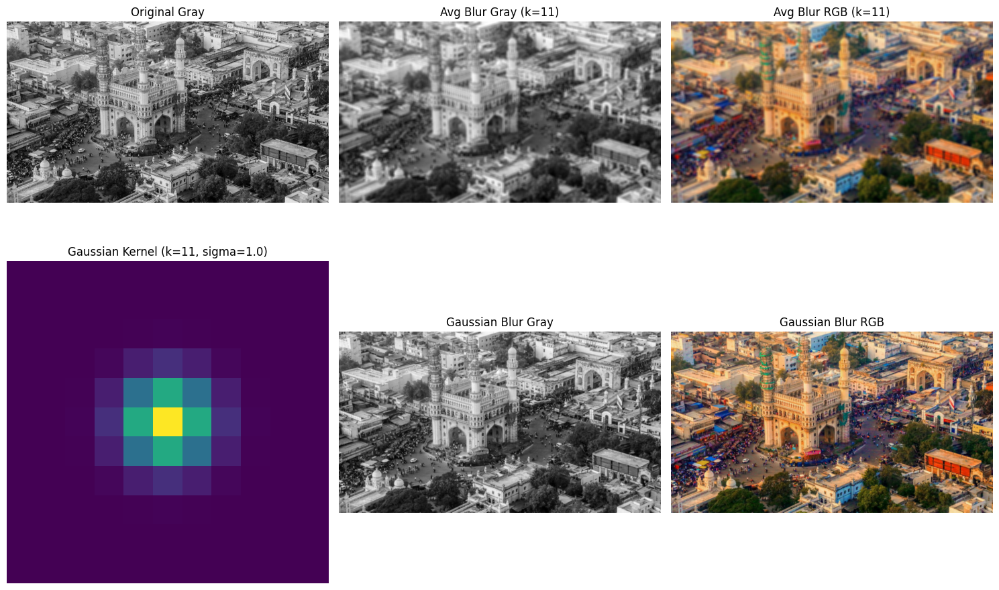

In [35]:
# Grayscale Image using standard coefficients: 0.299R + 0.587G + 0.114B
img_gray = np.dot(img_rgb[...,:3], [0.299, 0.587, 0.114])

# Parameters
ksize = 11
sigma = 1.0

# Run Average Blur
avg_blur_gray_res = average_blur_gray(img_gray, ksize)
avg_blur_rgb_res = average_blur_rgb(img_rgb, ksize)

# Run Gaussian Blur
gauss_kernel_matrix = gaussian_kernel(ksize, sigma) # Just to inspect if needed
gauss_blur_gray_res = gaussian_blur_gray(img_gray, ksize, sigma)
gauss_blur_rgb_res = gaussian_blur_rgb(img_rgb, ksize, sigma)

# Display Results
plt.figure(figsize=(15, 10))

# Row 1: Original and Average Blur
plt.subplot(2, 3, 1)
plt.imshow(img_gray, cmap='gray')
plt.title("Original Gray")
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(avg_blur_gray_res, cmap='gray')
plt.title(f"Avg Blur Gray (k={ksize})")
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(avg_blur_rgb_res.astype(np.uint8) if img_rgb.dtype==np.uint8 else avg_blur_rgb_res)
plt.title(f"Avg Blur RGB (k={ksize})")
plt.axis('off')

# Row 2: Gaussian Blur
plt.subplot(2, 3, 4)
plt.imshow(gauss_kernel_matrix, cmap='viridis')
plt.title(f"Gaussian Kernel (k={ksize}, sigma={sigma})")
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(gauss_blur_gray_res, cmap='gray')
plt.title("Gaussian Blur Gray")
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(gauss_blur_rgb_res)
plt.title("Gaussian Blur RGB")
plt.axis('off')

plt.tight_layout()
plt.show()

### Part B

#### Task - Sobel Edge Detection (NumPy Only)
Implement Sobel X and Sobel Y filters manually using convolution. Apply on the grayscale image.

Compute:
1. Gx
2. Gy
3. Gradient magnitude

Normalize to 0–255 and save the edge map. Threshold if you wish to, if you do then make the thresholding part clear using code comments.

In [10]:
# Define Sobel Kernels Manually
# Sobel X: Detects vertical edges (changes in horizontal direction)
sobel_x = np.array([[-1, 0, 1],
                    [-2, 0, 2],
                    [-1, 0, 1]])

# Sobel Y: Detects horizontal edges (changes in vertical direction)
sobel_y = np.array([[-1, -2, -1],
                    [ 0,  0,  0],
                    [ 1,  2,  1]])

# Apply Convolution (using convolve() from part A)
# We keep the result as floats to preserve negative gradients before squaring.
Gx = convolve(img_gray, sobel_x)
Gy = convolve(img_gray, sobel_y)

# Compute Gradient Magnitude
# Formula: G = sqrt(Gx^2 + Gy^2)
gradient_magnitude = np.sqrt(Gx**2 + Gy**2)

# Normalize to 0-255 (Min-Max normalization)
grad_min = gradient_magnitude.min()
grad_max = gradient_magnitude.max()

# Avoid division by zero if image is flat
if grad_max - grad_min == 0:
    norm_magnitude = np.zeros_like(gradient_magnitude, dtype=np.uint8)
else:
    norm_magnitude = (gradient_magnitude - grad_min) / (grad_max - grad_min)
    norm_magnitude = (norm_magnitude * 255).astype(np.uint8)

In [11]:
# Thresholding
# This converts the edge map into a binary image (black and white).
# Pixels above the threshold are set to 255 (edge), others to 0 (background).
thresh_val = 90  # Adjusted based on image
_, thresholded_map = cv2.threshold(norm_magnitude, thresh_val, 255, cv2.THRESH_BINARY)

# Save the Edge Map
cv2.imwrite('sobel_edge_map.png', norm_magnitude)
cv2.imwrite('sobel_edge_map_binary.png', thresholded_map)
print("Edge maps saved")

Edge maps saved


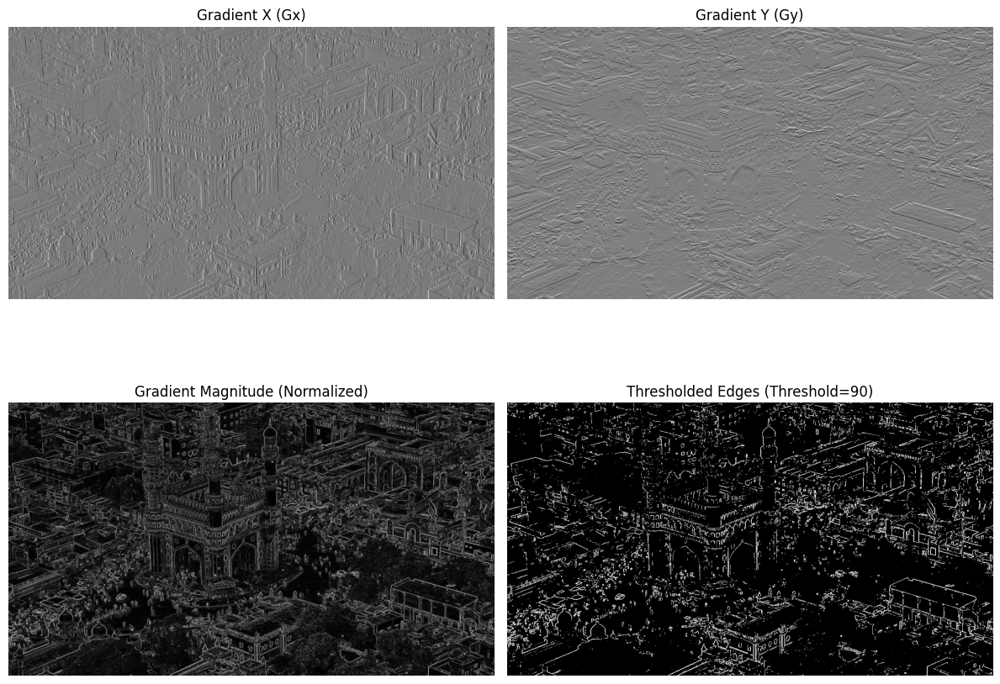

In [12]:
# Display Results
plt.figure(figsize=(12, 10))

plt.subplot(2, 2, 1)
plt.imshow(Gx, cmap='gray')
plt.title("Gradient X (Gx)")
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(Gy, cmap='gray')
plt.title("Gradient Y (Gy)")
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(norm_magnitude, cmap='gray')
plt.title("Gradient Magnitude (Normalized)")
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(thresholded_map, cmap='gray')
plt.title(f"Thresholded Edges (Threshold={thresh_val})")
plt.axis('off')

plt.tight_layout()
plt.show()

### Part C

#### Task 1 — Laplacian Sharpening ( Only Numpy and Grayscale )
1. Use any 3×3 Laplacian kernel (4-connected or 8-connected).

2. Compute:
* <code>lap = convolve(img, laplacian_kernel)</code>
* <code>sharp = img - lap * alpha</code> where alpha ∈ [0.2, 1].

3. Now, put alpha = 1, if you had chosen a different value earlier. Get a new output. Then use the code in the lecture to do the same using cv2. Now, use python to verify if both numpy with alpha = 1 and cv2 give the exact same output ( Compare the matrices )

#### Task 2 - Unsharp Masking ( Only Numpy and Grayscale )
1. Apply Gaussian blur (from Part 1).
2. Subtract blurred image from original: <code> mask = img - blurred </code>
3. Add scaled mask back: <code>sharp = img + alpha * mask</code> , where you can choose any value of alpha.
4. See how negative values of alpha will give you a blurred image.  



In [20]:
# Task 1 - Laplacian Sharpening

# Convert to float32 to handle negative values during convolution
img_float = img_gray.astype(np.float32)

# Define 3x3 Laplacian Kernel (Negative Center)
# Using a negative center so that (img - lap) adds the edge contrast back to the image
laplacian_kernel = np.array([[0,  1, 0],
                             [1, -4, 1],
                             [0,  1, 0]], dtype=np.float32)

# Compute 'lap' (using convolve() from Part A)
lap_numpy = convolve(img_float, laplacian_kernel)

# Compute 'sharp' with alpha = 1
alpha = 1.0
# Formula: sharp = img - lap * alpha
# (Since lap calculates edges, subtracting it adds brightness to centers.)
sharp_numpy = img_float - (lap_numpy * alpha)
sharp_numpy_clipped = np.clip(sharp_numpy, 0, 255)

# Using OpenCV to do the same
lap_cv2 = cv2.Laplacian(img_float, cv2.CV_32F, ksize=1, borderType=cv2.BORDER_REFLECT_101)
sharp_cv2 = img_float - (lap_cv2 * alpha)
sharp_cv2_clipped = np.clip(sharp_cv2, 0, 255)

# Verify results (Compare Matrices)
# Using np.allclose to allow for tiny floating point differences
are_identical = np.allclose(sharp_numpy, sharp_cv2, atol=1e-3)
max_diff = np.max(np.abs(sharp_numpy - sharp_cv2))

print(f"Comparison Result:")
print(f"NumPy and OpenCV outputs are identical (within tolerance): {are_identical}")
print(f"Maximum absolute difference between matrices: {max_diff}")

Comparison Result:
NumPy and OpenCV outputs are identical (within tolerance): True
Maximum absolute difference between matrices: 0.0001220703125


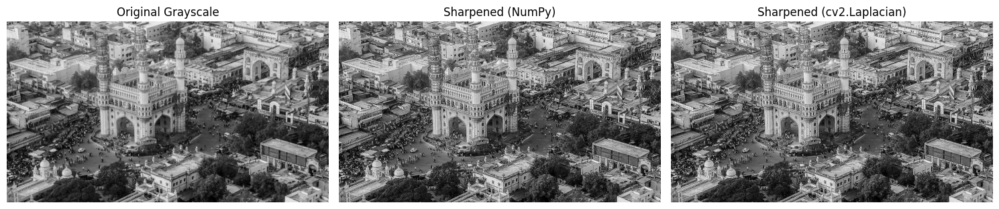

In [21]:
# Display Results
plt.figure(figsize=(15, 6))

plt.subplot(1, 3, 1)
plt.imshow(img_gray, cmap='gray')
plt.title("Original Grayscale")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(sharp_numpy_clipped, cmap='gray')
plt.title("Sharpened (NumPy)")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(sharp_cv2_clipped, cmap='gray')
plt.title("Sharpened (cv2.Laplacian)")
plt.axis('off')

plt.tight_layout()
plt.show()

In [22]:
# Task 2 - Unsharp Masking

# Parameters
ksize_unsharp = 15     # Kernel size for blur (must be odd)
sigma_unsharp = 5.0    # Sigma for blur

# Apply Gaussian Blur (Using the function from Part A)
blurred_img = gaussian_blur_gray(img_float, ksize_unsharp, sigma_unsharp)

# Create the Mask
# (mask contains the details/edges lost in blurring)
mask = img_float - blurred_img

# Apply Unsharp Masking (Sharpening)
alpha_sharp = 1.5
sharp_img_unsharp = img_float + (alpha_sharp * mask)
sharp_img_unsharp = np.clip(sharp_img_unsharp, 0, 255).astype(np.uint8)

# Apply Negative Alpha (Blurring)
alpha_blur = -1.0
# img + (-1 * (img - blur)) = img - img + blur = blur
reconstructed_blur = img_float + (alpha_blur * mask)
reconstructed_blur = np.clip(reconstructed_blur, 0, 255).astype(np.uint8)

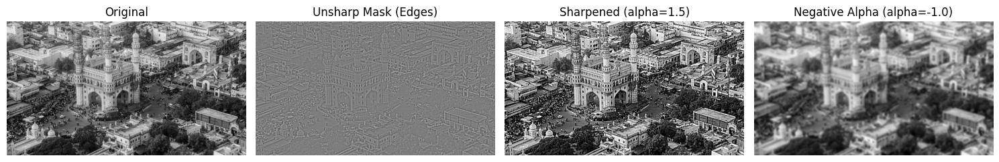

In [23]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 4, 1)
plt.imshow(img_gray, cmap='gray')
plt.title("Original")
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(mask, cmap='gray')
plt.title("Unsharp Mask (Edges)")
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(sharp_img_unsharp, cmap='gray')
plt.title(f"Sharpened (alpha={alpha_sharp})")
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(reconstructed_blur, cmap='gray')
plt.title(f"Negative Alpha (alpha={alpha_blur})")
plt.axis('off')

plt.tight_layout()
plt.show()

### Part D

#### Task - Frequency Analysis (LPF & HPF Verification)
Compute the magnitude spectrum of the original image, gaussian blurred image and the unsharp masking image. Now, play with the alpha value in sharpening and gaussian kernel and notice how the magntude spectrum changes.
Then, in code comments, explain your observations of dark and bright areas in the magnitude spectrum. In nutshell, verify how convolution is actually filtering frequencies depending on the kernel.

In [24]:
# Helper function to compute Magnitude Spectrum
def get_magnitude_spectrum(img):
    # Compute 2D Fourier Transform
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)  # Shift the zero-frequency component to the center of the spectrum

    # Compute Magnitude
    # Added 1e-5 to avoid log(0) error
    magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1e-5)

    return magnitude_spectrum

# Parameters
ksize = 21       # Kernel size for Blur (LPF)
sigma = 5.0      # Sigma for Blur
alpha = 2.0      # Strength for Unsharp Masking (Sharpening)

# Original Image
original_spec = get_magnitude_spectrum(img_gray)

# Gaussian Blur (using the function from Part A)
blurred_img = gaussian_blur_gray(img_gray, ksize, sigma)
blurred_spec = get_magnitude_spectrum(blurred_img)

# Unsharp Masking
# Formula: Sharpened = Original + alpha * (Original - Blurred)
mask = img_gray - blurred_img
sharpened_img = img_gray + (alpha * mask)
sharpened_img = np.clip(sharpened_img, 0, 255)
sharpened_spec = get_magnitude_spectrum(sharpened_img)

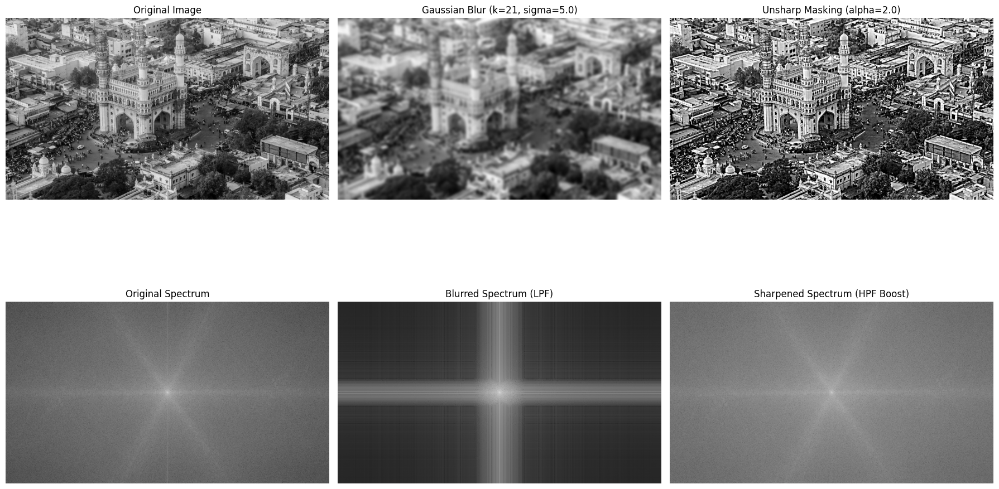

In [25]:
# Display Results
plt.figure(figsize=(18, 12))

# Original
plt.subplot(2, 3, 1)
plt.imshow(img_gray, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(original_spec, cmap='gray')
plt.title("Original Spectrum")
plt.axis('off')

# Blurred
plt.subplot(2, 3, 2)
plt.imshow(blurred_img, cmap='gray')
plt.title(f"Gaussian Blur (k={ksize}, sigma={sigma})")
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(blurred_spec, cmap='gray')
plt.title("Blurred Spectrum (LPF)")
plt.axis('off')

# Sharpened
plt.subplot(2, 3, 3)
plt.imshow(sharpened_img, cmap='gray')
plt.title(f"Unsharp Masking (alpha={alpha})")
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(sharpened_spec, cmap='gray')
plt.title("Sharpened Spectrum (HPF Boost)")
plt.axis('off')

plt.tight_layout()
plt.show()

In [15]:
# Observations

# Center vs Outer regions:
#    In the magnitude spectrum, the Center represents Low frequencies (smooth areas).
#    The outer regions represent High frequencies (edges, etc).

# Gaussian Blur (LPF) Spectrum:
#    Observation: The center remains bright, but the outer regions become noticeably darker compared to the original.
#    Explanation: Gaussian Blur acts as a Low Pass Filter. It allows low frequencies to pass but reduces high frequencies.
#    Since edges and fine details correspond to high frequencies, removing them results in a
#    blurry image and a spectrum that fades out quickly as you move away from the center.

# Unsharp Masking (Sharpening) Spectrum:
#    Observation: The outer regions (high frequencies) appear brighter compared to the original spectrum.
#    Explanation: Sharpening works by enhancing the edges. Since edges are high-frequency components, adding the
#    difference mask (which contains mostly edges) boosts the magnitude of high frequencies in the spectrum.
#    This makes the details in the spatial image "pop" more.

### Part E

#### Task - Custom Colour Kernel (Detect Yellow Leaf Edges)

**Instructions :**
* At the start of the assignment .ipynb file, you will find a code cell in section 1, run it to see an image with a yellow leaf amongst green leaves.
* Design a 3×3 or 5×5 custom kernel applied separately to each channel that highlights the edges where any other colour transitions into a yellowish hue.

**Hints :**

* Yellow = (R high, G high, B low)

* Dark green = (G high, R low, B low)

**Steps:**

1. Analyze the RGB values of green & yellow regions.

2. Create a custom kernel that responds strongly to change from green to yellow in:
* Red matrices of RGB
* Green matrices of RGB
* Optionally R - G difference
* Think about the gradient in Red - Green. Is there a huge change the value of R-G when colour changes from Green to Yellow ? If yes, try to exploit it.

3. Combine the response maps.

4. Get a clean outline around the leaf.

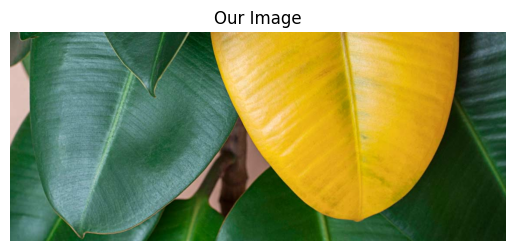

In [16]:
plt.imshow(img_part5)
plt.axis("off")
plt.title("Our Image")
plt.show()

In [26]:
# Split Channels
R = img_part5[:, :, 0]
G = img_part5[:, :, 1]
B = img_part5[:, :, 2]

# Analyze & Design Kernel
# The goal is to detect changes in Red (Green -> Yellow transition)
# A simple edge detector on Red works best.
custom_kernel = np.array([[-1, -1, -1],
                          [-1,  8, -1],
                          [-1, -1, -1]])

# Apply Kernel to Channels
# Detect edges in Red Channel
edge_R = cv2.filter2D(R, -1, custom_kernel)

# Detect edges in Green Channel
edge_G = cv2.filter2D(G, -1, custom_kernel)

# Combine Responses
# We want strong Red edges where Green edges are relatively weaker or just general edges in Red.
# We also want to ignore background noise.
# Since Yellow = High R + High G and Green = Low R + High G, the boundary is defined by the change in R.
response_map = np.abs(edge_R)

# Clean up using a threshold
_, binary_edges = cv2.threshold(response_map, 50, 255, cv2.THRESH_BINARY)

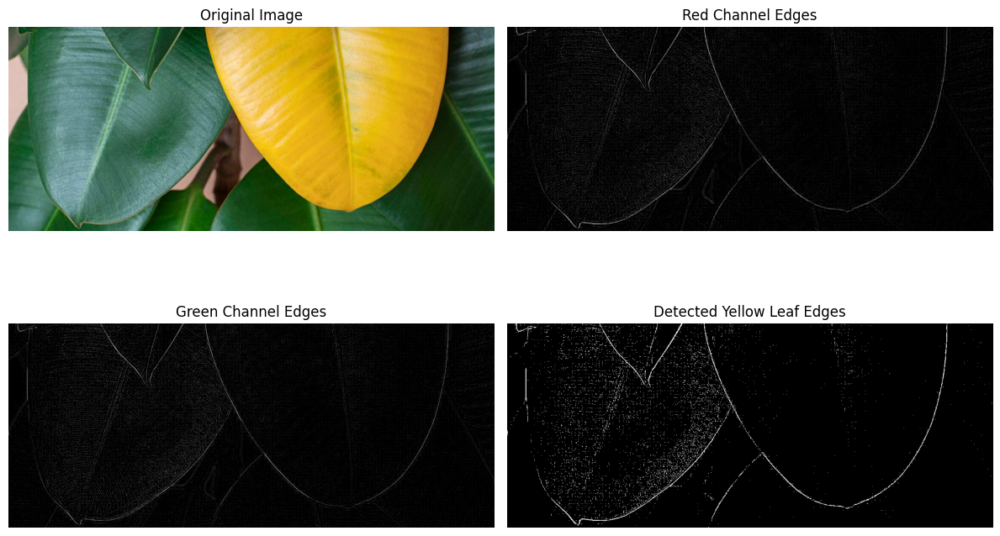

In [27]:
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.imshow(img_part5)
plt.title("Original Image")
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(edge_R, cmap='gray')
plt.title("Red Channel Edges")
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(edge_G, cmap='gray')
plt.title("Green Channel Edges")
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(binary_edges, cmap='gray')
plt.title("Detected Yellow Leaf Edges")
plt.axis('off')

plt.tight_layout()
plt.show()

### Bonus - Part F

#### Task - Color Manipulation Using Lecture 2 Concepts

**NOTE :** only for this, you can use cv2 functions, no need of doing everything in Numpy. Although there are still more brownie parts for Numpy hardwork.

1. Convert the RGB image to HSV. Use your rgb_to_hsv() from Lecture 2 Assignment - free Numopy points ;)) .
2. Identify pixels belonging to the yellow leaf using an HSV mask. (maybe take help from Part E or design a new hue mask)
3. Now use your full brain and chnage the colour of the leaf to red.

Convert back to RGB.

Display the final result.

For reference, heres the image I expect as a result. And its not actually tough, easy 5 lines code.
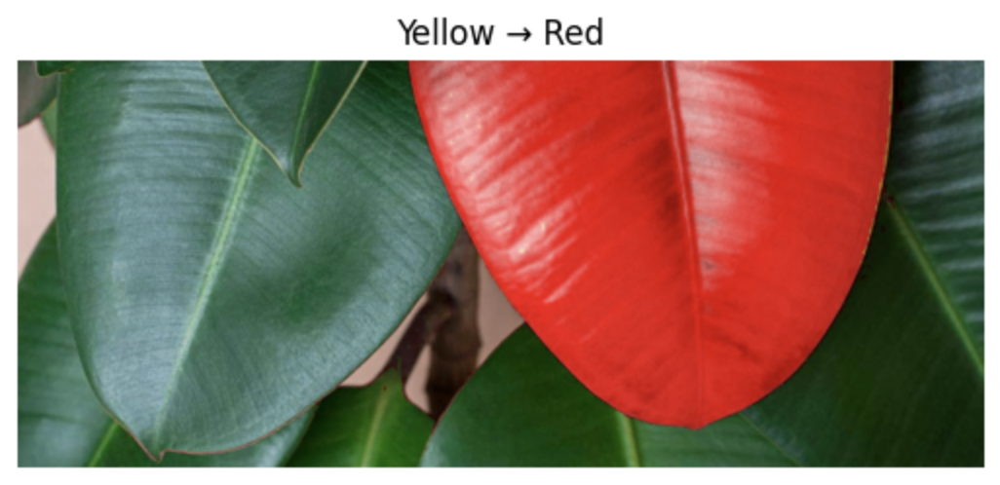

Also, we can change to a less brighter colour
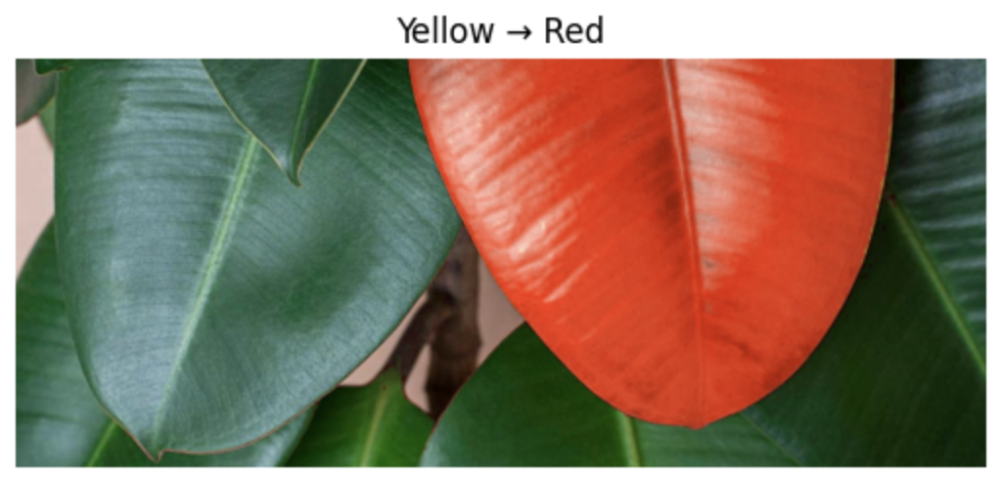

In [33]:
# Use the same target image from Part E
image_f = img_part5.copy()

# Convert to HSV
hsv_img = cv2.cvtColor(image_f, cv2.COLOR_RGB2HSV)

# Identify Yellow Pixels (Masking)
# Yellow in OpenCV HSV: Hue is approx 30 (range 20-40)
# Saturation should be high (colorful), Value should be high (bright)
lower_yellow = np.array([15, 50, 50])
upper_yellow = np.array([40, 255, 255])

# Create binary mask: 255 where yellow, 0 elsewhere
yellow_mask = cv2.inRange(hsv_img, lower_yellow, upper_yellow)

# Change Color to Red
# Red in HSV is Hue ~ 0 or 179.
# Where mask is non-zero (yellow), set Hue to 0 (Red)
h_channel = hsv_img[:, :, 0]
h_channel[yellow_mask > 0] = 0

# Update the HSV image
hsv_img[:, :, 0] = h_channel

# Convert back to RGB
final_result = cv2.cvtColor(hsv_img, cv2.COLOR_HSV2RGB)

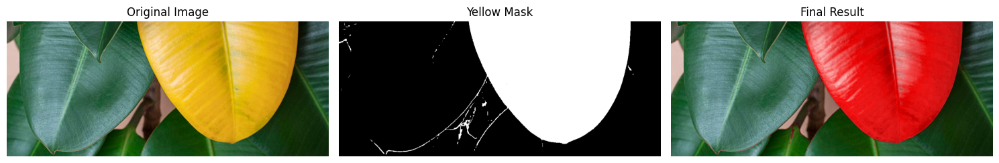

In [34]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(img_part5)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(yellow_mask, cmap='gray')
plt.title("Yellow Mask")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(final_result)
plt.title("Final Result")
plt.axis('off')

plt.tight_layout()
plt.show()